In [2]:
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

In [3]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import pandas_profiling as pp
import seaborn as sns
from sklearn.model_selection import GridSearchCV
plt.style.use('bmh')
from sklearn.pipeline import make_pipeline
from sklearn.naive_bayes import GaussianNB
from sklearn.model_selection import RandomizedSearchCV
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, ExtraTreesClassifier
from sklearn.tree import DecisionTreeClassifier, export_graphviz
import pydotplus
from IPython.display import Image
import xgboost as xgb
from xgboost.sklearn import XGBClassifier
from catboost import CatBoostClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.linear_model import SGDClassifier
from sklearn.impute import KNNImputer
import math
from sklearn.preprocessing import LabelEncoder
#from sklearn.preprocessing import CategoricalEncoder as ce
import category_encoders as ce
from category_encoders import HashingEncoder
from sklearn.preprocessing import MinMaxScaler
from imblearn.over_sampling import SMOTE
from sklearn.preprocessing import QuantileTransformer

In [4]:
import numpy as np
from icecream import ic
import lightgbm as lgb

from mlxtend.classifier import StackingClassifier
from sklearn.model_selection import train_test_split,cross_val_predict,cross_val_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import StratifiedKFold
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix,roc_auc_score,roc_curve,classification_report,roc_curve,auc
import seaborn as sns
from sklearn.model_selection import train_test_split,GridSearchCV,RandomizedSearchCV

import sklearn.feature_selection as fs 
import statsmodels.api as sm
import scipy.stats as stats

#from patsy import dmatrices

%matplotlib inline
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import TruncatedSVD

import warnings
warnings.filterwarnings('ignore')

In [5]:
os.getcwd()

'C:\\Users\\peddi\\ML projects'

In [6]:
os.chdir("D:\Data science\Hackathons\Jobathon5'21")

In [7]:
os.getcwd()

"D:\\Data science\\Hackathons\\Jobathon5'21"

In [8]:
df_train=pd.read_csv('train.csv')
df_train.head()

,ID,Gender,Age,Region_Code,Occupation,Channel_Code,Vintage,Credit_Product,Avg_Account_Balance,Is_Active,Is_Lead
0,NNVBBKZB,Female,73,RG268,Other,X3,43,No,1045696,No,0
1,IDD62UNG,Female,30,RG277,Salaried,X1,32,No,581988,No,0
2,HD3DSEMC,Female,56,RG268,Self_Employed,X3,26,No,1484315,Yes,0
3,BF3NC7KV,Male,34,RG270,Salaried,X1,19,No,470454,No,0
4,TEASRWXV,Female,30,RG282,Salaried,X1,33,No,886787,No,0


In [9]:
df_test=pd.read_csv('test.csv')
df_test.head()

,ID,Gender,Age,Region_Code,Occupation,Channel_Code,Vintage,Credit_Product,Avg_Account_Balance,Is_Active
0,VBENBARO,Male,29,RG254,Other,X1,25,Yes,742366,No
1,CCMEWNKY,Male,43,RG268,Other,X2,49,NaN,925537,No
2,VK3KGA9M,Male,31,RG270,Salaried,X1,14,No,215949,No
3,TT8RPZVC,Male,29,RG272,Other,X1,33,No,868070,No
4,SHQZEYTZ,Female,29,RG270,Other,X1,19,No,657087,No


In [10]:
df_train.shape

(245725, 11)

In [11]:
df_test.shape

(105312, 10)

In [12]:
train=df_train.copy()
test=df_test.copy()

### Missing value analysis

In [13]:
train.isnull().sum()

ID                         0
Gender                     0
Age                        0
Region_Code                0
Occupation                 0
Channel_Code               0
Vintage                    0
Credit_Product         29325
Avg_Account_Balance        0
Is_Active                  0
Is_Lead                    0
dtype: int64

In [14]:
test.isnull().sum()

ID                         0
Gender                     0
Age                        0
Region_Code                0
Occupation                 0
Channel_Code               0
Vintage                    0
Credit_Product         12522
Avg_Account_Balance        0
Is_Active                  0
dtype: int64

In [15]:
#percentage of null values in train set
train.isnull().sum()/train.shape[0]*100

ID                      0.000000
Gender                  0.000000
Age                     0.000000
Region_Code             0.000000
Occupation              0.000000
Channel_Code            0.000000
Vintage                 0.000000
Credit_Product         11.934073
Avg_Account_Balance     0.000000
Is_Active               0.000000
Is_Lead                 0.000000
dtype: float64

In [16]:
#percentage of null values in test set
test.isnull().sum()/test.shape[0]*100

ID                      0.000000
Gender                  0.000000
Age                     0.000000
Region_Code             0.000000
Occupation              0.000000
Channel_Code            0.000000
Vintage                 0.000000
Credit_Product         11.890383
Avg_Account_Balance     0.000000
Is_Active               0.000000
dtype: float64

In [17]:
#train.dropna(axis=0,inplace=True)

In [18]:
#test.dropna(axis=0,inplace=True)

In [19]:
train.columns

Index(['ID', 'Gender', 'Age', 'Region_Code', 'Occupation', 'Channel_Code',
       'Vintage', 'Credit_Product', 'Avg_Account_Balance', 'Is_Active',
       'Is_Lead'],
      dtype='object')

In [20]:
#the rows with null values in train set
train[(train['Credit_Product'].isnull())]

,ID,Gender,Age,Region_Code,Occupation,Channel_Code,Vintage,Credit_Product,Avg_Account_Balance,Is_Active,Is_Lead
6,ETQCZFEJ,Male,62,RG282,Other,X3,20,NaN,1056750,Yes,1
15,UJ2NJKKL,Male,33,RG268,Self_Employed,X2,69,NaN,517063,Yes,1
31,ABPMK4WU,Female,32,RG279,Salaried,X4,15,NaN,1072850,Yes,1
36,MTEIXMB9,Female,41,RG268,Self_Employed,X3,62,NaN,962383,No,1
40,6WX9JDVK,Female,63,RG254,Other,X3,103,NaN,1249319,Yes,1
...,...,...,...,...,...,...,...,...,...,...,...
245684,WVJFPREY,Female,51,RG281,Entrepreneur,X3,99,NaN,552992,No,1
245694,WIZBXYQZ,Female,50,RG277,Self_Employed,X2,92,NaN,1385124,No,1
245699,MARTXU7T,Male,53,RG254,Other,X2,19,NaN,1141825,Yes,1
245714,KSCFGXV3,Female,46,RG268,Self_Employed,X2,19,NaN,993195,No,1


In [21]:
train['Credit_Product'].mode()

0    No
dtype: object

In [22]:
train['Credit_Product'].fillna(value='No',inplace=True,axis=0,)
test['Credit_Product'].fillna(value='No',inplace=True,axis=0,)

In [23]:
train.isnull().sum()

ID                     0
Gender                 0
Age                    0
Region_Code            0
Occupation             0
Channel_Code           0
Vintage                0
Credit_Product         0
Avg_Account_Balance    0
Is_Active              0
Is_Lead                0
dtype: int64

In [24]:
test.isnull().sum()

ID                     0
Gender                 0
Age                    0
Region_Code            0
Occupation             0
Channel_Code           0
Vintage                0
Credit_Product         0
Avg_Account_Balance    0
Is_Active              0
dtype: int64

- There are very less percentage of null values in only one column of the dataset. 
- I have filled it with the mode of the dataset(Stats method)

### Data cleaning and Data analysis

In [25]:
train.head()

,ID,Gender,Age,Region_Code,Occupation,Channel_Code,Vintage,Credit_Product,Avg_Account_Balance,Is_Active,Is_Lead
0,NNVBBKZB,Female,73,RG268,Other,X3,43,No,1045696,No,0
1,IDD62UNG,Female,30,RG277,Salaried,X1,32,No,581988,No,0
2,HD3DSEMC,Female,56,RG268,Self_Employed,X3,26,No,1484315,Yes,0
3,BF3NC7KV,Male,34,RG270,Salaried,X1,19,No,470454,No,0
4,TEASRWXV,Female,30,RG282,Salaried,X1,33,No,886787,No,0


In [26]:
train.shape

(245725, 11)

In [27]:
# dropping ID column from the train set as it is not useful for analysis and further processing
train.drop(columns=['ID'],axis=1,inplace=True)
test.drop(columns=['ID'],axis=1,inplace=True)

In [28]:
# checking the datatypes
train.dtypes

Gender                 object
Age                     int64
Region_Code            object
Occupation             object
Channel_Code           object
Vintage                 int64
Credit_Product         object
Avg_Account_Balance     int64
Is_Active              object
Is_Lead                 int64
dtype: object

In [29]:
train['Channel_Code'].value_counts()

X1    103718
X3     68712
X2     67726
X4      5569
Name: Channel_Code, dtype: int64

In [30]:
# one of the method to find outliers in the dataset where Q1 and Q3 quarters be the base. This is a stats method for
#finding outliers
coutliers=['Age','Vintage','Avg_Account_Balance']
for l in coutliers:
    #extract quartiles
    q75,q25=np.percentile(train[l],[75,25])
    #calculate IQR
    iqr=q75-q25
    #calculate inner and outer fence
    minimum=q25-(iqr*1.5)
    maximum=q75+(iqr*1.5)
    ic(minimum);
    ic(maximum);
    #replace with na
    min_train=train.loc[train[l]<minimum,l]
    max_train=train.loc[train[l]>maximum,l]
    ic(min_train);
    ic(max_train);
    #calculate outlers
    outliers=pd.concat([min_train,max_train],)
    outliers

ic| minimum: -6.0


-6.0

ic| maximum: 90.0


90.0

ic| min_train: Series([], Name: Age, dtype: int64)


Series([], Name: Age, dtype: int64)

ic| max_train: Series([], Name: Age, dtype: int64)


Series([], Name: Age, dtype: int64)

Series([], Name: Age, dtype: int64)

ic| minimum: -59.5


-59.5

ic| maximum: 152.5


152.5

ic| min_train: Series([], Name: Vintage, dtype: int64)


Series([], Name: Vintage, dtype: int64)

ic| max_train: Series([], Name: Vintage, dtype: int64)


Series([], Name: Vintage, dtype: int64)

Series([], Name: Vintage, dtype: int64)

ic| minimum: -539224.0


-539224.0

ic| maximum: 2510200.0


2510200.0

ic| min_train: Series([], Name: Avg_Account_Balance, dtype: int64)


Series([], Name: Avg_Account_Balance, dtype: int64)

ic| max_train: 35        2521592
               71        2824468
               113       6278683
               184       5878049
               205       2952343
                          ...   
               245638    5396737
               245653    6900312
               245661    3566719
               245676    2769973
               245701    9491986
               Name: Avg_Account_Balance, Length: 14612, dtype: int64


35        2521592
71        2824468
113       6278683
184       5878049
205       2952343
           ...   
245638    5396737
245653    6900312
245661    3566719
245676    2769973
245701    9491986
Name: Avg_Account_Balance, Length: 14612, dtype: int64

35        2521592
71        2824468
113       6278683
184       5878049
205       2952343
           ...   
245638    5396737
245653    6900312
245661    3566719
245676    2769973
245701    9491986
Name: Avg_Account_Balance, Length: 14612, dtype: int64

In [31]:
train.shape

(245725, 10)

In [32]:
#numerical and categorical columns in train set
#categorical features
cat_cols = train.select_dtypes(include =[np.object])
print("Categorical Features in Train Set:",cat_cols.shape[1])

#numerical features
num_cols= train.select_dtypes(include =[np.float64,np.int64])
print("Numerical Features in Train Set:",num_cols.shape[1])

Categorical Features in Train Set: 6
Numerical Features in Train Set: 4


In [33]:
#Numerical and categorical in test set
#categorical features
cat_test = test.select_dtypes(include =[np.object])
print("Categorical Features in Test Set:",cat_test.shape[1])

#numerical features
num_test= test.select_dtypes(include =[np.float64,np.int64])
print("Numerical Features in Test Set:",num_test.shape[1])

Categorical Features in Test Set: 6
Numerical Features in Test Set: 3


In [34]:
num_cols.drop('Is_Lead',axis=1,inplace=True)

In [35]:
cat_cols.tail()

,Gender,Region_Code,Occupation,Channel_Code,Credit_Product,Is_Active
245720,Male,RG284,Self_Employed,X3,No,No
245721,Male,RG268,Salaried,X1,No,Yes
245722,Female,RG281,Salaried,X1,No,No
245723,Female,RG273,Salaried,X1,No,No
245724,Male,RG269,Salaried,X1,No,No


In [36]:
num_test.head()

,Age,Vintage,Avg_Account_Balance
0,29,25,742366
1,43,49,925537
2,31,14,215949
3,29,33,868070
4,29,19,657087


In [37]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 245725 entries, 0 to 245724
Data columns (total 10 columns):
 #   Column               Non-Null Count   Dtype 
---  ------               --------------   ----- 
 0   Gender               245725 non-null  object
 1   Age                  245725 non-null  int64 
 2   Region_Code          245725 non-null  object
 3   Occupation           245725 non-null  object
 4   Channel_Code         245725 non-null  object
 5   Vintage              245725 non-null  int64 
 6   Credit_Product       245725 non-null  object
 7   Avg_Account_Balance  245725 non-null  int64 
 8   Is_Active            245725 non-null  object
 9   Is_Lead              245725 non-null  int64 
dtypes: int64(4), object(6)
memory usage: 18.7+ MB


In [38]:
train.describe()

,Age,Vintage,Avg_Account_Balance,Is_Lead
count,245725.000000,245725.000000,2.457250e+05,245725.000000
mean,43.856307,46.959141,1.128403e+06,0.237208
std,14.828672,32.353136,8.529364e+05,0.425372
min,23.000000,7.000000,2.079000e+04,0.000000
25%,30.000000,20.000000,6.043100e+05,0.000000
50%,43.000000,32.000000,8.946010e+05,0.000000
75%,54.000000,73.000000,1.366666e+06,0.000000
max,85.000000,135.000000,1.035201e+07,1.000000


In [39]:
report_train=pp.ProfileReport(train,)
report_train

Summarize dataset:   0%|          | 0/23 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [40]:
train[(train['Gender']=='Female')&(train['Age']==25)&(train['Region_Code']=='RG281')&(train['Channel_Code']=='X1')&(train['Avg_Account_Balance']==1771180)]

,Gender,Age,Region_Code,Occupation,Channel_Code,Vintage,Credit_Product,Avg_Account_Balance,Is_Active,Is_Lead
160841,Female,25,RG281,Salaried,X1,13,Yes,1771180,No,0
192879,Female,25,RG281,Salaried,X1,13,Yes,1771180,No,0


- From the above profile report and analysis, one of the noticable observation is there are 10(few) duplicate rows in the dataset.

### Feature engineering and selection

In [41]:
train['Region_Code'].value_counts()

RG268    35934
RG283    29416
RG254    26840
RG284    19320
RG277    12826
RG280    12775
RG269     7863
RG270     7720
RG261     7633
RG257     6101
RG251     5950
RG282     5829
RG274     5286
RG272     5252
RG281     5093
RG273     4497
RG252     4286
RG279     3976
RG263     3687
RG275     3245
RG260     3110
RG256     2847
RG264     2793
RG276     2764
RG259     2586
RG250     2496
RG255     2018
RG258     1951
RG253     1858
RG278     1822
RG262     1788
RG266     1578
RG265     1546
RG271     1542
RG267     1497
Name: Region_Code, dtype: int64

In [42]:
len(train['Region_Code'].value_counts())

35

In [43]:
cat_cols.tail()

,Gender,Region_Code,Occupation,Channel_Code,Credit_Product,Is_Active
245720,Male,RG284,Self_Employed,X3,No,No
245721,Male,RG268,Salaried,X1,No,Yes
245722,Female,RG281,Salaried,X1,No,No
245723,Female,RG273,Salaried,X1,No,No
245724,Male,RG269,Salaried,X1,No,No


In [44]:
# Creating dummies for Gender, Region code, Occupation, channel code, credit product, Is active for train set
dummy_df_train=pd.get_dummies(data=train,drop_first=True,columns=cat_cols.columns)
dummy_df_train

,Age,Vintage,Avg_Account_Balance,Is_Lead,Gender_Male,Region_Code_RG251,Region_Code_RG252,Region_Code_RG253,Region_Code_RG254,Region_Code_RG255,...,Region_Code_RG283,Region_Code_RG284,Occupation_Other,Occupation_Salaried,Occupation_Self_Employed,Channel_Code_X2,Channel_Code_X3,Channel_Code_X4,Credit_Product_Yes,Is_Active_Yes
0,73,43,1045696,0,0,0,0,0,0,0,...,0,0,1,0,0,0,1,0,0,0
1,30,32,581988,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
2,56,26,1484315,0,0,0,0,0,0,0,...,0,0,0,0,1,0,1,0,0,1
3,34,19,470454,0,1,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
4,30,33,886787,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
245720,51,109,1925586,0,1,0,0,0,0,0,...,0,1,0,0,1,0,1,0,0,0
245721,27,15,862952,0,1,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,1
245722,26,13,670659,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
245723,28,31,407504,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0


In [45]:
dummy_df_train.columns

Index(['Age', 'Vintage', 'Avg_Account_Balance', 'Is_Lead', 'Gender_Male',
       'Region_Code_RG251', 'Region_Code_RG252', 'Region_Code_RG253',
       'Region_Code_RG254', 'Region_Code_RG255', 'Region_Code_RG256',
       'Region_Code_RG257', 'Region_Code_RG258', 'Region_Code_RG259',
       'Region_Code_RG260', 'Region_Code_RG261', 'Region_Code_RG262',
       'Region_Code_RG263', 'Region_Code_RG264', 'Region_Code_RG265',
       'Region_Code_RG266', 'Region_Code_RG267', 'Region_Code_RG268',
       'Region_Code_RG269', 'Region_Code_RG270', 'Region_Code_RG271',
       'Region_Code_RG272', 'Region_Code_RG273', 'Region_Code_RG274',
       'Region_Code_RG275', 'Region_Code_RG276', 'Region_Code_RG277',
       'Region_Code_RG278', 'Region_Code_RG279', 'Region_Code_RG280',
       'Region_Code_RG281', 'Region_Code_RG282', 'Region_Code_RG283',
       'Region_Code_RG284', 'Occupation_Other', 'Occupation_Salaried',
       'Occupation_Self_Employed', 'Channel_Code_X2', 'Channel_Code_X3',
       'Chan

In [46]:
train.columns

Index(['Gender', 'Age', 'Region_Code', 'Occupation', 'Channel_Code', 'Vintage',
       'Credit_Product', 'Avg_Account_Balance', 'Is_Active', 'Is_Lead'],
      dtype='object')

In [47]:
# Creating dummies for Gender, Region code, Occupation, channel code, credit product, Is active for test set
dummy_df_test=pd.get_dummies(data=test,drop_first=True,columns=cat_test.columns)
dummy_df_test

,Age,Vintage,Avg_Account_Balance,Gender_Male,Region_Code_RG251,Region_Code_RG252,Region_Code_RG253,Region_Code_RG254,Region_Code_RG255,Region_Code_RG256,...,Region_Code_RG283,Region_Code_RG284,Occupation_Other,Occupation_Salaried,Occupation_Self_Employed,Channel_Code_X2,Channel_Code_X3,Channel_Code_X4,Credit_Product_Yes,Is_Active_Yes
0,29,25,742366,1,0,0,0,1,0,0,...,0,0,1,0,0,0,0,0,1,0
1,43,49,925537,1,0,0,0,0,0,0,...,0,0,1,0,0,1,0,0,0,0
2,31,14,215949,1,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
3,29,33,868070,1,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
4,29,19,657087,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
105307,52,86,4242558,1,0,0,0,0,0,0,...,0,0,0,1,0,1,0,0,1,1
105308,55,86,1159153,1,0,0,0,0,0,0,...,0,0,1,0,0,1,0,0,1,0
105309,35,15,1703727,1,0,0,0,1,0,0,...,0,0,0,1,0,0,0,1,0,0
105310,53,93,737178,1,0,0,0,1,0,0,...,0,0,1,0,0,0,1,0,0,1


In [48]:
#Normalizing integer variables
scaler = MinMaxScaler() 
scaled = scaler.fit_transform(num_cols)
scaled1=scaler.fit_transform(num_test)
df_scaled=pd.DataFrame(scaled,columns= num_cols.columns)
df_scaled1=pd.DataFrame(scaled1,columns=num_test.columns)

In [49]:
df_scaled.head()

,Age,Vintage,Avg_Account_Balance
0,0.806452,0.281250,0.099205
1,0.112903,0.195312,0.054321
2,0.532258,0.148438,0.141660
3,0.177419,0.093750,0.043525
4,0.112903,0.203125,0.083823


In [50]:
df_scaled1.head()

,Age,Vintage,Avg_Account_Balance
0,0.081967,0.140625,0.072805
1,0.311475,0.328125,0.091333
2,0.114754,0.054688,0.019558
3,0.081967,0.203125,0.085520
4,0.081967,0.093750,0.064179


In [51]:
dummy_df_test.tail()

,Age,Vintage,Avg_Account_Balance,Gender_Male,Region_Code_RG251,Region_Code_RG252,Region_Code_RG253,Region_Code_RG254,Region_Code_RG255,Region_Code_RG256,...,Region_Code_RG283,Region_Code_RG284,Occupation_Other,Occupation_Salaried,Occupation_Self_Employed,Channel_Code_X2,Channel_Code_X3,Channel_Code_X4,Credit_Product_Yes,Is_Active_Yes
105307,52,86,4242558,1,0,0,0,0,0,0,...,0,0,0,1,0,1,0,0,1,1
105308,55,86,1159153,1,0,0,0,0,0,0,...,0,0,1,0,0,1,0,0,1,0
105309,35,15,1703727,1,0,0,0,1,0,0,...,0,0,0,1,0,0,0,1,0,0
105310,53,93,737178,1,0,0,0,1,0,0,...,0,0,1,0,0,0,1,0,0,1
105311,27,21,591565,1,0,0,0,0,0,1,...,0,0,0,1,0,0,0,0,0,0


In [52]:
train_clean=pd.concat([df_scaled,dummy_df_train.drop(columns=num_cols.columns)],axis=1)
test_clean=pd.concat([df_scaled1,dummy_df_test.drop(columns=num_test.columns)],axis=1)

In [53]:
train_clean.tail()

,Age,Vintage,Avg_Account_Balance,Is_Lead,Gender_Male,Region_Code_RG251,Region_Code_RG252,Region_Code_RG253,Region_Code_RG254,Region_Code_RG255,...,Region_Code_RG283,Region_Code_RG284,Occupation_Other,Occupation_Salaried,Occupation_Self_Employed,Channel_Code_X2,Channel_Code_X3,Channel_Code_X4,Credit_Product_Yes,Is_Active_Yes
245720,0.451613,0.796875,0.184373,0,1,0,0,0,0,0,...,0,1,0,0,1,0,1,0,0,0
245721,0.064516,0.062500,0.081516,0,1,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,1
245722,0.048387,0.046875,0.062903,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
245723,0.080645,0.187500,0.037432,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
245724,0.096774,0.109375,0.107295,0,1,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0


In [54]:
test_clean.tail()

,Age,Vintage,Avg_Account_Balance,Gender_Male,Region_Code_RG251,Region_Code_RG252,Region_Code_RG253,Region_Code_RG254,Region_Code_RG255,Region_Code_RG256,...,Region_Code_RG283,Region_Code_RG284,Occupation_Other,Occupation_Salaried,Occupation_Self_Employed,Channel_Code_X2,Channel_Code_X3,Channel_Code_X4,Credit_Product_Yes,Is_Active_Yes
105307,0.459016,0.617188,0.426851,1,0,0,0,0,0,0,...,0,0,0,1,0,1,0,0,1,1
105308,0.508197,0.617188,0.114963,1,0,0,0,0,0,0,...,0,0,1,0,0,1,0,0,1,0
105309,0.180328,0.062500,0.170047,1,0,0,0,1,0,0,...,0,0,0,1,0,0,0,1,0,0
105310,0.475410,0.671875,0.072280,1,0,0,0,1,0,0,...,0,0,1,0,0,0,1,0,0,1
105311,0.049180,0.109375,0.057551,1,0,0,0,0,0,1,...,0,0,0,1,0,0,0,0,0,0


In [55]:
test_clean.shape

(105312, 46)

In [56]:
cat_cols.head()

,Gender,Region_Code,Occupation,Channel_Code,Credit_Product,Is_Active
0,Female,RG268,Other,X3,No,No
1,Female,RG277,Salaried,X1,No,No
2,Female,RG268,Self_Employed,X3,No,Yes
3,Male,RG270,Salaried,X1,No,No
4,Female,RG282,Salaried,X1,No,No


In [57]:
cat_test.head()

,Gender,Region_Code,Occupation,Channel_Code,Credit_Product,Is_Active
0,Male,RG254,Other,X1,Yes,No
1,Male,RG268,Other,X2,No,No
2,Male,RG270,Salaried,X1,No,No
3,Male,RG272,Other,X1,No,No
4,Female,RG270,Other,X1,No,No


In [58]:
# Scaled data and Categorical columns without encoding and target variable
train_unencoded=pd.concat([df_scaled,cat_cols],axis=1)
test_unencoded=pd.concat([df_scaled1,cat_test],axis=1)

In [59]:
cat_test.shape

(105312, 6)

In [60]:
train_unencoded.tail()

,Age,Vintage,Avg_Account_Balance,Gender,Region_Code,Occupation,Channel_Code,Credit_Product,Is_Active
245720,0.451613,0.796875,0.184373,Male,RG284,Self_Employed,X3,No,No
245721,0.064516,0.062500,0.081516,Male,RG268,Salaried,X1,No,Yes
245722,0.048387,0.046875,0.062903,Female,RG281,Salaried,X1,No,No
245723,0.080645,0.187500,0.037432,Female,RG273,Salaried,X1,No,No
245724,0.096774,0.109375,0.107295,Male,RG269,Salaried,X1,No,No


In [61]:
train.head()

,Gender,Age,Region_Code,Occupation,Channel_Code,Vintage,Credit_Product,Avg_Account_Balance,Is_Active,Is_Lead
0,Female,73,RG268,Other,X3,43,No,1045696,No,0
1,Female,30,RG277,Salaried,X1,32,No,581988,No,0
2,Female,56,RG268,Self_Employed,X3,26,No,1484315,Yes,0
3,Male,34,RG270,Salaried,X1,19,No,470454,No,0
4,Female,30,RG282,Salaried,X1,33,No,886787,No,0


In [62]:
train.shape

(245725, 10)

In [63]:
test_unencoded.shape

(105312, 9)

In [64]:
train1=train.copy()
test1=test.copy()

In [65]:
train1=pd.concat([df_scaled,train1.drop(columns=num_cols.columns)],axis=1)
test1=pd.concat([df_scaled1,test1.drop(columns=num_test.columns)],axis=1)

In [66]:
le = LabelEncoder()
for i in cat_cols.columns:
    train1[i] = le.fit_transform(train1[i])
    test1[i] = le.fit_transform(test1[i])

In [67]:
train1.tail()

,Age,Vintage,Avg_Account_Balance,Gender,Region_Code,Occupation,Channel_Code,Credit_Product,Is_Active,Is_Lead
245720,0.451613,0.796875,0.184373,1,34,3,2,0,0,0
245721,0.064516,0.062500,0.081516,1,18,2,0,0,1,0
245722,0.048387,0.046875,0.062903,0,31,2,0,0,0,0
245723,0.080645,0.187500,0.037432,0,23,2,0,0,0,0
245724,0.096774,0.109375,0.107295,1,19,2,0,0,0,0


In [68]:
test1.tail()

,Age,Vintage,Avg_Account_Balance,Gender,Region_Code,Occupation,Channel_Code,Credit_Product,Is_Active
105307,0.459016,0.617188,0.426851,1,18,2,1,1,1
105308,0.508197,0.617188,0.114963,1,27,1,1,1,0
105309,0.180328,0.062500,0.170047,1,4,2,3,0,0
105310,0.475410,0.671875,0.072280,1,4,1,2,0,1
105311,0.049180,0.109375,0.057551,1,6,2,0,0,0


### Data Visualization

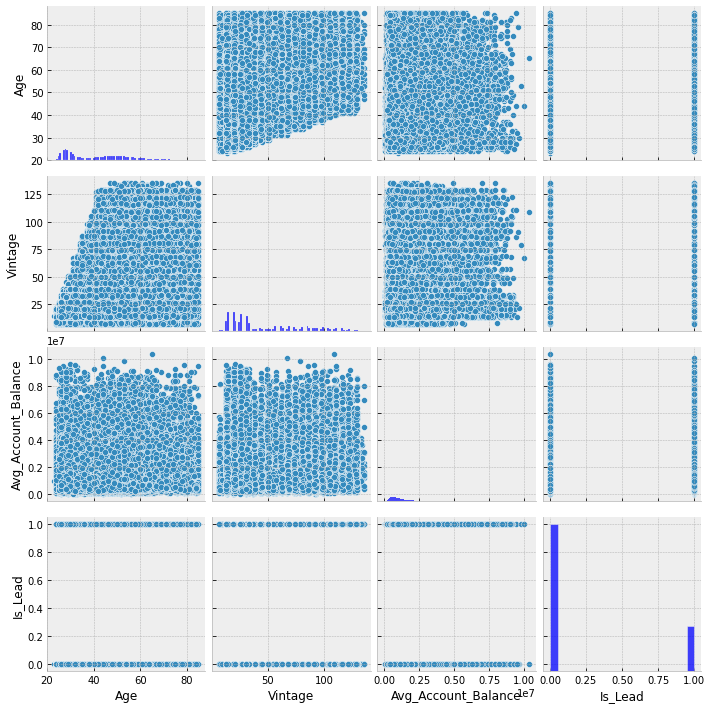

In [69]:
sns.pairplot(train)#train.sample(n=50000))

                          Age   Vintage  Avg_Account_Balance   Is_Lead
Age                  1.000000  0.631242             0.145232  0.230814
Vintage              0.631242  1.000000             0.167433  0.279642
Avg_Account_Balance  0.145232  0.167433             1.000000  0.053370
Is_Lead              0.230814  0.279642             0.053370  1.000000


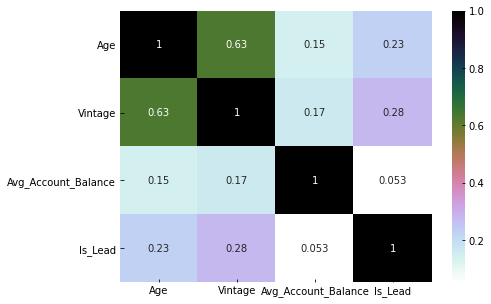

In [70]:
fig,ax=plt.subplots(figsize=(7,5))
train_corr=train.corr()
print(train_corr)
sns.heatmap(train_corr,fmt='.2g',annot=True,cmap='cubehelix_r');

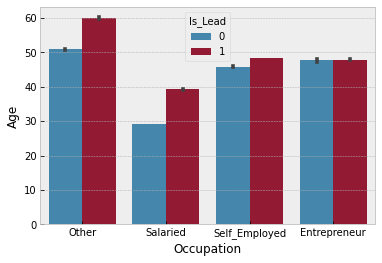

In [71]:
sns.barplot(x='Occupation',y='Age',hue='Is_Lead',data=train);

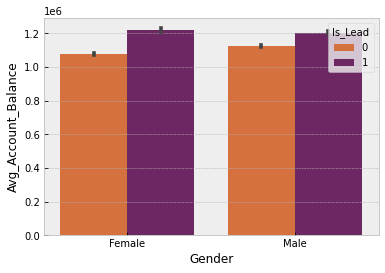

In [72]:
sns.barplot(x='Gender',y='Avg_Account_Balance',hue='Is_Lead',data=train,palette='inferno_r');

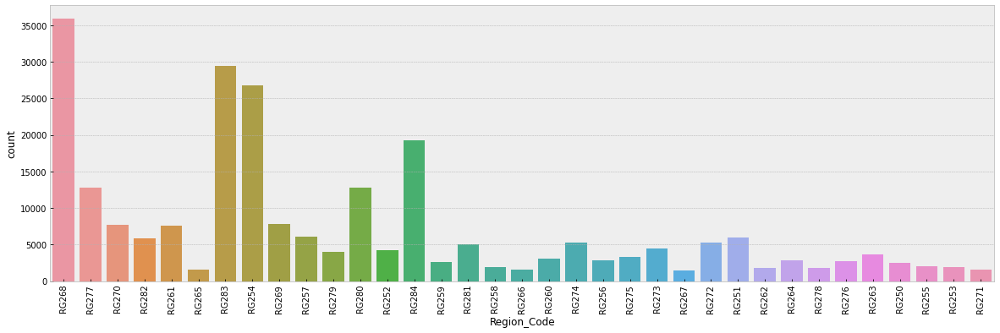

In [73]:
plt.figure(figsize=(20,6))
sns.countplot(x="Region_Code", data=train,orient='vertical');
plt.xticks(rotation='vertical');

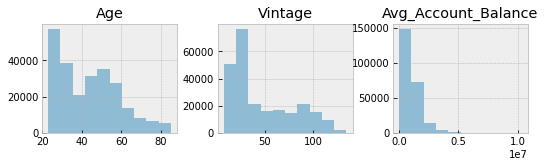

In [74]:
fig, ax = plt.subplots(figsize=(15, 130))
fig = num_cols.hist(alpha=0.5, ax=ax, layout=(50, 5))
plt.show()

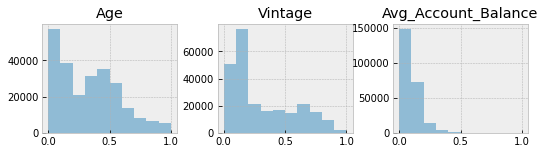

In [75]:
fig, ax = plt.subplots(figsize=(15, 130))
fig = df_scaled.hist(alpha=0.5, ax=ax, layout=(50, 5))
plt.show()

<Figure size 720x288 with 0 Axes>

<AxesSubplot:xlabel='Age', ylabel='Density'>

Text(0.5, 1.0, 'Distribution for Variable Age')

Text(0, 0.5, 'Density')

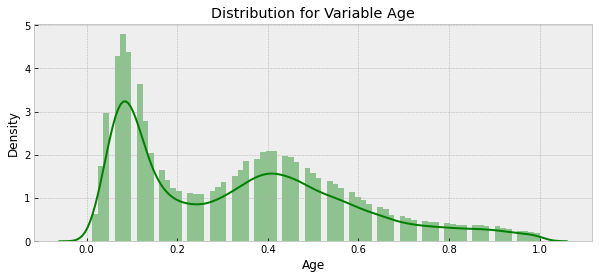

<Figure size 720x288 with 0 Axes>

<AxesSubplot:xlabel='Vintage', ylabel='Density'>

Text(0.5, 1.0, 'Distribution for Variable Vintage')

Text(0, 0.5, 'Density')

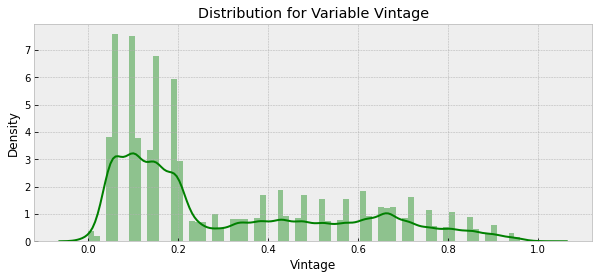

<Figure size 720x288 with 0 Axes>

<AxesSubplot:xlabel='Avg_Account_Balance', ylabel='Density'>

Text(0.5, 1.0, 'Distribution for Variable Avg_Account_Balance')

Text(0, 0.5, 'Density')

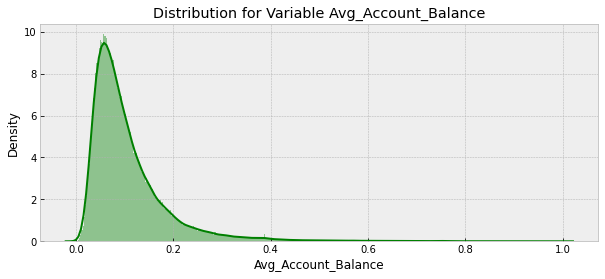

In [76]:
for i in df_scaled.columns:
    #print(i);
    plt.figure(figsize=(10,4));
    sns.distplot(df_scaled[i],bins='auto',color='green');
    plt.title("Distribution for Variable "+i);
    plt.ylabel("Density");
    plt.show();

<Figure size 720x288 with 0 Axes>

<AxesSubplot:xlabel='Age', ylabel='Density'>

Text(0.5, 1.0, 'Distribution for Variable Age')

Text(0, 0.5, 'Density')

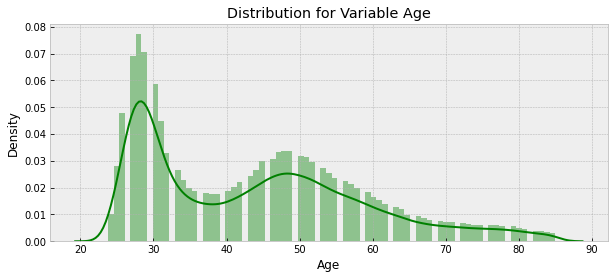

<Figure size 720x288 with 0 Axes>

<AxesSubplot:xlabel='Vintage', ylabel='Density'>

Text(0.5, 1.0, 'Distribution for Variable Vintage')

Text(0, 0.5, 'Density')

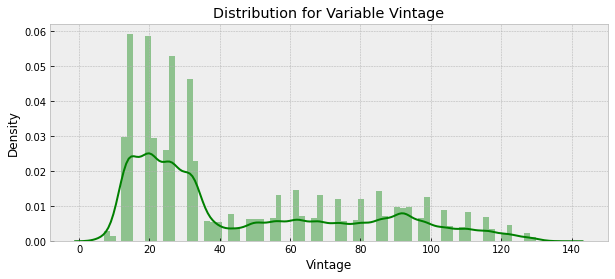

<Figure size 720x288 with 0 Axes>

<AxesSubplot:xlabel='Avg_Account_Balance', ylabel='Density'>

Text(0.5, 1.0, 'Distribution for Variable Avg_Account_Balance')

Text(0, 0.5, 'Density')

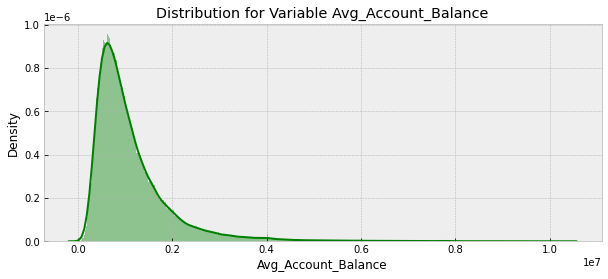

In [77]:
for i in num_cols.columns:
    #print(i);
    plt.figure(figsize=(10,4));
    sns.distplot(num_cols[i],bins='auto',color='green');
    plt.title("Distribution for Variable "+i);
    plt.ylabel("Density");
    plt.show();

<Figure size 432x288 with 0 Axes>

<AxesSubplot:xlabel='Avg_Account_Balance'>

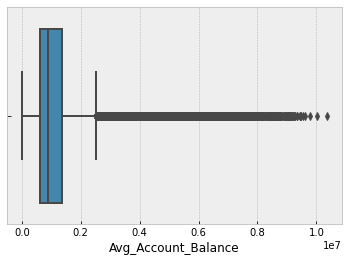

In [78]:
plt.figure(figsize=(6,4))
sns.boxplot('Avg_Account_Balance',data=train)

<Figure size 504x288 with 0 Axes>

<AxesSubplot:xlabel='Is_Lead', ylabel='count'>

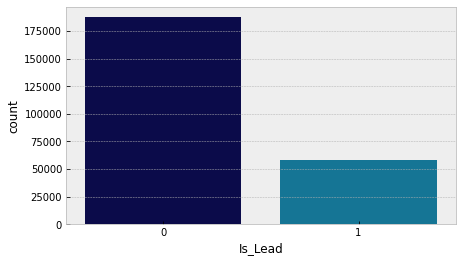

In [79]:
plt.figure(figsize=(7,4))
sns.countplot('Is_Lead',data=train,palette='ocean')

### SVD

In [80]:
train_unencoded.shape

(245725, 9)

In [81]:
com1=train_clean.drop('Is_Lead',axis=1)
com1.shape

(245725, 46)

In [82]:
svd=TruncatedSVD(n_components=45,random_state=356)
trsvd=svd.fit_transform(com1)
cumVarexp=np.cumsum(svd.explained_variance_ratio_)

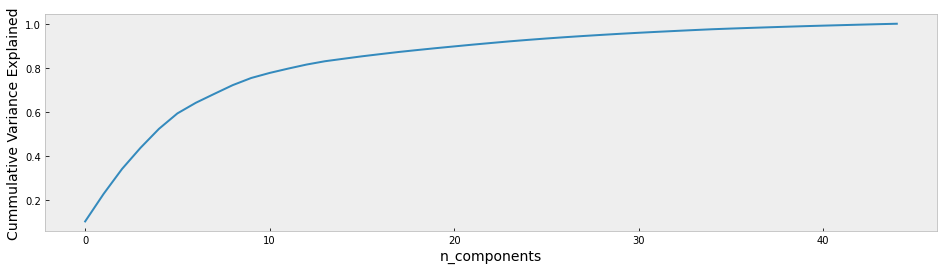

In [83]:
plt.figure(figsize=(16,4));
plt.plot(cumVarexp,linewidth=2);
plt.grid();
plt.xlabel("n_components",size=14);
plt.ylabel('Cummulative Variance Explained',size=14);
plt.show();

In [84]:
svd.components_

array([[ 2.94318261e-01,  2.77549399e-01,  8.17130930e-02, ...,
         1.56130693e-02,  2.56930306e-01,  3.66190631e-01],
       [-3.57663066e-02, -1.29759088e-02, -3.15799707e-02, ...,
         4.92275582e-03, -7.79039047e-02,  7.08309411e-02],
       [ 1.65082295e-01,  1.21800806e-01, -1.22483009e-02, ...,
        -1.08106293e-02, -4.07206511e-02,  5.94150901e-02],
       ...,
       [ 1.35469034e-02, -1.92740282e-03, -4.69087335e-02, ...,
         9.68615857e-03, -1.17915419e-03,  1.35967642e-03],
       [ 6.82495940e-03,  7.58882160e-04, -1.30509650e-01, ...,
         3.59872885e-03, -1.65693927e-03,  8.89992932e-04],
       [-7.70880103e-03, -2.71795995e-02,  9.24202703e-01, ...,
         1.38541348e-02, -4.68720966e-03,  6.40100914e-04]])

In [85]:
len(svd.components_)

45

In [86]:
best_features=[]
new_features=[i for i in com1.columns]
best_features=[new_features[i] for i in svd.components_[0].argsort()[::-1]]

In [87]:
best_features

['Gender_Male',
 'Occupation_Self_Employed',
 'Is_Active_Yes',
 'Age',
 'Vintage',
 'Channel_Code_X3',
 'Credit_Product_Yes',
 'Channel_Code_X2',
 'Occupation_Other',
 'Region_Code_RG268',
 'Occupation_Salaried',
 'Region_Code_RG283',
 'Region_Code_RG254',
 'Avg_Account_Balance',
 'Region_Code_RG284',
 'Region_Code_RG280',
 'Region_Code_RG277',
 'Region_Code_RG269',
 'Region_Code_RG261',
 'Region_Code_RG251',
 'Region_Code_RG270',
 'Channel_Code_X4',
 'Region_Code_RG282',
 'Region_Code_RG257',
 'Region_Code_RG272',
 'Region_Code_RG281',
 'Region_Code_RG274',
 'Region_Code_RG273',
 'Region_Code_RG279',
 'Region_Code_RG263',
 'Region_Code_RG252',
 'Region_Code_RG276',
 'Region_Code_RG260',
 'Region_Code_RG275',
 'Region_Code_RG259',
 'Region_Code_RG253',
 'Region_Code_RG264',
 'Region_Code_RG256',
 'Region_Code_RG278',
 'Region_Code_RG255',
 'Region_Code_RG258',
 'Region_Code_RG262',
 'Region_Code_RG265',
 'Region_Code_RG266',
 'Region_Code_RG271',
 'Region_Code_RG267']

In [88]:
best_features_sort=pd.DataFrame(data=best_features,columns=['Features'])

In [89]:
best_features_sort

,Features
0,Gender_Male
1,Occupation_Self_Employed
2,Is_Active_Yes
3,Age
4,Vintage
5,Channel_Code_X3
6,Credit_Product_Yes
7,Channel_Code_X2
8,Occupation_Other
9,Region_Code_RG268


In [90]:
best_feat=[]
best_feat=best_features[0:35]
best_feat.append('Is_Lead')
len(best_feat)

36

In [91]:
train_clean1=train_clean[best_feat]
train_clean1.tail()

,Gender_Male,Occupation_Self_Employed,Is_Active_Yes,Age,Vintage,Channel_Code_X3,Credit_Product_Yes,Channel_Code_X2,Occupation_Other,Region_Code_RG268,...,Region_Code_RG274,Region_Code_RG273,Region_Code_RG279,Region_Code_RG263,Region_Code_RG252,Region_Code_RG276,Region_Code_RG260,Region_Code_RG275,Region_Code_RG259,Is_Lead
245720,1,1,0,0.451613,0.796875,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
245721,1,0,1,0.064516,0.062500,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
245722,0,0,0,0.048387,0.046875,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
245723,0,0,0,0.080645,0.187500,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
245724,1,0,0,0.096774,0.109375,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


### Splitting the data into train and validation set and dealing with imbalanced data

In [92]:
#Spliting the data 
#Training Data
x=train_clean.drop('Is_Lead',axis=1)
y=train_clean['Is_Lead']

#Stratified KFold Cross Validation sampling
skf=StratifiedKFold(n_splits=5, random_state=42, shuffle=True)
for t, v in skf.split(x,y): 
    x_train, x_valid = x.iloc[t], x.iloc[v] 
    y_train, y_valid = y.iloc[t], y.iloc[v]
    
print('Shape of x_train :',x_train.shape)
print('Shape of x_valid :',x_valid.shape)
print('Shape of y_train :',y_train.shape)
print('Shape of y_valid :',y_valid.shape)

Shape of x_train : (196580, 46)
Shape of x_valid : (49145, 46)
Shape of y_train : (196580,)
Shape of y_valid : (49145,)


In [93]:
print(x_train.shape,y_train.shape,x_valid.shape,y_valid.shape)

(196580, 46) (196580,) (49145, 46) (49145,)


In [94]:
train_clean.Is_Lead.value_counts()

0    187437
1     58288
Name: Is_Lead, dtype: int64

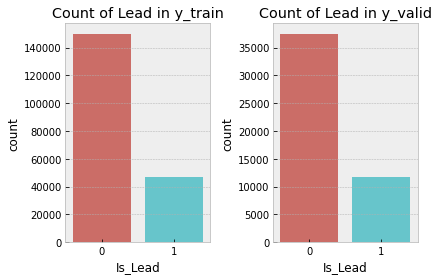

In [95]:
plt.subplot(1,2,1);
plt.title('Count of Lead in y_train');
sns.countplot(y_train,palette='hls');
plt.subplot(1,2,2);
plt.title('Count of Lead in y_valid');
sns.countplot(y_valid,palette='hls');
plt.tight_layout();

In [96]:
%%time
#SMOTE:-
sm = SMOTE(random_state=10)
#Generating synthetic data points
x_smote,y_smote=sm.fit_resample(x_train,y_train)
xv_smote,yv_smote=sm.fit_resample(x_valid,y_valid)

Wall time: 1min 3s


In [97]:
print(x_smote.shape,y_smote.shape,xv_smote.shape,yv_smote.shape)

(299900, 46) (299900,) (74974, 46) (74974,)


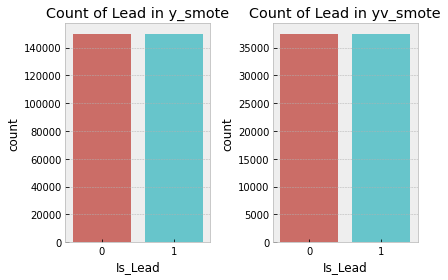

In [98]:
plt.subplot(1,2,1);
plt.title('Count of Lead in y_smote');
sns.countplot(y_smote,palette='hls');
plt.subplot(1,2,2);
plt.title('Count of Lead in yv_smote');
sns.countplot(yv_smote,palette='hls');
plt.tight_layout();

### Splitting the dataset after SVD and balancing the dataset for training

In [99]:
#Spliting the data 
#Training Data
x2=train_clean1.drop('Is_Lead',axis=1)
y2=train_clean1['Is_Lead']

#Stratified KFold Cross Validation sampling
skf=StratifiedKFold(n_splits=5, random_state=42, shuffle=True)
for t, v in skf.split(x2,y2): 
    x_train1, x_valid1 = x2.iloc[t], x2.iloc[v] 
    y_train1, y_valid1 = y2.iloc[t], y2.iloc[v]
    
print('Shape of x_train1 :',x_train1.shape)
print('Shape of x_valid1 :',x_valid1.shape)
print('Shape of y_train1 :',y_train1.shape)
print('Shape of y_valid1 :',y_valid1.shape)

Shape of x_train1 : (196580, 35)
Shape of x_valid1 : (49145, 35)
Shape of y_train1 : (196580,)
Shape of y_valid1 : (49145,)


In [100]:
print(x_train1.shape,y_train1.shape,x_valid1.shape,y_valid1.shape)

(196580, 35) (196580,) (49145, 35) (49145,)


In [101]:
%%time
#SMOTE:-
sm = SMOTE(random_state=10)
#Generating synthetic data points
x_smote1,y_smote1=sm.fit_resample(x_train1,y_train1)
xv_smote1,yv_smote1=sm.fit_resample(x_valid1,y_valid1)

Wall time: 59.2 s


In [102]:
print(x_smote1.shape,y_smote1.shape,xv_smote1.shape,yv_smote1.shape)

(299900, 35) (299900,) (74974, 35) (74974,)


### Unenoded data split 

In [103]:
X1=train_unencoded
y1=train['Is_Lead']

In [104]:
cat_features_index = [i for i,col in enumerate(X1.columns) if col in cat_cols]
cat_features_index

[3, 4, 5, 6, 7, 8]

In [105]:
X1.shape

(245725, 9)

In [106]:
y1

0         0
1         0
2         0
3         0
4         0
         ..
245720    0
245721    0
245722    0
245723    0
245724    0
Name: Is_Lead, Length: 245725, dtype: int64

In [107]:
X1.head()

,Age,Vintage,Avg_Account_Balance,Gender,Region_Code,Occupation,Channel_Code,Credit_Product,Is_Active
0,0.806452,0.281250,0.099205,Female,RG268,Other,X3,No,No
1,0.112903,0.195312,0.054321,Female,RG277,Salaried,X1,No,No
2,0.532258,0.148438,0.141660,Female,RG268,Self_Employed,X3,No,Yes
3,0.177419,0.093750,0.043525,Male,RG270,Salaried,X1,No,No
4,0.112903,0.203125,0.083823,Female,RG282,Salaried,X1,No,No


In [108]:
x_utrain , x_uvalid, y_utrain, y_uvalid = train_test_split(X1,y1, 
                                                       test_size=0.3, 
                                                       random_state=2545, 
                                                       stratify=y)

In [109]:
print(x_utrain.shape,y_utrain.shape,x_uvalid.shape,y_uvalid.shape)

(172007, 9) (172007,) (73718, 9) (73718,)


### Unencoded categoricals with normalized numerical data and undersampling for training

In [110]:
train_unencoded1=pd.concat([train_unencoded,train['Is_Lead']],axis=1)
train_unencoded1.head()                                 

,Age,Vintage,Avg_Account_Balance,Gender,Region_Code,Occupation,Channel_Code,Credit_Product,Is_Active,Is_Lead
0,0.806452,0.281250,0.099205,Female,RG268,Other,X3,No,No,0
1,0.112903,0.195312,0.054321,Female,RG277,Salaried,X1,No,No,0
2,0.532258,0.148438,0.141660,Female,RG268,Self_Employed,X3,No,Yes,0
3,0.177419,0.093750,0.043525,Male,RG270,Salaried,X1,No,No,0
4,0.112903,0.203125,0.083823,Female,RG282,Salaried,X1,No,No,0


In [111]:
minor_class_len = len(train_unencoded1[train_unencoded1['Is_Lead'] == 1])
print(minor_class_len)

major_class_indices = train_unencoded1[train_unencoded1['Is_Lead'] == 0].index
print(major_class_indices)

58288
Int64Index([     0,      1,      2,      3,      4,      5,      7,      8,
                 9,     10,
            ...
            245715, 245716, 245717, 245718, 245719, 245720, 245721, 245722,
            245723, 245724],
           dtype='int64', length=187437)


In [112]:
random_major_indices = np.random.choice(major_class_indices,
                                           minor_class_len, 
                                           replace=False)
print(len(random_major_indices))
minor_class_indices = train_unencoded1[train_unencoded1['Is_Lead'] == 1].index
print(minor_class_indices)

58288
Int64Index([     6,     15,     16,     17,     20,     29,     31,     34,
                36,     37,
            ...
            245683, 245684, 245690, 245693, 245694, 245697, 245699, 245709,
            245713, 245714],
           dtype='int64', length=58288)


<AxesSubplot:xlabel='Is_Lead', ylabel='count'>

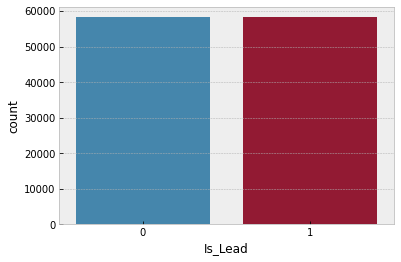

In [113]:
under_sample_indices = np.concatenate([minor_class_indices,random_major_indices])
under_sample = train_unencoded1.loc[under_sample_indices]
sns.countplot(x='Is_Lead', data=under_sample)

In [114]:
under_sample.tail()

,Age,Vintage,Avg_Account_Balance,Gender,Region_Code,Occupation,Channel_Code,Credit_Product,Is_Active,Is_Lead
61539,0.032258,0.046875,0.055010,Female,RG252,Salaried,X1,No,No,0
169956,0.096774,0.093750,0.023076,Female,RG281,Other,X3,Yes,No,0
137044,0.048387,0.046875,0.084501,Male,RG275,Other,X1,No,Yes,0
235137,0.483871,0.109375,0.103939,Female,RG256,Self_Employed,X1,No,No,0
105297,0.822581,0.421875,0.061465,Female,RG278,Other,X2,No,Yes,0


In [115]:
under_sample.shape

(116576, 10)

In [116]:
train_unencx = under_sample.loc[:, train_unencoded1.columns!='Is_Lead']
train_unency = under_sample.loc[:, train_unencoded1.columns=='Is_Lead']
#trainx,testx,trainy,testy = train_test_split(train_unencodedx,train_unencodedy, test_size=0.3, random_state=42)

### Splitting the dataset with label encoding and balancing them

In [117]:
#Spliting the data 
#Training Data
x3=train1.drop('Is_Lead',axis=1)
y3=train1['Is_Lead']

#Stratified KFold Cross Validation sampling
skf=StratifiedKFold(n_splits=5, random_state=42, shuffle=True)
for t, v in skf.split(x3,y3): 
    x_train3, x_valid3 = x3.iloc[t], x3.iloc[v] 
    y_train3, y_valid3 = y3.iloc[t], y3.iloc[v]
    
print('Shape of x_train3 :',x_train3.shape)
print('Shape of x_valid3 :',x_valid3.shape)
print('Shape of y_train3 :',y_train3.shape)
print('Shape of y_valid3 :',y_valid3.shape)

Shape of x_train3 : (196580, 9)
Shape of x_valid3 : (49145, 9)
Shape of y_train3 : (196580,)
Shape of y_valid3 : (49145,)


In [118]:
print(x_train3.shape,y_train3.shape,x_valid3.shape,y_valid3.shape)

(196580, 9) (196580,) (49145, 9) (49145,)


In [119]:
%%time
#SMOTE:-
sm = SMOTE(random_state=10)
#Generating synthetic data points
x_smote3,y_smote3=sm.fit_resample(x_train3,y_train3)
xv_smote3,yv_smote3=sm.fit_resample(x_valid3,y_valid3)

Wall time: 3.83 s


In [120]:
print(x_smote3.shape,y_smote3.shape,xv_smote3.shape,yv_smote3.shape)

(299900, 9) (299900,) (74974, 9) (74974,)


In [185]:
x_smote3

,Age,Vintage,Avg_Account_Balance,Gender,Region_Code,Occupation,Channel_Code,Credit_Product,Is_Active
0,0.806452,0.281250,0.099205,0,18,1,2,0,0
1,0.112903,0.195312,0.054321,0,27,2,0,0,0
2,0.532258,0.148438,0.141660,0,18,3,2,0,1
3,0.112903,0.203125,0.083823,0,32,2,0,0,0
4,0.403226,0.046875,0.041034,0,15,3,2,0,1
...,...,...,...,...,...,...,...,...,...
299895,0.165566,0.281250,0.086882,0,33,3,2,1,0
299896,0.426031,0.549660,0.149209,1,34,3,1,1,1
299897,0.383281,0.761928,0.119772,1,34,3,1,0,1
299898,0.376957,0.653908,0.284086,1,33,2,2,0,1


In [183]:
test1.head()

,Age,Vintage,Avg_Account_Balance,Gender,Region_Code,Occupation,Channel_Code,Credit_Product,Is_Active
0,0.081967,0.140625,0.072805,1,4,1,0,1,0
1,0.311475,0.328125,0.091333,1,18,1,1,0,0
2,0.114754,0.054688,0.019558,1,20,2,0,0,0
3,0.081967,0.203125,0.085520,1,22,1,0,0,0
4,0.081967,0.093750,0.064179,0,20,1,0,0,0


### Model building

#### 1. Logistic regression

In [216]:
#Logistic regression model
modellog=LogisticRegression(random_state=10)
#fitting the model:-
modellog.fit(x_smote1,y_smote1)

LogisticRegression(random_state=10)

In [217]:
%%time
#Cross validation prediction
modellog_pred=cross_val_predict(modellog,x_valid1,y_valid1,cv=5)
#Cross validation score:-
cv_score=cross_val_score(modellog,x_valid1,y_valid1,cv=5)
print('Cross validation score for Logistic Regression:',np.average(cv_score))

Cross validation score for Logistic Regression: 0.7780649099603215
Wall time: 2.65 s


In [218]:
ic(modellog_pred);

ic| modellog_pred: array([0, 0, 0, ..., 0, 0, 0], dtype=int64)


In [219]:
log_pred=modellog.predict_proba(x_valid1)[:,1]
log_pred

array([0.25294834, 0.22219469, 0.42826937, ..., 0.45351099, 0.2065643 ,
       0.4234217 ])

In [220]:
%%time
#Confusion matrix:-
cm_log=confusion_matrix(y_valid1,modellog_pred)
cm_log=pd.crosstab(y_valid1,modellog_pred)

Wall time: 76.8 ms


In [221]:
#ROC_AUC SCORE:-
logroc_score=roc_auc_score(y_valid1,log_pred)
print('Logistic model ROC score:',logroc_score)

Logistic model ROC score: 0.7329331410745409


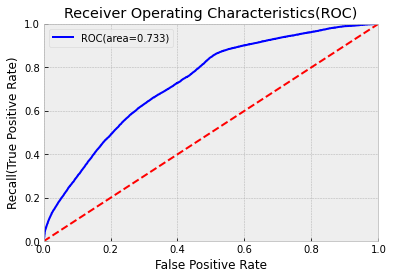

AUC: 0.7329331410745409


In [222]:
#ROC_AUC curve
plt.figure()
false_positive_rate,recall,thresholds=roc_curve(y_valid1,log_pred);
logroc_auc=auc(false_positive_rate,recall);
plt.title('Receiver Operating Characteristics(ROC)');
plt.plot(false_positive_rate,recall,'b',label='ROC(area=%0.3f)' %logroc_auc);
plt.legend();
plt.plot([0,1],[0,1],'r--');
plt.xlim([0.0,1.0]);
plt.ylim([0.0,1.0]);
plt.ylabel('Recall(True Positive Rate)');
plt.xlabel('False Positive Rate');
plt.show();
print('AUC:',logroc_auc);

In [223]:
#Classification Report:-
log_scores=classification_report(y_valid1,modellog_pred)
print(log_scores)

              precision    recall  f1-score   support

           0       0.78      0.98      0.87     37487
           1       0.67      0.12      0.21     11658

    accuracy                           0.78     49145
   macro avg       0.73      0.55      0.54     49145
weighted avg       0.76      0.78      0.71     49145



#### 2. Decision tree

In [224]:
modeldt=DecisionTreeClassifier(random_state=0,max_depth=4)
modeldt.fit(x_smote1,y_smote1)
modeldt_pred1=cross_val_predict(modeldt,x_valid1,y_valid1,cv=5)
modeldt_pred=modeldt.predict_proba(x_valid1)[:,1]
#Cross validation score:-
cv_score_dt=cross_val_score(modeldt,x_valid1,y_valid1,cv=5,scoring='accuracy')
print('Cross validation score for Decision Tree Classifier:',np.average(cv_score_dt))

DecisionTreeClassifier(max_depth=4, random_state=0)

Cross validation score for Decision Tree Classifier: 0.7806897955031031


In [225]:
#Confusion matrix:-
cm_dt=confusion_matrix(y_valid1,modeldt_pred1)
cm_dt=pd.crosstab(y_valid1,modeldt_pred1)
#ROC_AUC SCORE:-
dt_roc_score=roc_auc_score(y_valid1,modeldt_pred)
print('Decision Tree Classifier ROC score:',dt_roc_score)

Decision Tree Classifier ROC score: 0.7411201469039718


In [226]:
#Classification Report:-
dt_scores=classification_report(y_valid1,modeldt_pred1)
print(dt_scores)

              precision    recall  f1-score   support

           0       0.78      1.00      0.87     37487
           1       0.99      0.08      0.14     11658

    accuracy                           0.78     49145
   macro avg       0.88      0.54      0.51     49145
weighted avg       0.83      0.78      0.70     49145



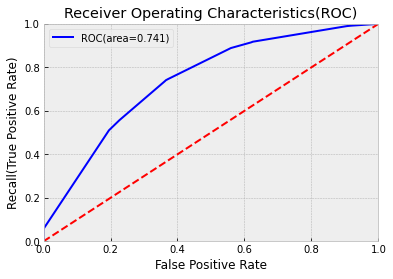

AUC: 0.7411201469039718


In [227]:
#ROC_AUC curve
plt.figure()
false_positive_rate,recall,thresholds=roc_curve(y_valid1,modeldt_pred);
dtroc_auc=auc(false_positive_rate,recall);
plt.title('Receiver Operating Characteristics(ROC)');
plt.plot(false_positive_rate,recall,'b',label='ROC(area=%0.3f)' %dtroc_auc);
plt.legend();
plt.plot([0,1],[0,1],'r--');
plt.xlim([0.0,1.0]);
plt.ylim([0.0,1.0]);
plt.ylabel('Recall(True Positive Rate)');
plt.xlabel('False Positive Rate');
plt.show();
print('AUC:',dtroc_auc);

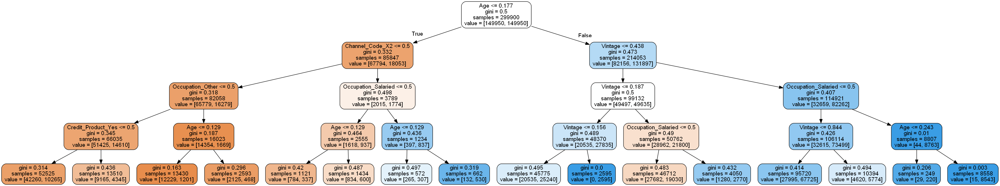

In [228]:
feature_name=list(x_smote1.columns)
class_name = list(y_smote1.unique())
# create a dot_file which stores the tree structure
dot_data = export_graphviz(modeldt,rounded = True,filled = True,feature_names=feature_name)
                           #class_names=class_name)
# Draw graph
graph = pydotplus.graph_from_dot_data(dot_data)  
#graph.write_png("tree.png")
# Show graph
Image(graph.create_png())

#### 3. Random Forest Classifier

In [229]:
rf_model=RandomForestClassifier(n_estimators=10,random_state=42)
#fitting the model
rf_model.fit(x_smote1,y_smote1)
rf_pred=rf_model.predict_proba(x_valid1)[:,1]
rf_pred1=rf_model.predict(x_valid1)
#print(rf_pred)
#Cross validation score:-
cv_score_rf=cross_val_score(rf_model,x_valid1,y_valid1,cv=5,scoring='accuracy')
print('Cross validation score for Random Forest Classifier:',np.average(cv_score_rf))
modelrf_pred=cross_val_predict(rf_model,x_valid1,y_valid1,cv=5)

RandomForestClassifier(n_estimators=10, random_state=42)

Cross validation score for Random Forest Classifier: 0.7722860921762132


In [230]:
#Confusion matrix:-
cm_rf=confusion_matrix(y_valid1,rf_pred1)
cm_rf=pd.crosstab(y_valid1,rf_pred1)
#ROC_AUC SCORE:-
rf_roc_score=roc_auc_score(y_valid1,rf_pred)
print('Random Forest Classifier ROC score:',rf_roc_score)

Random Forest Classifier ROC score: 0.7253898535686343


In [231]:
#Classification Report:-
rf_scores=classification_report(y_valid1,rf_pred1)
print(rf_scores)

              precision    recall  f1-score   support

           0       0.83      0.84      0.83     37487
           1       0.46      0.45      0.45     11658

    accuracy                           0.74     49145
   macro avg       0.64      0.64      0.64     49145
weighted avg       0.74      0.74      0.74     49145



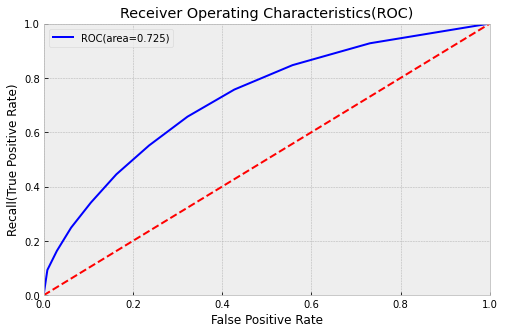

AUC for Random Forest Classifier model: 0.7253898535686343


In [232]:
#ROC_AUC curve
plt.figure(figsize=(8,5))
false_positive_rate,recall,thresholds=roc_curve(y_valid1,rf_pred);
rfroc_auc=auc(false_positive_rate,recall);
plt.title('Receiver Operating Characteristics(ROC)');
plt.plot(false_positive_rate,recall,'b',label='ROC(area=%0.3f)' %rfroc_auc);
plt.legend();
plt.plot([0,1],[0,1],'r--');
plt.xlim([0.0,1.0]);
plt.ylim([0.0,1.0]);
plt.ylabel('Recall(True Positive Rate)');
plt.xlabel('False Positive Rate');
plt.show();
print('AUC for Random Forest Classifier model:',rfroc_auc);

#### 4. XGB Classifier

In [121]:
xgbmodel = XGBClassifier(learning_rate =0.01,n_estimators=100,max_depth=25,min_child_weight=1,gamma=0,subsample=0.8,\
                      colsample_bytree=0.8,objective= 'binary:logistic',nthread=4,scale_pos_weight=1,seed=27,)
xgbmodel.fit(x_smote1,y_smote1)

[21:23:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=0.8, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.01, max_delta_step=0, max_depth=25,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=4, nthread=4, num_parallel_tree=1,
              random_state=27, reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
              seed=27, subsample=0.8, tree_method='exact',
              validate_parameters=1, verbosity=None)

In [ ]:
#cv_score_xgb=cross_val_score(xgbmodel,x_valid1,y_valid1,cv=5,scoring='accuracy')
#print('Cross validation score for XGBoost Classifier:',np.average(cv_score_xgb))
#xgb_pred=cross_val_predict(xgbmodel,x_valid1,y_valid1,cv=5)

In [122]:
xgb_pred1=xgbmodel.predict(x_valid1)
xgb_pred=xgbmodel.predict_proba(x_valid1)[:,1]

In [123]:
ic(xgb_pred);

ic| xgb_pred: array([0.25475731, 0.3654911 , 0.3169146 , ..., 0.42942482, 0.22785667,
                     0.35102585], dtype=float32)


In [143]:
#Confusion matrix:-
cm_xgb=confusion_matrix(y_valid1,xgb_pred1)
cm_xgb=pd.crosstab(y_valid1,xgb_pred1)
#ROC_AUC SCORE:-
xgb_roc_score=roc_auc_score(y_valid1,xgb_pred)
print('XGBoost Classifier ROC score:',xgb_roc_score)

XGBoost Classifier ROC score: 0.7765576380540462


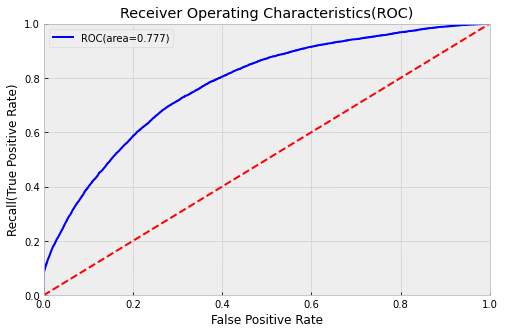

AUC for XG Boost Classifier model: 0.7765576380540462


In [125]:
#ROC_AUC curve
plt.figure(figsize=(8,5))
false_positive_rate,recall,thresholds=roc_curve(y_valid1,xgb_pred);
xgbroc_auc=auc(false_positive_rate,recall);
plt.title('Receiver Operating Characteristics(ROC)');
plt.plot(false_positive_rate,recall,'b',label='ROC(area=%0.3f)' %xgbroc_auc);
plt.legend();
plt.plot([0,1],[0,1],'r--');
plt.xlim([0.0,1.0]);
plt.ylim([0.0,1.0]);
plt.ylabel('Recall(True Positive Rate)');
plt.xlabel('False Positive Rate');
plt.show();
print('AUC for XG Boost Classifier model:',xgbroc_auc);

#### 5. Gradient Boosting Classifier

In [126]:
gb_model=GradientBoostingClassifier(random_state=25,)
gb_model.fit(x_smote1,y_smote1)

GradientBoostingClassifier(random_state=25)

In [127]:
gb_pred1=gb_model.predict(x_valid1)
gb_pred=gb_model.predict_proba(x_valid1)[:,1]

In [142]:
#Confusion matrix:-
cm_gb=confusion_matrix(y_valid,gb_pred1)
cm_gb=pd.crosstab(y_valid,gb_pred1)
#ROC_AUC SCORE:-
gb_roc_score=roc_auc_score(y_valid,gb_pred)
print(' Gradient Boost Classifier ROC score:',gb_roc_score)

 Gradient Boost Classifier ROC score: 0.7721981545585086


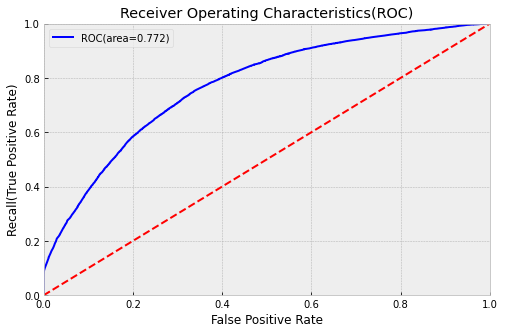

AUC for Gradient Boosting Classifier model: 0.7721981545585086


In [129]:
#ROC_AUC curve
plt.figure(figsize=(8,5))
false_positive_rate,recall,thresholds=roc_curve(y_valid,gb_pred);
gbroc_auc=auc(false_positive_rate,recall);
plt.title('Receiver Operating Characteristics(ROC)');
plt.plot(false_positive_rate,recall,'b',label='ROC(area=%0.3f)' %gbroc_auc);
plt.legend();
plt.plot([0,1],[0,1],'r--');
plt.xlim([0.0,1.0]);
plt.ylim([0.0,1.0]);
plt.ylabel('Recall(True Positive Rate)');
plt.xlabel('False Positive Rate');
plt.show();
print('AUC for Gradient Boosting Classifier model:',gbroc_auc);

#### 6. Extra trees Classifier

In [130]:
et_model=ExtraTreesClassifier(n_jobs=-1,class_weight='balanced',verbose=10,random_state=24,n_estimators=500,max_depth=15)
et_model.fit(x_smote1,y_smote1)

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


building tree 1 of 500building tree 2 of 500
building tree 3 of 500
building tree 4 of 500
building tree 5 of 500

building tree 6 of 500
building tree 7 of 500
building tree 8 of 500
building tree 9 of 500
building tree 10 of 500
building tree 11 of 500
building tree 12 of 500
building tree 13 of 500
building tree 14 of 500
building tree 15 of 500

[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    1.4s



building tree 16 of 500


[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    2.6s


building tree 17 of 500
building tree 18 of 500
building tree 19 of 500
building tree 20 of 500
building tree 21 of 500
building tree 22 of 500
building tree 23 of 500
building tree 24 of 500


[Parallel(n_jobs=-1)]: Done  16 tasks      | elapsed:    3.1s


building tree 25 of 500
building tree 26 of 500
building tree 27 of 500
building tree 28 of 500
building tree 29 of 500
building tree 30 of 500
building tree 31 of 500
building tree 32 of 500


[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:    5.4s


building tree 33 of 500
building tree 34 of 500
building tree 35 of 500
building tree 36 of 500
building tree 37 of 500
building tree 38 of 500
building tree 39 of 500
building tree 40 of 500
building tree 41 of 500
building tree 42 of 500
building tree 43 of 500
building tree 44 of 500


[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:    6.8s


building tree 45 of 500
building tree 46 of 500
building tree 47 of 500
building tree 48 of 500
building tree 49 of 500
building tree 50 of 500
building tree 51 of 500
building tree 52 of 500


[Parallel(n_jobs=-1)]: Done  45 tasks      | elapsed:    9.2s


building tree 53 of 500
building tree 54 of 500
building tree 55 of 500
building tree 56 of 500
building tree 57 of 500
building tree 58 of 500
building tree 59 of 500
building tree 60 of 500
building tree 61 of 500
building tree 62 of 500
building tree 63 of 500
building tree 64 of 500
building tree 65 of 500
building tree 66 of 500
building tree 67 of 500


[Parallel(n_jobs=-1)]: Done  56 tasks      | elapsed:   11.0s


building tree 68 of 500
building tree 69 of 500
building tree 70 of 500
building tree 71 of 500
building tree 72 of 500
building tree 73 of 500
building tree 74 of 500
building tree 75 of 500
building tree 76 of 500


[Parallel(n_jobs=-1)]: Done  69 tasks      | elapsed:   13.6s


building tree 77 of 500
building tree 78 of 500
building tree 79 of 500
building tree 80 of 500
building tree 81 of 500
building tree 82 of 500
building tree 83 of 500
building tree 84 of 500
building tree 85 of 500
building tree 86 of 500
building tree 87 of 500
building tree 88 of 500
building tree 89 of 500
building tree 90 of 500

[Parallel(n_jobs=-1)]: Done  82 tasks      | elapsed:   16.2s



building tree 91 of 500
building tree 92 of 500
building tree 93 of 500
building tree 94 of 500
building tree 95 of 500
building tree 96 of 500
building tree 97 of 500
building tree 98 of 500
building tree 99 of 500
building tree 100 of 500
building tree 101 of 500
building tree 102 of 500
building tree 103 of 500
building tree 104 of 500


[Parallel(n_jobs=-1)]: Done  97 tasks      | elapsed:   18.8s


building tree 105 of 500
building tree 106 of 500
building tree 107 of 500
building tree 108 of 500
building tree 109 of 500
building tree 110 of 500
building tree 111 of 500
building tree 112 of 500
building tree 113 of 500
building tree 114 of 500
building tree 115 of 500
building tree 116 of 500
building tree 117 of 500
building tree 118 of 500
building tree 119 of 500
building tree 120 of 500


[Parallel(n_jobs=-1)]: Done 112 tasks      | elapsed:   21.6s


building tree 121 of 500
building tree 122 of 500
building tree 123 of 500
building tree 124 of 500
building tree 125 of 500
building tree 126 of 500
building tree 127 of 500
building tree 128 of 500
building tree 129 of 500
building tree 130 of 500
building tree 131 of 500
building tree 132 of 500
building tree 133 of 500
building tree 134 of 500
building tree 135 of 500
building tree 136 of 500
building tree 137 of 500
building tree 138 of 500
building tree 139 of 500
building tree 140 of 500


[Parallel(n_jobs=-1)]: Done 129 tasks      | elapsed:   24.9s


building tree 141 of 500
building tree 142 of 500
building tree 143 of 500
building tree 144 of 500
building tree 145 of 500
building tree 146 of 500
building tree 147 of 500
building tree 148 of 500
building tree 149 of 500building tree 150 of 500

building tree 151 of 500
building tree 152 of 500
building tree 153 of 500
building tree 154 of 500
building tree 155 of 500
building tree 156 of 500


[Parallel(n_jobs=-1)]: Done 146 tasks      | elapsed:   28.4s


building tree 157 of 500
building tree 158 of 500
building tree 159 of 500
building tree 160 of 500
building tree 161 of 500
building tree 162 of 500
building tree 163 of 500
building tree 164 of 500
building tree 165 of 500
building tree 166 of 500
building tree 167 of 500
building tree 168 of 500
building tree 169 of 500
building tree 170 of 500
building tree 171 of 500
building tree 172 of 500
building tree 173 of 500


[Parallel(n_jobs=-1)]: Done 165 tasks      | elapsed:   31.3s


building tree 174 of 500
building tree 175 of 500
building tree 176 of 500
building tree 177 of 500
building tree 178 of 500
building tree 179 of 500
building tree 180 of 500
building tree 181 of 500
building tree 182 of 500
building tree 183 of 500
building tree 184 of 500
building tree 185 of 500
building tree 186 of 500
building tree 187 of 500
building tree 188 of 500
building tree 189 of 500
building tree 190 of 500
building tree 191 of 500
building tree 192 of 500
building tree 193 of 500


[Parallel(n_jobs=-1)]: Done 184 tasks      | elapsed:   35.1s


building tree 194 of 500
building tree 195 of 500
building tree 196 of 500
building tree 197 of 500
building tree 198 of 500
building tree 199 of 500
building tree 200 of 500
building tree 201 of 500
building tree 202 of 500
building tree 203 of 500
building tree 204 of 500
building tree 205 of 500
building tree 206 of 500
building tree 207 of 500
building tree 208 of 500
building tree 209 of 500
building tree 210 of 500
building tree 211 of 500
building tree 212 of 500
building tree 213 of 500


[Parallel(n_jobs=-1)]: Done 205 tasks      | elapsed:   38.9s


building tree 214 of 500
building tree 215 of 500
building tree 216 of 500
building tree 217 of 500
building tree 218 of 500
building tree 219 of 500
building tree 220 of 500
building tree 221 of 500
building tree 222 of 500
building tree 223 of 500
building tree 224 of 500
building tree 225 of 500
building tree 226 of 500
building tree 227 of 500
building tree 228 of 500
building tree 229 of 500
building tree 230 of 500
building tree 231 of 500
building tree 232 of 500
building tree 233 of 500
building tree 234 of 500


[Parallel(n_jobs=-1)]: Done 226 tasks      | elapsed:   42.7s


building tree 235 of 500
building tree 236 of 500
building tree 237 of 500
building tree 238 of 500
building tree 239 of 500
building tree 240 of 500
building tree 241 of 500
building tree 242 of 500
building tree 243 of 500
building tree 244 of 500
building tree 245 of 500
building tree 246 of 500
building tree 247 of 500
building tree 248 of 500
building tree 249 of 500
building tree 250 of 500
building tree 251 of 500
building tree 252 of 500
building tree 253 of 500
building tree 254 of 500
building tree 255 of 500
building tree 256 of 500
building tree 257 of 500

[Parallel(n_jobs=-1)]: Done 249 tasks      | elapsed:   47.3s



building tree 258 of 500
building tree 259 of 500
building tree 260 of 500
building tree 261 of 500
building tree 262 of 500
building tree 263 of 500
building tree 264 of 500
building tree 265 of 500
building tree 266 of 500
building tree 267 of 500
building tree 268 of 500
building tree 269 of 500
building tree 270 of 500
building tree 271 of 500
building tree 272 of 500
building tree 273 of 500
building tree 274 of 500
building tree 275 of 500
building tree 276 of 500
building tree 277 of 500
building tree 278 of 500
building tree 279 of 500
building tree 280 of 500


[Parallel(n_jobs=-1)]: Done 272 tasks      | elapsed:   51.3s


building tree 281 of 500
building tree 282 of 500
building tree 283 of 500
building tree 284 of 500
building tree 285 of 500
building tree 286 of 500
building tree 287 of 500
building tree 288 of 500
building tree 289 of 500
building tree 290 of 500
building tree 291 of 500
building tree 292 of 500
building tree 293 of 500
building tree 294 of 500
building tree 295 of 500
building tree 296 of 500
building tree 297 of 500
building tree 298 of 500
building tree 299 of 500
building tree 300 of 500
building tree 301 of 500
building tree 302 of 500
building tree 303 of 500
building tree 304 of 500
building tree 305 of 500


[Parallel(n_jobs=-1)]: Done 297 tasks      | elapsed:   55.5s


building tree 306 of 500
building tree 307 of 500
building tree 308 of 500
building tree 309 of 500
building tree 310 of 500
building tree 311 of 500
building tree 312 of 500
building tree 313 of 500
building tree 314 of 500
building tree 315 of 500
building tree 316 of 500
building tree 317 of 500
building tree 318 of 500
building tree 319 of 500
building tree 320 of 500
building tree 321 of 500
building tree 322 of 500
building tree 323 of 500
building tree 324 of 500
building tree 325 of 500
building tree 326 of 500
building tree 327 of 500
building tree 328 of 500
building tree 329 of 500
building tree 330 of 500

[Parallel(n_jobs=-1)]: Done 322 tasks      | elapsed:  1.0min



building tree 331 of 500
building tree 332 of 500
building tree 333 of 500
building tree 334 of 500
building tree 335 of 500
building tree 336 of 500
building tree 337 of 500
building tree 338 of 500
building tree 339 of 500
building tree 340 of 500
building tree 341 of 500
building tree 342 of 500
building tree 343 of 500
building tree 344 of 500
building tree 345 of 500
building tree 346 of 500
building tree 347 of 500
building tree 348 of 500
building tree 349 of 500
building tree 350 of 500
building tree 351 of 500
building tree 352 of 500
building tree 353 of 500
building tree 354 of 500
building tree 355 of 500
building tree 356 of 500
building tree 357 of 500


[Parallel(n_jobs=-1)]: Done 349 tasks      | elapsed:  1.1min


building tree 358 of 500
building tree 359 of 500
building tree 360 of 500
building tree 361 of 500
building tree 362 of 500
building tree 363 of 500
building tree 364 of 500
building tree 365 of 500
building tree 366 of 500
building tree 367 of 500
building tree 368 of 500
building tree 369 of 500
building tree 370 of 500
building tree 371 of 500
building tree 372 of 500
building tree 373 of 500
building tree 374 of 500
building tree 375 of 500
building tree 376 of 500
building tree 377 of 500
building tree 378 of 500
building tree 379 of 500
building tree 380 of 500
building tree 381 of 500
building tree 382 of 500
building tree 383 of 500
building tree 384 of 500
building tree 385 of 500


[Parallel(n_jobs=-1)]: Done 376 tasks      | elapsed:  1.2min


building tree 386 of 500
building tree 387 of 500
building tree 388 of 500
building tree 389 of 500
building tree 390 of 500
building tree 391 of 500
building tree 392 of 500
building tree 393 of 500
building tree 394 of 500
building tree 395 of 500
building tree 396 of 500
building tree 397 of 500
building tree 398 of 500
building tree 399 of 500
building tree 400 of 500
building tree 401 of 500
building tree 402 of 500
building tree 403 of 500
building tree 404 of 500
building tree 405 of 500
building tree 406 of 500
building tree 407 of 500
building tree 408 of 500
building tree 409 of 500
building tree 410 of 500
building tree 411 of 500
building tree 412 of 500


[Parallel(n_jobs=-1)]: Done 405 tasks      | elapsed:  1.2min


building tree 413 of 500
building tree 414 of 500
building tree 415 of 500
building tree 416 of 500
building tree 417 of 500
building tree 418 of 500
building tree 419 of 500
building tree 420 of 500
building tree 421 of 500
building tree 422 of 500
building tree 423 of 500
building tree 424 of 500
building tree 425 of 500
building tree 426 of 500
building tree 427 of 500
building tree 428 of 500
building tree 429 of 500
building tree 430 of 500
building tree 431 of 500
building tree 432 of 500
building tree 433 of 500
building tree 434 of 500
building tree 435 of 500
building tree 436 of 500
building tree 437 of 500
building tree 438 of 500
building tree 439 of 500
building tree 440 of 500
building tree 441 of 500
building tree 442 of 500


[Parallel(n_jobs=-1)]: Done 434 tasks      | elapsed:  1.3min


building tree 443 of 500
building tree 444 of 500
building tree 445 of 500
building tree 446 of 500
building tree 447 of 500
building tree 448 of 500
building tree 449 of 500
building tree 450 of 500
building tree 451 of 500
building tree 452 of 500
building tree 453 of 500
building tree 454 of 500
building tree 455 of 500
building tree 456 of 500
building tree 457 of 500
building tree 458 of 500
building tree 459 of 500
building tree 460 of 500
building tree 461 of 500
building tree 462 of 500
building tree 463 of 500
building tree 464 of 500
building tree 465 of 500
building tree 466 of 500
building tree 467 of 500
building tree 468 of 500
building tree 469 of 500
building tree 470 of 500
building tree 471 of 500
building tree 472 of 500
building tree 473 of 500
building tree 474 of 500
building tree 475 of 500

[Parallel(n_jobs=-1)]: Done 465 tasks      | elapsed:  1.4min



building tree 476 of 500
building tree 477 of 500
building tree 478 of 500
building tree 479 of 500
building tree 480 of 500
building tree 481 of 500
building tree 482 of 500
building tree 483 of 500
building tree 484 of 500
building tree 485 of 500
building tree 486 of 500
building tree 487 of 500
building tree 488 of 500
building tree 489 of 500
building tree 490 of 500building tree 491 of 500

building tree 492 of 500
building tree 493 of 500
building tree 494 of 500
building tree 495 of 500
building tree 496 of 500
building tree 497 of 500
building tree 498 of 500
building tree 499 of 500
building tree 500 of 500


[Parallel(n_jobs=-1)]: Done 500 out of 500 | elapsed:  1.5min finished


ExtraTreesClassifier(class_weight='balanced', max_depth=15, n_estimators=500,
                     n_jobs=-1, random_state=24, verbose=10)

In [131]:
et_pred=et_model.predict_proba(x_valid1)[:,1]
et_pred1=et_model.predict(x_valid1)
ic(et_pred);

[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done  16 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done  25 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done  45 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done  56 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done  69 tasks      | elapsed:    0.1s
[Parallel(n_jobs=8)]: Done  82 tasks      | elapsed:    0.1s
[Parallel(n_jobs=8)]: Done  97 tasks      | elapsed:    0.1s
[Parallel(n_jobs=8)]: Done 112 tasks      | elapsed:    0.2s
[Parallel(n_jobs=8)]: Done 129 tasks      | elapsed:    0.2s
[Parallel(n_jobs=8)]: Done 146 tasks      | elapsed:    0.3s
[Parallel(n_jobs=8)]: Done 165 tasks      | elapsed:    0.3s
[Parallel(n_jobs=8)]: Done 184 tasks      | elapsed:    0.3s
[Para

In [132]:
#Confusion matrix:-
cm_et=confusion_matrix(y_valid1,et_pred1)
cm_et=pd.crosstab(y_valid1,et_pred1)
#ROC_AUC SCORE:-
et_roc_score=roc_auc_score(y_valid1,et_pred)
print('Extra Trees Classifier ROC score:',et_roc_score)

Extra Trees Classifier ROC score: 0.7770319867460841


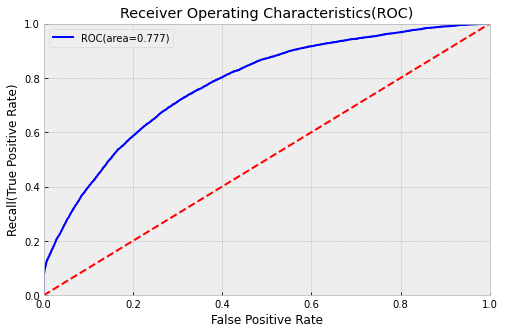

AUC for Extra Trees Classifier model: 0.7770319867460841


In [133]:
#ROC_AUC curve
plt.figure(figsize=(8,5))
false_positive_rate,recall,thresholds=roc_curve(y_valid1,et_pred);
etroc_auc=auc(false_positive_rate,recall);
plt.title('Receiver Operating Characteristics(ROC)');
plt.plot(false_positive_rate,recall,'b',label='ROC(area=%0.3f)' %etroc_auc);
plt.legend();
plt.plot([0,1],[0,1],'r--');
plt.xlim([0.0,1.0]);
plt.ylim([0.0,1.0]);
plt.ylabel('Recall(True Positive Rate)');
plt.xlabel('False Positive Rate');
plt.show();
print('AUC for Extra Trees Classifier model:',etroc_auc);

#### 7. Catboost Classifier

In [134]:
cat_model = CatBoostClassifier(learning_rate=0.03,n_estimators=20000,early_stopping_rounds=300,\
                               eval_metric='AUC',random_state=2444,cat_features=cat_features_index,)
cat_model.fit(X=x_utrain,y=y_utrain,eval_set=(x_uvalid,y_uvalid))

0:	test: 0.7316691	best: 0.7316691 (0)	total: 406ms	remaining: 2h 15m 19s
1:	test: 0.7453916	best: 0.7453916 (1)	total: 597ms	remaining: 1h 39m 29s
2:	test: 0.7555371	best: 0.7555371 (2)	total: 746ms	remaining: 1h 22m 49s
3:	test: 0.7628972	best: 0.7628972 (3)	total: 993ms	remaining: 1h 22m 43s
4:	test: 0.7643823	best: 0.7643823 (4)	total: 1.09s	remaining: 1h 12m 50s
5:	test: 0.7651089	best: 0.7651089 (5)	total: 1.23s	remaining: 1h 8m 9s
6:	test: 0.7660758	best: 0.7660758 (6)	total: 1.35s	remaining: 1h 4m 27s
7:	test: 0.7665963	best: 0.7665963 (7)	total: 1.48s	remaining: 1h 1m 26s
8:	test: 0.7663866	best: 0.7665963 (7)	total: 1.56s	remaining: 57m 48s
9:	test: 0.7669911	best: 0.7669911 (9)	total: 1.69s	remaining: 56m 16s
10:	test: 0.7669495	best: 0.7669911 (9)	total: 1.8s	remaining: 54m 27s
11:	test: 0.7663115	best: 0.7669911 (9)	total: 1.91s	remaining: 53m 6s
12:	test: 0.7660425	best: 0.7669911 (9)	total: 2.01s	remaining: 51m 26s
13:	test: 0.7659259	best: 0.7669911 (9)	total: 2.11s	rem

113:	test: 0.7808866	best: 0.7808866 (113)	total: 22.5s	remaining: 1h 5m 32s
114:	test: 0.7809311	best: 0.7809311 (114)	total: 22.8s	remaining: 1h 5m 34s
115:	test: 0.7809541	best: 0.7809541 (115)	total: 22.9s	remaining: 1h 5m 29s
116:	test: 0.7809849	best: 0.7809849 (116)	total: 23.1s	remaining: 1h 5m 30s
117:	test: 0.7810053	best: 0.7810053 (117)	total: 23.3s	remaining: 1h 5m 26s
118:	test: 0.7810775	best: 0.7810775 (118)	total: 23.5s	remaining: 1h 5m 18s
119:	test: 0.7811753	best: 0.7811753 (119)	total: 23.7s	remaining: 1h 5m 19s
120:	test: 0.7812309	best: 0.7812309 (120)	total: 23.9s	remaining: 1h 5m 23s
121:	test: 0.7812714	best: 0.7812714 (121)	total: 24.1s	remaining: 1h 5m 23s
122:	test: 0.7813473	best: 0.7813473 (122)	total: 24.3s	remaining: 1h 5m 25s
123:	test: 0.7814373	best: 0.7814373 (123)	total: 24.5s	remaining: 1h 5m 23s
124:	test: 0.7815076	best: 0.7815076 (124)	total: 24.7s	remaining: 1h 5m 27s
125:	test: 0.7815593	best: 0.7815593 (125)	total: 24.9s	remaining: 1h 5m 26s

221:	test: 0.7844902	best: 0.7844902 (221)	total: 45.5s	remaining: 1h 7m 31s
222:	test: 0.7845003	best: 0.7845003 (222)	total: 45.6s	remaining: 1h 7m 27s
223:	test: 0.7845170	best: 0.7845170 (223)	total: 45.8s	remaining: 1h 7m 21s
224:	test: 0.7845318	best: 0.7845318 (224)	total: 46s	remaining: 1h 7m 23s
225:	test: 0.7845615	best: 0.7845615 (225)	total: 46.2s	remaining: 1h 7m 24s
226:	test: 0.7845850	best: 0.7845850 (226)	total: 46.4s	remaining: 1h 7m 21s
227:	test: 0.7846089	best: 0.7846089 (227)	total: 46.6s	remaining: 1h 7m 21s
228:	test: 0.7846160	best: 0.7846160 (228)	total: 46.8s	remaining: 1h 7m 20s
229:	test: 0.7846255	best: 0.7846255 (229)	total: 47s	remaining: 1h 7m 18s
230:	test: 0.7846485	best: 0.7846485 (230)	total: 47.2s	remaining: 1h 7m 20s
231:	test: 0.7846736	best: 0.7846736 (231)	total: 47.4s	remaining: 1h 7m 19s
232:	test: 0.7846879	best: 0.7846879 (232)	total: 47.6s	remaining: 1h 7m 18s
233:	test: 0.7846976	best: 0.7846976 (233)	total: 47.8s	remaining: 1h 7m 17s
234

330:	test: 0.7858142	best: 0.7858142 (330)	total: 1m 5s	remaining: 1h 4m 46s
331:	test: 0.7858219	best: 0.7858219 (331)	total: 1m 5s	remaining: 1h 4m 47s
332:	test: 0.7858265	best: 0.7858265 (332)	total: 1m 5s	remaining: 1h 4m 44s
333:	test: 0.7858270	best: 0.7858270 (333)	total: 1m 5s	remaining: 1h 4m 40s
334:	test: 0.7858353	best: 0.7858353 (334)	total: 1m 6s	remaining: 1h 4m 44s
335:	test: 0.7858352	best: 0.7858353 (334)	total: 1m 6s	remaining: 1h 4m 40s
336:	test: 0.7858375	best: 0.7858375 (336)	total: 1m 6s	remaining: 1h 4m 42s
337:	test: 0.7858420	best: 0.7858420 (337)	total: 1m 6s	remaining: 1h 4m 39s
338:	test: 0.7858529	best: 0.7858529 (338)	total: 1m 6s	remaining: 1h 4m 38s
339:	test: 0.7858653	best: 0.7858653 (339)	total: 1m 7s	remaining: 1h 4m 40s
340:	test: 0.7858678	best: 0.7858678 (340)	total: 1m 7s	remaining: 1h 4m 38s
341:	test: 0.7858750	best: 0.7858750 (341)	total: 1m 7s	remaining: 1h 4m 36s
342:	test: 0.7858809	best: 0.7858809 (342)	total: 1m 7s	remaining: 1h 4m 33s

437:	test: 0.7867273	best: 0.7867273 (437)	total: 1m 26s	remaining: 1h 4m 3s
438:	test: 0.7867530	best: 0.7867530 (438)	total: 1m 26s	remaining: 1h 4m 4s
439:	test: 0.7867611	best: 0.7867611 (439)	total: 1m 26s	remaining: 1h 4m 3s
440:	test: 0.7867658	best: 0.7867658 (440)	total: 1m 26s	remaining: 1h 4m 5s
441:	test: 0.7867682	best: 0.7867682 (441)	total: 1m 26s	remaining: 1h 4m 6s
442:	test: 0.7867803	best: 0.7867803 (442)	total: 1m 27s	remaining: 1h 4m 7s
443:	test: 0.7867801	best: 0.7867803 (442)	total: 1m 27s	remaining: 1h 4m 6s
444:	test: 0.7867853	best: 0.7867853 (444)	total: 1m 27s	remaining: 1h 4m 5s
445:	test: 0.7868017	best: 0.7868017 (445)	total: 1m 27s	remaining: 1h 4m 6s
446:	test: 0.7868066	best: 0.7868066 (446)	total: 1m 27s	remaining: 1h 4m 6s
447:	test: 0.7868153	best: 0.7868153 (447)	total: 1m 28s	remaining: 1h 4m 6s
448:	test: 0.7868191	best: 0.7868191 (448)	total: 1m 28s	remaining: 1h 4m 7s
449:	test: 0.7868165	best: 0.7868191 (448)	total: 1m 28s	remaining: 1h 4m 8s

544:	test: 0.7872047	best: 0.7872047 (544)	total: 1m 47s	remaining: 1h 3m 47s
545:	test: 0.7872058	best: 0.7872058 (545)	total: 1m 47s	remaining: 1h 3m 49s
546:	test: 0.7872028	best: 0.7872058 (545)	total: 1m 47s	remaining: 1h 3m 50s
547:	test: 0.7872240	best: 0.7872240 (547)	total: 1m 47s	remaining: 1h 3m 51s
548:	test: 0.7872230	best: 0.7872240 (547)	total: 1m 48s	remaining: 1h 3m 52s
549:	test: 0.7872227	best: 0.7872240 (547)	total: 1m 48s	remaining: 1h 3m 50s
550:	test: 0.7872231	best: 0.7872240 (547)	total: 1m 48s	remaining: 1h 3m 51s
551:	test: 0.7872213	best: 0.7872240 (547)	total: 1m 48s	remaining: 1h 3m 52s
552:	test: 0.7872193	best: 0.7872240 (547)	total: 1m 48s	remaining: 1h 3m 52s
553:	test: 0.7872184	best: 0.7872240 (547)	total: 1m 49s	remaining: 1h 3m 53s
554:	test: 0.7872212	best: 0.7872240 (547)	total: 1m 49s	remaining: 1h 3m 53s
555:	test: 0.7872270	best: 0.7872270 (555)	total: 1m 49s	remaining: 1h 3m 54s
556:	test: 0.7872218	best: 0.7872270 (555)	total: 1m 49s	remaini

650:	test: 0.7873938	best: 0.7874052 (638)	total: 2m 7s	remaining: 1h 3m 13s
651:	test: 0.7873947	best: 0.7874052 (638)	total: 2m 7s	remaining: 1h 3m 12s
652:	test: 0.7873950	best: 0.7874052 (638)	total: 2m 7s	remaining: 1h 3m 11s
653:	test: 0.7874108	best: 0.7874108 (653)	total: 2m 8s	remaining: 1h 3m 11s
654:	test: 0.7874083	best: 0.7874108 (653)	total: 2m 8s	remaining: 1h 3m 11s
655:	test: 0.7874103	best: 0.7874108 (653)	total: 2m 8s	remaining: 1h 3m 10s
656:	test: 0.7874070	best: 0.7874108 (653)	total: 2m 8s	remaining: 1h 3m 9s
657:	test: 0.7874088	best: 0.7874108 (653)	total: 2m 8s	remaining: 1h 3m 10s
658:	test: 0.7874093	best: 0.7874108 (653)	total: 2m 9s	remaining: 1h 3m 8s
659:	test: 0.7874108	best: 0.7874108 (653)	total: 2m 9s	remaining: 1h 3m 8s
660:	test: 0.7874140	best: 0.7874140 (660)	total: 2m 9s	remaining: 1h 3m 8s
661:	test: 0.7874151	best: 0.7874151 (661)	total: 2m 9s	remaining: 1h 3m 6s
662:	test: 0.7874169	best: 0.7874169 (662)	total: 2m 9s	remaining: 1h 3m 5s
663:	

757:	test: 0.7875201	best: 0.7875249 (754)	total: 2m 27s	remaining: 1h 2m 20s
758:	test: 0.7875196	best: 0.7875249 (754)	total: 2m 27s	remaining: 1h 2m 21s
759:	test: 0.7875322	best: 0.7875322 (759)	total: 2m 27s	remaining: 1h 2m 20s
760:	test: 0.7875320	best: 0.7875322 (759)	total: 2m 27s	remaining: 1h 2m 20s
761:	test: 0.7875344	best: 0.7875344 (761)	total: 2m 28s	remaining: 1h 2m 20s
762:	test: 0.7875349	best: 0.7875349 (762)	total: 2m 28s	remaining: 1h 2m 20s
763:	test: 0.7875353	best: 0.7875353 (763)	total: 2m 28s	remaining: 1h 2m 19s
764:	test: 0.7875354	best: 0.7875354 (764)	total: 2m 28s	remaining: 1h 2m 19s
765:	test: 0.7875362	best: 0.7875362 (765)	total: 2m 28s	remaining: 1h 2m 18s
766:	test: 0.7875495	best: 0.7875495 (766)	total: 2m 29s	remaining: 1h 2m 16s
767:	test: 0.7875504	best: 0.7875504 (767)	total: 2m 29s	remaining: 1h 2m 16s
768:	test: 0.7875500	best: 0.7875504 (767)	total: 2m 29s	remaining: 1h 2m 15s
769:	test: 0.7875501	best: 0.7875504 (767)	total: 2m 29s	remaini

863:	test: 0.7876548	best: 0.7876573 (862)	total: 2m 49s	remaining: 1h 2m 25s
864:	test: 0.7876533	best: 0.7876573 (862)	total: 2m 49s	remaining: 1h 2m 27s
865:	test: 0.7876505	best: 0.7876573 (862)	total: 2m 49s	remaining: 1h 2m 29s
866:	test: 0.7876478	best: 0.7876573 (862)	total: 2m 49s	remaining: 1h 2m 31s
867:	test: 0.7876453	best: 0.7876573 (862)	total: 2m 50s	remaining: 1h 2m 31s
868:	test: 0.7876471	best: 0.7876573 (862)	total: 2m 50s	remaining: 1h 2m 30s
869:	test: 0.7876483	best: 0.7876573 (862)	total: 2m 50s	remaining: 1h 2m 31s
870:	test: 0.7876478	best: 0.7876573 (862)	total: 2m 50s	remaining: 1h 2m 31s
871:	test: 0.7876448	best: 0.7876573 (862)	total: 2m 51s	remaining: 1h 2m 32s
872:	test: 0.7876417	best: 0.7876573 (862)	total: 2m 51s	remaining: 1h 2m 32s
873:	test: 0.7876447	best: 0.7876573 (862)	total: 2m 51s	remaining: 1h 2m 32s
874:	test: 0.7876435	best: 0.7876573 (862)	total: 2m 51s	remaining: 1h 2m 32s
875:	test: 0.7876375	best: 0.7876573 (862)	total: 2m 51s	remaini

969:	test: 0.7876824	best: 0.7876883 (964)	total: 3m 11s	remaining: 1h 2m 37s
970:	test: 0.7876816	best: 0.7876883 (964)	total: 3m 11s	remaining: 1h 2m 38s
971:	test: 0.7876812	best: 0.7876883 (964)	total: 3m 11s	remaining: 1h 2m 38s
972:	test: 0.7876798	best: 0.7876883 (964)	total: 3m 12s	remaining: 1h 2m 39s
973:	test: 0.7876818	best: 0.7876883 (964)	total: 3m 12s	remaining: 1h 2m 39s
974:	test: 0.7876904	best: 0.7876904 (974)	total: 3m 12s	remaining: 1h 2m 39s
975:	test: 0.7876874	best: 0.7876904 (974)	total: 3m 12s	remaining: 1h 2m 39s
976:	test: 0.7876888	best: 0.7876904 (974)	total: 3m 13s	remaining: 1h 2m 39s
977:	test: 0.7876876	best: 0.7876904 (974)	total: 3m 13s	remaining: 1h 2m 39s
978:	test: 0.7876862	best: 0.7876904 (974)	total: 3m 13s	remaining: 1h 2m 40s
979:	test: 0.7876833	best: 0.7876904 (974)	total: 3m 13s	remaining: 1h 2m 39s
980:	test: 0.7876858	best: 0.7876904 (974)	total: 3m 13s	remaining: 1h 2m 39s
981:	test: 0.7876862	best: 0.7876904 (974)	total: 3m 14s	remaini

1073:	test: 0.7877239	best: 0.7877401 (1020)	total: 3m 34s	remaining: 1h 2m 53s
1074:	test: 0.7877252	best: 0.7877401 (1020)	total: 3m 34s	remaining: 1h 2m 53s
1075:	test: 0.7877223	best: 0.7877401 (1020)	total: 3m 34s	remaining: 1h 2m 54s
1076:	test: 0.7877195	best: 0.7877401 (1020)	total: 3m 34s	remaining: 1h 2m 54s
1077:	test: 0.7877161	best: 0.7877401 (1020)	total: 3m 35s	remaining: 1h 2m 53s
1078:	test: 0.7877252	best: 0.7877401 (1020)	total: 3m 35s	remaining: 1h 2m 54s
1079:	test: 0.7877256	best: 0.7877401 (1020)	total: 3m 35s	remaining: 1h 2m 54s
1080:	test: 0.7877299	best: 0.7877401 (1020)	total: 3m 35s	remaining: 1h 2m 54s
1081:	test: 0.7877311	best: 0.7877401 (1020)	total: 3m 35s	remaining: 1h 2m 55s
1082:	test: 0.7877291	best: 0.7877401 (1020)	total: 3m 36s	remaining: 1h 2m 55s
1083:	test: 0.7877372	best: 0.7877401 (1020)	total: 3m 36s	remaining: 1h 2m 56s
1084:	test: 0.7877372	best: 0.7877401 (1020)	total: 3m 36s	remaining: 1h 2m 56s
1085:	test: 0.7877362	best: 0.7877401 (1

1177:	test: 0.7877709	best: 0.7877886 (1147)	total: 3m 56s	remaining: 1h 3m 5s
1178:	test: 0.7877707	best: 0.7877886 (1147)	total: 3m 57s	remaining: 1h 3m 6s
1179:	test: 0.7877705	best: 0.7877886 (1147)	total: 3m 57s	remaining: 1h 3m 6s
1180:	test: 0.7877749	best: 0.7877886 (1147)	total: 3m 57s	remaining: 1h 3m 7s
1181:	test: 0.7877749	best: 0.7877886 (1147)	total: 3m 57s	remaining: 1h 3m 6s
1182:	test: 0.7877749	best: 0.7877886 (1147)	total: 3m 58s	remaining: 1h 3m 6s
1183:	test: 0.7877753	best: 0.7877886 (1147)	total: 3m 58s	remaining: 1h 3m 6s
1184:	test: 0.7877771	best: 0.7877886 (1147)	total: 3m 58s	remaining: 1h 3m 5s
1185:	test: 0.7877859	best: 0.7877886 (1147)	total: 3m 58s	remaining: 1h 3m 5s
1186:	test: 0.7877846	best: 0.7877886 (1147)	total: 3m 58s	remaining: 1h 3m 5s
1187:	test: 0.7877847	best: 0.7877886 (1147)	total: 3m 59s	remaining: 1h 3m 5s
1188:	test: 0.7877846	best: 0.7877886 (1147)	total: 3m 59s	remaining: 1h 3m 5s
1189:	test: 0.7877817	best: 0.7877886 (1147)	total: 

1282:	test: 0.7878594	best: 0.7878610 (1281)	total: 4m 18s	remaining: 1h 2m 57s
1283:	test: 0.7878529	best: 0.7878610 (1281)	total: 4m 19s	remaining: 1h 2m 58s
1284:	test: 0.7878527	best: 0.7878610 (1281)	total: 4m 19s	remaining: 1h 2m 58s
1285:	test: 0.7878550	best: 0.7878610 (1281)	total: 4m 19s	remaining: 1h 2m 58s
1286:	test: 0.7878593	best: 0.7878610 (1281)	total: 4m 19s	remaining: 1h 2m 58s
1287:	test: 0.7878583	best: 0.7878610 (1281)	total: 4m 20s	remaining: 1h 2m 58s
1288:	test: 0.7878586	best: 0.7878610 (1281)	total: 4m 20s	remaining: 1h 2m 58s
1289:	test: 0.7878574	best: 0.7878610 (1281)	total: 4m 20s	remaining: 1h 2m 58s
1290:	test: 0.7878566	best: 0.7878610 (1281)	total: 4m 20s	remaining: 1h 2m 57s
1291:	test: 0.7878543	best: 0.7878610 (1281)	total: 4m 20s	remaining: 1h 2m 57s
1292:	test: 0.7878536	best: 0.7878610 (1281)	total: 4m 21s	remaining: 1h 2m 57s
1293:	test: 0.7878557	best: 0.7878610 (1281)	total: 4m 21s	remaining: 1h 2m 56s
1294:	test: 0.7878554	best: 0.7878610 (1

1386:	test: 0.7878517	best: 0.7878711 (1352)	total: 4m 40s	remaining: 1h 2m 42s
1387:	test: 0.7878518	best: 0.7878711 (1352)	total: 4m 40s	remaining: 1h 2m 42s
1388:	test: 0.7878502	best: 0.7878711 (1352)	total: 4m 40s	remaining: 1h 2m 42s
1389:	test: 0.7878475	best: 0.7878711 (1352)	total: 4m 41s	remaining: 1h 2m 42s
1390:	test: 0.7878458	best: 0.7878711 (1352)	total: 4m 41s	remaining: 1h 2m 42s
1391:	test: 0.7878453	best: 0.7878711 (1352)	total: 4m 41s	remaining: 1h 2m 43s
1392:	test: 0.7878450	best: 0.7878711 (1352)	total: 4m 41s	remaining: 1h 2m 43s
1393:	test: 0.7878424	best: 0.7878711 (1352)	total: 4m 41s	remaining: 1h 2m 42s
1394:	test: 0.7878394	best: 0.7878711 (1352)	total: 4m 42s	remaining: 1h 2m 42s
1395:	test: 0.7878383	best: 0.7878711 (1352)	total: 4m 42s	remaining: 1h 2m 43s
1396:	test: 0.7878387	best: 0.7878711 (1352)	total: 4m 42s	remaining: 1h 2m 43s
1397:	test: 0.7878406	best: 0.7878711 (1352)	total: 4m 42s	remaining: 1h 2m 42s
1398:	test: 0.7878400	best: 0.7878711 (1

1489:	test: 0.7878550	best: 0.7878711 (1352)	total: 5m 2s	remaining: 1h 2m 33s
1490:	test: 0.7878522	best: 0.7878711 (1352)	total: 5m 2s	remaining: 1h 2m 33s
1491:	test: 0.7878509	best: 0.7878711 (1352)	total: 5m 2s	remaining: 1h 2m 33s
1492:	test: 0.7878501	best: 0.7878711 (1352)	total: 5m 2s	remaining: 1h 2m 33s
1493:	test: 0.7878486	best: 0.7878711 (1352)	total: 5m 3s	remaining: 1h 2m 33s
1494:	test: 0.7878468	best: 0.7878711 (1352)	total: 5m 3s	remaining: 1h 2m 33s
1495:	test: 0.7878462	best: 0.7878711 (1352)	total: 5m 3s	remaining: 1h 2m 33s
1496:	test: 0.7878493	best: 0.7878711 (1352)	total: 5m 3s	remaining: 1h 2m 33s
1497:	test: 0.7878503	best: 0.7878711 (1352)	total: 5m 3s	remaining: 1h 2m 33s
1498:	test: 0.7878506	best: 0.7878711 (1352)	total: 5m 4s	remaining: 1h 2m 33s
1499:	test: 0.7878504	best: 0.7878711 (1352)	total: 5m 4s	remaining: 1h 2m 34s
1500:	test: 0.7878490	best: 0.7878711 (1352)	total: 5m 4s	remaining: 1h 2m 34s
1501:	test: 0.7878485	best: 0.7878711 (1352)	total: 

1592:	test: 0.7878671	best: 0.7878711 (1352)	total: 5m 25s	remaining: 1h 2m 37s
1593:	test: 0.7878676	best: 0.7878711 (1352)	total: 5m 25s	remaining: 1h 2m 37s
1594:	test: 0.7878689	best: 0.7878711 (1352)	total: 5m 25s	remaining: 1h 2m 38s
1595:	test: 0.7878695	best: 0.7878711 (1352)	total: 5m 25s	remaining: 1h 2m 38s
1596:	test: 0.7878704	best: 0.7878711 (1352)	total: 5m 26s	remaining: 1h 2m 38s
1597:	test: 0.7878732	best: 0.7878732 (1597)	total: 5m 26s	remaining: 1h 2m 38s
1598:	test: 0.7878727	best: 0.7878732 (1597)	total: 5m 26s	remaining: 1h 2m 38s
1599:	test: 0.7878734	best: 0.7878734 (1599)	total: 5m 26s	remaining: 1h 2m 38s
1600:	test: 0.7878724	best: 0.7878734 (1599)	total: 5m 27s	remaining: 1h 2m 39s
1601:	test: 0.7878750	best: 0.7878750 (1601)	total: 5m 27s	remaining: 1h 2m 39s
1602:	test: 0.7878777	best: 0.7878777 (1602)	total: 5m 27s	remaining: 1h 2m 38s
1603:	test: 0.7878789	best: 0.7878789 (1603)	total: 5m 27s	remaining: 1h 2m 39s
1604:	test: 0.7878749	best: 0.7878789 (1

1695:	test: 0.7878809	best: 0.7878809 (1695)	total: 5m 47s	remaining: 1h 2m 26s
1696:	test: 0.7878818	best: 0.7878818 (1696)	total: 5m 47s	remaining: 1h 2m 26s
1697:	test: 0.7878822	best: 0.7878822 (1697)	total: 5m 47s	remaining: 1h 2m 26s
1698:	test: 0.7878820	best: 0.7878822 (1697)	total: 5m 47s	remaining: 1h 2m 26s
1699:	test: 0.7878816	best: 0.7878822 (1697)	total: 5m 48s	remaining: 1h 2m 26s
1700:	test: 0.7878808	best: 0.7878822 (1697)	total: 5m 48s	remaining: 1h 2m 25s
1701:	test: 0.7878807	best: 0.7878822 (1697)	total: 5m 48s	remaining: 1h 2m 25s
1702:	test: 0.7878804	best: 0.7878822 (1697)	total: 5m 48s	remaining: 1h 2m 25s
1703:	test: 0.7878806	best: 0.7878822 (1697)	total: 5m 48s	remaining: 1h 2m 25s
1704:	test: 0.7878815	best: 0.7878822 (1697)	total: 5m 49s	remaining: 1h 2m 25s
1705:	test: 0.7878819	best: 0.7878822 (1697)	total: 5m 49s	remaining: 1h 2m 25s
1706:	test: 0.7878852	best: 0.7878852 (1706)	total: 5m 49s	remaining: 1h 2m 25s
1707:	test: 0.7878843	best: 0.7878852 (1

1800:	test: 0.7878811	best: 0.7878965 (1761)	total: 6m 9s	remaining: 1h 2m 11s
1801:	test: 0.7878788	best: 0.7878965 (1761)	total: 6m 9s	remaining: 1h 2m 11s
1802:	test: 0.7878802	best: 0.7878965 (1761)	total: 6m 9s	remaining: 1h 2m 11s
1803:	test: 0.7878803	best: 0.7878965 (1761)	total: 6m 9s	remaining: 1h 2m 11s
1804:	test: 0.7878808	best: 0.7878965 (1761)	total: 6m 10s	remaining: 1h 2m 10s
1805:	test: 0.7878799	best: 0.7878965 (1761)	total: 6m 10s	remaining: 1h 2m 11s
1806:	test: 0.7878779	best: 0.7878965 (1761)	total: 6m 10s	remaining: 1h 2m 10s
1807:	test: 0.7878775	best: 0.7878965 (1761)	total: 6m 10s	remaining: 1h 2m 11s
1808:	test: 0.7878755	best: 0.7878965 (1761)	total: 6m 10s	remaining: 1h 2m 10s
1809:	test: 0.7878759	best: 0.7878965 (1761)	total: 6m 11s	remaining: 1h 2m 10s
1810:	test: 0.7878760	best: 0.7878965 (1761)	total: 6m 11s	remaining: 1h 2m 9s
1811:	test: 0.7878792	best: 0.7878965 (1761)	total: 6m 11s	remaining: 1h 2m 10s
1812:	test: 0.7878790	best: 0.7878965 (1761)	

1905:	test: 0.7878533	best: 0.7878965 (1761)	total: 6m 32s	remaining: 1h 2m 1s
1906:	test: 0.7878540	best: 0.7878965 (1761)	total: 6m 32s	remaining: 1h 2m 1s
1907:	test: 0.7878560	best: 0.7878965 (1761)	total: 6m 32s	remaining: 1h 2m 1s
1908:	test: 0.7878540	best: 0.7878965 (1761)	total: 6m 32s	remaining: 1h 2m 1s
1909:	test: 0.7878549	best: 0.7878965 (1761)	total: 6m 32s	remaining: 1h 2m
1910:	test: 0.7878544	best: 0.7878965 (1761)	total: 6m 33s	remaining: 1h 2m 1s
1911:	test: 0.7878565	best: 0.7878965 (1761)	total: 6m 33s	remaining: 1h 2m
1912:	test: 0.7878558	best: 0.7878965 (1761)	total: 6m 33s	remaining: 1h 2m
1913:	test: 0.7878600	best: 0.7878965 (1761)	total: 6m 33s	remaining: 1h 1m 59s
1914:	test: 0.7878618	best: 0.7878965 (1761)	total: 6m 33s	remaining: 1h 1m 59s
1915:	test: 0.7878604	best: 0.7878965 (1761)	total: 6m 34s	remaining: 1h 1m 59s
1916:	test: 0.7878596	best: 0.7878965 (1761)	total: 6m 34s	remaining: 1h 2m
1917:	test: 0.7878599	best: 0.7878965 (1761)	total: 6m 34s	re

2009:	test: 0.7878070	best: 0.7878965 (1761)	total: 6m 54s	remaining: 1h 1m 53s
2010:	test: 0.7878068	best: 0.7878965 (1761)	total: 6m 55s	remaining: 1h 1m 53s
2011:	test: 0.7878059	best: 0.7878965 (1761)	total: 6m 55s	remaining: 1h 1m 53s
2012:	test: 0.7878040	best: 0.7878965 (1761)	total: 6m 55s	remaining: 1h 1m 53s
2013:	test: 0.7878053	best: 0.7878965 (1761)	total: 6m 55s	remaining: 1h 1m 52s
2014:	test: 0.7878058	best: 0.7878965 (1761)	total: 6m 55s	remaining: 1h 1m 52s
2015:	test: 0.7878052	best: 0.7878965 (1761)	total: 6m 56s	remaining: 1h 1m 52s
2016:	test: 0.7878049	best: 0.7878965 (1761)	total: 6m 56s	remaining: 1h 1m 52s
2017:	test: 0.7878048	best: 0.7878965 (1761)	total: 6m 56s	remaining: 1h 1m 53s
2018:	test: 0.7878067	best: 0.7878965 (1761)	total: 6m 56s	remaining: 1h 1m 53s
2019:	test: 0.7878090	best: 0.7878965 (1761)	total: 6m 57s	remaining: 1h 1m 52s
2020:	test: 0.7878068	best: 0.7878965 (1761)	total: 6m 57s	remaining: 1h 1m 53s
2021:	test: 0.7878081	best: 0.7878965 (1

In [137]:
#cv_score_cb=cross_val_score(cat_model,x_uvalid,y_uvalid,cv=5,scoring='accuracy')
#print('Cross validation score for  CatBoost Classifier:',np.average(cv_score_cb))
#cb_pred=cross_val_predict(cat_model,x_uvalid,y_uvalid,cv=5)

In [138]:
#print('Cross validation score for  CatBoost Classifier:',np.average(cv_score_cb))

In [135]:
cb_pred=cat_model.predict_proba(x_uvalid)[:,1]
cb_pred1=cat_model.predict(x_uvalid)
ic(cb_pred);

ic| cb_pred: array([0.06038984, 0.46649091, 0.12215683, ..., 0.08640641, 0.27544795,
                    0.50671581])


In [136]:
#Confusion matrix:-
cm_cb=confusion_matrix(y_uvalid,cb_pred1)
cm_cb=pd.crosstab(y_uvalid,cb_pred1)
#ROC_AUC SCORE:-
cb_roc_score=roc_auc_score(y_uvalid,cb_pred)
print('CatBoost Classifier ROC score:',cb_roc_score)

CatBoost Classifier ROC score: 0.787896529089398


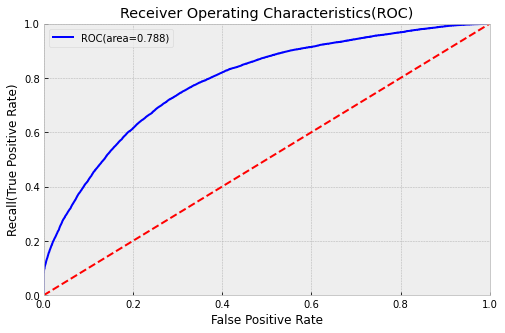

AUC for CatBoost Classifier model: 0.787896529089398


In [137]:
#ROC_AUC curve
plt.figure(figsize=(8,5))
false_positive_rate,recall,thresholds=roc_curve(y_uvalid,cb_pred);
cbroc_auc=auc(false_positive_rate,recall);
plt.title('Receiver Operating Characteristics(ROC)');
plt.plot(false_positive_rate,recall,'b',label='ROC(area=%0.3f)' %cbroc_auc);
plt.legend();
plt.plot([0,1],[0,1],'r--');
plt.xlim([0.0,1.0]);
plt.ylim([0.0,1.0]);
plt.ylabel('Recall(True Positive Rate)');
plt.xlabel('False Positive Rate');
plt.show();
print('AUC for CatBoost Classifier model:',cbroc_auc);

In [132]:
y_utrain.value_counts()

0    131206
1     40801
Name: Is_Lead, dtype: int64

In [133]:
cat_model3 = CatBoostClassifier(learning_rate=0.03,n_estimators=20000,early_stopping_rounds=500,use_best_model=True,\
                               eval_metric='AUC',random_state=2444,cat_features=cat_features_index,class_weights=[0.4,9])
cat_model3.fit(X=x_utrain,y=y_utrain,eval_set=(x_uvalid,y_uvalid))

0:	test: 0.7314569	best: 0.7314569 (0)	total: 284ms	remaining: 1h 34m 30s
1:	test: 0.7306640	best: 0.7314569 (0)	total: 367ms	remaining: 1h 1m 14s
2:	test: 0.7300334	best: 0.7314569 (0)	total: 429ms	remaining: 47m 38s
3:	test: 0.7364980	best: 0.7364980 (3)	total: 527ms	remaining: 43m 52s
4:	test: 0.7505100	best: 0.7505100 (4)	total: 615ms	remaining: 41m 1s
5:	test: 0.7529484	best: 0.7529484 (5)	total: 701ms	remaining: 38m 57s
6:	test: 0.7530709	best: 0.7530709 (6)	total: 787ms	remaining: 37m 26s
7:	test: 0.7521917	best: 0.7530709 (6)	total: 859ms	remaining: 35m 46s
8:	test: 0.7526297	best: 0.7530709 (6)	total: 943ms	remaining: 34m 54s
9:	test: 0.7542306	best: 0.7542306 (9)	total: 1.04s	remaining: 34m 35s
10:	test: 0.7535120	best: 0.7542306 (9)	total: 1.13s	remaining: 34m 10s
11:	test: 0.7553003	best: 0.7553003 (11)	total: 1.22s	remaining: 33m 52s
12:	test: 0.7575704	best: 0.7575704 (12)	total: 1.32s	remaining: 33m 46s
13:	test: 0.7617600	best: 0.7617600 (13)	total: 1.42s	remaining: 33m

114:	test: 0.7791349	best: 0.7791349 (114)	total: 11.7s	remaining: 33m 50s
115:	test: 0.7791355	best: 0.7791355 (115)	total: 11.8s	remaining: 33m 45s
116:	test: 0.7792802	best: 0.7792802 (116)	total: 11.9s	remaining: 33m 46s
117:	test: 0.7794063	best: 0.7794063 (117)	total: 12s	remaining: 33m 47s
118:	test: 0.7794429	best: 0.7794429 (118)	total: 12.1s	remaining: 33m 47s
119:	test: 0.7795299	best: 0.7795299 (119)	total: 12.2s	remaining: 33m 42s
120:	test: 0.7796389	best: 0.7796389 (120)	total: 12.3s	remaining: 33m 42s
121:	test: 0.7796949	best: 0.7796949 (121)	total: 12.4s	remaining: 33m 44s
122:	test: 0.7797432	best: 0.7797432 (122)	total: 12.5s	remaining: 33m 45s
123:	test: 0.7798254	best: 0.7798254 (123)	total: 12.6s	remaining: 33m 46s
124:	test: 0.7799370	best: 0.7799370 (124)	total: 12.7s	remaining: 33m 45s
125:	test: 0.7799539	best: 0.7799539 (125)	total: 12.9s	remaining: 33m 47s
126:	test: 0.7799801	best: 0.7799801 (126)	total: 12.9s	remaining: 33m 45s
127:	test: 0.7800050	best: 

225:	test: 0.7826650	best: 0.7826650 (225)	total: 23.8s	remaining: 34m 43s
226:	test: 0.7826654	best: 0.7826654 (226)	total: 23.9s	remaining: 34m 40s
227:	test: 0.7826687	best: 0.7826687 (227)	total: 24s	remaining: 34m 41s
228:	test: 0.7826900	best: 0.7826900 (228)	total: 24.1s	remaining: 34m 43s
229:	test: 0.7827166	best: 0.7827166 (229)	total: 24.3s	remaining: 34m 49s
230:	test: 0.7827263	best: 0.7827263 (230)	total: 24.5s	remaining: 34m 52s
231:	test: 0.7827298	best: 0.7827298 (231)	total: 24.6s	remaining: 34m 57s
232:	test: 0.7827348	best: 0.7827348 (232)	total: 24.8s	remaining: 35m 3s
233:	test: 0.7827927	best: 0.7827927 (233)	total: 25s	remaining: 35m 9s
234:	test: 0.7828008	best: 0.7828008 (234)	total: 25.1s	remaining: 35m 12s
235:	test: 0.7828019	best: 0.7828019 (235)	total: 25.3s	remaining: 35m 16s
236:	test: 0.7828168	best: 0.7828168 (236)	total: 25.4s	remaining: 35m 21s
237:	test: 0.7828169	best: 0.7828169 (237)	total: 25.6s	remaining: 35m 23s
238:	test: 0.7828198	best: 0.78

336:	test: 0.7844238	best: 0.7844238 (336)	total: 39.4s	remaining: 38m 18s
337:	test: 0.7844702	best: 0.7844702 (337)	total: 39.6s	remaining: 38m 22s
338:	test: 0.7844738	best: 0.7844738 (338)	total: 39.8s	remaining: 38m 28s
339:	test: 0.7844829	best: 0.7844829 (339)	total: 40s	remaining: 38m 32s
340:	test: 0.7844896	best: 0.7844896 (340)	total: 40.1s	remaining: 38m 33s
341:	test: 0.7845017	best: 0.7845017 (341)	total: 40.3s	remaining: 38m 37s
342:	test: 0.7845492	best: 0.7845492 (342)	total: 40.5s	remaining: 38m 41s
343:	test: 0.7845521	best: 0.7845521 (343)	total: 40.7s	remaining: 38m 43s
344:	test: 0.7845718	best: 0.7845718 (344)	total: 40.9s	remaining: 38m 48s
345:	test: 0.7845603	best: 0.7845718 (344)	total: 41s	remaining: 38m 51s
346:	test: 0.7845620	best: 0.7845718 (344)	total: 41.2s	remaining: 38m 53s
347:	test: 0.7845619	best: 0.7845718 (344)	total: 41.3s	remaining: 38m 51s
348:	test: 0.7845627	best: 0.7845718 (344)	total: 41.4s	remaining: 38m 52s
349:	test: 0.7846284	best: 0.

447:	test: 0.7852194	best: 0.7852378 (443)	total: 56.9s	remaining: 41m 25s
448:	test: 0.7852242	best: 0.7852378 (443)	total: 57.1s	remaining: 41m 25s
449:	test: 0.7852242	best: 0.7852378 (443)	total: 57.3s	remaining: 41m 27s
450:	test: 0.7852239	best: 0.7852378 (443)	total: 57.4s	remaining: 41m 27s
451:	test: 0.7852886	best: 0.7852886 (451)	total: 57.5s	remaining: 41m 28s
452:	test: 0.7852938	best: 0.7852938 (452)	total: 57.7s	remaining: 41m 29s
453:	test: 0.7853010	best: 0.7853010 (453)	total: 57.9s	remaining: 41m 31s
454:	test: 0.7853034	best: 0.7853034 (454)	total: 58s	remaining: 41m 31s
455:	test: 0.7853011	best: 0.7853034 (454)	total: 58.1s	remaining: 41m 32s
456:	test: 0.7853116	best: 0.7853116 (456)	total: 58.4s	remaining: 41m 35s
457:	test: 0.7853118	best: 0.7853118 (457)	total: 58.6s	remaining: 41m 39s
458:	test: 0.7853115	best: 0.7853118 (457)	total: 58.8s	remaining: 41m 43s
459:	test: 0.7853191	best: 0.7853191 (459)	total: 59s	remaining: 41m 47s
460:	test: 0.7853211	best: 0.

557:	test: 0.7857094	best: 0.7857220 (549)	total: 1m 16s	remaining: 44m 42s
558:	test: 0.7857093	best: 0.7857220 (549)	total: 1m 17s	remaining: 44m 43s
559:	test: 0.7857170	best: 0.7857220 (549)	total: 1m 17s	remaining: 44m 44s
560:	test: 0.7857172	best: 0.7857220 (549)	total: 1m 17s	remaining: 44m 46s
561:	test: 0.7857196	best: 0.7857220 (549)	total: 1m 17s	remaining: 44m 47s
562:	test: 0.7857140	best: 0.7857220 (549)	total: 1m 18s	remaining: 44m 53s
563:	test: 0.7857139	best: 0.7857220 (549)	total: 1m 18s	remaining: 44m 54s
564:	test: 0.7857148	best: 0.7857220 (549)	total: 1m 18s	remaining: 44m 53s
565:	test: 0.7857087	best: 0.7857220 (549)	total: 1m 18s	remaining: 44m 54s
566:	test: 0.7857095	best: 0.7857220 (549)	total: 1m 18s	remaining: 44m 57s
567:	test: 0.7857078	best: 0.7857220 (549)	total: 1m 18s	remaining: 45m
568:	test: 0.7857109	best: 0.7857220 (549)	total: 1m 19s	remaining: 45m 2s
569:	test: 0.7857159	best: 0.7857220 (549)	total: 1m 19s	remaining: 45m 4s
570:	test: 0.78571

666:	test: 0.7859914	best: 0.7859914 (666)	total: 1m 38s	remaining: 47m 31s
667:	test: 0.7859846	best: 0.7859914 (666)	total: 1m 38s	remaining: 47m 32s
668:	test: 0.7859878	best: 0.7859914 (666)	total: 1m 38s	remaining: 47m 34s
669:	test: 0.7859878	best: 0.7859914 (666)	total: 1m 38s	remaining: 47m 33s
670:	test: 0.7859951	best: 0.7859951 (670)	total: 1m 39s	remaining: 47m 35s
671:	test: 0.7859945	best: 0.7859951 (670)	total: 1m 39s	remaining: 47m 38s
672:	test: 0.7859992	best: 0.7859992 (672)	total: 1m 39s	remaining: 47m 40s
673:	test: 0.7859847	best: 0.7859992 (672)	total: 1m 39s	remaining: 47m 42s
674:	test: 0.7859907	best: 0.7859992 (672)	total: 1m 40s	remaining: 47m 44s
675:	test: 0.7859849	best: 0.7859992 (672)	total: 1m 40s	remaining: 47m 45s
676:	test: 0.7859841	best: 0.7859992 (672)	total: 1m 40s	remaining: 47m 47s
677:	test: 0.7859875	best: 0.7859992 (672)	total: 1m 40s	remaining: 47m 49s
678:	test: 0.7859844	best: 0.7859992 (672)	total: 1m 40s	remaining: 47m 51s
679:	test: 0

775:	test: 0.7861449	best: 0.7861529 (773)	total: 2m 4s	remaining: 51m 32s
776:	test: 0.7861505	best: 0.7861529 (773)	total: 2m 5s	remaining: 51m 34s
777:	test: 0.7861506	best: 0.7861529 (773)	total: 2m 5s	remaining: 51m 36s
778:	test: 0.7861464	best: 0.7861529 (773)	total: 2m 5s	remaining: 51m 40s
779:	test: 0.7861548	best: 0.7861548 (779)	total: 2m 5s	remaining: 51m 44s
780:	test: 0.7861559	best: 0.7861559 (780)	total: 2m 6s	remaining: 51m 45s
781:	test: 0.7861528	best: 0.7861559 (780)	total: 2m 6s	remaining: 51m 48s
782:	test: 0.7861528	best: 0.7861559 (780)	total: 2m 6s	remaining: 51m 49s
783:	test: 0.7861543	best: 0.7861559 (780)	total: 2m 7s	remaining: 51m 53s
784:	test: 0.7861548	best: 0.7861559 (780)	total: 2m 7s	remaining: 51m 57s
785:	test: 0.7861555	best: 0.7861559 (780)	total: 2m 7s	remaining: 52m 1s
786:	test: 0.7861555	best: 0.7861559 (780)	total: 2m 8s	remaining: 52m 8s
787:	test: 0.7861561	best: 0.7861561 (787)	total: 2m 8s	remaining: 52m 12s
788:	test: 0.7861448	best: 

884:	test: 0.7862069	best: 0.7862319 (851)	total: 2m 37s	remaining: 56m 48s
885:	test: 0.7862107	best: 0.7862319 (851)	total: 2m 38s	remaining: 56m 51s
886:	test: 0.7862061	best: 0.7862319 (851)	total: 2m 38s	remaining: 56m 53s
887:	test: 0.7862043	best: 0.7862319 (851)	total: 2m 38s	remaining: 56m 54s
888:	test: 0.7862047	best: 0.7862319 (851)	total: 2m 38s	remaining: 56m 56s
889:	test: 0.7862063	best: 0.7862319 (851)	total: 2m 39s	remaining: 56m 57s
890:	test: 0.7862075	best: 0.7862319 (851)	total: 2m 39s	remaining: 56m 58s
891:	test: 0.7862086	best: 0.7862319 (851)	total: 2m 39s	remaining: 57m 1s
892:	test: 0.7862088	best: 0.7862319 (851)	total: 2m 39s	remaining: 57m 2s
893:	test: 0.7862091	best: 0.7862319 (851)	total: 2m 40s	remaining: 57m 4s
894:	test: 0.7862043	best: 0.7862319 (851)	total: 2m 40s	remaining: 57m 7s
895:	test: 0.7862041	best: 0.7862319 (851)	total: 2m 41s	remaining: 57m 13s
896:	test: 0.7861999	best: 0.7862319 (851)	total: 2m 41s	remaining: 57m 16s
897:	test: 0.786

993:	test: 0.7862395	best: 0.7862433 (987)	total: 3m 9s	remaining: 1h 21s
994:	test: 0.7862377	best: 0.7862433 (987)	total: 3m 9s	remaining: 1h 23s
995:	test: 0.7862406	best: 0.7862433 (987)	total: 3m 10s	remaining: 1h 25s
996:	test: 0.7862346	best: 0.7862433 (987)	total: 3m 10s	remaining: 1h 27s
997:	test: 0.7862948	best: 0.7862948 (997)	total: 3m 10s	remaining: 1h 29s
998:	test: 0.7863337	best: 0.7863337 (998)	total: 3m 10s	remaining: 1h 31s
999:	test: 0.7863284	best: 0.7863337 (998)	total: 3m 11s	remaining: 1h 35s
1000:	test: 0.7863284	best: 0.7863337 (998)	total: 3m 11s	remaining: 1h 36s
1001:	test: 0.7863284	best: 0.7863337 (998)	total: 3m 11s	remaining: 1h 38s
1002:	test: 0.7863284	best: 0.7863337 (998)	total: 3m 12s	remaining: 1h 39s
1003:	test: 0.7863284	best: 0.7863337 (998)	total: 3m 12s	remaining: 1h 38s
1004:	test: 0.7863296	best: 0.7863337 (998)	total: 3m 12s	remaining: 1h 40s
1005:	test: 0.7863296	best: 0.7863337 (998)	total: 3m 12s	remaining: 1h 40s
1006:	test: 0.7863330

1099:	test: 0.7862585	best: 0.7863337 (998)	total: 3m 40s	remaining: 1h 3m 13s
1100:	test: 0.7862611	best: 0.7863337 (998)	total: 3m 41s	remaining: 1h 3m 15s
1101:	test: 0.7862611	best: 0.7863337 (998)	total: 3m 41s	remaining: 1h 3m 16s
1102:	test: 0.7862624	best: 0.7863337 (998)	total: 3m 41s	remaining: 1h 3m 18s
1103:	test: 0.7862564	best: 0.7863337 (998)	total: 3m 42s	remaining: 1h 3m 20s
1104:	test: 0.7862578	best: 0.7863337 (998)	total: 3m 42s	remaining: 1h 3m 21s
1105:	test: 0.7862550	best: 0.7863337 (998)	total: 3m 42s	remaining: 1h 3m 22s
1106:	test: 0.7862550	best: 0.7863337 (998)	total: 3m 42s	remaining: 1h 3m 23s
1107:	test: 0.7862578	best: 0.7863337 (998)	total: 3m 43s	remaining: 1h 3m 24s
1108:	test: 0.7862547	best: 0.7863337 (998)	total: 3m 43s	remaining: 1h 3m 23s
1109:	test: 0.7862597	best: 0.7863337 (998)	total: 3m 43s	remaining: 1h 3m 24s
1110:	test: 0.7862623	best: 0.7863337 (998)	total: 3m 43s	remaining: 1h 3m 25s
1111:	test: 0.7862669	best: 0.7863337 (998)	total: 3

1204:	test: 0.7862911	best: 0.7863337 (998)	total: 4m 12s	remaining: 1h 5m 32s
1205:	test: 0.7862912	best: 0.7863337 (998)	total: 4m 12s	remaining: 1h 5m 32s
1206:	test: 0.7862939	best: 0.7863337 (998)	total: 4m 12s	remaining: 1h 5m 34s
1207:	test: 0.7862907	best: 0.7863337 (998)	total: 4m 13s	remaining: 1h 5m 36s
1208:	test: 0.7862960	best: 0.7863337 (998)	total: 4m 13s	remaining: 1h 5m 38s
1209:	test: 0.7862961	best: 0.7863337 (998)	total: 4m 13s	remaining: 1h 5m 40s
1210:	test: 0.7862977	best: 0.7863337 (998)	total: 4m 14s	remaining: 1h 5m 42s
1211:	test: 0.7863012	best: 0.7863337 (998)	total: 4m 14s	remaining: 1h 5m 43s
1212:	test: 0.7863012	best: 0.7863337 (998)	total: 4m 14s	remaining: 1h 5m 43s
1213:	test: 0.7863017	best: 0.7863337 (998)	total: 4m 14s	remaining: 1h 5m 44s
1214:	test: 0.7863097	best: 0.7863337 (998)	total: 4m 15s	remaining: 1h 5m 47s
1215:	test: 0.7863108	best: 0.7863337 (998)	total: 4m 15s	remaining: 1h 5m 50s
1216:	test: 0.7863106	best: 0.7863337 (998)	total: 4

1308:	test: 0.7863182	best: 0.7863337 (998)	total: 4m 44s	remaining: 1h 7m 42s
1309:	test: 0.7863261	best: 0.7863337 (998)	total: 4m 44s	remaining: 1h 7m 43s
1310:	test: 0.7863199	best: 0.7863337 (998)	total: 4m 45s	remaining: 1h 7m 43s
1311:	test: 0.7863174	best: 0.7863337 (998)	total: 4m 45s	remaining: 1h 7m 43s
1312:	test: 0.7863125	best: 0.7863337 (998)	total: 4m 45s	remaining: 1h 7m 43s
1313:	test: 0.7863106	best: 0.7863337 (998)	total: 4m 45s	remaining: 1h 7m 43s
1314:	test: 0.7863104	best: 0.7863337 (998)	total: 4m 45s	remaining: 1h 7m 43s
1315:	test: 0.7863108	best: 0.7863337 (998)	total: 4m 46s	remaining: 1h 7m 44s
1316:	test: 0.7863121	best: 0.7863337 (998)	total: 4m 46s	remaining: 1h 7m 46s
1317:	test: 0.7863164	best: 0.7863337 (998)	total: 4m 47s	remaining: 1h 7m 48s
1318:	test: 0.7863200	best: 0.7863337 (998)	total: 4m 47s	remaining: 1h 7m 50s
1319:	test: 0.7863177	best: 0.7863337 (998)	total: 4m 47s	remaining: 1h 7m 52s
1320:	test: 0.7863167	best: 0.7863337 (998)	total: 4

1413:	test: 0.7862616	best: 0.7863337 (998)	total: 5m 19s	remaining: 1h 10m 2s
1414:	test: 0.7862616	best: 0.7863337 (998)	total: 5m 19s	remaining: 1h 10m 1s
1415:	test: 0.7862680	best: 0.7863337 (998)	total: 5m 20s	remaining: 1h 10m 2s
1416:	test: 0.7862680	best: 0.7863337 (998)	total: 5m 20s	remaining: 1h 10m 3s
1417:	test: 0.7862700	best: 0.7863337 (998)	total: 5m 20s	remaining: 1h 10m 4s
1418:	test: 0.7862693	best: 0.7863337 (998)	total: 5m 21s	remaining: 1h 10m 4s
1419:	test: 0.7862684	best: 0.7863337 (998)	total: 5m 21s	remaining: 1h 10m 3s
1420:	test: 0.7862679	best: 0.7863337 (998)	total: 5m 21s	remaining: 1h 10m 4s
1421:	test: 0.7862627	best: 0.7863337 (998)	total: 5m 21s	remaining: 1h 10m 5s
1422:	test: 0.7862625	best: 0.7863337 (998)	total: 5m 22s	remaining: 1h 10m 6s
1423:	test: 0.7862593	best: 0.7863337 (998)	total: 5m 22s	remaining: 1h 10m 6s
1424:	test: 0.7862661	best: 0.7863337 (998)	total: 5m 22s	remaining: 1h 10m 7s
1425:	test: 0.7862715	best: 0.7863337 (998)	total: 5

In [134]:
cb_pred3=cat_model3.predict_proba(x_uvalid)[:,1]
cb_pred31=cat_model3.predict(x_uvalid)
ic(cb_pred3);

ic| cb_pred3: array([0.51394608, 0.93824175, 0.64506418, ..., 0.65375683, 0.86901224,
                     0.93976949])


In [135]:
#Confusion matrix:-
cm_cb31=confusion_matrix(y_uvalid,cb_pred31)
cm_cb31=pd.crosstab(y_uvalid,cb_pred31)
#ROC_AUC SCORE:-
cb_roc_score3=roc_auc_score(y_uvalid,cb_pred3)
print('CatBoost Classifier ROC score:',cb_roc_score3)

CatBoost Classifier ROC score: 0.7863336626887827


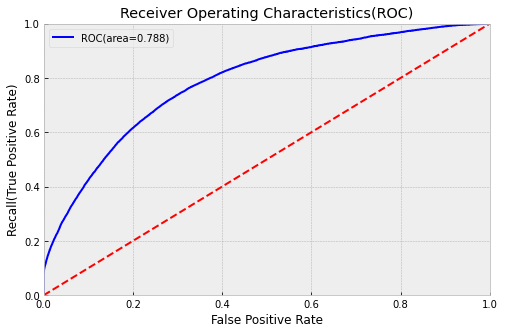

AUC for CatBoost Classifier model: 0.7877138697789475


In [151]:
#ROC_AUC curve
plt.figure(figsize=(8,5))
false_positive_rate,recall,thresholds=roc_curve(y_uvalid,cb_pred3);
cbroc_auc3=auc(false_positive_rate,recall);
plt.title('Receiver Operating Characteristics(ROC)');
plt.plot(false_positive_rate,recall,'b',label='ROC(area=%0.3f)' %cbroc_auc3);
plt.legend();
plt.plot([0,1],[0,1],'r--');
plt.xlim([0.0,1.0]);
plt.ylim([0.0,1.0]);
plt.ylabel('Recall(True Positive Rate)');
plt.xlabel('False Positive Rate');
plt.show();
print('AUC for CatBoost Classifier model:',cbroc_auc3);

- lr-0.04,n_est-10000,max_depth-None => roc=0.7878
- lr-0.05,n_est-100,depth-None => roc=0.7817
- lr-0.05,n_est-100,depth-5 => roc=0.7802
- lr-0.05,n_est-100,depth-15 => roc=0.7851
- lr-0.04,n_est-100,depth-15 => roc=0.7848
- lr-0.06,n_est-100,depth-15 => roc=0.7857
- lr-0.06,n_est-100,depth-None => roc=0.7831
- lr-0.1,n_est-100,depth-None => roc=0.7855
- lr-0.1,n_est-100,depth-15 => roc=0.7856
- lr-0.02,n_est-100,depth-None => roc=0.7739
- lr-0.1,n_est-10000,max_depth-None => roc=0.7873
- lr-0.06,n_est-20000,max_depth-None => roc=0.78747(itera stopped at 539)
- lr-0.06,n_est-20000,max_depth-15 => roc=0.785461(stopped at 93)
- lr-0.04,n_est-20000,max_depth-15 => roc=0.7854
- lr-0.04,n_est-20000,max_depth-None => roc=0.7877(stopped at 1753)
- After undersampling, lr-0.04,n_est-20000,max_depth-None => roc=0.826414
- After undersampling, lr-0.04,n_est-50000,max_depth-None => roc=0.847543

In [353]:
cat_model1 = CatBoostClassifier(learning_rate=0.04,n_estimators=20000,early_stopping_rounds=300,\
                               eval_metric='AUC',random_state=2444,cat_features=cat_features_index,)
cat_model1.fit(X=train_unencx,y=train_unency,eval_set=(x_uvalid,y_uvalid))

0:	test: 0.7569563	best: 0.7569563 (0)	total: 1.09s	remaining: 6h 4m 42s
1:	test: 0.7573168	best: 0.7573168 (1)	total: 2.07s	remaining: 5h 44m 25s
2:	test: 0.7585638	best: 0.7585638 (2)	total: 2.61s	remaining: 4h 49m 39s
3:	test: 0.7618463	best: 0.7618463 (3)	total: 3.45s	remaining: 4h 47m 47s
4:	test: 0.7622359	best: 0.7622359 (4)	total: 3.96s	remaining: 4h 23m 37s
5:	test: 0.7656288	best: 0.7656288 (5)	total: 4.74s	remaining: 4h 23m 22s
6:	test: 0.7660769	best: 0.7660769 (6)	total: 5.45s	remaining: 4h 19m 15s
7:	test: 0.7659841	best: 0.7660769 (6)	total: 6.03s	remaining: 4h 11m 7s
8:	test: 0.7677248	best: 0.7677248 (8)	total: 6.98s	remaining: 4h 18m 32s
9:	test: 0.7684348	best: 0.7684348 (9)	total: 7.75s	remaining: 4h 18m 19s
10:	test: 0.7690728	best: 0.7690728 (10)	total: 8.16s	remaining: 4h 7m 6s
11:	test: 0.7696491	best: 0.7696491 (11)	total: 8.68s	remaining: 4h 1m 4s
12:	test: 0.7704558	best: 0.7704558 (12)	total: 9.36s	remaining: 3h 59m 47s
13:	test: 0.7707517	best: 0.7707517 (1

110:	test: 0.7844928	best: 0.7844928 (110)	total: 1m 22s	remaining: 4h 6m 33s
111:	test: 0.7844966	best: 0.7844966 (111)	total: 1m 23s	remaining: 4h 7m 6s
112:	test: 0.7845835	best: 0.7845835 (112)	total: 1m 24s	remaining: 4h 7m 59s
113:	test: 0.7845929	best: 0.7845929 (113)	total: 1m 25s	remaining: 4h 8m 51s
114:	test: 0.7846140	best: 0.7846140 (114)	total: 1m 26s	remaining: 4h 8m 42s
115:	test: 0.7846524	best: 0.7846524 (115)	total: 1m 26s	remaining: 4h 8m 32s
116:	test: 0.7847008	best: 0.7847008 (116)	total: 1m 27s	remaining: 4h 7m 54s
117:	test: 0.7847857	best: 0.7847857 (117)	total: 1m 28s	remaining: 4h 7m 50s
118:	test: 0.7847979	best: 0.7847979 (118)	total: 1m 28s	remaining: 4h 7m 42s
119:	test: 0.7848445	best: 0.7848445 (119)	total: 1m 30s	remaining: 4h 8m 30s
120:	test: 0.7848928	best: 0.7848928 (120)	total: 1m 31s	remaining: 4h 9m 39s
121:	test: 0.7849380	best: 0.7849380 (121)	total: 1m 32s	remaining: 4h 9m 57s
122:	test: 0.7850208	best: 0.7850208 (122)	total: 1m 32s	remainin

216:	test: 0.7873864	best: 0.7873864 (216)	total: 2m 40s	remaining: 4h 3m 7s
217:	test: 0.7873918	best: 0.7873918 (217)	total: 2m 40s	remaining: 4h 3m
218:	test: 0.7873953	best: 0.7873953 (218)	total: 2m 41s	remaining: 4h 3m 5s
219:	test: 0.7874138	best: 0.7874138 (219)	total: 2m 42s	remaining: 4h 3m 14s
220:	test: 0.7874152	best: 0.7874152 (220)	total: 2m 42s	remaining: 4h 2m 42s
221:	test: 0.7874209	best: 0.7874209 (221)	total: 2m 43s	remaining: 4h 2m 33s
222:	test: 0.7874246	best: 0.7874246 (222)	total: 2m 44s	remaining: 4h 2m 46s
223:	test: 0.7874385	best: 0.7874385 (223)	total: 2m 44s	remaining: 4h 2m 34s
224:	test: 0.7874719	best: 0.7874719 (224)	total: 2m 45s	remaining: 4h 2m 13s
225:	test: 0.7874908	best: 0.7874908 (225)	total: 2m 45s	remaining: 4h 1m 59s
226:	test: 0.7875346	best: 0.7875346 (226)	total: 2m 46s	remaining: 4h 2m 23s
227:	test: 0.7875468	best: 0.7875468 (227)	total: 2m 47s	remaining: 4h 2m 26s
228:	test: 0.7875550	best: 0.7875550 (228)	total: 2m 48s	remaining: 4h

322:	test: 0.7888656	best: 0.7888656 (322)	total: 4m 3s	remaining: 4h 7m 13s
323:	test: 0.7888846	best: 0.7888846 (323)	total: 4m 4s	remaining: 4h 7m 19s
324:	test: 0.7889031	best: 0.7889031 (324)	total: 4m 5s	remaining: 4h 7m 15s
325:	test: 0.7889214	best: 0.7889214 (325)	total: 4m 5s	remaining: 4h 7m 14s
326:	test: 0.7889276	best: 0.7889276 (326)	total: 4m 6s	remaining: 4h 7m 19s
327:	test: 0.7889404	best: 0.7889404 (327)	total: 4m 7s	remaining: 4h 7m 12s
328:	test: 0.7889487	best: 0.7889487 (328)	total: 4m 8s	remaining: 4h 7m 8s
329:	test: 0.7889551	best: 0.7889551 (329)	total: 4m 8s	remaining: 4h 6m 53s
330:	test: 0.7889631	best: 0.7889631 (330)	total: 4m 9s	remaining: 4h 6m 54s
331:	test: 0.7890151	best: 0.7890151 (331)	total: 4m 10s	remaining: 4h 6m 54s
332:	test: 0.7890302	best: 0.7890302 (332)	total: 4m 11s	remaining: 4h 7m 6s
333:	test: 0.7890485	best: 0.7890485 (333)	total: 4m 11s	remaining: 4h 7m 6s
334:	test: 0.7890894	best: 0.7890894 (334)	total: 4m 12s	remaining: 4h 7m 17

428:	test: 0.7902008	best: 0.7902008 (428)	total: 5m 31s	remaining: 4h 12m 14s
429:	test: 0.7902225	best: 0.7902225 (429)	total: 5m 32s	remaining: 4h 12m 16s
430:	test: 0.7902339	best: 0.7902339 (430)	total: 5m 33s	remaining: 4h 12m 13s
431:	test: 0.7902433	best: 0.7902433 (431)	total: 5m 34s	remaining: 4h 12m 18s
432:	test: 0.7902596	best: 0.7902596 (432)	total: 5m 34s	remaining: 4h 12m 9s
433:	test: 0.7902650	best: 0.7902650 (433)	total: 5m 35s	remaining: 4h 12m 8s
434:	test: 0.7902776	best: 0.7902776 (434)	total: 5m 36s	remaining: 4h 12m 17s
435:	test: 0.7903064	best: 0.7903064 (435)	total: 5m 37s	remaining: 4h 12m 35s
436:	test: 0.7903317	best: 0.7903317 (436)	total: 5m 38s	remaining: 4h 12m 40s
437:	test: 0.7903411	best: 0.7903411 (437)	total: 5m 39s	remaining: 4h 12m 42s
438:	test: 0.7903503	best: 0.7903503 (438)	total: 5m 40s	remaining: 4h 12m 53s
439:	test: 0.7903541	best: 0.7903541 (439)	total: 5m 41s	remaining: 4h 12m 49s
440:	test: 0.7903537	best: 0.7903541 (439)	total: 5m 4

533:	test: 0.7911215	best: 0.7911215 (533)	total: 7m	remaining: 4h 15m 24s
534:	test: 0.7911294	best: 0.7911294 (534)	total: 7m 1s	remaining: 4h 15m 21s
535:	test: 0.7911312	best: 0.7911312 (535)	total: 7m 1s	remaining: 4h 15m 14s
536:	test: 0.7911326	best: 0.7911326 (536)	total: 7m 2s	remaining: 4h 15m 12s
537:	test: 0.7911330	best: 0.7911330 (537)	total: 7m 3s	remaining: 4h 15m 10s
538:	test: 0.7911398	best: 0.7911398 (538)	total: 7m 4s	remaining: 4h 15m 27s
539:	test: 0.7911440	best: 0.7911440 (539)	total: 7m 5s	remaining: 4h 15m 29s
540:	test: 0.7911610	best: 0.7911610 (540)	total: 7m 6s	remaining: 4h 15m 33s
541:	test: 0.7911663	best: 0.7911663 (541)	total: 7m 7s	remaining: 4h 15m 35s
542:	test: 0.7911697	best: 0.7911697 (542)	total: 7m 8s	remaining: 4h 15m 39s
543:	test: 0.7911710	best: 0.7911710 (543)	total: 7m 8s	remaining: 4h 15m 37s
544:	test: 0.7911725	best: 0.7911725 (544)	total: 7m 9s	remaining: 4h 15m 33s
545:	test: 0.7911725	best: 0.7911725 (544)	total: 7m 10s	remaining:

638:	test: 0.7918263	best: 0.7918263 (638)	total: 8m 23s	remaining: 4h 14m 2s
639:	test: 0.7918291	best: 0.7918291 (639)	total: 8m 23s	remaining: 4h 14m 4s
640:	test: 0.7918332	best: 0.7918332 (640)	total: 8m 24s	remaining: 4h 13m 58s
641:	test: 0.7918475	best: 0.7918475 (641)	total: 8m 25s	remaining: 4h 14m 4s
642:	test: 0.7918540	best: 0.7918540 (642)	total: 8m 26s	remaining: 4h 14m 12s
643:	test: 0.7918626	best: 0.7918626 (643)	total: 8m 27s	remaining: 4h 14m 17s
644:	test: 0.7918765	best: 0.7918765 (644)	total: 8m 28s	remaining: 4h 14m 18s
645:	test: 0.7918828	best: 0.7918828 (645)	total: 8m 29s	remaining: 4h 14m 18s
646:	test: 0.7918835	best: 0.7918835 (646)	total: 8m 30s	remaining: 4h 14m 24s
647:	test: 0.7918945	best: 0.7918945 (647)	total: 8m 31s	remaining: 4h 14m 26s
648:	test: 0.7919066	best: 0.7919066 (648)	total: 8m 31s	remaining: 4h 14m 26s
649:	test: 0.7919161	best: 0.7919161 (649)	total: 8m 32s	remaining: 4h 14m 26s
650:	test: 0.7919188	best: 0.7919188 (650)	total: 8m 33

743:	test: 0.7924699	best: 0.7924707 (742)	total: 9m 49s	remaining: 4h 14m 20s
744:	test: 0.7924714	best: 0.7924714 (744)	total: 9m 50s	remaining: 4h 14m 15s
745:	test: 0.7924801	best: 0.7924801 (745)	total: 9m 51s	remaining: 4h 14m 13s
746:	test: 0.7924799	best: 0.7924801 (745)	total: 9m 51s	remaining: 4h 14m 5s
747:	test: 0.7924801	best: 0.7924801 (747)	total: 9m 52s	remaining: 4h 14m 3s
748:	test: 0.7924933	best: 0.7924933 (748)	total: 9m 53s	remaining: 4h 14m 3s
749:	test: 0.7924931	best: 0.7924933 (748)	total: 9m 53s	remaining: 4h 13m 56s
750:	test: 0.7925027	best: 0.7925027 (750)	total: 9m 54s	remaining: 4h 13m 57s
751:	test: 0.7925023	best: 0.7925027 (750)	total: 9m 55s	remaining: 4h 13m 51s
752:	test: 0.7925048	best: 0.7925048 (752)	total: 9m 56s	remaining: 4h 13m 57s
753:	test: 0.7925105	best: 0.7925105 (753)	total: 9m 56s	remaining: 4h 13m 57s
754:	test: 0.7925209	best: 0.7925209 (754)	total: 9m 57s	remaining: 4h 14m 1s
755:	test: 0.7925183	best: 0.7925209 (754)	total: 9m 58s

847:	test: 0.7929753	best: 0.7929753 (847)	total: 11m 17s	remaining: 4h 15m
848:	test: 0.7929783	best: 0.7929783 (848)	total: 11m 17s	remaining: 4h 14m 52s
849:	test: 0.7929792	best: 0.7929792 (849)	total: 11m 18s	remaining: 4h 14m 52s
850:	test: 0.7929896	best: 0.7929896 (850)	total: 11m 19s	remaining: 4h 14m 52s
851:	test: 0.7929928	best: 0.7929928 (851)	total: 11m 20s	remaining: 4h 14m 52s
852:	test: 0.7930018	best: 0.7930018 (852)	total: 11m 21s	remaining: 4h 14m 50s
853:	test: 0.7930195	best: 0.7930195 (853)	total: 11m 21s	remaining: 4h 14m 44s
854:	test: 0.7930192	best: 0.7930195 (853)	total: 11m 22s	remaining: 4h 14m 37s
855:	test: 0.7930260	best: 0.7930260 (855)	total: 11m 22s	remaining: 4h 14m 33s
856:	test: 0.7930402	best: 0.7930402 (856)	total: 11m 23s	remaining: 4h 14m 36s
857:	test: 0.7930396	best: 0.7930402 (856)	total: 11m 24s	remaining: 4h 14m 31s
858:	test: 0.7930474	best: 0.7930474 (858)	total: 11m 25s	remaining: 4h 14m 28s
859:	test: 0.7930515	best: 0.7930515 (859)	t

950:	test: 0.7935001	best: 0.7935001 (950)	total: 12m 41s	remaining: 4h 14m 5s
951:	test: 0.7935150	best: 0.7935150 (951)	total: 12m 42s	remaining: 4h 14m 6s
952:	test: 0.7935227	best: 0.7935227 (952)	total: 12m 42s	remaining: 4h 14m 8s
953:	test: 0.7935253	best: 0.7935253 (953)	total: 12m 43s	remaining: 4h 14m 1s
954:	test: 0.7935338	best: 0.7935338 (954)	total: 12m 44s	remaining: 4h 14m 7s
955:	test: 0.7935336	best: 0.7935338 (954)	total: 12m 45s	remaining: 4h 14m
956:	test: 0.7935415	best: 0.7935415 (956)	total: 12m 46s	remaining: 4h 14m 3s
957:	test: 0.7935525	best: 0.7935525 (957)	total: 12m 47s	remaining: 4h 14m 7s
958:	test: 0.7935526	best: 0.7935526 (958)	total: 12m 48s	remaining: 4h 14m 18s
959:	test: 0.7935502	best: 0.7935526 (958)	total: 12m 49s	remaining: 4h 14m 25s
960:	test: 0.7935561	best: 0.7935561 (960)	total: 12m 50s	remaining: 4h 14m 27s
961:	test: 0.7935638	best: 0.7935638 (961)	total: 12m 51s	remaining: 4h 14m 32s
962:	test: 0.7935660	best: 0.7935660 (962)	total: 1

1052:	test: 0.7939227	best: 0.7939227 (1052)	total: 14m 6s	remaining: 4h 13m 55s
1053:	test: 0.7939247	best: 0.7939247 (1053)	total: 14m 7s	remaining: 4h 13m 56s
1054:	test: 0.7939357	best: 0.7939357 (1054)	total: 14m 8s	remaining: 4h 13m 54s
1055:	test: 0.7939379	best: 0.7939379 (1055)	total: 14m 9s	remaining: 4h 13m 52s
1056:	test: 0.7939369	best: 0.7939379 (1055)	total: 14m 9s	remaining: 4h 13m 46s
1057:	test: 0.7939373	best: 0.7939379 (1055)	total: 14m 10s	remaining: 4h 13m 49s
1058:	test: 0.7939393	best: 0.7939393 (1058)	total: 14m 11s	remaining: 4h 13m 48s
1059:	test: 0.7939412	best: 0.7939412 (1059)	total: 14m 12s	remaining: 4h 13m 46s
1060:	test: 0.7939451	best: 0.7939451 (1060)	total: 14m 13s	remaining: 4h 13m 47s
1061:	test: 0.7939602	best: 0.7939602 (1061)	total: 14m 13s	remaining: 4h 13m 46s
1062:	test: 0.7939643	best: 0.7939643 (1062)	total: 14m 14s	remaining: 4h 13m 43s
1063:	test: 0.7939721	best: 0.7939721 (1063)	total: 14m 15s	remaining: 4h 13m 45s
1064:	test: 0.7939749

1153:	test: 0.7943165	best: 0.7943180 (1151)	total: 15m 24s	remaining: 4h 11m 34s
1154:	test: 0.7943343	best: 0.7943343 (1154)	total: 15m 25s	remaining: 4h 11m 36s
1155:	test: 0.7943340	best: 0.7943343 (1154)	total: 15m 26s	remaining: 4h 11m 35s
1156:	test: 0.7943408	best: 0.7943408 (1156)	total: 15m 26s	remaining: 4h 11m 36s
1157:	test: 0.7943437	best: 0.7943437 (1157)	total: 15m 27s	remaining: 4h 11m 36s
1158:	test: 0.7943465	best: 0.7943465 (1158)	total: 15m 28s	remaining: 4h 11m 31s
1159:	test: 0.7943472	best: 0.7943472 (1159)	total: 15m 29s	remaining: 4h 11m 28s
1160:	test: 0.7943477	best: 0.7943477 (1160)	total: 15m 29s	remaining: 4h 11m 24s
1161:	test: 0.7943617	best: 0.7943617 (1161)	total: 15m 30s	remaining: 4h 11m 24s
1162:	test: 0.7943672	best: 0.7943672 (1162)	total: 15m 31s	remaining: 4h 11m 21s
1163:	test: 0.7943698	best: 0.7943698 (1163)	total: 15m 31s	remaining: 4h 11m 16s
1164:	test: 0.7943733	best: 0.7943733 (1164)	total: 15m 32s	remaining: 4h 11m 14s
1165:	test: 0.79

1255:	test: 0.7946561	best: 0.7946561 (1255)	total: 16m 33s	remaining: 4h 7m 5s
1256:	test: 0.7946624	best: 0.7946624 (1256)	total: 16m 34s	remaining: 4h 7m 1s
1257:	test: 0.7946628	best: 0.7946628 (1257)	total: 16m 34s	remaining: 4h 6m 59s
1258:	test: 0.7946714	best: 0.7946714 (1258)	total: 16m 35s	remaining: 4h 6m 56s
1259:	test: 0.7946757	best: 0.7946757 (1259)	total: 16m 35s	remaining: 4h 6m 53s
1260:	test: 0.7946779	best: 0.7946779 (1260)	total: 16m 36s	remaining: 4h 6m 50s
1261:	test: 0.7946885	best: 0.7946885 (1261)	total: 16m 37s	remaining: 4h 6m 48s
1262:	test: 0.7946885	best: 0.7946885 (1262)	total: 16m 37s	remaining: 4h 6m 42s
1263:	test: 0.7946892	best: 0.7946892 (1263)	total: 16m 38s	remaining: 4h 6m 41s
1264:	test: 0.7946979	best: 0.7946979 (1264)	total: 16m 39s	remaining: 4h 6m 40s
1265:	test: 0.7946974	best: 0.7946979 (1264)	total: 16m 40s	remaining: 4h 6m 41s
1266:	test: 0.7946967	best: 0.7946979 (1264)	total: 16m 40s	remaining: 4h 6m 39s
1267:	test: 0.7946994	best: 0.

1357:	test: 0.7949916	best: 0.7949916 (1357)	total: 17m 43s	remaining: 4h 3m 24s
1358:	test: 0.7949965	best: 0.7949965 (1358)	total: 17m 44s	remaining: 4h 3m 24s
1359:	test: 0.7950077	best: 0.7950077 (1359)	total: 17m 45s	remaining: 4h 3m 27s
1360:	test: 0.7950111	best: 0.7950111 (1360)	total: 17m 46s	remaining: 4h 3m 25s
1361:	test: 0.7950183	best: 0.7950183 (1361)	total: 17m 47s	remaining: 4h 3m 26s
1362:	test: 0.7950217	best: 0.7950217 (1362)	total: 17m 48s	remaining: 4h 3m 23s
1363:	test: 0.7950251	best: 0.7950251 (1363)	total: 17m 48s	remaining: 4h 3m 20s
1364:	test: 0.7950337	best: 0.7950337 (1364)	total: 17m 49s	remaining: 4h 3m 16s
1365:	test: 0.7950330	best: 0.7950337 (1364)	total: 17m 50s	remaining: 4h 3m 16s
1366:	test: 0.7950341	best: 0.7950341 (1366)	total: 17m 50s	remaining: 4h 3m 17s
1367:	test: 0.7950343	best: 0.7950343 (1367)	total: 17m 51s	remaining: 4h 3m 17s
1368:	test: 0.7950349	best: 0.7950349 (1368)	total: 17m 52s	remaining: 4h 3m 15s
1369:	test: 0.7950347	best: 

1459:	test: 0.7953344	best: 0.7953344 (1459)	total: 19m 2s	remaining: 4h 1m 42s
1460:	test: 0.7953350	best: 0.7953350 (1460)	total: 19m 2s	remaining: 4h 1m 43s
1461:	test: 0.7953470	best: 0.7953470 (1461)	total: 19m 4s	remaining: 4h 1m 46s
1462:	test: 0.7953538	best: 0.7953538 (1462)	total: 19m 4s	remaining: 4h 1m 45s
1463:	test: 0.7953550	best: 0.7953550 (1463)	total: 19m 5s	remaining: 4h 1m 45s
1464:	test: 0.7953562	best: 0.7953562 (1464)	total: 19m 6s	remaining: 4h 1m 43s
1465:	test: 0.7953574	best: 0.7953574 (1465)	total: 19m 7s	remaining: 4h 1m 42s
1466:	test: 0.7953607	best: 0.7953607 (1466)	total: 19m 7s	remaining: 4h 1m 42s
1467:	test: 0.7953627	best: 0.7953627 (1467)	total: 19m 8s	remaining: 4h 1m 43s
1468:	test: 0.7953639	best: 0.7953639 (1468)	total: 19m 9s	remaining: 4h 1m 44s
1469:	test: 0.7953649	best: 0.7953649 (1469)	total: 19m 10s	remaining: 4h 1m 42s
1470:	test: 0.7953700	best: 0.7953700 (1470)	total: 19m 11s	remaining: 4h 1m 47s
1471:	test: 0.7953726	best: 0.7953726 

1561:	test: 0.7957129	best: 0.7957129 (1560)	total: 20m 30s	remaining: 4h 2m 9s
1562:	test: 0.7957121	best: 0.7957129 (1560)	total: 20m 31s	remaining: 4h 2m 7s
1563:	test: 0.7957117	best: 0.7957129 (1560)	total: 20m 32s	remaining: 4h 2m 5s
1564:	test: 0.7957203	best: 0.7957203 (1564)	total: 20m 33s	remaining: 4h 2m 7s
1565:	test: 0.7957237	best: 0.7957237 (1565)	total: 20m 34s	remaining: 4h 2m 6s
1566:	test: 0.7957272	best: 0.7957272 (1566)	total: 20m 34s	remaining: 4h 2m 6s
1567:	test: 0.7957238	best: 0.7957272 (1566)	total: 20m 35s	remaining: 4h 2m 5s
1568:	test: 0.7957263	best: 0.7957272 (1566)	total: 20m 36s	remaining: 4h 2m 5s
1569:	test: 0.7957352	best: 0.7957352 (1569)	total: 20m 37s	remaining: 4h 2m 3s
1570:	test: 0.7957343	best: 0.7957352 (1569)	total: 20m 38s	remaining: 4h 2m 3s
1571:	test: 0.7957410	best: 0.7957410 (1571)	total: 20m 39s	remaining: 4h 2m 5s
1572:	test: 0.7957411	best: 0.7957411 (1572)	total: 20m 40s	remaining: 4h 2m 7s
1573:	test: 0.7957414	best: 0.7957414 (1

1663:	test: 0.7961080	best: 0.7961080 (1663)	total: 21m 59s	remaining: 4h 2m 15s
1664:	test: 0.7961087	best: 0.7961087 (1664)	total: 21m 59s	remaining: 4h 2m 13s
1665:	test: 0.7961130	best: 0.7961130 (1665)	total: 22m	remaining: 4h 2m 13s
1666:	test: 0.7961158	best: 0.7961158 (1666)	total: 22m 1s	remaining: 4h 2m 13s
1667:	test: 0.7961190	best: 0.7961190 (1667)	total: 22m 2s	remaining: 4h 2m 15s
1668:	test: 0.7961237	best: 0.7961237 (1668)	total: 22m 3s	remaining: 4h 2m 20s
1669:	test: 0.7961233	best: 0.7961237 (1668)	total: 22m 4s	remaining: 4h 2m 21s
1670:	test: 0.7961242	best: 0.7961242 (1670)	total: 22m 5s	remaining: 4h 2m 18s
1671:	test: 0.7961300	best: 0.7961300 (1671)	total: 22m 6s	remaining: 4h 2m 18s
1672:	test: 0.7961400	best: 0.7961400 (1672)	total: 22m 7s	remaining: 4h 2m 21s
1673:	test: 0.7961383	best: 0.7961400 (1672)	total: 22m 8s	remaining: 4h 2m 20s
1674:	test: 0.7961381	best: 0.7961400 (1672)	total: 22m 8s	remaining: 4h 2m 19s
1675:	test: 0.7961405	best: 0.7961405 (16

1765:	test: 0.7964624	best: 0.7964629 (1764)	total: 23m 24s	remaining: 4h 1m 40s
1766:	test: 0.7964625	best: 0.7964629 (1764)	total: 23m 25s	remaining: 4h 1m 40s
1767:	test: 0.7964643	best: 0.7964643 (1767)	total: 23m 25s	remaining: 4h 1m 38s
1768:	test: 0.7964695	best: 0.7964695 (1768)	total: 23m 26s	remaining: 4h 1m 39s
1769:	test: 0.7964780	best: 0.7964780 (1769)	total: 23m 27s	remaining: 4h 1m 39s
1770:	test: 0.7964808	best: 0.7964808 (1770)	total: 23m 28s	remaining: 4h 1m 39s
1771:	test: 0.7964878	best: 0.7964878 (1771)	total: 23m 29s	remaining: 4h 1m 38s
1772:	test: 0.7964915	best: 0.7964915 (1772)	total: 23m 30s	remaining: 4h 1m 37s
1773:	test: 0.7964916	best: 0.7964916 (1773)	total: 23m 31s	remaining: 4h 1m 39s
1774:	test: 0.7964994	best: 0.7964994 (1774)	total: 23m 32s	remaining: 4h 1m 41s
1775:	test: 0.7964991	best: 0.7964994 (1774)	total: 23m 33s	remaining: 4h 1m 41s
1776:	test: 0.7964993	best: 0.7964994 (1774)	total: 23m 33s	remaining: 4h 1m 38s
1777:	test: 0.7965021	best: 

1867:	test: 0.7967518	best: 0.7967518 (1867)	total: 24m 51s	remaining: 4h 1m 22s
1868:	test: 0.7967575	best: 0.7967575 (1868)	total: 24m 52s	remaining: 4h 1m 22s
1869:	test: 0.7967605	best: 0.7967605 (1869)	total: 24m 53s	remaining: 4h 1m 20s
1870:	test: 0.7967639	best: 0.7967639 (1870)	total: 24m 54s	remaining: 4h 1m 20s
1871:	test: 0.7967657	best: 0.7967657 (1871)	total: 24m 55s	remaining: 4h 1m 18s
1872:	test: 0.7967665	best: 0.7967665 (1872)	total: 24m 56s	remaining: 4h 1m 20s
1873:	test: 0.7967689	best: 0.7967689 (1873)	total: 24m 57s	remaining: 4h 1m 21s
1874:	test: 0.7967751	best: 0.7967751 (1874)	total: 24m 58s	remaining: 4h 1m 21s
1875:	test: 0.7967795	best: 0.7967795 (1875)	total: 24m 59s	remaining: 4h 1m 22s
1876:	test: 0.7967799	best: 0.7967799 (1876)	total: 24m 59s	remaining: 4h 1m 21s
1877:	test: 0.7967900	best: 0.7967900 (1877)	total: 25m	remaining: 4h 1m 23s
1878:	test: 0.7967898	best: 0.7967900 (1877)	total: 25m 1s	remaining: 4h 1m 23s
1879:	test: 0.7967902	best: 0.796

1971:	test: 0.7970713	best: 0.7970713 (1971)	total: 26m 17s	remaining: 4h 24s
1972:	test: 0.7970671	best: 0.7970713 (1971)	total: 26m 18s	remaining: 4h 24s
1973:	test: 0.7970666	best: 0.7970713 (1971)	total: 26m 19s	remaining: 4h 24s
1974:	test: 0.7970659	best: 0.7970713 (1971)	total: 26m 20s	remaining: 4h 23s
1975:	test: 0.7970702	best: 0.7970713 (1971)	total: 26m 21s	remaining: 4h 22s
1976:	test: 0.7970728	best: 0.7970728 (1976)	total: 26m 21s	remaining: 4h 21s
1977:	test: 0.7970793	best: 0.7970793 (1977)	total: 26m 22s	remaining: 4h 20s
1978:	test: 0.7970838	best: 0.7970838 (1978)	total: 26m 23s	remaining: 4h 20s
1979:	test: 0.7970825	best: 0.7970838 (1978)	total: 26m 24s	remaining: 4h 19s
1980:	test: 0.7970929	best: 0.7970929 (1980)	total: 26m 25s	remaining: 4h 17s
1981:	test: 0.7970941	best: 0.7970941 (1981)	total: 26m 25s	remaining: 4h 15s
1982:	test: 0.7970963	best: 0.7970963 (1982)	total: 26m 26s	remaining: 4h 11s
1983:	test: 0.7970976	best: 0.7970976 (1983)	total: 26m 27s	rema

2077:	test: 0.7973627	best: 0.7973633 (2076)	total: 27m 51s	remaining: 4h 15s
2078:	test: 0.7973751	best: 0.7973751 (2078)	total: 27m 52s	remaining: 4h 14s
2079:	test: 0.7973765	best: 0.7973765 (2079)	total: 27m 53s	remaining: 4h 15s
2080:	test: 0.7973764	best: 0.7973765 (2079)	total: 27m 53s	remaining: 4h 13s
2081:	test: 0.7973776	best: 0.7973776 (2081)	total: 27m 55s	remaining: 4h 15s
2082:	test: 0.7973809	best: 0.7973809 (2082)	total: 27m 56s	remaining: 4h 16s
2083:	test: 0.7973828	best: 0.7973828 (2083)	total: 27m 56s	remaining: 4h 16s
2084:	test: 0.7973884	best: 0.7973884 (2084)	total: 27m 58s	remaining: 4h 18s
2085:	test: 0.7973920	best: 0.7973920 (2085)	total: 27m 58s	remaining: 4h 18s
2086:	test: 0.7973943	best: 0.7973943 (2086)	total: 27m 59s	remaining: 4h 17s
2087:	test: 0.7973981	best: 0.7973981 (2087)	total: 28m	remaining: 4h 16s
2088:	test: 0.7974015	best: 0.7974015 (2088)	total: 28m 1s	remaining: 4h 17s
2089:	test: 0.7974091	best: 0.7974091 (2089)	total: 28m 2s	remaining:

2183:	test: 0.7976684	best: 0.7976684 (2181)	total: 29m 25s	remaining: 3h 59m 59s
2184:	test: 0.7976682	best: 0.7976684 (2181)	total: 29m 25s	remaining: 3h 59m 57s
2185:	test: 0.7976702	best: 0.7976702 (2185)	total: 29m 26s	remaining: 3h 59m 54s
2186:	test: 0.7976720	best: 0.7976720 (2186)	total: 29m 27s	remaining: 3h 59m 55s
2187:	test: 0.7976714	best: 0.7976720 (2186)	total: 29m 28s	remaining: 3h 59m 53s
2188:	test: 0.7976743	best: 0.7976743 (2188)	total: 29m 28s	remaining: 3h 59m 52s
2189:	test: 0.7976765	best: 0.7976765 (2189)	total: 29m 29s	remaining: 3h 59m 51s
2190:	test: 0.7976780	best: 0.7976780 (2190)	total: 29m 30s	remaining: 3h 59m 50s
2191:	test: 0.7976790	best: 0.7976790 (2191)	total: 29m 31s	remaining: 3h 59m 48s
2192:	test: 0.7976828	best: 0.7976828 (2192)	total: 29m 31s	remaining: 3h 59m 46s
2193:	test: 0.7976944	best: 0.7976944 (2193)	total: 29m 32s	remaining: 3h 59m 44s
2194:	test: 0.7976948	best: 0.7976948 (2194)	total: 29m 33s	remaining: 3h 59m 44s
2195:	test: 0.79

2284:	test: 0.7979978	best: 0.7979978 (2284)	total: 30m 48s	remaining: 3h 58m 51s
2285:	test: 0.7979962	best: 0.7979978 (2284)	total: 30m 49s	remaining: 3h 58m 52s
2286:	test: 0.7979963	best: 0.7979978 (2284)	total: 30m 50s	remaining: 3h 58m 53s
2287:	test: 0.7979987	best: 0.7979987 (2287)	total: 30m 51s	remaining: 3h 58m 56s
2288:	test: 0.7980033	best: 0.7980033 (2288)	total: 30m 52s	remaining: 3h 58m 55s
2289:	test: 0.7980031	best: 0.7980033 (2288)	total: 30m 53s	remaining: 3h 58m 55s
2290:	test: 0.7980141	best: 0.7980141 (2290)	total: 30m 54s	remaining: 3h 58m 55s
2291:	test: 0.7980200	best: 0.7980200 (2291)	total: 30m 55s	remaining: 3h 58m 55s
2292:	test: 0.7980189	best: 0.7980200 (2291)	total: 30m 56s	remaining: 3h 58m 54s
2293:	test: 0.7980192	best: 0.7980200 (2291)	total: 30m 56s	remaining: 3h 58m 52s
2294:	test: 0.7980210	best: 0.7980210 (2294)	total: 30m 57s	remaining: 3h 58m 51s
2295:	test: 0.7980218	best: 0.7980218 (2295)	total: 30m 58s	remaining: 3h 58m 52s
2296:	test: 0.79

2385:	test: 0.7982438	best: 0.7982438 (2385)	total: 32m 17s	remaining: 3h 58m 20s
2386:	test: 0.7982491	best: 0.7982491 (2386)	total: 32m 18s	remaining: 3h 58m 22s
2387:	test: 0.7982574	best: 0.7982574 (2387)	total: 32m 19s	remaining: 3h 58m 21s
2388:	test: 0.7982569	best: 0.7982574 (2387)	total: 32m 19s	remaining: 3h 58m 20s
2389:	test: 0.7982585	best: 0.7982585 (2389)	total: 32m 20s	remaining: 3h 58m 21s
2390:	test: 0.7982650	best: 0.7982650 (2390)	total: 32m 22s	remaining: 3h 58m 22s
2391:	test: 0.7982671	best: 0.7982671 (2391)	total: 32m 22s	remaining: 3h 58m 21s
2392:	test: 0.7982679	best: 0.7982679 (2392)	total: 32m 24s	remaining: 3h 58m 24s
2393:	test: 0.7982675	best: 0.7982679 (2392)	total: 32m 24s	remaining: 3h 58m 23s
2394:	test: 0.7982688	best: 0.7982688 (2394)	total: 32m 25s	remaining: 3h 58m 23s
2395:	test: 0.7982685	best: 0.7982688 (2394)	total: 32m 26s	remaining: 3h 58m 21s
2396:	test: 0.7982721	best: 0.7982721 (2396)	total: 32m 27s	remaining: 3h 58m 25s
2397:	test: 0.79

2486:	test: 0.7985044	best: 0.7985044 (2486)	total: 33m 40s	remaining: 3h 57m 6s
2487:	test: 0.7985081	best: 0.7985081 (2487)	total: 33m 41s	remaining: 3h 57m 6s
2488:	test: 0.7985093	best: 0.7985093 (2488)	total: 33m 41s	remaining: 3h 57m 5s
2489:	test: 0.7985152	best: 0.7985152 (2489)	total: 33m 43s	remaining: 3h 57m 6s
2490:	test: 0.7985230	best: 0.7985230 (2490)	total: 33m 43s	remaining: 3h 57m 5s
2491:	test: 0.7985246	best: 0.7985246 (2491)	total: 33m 44s	remaining: 3h 57m 4s
2492:	test: 0.7985298	best: 0.7985298 (2492)	total: 33m 45s	remaining: 3h 57m 5s
2493:	test: 0.7985396	best: 0.7985396 (2493)	total: 33m 46s	remaining: 3h 57m 4s
2494:	test: 0.7985426	best: 0.7985426 (2494)	total: 33m 47s	remaining: 3h 57m 2s
2495:	test: 0.7985415	best: 0.7985426 (2494)	total: 33m 48s	remaining: 3h 57m 2s
2496:	test: 0.7985446	best: 0.7985446 (2496)	total: 33m 48s	remaining: 3h 57m
2497:	test: 0.7985465	best: 0.7985465 (2497)	total: 33m 49s	remaining: 3h 56m 59s
2498:	test: 0.7985474	best: 0.

2587:	test: 0.7987716	best: 0.7987716 (2587)	total: 35m	remaining: 3h 55m 33s
2588:	test: 0.7987738	best: 0.7987738 (2588)	total: 35m 1s	remaining: 3h 55m 31s
2589:	test: 0.7987836	best: 0.7987836 (2589)	total: 35m 2s	remaining: 3h 55m 31s
2590:	test: 0.7987822	best: 0.7987836 (2589)	total: 35m 2s	remaining: 3h 55m 29s
2591:	test: 0.7987826	best: 0.7987836 (2589)	total: 35m 3s	remaining: 3h 55m 27s
2592:	test: 0.7987842	best: 0.7987842 (2592)	total: 35m 4s	remaining: 3h 55m 24s
2593:	test: 0.7987876	best: 0.7987876 (2593)	total: 35m 4s	remaining: 3h 55m 22s
2594:	test: 0.7987933	best: 0.7987933 (2594)	total: 35m 5s	remaining: 3h 55m 22s
2595:	test: 0.7987926	best: 0.7987933 (2594)	total: 35m 6s	remaining: 3h 55m 21s
2596:	test: 0.7987939	best: 0.7987939 (2596)	total: 35m 7s	remaining: 3h 55m 21s
2597:	test: 0.7987903	best: 0.7987939 (2596)	total: 35m 8s	remaining: 3h 55m 20s
2598:	test: 0.7987895	best: 0.7987939 (2596)	total: 35m 8s	remaining: 3h 55m 19s
2599:	test: 0.7987931	best: 0.7

2688:	test: 0.7990260	best: 0.7990260 (2688)	total: 36m 26s	remaining: 3h 54m 38s
2689:	test: 0.7990232	best: 0.7990260 (2688)	total: 36m 27s	remaining: 3h 54m 35s
2690:	test: 0.7990285	best: 0.7990285 (2690)	total: 36m 28s	remaining: 3h 54m 35s
2691:	test: 0.7990288	best: 0.7990288 (2691)	total: 36m 29s	remaining: 3h 54m 36s
2692:	test: 0.7990291	best: 0.7990291 (2692)	total: 36m 30s	remaining: 3h 54m 35s
2693:	test: 0.7990308	best: 0.7990308 (2693)	total: 36m 30s	remaining: 3h 54m 34s
2694:	test: 0.7990299	best: 0.7990308 (2693)	total: 36m 31s	remaining: 3h 54m 33s
2695:	test: 0.7990369	best: 0.7990369 (2695)	total: 36m 32s	remaining: 3h 54m 34s
2696:	test: 0.7990338	best: 0.7990369 (2695)	total: 36m 33s	remaining: 3h 54m 33s
2697:	test: 0.7990336	best: 0.7990369 (2695)	total: 36m 34s	remaining: 3h 54m 32s
2698:	test: 0.7990338	best: 0.7990369 (2695)	total: 36m 35s	remaining: 3h 54m 31s
2699:	test: 0.7990351	best: 0.7990369 (2695)	total: 36m 36s	remaining: 3h 54m 30s
2700:	test: 0.79

2789:	test: 0.7992848	best: 0.7992848 (2789)	total: 37m 51s	remaining: 3h 53m 29s
2790:	test: 0.7992975	best: 0.7992975 (2790)	total: 37m 52s	remaining: 3h 53m 29s
2791:	test: 0.7992983	best: 0.7992983 (2791)	total: 37m 52s	remaining: 3h 53m 27s
2792:	test: 0.7992994	best: 0.7992994 (2792)	total: 37m 53s	remaining: 3h 53m 25s
2793:	test: 0.7992979	best: 0.7992994 (2792)	total: 37m 54s	remaining: 3h 53m 24s
2794:	test: 0.7992988	best: 0.7992994 (2792)	total: 37m 54s	remaining: 3h 53m 23s
2795:	test: 0.7993006	best: 0.7993006 (2795)	total: 37m 55s	remaining: 3h 53m 24s
2796:	test: 0.7993115	best: 0.7993115 (2796)	total: 37m 56s	remaining: 3h 53m 23s
2797:	test: 0.7993137	best: 0.7993137 (2797)	total: 37m 57s	remaining: 3h 53m 22s
2798:	test: 0.7993189	best: 0.7993189 (2798)	total: 37m 58s	remaining: 3h 53m 21s
2799:	test: 0.7993187	best: 0.7993189 (2798)	total: 37m 59s	remaining: 3h 53m 21s
2800:	test: 0.7993214	best: 0.7993214 (2800)	total: 38m	remaining: 3h 53m 20s
2801:	test: 0.799321

2890:	test: 0.7995381	best: 0.7995381 (2890)	total: 39m 18s	remaining: 3h 52m 37s
2891:	test: 0.7995387	best: 0.7995387 (2891)	total: 39m 19s	remaining: 3h 52m 37s
2892:	test: 0.7995426	best: 0.7995426 (2892)	total: 39m 20s	remaining: 3h 52m 36s
2893:	test: 0.7995464	best: 0.7995464 (2893)	total: 39m 21s	remaining: 3h 52m 36s
2894:	test: 0.7995494	best: 0.7995494 (2894)	total: 39m 22s	remaining: 3h 52m 38s
2895:	test: 0.7995565	best: 0.7995565 (2895)	total: 39m 23s	remaining: 3h 52m 38s
2896:	test: 0.7995607	best: 0.7995607 (2896)	total: 39m 24s	remaining: 3h 52m 39s
2897:	test: 0.7995629	best: 0.7995629 (2897)	total: 39m 25s	remaining: 3h 52m 39s
2898:	test: 0.7995626	best: 0.7995629 (2897)	total: 39m 26s	remaining: 3h 52m 39s
2899:	test: 0.7995638	best: 0.7995638 (2899)	total: 39m 27s	remaining: 3h 52m 39s
2900:	test: 0.7995709	best: 0.7995709 (2900)	total: 39m 28s	remaining: 3h 52m 39s
2901:	test: 0.7995735	best: 0.7995735 (2901)	total: 39m 29s	remaining: 3h 52m 39s
2902:	test: 0.79

2991:	test: 0.7998414	best: 0.7998414 (2991)	total: 40m 45s	remaining: 3h 51m 38s
2992:	test: 0.7998427	best: 0.7998427 (2992)	total: 40m 45s	remaining: 3h 51m 38s
2993:	test: 0.7998436	best: 0.7998436 (2993)	total: 40m 46s	remaining: 3h 51m 36s
2994:	test: 0.7998442	best: 0.7998442 (2994)	total: 40m 47s	remaining: 3h 51m 35s
2995:	test: 0.7998452	best: 0.7998452 (2995)	total: 40m 47s	remaining: 3h 51m 32s
2996:	test: 0.7998505	best: 0.7998505 (2996)	total: 40m 48s	remaining: 3h 51m 32s
2997:	test: 0.7998505	best: 0.7998505 (2996)	total: 40m 49s	remaining: 3h 51m 31s
2998:	test: 0.7998506	best: 0.7998506 (2998)	total: 40m 50s	remaining: 3h 51m 29s
2999:	test: 0.7998543	best: 0.7998543 (2999)	total: 40m 51s	remaining: 3h 51m 29s
3000:	test: 0.7998575	best: 0.7998575 (3000)	total: 40m 51s	remaining: 3h 51m 29s
3001:	test: 0.7998580	best: 0.7998580 (3001)	total: 40m 52s	remaining: 3h 51m 27s
3002:	test: 0.7998596	best: 0.7998596 (3002)	total: 40m 53s	remaining: 3h 51m 25s
3003:	test: 0.79

3092:	test: 0.8001366	best: 0.8001366 (3092)	total: 42m 5s	remaining: 3h 50m 5s
3093:	test: 0.8001418	best: 0.8001418 (3093)	total: 42m 6s	remaining: 3h 50m 4s
3094:	test: 0.8001424	best: 0.8001424 (3094)	total: 42m 7s	remaining: 3h 50m 3s
3095:	test: 0.8001420	best: 0.8001424 (3094)	total: 42m 7s	remaining: 3h 50m
3096:	test: 0.8001437	best: 0.8001437 (3096)	total: 42m 8s	remaining: 3h 49m 58s
3097:	test: 0.8001490	best: 0.8001490 (3097)	total: 42m 8s	remaining: 3h 49m 56s
3098:	test: 0.8001516	best: 0.8001516 (3098)	total: 42m 9s	remaining: 3h 49m 55s
3099:	test: 0.8001512	best: 0.8001516 (3098)	total: 42m 10s	remaining: 3h 49m 54s
3100:	test: 0.8001559	best: 0.8001559 (3100)	total: 42m 11s	remaining: 3h 49m 53s
3101:	test: 0.8001568	best: 0.8001568 (3101)	total: 42m 11s	remaining: 3h 49m 52s
3102:	test: 0.8001628	best: 0.8001628 (3102)	total: 42m 12s	remaining: 3h 49m 51s
3103:	test: 0.8001637	best: 0.8001637 (3103)	total: 42m 13s	remaining: 3h 49m 49s
3104:	test: 0.8001659	best: 0.

3193:	test: 0.8004244	best: 0.8004244 (3193)	total: 43m 26s	remaining: 3h 48m 33s
3194:	test: 0.8004255	best: 0.8004255 (3194)	total: 43m 26s	remaining: 3h 48m 32s
3195:	test: 0.8004245	best: 0.8004255 (3194)	total: 43m 27s	remaining: 3h 48m 30s
3196:	test: 0.8004249	best: 0.8004255 (3194)	total: 43m 28s	remaining: 3h 48m 28s
3197:	test: 0.8004386	best: 0.8004386 (3197)	total: 43m 28s	remaining: 3h 48m 26s
3198:	test: 0.8004388	best: 0.8004388 (3198)	total: 43m 29s	remaining: 3h 48m 25s
3199:	test: 0.8004415	best: 0.8004415 (3199)	total: 43m 30s	remaining: 3h 48m 24s
3200:	test: 0.8004417	best: 0.8004417 (3200)	total: 43m 31s	remaining: 3h 48m 23s
3201:	test: 0.8004472	best: 0.8004472 (3201)	total: 43m 32s	remaining: 3h 48m 23s
3202:	test: 0.8004503	best: 0.8004503 (3202)	total: 43m 33s	remaining: 3h 48m 24s
3203:	test: 0.8004548	best: 0.8004548 (3203)	total: 43m 34s	remaining: 3h 48m 24s
3204:	test: 0.8004598	best: 0.8004598 (3204)	total: 43m 35s	remaining: 3h 48m 23s
3205:	test: 0.80

3294:	test: 0.8007145	best: 0.8007145 (3294)	total: 44m 45s	remaining: 3h 46m 54s
3295:	test: 0.8007177	best: 0.8007177 (3295)	total: 44m 46s	remaining: 3h 46m 53s
3296:	test: 0.8007208	best: 0.8007208 (3296)	total: 44m 46s	remaining: 3h 46m 51s
3297:	test: 0.8007218	best: 0.8007218 (3297)	total: 44m 47s	remaining: 3h 46m 50s
3298:	test: 0.8007247	best: 0.8007247 (3298)	total: 44m 48s	remaining: 3h 46m 48s
3299:	test: 0.8007279	best: 0.8007279 (3299)	total: 44m 49s	remaining: 3h 46m 48s
3300:	test: 0.8007320	best: 0.8007320 (3300)	total: 44m 49s	remaining: 3h 46m 47s
3301:	test: 0.8007391	best: 0.8007391 (3301)	total: 44m 50s	remaining: 3h 46m 46s
3302:	test: 0.8007399	best: 0.8007399 (3302)	total: 44m 51s	remaining: 3h 46m 46s
3303:	test: 0.8007435	best: 0.8007435 (3303)	total: 44m 52s	remaining: 3h 46m 44s
3304:	test: 0.8007477	best: 0.8007477 (3304)	total: 44m 53s	remaining: 3h 46m 44s
3305:	test: 0.8007559	best: 0.8007559 (3305)	total: 44m 53s	remaining: 3h 46m 42s
3306:	test: 0.80

3395:	test: 0.8009261	best: 0.8009261 (3395)	total: 46m 6s	remaining: 3h 45m 24s
3396:	test: 0.8009299	best: 0.8009299 (3396)	total: 46m 7s	remaining: 3h 45m 23s
3397:	test: 0.8009328	best: 0.8009328 (3397)	total: 46m 7s	remaining: 3h 45m 22s
3398:	test: 0.8009329	best: 0.8009329 (3398)	total: 46m 8s	remaining: 3h 45m 21s
3399:	test: 0.8009389	best: 0.8009389 (3399)	total: 46m 9s	remaining: 3h 45m 20s
3400:	test: 0.8009385	best: 0.8009389 (3399)	total: 46m 10s	remaining: 3h 45m 19s
3401:	test: 0.8009386	best: 0.8009389 (3399)	total: 46m 11s	remaining: 3h 45m 19s
3402:	test: 0.8009375	best: 0.8009389 (3399)	total: 46m 11s	remaining: 3h 45m 18s
3403:	test: 0.8009412	best: 0.8009412 (3403)	total: 46m 12s	remaining: 3h 45m 16s
3404:	test: 0.8009415	best: 0.8009415 (3404)	total: 46m 13s	remaining: 3h 45m 15s
3405:	test: 0.8009419	best: 0.8009419 (3405)	total: 46m 13s	remaining: 3h 45m 14s
3406:	test: 0.8009410	best: 0.8009419 (3405)	total: 46m 14s	remaining: 3h 45m 13s
3407:	test: 0.8009468

3496:	test: 0.8011467	best: 0.8011467 (3496)	total: 47m 25s	remaining: 3h 43m 48s
3497:	test: 0.8011522	best: 0.8011522 (3497)	total: 47m 26s	remaining: 3h 43m 47s
3498:	test: 0.8011573	best: 0.8011573 (3498)	total: 47m 27s	remaining: 3h 43m 46s
3499:	test: 0.8011627	best: 0.8011627 (3499)	total: 47m 28s	remaining: 3h 43m 46s
3500:	test: 0.8011653	best: 0.8011653 (3500)	total: 47m 28s	remaining: 3h 43m 45s
3501:	test: 0.8011691	best: 0.8011691 (3501)	total: 47m 29s	remaining: 3h 43m 45s
3502:	test: 0.8011691	best: 0.8011691 (3501)	total: 47m 30s	remaining: 3h 43m 43s
3503:	test: 0.8011740	best: 0.8011740 (3503)	total: 47m 31s	remaining: 3h 43m 43s
3504:	test: 0.8011765	best: 0.8011765 (3504)	total: 47m 32s	remaining: 3h 43m 42s
3505:	test: 0.8011770	best: 0.8011770 (3505)	total: 47m 33s	remaining: 3h 43m 42s
3506:	test: 0.8011817	best: 0.8011817 (3506)	total: 47m 34s	remaining: 3h 43m 42s
3507:	test: 0.8011853	best: 0.8011853 (3507)	total: 47m 34s	remaining: 3h 43m 41s
3508:	test: 0.80

3597:	test: 0.8013652	best: 0.8013652 (3597)	total: 48m 46s	remaining: 3h 42m 21s
3598:	test: 0.8013647	best: 0.8013652 (3597)	total: 48m 47s	remaining: 3h 42m 20s
3599:	test: 0.8013661	best: 0.8013661 (3599)	total: 48m 48s	remaining: 3h 42m 19s
3600:	test: 0.8013720	best: 0.8013720 (3600)	total: 48m 49s	remaining: 3h 42m 18s
3601:	test: 0.8013799	best: 0.8013799 (3601)	total: 48m 49s	remaining: 3h 42m 17s
3602:	test: 0.8013829	best: 0.8013829 (3602)	total: 48m 50s	remaining: 3h 42m 16s
3603:	test: 0.8013885	best: 0.8013885 (3603)	total: 48m 51s	remaining: 3h 42m 15s
3604:	test: 0.8013902	best: 0.8013902 (3604)	total: 48m 51s	remaining: 3h 42m 14s
3605:	test: 0.8013945	best: 0.8013945 (3605)	total: 48m 52s	remaining: 3h 42m 12s
3606:	test: 0.8013963	best: 0.8013963 (3606)	total: 48m 53s	remaining: 3h 42m 12s
3607:	test: 0.8013965	best: 0.8013965 (3607)	total: 48m 54s	remaining: 3h 42m 12s
3608:	test: 0.8014004	best: 0.8014004 (3608)	total: 48m 55s	remaining: 3h 42m 12s
3609:	test: 0.80

3698:	test: 0.8016297	best: 0.8016297 (3698)	total: 50m 10s	remaining: 3h 41m 7s
3699:	test: 0.8016310	best: 0.8016310 (3699)	total: 50m 11s	remaining: 3h 41m 6s
3700:	test: 0.8016320	best: 0.8016320 (3700)	total: 50m 12s	remaining: 3h 41m 5s
3701:	test: 0.8016348	best: 0.8016348 (3701)	total: 50m 12s	remaining: 3h 41m 4s
3702:	test: 0.8016376	best: 0.8016376 (3702)	total: 50m 13s	remaining: 3h 41m 3s
3703:	test: 0.8016413	best: 0.8016413 (3703)	total: 50m 14s	remaining: 3h 41m 2s
3704:	test: 0.8016495	best: 0.8016495 (3704)	total: 50m 15s	remaining: 3h 41m
3705:	test: 0.8016530	best: 0.8016530 (3705)	total: 50m 15s	remaining: 3h 40m 58s
3706:	test: 0.8016548	best: 0.8016548 (3706)	total: 50m 16s	remaining: 3h 40m 57s
3707:	test: 0.8016563	best: 0.8016563 (3707)	total: 50m 17s	remaining: 3h 40m 57s
3708:	test: 0.8016572	best: 0.8016572 (3708)	total: 50m 17s	remaining: 3h 40m 55s
3709:	test: 0.8016597	best: 0.8016597 (3709)	total: 50m 18s	remaining: 3h 40m 54s
3710:	test: 0.8016626	best

3799:	test: 0.8018949	best: 0.8018969 (3797)	total: 51m 37s	remaining: 3h 40m 3s
3800:	test: 0.8018988	best: 0.8018988 (3800)	total: 51m 38s	remaining: 3h 40m 4s
3801:	test: 0.8019026	best: 0.8019026 (3801)	total: 51m 39s	remaining: 3h 40m 3s
3802:	test: 0.8019034	best: 0.8019034 (3802)	total: 51m 39s	remaining: 3h 40m 1s
3803:	test: 0.8019055	best: 0.8019055 (3803)	total: 51m 40s	remaining: 3h 40m 1s
3804:	test: 0.8019067	best: 0.8019067 (3804)	total: 51m 41s	remaining: 3h 40m 1s
3805:	test: 0.8019134	best: 0.8019134 (3805)	total: 51m 42s	remaining: 3h 40m 2s
3806:	test: 0.8019161	best: 0.8019161 (3806)	total: 51m 43s	remaining: 3h 40m 1s
3807:	test: 0.8019171	best: 0.8019171 (3807)	total: 51m 44s	remaining: 3h 39m 59s
3808:	test: 0.8019233	best: 0.8019233 (3808)	total: 51m 45s	remaining: 3h 39m 59s
3809:	test: 0.8019230	best: 0.8019233 (3808)	total: 51m 45s	remaining: 3h 39m 57s
3810:	test: 0.8019258	best: 0.8019258 (3810)	total: 51m 46s	remaining: 3h 39m 57s
3811:	test: 0.8019262	be

3900:	test: 0.8021606	best: 0.8021606 (3900)	total: 52m 58s	remaining: 3h 38m 36s
3901:	test: 0.8021632	best: 0.8021632 (3901)	total: 52m 59s	remaining: 3h 38m 36s
3902:	test: 0.8021640	best: 0.8021640 (3902)	total: 52m 59s	remaining: 3h 38m 35s
3903:	test: 0.8021634	best: 0.8021640 (3902)	total: 53m	remaining: 3h 38m 34s
3904:	test: 0.8021694	best: 0.8021694 (3904)	total: 53m 1s	remaining: 3h 38m 34s
3905:	test: 0.8021696	best: 0.8021696 (3905)	total: 53m 3s	remaining: 3h 38m 35s
3906:	test: 0.8021701	best: 0.8021701 (3906)	total: 53m 3s	remaining: 3h 38m 34s
3907:	test: 0.8021706	best: 0.8021706 (3907)	total: 53m 5s	remaining: 3h 38m 34s
3908:	test: 0.8021704	best: 0.8021706 (3907)	total: 53m 5s	remaining: 3h 38m 34s
3909:	test: 0.8021754	best: 0.8021754 (3909)	total: 53m 6s	remaining: 3h 38m 33s
3910:	test: 0.8021756	best: 0.8021756 (3910)	total: 53m 7s	remaining: 3h 38m 34s
3911:	test: 0.8021770	best: 0.8021770 (3911)	total: 53m 8s	remaining: 3h 38m 34s
3912:	test: 0.8021891	best: 

4001:	test: 0.8023995	best: 0.8023995 (4001)	total: 54m 26s	remaining: 3h 37m 37s
4002:	test: 0.8023982	best: 0.8023995 (4001)	total: 54m 27s	remaining: 3h 37m 36s
4003:	test: 0.8023999	best: 0.8023999 (4003)	total: 54m 27s	remaining: 3h 37m 35s
4004:	test: 0.8024011	best: 0.8024011 (4004)	total: 54m 28s	remaining: 3h 37m 34s
4005:	test: 0.8024022	best: 0.8024022 (4005)	total: 54m 29s	remaining: 3h 37m 34s
4006:	test: 0.8024015	best: 0.8024022 (4005)	total: 54m 30s	remaining: 3h 37m 34s
4007:	test: 0.8024032	best: 0.8024032 (4007)	total: 54m 31s	remaining: 3h 37m 34s
4008:	test: 0.8024051	best: 0.8024051 (4008)	total: 54m 32s	remaining: 3h 37m 33s
4009:	test: 0.8024050	best: 0.8024051 (4008)	total: 54m 33s	remaining: 3h 37m 31s
4010:	test: 0.8024031	best: 0.8024051 (4008)	total: 54m 34s	remaining: 3h 37m 31s
4011:	test: 0.8024041	best: 0.8024051 (4008)	total: 54m 35s	remaining: 3h 37m 31s
4012:	test: 0.8024065	best: 0.8024065 (4012)	total: 54m 35s	remaining: 3h 37m 29s
4013:	test: 0.80

4102:	test: 0.8026139	best: 0.8026139 (4102)	total: 55m 47s	remaining: 3h 36m 9s
4103:	test: 0.8026147	best: 0.8026147 (4103)	total: 55m 48s	remaining: 3h 36m 8s
4104:	test: 0.8026137	best: 0.8026147 (4103)	total: 55m 48s	remaining: 3h 36m 7s
4105:	test: 0.8026145	best: 0.8026147 (4103)	total: 55m 50s	remaining: 3h 36m 7s
4106:	test: 0.8026138	best: 0.8026147 (4103)	total: 55m 50s	remaining: 3h 36m 6s
4107:	test: 0.8026140	best: 0.8026147 (4103)	total: 55m 51s	remaining: 3h 36m 4s
4108:	test: 0.8026148	best: 0.8026148 (4108)	total: 55m 52s	remaining: 3h 36m 3s
4109:	test: 0.8026155	best: 0.8026155 (4109)	total: 55m 53s	remaining: 3h 36m 3s
4110:	test: 0.8026159	best: 0.8026159 (4110)	total: 55m 54s	remaining: 3h 36m 3s
4111:	test: 0.8026183	best: 0.8026183 (4111)	total: 55m 54s	remaining: 3h 36m 2s
4112:	test: 0.8026208	best: 0.8026208 (4112)	total: 55m 55s	remaining: 3h 36m 1s
4113:	test: 0.8026246	best: 0.8026246 (4113)	total: 55m 56s	remaining: 3h 36m 1s
4114:	test: 0.8026266	best: 

4203:	test: 0.8028507	best: 0.8028507 (4203)	total: 57m 9s	remaining: 3h 34m 44s
4204:	test: 0.8028521	best: 0.8028521 (4204)	total: 57m 9s	remaining: 3h 34m 43s
4205:	test: 0.8028539	best: 0.8028539 (4205)	total: 57m 11s	remaining: 3h 34m 43s
4206:	test: 0.8028543	best: 0.8028543 (4206)	total: 57m 11s	remaining: 3h 34m 43s
4207:	test: 0.8028585	best: 0.8028585 (4207)	total: 57m 12s	remaining: 3h 34m 42s
4208:	test: 0.8028586	best: 0.8028586 (4208)	total: 57m 13s	remaining: 3h 34m 41s
4209:	test: 0.8028618	best: 0.8028618 (4209)	total: 57m 14s	remaining: 3h 34m 40s
4210:	test: 0.8028656	best: 0.8028656 (4210)	total: 57m 15s	remaining: 3h 34m 39s
4211:	test: 0.8028658	best: 0.8028658 (4211)	total: 57m 15s	remaining: 3h 34m 38s
4212:	test: 0.8028708	best: 0.8028708 (4212)	total: 57m 16s	remaining: 3h 34m 37s
4213:	test: 0.8028711	best: 0.8028711 (4213)	total: 57m 16s	remaining: 3h 34m 35s
4214:	test: 0.8028717	best: 0.8028717 (4214)	total: 57m 17s	remaining: 3h 34m 34s
4215:	test: 0.8028

4304:	test: 0.8030957	best: 0.8030957 (4304)	total: 58m 29s	remaining: 3h 33m 13s
4305:	test: 0.8030981	best: 0.8030981 (4305)	total: 58m 30s	remaining: 3h 33m 13s
4306:	test: 0.8030983	best: 0.8030983 (4306)	total: 58m 31s	remaining: 3h 33m 13s
4307:	test: 0.8030998	best: 0.8030998 (4307)	total: 58m 32s	remaining: 3h 33m 12s
4308:	test: 0.8031012	best: 0.8031012 (4308)	total: 58m 32s	remaining: 3h 33m 11s
4309:	test: 0.8031010	best: 0.8031012 (4308)	total: 58m 33s	remaining: 3h 33m 10s
4310:	test: 0.8031023	best: 0.8031023 (4310)	total: 58m 34s	remaining: 3h 33m 9s
4311:	test: 0.8031094	best: 0.8031094 (4311)	total: 58m 35s	remaining: 3h 33m 8s
4312:	test: 0.8031115	best: 0.8031115 (4312)	total: 58m 36s	remaining: 3h 33m 8s
4313:	test: 0.8031144	best: 0.8031144 (4313)	total: 58m 36s	remaining: 3h 33m 7s
4314:	test: 0.8031204	best: 0.8031204 (4314)	total: 58m 37s	remaining: 3h 33m 5s
4315:	test: 0.8031243	best: 0.8031243 (4315)	total: 58m 38s	remaining: 3h 33m 5s
4316:	test: 0.8031244	

4405:	test: 0.8033250	best: 0.8033250 (4405)	total: 59m 51s	remaining: 3h 31m 52s
4406:	test: 0.8033262	best: 0.8033262 (4406)	total: 59m 52s	remaining: 3h 31m 50s
4407:	test: 0.8033266	best: 0.8033266 (4407)	total: 59m 53s	remaining: 3h 31m 49s
4408:	test: 0.8033254	best: 0.8033266 (4407)	total: 59m 53s	remaining: 3h 31m 48s
4409:	test: 0.8033267	best: 0.8033267 (4409)	total: 59m 54s	remaining: 3h 31m 48s
4410:	test: 0.8033326	best: 0.8033326 (4410)	total: 59m 55s	remaining: 3h 31m 48s
4411:	test: 0.8033328	best: 0.8033328 (4411)	total: 59m 56s	remaining: 3h 31m 47s
4412:	test: 0.8033322	best: 0.8033328 (4411)	total: 59m 57s	remaining: 3h 31m 46s
4413:	test: 0.8033342	best: 0.8033342 (4413)	total: 59m 58s	remaining: 3h 31m 45s
4414:	test: 0.8033394	best: 0.8033394 (4414)	total: 59m 59s	remaining: 3h 31m 45s
4415:	test: 0.8033489	best: 0.8033489 (4415)	total: 1h	remaining: 3h 31m 45s
4416:	test: 0.8033502	best: 0.8033502 (4416)	total: 1h 1s	remaining: 3h 31m 45s
4417:	test: 0.8033525	b

4506:	test: 0.8035794	best: 0.8035794 (4506)	total: 1h 1m 16s	remaining: 3h 30m 37s
4507:	test: 0.8035859	best: 0.8035859 (4507)	total: 1h 1m 17s	remaining: 3h 30m 37s
4508:	test: 0.8035861	best: 0.8035861 (4508)	total: 1h 1m 18s	remaining: 3h 30m 36s
4509:	test: 0.8035908	best: 0.8035908 (4509)	total: 1h 1m 18s	remaining: 3h 30m 35s
4510:	test: 0.8035907	best: 0.8035908 (4509)	total: 1h 1m 19s	remaining: 3h 30m 34s
4511:	test: 0.8035937	best: 0.8035937 (4511)	total: 1h 1m 20s	remaining: 3h 30m 33s
4512:	test: 0.8035967	best: 0.8035967 (4512)	total: 1h 1m 21s	remaining: 3h 30m 32s
4513:	test: 0.8036003	best: 0.8036003 (4513)	total: 1h 1m 21s	remaining: 3h 30m 31s
4514:	test: 0.8035997	best: 0.8036003 (4513)	total: 1h 1m 22s	remaining: 3h 30m 30s
4515:	test: 0.8036007	best: 0.8036007 (4515)	total: 1h 1m 23s	remaining: 3h 30m 30s
4516:	test: 0.8036021	best: 0.8036021 (4516)	total: 1h 1m 24s	remaining: 3h 30m 29s
4517:	test: 0.8036047	best: 0.8036047 (4517)	total: 1h 1m 25s	remaining: 3h 

4604:	test: 0.8037673	best: 0.8037673 (4604)	total: 1h 2m 37s	remaining: 3h 29m 21s
4605:	test: 0.8037700	best: 0.8037700 (4605)	total: 1h 2m 38s	remaining: 3h 29m 20s
4606:	test: 0.8037711	best: 0.8037711 (4606)	total: 1h 2m 39s	remaining: 3h 29m 20s
4607:	test: 0.8037779	best: 0.8037779 (4607)	total: 1h 2m 39s	remaining: 3h 29m 19s
4608:	test: 0.8037811	best: 0.8037811 (4608)	total: 1h 2m 40s	remaining: 3h 29m 18s
4609:	test: 0.8037810	best: 0.8037811 (4608)	total: 1h 2m 41s	remaining: 3h 29m 18s
4610:	test: 0.8037830	best: 0.8037830 (4610)	total: 1h 2m 42s	remaining: 3h 29m 17s
4611:	test: 0.8037856	best: 0.8037856 (4611)	total: 1h 2m 43s	remaining: 3h 29m 16s
4612:	test: 0.8037867	best: 0.8037867 (4612)	total: 1h 2m 44s	remaining: 3h 29m 16s
4613:	test: 0.8037894	best: 0.8037894 (4613)	total: 1h 2m 44s	remaining: 3h 29m 14s
4614:	test: 0.8037908	best: 0.8037908 (4614)	total: 1h 2m 45s	remaining: 3h 29m 14s
4615:	test: 0.8037913	best: 0.8037913 (4615)	total: 1h 2m 46s	remaining: 3h 

4703:	test: 0.8039513	best: 0.8039523 (4702)	total: 1h 4m 3s	remaining: 3h 28m 16s
4704:	test: 0.8039531	best: 0.8039531 (4704)	total: 1h 4m 3s	remaining: 3h 28m 15s
4705:	test: 0.8039542	best: 0.8039542 (4705)	total: 1h 4m 4s	remaining: 3h 28m 15s
4706:	test: 0.8039530	best: 0.8039542 (4705)	total: 1h 4m 5s	remaining: 3h 28m 14s
4707:	test: 0.8039535	best: 0.8039542 (4705)	total: 1h 4m 6s	remaining: 3h 28m 13s
4708:	test: 0.8039543	best: 0.8039543 (4708)	total: 1h 4m 7s	remaining: 3h 28m 13s
4709:	test: 0.8039557	best: 0.8039557 (4709)	total: 1h 4m 8s	remaining: 3h 28m 12s
4710:	test: 0.8039559	best: 0.8039559 (4710)	total: 1h 4m 9s	remaining: 3h 28m 11s
4711:	test: 0.8039630	best: 0.8039630 (4711)	total: 1h 4m 9s	remaining: 3h 28m 10s
4712:	test: 0.8039632	best: 0.8039632 (4712)	total: 1h 4m 10s	remaining: 3h 28m 10s
4713:	test: 0.8039663	best: 0.8039663 (4713)	total: 1h 4m 11s	remaining: 3h 28m 10s
4714:	test: 0.8039689	best: 0.8039689 (4714)	total: 1h 4m 12s	remaining: 3h 28m 9s
47

4802:	test: 0.8041800	best: 0.8041800 (4802)	total: 1h 5m 25s	remaining: 3h 27m
4803:	test: 0.8041820	best: 0.8041820 (4803)	total: 1h 5m 26s	remaining: 3h 26m 59s
4804:	test: 0.8041886	best: 0.8041886 (4804)	total: 1h 5m 26s	remaining: 3h 26m 58s
4805:	test: 0.8041863	best: 0.8041886 (4804)	total: 1h 5m 27s	remaining: 3h 26m 57s
4806:	test: 0.8041868	best: 0.8041886 (4804)	total: 1h 5m 28s	remaining: 3h 26m 55s
4807:	test: 0.8041892	best: 0.8041892 (4807)	total: 1h 5m 29s	remaining: 3h 26m 55s
4808:	test: 0.8041897	best: 0.8041897 (4808)	total: 1h 5m 30s	remaining: 3h 26m 55s
4809:	test: 0.8041879	best: 0.8041897 (4808)	total: 1h 5m 31s	remaining: 3h 26m 54s
4810:	test: 0.8041874	best: 0.8041897 (4808)	total: 1h 5m 32s	remaining: 3h 26m 54s
4811:	test: 0.8041887	best: 0.8041897 (4808)	total: 1h 5m 33s	remaining: 3h 26m 54s
4812:	test: 0.8041921	best: 0.8041921 (4812)	total: 1h 5m 34s	remaining: 3h 26m 53s
4813:	test: 0.8041942	best: 0.8041942 (4813)	total: 1h 5m 34s	remaining: 3h 26m 

4900:	test: 0.8043625	best: 0.8043625 (4898)	total: 1h 6m 49s	remaining: 3h 25m 51s
4901:	test: 0.8043627	best: 0.8043627 (4901)	total: 1h 6m 50s	remaining: 3h 25m 50s
4902:	test: 0.8043644	best: 0.8043644 (4902)	total: 1h 6m 51s	remaining: 3h 25m 50s
4903:	test: 0.8043647	best: 0.8043647 (4903)	total: 1h 6m 52s	remaining: 3h 25m 50s
4904:	test: 0.8043707	best: 0.8043707 (4904)	total: 1h 6m 53s	remaining: 3h 25m 50s
4905:	test: 0.8043749	best: 0.8043749 (4905)	total: 1h 6m 53s	remaining: 3h 25m 49s
4906:	test: 0.8043765	best: 0.8043765 (4906)	total: 1h 6m 54s	remaining: 3h 25m 48s
4907:	test: 0.8043749	best: 0.8043765 (4906)	total: 1h 6m 55s	remaining: 3h 25m 48s
4908:	test: 0.8043740	best: 0.8043765 (4906)	total: 1h 6m 56s	remaining: 3h 25m 47s
4909:	test: 0.8043742	best: 0.8043765 (4906)	total: 1h 6m 57s	remaining: 3h 25m 47s
4910:	test: 0.8043790	best: 0.8043790 (4910)	total: 1h 6m 58s	remaining: 3h 25m 46s
4911:	test: 0.8043786	best: 0.8043790 (4910)	total: 1h 6m 59s	remaining: 3h 

4999:	test: 0.8045472	best: 0.8045472 (4999)	total: 1h 8m 20s	remaining: 3h 25m 1s
5000:	test: 0.8045535	best: 0.8045535 (5000)	total: 1h 8m 21s	remaining: 3h 25m 1s
5001:	test: 0.8045623	best: 0.8045623 (5001)	total: 1h 8m 22s	remaining: 3h 25m
5002:	test: 0.8045617	best: 0.8045623 (5001)	total: 1h 8m 23s	remaining: 3h 25m
5003:	test: 0.8045608	best: 0.8045623 (5001)	total: 1h 8m 24s	remaining: 3h 25m
5004:	test: 0.8045637	best: 0.8045637 (5004)	total: 1h 8m 25s	remaining: 3h 25m
5005:	test: 0.8045629	best: 0.8045637 (5004)	total: 1h 8m 26s	remaining: 3h 24m 59s
5006:	test: 0.8045698	best: 0.8045698 (5006)	total: 1h 8m 27s	remaining: 3h 24m 59s
5007:	test: 0.8045697	best: 0.8045698 (5006)	total: 1h 8m 28s	remaining: 3h 24m 58s
5008:	test: 0.8045722	best: 0.8045722 (5008)	total: 1h 8m 29s	remaining: 3h 24m 58s
5009:	test: 0.8045747	best: 0.8045747 (5009)	total: 1h 8m 30s	remaining: 3h 24m 58s
5010:	test: 0.8045727	best: 0.8045747 (5009)	total: 1h 8m 31s	remaining: 3h 24m 57s
5011:	test

5097:	test: 0.8047770	best: 0.8047815 (5095)	total: 1h 9m 49s	remaining: 3h 24m 5s
5098:	test: 0.8047810	best: 0.8047815 (5095)	total: 1h 9m 50s	remaining: 3h 24m 6s
5099:	test: 0.8047836	best: 0.8047836 (5099)	total: 1h 9m 51s	remaining: 3h 24m 5s
5100:	test: 0.8047854	best: 0.8047854 (5100)	total: 1h 9m 52s	remaining: 3h 24m 5s
5101:	test: 0.8047846	best: 0.8047854 (5100)	total: 1h 9m 52s	remaining: 3h 24m 3s
5102:	test: 0.8047847	best: 0.8047854 (5100)	total: 1h 9m 53s	remaining: 3h 24m 3s
5103:	test: 0.8047830	best: 0.8047854 (5100)	total: 1h 9m 54s	remaining: 3h 24m 2s
5104:	test: 0.8047919	best: 0.8047919 (5104)	total: 1h 9m 56s	remaining: 3h 24m 3s
5105:	test: 0.8047947	best: 0.8047947 (5105)	total: 1h 9m 57s	remaining: 3h 24m 2s
5106:	test: 0.8047999	best: 0.8047999 (5106)	total: 1h 9m 58s	remaining: 3h 24m 2s
5107:	test: 0.8048013	best: 0.8048013 (5107)	total: 1h 9m 59s	remaining: 3h 24m 2s
5108:	test: 0.8048015	best: 0.8048015 (5108)	total: 1h 10m	remaining: 3h 24m 2s
5109:	t

5195:	test: 0.8050063	best: 0.8050063 (5195)	total: 1h 11m 21s	remaining: 3h 23m 19s
5196:	test: 0.8050084	best: 0.8050084 (5196)	total: 1h 11m 22s	remaining: 3h 23m 18s
5197:	test: 0.8050139	best: 0.8050139 (5197)	total: 1h 11m 23s	remaining: 3h 23m 16s
5198:	test: 0.8050134	best: 0.8050139 (5197)	total: 1h 11m 23s	remaining: 3h 23m 16s
5199:	test: 0.8050134	best: 0.8050139 (5197)	total: 1h 11m 24s	remaining: 3h 23m 14s
5200:	test: 0.8050138	best: 0.8050139 (5197)	total: 1h 11m 25s	remaining: 3h 23m 15s
5201:	test: 0.8050145	best: 0.8050145 (5201)	total: 1h 11m 26s	remaining: 3h 23m 14s
5202:	test: 0.8050147	best: 0.8050147 (5202)	total: 1h 11m 27s	remaining: 3h 23m 14s
5203:	test: 0.8050152	best: 0.8050152 (5203)	total: 1h 11m 28s	remaining: 3h 23m 13s
5204:	test: 0.8050143	best: 0.8050152 (5203)	total: 1h 11m 29s	remaining: 3h 23m 12s
5205:	test: 0.8050174	best: 0.8050174 (5205)	total: 1h 11m 30s	remaining: 3h 23m 12s
5206:	test: 0.8050192	best: 0.8050192 (5206)	total: 1h 11m 31s	re

5292:	test: 0.8052117	best: 0.8052117 (5292)	total: 1h 12m 52s	remaining: 3h 22m 30s
5293:	test: 0.8052186	best: 0.8052186 (5293)	total: 1h 12m 54s	remaining: 3h 22m 31s
5294:	test: 0.8052240	best: 0.8052240 (5294)	total: 1h 12m 55s	remaining: 3h 22m 30s
5295:	test: 0.8052262	best: 0.8052262 (5295)	total: 1h 12m 55s	remaining: 3h 22m 29s
5296:	test: 0.8052301	best: 0.8052301 (5296)	total: 1h 12m 56s	remaining: 3h 22m 29s
5297:	test: 0.8052367	best: 0.8052367 (5297)	total: 1h 12m 57s	remaining: 3h 22m 27s
5298:	test: 0.8052372	best: 0.8052372 (5298)	total: 1h 12m 58s	remaining: 3h 22m 26s
5299:	test: 0.8052383	best: 0.8052383 (5299)	total: 1h 12m 59s	remaining: 3h 22m 25s
5300:	test: 0.8052375	best: 0.8052383 (5299)	total: 1h 13m	remaining: 3h 22m 25s
5301:	test: 0.8052396	best: 0.8052396 (5301)	total: 1h 13m 1s	remaining: 3h 22m 25s
5302:	test: 0.8052431	best: 0.8052431 (5302)	total: 1h 13m 1s	remaining: 3h 22m 24s
5303:	test: 0.8052450	best: 0.8052450 (5303)	total: 1h 13m 2s	remaining

5390:	test: 0.8054808	best: 0.8054808 (5390)	total: 1h 14m 30s	remaining: 3h 21m 54s
5391:	test: 0.8054834	best: 0.8054834 (5391)	total: 1h 14m 31s	remaining: 3h 21m 53s
5392:	test: 0.8054862	best: 0.8054862 (5392)	total: 1h 14m 32s	remaining: 3h 21m 53s
5393:	test: 0.8054896	best: 0.8054896 (5393)	total: 1h 14m 33s	remaining: 3h 21m 54s
5394:	test: 0.8054916	best: 0.8054916 (5394)	total: 1h 14m 35s	remaining: 3h 21m 55s
5395:	test: 0.8054930	best: 0.8054930 (5395)	total: 1h 14m 35s	remaining: 3h 21m 53s
5396:	test: 0.8054988	best: 0.8054988 (5396)	total: 1h 14m 36s	remaining: 3h 21m 52s
5397:	test: 0.8054981	best: 0.8054988 (5396)	total: 1h 14m 37s	remaining: 3h 21m 51s
5398:	test: 0.8055038	best: 0.8055038 (5398)	total: 1h 14m 38s	remaining: 3h 21m 51s
5399:	test: 0.8055058	best: 0.8055058 (5399)	total: 1h 14m 39s	remaining: 3h 21m 50s
5400:	test: 0.8055050	best: 0.8055058 (5399)	total: 1h 14m 40s	remaining: 3h 21m 50s
5401:	test: 0.8055106	best: 0.8055106 (5401)	total: 1h 14m 41s	re

5487:	test: 0.8056794	best: 0.8056794 (5487)	total: 1h 16m 6s	remaining: 3h 21m 15s
5488:	test: 0.8056821	best: 0.8056821 (5488)	total: 1h 16m 7s	remaining: 3h 21m 15s
5489:	test: 0.8056846	best: 0.8056846 (5489)	total: 1h 16m 8s	remaining: 3h 21m 15s
5490:	test: 0.8056839	best: 0.8056846 (5489)	total: 1h 16m 9s	remaining: 3h 21m 14s
5491:	test: 0.8056845	best: 0.8056846 (5489)	total: 1h 16m 10s	remaining: 3h 21m 14s
5492:	test: 0.8056845	best: 0.8056846 (5489)	total: 1h 16m 11s	remaining: 3h 21m 13s
5493:	test: 0.8056842	best: 0.8056846 (5489)	total: 1h 16m 12s	remaining: 3h 21m 12s
5494:	test: 0.8056840	best: 0.8056846 (5489)	total: 1h 16m 13s	remaining: 3h 21m 11s
5495:	test: 0.8056869	best: 0.8056869 (5495)	total: 1h 16m 14s	remaining: 3h 21m 11s
5496:	test: 0.8056877	best: 0.8056877 (5496)	total: 1h 16m 15s	remaining: 3h 21m 10s
5497:	test: 0.8056902	best: 0.8056902 (5497)	total: 1h 16m 15s	remaining: 3h 21m 9s
5498:	test: 0.8056951	best: 0.8056951 (5498)	total: 1h 16m 16s	remaini

5584:	test: 0.8059034	best: 0.8059034 (5584)	total: 1h 17m 35s	remaining: 3h 20m 16s
5585:	test: 0.8059050	best: 0.8059050 (5585)	total: 1h 17m 36s	remaining: 3h 20m 15s
5586:	test: 0.8059056	best: 0.8059056 (5586)	total: 1h 17m 37s	remaining: 3h 20m 15s
5587:	test: 0.8059089	best: 0.8059089 (5587)	total: 1h 17m 38s	remaining: 3h 20m 14s
5588:	test: 0.8059093	best: 0.8059093 (5588)	total: 1h 17m 39s	remaining: 3h 20m 14s
5589:	test: 0.8059115	best: 0.8059115 (5589)	total: 1h 17m 40s	remaining: 3h 20m 14s
5590:	test: 0.8059097	best: 0.8059115 (5589)	total: 1h 17m 41s	remaining: 3h 20m 13s
5591:	test: 0.8059128	best: 0.8059128 (5591)	total: 1h 17m 42s	remaining: 3h 20m 13s
5592:	test: 0.8059175	best: 0.8059175 (5592)	total: 1h 17m 43s	remaining: 3h 20m 12s
5593:	test: 0.8059195	best: 0.8059195 (5593)	total: 1h 17m 44s	remaining: 3h 20m 13s
5594:	test: 0.8059186	best: 0.8059195 (5593)	total: 1h 17m 45s	remaining: 3h 20m 12s
5595:	test: 0.8059188	best: 0.8059195 (5593)	total: 1h 17m 46s	re

5681:	test: 0.8060702	best: 0.8060702 (5681)	total: 1h 19m 7s	remaining: 3h 19m 24s
5682:	test: 0.8060704	best: 0.8060704 (5682)	total: 1h 19m 8s	remaining: 3h 19m 23s
5683:	test: 0.8060719	best: 0.8060719 (5683)	total: 1h 19m 9s	remaining: 3h 19m 22s
5684:	test: 0.8060721	best: 0.8060721 (5684)	total: 1h 19m 10s	remaining: 3h 19m 21s
5685:	test: 0.8060747	best: 0.8060747 (5685)	total: 1h 19m 11s	remaining: 3h 19m 21s
5686:	test: 0.8060774	best: 0.8060774 (5686)	total: 1h 19m 12s	remaining: 3h 19m 20s
5687:	test: 0.8060795	best: 0.8060795 (5687)	total: 1h 19m 13s	remaining: 3h 19m 19s
5688:	test: 0.8060838	best: 0.8060838 (5688)	total: 1h 19m 14s	remaining: 3h 19m 19s
5689:	test: 0.8060832	best: 0.8060838 (5688)	total: 1h 19m 14s	remaining: 3h 19m 18s
5690:	test: 0.8060869	best: 0.8060869 (5690)	total: 1h 19m 16s	remaining: 3h 19m 18s
5691:	test: 0.8060911	best: 0.8060911 (5691)	total: 1h 19m 16s	remaining: 3h 19m 17s
5692:	test: 0.8060904	best: 0.8060911 (5691)	total: 1h 19m 17s	remai

5778:	test: 0.8062543	best: 0.8062560 (5776)	total: 1h 20m 39s	remaining: 3h 18m 29s
5779:	test: 0.8062549	best: 0.8062560 (5776)	total: 1h 20m 40s	remaining: 3h 18m 29s
5780:	test: 0.8062582	best: 0.8062582 (5780)	total: 1h 20m 41s	remaining: 3h 18m 28s
5781:	test: 0.8062593	best: 0.8062593 (5781)	total: 1h 20m 42s	remaining: 3h 18m 28s
5782:	test: 0.8062636	best: 0.8062636 (5782)	total: 1h 20m 43s	remaining: 3h 18m 27s
5783:	test: 0.8062649	best: 0.8062649 (5783)	total: 1h 20m 44s	remaining: 3h 18m 27s
5784:	test: 0.8062690	best: 0.8062690 (5784)	total: 1h 20m 45s	remaining: 3h 18m 27s
5785:	test: 0.8062713	best: 0.8062713 (5785)	total: 1h 20m 46s	remaining: 3h 18m 26s
5786:	test: 0.8062726	best: 0.8062726 (5786)	total: 1h 20m 47s	remaining: 3h 18m 26s
5787:	test: 0.8062747	best: 0.8062747 (5787)	total: 1h 20m 48s	remaining: 3h 18m 25s
5788:	test: 0.8062779	best: 0.8062779 (5788)	total: 1h 20m 49s	remaining: 3h 18m 25s
5789:	test: 0.8062795	best: 0.8062795 (5789)	total: 1h 20m 50s	re

5875:	test: 0.8064167	best: 0.8064167 (5875)	total: 1h 22m 9s	remaining: 3h 17m 28s
5876:	test: 0.8064204	best: 0.8064204 (5876)	total: 1h 22m 10s	remaining: 3h 17m 28s
5877:	test: 0.8064207	best: 0.8064207 (5877)	total: 1h 22m 11s	remaining: 3h 17m 28s
5878:	test: 0.8064271	best: 0.8064271 (5878)	total: 1h 22m 12s	remaining: 3h 17m 27s
5879:	test: 0.8064325	best: 0.8064325 (5879)	total: 1h 22m 12s	remaining: 3h 17m 25s
5880:	test: 0.8064341	best: 0.8064341 (5880)	total: 1h 22m 14s	remaining: 3h 17m 25s
5881:	test: 0.8064371	best: 0.8064371 (5881)	total: 1h 22m 15s	remaining: 3h 17m 25s
5882:	test: 0.8064388	best: 0.8064388 (5882)	total: 1h 22m 15s	remaining: 3h 17m 24s
5883:	test: 0.8064420	best: 0.8064420 (5883)	total: 1h 22m 16s	remaining: 3h 17m 23s
5884:	test: 0.8064424	best: 0.8064424 (5884)	total: 1h 22m 17s	remaining: 3h 17m 22s
5885:	test: 0.8064515	best: 0.8064515 (5885)	total: 1h 22m 18s	remaining: 3h 17m 21s
5886:	test: 0.8064542	best: 0.8064542 (5886)	total: 1h 22m 19s	rem

5972:	test: 0.8066097	best: 0.8066097 (5972)	total: 1h 23m 38s	remaining: 3h 16m 26s
5973:	test: 0.8066149	best: 0.8066149 (5973)	total: 1h 23m 39s	remaining: 3h 16m 26s
5974:	test: 0.8066186	best: 0.8066186 (5974)	total: 1h 23m 41s	remaining: 3h 16m 25s
5975:	test: 0.8066191	best: 0.8066191 (5975)	total: 1h 23m 41s	remaining: 3h 16m 24s
5976:	test: 0.8066227	best: 0.8066227 (5976)	total: 1h 23m 42s	remaining: 3h 16m 24s
5977:	test: 0.8066219	best: 0.8066227 (5976)	total: 1h 23m 43s	remaining: 3h 16m 24s
5978:	test: 0.8066219	best: 0.8066227 (5976)	total: 1h 23m 44s	remaining: 3h 16m 23s
5979:	test: 0.8066256	best: 0.8066256 (5979)	total: 1h 23m 45s	remaining: 3h 16m 22s
5980:	test: 0.8066259	best: 0.8066259 (5980)	total: 1h 23m 46s	remaining: 3h 16m 22s
5981:	test: 0.8066281	best: 0.8066281 (5981)	total: 1h 23m 47s	remaining: 3h 16m 21s
5982:	test: 0.8066287	best: 0.8066287 (5982)	total: 1h 23m 48s	remaining: 3h 16m 20s
5983:	test: 0.8066329	best: 0.8066329 (5983)	total: 1h 23m 49s	re

6069:	test: 0.8067885	best: 0.8067897 (6068)	total: 1h 25m 9s	remaining: 3h 15m 24s
6070:	test: 0.8067909	best: 0.8067909 (6070)	total: 1h 25m 9s	remaining: 3h 15m 23s
6071:	test: 0.8067908	best: 0.8067909 (6070)	total: 1h 25m 10s	remaining: 3h 15m 22s
6072:	test: 0.8067931	best: 0.8067931 (6072)	total: 1h 25m 11s	remaining: 3h 15m 21s
6073:	test: 0.8067938	best: 0.8067938 (6073)	total: 1h 25m 12s	remaining: 3h 15m 20s
6074:	test: 0.8067970	best: 0.8067970 (6074)	total: 1h 25m 13s	remaining: 3h 15m 20s
6075:	test: 0.8067975	best: 0.8067975 (6075)	total: 1h 25m 13s	remaining: 3h 15m 19s
6076:	test: 0.8067999	best: 0.8067999 (6076)	total: 1h 25m 14s	remaining: 3h 15m 18s
6077:	test: 0.8067986	best: 0.8067999 (6076)	total: 1h 25m 15s	remaining: 3h 15m 17s
6078:	test: 0.8068002	best: 0.8068002 (6078)	total: 1h 25m 16s	remaining: 3h 15m 17s
6079:	test: 0.8068026	best: 0.8068026 (6079)	total: 1h 25m 17s	remaining: 3h 15m 16s
6080:	test: 0.8068052	best: 0.8068052 (6080)	total: 1h 25m 18s	rema

6166:	test: 0.8069663	best: 0.8069666 (6165)	total: 1h 26m 27s	remaining: 3h 13m 55s
6167:	test: 0.8069698	best: 0.8069698 (6167)	total: 1h 26m 27s	remaining: 3h 13m 53s
6168:	test: 0.8069712	best: 0.8069712 (6168)	total: 1h 26m 28s	remaining: 3h 13m 53s
6169:	test: 0.8069711	best: 0.8069712 (6168)	total: 1h 26m 29s	remaining: 3h 13m 52s
6170:	test: 0.8069734	best: 0.8069734 (6170)	total: 1h 26m 30s	remaining: 3h 13m 52s
6171:	test: 0.8069754	best: 0.8069754 (6171)	total: 1h 26m 31s	remaining: 3h 13m 51s
6172:	test: 0.8069777	best: 0.8069777 (6172)	total: 1h 26m 32s	remaining: 3h 13m 50s
6173:	test: 0.8069811	best: 0.8069811 (6173)	total: 1h 26m 33s	remaining: 3h 13m 49s
6174:	test: 0.8069820	best: 0.8069820 (6174)	total: 1h 26m 33s	remaining: 3h 13m 48s
6175:	test: 0.8069825	best: 0.8069825 (6175)	total: 1h 26m 34s	remaining: 3h 13m 46s
6176:	test: 0.8069823	best: 0.8069825 (6175)	total: 1h 26m 35s	remaining: 3h 13m 45s
6177:	test: 0.8069848	best: 0.8069848 (6177)	total: 1h 26m 36s	re

6263:	test: 0.8071405	best: 0.8071405 (6263)	total: 1h 27m 54s	remaining: 3h 12m 45s
6264:	test: 0.8071440	best: 0.8071440 (6264)	total: 1h 27m 55s	remaining: 3h 12m 45s
6265:	test: 0.8071480	best: 0.8071480 (6265)	total: 1h 27m 56s	remaining: 3h 12m 45s
6266:	test: 0.8071517	best: 0.8071517 (6266)	total: 1h 27m 57s	remaining: 3h 12m 44s
6267:	test: 0.8071543	best: 0.8071543 (6267)	total: 1h 27m 58s	remaining: 3h 12m 43s
6268:	test: 0.8071533	best: 0.8071543 (6267)	total: 1h 27m 58s	remaining: 3h 12m 42s
6269:	test: 0.8071553	best: 0.8071553 (6269)	total: 1h 27m 59s	remaining: 3h 12m 41s
6270:	test: 0.8071563	best: 0.8071563 (6270)	total: 1h 28m	remaining: 3h 12m 41s
6271:	test: 0.8071596	best: 0.8071596 (6271)	total: 1h 28m 1s	remaining: 3h 12m 40s
6272:	test: 0.8071620	best: 0.8071620 (6272)	total: 1h 28m 2s	remaining: 3h 12m 39s
6273:	test: 0.8071637	best: 0.8071637 (6273)	total: 1h 28m 2s	remaining: 3h 12m 37s
6274:	test: 0.8071636	best: 0.8071637 (6273)	total: 1h 28m 3s	remaining:

6360:	test: 0.8072911	best: 0.8072911 (6360)	total: 1h 29m 19s	remaining: 3h 11m 30s
6361:	test: 0.8072890	best: 0.8072911 (6360)	total: 1h 29m 19s	remaining: 3h 11m 29s
6362:	test: 0.8072903	best: 0.8072911 (6360)	total: 1h 29m 20s	remaining: 3h 11m 28s
6363:	test: 0.8072912	best: 0.8072912 (6363)	total: 1h 29m 21s	remaining: 3h 11m 27s
6364:	test: 0.8072920	best: 0.8072920 (6364)	total: 1h 29m 22s	remaining: 3h 11m 26s
6365:	test: 0.8072911	best: 0.8072920 (6364)	total: 1h 29m 22s	remaining: 3h 11m 25s
6366:	test: 0.8072913	best: 0.8072920 (6364)	total: 1h 29m 24s	remaining: 3h 11m 25s
6367:	test: 0.8072901	best: 0.8072920 (6364)	total: 1h 29m 24s	remaining: 3h 11m 24s
6368:	test: 0.8072906	best: 0.8072920 (6364)	total: 1h 29m 25s	remaining: 3h 11m 23s
6369:	test: 0.8072906	best: 0.8072920 (6364)	total: 1h 29m 27s	remaining: 3h 11m 23s
6370:	test: 0.8072894	best: 0.8072920 (6364)	total: 1h 29m 28s	remaining: 3h 11m 23s
6371:	test: 0.8072912	best: 0.8072920 (6364)	total: 1h 29m 29s	re

6457:	test: 0.8074577	best: 0.8074577 (6457)	total: 1h 30m 37s	remaining: 3h 10m 2s
6458:	test: 0.8074585	best: 0.8074585 (6458)	total: 1h 30m 38s	remaining: 3h 10m 1s
6459:	test: 0.8074573	best: 0.8074585 (6458)	total: 1h 30m 39s	remaining: 3h 10m 1s
6460:	test: 0.8074576	best: 0.8074585 (6458)	total: 1h 30m 40s	remaining: 3h 10m
6461:	test: 0.8074574	best: 0.8074585 (6458)	total: 1h 30m 41s	remaining: 3h 10m
6462:	test: 0.8074613	best: 0.8074613 (6462)	total: 1h 30m 42s	remaining: 3h 9m 59s
6463:	test: 0.8074606	best: 0.8074613 (6462)	total: 1h 30m 43s	remaining: 3h 9m 58s
6464:	test: 0.8074613	best: 0.8074613 (6464)	total: 1h 30m 44s	remaining: 3h 9m 58s
6465:	test: 0.8074631	best: 0.8074631 (6465)	total: 1h 30m 45s	remaining: 3h 9m 58s
6466:	test: 0.8074659	best: 0.8074659 (6466)	total: 1h 30m 46s	remaining: 3h 9m 57s
6467:	test: 0.8074684	best: 0.8074684 (6467)	total: 1h 30m 47s	remaining: 3h 9m 56s
6468:	test: 0.8074770	best: 0.8074770 (6468)	total: 1h 30m 48s	remaining: 3h 9m 55

6555:	test: 0.8076600	best: 0.8076600 (6555)	total: 1h 31m 58s	remaining: 3h 8m 35s
6556:	test: 0.8076655	best: 0.8076655 (6556)	total: 1h 31m 59s	remaining: 3h 8m 35s
6557:	test: 0.8076660	best: 0.8076660 (6557)	total: 1h 31m 59s	remaining: 3h 8m 34s
6558:	test: 0.8076673	best: 0.8076673 (6558)	total: 1h 32m	remaining: 3h 8m 33s
6559:	test: 0.8076706	best: 0.8076706 (6559)	total: 1h 32m 1s	remaining: 3h 8m 32s
6560:	test: 0.8076737	best: 0.8076737 (6560)	total: 1h 32m 2s	remaining: 3h 8m 32s
6561:	test: 0.8076753	best: 0.8076753 (6561)	total: 1h 32m 4s	remaining: 3h 8m 32s
6562:	test: 0.8076748	best: 0.8076753 (6561)	total: 1h 32m 5s	remaining: 3h 8m 32s
6563:	test: 0.8076805	best: 0.8076805 (6563)	total: 1h 32m 6s	remaining: 3h 8m 31s
6564:	test: 0.8076795	best: 0.8076805 (6563)	total: 1h 32m 7s	remaining: 3h 8m 30s
6565:	test: 0.8076801	best: 0.8076805 (6563)	total: 1h 32m 8s	remaining: 3h 8m 30s
6566:	test: 0.8076865	best: 0.8076865 (6566)	total: 1h 32m 9s	remaining: 3h 8m 30s
6567

6654:	test: 0.8078707	best: 0.8078707 (6654)	total: 1h 33m 29s	remaining: 3h 7m 27s
6655:	test: 0.8078731	best: 0.8078731 (6655)	total: 1h 33m 30s	remaining: 3h 7m 27s
6656:	test: 0.8078754	best: 0.8078754 (6656)	total: 1h 33m 31s	remaining: 3h 7m 26s
6657:	test: 0.8078783	best: 0.8078783 (6657)	total: 1h 33m 32s	remaining: 3h 7m 26s
6658:	test: 0.8078780	best: 0.8078783 (6657)	total: 1h 33m 33s	remaining: 3h 7m 26s
6659:	test: 0.8078790	best: 0.8078790 (6659)	total: 1h 33m 34s	remaining: 3h 7m 25s
6660:	test: 0.8078795	best: 0.8078795 (6660)	total: 1h 33m 35s	remaining: 3h 7m 25s
6661:	test: 0.8078803	best: 0.8078803 (6661)	total: 1h 33m 37s	remaining: 3h 7m 25s
6662:	test: 0.8078804	best: 0.8078804 (6662)	total: 1h 33m 38s	remaining: 3h 7m 25s
6663:	test: 0.8078820	best: 0.8078820 (6663)	total: 1h 33m 38s	remaining: 3h 7m 24s
6664:	test: 0.8078890	best: 0.8078890 (6664)	total: 1h 33m 39s	remaining: 3h 7m 23s
6665:	test: 0.8078900	best: 0.8078900 (6665)	total: 1h 33m 40s	remaining: 3h

6753:	test: 0.8080236	best: 0.8080236 (6753)	total: 1h 35m 14s	remaining: 3h 6m 48s
6754:	test: 0.8080273	best: 0.8080273 (6754)	total: 1h 35m 16s	remaining: 3h 6m 48s
6755:	test: 0.8080323	best: 0.8080323 (6755)	total: 1h 35m 17s	remaining: 3h 6m 47s
6756:	test: 0.8080346	best: 0.8080346 (6756)	total: 1h 35m 18s	remaining: 3h 6m 47s
6757:	test: 0.8080365	best: 0.8080365 (6757)	total: 1h 35m 19s	remaining: 3h 6m 46s
6758:	test: 0.8080401	best: 0.8080401 (6758)	total: 1h 35m 20s	remaining: 3h 6m 46s
6759:	test: 0.8080403	best: 0.8080403 (6759)	total: 1h 35m 21s	remaining: 3h 6m 46s
6760:	test: 0.8080422	best: 0.8080422 (6760)	total: 1h 35m 22s	remaining: 3h 6m 46s
6761:	test: 0.8080419	best: 0.8080422 (6760)	total: 1h 35m 23s	remaining: 3h 6m 45s
6762:	test: 0.8080444	best: 0.8080444 (6762)	total: 1h 35m 24s	remaining: 3h 6m 45s
6763:	test: 0.8080438	best: 0.8080444 (6762)	total: 1h 35m 25s	remaining: 3h 6m 44s
6764:	test: 0.8080492	best: 0.8080492 (6764)	total: 1h 35m 27s	remaining: 3h

6851:	test: 0.8081973	best: 0.8081973 (6851)	total: 1h 37m 3s	remaining: 3h 6m 14s
6852:	test: 0.8082015	best: 0.8082015 (6852)	total: 1h 37m 4s	remaining: 3h 6m 14s
6853:	test: 0.8082016	best: 0.8082016 (6853)	total: 1h 37m 5s	remaining: 3h 6m 13s
6854:	test: 0.8082099	best: 0.8082099 (6854)	total: 1h 37m 6s	remaining: 3h 6m 12s
6855:	test: 0.8082088	best: 0.8082099 (6854)	total: 1h 37m 7s	remaining: 3h 6m 12s
6856:	test: 0.8082078	best: 0.8082099 (6854)	total: 1h 37m 9s	remaining: 3h 6m 12s
6857:	test: 0.8082087	best: 0.8082099 (6854)	total: 1h 37m 10s	remaining: 3h 6m 12s
6858:	test: 0.8082085	best: 0.8082099 (6854)	total: 1h 37m 11s	remaining: 3h 6m 11s
6859:	test: 0.8082098	best: 0.8082099 (6854)	total: 1h 37m 12s	remaining: 3h 6m 10s
6860:	test: 0.8082082	best: 0.8082099 (6854)	total: 1h 37m 13s	remaining: 3h 6m 10s
6861:	test: 0.8082088	best: 0.8082099 (6854)	total: 1h 37m 14s	remaining: 3h 6m 10s
6862:	test: 0.8082097	best: 0.8082099 (6854)	total: 1h 37m 15s	remaining: 3h 6m 10

6950:	test: 0.8083639	best: 0.8083648 (6949)	total: 1h 38m 56s	remaining: 3h 5m 43s
6951:	test: 0.8083666	best: 0.8083666 (6951)	total: 1h 38m 57s	remaining: 3h 5m 43s
6952:	test: 0.8083757	best: 0.8083757 (6952)	total: 1h 38m 57s	remaining: 3h 5m 42s
6953:	test: 0.8083762	best: 0.8083762 (6953)	total: 1h 38m 59s	remaining: 3h 5m 41s
6954:	test: 0.8083783	best: 0.8083783 (6954)	total: 1h 38m 59s	remaining: 3h 5m 40s
6955:	test: 0.8083762	best: 0.8083783 (6954)	total: 1h 39m	remaining: 3h 5m 40s
6956:	test: 0.8083854	best: 0.8083854 (6956)	total: 1h 39m 1s	remaining: 3h 5m 39s
6957:	test: 0.8083904	best: 0.8083904 (6957)	total: 1h 39m 3s	remaining: 3h 5m 39s
6958:	test: 0.8083892	best: 0.8083904 (6957)	total: 1h 39m 4s	remaining: 3h 5m 39s
6959:	test: 0.8083909	best: 0.8083909 (6959)	total: 1h 39m 5s	remaining: 3h 5m 38s
6960:	test: 0.8083945	best: 0.8083945 (6960)	total: 1h 39m 6s	remaining: 3h 5m 37s
6961:	test: 0.8083949	best: 0.8083949 (6961)	total: 1h 39m 7s	remaining: 3h 5m 37s
69

7048:	test: 0.8086037	best: 0.8086037 (7048)	total: 1h 40m 45s	remaining: 3h 5m 7s
7049:	test: 0.8086076	best: 0.8086076 (7049)	total: 1h 40m 47s	remaining: 3h 5m 7s
7050:	test: 0.8086062	best: 0.8086076 (7049)	total: 1h 40m 48s	remaining: 3h 5m 8s
7051:	test: 0.8086120	best: 0.8086120 (7051)	total: 1h 40m 49s	remaining: 3h 5m 6s
7052:	test: 0.8086117	best: 0.8086120 (7051)	total: 1h 40m 49s	remaining: 3h 5m 5s
7053:	test: 0.8086149	best: 0.8086149 (7053)	total: 1h 40m 51s	remaining: 3h 5m 6s
7054:	test: 0.8086183	best: 0.8086183 (7054)	total: 1h 40m 52s	remaining: 3h 5m 5s
7055:	test: 0.8086171	best: 0.8086183 (7054)	total: 1h 40m 53s	remaining: 3h 5m 5s
7056:	test: 0.8086155	best: 0.8086183 (7054)	total: 1h 40m 54s	remaining: 3h 5m 5s
7057:	test: 0.8086166	best: 0.8086183 (7054)	total: 1h 40m 56s	remaining: 3h 5m 4s
7058:	test: 0.8086161	best: 0.8086183 (7054)	total: 1h 40m 56s	remaining: 3h 5m 3s
7059:	test: 0.8086167	best: 0.8086183 (7054)	total: 1h 40m 58s	remaining: 3h 5m 3s
7060

7147:	test: 0.8088218	best: 0.8088218 (7147)	total: 1h 42m 35s	remaining: 3h 4m 27s
7148:	test: 0.8088254	best: 0.8088254 (7148)	total: 1h 42m 36s	remaining: 3h 4m 26s
7149:	test: 0.8088244	best: 0.8088254 (7148)	total: 1h 42m 37s	remaining: 3h 4m 25s
7150:	test: 0.8088255	best: 0.8088255 (7150)	total: 1h 42m 38s	remaining: 3h 4m 25s
7151:	test: 0.8088296	best: 0.8088296 (7151)	total: 1h 42m 39s	remaining: 3h 4m 25s
7152:	test: 0.8088309	best: 0.8088309 (7152)	total: 1h 42m 40s	remaining: 3h 4m 24s
7153:	test: 0.8088342	best: 0.8088342 (7153)	total: 1h 42m 41s	remaining: 3h 4m 23s
7154:	test: 0.8088340	best: 0.8088342 (7153)	total: 1h 42m 42s	remaining: 3h 4m 23s
7155:	test: 0.8088331	best: 0.8088342 (7153)	total: 1h 42m 43s	remaining: 3h 4m 23s
7156:	test: 0.8088408	best: 0.8088408 (7156)	total: 1h 42m 44s	remaining: 3h 4m 22s
7157:	test: 0.8088429	best: 0.8088429 (7157)	total: 1h 42m 45s	remaining: 3h 4m 22s
7158:	test: 0.8088472	best: 0.8088472 (7158)	total: 1h 42m 46s	remaining: 3h

7246:	test: 0.8090013	best: 0.8090013 (7246)	total: 1h 44m 17s	remaining: 3h 3m 31s
7247:	test: 0.8090012	best: 0.8090013 (7246)	total: 1h 44m 17s	remaining: 3h 3m 30s
7248:	test: 0.8090041	best: 0.8090041 (7248)	total: 1h 44m 18s	remaining: 3h 3m 28s
7249:	test: 0.8090048	best: 0.8090048 (7249)	total: 1h 44m 19s	remaining: 3h 3m 27s
7250:	test: 0.8090059	best: 0.8090059 (7250)	total: 1h 44m 20s	remaining: 3h 3m 26s
7251:	test: 0.8090093	best: 0.8090093 (7251)	total: 1h 44m 20s	remaining: 3h 3m 25s
7252:	test: 0.8090132	best: 0.8090132 (7252)	total: 1h 44m 21s	remaining: 3h 3m 24s
7253:	test: 0.8090162	best: 0.8090162 (7253)	total: 1h 44m 22s	remaining: 3h 3m 22s
7254:	test: 0.8090157	best: 0.8090162 (7253)	total: 1h 44m 22s	remaining: 3h 3m 22s
7255:	test: 0.8090146	best: 0.8090162 (7253)	total: 1h 44m 23s	remaining: 3h 3m 21s
7256:	test: 0.8090142	best: 0.8090162 (7253)	total: 1h 44m 24s	remaining: 3h 3m 19s
7257:	test: 0.8090167	best: 0.8090167 (7257)	total: 1h 44m 25s	remaining: 3h

7345:	test: 0.8091899	best: 0.8091899 (7345)	total: 1h 45m 38s	remaining: 3h 1m 58s
7346:	test: 0.8091908	best: 0.8091908 (7346)	total: 1h 45m 39s	remaining: 3h 1m 57s
7347:	test: 0.8091906	best: 0.8091908 (7346)	total: 1h 45m 40s	remaining: 3h 1m 56s
7348:	test: 0.8091923	best: 0.8091923 (7348)	total: 1h 45m 40s	remaining: 3h 1m 55s
7349:	test: 0.8091945	best: 0.8091945 (7349)	total: 1h 45m 41s	remaining: 3h 1m 54s
7350:	test: 0.8091947	best: 0.8091947 (7350)	total: 1h 45m 42s	remaining: 3h 1m 54s
7351:	test: 0.8091959	best: 0.8091959 (7351)	total: 1h 45m 44s	remaining: 3h 1m 54s
7352:	test: 0.8091964	best: 0.8091964 (7352)	total: 1h 45m 44s	remaining: 3h 1m 52s
7353:	test: 0.8091975	best: 0.8091975 (7353)	total: 1h 45m 45s	remaining: 3h 1m 51s
7354:	test: 0.8091996	best: 0.8091996 (7354)	total: 1h 45m 45s	remaining: 3h 1m 49s
7355:	test: 0.8092094	best: 0.8092094 (7355)	total: 1h 45m 46s	remaining: 3h 1m 49s
7356:	test: 0.8092154	best: 0.8092154 (7356)	total: 1h 45m 47s	remaining: 3h

7445:	test: 0.8093301	best: 0.8093301 (7445)	total: 1h 46m 52s	remaining: 3h 11s
7446:	test: 0.8093343	best: 0.8093343 (7446)	total: 1h 46m 52s	remaining: 3h 9s
7447:	test: 0.8093351	best: 0.8093351 (7447)	total: 1h 46m 53s	remaining: 3h 8s
7448:	test: 0.8093356	best: 0.8093356 (7448)	total: 1h 46m 54s	remaining: 3h 7s
7449:	test: 0.8093427	best: 0.8093427 (7449)	total: 1h 46m 54s	remaining: 3h 6s
7450:	test: 0.8093418	best: 0.8093427 (7449)	total: 1h 46m 55s	remaining: 3h 5s
7451:	test: 0.8093436	best: 0.8093436 (7451)	total: 1h 46m 56s	remaining: 3h 3s
7452:	test: 0.8093444	best: 0.8093444 (7452)	total: 1h 46m 56s	remaining: 3h 2s
7453:	test: 0.8093454	best: 0.8093454 (7453)	total: 1h 46m 57s	remaining: 3h 1s
7454:	test: 0.8093532	best: 0.8093532 (7454)	total: 1h 46m 58s	remaining: 3h 1s
7455:	test: 0.8093538	best: 0.8093538 (7455)	total: 1h 46m 59s	remaining: 2h 59m 59s
7456:	test: 0.8093557	best: 0.8093557 (7456)	total: 1h 47m	remaining: 2h 59m 59s
7457:	test: 0.8093587	best: 0.809

7543:	test: 0.8094976	best: 0.8095005 (7542)	total: 1h 48m 12s	remaining: 2h 58m 40s
7544:	test: 0.8094987	best: 0.8095005 (7542)	total: 1h 48m 13s	remaining: 2h 58m 39s
7545:	test: 0.8094968	best: 0.8095005 (7542)	total: 1h 48m 14s	remaining: 2h 58m 38s
7546:	test: 0.8095009	best: 0.8095009 (7546)	total: 1h 48m 14s	remaining: 2h 58m 36s
7547:	test: 0.8095013	best: 0.8095013 (7547)	total: 1h 48m 15s	remaining: 2h 58m 35s
7548:	test: 0.8095027	best: 0.8095027 (7548)	total: 1h 48m 16s	remaining: 2h 58m 34s
7549:	test: 0.8095054	best: 0.8095054 (7549)	total: 1h 48m 16s	remaining: 2h 58m 33s
7550:	test: 0.8095077	best: 0.8095077 (7550)	total: 1h 48m 17s	remaining: 2h 58m 32s
7551:	test: 0.8095094	best: 0.8095094 (7551)	total: 1h 48m 18s	remaining: 2h 58m 30s
7552:	test: 0.8095094	best: 0.8095094 (7552)	total: 1h 48m 18s	remaining: 2h 58m 29s
7553:	test: 0.8095088	best: 0.8095094 (7552)	total: 1h 48m 19s	remaining: 2h 58m 27s
7554:	test: 0.8095096	best: 0.8095096 (7554)	total: 1h 48m 19s	re

7640:	test: 0.8096239	best: 0.8096239 (7640)	total: 1h 49m 31s	remaining: 2h 57m 9s
7641:	test: 0.8096269	best: 0.8096269 (7641)	total: 1h 49m 32s	remaining: 2h 57m 8s
7642:	test: 0.8096283	best: 0.8096283 (7642)	total: 1h 49m 33s	remaining: 2h 57m 7s
7643:	test: 0.8096286	best: 0.8096286 (7643)	total: 1h 49m 34s	remaining: 2h 57m 6s
7644:	test: 0.8096313	best: 0.8096313 (7644)	total: 1h 49m 35s	remaining: 2h 57m 5s
7645:	test: 0.8096351	best: 0.8096351 (7645)	total: 1h 49m 35s	remaining: 2h 57m 4s
7646:	test: 0.8096372	best: 0.8096372 (7646)	total: 1h 49m 36s	remaining: 2h 57m 3s
7647:	test: 0.8096377	best: 0.8096377 (7647)	total: 1h 49m 37s	remaining: 2h 57m 2s
7648:	test: 0.8096447	best: 0.8096447 (7648)	total: 1h 49m 38s	remaining: 2h 57m 2s
7649:	test: 0.8096451	best: 0.8096451 (7649)	total: 1h 49m 39s	remaining: 2h 57m 1s
7650:	test: 0.8096480	best: 0.8096480 (7650)	total: 1h 49m 39s	remaining: 2h 57m
7651:	test: 0.8096467	best: 0.8096480 (7650)	total: 1h 49m 40s	remaining: 2h 56

7737:	test: 0.8097743	best: 0.8097743 (7737)	total: 1h 50m 54s	remaining: 2h 55m 44s
7738:	test: 0.8097726	best: 0.8097743 (7737)	total: 1h 50m 55s	remaining: 2h 55m 43s
7739:	test: 0.8097762	best: 0.8097762 (7739)	total: 1h 50m 55s	remaining: 2h 55m 42s
7740:	test: 0.8097756	best: 0.8097762 (7739)	total: 1h 50m 56s	remaining: 2h 55m 42s
7741:	test: 0.8097755	best: 0.8097762 (7739)	total: 1h 50m 57s	remaining: 2h 55m 41s
7742:	test: 0.8097746	best: 0.8097762 (7739)	total: 1h 50m 58s	remaining: 2h 55m 40s
7743:	test: 0.8097769	best: 0.8097769 (7743)	total: 1h 50m 59s	remaining: 2h 55m 39s
7744:	test: 0.8097753	best: 0.8097769 (7743)	total: 1h 51m	remaining: 2h 55m 38s
7745:	test: 0.8097787	best: 0.8097787 (7745)	total: 1h 51m	remaining: 2h 55m 37s
7746:	test: 0.8097810	best: 0.8097810 (7746)	total: 1h 51m 1s	remaining: 2h 55m 36s
7747:	test: 0.8097816	best: 0.8097816 (7747)	total: 1h 51m 2s	remaining: 2h 55m 35s
7748:	test: 0.8097863	best: 0.8097863 (7748)	total: 1h 51m 3s	remaining: 2h

7834:	test: 0.8099363	best: 0.8099363 (7834)	total: 1h 52m 11s	remaining: 2h 54m 12s
7835:	test: 0.8099351	best: 0.8099363 (7834)	total: 1h 52m 12s	remaining: 2h 54m 11s
7836:	test: 0.8099366	best: 0.8099366 (7836)	total: 1h 52m 13s	remaining: 2h 54m 10s
7837:	test: 0.8099414	best: 0.8099414 (7837)	total: 1h 52m 14s	remaining: 2h 54m 10s
7838:	test: 0.8099453	best: 0.8099453 (7838)	total: 1h 52m 15s	remaining: 2h 54m 9s
7839:	test: 0.8099500	best: 0.8099500 (7839)	total: 1h 52m 16s	remaining: 2h 54m 9s
7840:	test: 0.8099490	best: 0.8099500 (7839)	total: 1h 52m 18s	remaining: 2h 54m 8s
7841:	test: 0.8099545	best: 0.8099545 (7841)	total: 1h 52m 18s	remaining: 2h 54m 7s
7842:	test: 0.8099572	best: 0.8099572 (7842)	total: 1h 52m 19s	remaining: 2h 54m 6s
7843:	test: 0.8099584	best: 0.8099584 (7843)	total: 1h 52m 20s	remaining: 2h 54m 6s
7844:	test: 0.8099595	best: 0.8099595 (7844)	total: 1h 52m 22s	remaining: 2h 54m 6s
7845:	test: 0.8099616	best: 0.8099616 (7845)	total: 1h 52m 23s	remaining

7931:	test: 0.8101310	best: 0.8101315 (7930)	total: 1h 53m 44s	remaining: 2h 53m 2s
7932:	test: 0.8101372	best: 0.8101372 (7932)	total: 1h 53m 44s	remaining: 2h 53m 1s
7933:	test: 0.8101376	best: 0.8101376 (7933)	total: 1h 53m 45s	remaining: 2h 52m 59s
7934:	test: 0.8101411	best: 0.8101411 (7934)	total: 1h 53m 45s	remaining: 2h 52m 58s
7935:	test: 0.8101422	best: 0.8101422 (7935)	total: 1h 53m 46s	remaining: 2h 52m 57s
7936:	test: 0.8101455	best: 0.8101455 (7936)	total: 1h 53m 47s	remaining: 2h 52m 56s
7937:	test: 0.8101538	best: 0.8101538 (7937)	total: 1h 53m 48s	remaining: 2h 52m 55s
7938:	test: 0.8101559	best: 0.8101559 (7938)	total: 1h 53m 49s	remaining: 2h 52m 55s
7939:	test: 0.8101564	best: 0.8101564 (7939)	total: 1h 53m 50s	remaining: 2h 52m 54s
7940:	test: 0.8101561	best: 0.8101564 (7939)	total: 1h 53m 50s	remaining: 2h 52m 53s
7941:	test: 0.8101535	best: 0.8101564 (7939)	total: 1h 53m 51s	remaining: 2h 52m 52s
7942:	test: 0.8101568	best: 0.8101568 (7942)	total: 1h 53m 52s	rema

8029:	test: 0.8102891	best: 0.8102891 (8029)	total: 1h 55m 11s	remaining: 2h 51m 42s
8030:	test: 0.8102928	best: 0.8102928 (8030)	total: 1h 55m 12s	remaining: 2h 51m 41s
8031:	test: 0.8102930	best: 0.8102930 (8031)	total: 1h 55m 13s	remaining: 2h 51m 40s
8032:	test: 0.8102928	best: 0.8102930 (8031)	total: 1h 55m 13s	remaining: 2h 51m 39s
8033:	test: 0.8102938	best: 0.8102938 (8033)	total: 1h 55m 14s	remaining: 2h 51m 38s
8034:	test: 0.8102954	best: 0.8102954 (8034)	total: 1h 55m 15s	remaining: 2h 51m 37s
8035:	test: 0.8102959	best: 0.8102959 (8035)	total: 1h 55m 15s	remaining: 2h 51m 36s
8036:	test: 0.8102977	best: 0.8102977 (8036)	total: 1h 55m 16s	remaining: 2h 51m 35s
8037:	test: 0.8102994	best: 0.8102994 (8037)	total: 1h 55m 17s	remaining: 2h 51m 34s
8038:	test: 0.8102989	best: 0.8102994 (8037)	total: 1h 55m 18s	remaining: 2h 51m 33s
8039:	test: 0.8103032	best: 0.8103032 (8039)	total: 1h 55m 18s	remaining: 2h 51m 32s
8040:	test: 0.8103019	best: 0.8103032 (8039)	total: 1h 55m 19s	re

8126:	test: 0.8104723	best: 0.8104723 (8126)	total: 1h 56m 33s	remaining: 2h 50m 17s
8127:	test: 0.8104728	best: 0.8104728 (8127)	total: 1h 56m 34s	remaining: 2h 50m 16s
8128:	test: 0.8104755	best: 0.8104755 (8128)	total: 1h 56m 36s	remaining: 2h 50m 16s
8129:	test: 0.8104764	best: 0.8104764 (8129)	total: 1h 56m 37s	remaining: 2h 50m 16s
8130:	test: 0.8104799	best: 0.8104799 (8130)	total: 1h 56m 38s	remaining: 2h 50m 16s
8131:	test: 0.8104789	best: 0.8104799 (8130)	total: 1h 56m 39s	remaining: 2h 50m 15s
8132:	test: 0.8104823	best: 0.8104823 (8132)	total: 1h 56m 40s	remaining: 2h 50m 15s
8133:	test: 0.8104833	best: 0.8104833 (8133)	total: 1h 56m 42s	remaining: 2h 50m 15s
8134:	test: 0.8104842	best: 0.8104842 (8134)	total: 1h 56m 43s	remaining: 2h 50m 15s
8135:	test: 0.8104839	best: 0.8104842 (8134)	total: 1h 56m 45s	remaining: 2h 50m 14s
8136:	test: 0.8104846	best: 0.8104846 (8136)	total: 1h 56m 46s	remaining: 2h 50m 14s
8137:	test: 0.8104851	best: 0.8104851 (8137)	total: 1h 56m 47s	re

8223:	test: 0.8106007	best: 0.8106007 (8223)	total: 1h 57m 52s	remaining: 2h 48m 46s
8224:	test: 0.8106015	best: 0.8106015 (8224)	total: 1h 57m 53s	remaining: 2h 48m 45s
8225:	test: 0.8106023	best: 0.8106023 (8225)	total: 1h 57m 53s	remaining: 2h 48m 44s
8226:	test: 0.8106035	best: 0.8106035 (8226)	total: 1h 57m 54s	remaining: 2h 48m 44s
8227:	test: 0.8106038	best: 0.8106038 (8227)	total: 1h 57m 55s	remaining: 2h 48m 43s
8228:	test: 0.8106050	best: 0.8106050 (8228)	total: 1h 57m 56s	remaining: 2h 48m 41s
8229:	test: 0.8106064	best: 0.8106064 (8229)	total: 1h 57m 56s	remaining: 2h 48m 40s
8230:	test: 0.8106092	best: 0.8106092 (8230)	total: 1h 57m 57s	remaining: 2h 48m 39s
8231:	test: 0.8106103	best: 0.8106103 (8231)	total: 1h 57m 58s	remaining: 2h 48m 39s
8232:	test: 0.8106095	best: 0.8106103 (8231)	total: 1h 57m 59s	remaining: 2h 48m 38s
8233:	test: 0.8106106	best: 0.8106106 (8233)	total: 1h 58m	remaining: 2h 48m 38s
8234:	test: 0.8106118	best: 0.8106118 (8234)	total: 1h 58m 1s	remaini

8320:	test: 0.8107544	best: 0.8107544 (8320)	total: 1h 59m 12s	remaining: 2h 47m 18s
8321:	test: 0.8107553	best: 0.8107553 (8321)	total: 1h 59m 13s	remaining: 2h 47m 17s
8322:	test: 0.8107545	best: 0.8107553 (8321)	total: 1h 59m 13s	remaining: 2h 47m 16s
8323:	test: 0.8107564	best: 0.8107564 (8323)	total: 1h 59m 14s	remaining: 2h 47m 15s
8324:	test: 0.8107567	best: 0.8107567 (8324)	total: 1h 59m 15s	remaining: 2h 47m 14s
8325:	test: 0.8107572	best: 0.8107572 (8325)	total: 1h 59m 16s	remaining: 2h 47m 13s
8326:	test: 0.8107587	best: 0.8107587 (8326)	total: 1h 59m 17s	remaining: 2h 47m 13s
8327:	test: 0.8107650	best: 0.8107650 (8327)	total: 1h 59m 18s	remaining: 2h 47m 12s
8328:	test: 0.8107726	best: 0.8107726 (8328)	total: 1h 59m 19s	remaining: 2h 47m 11s
8329:	test: 0.8107732	best: 0.8107732 (8329)	total: 1h 59m 20s	remaining: 2h 47m 11s
8330:	test: 0.8107721	best: 0.8107732 (8329)	total: 1h 59m 20s	remaining: 2h 47m 10s
8331:	test: 0.8107718	best: 0.8107732 (8329)	total: 1h 59m 21s	re

8420:	test: 0.8109498	best: 0.8109498 (8420)	total: 2h 36s	remaining: 2h 45m 50s
8421:	test: 0.8109508	best: 0.8109508 (8421)	total: 2h 37s	remaining: 2h 45m 49s
8422:	test: 0.8109502	best: 0.8109508 (8421)	total: 2h 38s	remaining: 2h 45m 48s
8423:	test: 0.8109513	best: 0.8109513 (8423)	total: 2h 39s	remaining: 2h 45m 47s
8424:	test: 0.8109515	best: 0.8109515 (8424)	total: 2h 40s	remaining: 2h 45m 47s
8425:	test: 0.8109568	best: 0.8109568 (8425)	total: 2h 40s	remaining: 2h 45m 46s
8426:	test: 0.8109642	best: 0.8109642 (8426)	total: 2h 41s	remaining: 2h 45m 45s
8427:	test: 0.8109673	best: 0.8109673 (8427)	total: 2h 42s	remaining: 2h 45m 43s
8428:	test: 0.8109697	best: 0.8109697 (8428)	total: 2h 42s	remaining: 2h 45m 42s
8429:	test: 0.8109735	best: 0.8109735 (8429)	total: 2h 43s	remaining: 2h 45m 41s
8430:	test: 0.8109742	best: 0.8109742 (8430)	total: 2h 44s	remaining: 2h 45m 40s
8431:	test: 0.8109779	best: 0.8109779 (8431)	total: 2h 44s	remaining: 2h 45m 39s
8432:	test: 0.8109806	best: 

8520:	test: 0.8111648	best: 0.8111648 (8520)	total: 2h 2m 1s	remaining: 2h 44m 23s
8521:	test: 0.8111653	best: 0.8111653 (8521)	total: 2h 2m 2s	remaining: 2h 44m 22s
8522:	test: 0.8111606	best: 0.8111653 (8521)	total: 2h 2m 3s	remaining: 2h 44m 21s
8523:	test: 0.8111607	best: 0.8111653 (8521)	total: 2h 2m 4s	remaining: 2h 44m 20s
8524:	test: 0.8111602	best: 0.8111653 (8521)	total: 2h 2m 4s	remaining: 2h 44m 19s
8525:	test: 0.8111588	best: 0.8111653 (8521)	total: 2h 2m 5s	remaining: 2h 44m 18s
8526:	test: 0.8111587	best: 0.8111653 (8521)	total: 2h 2m 6s	remaining: 2h 44m 17s
8527:	test: 0.8111603	best: 0.8111653 (8521)	total: 2h 2m 7s	remaining: 2h 44m 16s
8528:	test: 0.8111677	best: 0.8111677 (8528)	total: 2h 2m 8s	remaining: 2h 44m 16s
8529:	test: 0.8111683	best: 0.8111683 (8529)	total: 2h 2m 9s	remaining: 2h 44m 15s
8530:	test: 0.8111677	best: 0.8111683 (8529)	total: 2h 2m 10s	remaining: 2h 44m 14s
8531:	test: 0.8111731	best: 0.8111731 (8531)	total: 2h 2m 11s	remaining: 2h 44m 14s
85

8618:	test: 0.8113356	best: 0.8113356 (8618)	total: 2h 3m 35s	remaining: 2h 43m 12s
8619:	test: 0.8113402	best: 0.8113402 (8619)	total: 2h 3m 36s	remaining: 2h 43m 11s
8620:	test: 0.8113411	best: 0.8113411 (8620)	total: 2h 3m 37s	remaining: 2h 43m 10s
8621:	test: 0.8113427	best: 0.8113427 (8621)	total: 2h 3m 38s	remaining: 2h 43m 9s
8622:	test: 0.8113446	best: 0.8113446 (8622)	total: 2h 3m 39s	remaining: 2h 43m 9s
8623:	test: 0.8113437	best: 0.8113446 (8622)	total: 2h 3m 41s	remaining: 2h 43m 9s
8624:	test: 0.8113452	best: 0.8113452 (8624)	total: 2h 3m 42s	remaining: 2h 43m 8s
8625:	test: 0.8113464	best: 0.8113464 (8625)	total: 2h 3m 42s	remaining: 2h 43m 7s
8626:	test: 0.8113452	best: 0.8113464 (8625)	total: 2h 3m 43s	remaining: 2h 43m 7s
8627:	test: 0.8113477	best: 0.8113477 (8627)	total: 2h 3m 44s	remaining: 2h 43m 6s
8628:	test: 0.8113499	best: 0.8113499 (8628)	total: 2h 3m 45s	remaining: 2h 43m 5s
8629:	test: 0.8113495	best: 0.8113499 (8628)	total: 2h 3m 46s	remaining: 2h 43m 4s
8

8717:	test: 0.8114861	best: 0.8114861 (8717)	total: 2h 5m 2s	remaining: 2h 41m 49s
8718:	test: 0.8114879	best: 0.8114879 (8718)	total: 2h 5m 3s	remaining: 2h 41m 48s
8719:	test: 0.8114894	best: 0.8114894 (8719)	total: 2h 5m 4s	remaining: 2h 41m 48s
8720:	test: 0.8114876	best: 0.8114894 (8719)	total: 2h 5m 6s	remaining: 2h 41m 47s
8721:	test: 0.8114876	best: 0.8114894 (8719)	total: 2h 5m 6s	remaining: 2h 41m 46s
8722:	test: 0.8114856	best: 0.8114894 (8719)	total: 2h 5m 7s	remaining: 2h 41m 45s
8723:	test: 0.8114903	best: 0.8114903 (8723)	total: 2h 5m 8s	remaining: 2h 41m 45s
8724:	test: 0.8114934	best: 0.8114934 (8724)	total: 2h 5m 10s	remaining: 2h 41m 45s
8725:	test: 0.8114936	best: 0.8114936 (8725)	total: 2h 5m 11s	remaining: 2h 41m 44s
8726:	test: 0.8114962	best: 0.8114962 (8726)	total: 2h 5m 12s	remaining: 2h 41m 43s
8727:	test: 0.8114956	best: 0.8114962 (8726)	total: 2h 5m 13s	remaining: 2h 41m 43s
8728:	test: 0.8115009	best: 0.8115009 (8728)	total: 2h 5m 14s	remaining: 2h 41m 42s

8815:	test: 0.8116808	best: 0.8116815 (8813)	total: 2h 6m 25s	remaining: 2h 40m 23s
8816:	test: 0.8116801	best: 0.8116815 (8813)	total: 2h 6m 26s	remaining: 2h 40m 22s
8817:	test: 0.8116812	best: 0.8116815 (8813)	total: 2h 6m 27s	remaining: 2h 40m 21s
8818:	test: 0.8116845	best: 0.8116845 (8818)	total: 2h 6m 28s	remaining: 2h 40m 20s
8819:	test: 0.8116836	best: 0.8116845 (8818)	total: 2h 6m 29s	remaining: 2h 40m 20s
8820:	test: 0.8116829	best: 0.8116845 (8818)	total: 2h 6m 30s	remaining: 2h 40m 19s
8821:	test: 0.8116814	best: 0.8116845 (8818)	total: 2h 6m 31s	remaining: 2h 40m 19s
8822:	test: 0.8116828	best: 0.8116845 (8818)	total: 2h 6m 32s	remaining: 2h 40m 18s
8823:	test: 0.8116839	best: 0.8116845 (8818)	total: 2h 6m 33s	remaining: 2h 40m 17s
8824:	test: 0.8116904	best: 0.8116904 (8824)	total: 2h 6m 33s	remaining: 2h 40m 16s
8825:	test: 0.8116905	best: 0.8116905 (8825)	total: 2h 6m 34s	remaining: 2h 40m 15s
8826:	test: 0.8116935	best: 0.8116935 (8826)	total: 2h 6m 35s	remaining: 2h 

8913:	test: 0.8118583	best: 0.8118583 (8913)	total: 2h 7m 58s	remaining: 2h 39m 9s
8914:	test: 0.8118596	best: 0.8118596 (8914)	total: 2h 7m 59s	remaining: 2h 39m 8s
8915:	test: 0.8118596	best: 0.8118596 (8914)	total: 2h 8m	remaining: 2h 39m 7s
8916:	test: 0.8118612	best: 0.8118612 (8916)	total: 2h 8m	remaining: 2h 39m 6s
8917:	test: 0.8118631	best: 0.8118631 (8917)	total: 2h 8m 1s	remaining: 2h 39m 5s
8918:	test: 0.8118641	best: 0.8118641 (8918)	total: 2h 8m 2s	remaining: 2h 39m 4s
8919:	test: 0.8118716	best: 0.8118716 (8919)	total: 2h 8m 3s	remaining: 2h 39m 4s
8920:	test: 0.8118722	best: 0.8118722 (8920)	total: 2h 8m 4s	remaining: 2h 39m 3s
8921:	test: 0.8118750	best: 0.8118750 (8921)	total: 2h 8m 5s	remaining: 2h 39m 2s
8922:	test: 0.8118758	best: 0.8118758 (8922)	total: 2h 8m 6s	remaining: 2h 39m 1s
8923:	test: 0.8118778	best: 0.8118778 (8923)	total: 2h 8m 7s	remaining: 2h 39m
8924:	test: 0.8118822	best: 0.8118822 (8924)	total: 2h 8m 7s	remaining: 2h 38m 59s
8925:	test: 0.8118897	

9012:	test: 0.8120473	best: 0.8120473 (9012)	total: 2h 9m 24s	remaining: 2h 37m 45s
9013:	test: 0.8120479	best: 0.8120479 (9013)	total: 2h 9m 25s	remaining: 2h 37m 44s
9014:	test: 0.8120492	best: 0.8120492 (9014)	total: 2h 9m 25s	remaining: 2h 37m 42s
9015:	test: 0.8120538	best: 0.8120538 (9015)	total: 2h 9m 26s	remaining: 2h 37m 41s
9016:	test: 0.8120600	best: 0.8120600 (9016)	total: 2h 9m 27s	remaining: 2h 37m 41s
9017:	test: 0.8120629	best: 0.8120629 (9017)	total: 2h 9m 28s	remaining: 2h 37m 40s
9018:	test: 0.8120632	best: 0.8120632 (9018)	total: 2h 9m 29s	remaining: 2h 37m 39s
9019:	test: 0.8120661	best: 0.8120661 (9019)	total: 2h 9m 30s	remaining: 2h 37m 38s
9020:	test: 0.8120667	best: 0.8120667 (9020)	total: 2h 9m 31s	remaining: 2h 37m 38s
9021:	test: 0.8120661	best: 0.8120667 (9020)	total: 2h 9m 32s	remaining: 2h 37m 37s
9022:	test: 0.8120658	best: 0.8120667 (9020)	total: 2h 9m 33s	remaining: 2h 37m 36s
9023:	test: 0.8120692	best: 0.8120692 (9023)	total: 2h 9m 34s	remaining: 2h 

9110:	test: 0.8122190	best: 0.8122190 (9110)	total: 2h 10m 54s	remaining: 2h 36m 27s
9111:	test: 0.8122212	best: 0.8122212 (9111)	total: 2h 10m 56s	remaining: 2h 36m 27s
9112:	test: 0.8122220	best: 0.8122220 (9112)	total: 2h 10m 56s	remaining: 2h 36m 26s
9113:	test: 0.8122247	best: 0.8122247 (9113)	total: 2h 10m 57s	remaining: 2h 36m 25s
9114:	test: 0.8122242	best: 0.8122247 (9113)	total: 2h 10m 58s	remaining: 2h 36m 24s
9115:	test: 0.8122238	best: 0.8122247 (9113)	total: 2h 10m 59s	remaining: 2h 36m 23s
9116:	test: 0.8122271	best: 0.8122271 (9116)	total: 2h 11m	remaining: 2h 36m 23s
9117:	test: 0.8122348	best: 0.8122348 (9117)	total: 2h 11m 1s	remaining: 2h 36m 22s
9118:	test: 0.8122337	best: 0.8122348 (9117)	total: 2h 11m 2s	remaining: 2h 36m 21s
9119:	test: 0.8122367	best: 0.8122367 (9119)	total: 2h 11m 3s	remaining: 2h 36m 20s
9120:	test: 0.8122393	best: 0.8122393 (9120)	total: 2h 11m 4s	remaining: 2h 36m 19s
9121:	test: 0.8122428	best: 0.8122428 (9121)	total: 2h 11m 5s	remaining: 

9208:	test: 0.8124105	best: 0.8124105 (9208)	total: 2h 12m 13s	remaining: 2h 34m 56s
9209:	test: 0.8124142	best: 0.8124142 (9209)	total: 2h 12m 14s	remaining: 2h 34m 55s
9210:	test: 0.8124152	best: 0.8124152 (9210)	total: 2h 12m 14s	remaining: 2h 34m 54s
9211:	test: 0.8124157	best: 0.8124157 (9211)	total: 2h 12m 15s	remaining: 2h 34m 53s
9212:	test: 0.8124151	best: 0.8124157 (9211)	total: 2h 12m 16s	remaining: 2h 34m 52s
9213:	test: 0.8124147	best: 0.8124157 (9211)	total: 2h 12m 17s	remaining: 2h 34m 52s
9214:	test: 0.8124151	best: 0.8124157 (9211)	total: 2h 12m 18s	remaining: 2h 34m 51s
9215:	test: 0.8124190	best: 0.8124190 (9215)	total: 2h 12m 19s	remaining: 2h 34m 50s
9216:	test: 0.8124191	best: 0.8124191 (9216)	total: 2h 12m 20s	remaining: 2h 34m 49s
9217:	test: 0.8124195	best: 0.8124195 (9217)	total: 2h 12m 21s	remaining: 2h 34m 48s
9218:	test: 0.8124193	best: 0.8124195 (9217)	total: 2h 12m 22s	remaining: 2h 34m 48s
9219:	test: 0.8124182	best: 0.8124195 (9217)	total: 2h 12m 23s	re

9305:	test: 0.8125231	best: 0.8125231 (9305)	total: 2h 13m 39s	remaining: 2h 33m 35s
9306:	test: 0.8125263	best: 0.8125263 (9306)	total: 2h 13m 40s	remaining: 2h 33m 35s
9307:	test: 0.8125272	best: 0.8125272 (9307)	total: 2h 13m 41s	remaining: 2h 33m 34s
9308:	test: 0.8125363	best: 0.8125363 (9308)	total: 2h 13m 42s	remaining: 2h 33m 33s
9309:	test: 0.8125364	best: 0.8125364 (9309)	total: 2h 13m 43s	remaining: 2h 33m 32s
9310:	test: 0.8125381	best: 0.8125381 (9310)	total: 2h 13m 44s	remaining: 2h 33m 31s
9311:	test: 0.8125387	best: 0.8125387 (9311)	total: 2h 13m 45s	remaining: 2h 33m 31s
9312:	test: 0.8125388	best: 0.8125388 (9312)	total: 2h 13m 45s	remaining: 2h 33m 29s
9313:	test: 0.8125399	best: 0.8125399 (9313)	total: 2h 13m 46s	remaining: 2h 33m 28s
9314:	test: 0.8125395	best: 0.8125399 (9313)	total: 2h 13m 46s	remaining: 2h 33m 27s
9315:	test: 0.8125423	best: 0.8125423 (9315)	total: 2h 13m 47s	remaining: 2h 33m 26s
9316:	test: 0.8125441	best: 0.8125441 (9316)	total: 2h 13m 48s	re

9402:	test: 0.8126636	best: 0.8126641 (9401)	total: 2h 15m 4s	remaining: 2h 32m 13s
9403:	test: 0.8126684	best: 0.8126684 (9403)	total: 2h 15m 5s	remaining: 2h 32m 12s
9404:	test: 0.8126675	best: 0.8126684 (9403)	total: 2h 15m 6s	remaining: 2h 32m 12s
9405:	test: 0.8126611	best: 0.8126684 (9403)	total: 2h 15m 7s	remaining: 2h 32m 11s
9406:	test: 0.8126594	best: 0.8126684 (9403)	total: 2h 15m 8s	remaining: 2h 32m 10s
9407:	test: 0.8126660	best: 0.8126684 (9403)	total: 2h 15m 8s	remaining: 2h 32m 9s
9408:	test: 0.8126656	best: 0.8126684 (9403)	total: 2h 15m 9s	remaining: 2h 32m 8s
9409:	test: 0.8126666	best: 0.8126684 (9403)	total: 2h 15m 11s	remaining: 2h 32m 8s
9410:	test: 0.8126670	best: 0.8126684 (9403)	total: 2h 15m 12s	remaining: 2h 32m 7s
9411:	test: 0.8126677	best: 0.8126684 (9403)	total: 2h 15m 13s	remaining: 2h 32m 6s
9412:	test: 0.8126687	best: 0.8126687 (9412)	total: 2h 15m 14s	remaining: 2h 32m 6s
9413:	test: 0.8126693	best: 0.8126693 (9413)	total: 2h 15m 15s	remaining: 2h 3

9500:	test: 0.8128194	best: 0.8128194 (9500)	total: 2h 16m 28s	remaining: 2h 30m 48s
9501:	test: 0.8128193	best: 0.8128194 (9500)	total: 2h 16m 29s	remaining: 2h 30m 47s
9502:	test: 0.8128240	best: 0.8128240 (9502)	total: 2h 16m 29s	remaining: 2h 30m 46s
9503:	test: 0.8128263	best: 0.8128263 (9503)	total: 2h 16m 30s	remaining: 2h 30m 45s
9504:	test: 0.8128259	best: 0.8128263 (9503)	total: 2h 16m 31s	remaining: 2h 30m 45s
9505:	test: 0.8128286	best: 0.8128286 (9505)	total: 2h 16m 32s	remaining: 2h 30m 44s
9506:	test: 0.8128318	best: 0.8128318 (9506)	total: 2h 16m 33s	remaining: 2h 30m 43s
9507:	test: 0.8128315	best: 0.8128318 (9506)	total: 2h 16m 34s	remaining: 2h 30m 42s
9508:	test: 0.8128353	best: 0.8128353 (9508)	total: 2h 16m 35s	remaining: 2h 30m 41s
9509:	test: 0.8128434	best: 0.8128434 (9509)	total: 2h 16m 35s	remaining: 2h 30m 40s
9510:	test: 0.8128430	best: 0.8128434 (9509)	total: 2h 16m 36s	remaining: 2h 30m 39s
9511:	test: 0.8128427	best: 0.8128434 (9509)	total: 2h 16m 37s	re

9597:	test: 0.8129560	best: 0.8129560 (9597)	total: 2h 17m 53s	remaining: 2h 29m 26s
9598:	test: 0.8129571	best: 0.8129571 (9598)	total: 2h 17m 54s	remaining: 2h 29m 25s
9599:	test: 0.8129586	best: 0.8129586 (9599)	total: 2h 17m 54s	remaining: 2h 29m 24s
9600:	test: 0.8129577	best: 0.8129586 (9599)	total: 2h 17m 55s	remaining: 2h 29m 23s
9601:	test: 0.8129544	best: 0.8129586 (9599)	total: 2h 17m 56s	remaining: 2h 29m 22s
9602:	test: 0.8129597	best: 0.8129597 (9602)	total: 2h 17m 58s	remaining: 2h 29m 22s
9603:	test: 0.8129595	best: 0.8129597 (9602)	total: 2h 17m 58s	remaining: 2h 29m 21s
9604:	test: 0.8129603	best: 0.8129603 (9604)	total: 2h 18m	remaining: 2h 29m 21s
9605:	test: 0.8129663	best: 0.8129663 (9605)	total: 2h 18m	remaining: 2h 29m 20s
9606:	test: 0.8129678	best: 0.8129678 (9606)	total: 2h 18m 1s	remaining: 2h 29m 19s
9607:	test: 0.8129681	best: 0.8129681 (9607)	total: 2h 18m 2s	remaining: 2h 29m 18s
9608:	test: 0.8129675	best: 0.8129681 (9607)	total: 2h 18m 3s	remaining: 2h

9695:	test: 0.8131123	best: 0.8131123 (9695)	total: 2h 19m 17s	remaining: 2h 28m 1s
9696:	test: 0.8131121	best: 0.8131123 (9695)	total: 2h 19m 18s	remaining: 2h 28m
9697:	test: 0.8131133	best: 0.8131133 (9697)	total: 2h 19m 19s	remaining: 2h 27m 59s
9698:	test: 0.8131145	best: 0.8131145 (9698)	total: 2h 19m 19s	remaining: 2h 27m 58s
9699:	test: 0.8131163	best: 0.8131163 (9699)	total: 2h 19m 20s	remaining: 2h 27m 58s
9700:	test: 0.8131174	best: 0.8131174 (9700)	total: 2h 19m 21s	remaining: 2h 27m 57s
9701:	test: 0.8131153	best: 0.8131174 (9700)	total: 2h 19m 22s	remaining: 2h 27m 56s
9702:	test: 0.8131177	best: 0.8131177 (9702)	total: 2h 19m 23s	remaining: 2h 27m 56s
9703:	test: 0.8131220	best: 0.8131220 (9703)	total: 2h 19m 24s	remaining: 2h 27m 55s
9704:	test: 0.8131247	best: 0.8131247 (9704)	total: 2h 19m 25s	remaining: 2h 27m 54s
9705:	test: 0.8131287	best: 0.8131287 (9705)	total: 2h 19m 26s	remaining: 2h 27m 53s
9706:	test: 0.8131349	best: 0.8131349 (9706)	total: 2h 19m 27s	remaini

9792:	test: 0.8132736	best: 0.8132736 (9792)	total: 2h 20m 48s	remaining: 2h 26m 45s
9793:	test: 0.8132739	best: 0.8132739 (9793)	total: 2h 20m 48s	remaining: 2h 26m 44s
9794:	test: 0.8132740	best: 0.8132740 (9794)	total: 2h 20m 49s	remaining: 2h 26m 43s
9795:	test: 0.8132741	best: 0.8132741 (9795)	total: 2h 20m 50s	remaining: 2h 26m 42s
9796:	test: 0.8132736	best: 0.8132741 (9795)	total: 2h 20m 51s	remaining: 2h 26m 41s
9797:	test: 0.8132729	best: 0.8132741 (9795)	total: 2h 20m 52s	remaining: 2h 26m 41s
9798:	test: 0.8132809	best: 0.8132809 (9798)	total: 2h 20m 53s	remaining: 2h 26m 40s
9799:	test: 0.8132814	best: 0.8132814 (9799)	total: 2h 20m 54s	remaining: 2h 26m 39s
9800:	test: 0.8132825	best: 0.8132825 (9800)	total: 2h 20m 55s	remaining: 2h 26m 39s
9801:	test: 0.8132820	best: 0.8132825 (9800)	total: 2h 20m 56s	remaining: 2h 26m 37s
9802:	test: 0.8132813	best: 0.8132825 (9800)	total: 2h 20m 57s	remaining: 2h 26m 37s
9803:	test: 0.8132926	best: 0.8132926 (9803)	total: 2h 20m 58s	re

9889:	test: 0.8134205	best: 0.8134215 (9888)	total: 2h 22m 15s	remaining: 2h 25m 24s
9890:	test: 0.8134193	best: 0.8134215 (9888)	total: 2h 22m 15s	remaining: 2h 25m 24s
9891:	test: 0.8134255	best: 0.8134255 (9891)	total: 2h 22m 17s	remaining: 2h 25m 23s
9892:	test: 0.8134271	best: 0.8134271 (9892)	total: 2h 22m 17s	remaining: 2h 25m 22s
9893:	test: 0.8134283	best: 0.8134283 (9893)	total: 2h 22m 18s	remaining: 2h 25m 21s
9894:	test: 0.8134346	best: 0.8134346 (9894)	total: 2h 22m 19s	remaining: 2h 25m 20s
9895:	test: 0.8134350	best: 0.8134350 (9895)	total: 2h 22m 20s	remaining: 2h 25m 19s
9896:	test: 0.8134358	best: 0.8134358 (9896)	total: 2h 22m 20s	remaining: 2h 25m 18s
9897:	test: 0.8134369	best: 0.8134369 (9897)	total: 2h 22m 21s	remaining: 2h 25m 17s
9898:	test: 0.8134370	best: 0.8134370 (9898)	total: 2h 22m 22s	remaining: 2h 25m 16s
9899:	test: 0.8134380	best: 0.8134380 (9899)	total: 2h 22m 23s	remaining: 2h 25m 16s
9900:	test: 0.8134381	best: 0.8134381 (9900)	total: 2h 22m 24s	re

9986:	test: 0.8135750	best: 0.8135750 (9986)	total: 2h 23m 41s	remaining: 2h 24m 3s
9987:	test: 0.8135738	best: 0.8135750 (9986)	total: 2h 23m 41s	remaining: 2h 24m 2s
9988:	test: 0.8135739	best: 0.8135750 (9986)	total: 2h 23m 42s	remaining: 2h 24m 1s
9989:	test: 0.8135760	best: 0.8135760 (9989)	total: 2h 23m 43s	remaining: 2h 24m 1s
9990:	test: 0.8135756	best: 0.8135760 (9989)	total: 2h 23m 44s	remaining: 2h 24m
9991:	test: 0.8135750	best: 0.8135760 (9989)	total: 2h 23m 45s	remaining: 2h 23m 59s
9992:	test: 0.8135752	best: 0.8135760 (9989)	total: 2h 23m 46s	remaining: 2h 23m 58s
9993:	test: 0.8135761	best: 0.8135761 (9993)	total: 2h 23m 46s	remaining: 2h 23m 57s
9994:	test: 0.8135798	best: 0.8135798 (9994)	total: 2h 23m 47s	remaining: 2h 23m 56s
9995:	test: 0.8135826	best: 0.8135826 (9995)	total: 2h 23m 49s	remaining: 2h 23m 55s
9996:	test: 0.8135815	best: 0.8135826 (9995)	total: 2h 23m 49s	remaining: 2h 23m 55s
9997:	test: 0.8135809	best: 0.8135826 (9995)	total: 2h 23m 50s	remaining:

10082:	test: 0.8137107	best: 0.8137107 (10082)	total: 2h 25m 6s	remaining: 2h 22m 42s
10083:	test: 0.8137109	best: 0.8137109 (10083)	total: 2h 25m 6s	remaining: 2h 22m 41s
10084:	test: 0.8137137	best: 0.8137137 (10084)	total: 2h 25m 7s	remaining: 2h 22m 41s
10085:	test: 0.8137143	best: 0.8137143 (10085)	total: 2h 25m 8s	remaining: 2h 22m 40s
10086:	test: 0.8137139	best: 0.8137143 (10085)	total: 2h 25m 9s	remaining: 2h 22m 38s
10087:	test: 0.8137143	best: 0.8137143 (10085)	total: 2h 25m 9s	remaining: 2h 22m 37s
10088:	test: 0.8137137	best: 0.8137143 (10085)	total: 2h 25m 10s	remaining: 2h 22m 36s
10089:	test: 0.8137124	best: 0.8137143 (10085)	total: 2h 25m 10s	remaining: 2h 22m 35s
10090:	test: 0.8137154	best: 0.8137154 (10090)	total: 2h 25m 11s	remaining: 2h 22m 34s
10091:	test: 0.8137180	best: 0.8137180 (10091)	total: 2h 25m 12s	remaining: 2h 22m 33s
10092:	test: 0.8137178	best: 0.8137180 (10091)	total: 2h 25m 13s	remaining: 2h 22m 32s
10093:	test: 0.8137211	best: 0.8137211 (10093)	to

10177:	test: 0.8138453	best: 0.8138453 (10177)	total: 2h 26m 20s	remaining: 2h 21m 13s
10178:	test: 0.8138442	best: 0.8138453 (10177)	total: 2h 26m 21s	remaining: 2h 21m 12s
10179:	test: 0.8138460	best: 0.8138460 (10179)	total: 2h 26m 22s	remaining: 2h 21m 11s
10180:	test: 0.8138463	best: 0.8138463 (10180)	total: 2h 26m 23s	remaining: 2h 21m 11s
10181:	test: 0.8138514	best: 0.8138514 (10181)	total: 2h 26m 24s	remaining: 2h 21m 10s
10182:	test: 0.8138517	best: 0.8138517 (10182)	total: 2h 26m 25s	remaining: 2h 21m 9s
10183:	test: 0.8138555	best: 0.8138555 (10183)	total: 2h 26m 25s	remaining: 2h 21m 8s
10184:	test: 0.8138548	best: 0.8138555 (10183)	total: 2h 26m 26s	remaining: 2h 21m 6s
10185:	test: 0.8138581	best: 0.8138581 (10185)	total: 2h 26m 26s	remaining: 2h 21m 5s
10186:	test: 0.8138631	best: 0.8138631 (10186)	total: 2h 26m 27s	remaining: 2h 21m 4s
10187:	test: 0.8138642	best: 0.8138642 (10187)	total: 2h 26m 27s	remaining: 2h 21m 3s
10188:	test: 0.8138680	best: 0.8138680 (10188)	to

10272:	test: 0.8140171	best: 0.8140171 (10272)	total: 2h 27m 29s	remaining: 2h 19m 39s
10273:	test: 0.8140114	best: 0.8140171 (10272)	total: 2h 27m 30s	remaining: 2h 19m 37s
10274:	test: 0.8140114	best: 0.8140171 (10272)	total: 2h 27m 30s	remaining: 2h 19m 37s
10275:	test: 0.8140113	best: 0.8140171 (10272)	total: 2h 27m 31s	remaining: 2h 19m 36s
10276:	test: 0.8140092	best: 0.8140171 (10272)	total: 2h 27m 32s	remaining: 2h 19m 35s
10277:	test: 0.8140094	best: 0.8140171 (10272)	total: 2h 27m 33s	remaining: 2h 19m 34s
10278:	test: 0.8140103	best: 0.8140171 (10272)	total: 2h 27m 33s	remaining: 2h 19m 32s
10279:	test: 0.8140147	best: 0.8140171 (10272)	total: 2h 27m 34s	remaining: 2h 19m 32s
10280:	test: 0.8140179	best: 0.8140179 (10280)	total: 2h 27m 35s	remaining: 2h 19m 31s
10281:	test: 0.8140180	best: 0.8140180 (10281)	total: 2h 27m 36s	remaining: 2h 19m 30s
10282:	test: 0.8140203	best: 0.8140203 (10282)	total: 2h 27m 36s	remaining: 2h 19m 29s
10283:	test: 0.8140222	best: 0.8140222 (102

10367:	test: 0.8141559	best: 0.8141559 (10367)	total: 2h 28m 50s	remaining: 2h 18m 16s
10368:	test: 0.8141548	best: 0.8141559 (10367)	total: 2h 28m 51s	remaining: 2h 18m 15s
10369:	test: 0.8141561	best: 0.8141561 (10369)	total: 2h 28m 52s	remaining: 2h 18m 14s
10370:	test: 0.8141567	best: 0.8141567 (10370)	total: 2h 28m 52s	remaining: 2h 18m 13s
10371:	test: 0.8141583	best: 0.8141583 (10371)	total: 2h 28m 53s	remaining: 2h 18m 12s
10372:	test: 0.8141628	best: 0.8141628 (10372)	total: 2h 28m 54s	remaining: 2h 18m 12s
10373:	test: 0.8141603	best: 0.8141628 (10372)	total: 2h 28m 55s	remaining: 2h 18m 11s
10374:	test: 0.8141609	best: 0.8141628 (10372)	total: 2h 28m 56s	remaining: 2h 18m 10s
10375:	test: 0.8141633	best: 0.8141633 (10375)	total: 2h 28m 57s	remaining: 2h 18m 9s
10376:	test: 0.8141711	best: 0.8141711 (10376)	total: 2h 28m 58s	remaining: 2h 18m 8s
10377:	test: 0.8141688	best: 0.8141711 (10376)	total: 2h 28m 59s	remaining: 2h 18m 8s
10378:	test: 0.8141673	best: 0.8141711 (10376)

10462:	test: 0.8142894	best: 0.8142894 (10462)	total: 2h 30m 9s	remaining: 2h 16m 52s
10463:	test: 0.8142909	best: 0.8142909 (10463)	total: 2h 30m 10s	remaining: 2h 16m 51s
10464:	test: 0.8142914	best: 0.8142914 (10464)	total: 2h 30m 10s	remaining: 2h 16m 50s
10465:	test: 0.8142917	best: 0.8142917 (10465)	total: 2h 30m 11s	remaining: 2h 16m 49s
10466:	test: 0.8142935	best: 0.8142935 (10466)	total: 2h 30m 12s	remaining: 2h 16m 48s
10467:	test: 0.8142962	best: 0.8142962 (10467)	total: 2h 30m 13s	remaining: 2h 16m 47s
10468:	test: 0.8142978	best: 0.8142978 (10468)	total: 2h 30m 14s	remaining: 2h 16m 47s
10469:	test: 0.8142970	best: 0.8142978 (10468)	total: 2h 30m 15s	remaining: 2h 16m 46s
10470:	test: 0.8142981	best: 0.8142981 (10470)	total: 2h 30m 16s	remaining: 2h 16m 45s
10471:	test: 0.8143009	best: 0.8143009 (10471)	total: 2h 30m 17s	remaining: 2h 16m 44s
10472:	test: 0.8143038	best: 0.8143038 (10472)	total: 2h 30m 18s	remaining: 2h 16m 43s
10473:	test: 0.8143093	best: 0.8143093 (1047

10557:	test: 0.8144567	best: 0.8144567 (10557)	total: 2h 31m 25s	remaining: 2h 15m 25s
10558:	test: 0.8144571	best: 0.8144571 (10558)	total: 2h 31m 26s	remaining: 2h 15m 24s
10559:	test: 0.8144590	best: 0.8144590 (10559)	total: 2h 31m 27s	remaining: 2h 15m 23s
10560:	test: 0.8144614	best: 0.8144614 (10560)	total: 2h 31m 29s	remaining: 2h 15m 23s
10561:	test: 0.8144591	best: 0.8144614 (10560)	total: 2h 31m 30s	remaining: 2h 15m 22s
10562:	test: 0.8144583	best: 0.8144614 (10560)	total: 2h 31m 30s	remaining: 2h 15m 21s
10563:	test: 0.8144594	best: 0.8144614 (10560)	total: 2h 31m 31s	remaining: 2h 15m 20s
10564:	test: 0.8144612	best: 0.8144614 (10560)	total: 2h 31m 32s	remaining: 2h 15m 20s
10565:	test: 0.8144650	best: 0.8144650 (10565)	total: 2h 31m 33s	remaining: 2h 15m 19s
10566:	test: 0.8144650	best: 0.8144650 (10566)	total: 2h 31m 34s	remaining: 2h 15m 18s
10567:	test: 0.8144653	best: 0.8144653 (10567)	total: 2h 31m 35s	remaining: 2h 15m 17s
10568:	test: 0.8144664	best: 0.8144664 (105

10652:	test: 0.8145869	best: 0.8145869 (10652)	total: 2h 32m 47s	remaining: 2h 14m 3s
10653:	test: 0.8145880	best: 0.8145880 (10653)	total: 2h 32m 48s	remaining: 2h 14m 2s
10654:	test: 0.8145902	best: 0.8145902 (10654)	total: 2h 32m 48s	remaining: 2h 14m 1s
10655:	test: 0.8145906	best: 0.8145906 (10655)	total: 2h 32m 49s	remaining: 2h 14m
10656:	test: 0.8145958	best: 0.8145958 (10656)	total: 2h 32m 50s	remaining: 2h 13m 59s
10657:	test: 0.8145964	best: 0.8145964 (10657)	total: 2h 32m 51s	remaining: 2h 13m 58s
10658:	test: 0.8145964	best: 0.8145964 (10658)	total: 2h 32m 52s	remaining: 2h 13m 57s
10659:	test: 0.8145969	best: 0.8145969 (10659)	total: 2h 32m 52s	remaining: 2h 13m 56s
10660:	test: 0.8145976	best: 0.8145976 (10660)	total: 2h 32m 53s	remaining: 2h 13m 56s
10661:	test: 0.8146006	best: 0.8146006 (10661)	total: 2h 32m 54s	remaining: 2h 13m 55s
10662:	test: 0.8146002	best: 0.8146006 (10661)	total: 2h 32m 55s	remaining: 2h 13m 54s
10663:	test: 0.8146016	best: 0.8146016 (10663)	tot

10747:	test: 0.8147172	best: 0.8147172 (10747)	total: 2h 34m 14s	remaining: 2h 12m 46s
10748:	test: 0.8147170	best: 0.8147172 (10747)	total: 2h 34m 15s	remaining: 2h 12m 45s
10749:	test: 0.8147168	best: 0.8147172 (10747)	total: 2h 34m 16s	remaining: 2h 12m 44s
10750:	test: 0.8147177	best: 0.8147177 (10750)	total: 2h 34m 16s	remaining: 2h 12m 43s
10751:	test: 0.8147159	best: 0.8147177 (10750)	total: 2h 34m 17s	remaining: 2h 12m 42s
10752:	test: 0.8147199	best: 0.8147199 (10752)	total: 2h 34m 19s	remaining: 2h 12m 42s
10753:	test: 0.8147195	best: 0.8147199 (10752)	total: 2h 34m 19s	remaining: 2h 12m 41s
10754:	test: 0.8147208	best: 0.8147208 (10754)	total: 2h 34m 20s	remaining: 2h 12m 40s
10755:	test: 0.8147251	best: 0.8147251 (10755)	total: 2h 34m 21s	remaining: 2h 12m 39s
10756:	test: 0.8147258	best: 0.8147258 (10756)	total: 2h 34m 22s	remaining: 2h 12m 38s
10757:	test: 0.8147275	best: 0.8147275 (10757)	total: 2h 34m 23s	remaining: 2h 12m 38s
10758:	test: 0.8147302	best: 0.8147302 (107

10842:	test: 0.8148792	best: 0.8148792 (10842)	total: 2h 35m 31s	remaining: 2h 11m 20s
10843:	test: 0.8148804	best: 0.8148804 (10843)	total: 2h 35m 32s	remaining: 2h 11m 19s
10844:	test: 0.8148805	best: 0.8148805 (10844)	total: 2h 35m 33s	remaining: 2h 11m 19s
10845:	test: 0.8148804	best: 0.8148805 (10844)	total: 2h 35m 34s	remaining: 2h 11m 18s
10846:	test: 0.8148850	best: 0.8148850 (10846)	total: 2h 35m 35s	remaining: 2h 11m 17s
10847:	test: 0.8148840	best: 0.8148850 (10846)	total: 2h 35m 36s	remaining: 2h 11m 16s
10848:	test: 0.8148929	best: 0.8148929 (10848)	total: 2h 35m 37s	remaining: 2h 11m 15s
10849:	test: 0.8148927	best: 0.8148929 (10848)	total: 2h 35m 38s	remaining: 2h 11m 15s
10850:	test: 0.8148966	best: 0.8148966 (10850)	total: 2h 35m 39s	remaining: 2h 11m 14s
10851:	test: 0.8148962	best: 0.8148966 (10850)	total: 2h 35m 39s	remaining: 2h 11m 13s
10852:	test: 0.8148995	best: 0.8148995 (10852)	total: 2h 35m 40s	remaining: 2h 11m 12s
10853:	test: 0.8148994	best: 0.8148995 (108

10937:	test: 0.8150944	best: 0.8150944 (10937)	total: 2h 36m 54s	remaining: 2h 9m 59s
10938:	test: 0.8150944	best: 0.8150944 (10937)	total: 2h 36m 55s	remaining: 2h 9m 58s
10939:	test: 0.8150959	best: 0.8150959 (10939)	total: 2h 36m 55s	remaining: 2h 9m 57s
10940:	test: 0.8151010	best: 0.8151010 (10940)	total: 2h 36m 56s	remaining: 2h 9m 56s
10941:	test: 0.8151025	best: 0.8151025 (10941)	total: 2h 36m 57s	remaining: 2h 9m 55s
10942:	test: 0.8151017	best: 0.8151025 (10941)	total: 2h 36m 57s	remaining: 2h 9m 54s
10943:	test: 0.8151056	best: 0.8151056 (10943)	total: 2h 36m 58s	remaining: 2h 9m 53s
10944:	test: 0.8151070	best: 0.8151070 (10944)	total: 2h 36m 59s	remaining: 2h 9m 53s
10945:	test: 0.8151065	best: 0.8151070 (10944)	total: 2h 37m	remaining: 2h 9m 52s
10946:	test: 0.8151077	best: 0.8151077 (10946)	total: 2h 37m 1s	remaining: 2h 9m 51s
10947:	test: 0.8151064	best: 0.8151077 (10946)	total: 2h 37m 2s	remaining: 2h 9m 50s
10948:	test: 0.8151046	best: 0.8151077 (10946)	total: 2h 37m

11033:	test: 0.8152412	best: 0.8152412 (11033)	total: 2h 38m 19s	remaining: 2h 8m 39s
11034:	test: 0.8152419	best: 0.8152419 (11034)	total: 2h 38m 20s	remaining: 2h 8m 38s
11035:	test: 0.8152396	best: 0.8152419 (11034)	total: 2h 38m 21s	remaining: 2h 8m 37s
11036:	test: 0.8152476	best: 0.8152476 (11036)	total: 2h 38m 22s	remaining: 2h 8m 36s
11037:	test: 0.8152514	best: 0.8152514 (11037)	total: 2h 38m 23s	remaining: 2h 8m 35s
11038:	test: 0.8152571	best: 0.8152571 (11038)	total: 2h 38m 24s	remaining: 2h 8m 35s
11039:	test: 0.8152560	best: 0.8152571 (11038)	total: 2h 38m 24s	remaining: 2h 8m 33s
11040:	test: 0.8152577	best: 0.8152577 (11040)	total: 2h 38m 25s	remaining: 2h 8m 32s
11041:	test: 0.8152578	best: 0.8152578 (11041)	total: 2h 38m 26s	remaining: 2h 8m 31s
11042:	test: 0.8152614	best: 0.8152614 (11042)	total: 2h 38m 27s	remaining: 2h 8m 31s
11043:	test: 0.8152604	best: 0.8152614 (11042)	total: 2h 38m 27s	remaining: 2h 8m 30s
11044:	test: 0.8152598	best: 0.8152614 (11042)	total: 

11129:	test: 0.8154086	best: 0.8154103 (11128)	total: 2h 39m 51s	remaining: 2h 7m 23s
11130:	test: 0.8154098	best: 0.8154103 (11128)	total: 2h 39m 52s	remaining: 2h 7m 22s
11131:	test: 0.8154090	best: 0.8154103 (11128)	total: 2h 39m 53s	remaining: 2h 7m 22s
11132:	test: 0.8154093	best: 0.8154103 (11128)	total: 2h 39m 54s	remaining: 2h 7m 21s
11133:	test: 0.8154128	best: 0.8154128 (11133)	total: 2h 39m 55s	remaining: 2h 7m 20s
11134:	test: 0.8154136	best: 0.8154136 (11134)	total: 2h 39m 56s	remaining: 2h 7m 19s
11135:	test: 0.8154126	best: 0.8154136 (11134)	total: 2h 39m 56s	remaining: 2h 7m 18s
11136:	test: 0.8154127	best: 0.8154136 (11134)	total: 2h 39m 57s	remaining: 2h 7m 17s
11137:	test: 0.8154164	best: 0.8154164 (11137)	total: 2h 39m 58s	remaining: 2h 7m 16s
11138:	test: 0.8154223	best: 0.8154223 (11138)	total: 2h 39m 58s	remaining: 2h 7m 15s
11139:	test: 0.8154223	best: 0.8154223 (11138)	total: 2h 39m 59s	remaining: 2h 7m 14s
11140:	test: 0.8154224	best: 0.8154224 (11140)	total: 

11225:	test: 0.8155293	best: 0.8155293 (11225)	total: 2h 41m 14s	remaining: 2h 6m 1s
11226:	test: 0.8155280	best: 0.8155293 (11225)	total: 2h 41m 15s	remaining: 2h 6m
11227:	test: 0.8155275	best: 0.8155293 (11225)	total: 2h 41m 16s	remaining: 2h 5m 59s
11228:	test: 0.8155299	best: 0.8155299 (11228)	total: 2h 41m 17s	remaining: 2h 5m 59s
11229:	test: 0.8155298	best: 0.8155299 (11228)	total: 2h 41m 18s	remaining: 2h 5m 58s
11230:	test: 0.8155330	best: 0.8155330 (11230)	total: 2h 41m 19s	remaining: 2h 5m 57s
11231:	test: 0.8155347	best: 0.8155347 (11231)	total: 2h 41m 19s	remaining: 2h 5m 56s
11232:	test: 0.8155383	best: 0.8155383 (11232)	total: 2h 41m 20s	remaining: 2h 5m 55s
11233:	test: 0.8155378	best: 0.8155383 (11232)	total: 2h 41m 21s	remaining: 2h 5m 54s
11234:	test: 0.8155421	best: 0.8155421 (11234)	total: 2h 41m 22s	remaining: 2h 5m 53s
11235:	test: 0.8155423	best: 0.8155423 (11235)	total: 2h 41m 23s	remaining: 2h 5m 52s
11236:	test: 0.8155410	best: 0.8155423 (11235)	total: 2h 41

11321:	test: 0.8157004	best: 0.8157004 (11321)	total: 2h 42m 35s	remaining: 2h 4m 37s
11322:	test: 0.8156985	best: 0.8157004 (11321)	total: 2h 42m 36s	remaining: 2h 4m 36s
11323:	test: 0.8156994	best: 0.8157004 (11321)	total: 2h 42m 37s	remaining: 2h 4m 35s
11324:	test: 0.8157033	best: 0.8157033 (11324)	total: 2h 42m 38s	remaining: 2h 4m 35s
11325:	test: 0.8157101	best: 0.8157101 (11325)	total: 2h 42m 39s	remaining: 2h 4m 34s
11326:	test: 0.8157128	best: 0.8157128 (11326)	total: 2h 42m 40s	remaining: 2h 4m 33s
11327:	test: 0.8157160	best: 0.8157160 (11327)	total: 2h 42m 41s	remaining: 2h 4m 32s
11328:	test: 0.8157175	best: 0.8157175 (11328)	total: 2h 42m 41s	remaining: 2h 4m 31s
11329:	test: 0.8157186	best: 0.8157186 (11329)	total: 2h 42m 42s	remaining: 2h 4m 30s
11330:	test: 0.8157210	best: 0.8157210 (11330)	total: 2h 42m 43s	remaining: 2h 4m 29s
11331:	test: 0.8157210	best: 0.8157210 (11330)	total: 2h 42m 44s	remaining: 2h 4m 28s
11332:	test: 0.8157198	best: 0.8157210 (11330)	total: 

11417:	test: 0.8158927	best: 0.8158927 (11417)	total: 2h 43m 53s	remaining: 2h 3m 11s
11418:	test: 0.8158938	best: 0.8158938 (11418)	total: 2h 43m 54s	remaining: 2h 3m 10s
11419:	test: 0.8158936	best: 0.8158938 (11418)	total: 2h 43m 55s	remaining: 2h 3m 9s
11420:	test: 0.8158931	best: 0.8158938 (11418)	total: 2h 43m 55s	remaining: 2h 3m 8s
11421:	test: 0.8158942	best: 0.8158942 (11421)	total: 2h 43m 56s	remaining: 2h 3m 7s
11422:	test: 0.8158950	best: 0.8158950 (11422)	total: 2h 43m 57s	remaining: 2h 3m 6s
11423:	test: 0.8158950	best: 0.8158950 (11422)	total: 2h 43m 58s	remaining: 2h 3m 5s
11424:	test: 0.8158966	best: 0.8158966 (11424)	total: 2h 43m 59s	remaining: 2h 3m 4s
11425:	test: 0.8159028	best: 0.8159028 (11425)	total: 2h 44m	remaining: 2h 3m 4s
11426:	test: 0.8159028	best: 0.8159028 (11425)	total: 2h 44m	remaining: 2h 3m 3s
11427:	test: 0.8159038	best: 0.8159038 (11427)	total: 2h 44m 1s	remaining: 2h 3m 2s
11428:	test: 0.8159056	best: 0.8159056 (11428)	total: 2h 44m 2s	remainin

11513:	test: 0.8160203	best: 0.8160203 (11513)	total: 2h 45m 7s	remaining: 2h 1m 42s
11514:	test: 0.8160211	best: 0.8160211 (11514)	total: 2h 45m 8s	remaining: 2h 1m 41s
11515:	test: 0.8160222	best: 0.8160222 (11515)	total: 2h 45m 9s	remaining: 2h 1m 40s
11516:	test: 0.8160224	best: 0.8160224 (11516)	total: 2h 45m 10s	remaining: 2h 1m 39s
11517:	test: 0.8160247	best: 0.8160247 (11517)	total: 2h 45m 10s	remaining: 2h 1m 38s
11518:	test: 0.8160271	best: 0.8160271 (11518)	total: 2h 45m 11s	remaining: 2h 1m 37s
11519:	test: 0.8160309	best: 0.8160309 (11519)	total: 2h 45m 12s	remaining: 2h 1m 36s
11520:	test: 0.8160331	best: 0.8160331 (11520)	total: 2h 45m 13s	remaining: 2h 1m 35s
11521:	test: 0.8160329	best: 0.8160331 (11520)	total: 2h 45m 14s	remaining: 2h 1m 35s
11522:	test: 0.8160350	best: 0.8160350 (11522)	total: 2h 45m 15s	remaining: 2h 1m 34s
11523:	test: 0.8160387	best: 0.8160387 (11523)	total: 2h 45m 16s	remaining: 2h 1m 33s
11524:	test: 0.8160440	best: 0.8160440 (11524)	total: 2h 

11611:	test: 0.8161770	best: 0.8161770 (11611)	total: 2h 46m 29s	remaining: 2h 16s
11612:	test: 0.8161764	best: 0.8161770 (11611)	total: 2h 46m 30s	remaining: 2h 15s
11613:	test: 0.8161782	best: 0.8161782 (11613)	total: 2h 46m 31s	remaining: 2h 14s
11614:	test: 0.8161794	best: 0.8161794 (11614)	total: 2h 46m 32s	remaining: 2h 13s
11615:	test: 0.8161813	best: 0.8161813 (11615)	total: 2h 46m 33s	remaining: 2h 12s
11616:	test: 0.8161827	best: 0.8161827 (11616)	total: 2h 46m 34s	remaining: 2h 12s
11617:	test: 0.8161823	best: 0.8161827 (11616)	total: 2h 46m 34s	remaining: 2h 10s
11618:	test: 0.8161814	best: 0.8161827 (11616)	total: 2h 46m 35s	remaining: 2h 10s
11619:	test: 0.8161811	best: 0.8161827 (11616)	total: 2h 46m 36s	remaining: 2h 9s
11620:	test: 0.8161810	best: 0.8161827 (11616)	total: 2h 46m 37s	remaining: 2h 8s
11621:	test: 0.8161820	best: 0.8161827 (11616)	total: 2h 46m 38s	remaining: 2h 7s
11622:	test: 0.8161840	best: 0.8161840 (11622)	total: 2h 46m 39s	remaining: 2h 6s
11623:	t

11707:	test: 0.8162762	best: 0.8162806 (11704)	total: 2h 47m 53s	remaining: 1h 58m 54s
11708:	test: 0.8162799	best: 0.8162806 (11704)	total: 2h 47m 54s	remaining: 1h 58m 53s
11709:	test: 0.8162806	best: 0.8162806 (11709)	total: 2h 47m 55s	remaining: 1h 58m 52s
11710:	test: 0.8162836	best: 0.8162836 (11710)	total: 2h 47m 56s	remaining: 1h 58m 52s
11711:	test: 0.8162848	best: 0.8162848 (11711)	total: 2h 47m 57s	remaining: 1h 58m 51s
11712:	test: 0.8162914	best: 0.8162914 (11712)	total: 2h 47m 58s	remaining: 1h 58m 50s
11713:	test: 0.8162914	best: 0.8162914 (11712)	total: 2h 47m 59s	remaining: 1h 58m 49s
11714:	test: 0.8162915	best: 0.8162915 (11714)	total: 2h 48m	remaining: 1h 58m 48s
11715:	test: 0.8162950	best: 0.8162950 (11715)	total: 2h 48m 1s	remaining: 1h 58m 48s
11716:	test: 0.8162952	best: 0.8162952 (11716)	total: 2h 48m 1s	remaining: 1h 58m 47s
11717:	test: 0.8162989	best: 0.8162989 (11717)	total: 2h 48m 2s	remaining: 1h 58m 46s
11718:	test: 0.8163039	best: 0.8163039 (11718)	tot

11802:	test: 0.8164376	best: 0.8164376 (11802)	total: 2h 49m 11s	remaining: 1h 57m 29s
11803:	test: 0.8164437	best: 0.8164437 (11803)	total: 2h 49m 11s	remaining: 1h 57m 28s
11804:	test: 0.8164469	best: 0.8164469 (11804)	total: 2h 49m 12s	remaining: 1h 57m 28s
11805:	test: 0.8164477	best: 0.8164477 (11805)	total: 2h 49m 13s	remaining: 1h 57m 27s
11806:	test: 0.8164465	best: 0.8164477 (11805)	total: 2h 49m 14s	remaining: 1h 57m 26s
11807:	test: 0.8164529	best: 0.8164529 (11807)	total: 2h 49m 15s	remaining: 1h 57m 25s
11808:	test: 0.8164537	best: 0.8164537 (11808)	total: 2h 49m 15s	remaining: 1h 57m 24s
11809:	test: 0.8164555	best: 0.8164555 (11809)	total: 2h 49m 16s	remaining: 1h 57m 23s
11810:	test: 0.8164569	best: 0.8164569 (11810)	total: 2h 49m 17s	remaining: 1h 57m 22s
11811:	test: 0.8164575	best: 0.8164575 (11811)	total: 2h 49m 18s	remaining: 1h 57m 21s
11812:	test: 0.8164580	best: 0.8164580 (11812)	total: 2h 49m 19s	remaining: 1h 57m 20s
11813:	test: 0.8164574	best: 0.8164580 (118

11897:	test: 0.8165855	best: 0.8165855 (11897)	total: 2h 50m 33s	remaining: 1h 56m 8s
11898:	test: 0.8165878	best: 0.8165878 (11898)	total: 2h 50m 34s	remaining: 1h 56m 7s
11899:	test: 0.8165862	best: 0.8165878 (11898)	total: 2h 50m 35s	remaining: 1h 56m 6s
11900:	test: 0.8165892	best: 0.8165892 (11900)	total: 2h 50m 36s	remaining: 1h 56m 6s
11901:	test: 0.8165919	best: 0.8165919 (11901)	total: 2h 50m 37s	remaining: 1h 56m 5s
11902:	test: 0.8165911	best: 0.8165919 (11901)	total: 2h 50m 37s	remaining: 1h 56m 4s
11903:	test: 0.8165945	best: 0.8165945 (11903)	total: 2h 50m 38s	remaining: 1h 56m 3s
11904:	test: 0.8165964	best: 0.8165964 (11904)	total: 2h 50m 39s	remaining: 1h 56m 2s
11905:	test: 0.8165999	best: 0.8165999 (11905)	total: 2h 50m 40s	remaining: 1h 56m 1s
11906:	test: 0.8165992	best: 0.8165999 (11905)	total: 2h 50m 41s	remaining: 1h 56m
11907:	test: 0.8165987	best: 0.8165999 (11905)	total: 2h 50m 42s	remaining: 1h 55m 59s
11908:	test: 0.8165986	best: 0.8165999 (11905)	total: 2h

11992:	test: 0.8167020	best: 0.8167031 (11990)	total: 2h 51m 49s	remaining: 1h 54m 43s
11993:	test: 0.8167018	best: 0.8167031 (11990)	total: 2h 51m 50s	remaining: 1h 54m 42s
11994:	test: 0.8167031	best: 0.8167031 (11990)	total: 2h 51m 51s	remaining: 1h 54m 41s
11995:	test: 0.8167039	best: 0.8167039 (11995)	total: 2h 51m 52s	remaining: 1h 54m 40s
11996:	test: 0.8167061	best: 0.8167061 (11996)	total: 2h 51m 52s	remaining: 1h 54m 39s
11997:	test: 0.8167055	best: 0.8167061 (11996)	total: 2h 51m 53s	remaining: 1h 54m 38s
11998:	test: 0.8167062	best: 0.8167062 (11998)	total: 2h 51m 54s	remaining: 1h 54m 37s
11999:	test: 0.8167062	best: 0.8167062 (11998)	total: 2h 51m 55s	remaining: 1h 54m 36s
12000:	test: 0.8167065	best: 0.8167065 (12000)	total: 2h 51m 55s	remaining: 1h 54m 35s
12001:	test: 0.8167089	best: 0.8167089 (12001)	total: 2h 51m 56s	remaining: 1h 54m 34s
12002:	test: 0.8167093	best: 0.8167093 (12002)	total: 2h 51m 57s	remaining: 1h 54m 34s
12003:	test: 0.8167109	best: 0.8167109 (120

12087:	test: 0.8168405	best: 0.8168406 (12086)	total: 2h 53m 1s	remaining: 1h 53m 14s
12088:	test: 0.8168412	best: 0.8168412 (12088)	total: 2h 53m 1s	remaining: 1h 53m 13s
12089:	test: 0.8168416	best: 0.8168416 (12089)	total: 2h 53m 2s	remaining: 1h 53m 12s
12090:	test: 0.8168411	best: 0.8168416 (12089)	total: 2h 53m 3s	remaining: 1h 53m 11s
12091:	test: 0.8168434	best: 0.8168434 (12091)	total: 2h 53m 3s	remaining: 1h 53m 10s
12092:	test: 0.8168470	best: 0.8168470 (12092)	total: 2h 53m 4s	remaining: 1h 53m 9s
12093:	test: 0.8168463	best: 0.8168470 (12092)	total: 2h 53m 5s	remaining: 1h 53m 8s
12094:	test: 0.8168458	best: 0.8168470 (12092)	total: 2h 53m 5s	remaining: 1h 53m 8s
12095:	test: 0.8168461	best: 0.8168470 (12092)	total: 2h 53m 6s	remaining: 1h 53m 7s
12096:	test: 0.8168458	best: 0.8168470 (12092)	total: 2h 53m 7s	remaining: 1h 53m 6s
12097:	test: 0.8168445	best: 0.8168470 (12092)	total: 2h 53m 8s	remaining: 1h 53m 5s
12098:	test: 0.8168434	best: 0.8168470 (12092)	total: 2h 53m

12182:	test: 0.8169866	best: 0.8169866 (12182)	total: 2h 54m 5s	remaining: 1h 51m 42s
12183:	test: 0.8169867	best: 0.8169867 (12183)	total: 2h 54m 6s	remaining: 1h 51m 41s
12184:	test: 0.8169861	best: 0.8169867 (12183)	total: 2h 54m 6s	remaining: 1h 51m 39s
12185:	test: 0.8169838	best: 0.8169867 (12183)	total: 2h 54m 7s	remaining: 1h 51m 39s
12186:	test: 0.8169848	best: 0.8169867 (12183)	total: 2h 54m 7s	remaining: 1h 51m 38s
12187:	test: 0.8169920	best: 0.8169920 (12187)	total: 2h 54m 8s	remaining: 1h 51m 37s
12188:	test: 0.8169909	best: 0.8169920 (12187)	total: 2h 54m 9s	remaining: 1h 51m 35s
12189:	test: 0.8169922	best: 0.8169922 (12189)	total: 2h 54m 9s	remaining: 1h 51m 35s
12190:	test: 0.8169936	best: 0.8169936 (12190)	total: 2h 54m 10s	remaining: 1h 51m 34s
12191:	test: 0.8169974	best: 0.8169974 (12191)	total: 2h 54m 11s	remaining: 1h 51m 33s
12192:	test: 0.8169980	best: 0.8169980 (12192)	total: 2h 54m 11s	remaining: 1h 51m 32s
12193:	test: 0.8169974	best: 0.8169980 (12192)	tota

12277:	test: 0.8170958	best: 0.8170958 (12277)	total: 2h 55m 9s	remaining: 1h 50m 9s
12278:	test: 0.8170987	best: 0.8170987 (12278)	total: 2h 55m 10s	remaining: 1h 50m 9s
12279:	test: 0.8171015	best: 0.8171015 (12279)	total: 2h 55m 11s	remaining: 1h 50m 8s
12280:	test: 0.8171074	best: 0.8171074 (12280)	total: 2h 55m 12s	remaining: 1h 50m 7s
12281:	test: 0.8171080	best: 0.8171080 (12281)	total: 2h 55m 13s	remaining: 1h 50m 6s
12282:	test: 0.8171076	best: 0.8171080 (12281)	total: 2h 55m 13s	remaining: 1h 50m 5s
12283:	test: 0.8171132	best: 0.8171132 (12283)	total: 2h 55m 14s	remaining: 1h 50m 4s
12284:	test: 0.8171167	best: 0.8171167 (12284)	total: 2h 55m 15s	remaining: 1h 50m 3s
12285:	test: 0.8171142	best: 0.8171167 (12284)	total: 2h 55m 16s	remaining: 1h 50m 3s
12286:	test: 0.8171132	best: 0.8171167 (12284)	total: 2h 55m 17s	remaining: 1h 50m 1s
12287:	test: 0.8171120	best: 0.8171167 (12284)	total: 2h 55m 17s	remaining: 1h 50m 1s
12288:	test: 0.8171113	best: 0.8171167 (12284)	total: 2

12372:	test: 0.8172177	best: 0.8172178 (12367)	total: 2h 56m 20s	remaining: 1h 48m 41s
12373:	test: 0.8172194	best: 0.8172194 (12373)	total: 2h 56m 20s	remaining: 1h 48m 40s
12374:	test: 0.8172201	best: 0.8172201 (12374)	total: 2h 56m 21s	remaining: 1h 48m 40s
12375:	test: 0.8172233	best: 0.8172233 (12375)	total: 2h 56m 22s	remaining: 1h 48m 39s
12376:	test: 0.8172247	best: 0.8172247 (12376)	total: 2h 56m 22s	remaining: 1h 48m 38s
12377:	test: 0.8172257	best: 0.8172257 (12377)	total: 2h 56m 23s	remaining: 1h 48m 37s
12378:	test: 0.8172298	best: 0.8172298 (12378)	total: 2h 56m 24s	remaining: 1h 48m 36s
12379:	test: 0.8172268	best: 0.8172298 (12378)	total: 2h 56m 24s	remaining: 1h 48m 35s
12380:	test: 0.8172264	best: 0.8172298 (12378)	total: 2h 56m 25s	remaining: 1h 48m 34s
12381:	test: 0.8172270	best: 0.8172298 (12378)	total: 2h 56m 26s	remaining: 1h 48m 33s
12382:	test: 0.8172246	best: 0.8172298 (12378)	total: 2h 56m 26s	remaining: 1h 48m 32s
12383:	test: 0.8172272	best: 0.8172298 (123

12467:	test: 0.8173332	best: 0.8173332 (12467)	total: 2h 57m 22s	remaining: 1h 47m 9s
12468:	test: 0.8173324	best: 0.8173332 (12467)	total: 2h 57m 23s	remaining: 1h 47m 8s
12469:	test: 0.8173350	best: 0.8173350 (12469)	total: 2h 57m 24s	remaining: 1h 47m 7s
12470:	test: 0.8173356	best: 0.8173356 (12470)	total: 2h 57m 24s	remaining: 1h 47m 6s
12471:	test: 0.8173362	best: 0.8173362 (12471)	total: 2h 57m 25s	remaining: 1h 47m 5s
12472:	test: 0.8173350	best: 0.8173362 (12471)	total: 2h 57m 26s	remaining: 1h 47m 4s
12473:	test: 0.8173355	best: 0.8173362 (12471)	total: 2h 57m 27s	remaining: 1h 47m 4s
12474:	test: 0.8173363	best: 0.8173363 (12474)	total: 2h 57m 28s	remaining: 1h 47m 3s
12475:	test: 0.8173375	best: 0.8173375 (12475)	total: 2h 57m 29s	remaining: 1h 47m 2s
12476:	test: 0.8173377	best: 0.8173377 (12476)	total: 2h 57m 30s	remaining: 1h 47m 1s
12477:	test: 0.8173360	best: 0.8173377 (12476)	total: 2h 57m 31s	remaining: 1h 47m
12478:	test: 0.8173375	best: 0.8173377 (12476)	total: 2h 

12562:	test: 0.8174431	best: 0.8174431 (12562)	total: 2h 58m 27s	remaining: 1h 45m 38s
12563:	test: 0.8174444	best: 0.8174444 (12563)	total: 2h 58m 28s	remaining: 1h 45m 37s
12564:	test: 0.8174436	best: 0.8174444 (12563)	total: 2h 58m 28s	remaining: 1h 45m 36s
12565:	test: 0.8174443	best: 0.8174444 (12563)	total: 2h 58m 29s	remaining: 1h 45m 35s
12566:	test: 0.8174425	best: 0.8174444 (12563)	total: 2h 58m 30s	remaining: 1h 45m 34s
12567:	test: 0.8174409	best: 0.8174444 (12563)	total: 2h 58m 31s	remaining: 1h 45m 33s
12568:	test: 0.8174410	best: 0.8174444 (12563)	total: 2h 58m 31s	remaining: 1h 45m 32s
12569:	test: 0.8174420	best: 0.8174444 (12563)	total: 2h 58m 32s	remaining: 1h 45m 32s
12570:	test: 0.8174438	best: 0.8174444 (12563)	total: 2h 58m 33s	remaining: 1h 45m 31s
12571:	test: 0.8174462	best: 0.8174462 (12571)	total: 2h 58m 33s	remaining: 1h 45m 30s
12572:	test: 0.8174426	best: 0.8174462 (12571)	total: 2h 58m 34s	remaining: 1h 45m 29s
12573:	test: 0.8174447	best: 0.8174462 (125

12657:	test: 0.8175989	best: 0.8175989 (12657)	total: 2h 59m 38s	remaining: 1h 44m 12s
12658:	test: 0.8175990	best: 0.8175990 (12658)	total: 2h 59m 39s	remaining: 1h 44m 11s
12659:	test: 0.8176034	best: 0.8176034 (12659)	total: 2h 59m 40s	remaining: 1h 44m 10s
12660:	test: 0.8176044	best: 0.8176044 (12660)	total: 2h 59m 41s	remaining: 1h 44m 9s
12661:	test: 0.8176035	best: 0.8176044 (12660)	total: 2h 59m 42s	remaining: 1h 44m 8s
12662:	test: 0.8176081	best: 0.8176081 (12662)	total: 2h 59m 43s	remaining: 1h 44m 7s
12663:	test: 0.8176101	best: 0.8176101 (12663)	total: 2h 59m 44s	remaining: 1h 44m 6s
12664:	test: 0.8176116	best: 0.8176116 (12664)	total: 2h 59m 44s	remaining: 1h 44m 6s
12665:	test: 0.8176109	best: 0.8176116 (12664)	total: 2h 59m 45s	remaining: 1h 44m 5s
12666:	test: 0.8176105	best: 0.8176116 (12664)	total: 2h 59m 46s	remaining: 1h 44m 4s
12667:	test: 0.8176103	best: 0.8176116 (12664)	total: 2h 59m 47s	remaining: 1h 44m 3s
12668:	test: 0.8176114	best: 0.8176116 (12664)	tota

12756:	test: 0.8177350	best: 0.8177359 (12755)	total: 3h 49s	remaining: 1h 42m 39s
12757:	test: 0.8177357	best: 0.8177359 (12755)	total: 3h 50s	remaining: 1h 42m 38s
12758:	test: 0.8177398	best: 0.8177398 (12758)	total: 3h 50s	remaining: 1h 42m 37s
12759:	test: 0.8177395	best: 0.8177398 (12758)	total: 3h 51s	remaining: 1h 42m 36s
12760:	test: 0.8177397	best: 0.8177398 (12758)	total: 3h 51s	remaining: 1h 42m 35s
12761:	test: 0.8177462	best: 0.8177462 (12761)	total: 3h 52s	remaining: 1h 42m 34s
12762:	test: 0.8177497	best: 0.8177497 (12762)	total: 3h 52s	remaining: 1h 42m 33s
12763:	test: 0.8177504	best: 0.8177504 (12763)	total: 3h 53s	remaining: 1h 42m 32s
12764:	test: 0.8177500	best: 0.8177504 (12763)	total: 3h 54s	remaining: 1h 42m 31s
12765:	test: 0.8177534	best: 0.8177534 (12765)	total: 3h 54s	remaining: 1h 42m 30s
12766:	test: 0.8177512	best: 0.8177534 (12765)	total: 3h 55s	remaining: 1h 42m 29s
12767:	test: 0.8177522	best: 0.8177534 (12765)	total: 3h 55s	remaining: 1h 42m 28s
1276

12853:	test: 0.8178895	best: 0.8178895 (12853)	total: 3h 1m 52s	remaining: 1h 41m 6s
12854:	test: 0.8178941	best: 0.8178941 (12854)	total: 3h 1m 52s	remaining: 1h 41m 5s
12855:	test: 0.8178959	best: 0.8178959 (12855)	total: 3h 1m 53s	remaining: 1h 41m 4s
12856:	test: 0.8178953	best: 0.8178959 (12855)	total: 3h 1m 54s	remaining: 1h 41m 3s
12857:	test: 0.8179000	best: 0.8179000 (12857)	total: 3h 1m 54s	remaining: 1h 41m 2s
12858:	test: 0.8179043	best: 0.8179043 (12858)	total: 3h 1m 55s	remaining: 1h 41m 1s
12859:	test: 0.8179040	best: 0.8179043 (12858)	total: 3h 1m 56s	remaining: 1h 41m
12860:	test: 0.8179074	best: 0.8179074 (12860)	total: 3h 1m 56s	remaining: 1h 40m 59s
12861:	test: 0.8179097	best: 0.8179097 (12861)	total: 3h 1m 57s	remaining: 1h 40m 59s
12862:	test: 0.8179098	best: 0.8179098 (12862)	total: 3h 1m 58s	remaining: 1h 40m 58s
12863:	test: 0.8179098	best: 0.8179098 (12862)	total: 3h 1m 59s	remaining: 1h 40m 57s
12864:	test: 0.8179100	best: 0.8179100 (12864)	total: 3h 2m	rema

12949:	test: 0.8180312	best: 0.8180312 (12949)	total: 3h 3m 15s	remaining: 1h 39m 46s
12950:	test: 0.8180306	best: 0.8180312 (12949)	total: 3h 3m 16s	remaining: 1h 39m 45s
12951:	test: 0.8180302	best: 0.8180312 (12949)	total: 3h 3m 17s	remaining: 1h 39m 44s
12952:	test: 0.8180324	best: 0.8180324 (12952)	total: 3h 3m 18s	remaining: 1h 39m 43s
12953:	test: 0.8180325	best: 0.8180325 (12953)	total: 3h 3m 19s	remaining: 1h 39m 42s
12954:	test: 0.8180354	best: 0.8180354 (12954)	total: 3h 3m 19s	remaining: 1h 39m 41s
12955:	test: 0.8180363	best: 0.8180363 (12955)	total: 3h 3m 20s	remaining: 1h 39m 40s
12956:	test: 0.8180379	best: 0.8180379 (12956)	total: 3h 3m 20s	remaining: 1h 39m 39s
12957:	test: 0.8180372	best: 0.8180379 (12956)	total: 3h 3m 21s	remaining: 1h 39m 38s
12958:	test: 0.8180375	best: 0.8180379 (12956)	total: 3h 3m 21s	remaining: 1h 39m 37s
12959:	test: 0.8180376	best: 0.8180379 (12956)	total: 3h 3m 22s	remaining: 1h 39m 36s
12960:	test: 0.8180377	best: 0.8180379 (12956)	total: 

13045:	test: 0.8181256	best: 0.8181256 (13045)	total: 3h 4m 24s	remaining: 1h 38m 17s
13046:	test: 0.8181260	best: 0.8181260 (13046)	total: 3h 4m 25s	remaining: 1h 38m 16s
13047:	test: 0.8181252	best: 0.8181260 (13046)	total: 3h 4m 25s	remaining: 1h 38m 15s
13048:	test: 0.8181243	best: 0.8181260 (13046)	total: 3h 4m 26s	remaining: 1h 38m 14s
13049:	test: 0.8181250	best: 0.8181260 (13046)	total: 3h 4m 27s	remaining: 1h 38m 14s
13050:	test: 0.8181245	best: 0.8181260 (13046)	total: 3h 4m 28s	remaining: 1h 38m 13s
13051:	test: 0.8181253	best: 0.8181260 (13046)	total: 3h 4m 28s	remaining: 1h 38m 12s
13052:	test: 0.8181222	best: 0.8181260 (13046)	total: 3h 4m 29s	remaining: 1h 38m 11s
13053:	test: 0.8181231	best: 0.8181260 (13046)	total: 3h 4m 29s	remaining: 1h 38m 10s
13054:	test: 0.8181248	best: 0.8181260 (13046)	total: 3h 4m 30s	remaining: 1h 38m 9s
13055:	test: 0.8181272	best: 0.8181272 (13055)	total: 3h 4m 30s	remaining: 1h 38m 8s
13056:	test: 0.8181314	best: 0.8181314 (13056)	total: 3h

13141:	test: 0.8182523	best: 0.8182523 (13141)	total: 3h 5m 45s	remaining: 1h 36m 56s
13142:	test: 0.8182553	best: 0.8182553 (13142)	total: 3h 5m 46s	remaining: 1h 36m 55s
13143:	test: 0.8182544	best: 0.8182553 (13142)	total: 3h 5m 47s	remaining: 1h 36m 54s
13144:	test: 0.8182571	best: 0.8182571 (13144)	total: 3h 5m 48s	remaining: 1h 36m 53s
13145:	test: 0.8182572	best: 0.8182572 (13145)	total: 3h 5m 49s	remaining: 1h 36m 52s
13146:	test: 0.8182614	best: 0.8182614 (13146)	total: 3h 5m 49s	remaining: 1h 36m 52s
13147:	test: 0.8182636	best: 0.8182636 (13147)	total: 3h 5m 50s	remaining: 1h 36m 51s
13148:	test: 0.8182712	best: 0.8182712 (13148)	total: 3h 5m 51s	remaining: 1h 36m 50s
13149:	test: 0.8182763	best: 0.8182763 (13149)	total: 3h 5m 52s	remaining: 1h 36m 49s
13150:	test: 0.8182758	best: 0.8182763 (13149)	total: 3h 5m 52s	remaining: 1h 36m 48s
13151:	test: 0.8182760	best: 0.8182763 (13149)	total: 3h 5m 53s	remaining: 1h 36m 47s
13152:	test: 0.8182774	best: 0.8182774 (13152)	total: 

13237:	test: 0.8183981	best: 0.8183981 (13237)	total: 3h 6m 59s	remaining: 1h 35m 30s
13238:	test: 0.8183979	best: 0.8183981 (13237)	total: 3h 7m	remaining: 1h 35m 30s
13239:	test: 0.8183982	best: 0.8183982 (13239)	total: 3h 7m	remaining: 1h 35m 28s
13240:	test: 0.8183978	best: 0.8183982 (13239)	total: 3h 7m 1s	remaining: 1h 35m 28s
13241:	test: 0.8183979	best: 0.8183982 (13239)	total: 3h 7m 2s	remaining: 1h 35m 27s
13242:	test: 0.8183972	best: 0.8183982 (13239)	total: 3h 7m 2s	remaining: 1h 35m 26s
13243:	test: 0.8183971	best: 0.8183982 (13239)	total: 3h 7m 3s	remaining: 1h 35m 25s
13244:	test: 0.8184020	best: 0.8184020 (13244)	total: 3h 7m 4s	remaining: 1h 35m 24s
13245:	test: 0.8184037	best: 0.8184037 (13245)	total: 3h 7m 4s	remaining: 1h 35m 23s
13246:	test: 0.8184044	best: 0.8184044 (13246)	total: 3h 7m 5s	remaining: 1h 35m 22s
13247:	test: 0.8184064	best: 0.8184064 (13247)	total: 3h 7m 7s	remaining: 1h 35m 22s
13248:	test: 0.8184142	best: 0.8184142 (13248)	total: 3h 7m 8s	remaini

13333:	test: 0.8185461	best: 0.8185468 (13330)	total: 3h 8m 26s	remaining: 1h 34m 12s
13334:	test: 0.8185418	best: 0.8185468 (13330)	total: 3h 8m 27s	remaining: 1h 34m 11s
13335:	test: 0.8185420	best: 0.8185468 (13330)	total: 3h 8m 27s	remaining: 1h 34m 10s
13336:	test: 0.8185458	best: 0.8185468 (13330)	total: 3h 8m 28s	remaining: 1h 34m 9s
13337:	test: 0.8185485	best: 0.8185485 (13337)	total: 3h 8m 29s	remaining: 1h 34m 8s
13338:	test: 0.8185486	best: 0.8185486 (13338)	total: 3h 8m 30s	remaining: 1h 34m 7s
13339:	test: 0.8185486	best: 0.8185486 (13338)	total: 3h 8m 30s	remaining: 1h 34m 6s
13340:	test: 0.8185468	best: 0.8185486 (13338)	total: 3h 8m 31s	remaining: 1h 34m 5s
13341:	test: 0.8185488	best: 0.8185488 (13341)	total: 3h 8m 32s	remaining: 1h 34m 5s
13342:	test: 0.8185488	best: 0.8185488 (13342)	total: 3h 8m 32s	remaining: 1h 34m 4s
13343:	test: 0.8185514	best: 0.8185514 (13343)	total: 3h 8m 33s	remaining: 1h 34m 3s
13344:	test: 0.8185515	best: 0.8185515 (13344)	total: 3h 8m 34

13429:	test: 0.8186730	best: 0.8186730 (13429)	total: 3h 9m 46s	remaining: 1h 32m 50s
13430:	test: 0.8186733	best: 0.8186733 (13430)	total: 3h 9m 47s	remaining: 1h 32m 49s
13431:	test: 0.8186742	best: 0.8186742 (13431)	total: 3h 9m 48s	remaining: 1h 32m 48s
13432:	test: 0.8186743	best: 0.8186743 (13432)	total: 3h 9m 48s	remaining: 1h 32m 47s
13433:	test: 0.8186756	best: 0.8186756 (13433)	total: 3h 9m 49s	remaining: 1h 32m 46s
13434:	test: 0.8186789	best: 0.8186789 (13434)	total: 3h 9m 50s	remaining: 1h 32m 46s
13435:	test: 0.8186858	best: 0.8186858 (13435)	total: 3h 9m 51s	remaining: 1h 32m 45s
13436:	test: 0.8186849	best: 0.8186858 (13435)	total: 3h 9m 52s	remaining: 1h 32m 44s
13437:	test: 0.8186837	best: 0.8186858 (13435)	total: 3h 9m 53s	remaining: 1h 32m 43s
13438:	test: 0.8186842	best: 0.8186858 (13435)	total: 3h 9m 54s	remaining: 1h 32m 42s
13439:	test: 0.8186878	best: 0.8186878 (13439)	total: 3h 9m 55s	remaining: 1h 32m 41s
13440:	test: 0.8186886	best: 0.8186886 (13440)	total: 

13524:	test: 0.8187965	best: 0.8187965 (13524)	total: 3h 11m 10s	remaining: 1h 31m 31s
13525:	test: 0.8187981	best: 0.8187981 (13525)	total: 3h 11m 11s	remaining: 1h 31m 30s
13526:	test: 0.8187973	best: 0.8187981 (13525)	total: 3h 11m 12s	remaining: 1h 31m 29s
13527:	test: 0.8187971	best: 0.8187981 (13525)	total: 3h 11m 12s	remaining: 1h 31m 28s
13528:	test: 0.8187978	best: 0.8187981 (13525)	total: 3h 11m 13s	remaining: 1h 31m 28s
13529:	test: 0.8188052	best: 0.8188052 (13529)	total: 3h 11m 14s	remaining: 1h 31m 27s
13530:	test: 0.8188051	best: 0.8188052 (13529)	total: 3h 11m 15s	remaining: 1h 31m 26s
13531:	test: 0.8188054	best: 0.8188054 (13531)	total: 3h 11m 16s	remaining: 1h 31m 25s
13532:	test: 0.8188067	best: 0.8188067 (13532)	total: 3h 11m 16s	remaining: 1h 31m 24s
13533:	test: 0.8188047	best: 0.8188067 (13532)	total: 3h 11m 17s	remaining: 1h 31m 23s
13534:	test: 0.8188047	best: 0.8188067 (13532)	total: 3h 11m 18s	remaining: 1h 31m 22s
13535:	test: 0.8188087	best: 0.8188087 (135

13619:	test: 0.8189513	best: 0.8189513 (13619)	total: 3h 12m 14s	remaining: 1h 30m 3s
13620:	test: 0.8189550	best: 0.8189550 (13620)	total: 3h 12m 15s	remaining: 1h 30m 2s
13621:	test: 0.8189563	best: 0.8189563 (13621)	total: 3h 12m 15s	remaining: 1h 30m 1s
13622:	test: 0.8189564	best: 0.8189564 (13622)	total: 3h 12m 16s	remaining: 1h 30m
13623:	test: 0.8189568	best: 0.8189568 (13623)	total: 3h 12m 16s	remaining: 1h 29m 59s
13624:	test: 0.8189576	best: 0.8189576 (13624)	total: 3h 12m 17s	remaining: 1h 29m 58s
13625:	test: 0.8189596	best: 0.8189596 (13625)	total: 3h 12m 18s	remaining: 1h 29m 57s
13626:	test: 0.8189588	best: 0.8189596 (13625)	total: 3h 12m 19s	remaining: 1h 29m 56s
13627:	test: 0.8189595	best: 0.8189596 (13625)	total: 3h 12m 19s	remaining: 1h 29m 55s
13628:	test: 0.8189604	best: 0.8189604 (13628)	total: 3h 12m 20s	remaining: 1h 29m 54s
13629:	test: 0.8189606	best: 0.8189606 (13629)	total: 3h 12m 20s	remaining: 1h 29m 53s
13630:	test: 0.8189609	best: 0.8189609 (13630)	tot

13714:	test: 0.8190967	best: 0.8190967 (13713)	total: 3h 13m 21s	remaining: 1h 28m 36s
13715:	test: 0.8190966	best: 0.8190967 (13713)	total: 3h 13m 22s	remaining: 1h 28m 35s
13716:	test: 0.8190963	best: 0.8190967 (13713)	total: 3h 13m 23s	remaining: 1h 28m 34s
13717:	test: 0.8190980	best: 0.8190980 (13717)	total: 3h 13m 23s	remaining: 1h 28m 33s
13718:	test: 0.8191000	best: 0.8191000 (13718)	total: 3h 13m 24s	remaining: 1h 28m 32s
13719:	test: 0.8190983	best: 0.8191000 (13718)	total: 3h 13m 25s	remaining: 1h 28m 32s
13720:	test: 0.8191008	best: 0.8191008 (13720)	total: 3h 13m 26s	remaining: 1h 28m 31s
13721:	test: 0.8191024	best: 0.8191024 (13721)	total: 3h 13m 27s	remaining: 1h 28m 30s
13722:	test: 0.8191038	best: 0.8191038 (13722)	total: 3h 13m 28s	remaining: 1h 28m 29s
13723:	test: 0.8191055	best: 0.8191055 (13723)	total: 3h 13m 29s	remaining: 1h 28m 29s
13724:	test: 0.8191046	best: 0.8191055 (13723)	total: 3h 13m 30s	remaining: 1h 28m 28s
13725:	test: 0.8191061	best: 0.8191061 (137

13809:	test: 0.8192324	best: 0.8192324 (13809)	total: 3h 14m 37s	remaining: 1h 27m 14s
13810:	test: 0.8192403	best: 0.8192403 (13810)	total: 3h 14m 38s	remaining: 1h 27m 13s
13811:	test: 0.8192441	best: 0.8192441 (13811)	total: 3h 14m 38s	remaining: 1h 27m 12s
13812:	test: 0.8192469	best: 0.8192469 (13812)	total: 3h 14m 39s	remaining: 1h 27m 11s
13813:	test: 0.8192488	best: 0.8192488 (13813)	total: 3h 14m 39s	remaining: 1h 27m 10s
13814:	test: 0.8192500	best: 0.8192500 (13814)	total: 3h 14m 40s	remaining: 1h 27m 9s
13815:	test: 0.8192497	best: 0.8192500 (13814)	total: 3h 14m 41s	remaining: 1h 27m 8s
13816:	test: 0.8192507	best: 0.8192507 (13816)	total: 3h 14m 41s	remaining: 1h 27m 7s
13817:	test: 0.8192524	best: 0.8192524 (13817)	total: 3h 14m 42s	remaining: 1h 27m 6s
13818:	test: 0.8192539	best: 0.8192539 (13818)	total: 3h 14m 43s	remaining: 1h 27m 5s
13819:	test: 0.8192548	best: 0.8192548 (13819)	total: 3h 14m 43s	remaining: 1h 27m 4s
13820:	test: 0.8192574	best: 0.8192574 (13820)	to

13904:	test: 0.8193399	best: 0.8193404 (13900)	total: 3h 15m 40s	remaining: 1h 25m 46s
13905:	test: 0.8193420	best: 0.8193420 (13905)	total: 3h 15m 41s	remaining: 1h 25m 45s
13906:	test: 0.8193453	best: 0.8193453 (13906)	total: 3h 15m 42s	remaining: 1h 25m 44s
13907:	test: 0.8193473	best: 0.8193473 (13907)	total: 3h 15m 42s	remaining: 1h 25m 43s
13908:	test: 0.8193475	best: 0.8193475 (13908)	total: 3h 15m 43s	remaining: 1h 25m 42s
13909:	test: 0.8193521	best: 0.8193521 (13909)	total: 3h 15m 44s	remaining: 1h 25m 41s
13910:	test: 0.8193529	best: 0.8193529 (13910)	total: 3h 15m 44s	remaining: 1h 25m 40s
13911:	test: 0.8193530	best: 0.8193530 (13911)	total: 3h 15m 45s	remaining: 1h 25m 39s
13912:	test: 0.8193552	best: 0.8193552 (13912)	total: 3h 15m 46s	remaining: 1h 25m 39s
13913:	test: 0.8193556	best: 0.8193556 (13913)	total: 3h 15m 47s	remaining: 1h 25m 38s
13914:	test: 0.8193580	best: 0.8193580 (13914)	total: 3h 15m 48s	remaining: 1h 25m 37s
13915:	test: 0.8193596	best: 0.8193596 (139

13999:	test: 0.8194639	best: 0.8194639 (13999)	total: 3h 16m 53s	remaining: 1h 24m 22s
14000:	test: 0.8194643	best: 0.8194643 (14000)	total: 3h 16m 54s	remaining: 1h 24m 22s
14001:	test: 0.8194665	best: 0.8194665 (14001)	total: 3h 16m 54s	remaining: 1h 24m 21s
14002:	test: 0.8194701	best: 0.8194701 (14002)	total: 3h 16m 55s	remaining: 1h 24m 20s
14003:	test: 0.8194698	best: 0.8194701 (14002)	total: 3h 16m 56s	remaining: 1h 24m 19s
14004:	test: 0.8194706	best: 0.8194706 (14004)	total: 3h 16m 57s	remaining: 1h 24m 18s
14005:	test: 0.8194728	best: 0.8194728 (14005)	total: 3h 16m 58s	remaining: 1h 24m 17s
14006:	test: 0.8194741	best: 0.8194741 (14006)	total: 3h 16m 59s	remaining: 1h 24m 16s
14007:	test: 0.8194772	best: 0.8194772 (14007)	total: 3h 16m 59s	remaining: 1h 24m 15s
14008:	test: 0.8194784	best: 0.8194784 (14008)	total: 3h 17m	remaining: 1h 24m 15s
14009:	test: 0.8194802	best: 0.8194802 (14009)	total: 3h 17m 1s	remaining: 1h 24m 14s
14010:	test: 0.8194845	best: 0.8194845 (14010)	t

14094:	test: 0.8195831	best: 0.8195831 (14094)	total: 3h 18m 6s	remaining: 1h 22m 59s
14095:	test: 0.8195827	best: 0.8195831 (14094)	total: 3h 18m 7s	remaining: 1h 22m 58s
14096:	test: 0.8195836	best: 0.8195836 (14096)	total: 3h 18m 8s	remaining: 1h 22m 58s
14097:	test: 0.8195889	best: 0.8195889 (14097)	total: 3h 18m 9s	remaining: 1h 22m 57s
14098:	test: 0.8195889	best: 0.8195889 (14097)	total: 3h 18m 9s	remaining: 1h 22m 56s
14099:	test: 0.8195911	best: 0.8195911 (14099)	total: 3h 18m 10s	remaining: 1h 22m 55s
14100:	test: 0.8195916	best: 0.8195916 (14100)	total: 3h 18m 10s	remaining: 1h 22m 54s
14101:	test: 0.8195975	best: 0.8195975 (14101)	total: 3h 18m 11s	remaining: 1h 22m 53s
14102:	test: 0.8195985	best: 0.8195985 (14102)	total: 3h 18m 12s	remaining: 1h 22m 52s
14103:	test: 0.8195975	best: 0.8195985 (14102)	total: 3h 18m 13s	remaining: 1h 22m 51s
14104:	test: 0.8195995	best: 0.8195995 (14104)	total: 3h 18m 14s	remaining: 1h 22m 51s
14105:	test: 0.8195989	best: 0.8195995 (14104)	t

14189:	test: 0.8196846	best: 0.8196846 (14189)	total: 3h 19m 16s	remaining: 1h 21m 35s
14190:	test: 0.8196845	best: 0.8196846 (14189)	total: 3h 19m 17s	remaining: 1h 21m 34s
14191:	test: 0.8196853	best: 0.8196853 (14191)	total: 3h 19m 17s	remaining: 1h 21m 33s
14192:	test: 0.8196855	best: 0.8196855 (14192)	total: 3h 19m 18s	remaining: 1h 21m 32s
14193:	test: 0.8196840	best: 0.8196855 (14192)	total: 3h 19m 19s	remaining: 1h 21m 32s
14194:	test: 0.8196858	best: 0.8196858 (14194)	total: 3h 19m 20s	remaining: 1h 21m 31s
14195:	test: 0.8196885	best: 0.8196885 (14195)	total: 3h 19m 21s	remaining: 1h 21m 30s
14196:	test: 0.8196915	best: 0.8196915 (14196)	total: 3h 19m 22s	remaining: 1h 21m 29s
14197:	test: 0.8196916	best: 0.8196916 (14197)	total: 3h 19m 22s	remaining: 1h 21m 28s
14198:	test: 0.8196934	best: 0.8196934 (14198)	total: 3h 19m 23s	remaining: 1h 21m 27s
14199:	test: 0.8196926	best: 0.8196934 (14198)	total: 3h 19m 24s	remaining: 1h 21m 26s
14200:	test: 0.8196929	best: 0.8196934 (141

14284:	test: 0.8197754	best: 0.8197754 (14284)	total: 3h 20m 35s	remaining: 1h 20m 14s
14285:	test: 0.8197753	best: 0.8197754 (14284)	total: 3h 20m 35s	remaining: 1h 20m 14s
14286:	test: 0.8197767	best: 0.8197767 (14286)	total: 3h 20m 36s	remaining: 1h 20m 13s
14287:	test: 0.8197738	best: 0.8197767 (14286)	total: 3h 20m 37s	remaining: 1h 20m 12s
14288:	test: 0.8197801	best: 0.8197801 (14288)	total: 3h 20m 37s	remaining: 1h 20m 11s
14289:	test: 0.8197800	best: 0.8197801 (14288)	total: 3h 20m 38s	remaining: 1h 20m 10s
14290:	test: 0.8197798	best: 0.8197801 (14288)	total: 3h 20m 39s	remaining: 1h 20m 9s
14291:	test: 0.8197806	best: 0.8197806 (14291)	total: 3h 20m 40s	remaining: 1h 20m 8s
14292:	test: 0.8197843	best: 0.8197843 (14292)	total: 3h 20m 40s	remaining: 1h 20m 7s
14293:	test: 0.8197842	best: 0.8197843 (14292)	total: 3h 20m 41s	remaining: 1h 20m 6s
14294:	test: 0.8197859	best: 0.8197859 (14294)	total: 3h 20m 42s	remaining: 1h 20m 6s
14295:	test: 0.8197850	best: 0.8197859 (14294)	t

14379:	test: 0.8198847	best: 0.8198847 (14379)	total: 3h 21m 46s	remaining: 1h 18m 51s
14380:	test: 0.8198847	best: 0.8198847 (14380)	total: 3h 21m 47s	remaining: 1h 18m 50s
14381:	test: 0.8198847	best: 0.8198847 (14381)	total: 3h 21m 48s	remaining: 1h 18m 49s
14382:	test: 0.8198849	best: 0.8198849 (14382)	total: 3h 21m 48s	remaining: 1h 18m 48s
14383:	test: 0.8198841	best: 0.8198849 (14382)	total: 3h 21m 49s	remaining: 1h 18m 47s
14384:	test: 0.8198876	best: 0.8198876 (14384)	total: 3h 21m 50s	remaining: 1h 18m 47s
14385:	test: 0.8198878	best: 0.8198878 (14385)	total: 3h 21m 51s	remaining: 1h 18m 46s
14386:	test: 0.8198861	best: 0.8198878 (14385)	total: 3h 21m 51s	remaining: 1h 18m 45s
14387:	test: 0.8198898	best: 0.8198898 (14387)	total: 3h 21m 52s	remaining: 1h 18m 44s
14388:	test: 0.8198901	best: 0.8198901 (14388)	total: 3h 21m 53s	remaining: 1h 18m 43s
14389:	test: 0.8198926	best: 0.8198926 (14389)	total: 3h 21m 53s	remaining: 1h 18m 42s
14390:	test: 0.8198929	best: 0.8198929 (143

14474:	test: 0.8199923	best: 0.8199923 (14474)	total: 3h 23m	remaining: 1h 17m 29s
14475:	test: 0.8199919	best: 0.8199923 (14474)	total: 3h 23m 1s	remaining: 1h 17m 28s
14476:	test: 0.8199915	best: 0.8199923 (14474)	total: 3h 23m 2s	remaining: 1h 17m 27s
14477:	test: 0.8199920	best: 0.8199923 (14474)	total: 3h 23m 3s	remaining: 1h 17m 26s
14478:	test: 0.8199918	best: 0.8199923 (14474)	total: 3h 23m 3s	remaining: 1h 17m 25s
14479:	test: 0.8199970	best: 0.8199970 (14479)	total: 3h 23m 4s	remaining: 1h 17m 25s
14480:	test: 0.8199990	best: 0.8199990 (14480)	total: 3h 23m 5s	remaining: 1h 17m 24s
14481:	test: 0.8199978	best: 0.8199990 (14480)	total: 3h 23m 6s	remaining: 1h 17m 23s
14482:	test: 0.8199964	best: 0.8199990 (14480)	total: 3h 23m 7s	remaining: 1h 17m 22s
14483:	test: 0.8199968	best: 0.8199990 (14480)	total: 3h 23m 8s	remaining: 1h 17m 21s
14484:	test: 0.8199980	best: 0.8199990 (14480)	total: 3h 23m 9s	remaining: 1h 17m 20s
14485:	test: 0.8199999	best: 0.8199999 (14485)	total: 3h 

14569:	test: 0.8201088	best: 0.8201121 (14567)	total: 3h 24m 12s	remaining: 1h 16m 6s
14570:	test: 0.8201094	best: 0.8201121 (14567)	total: 3h 24m 13s	remaining: 1h 16m 5s
14571:	test: 0.8201125	best: 0.8201125 (14571)	total: 3h 24m 13s	remaining: 1h 16m 4s
14572:	test: 0.8201138	best: 0.8201138 (14572)	total: 3h 24m 14s	remaining: 1h 16m 3s
14573:	test: 0.8201157	best: 0.8201157 (14573)	total: 3h 24m 15s	remaining: 1h 16m 2s
14574:	test: 0.8201152	best: 0.8201157 (14573)	total: 3h 24m 15s	remaining: 1h 16m 1s
14575:	test: 0.8201155	best: 0.8201157 (14573)	total: 3h 24m 16s	remaining: 1h 16m 1s
14576:	test: 0.8201172	best: 0.8201172 (14576)	total: 3h 24m 17s	remaining: 1h 16m
14577:	test: 0.8201190	best: 0.8201190 (14577)	total: 3h 24m 18s	remaining: 1h 15m 59s
14578:	test: 0.8201205	best: 0.8201205 (14578)	total: 3h 24m 19s	remaining: 1h 15m 58s
14579:	test: 0.8201202	best: 0.8201205 (14578)	total: 3h 24m 19s	remaining: 1h 15m 57s
14580:	test: 0.8201239	best: 0.8201239 (14580)	total: 

14664:	test: 0.8202515	best: 0.8202515 (14664)	total: 3h 25m 28s	remaining: 1h 14m 45s
14665:	test: 0.8202581	best: 0.8202581 (14665)	total: 3h 25m 29s	remaining: 1h 14m 44s
14666:	test: 0.8202585	best: 0.8202585 (14666)	total: 3h 25m 30s	remaining: 1h 14m 43s
14667:	test: 0.8202567	best: 0.8202585 (14666)	total: 3h 25m 30s	remaining: 1h 14m 42s
14668:	test: 0.8202535	best: 0.8202585 (14666)	total: 3h 25m 31s	remaining: 1h 14m 41s
14669:	test: 0.8202558	best: 0.8202585 (14666)	total: 3h 25m 32s	remaining: 1h 14m 40s
14670:	test: 0.8202587	best: 0.8202587 (14670)	total: 3h 25m 33s	remaining: 1h 14m 39s
14671:	test: 0.8202599	best: 0.8202599 (14671)	total: 3h 25m 34s	remaining: 1h 14m 39s
14672:	test: 0.8202600	best: 0.8202600 (14672)	total: 3h 25m 34s	remaining: 1h 14m 38s
14673:	test: 0.8202606	best: 0.8202606 (14673)	total: 3h 25m 35s	remaining: 1h 14m 37s
14674:	test: 0.8202603	best: 0.8202606 (14673)	total: 3h 25m 36s	remaining: 1h 14m 36s
14675:	test: 0.8202647	best: 0.8202647 (146

14759:	test: 0.8203620	best: 0.8203620 (14759)	total: 3h 26m 44s	remaining: 1h 13m 23s
14760:	test: 0.8203640	best: 0.8203640 (14760)	total: 3h 26m 45s	remaining: 1h 13m 22s
14761:	test: 0.8203640	best: 0.8203640 (14761)	total: 3h 26m 45s	remaining: 1h 13m 22s
14762:	test: 0.8203663	best: 0.8203663 (14762)	total: 3h 26m 46s	remaining: 1h 13m 21s
14763:	test: 0.8203675	best: 0.8203675 (14763)	total: 3h 26m 47s	remaining: 1h 13m 20s
14764:	test: 0.8203694	best: 0.8203694 (14764)	total: 3h 26m 48s	remaining: 1h 13m 19s
14765:	test: 0.8203691	best: 0.8203694 (14764)	total: 3h 26m 48s	remaining: 1h 13m 18s
14766:	test: 0.8203701	best: 0.8203701 (14766)	total: 3h 26m 49s	remaining: 1h 13m 17s
14767:	test: 0.8203725	best: 0.8203725 (14767)	total: 3h 26m 50s	remaining: 1h 13m 16s
14768:	test: 0.8203755	best: 0.8203755 (14768)	total: 3h 26m 51s	remaining: 1h 13m 15s
14769:	test: 0.8203754	best: 0.8203755 (14768)	total: 3h 26m 51s	remaining: 1h 13m 14s
14770:	test: 0.8203760	best: 0.8203760 (147

14854:	test: 0.8204368	best: 0.8204368 (14854)	total: 3h 28m 13s	remaining: 1h 12m 6s
14855:	test: 0.8204390	best: 0.8204390 (14855)	total: 3h 28m 13s	remaining: 1h 12m 6s
14856:	test: 0.8204396	best: 0.8204396 (14856)	total: 3h 28m 14s	remaining: 1h 12m 5s
14857:	test: 0.8204409	best: 0.8204409 (14857)	total: 3h 28m 14s	remaining: 1h 12m 4s
14858:	test: 0.8204394	best: 0.8204409 (14857)	total: 3h 28m 15s	remaining: 1h 12m 3s
14859:	test: 0.8204394	best: 0.8204409 (14857)	total: 3h 28m 16s	remaining: 1h 12m 2s
14860:	test: 0.8204397	best: 0.8204409 (14857)	total: 3h 28m 17s	remaining: 1h 12m 1s
14861:	test: 0.8204395	best: 0.8204409 (14857)	total: 3h 28m 17s	remaining: 1h 12m
14862:	test: 0.8204392	best: 0.8204409 (14857)	total: 3h 28m 18s	remaining: 1h 11m 59s
14863:	test: 0.8204407	best: 0.8204409 (14857)	total: 3h 28m 19s	remaining: 1h 11m 58s
14864:	test: 0.8204433	best: 0.8204433 (14864)	total: 3h 28m 20s	remaining: 1h 11m 58s
14865:	test: 0.8204437	best: 0.8204437 (14865)	total: 

14949:	test: 0.8205529	best: 0.8205533 (14948)	total: 3h 29m 38s	remaining: 1h 10m 48s
14950:	test: 0.8205506	best: 0.8205533 (14948)	total: 3h 29m 39s	remaining: 1h 10m 48s
14951:	test: 0.8205516	best: 0.8205533 (14948)	total: 3h 29m 40s	remaining: 1h 10m 47s
14952:	test: 0.8205502	best: 0.8205533 (14948)	total: 3h 29m 41s	remaining: 1h 10m 46s
14953:	test: 0.8205529	best: 0.8205533 (14948)	total: 3h 29m 42s	remaining: 1h 10m 45s
14954:	test: 0.8205542	best: 0.8205542 (14954)	total: 3h 29m 42s	remaining: 1h 10m 44s
14955:	test: 0.8205550	best: 0.8205550 (14955)	total: 3h 29m 43s	remaining: 1h 10m 43s
14956:	test: 0.8205616	best: 0.8205616 (14956)	total: 3h 29m 44s	remaining: 1h 10m 43s
14957:	test: 0.8205654	best: 0.8205654 (14957)	total: 3h 29m 45s	remaining: 1h 10m 42s
14958:	test: 0.8205656	best: 0.8205656 (14958)	total: 3h 29m 45s	remaining: 1h 10m 41s
14959:	test: 0.8205663	best: 0.8205663 (14959)	total: 3h 29m 45s	remaining: 1h 10m 40s
14960:	test: 0.8205670	best: 0.8205670 (149

15044:	test: 0.8206675	best: 0.8206686 (15041)	total: 3h 31m 1s	remaining: 1h 9m 30s
15045:	test: 0.8206723	best: 0.8206723 (15045)	total: 3h 31m 2s	remaining: 1h 9m 29s
15046:	test: 0.8206745	best: 0.8206745 (15046)	total: 3h 31m 3s	remaining: 1h 9m 28s
15047:	test: 0.8206758	best: 0.8206758 (15047)	total: 3h 31m 3s	remaining: 1h 9m 27s
15048:	test: 0.8206759	best: 0.8206759 (15048)	total: 3h 31m 4s	remaining: 1h 9m 26s
15049:	test: 0.8206783	best: 0.8206783 (15049)	total: 3h 31m 5s	remaining: 1h 9m 25s
15050:	test: 0.8206777	best: 0.8206783 (15049)	total: 3h 31m 6s	remaining: 1h 9m 24s
15051:	test: 0.8206795	best: 0.8206795 (15051)	total: 3h 31m 7s	remaining: 1h 9m 24s
15052:	test: 0.8206785	best: 0.8206795 (15051)	total: 3h 31m 7s	remaining: 1h 9m 23s
15053:	test: 0.8206809	best: 0.8206809 (15053)	total: 3h 31m 8s	remaining: 1h 9m 22s
15054:	test: 0.8206815	best: 0.8206815 (15054)	total: 3h 31m 9s	remaining: 1h 9m 21s
15055:	test: 0.8206835	best: 0.8206835 (15055)	total: 3h 31m 10s	

15140:	test: 0.8208196	best: 0.8208196 (15140)	total: 3h 32m 24s	remaining: 1h 8m 9s
15141:	test: 0.8208240	best: 0.8208240 (15141)	total: 3h 32m 25s	remaining: 1h 8m 9s
15142:	test: 0.8208245	best: 0.8208245 (15142)	total: 3h 32m 26s	remaining: 1h 8m 8s
15143:	test: 0.8208245	best: 0.8208245 (15143)	total: 3h 32m 27s	remaining: 1h 8m 7s
15144:	test: 0.8208242	best: 0.8208245 (15143)	total: 3h 32m 28s	remaining: 1h 8m 6s
15145:	test: 0.8208239	best: 0.8208245 (15143)	total: 3h 32m 29s	remaining: 1h 8m 5s
15146:	test: 0.8208257	best: 0.8208257 (15146)	total: 3h 32m 29s	remaining: 1h 8m 4s
15147:	test: 0.8208290	best: 0.8208290 (15147)	total: 3h 32m 30s	remaining: 1h 8m 4s
15148:	test: 0.8208270	best: 0.8208290 (15147)	total: 3h 32m 31s	remaining: 1h 8m 3s
15149:	test: 0.8208292	best: 0.8208292 (15149)	total: 3h 32m 31s	remaining: 1h 8m 2s
15150:	test: 0.8208291	best: 0.8208292 (15149)	total: 3h 32m 32s	remaining: 1h 8m 1s
15151:	test: 0.8208329	best: 0.8208329 (15151)	total: 3h 32m 33s	

15236:	test: 0.8209527	best: 0.8209542 (15235)	total: 3h 33m 42s	remaining: 1h 6m 48s
15237:	test: 0.8209541	best: 0.8209542 (15235)	total: 3h 33m 43s	remaining: 1h 6m 47s
15238:	test: 0.8209534	best: 0.8209542 (15235)	total: 3h 33m 44s	remaining: 1h 6m 46s
15239:	test: 0.8209542	best: 0.8209542 (15235)	total: 3h 33m 44s	remaining: 1h 6m 45s
15240:	test: 0.8209552	best: 0.8209552 (15240)	total: 3h 33m 45s	remaining: 1h 6m 44s
15241:	test: 0.8209557	best: 0.8209557 (15241)	total: 3h 33m 45s	remaining: 1h 6m 43s
15242:	test: 0.8209588	best: 0.8209588 (15242)	total: 3h 33m 47s	remaining: 1h 6m 43s
15243:	test: 0.8209589	best: 0.8209589 (15243)	total: 3h 33m 47s	remaining: 1h 6m 42s
15244:	test: 0.8209631	best: 0.8209631 (15244)	total: 3h 33m 48s	remaining: 1h 6m 41s
15245:	test: 0.8209674	best: 0.8209674 (15245)	total: 3h 33m 49s	remaining: 1h 6m 40s
15246:	test: 0.8209672	best: 0.8209674 (15245)	total: 3h 33m 49s	remaining: 1h 6m 39s
15247:	test: 0.8209684	best: 0.8209684 (15247)	total: 

15332:	test: 0.8210736	best: 0.8210736 (15332)	total: 3h 34m 56s	remaining: 1h 5m 25s
15333:	test: 0.8210740	best: 0.8210740 (15333)	total: 3h 34m 56s	remaining: 1h 5m 24s
15334:	test: 0.8210767	best: 0.8210767 (15334)	total: 3h 34m 57s	remaining: 1h 5m 23s
15335:	test: 0.8210769	best: 0.8210769 (15335)	total: 3h 34m 58s	remaining: 1h 5m 22s
15336:	test: 0.8210796	best: 0.8210796 (15336)	total: 3h 34m 59s	remaining: 1h 5m 21s
15337:	test: 0.8210820	best: 0.8210820 (15337)	total: 3h 35m	remaining: 1h 5m 21s
15338:	test: 0.8210827	best: 0.8210827 (15338)	total: 3h 35m 1s	remaining: 1h 5m 20s
15339:	test: 0.8210842	best: 0.8210842 (15339)	total: 3h 35m 2s	remaining: 1h 5m 19s
15340:	test: 0.8210914	best: 0.8210914 (15340)	total: 3h 35m 2s	remaining: 1h 5m 18s
15341:	test: 0.8210927	best: 0.8210927 (15341)	total: 3h 35m 3s	remaining: 1h 5m 17s
15342:	test: 0.8210928	best: 0.8210928 (15342)	total: 3h 35m 4s	remaining: 1h 5m 16s
15343:	test: 0.8210951	best: 0.8210951 (15343)	total: 3h 35m 5s

15428:	test: 0.8211724	best: 0.8211724 (15428)	total: 3h 36m 17s	remaining: 1h 4m 4s
15429:	test: 0.8211773	best: 0.8211773 (15429)	total: 3h 36m 18s	remaining: 1h 4m 3s
15430:	test: 0.8211771	best: 0.8211773 (15429)	total: 3h 36m 19s	remaining: 1h 4m 3s
15431:	test: 0.8211783	best: 0.8211783 (15431)	total: 3h 36m 20s	remaining: 1h 4m 2s
15432:	test: 0.8211776	best: 0.8211783 (15431)	total: 3h 36m 20s	remaining: 1h 4m 1s
15433:	test: 0.8211819	best: 0.8211819 (15433)	total: 3h 36m 21s	remaining: 1h 4m
15434:	test: 0.8211820	best: 0.8211820 (15434)	total: 3h 36m 22s	remaining: 1h 3m 59s
15435:	test: 0.8211770	best: 0.8211820 (15434)	total: 3h 36m 23s	remaining: 1h 3m 58s
15436:	test: 0.8211782	best: 0.8211820 (15434)	total: 3h 36m 24s	remaining: 1h 3m 58s
15437:	test: 0.8211797	best: 0.8211820 (15434)	total: 3h 36m 25s	remaining: 1h 3m 57s
15438:	test: 0.8211789	best: 0.8211820 (15434)	total: 3h 36m 26s	remaining: 1h 3m 56s
15439:	test: 0.8211790	best: 0.8211820 (15434)	total: 3h 36m 27

15524:	test: 0.8213099	best: 0.8213101 (15523)	total: 3h 37m 47s	remaining: 1h 2m 46s
15525:	test: 0.8213105	best: 0.8213105 (15525)	total: 3h 37m 48s	remaining: 1h 2m 45s
15526:	test: 0.8213107	best: 0.8213107 (15526)	total: 3h 37m 49s	remaining: 1h 2m 44s
15527:	test: 0.8213107	best: 0.8213107 (15526)	total: 3h 37m 49s	remaining: 1h 2m 44s
15528:	test: 0.8213120	best: 0.8213120 (15528)	total: 3h 37m 50s	remaining: 1h 2m 43s
15529:	test: 0.8213131	best: 0.8213131 (15529)	total: 3h 37m 51s	remaining: 1h 2m 42s
15530:	test: 0.8213158	best: 0.8213158 (15530)	total: 3h 37m 52s	remaining: 1h 2m 41s
15531:	test: 0.8213180	best: 0.8213180 (15531)	total: 3h 37m 53s	remaining: 1h 2m 40s
15532:	test: 0.8213195	best: 0.8213195 (15532)	total: 3h 37m 53s	remaining: 1h 2m 39s
15533:	test: 0.8213175	best: 0.8213195 (15532)	total: 3h 37m 54s	remaining: 1h 2m 38s
15534:	test: 0.8213192	best: 0.8213195 (15532)	total: 3h 37m 55s	remaining: 1h 2m 38s
15535:	test: 0.8213178	best: 0.8213195 (15532)	total: 

15620:	test: 0.8214305	best: 0.8214307 (15618)	total: 3h 39m 6s	remaining: 1h 1m 25s
15621:	test: 0.8214323	best: 0.8214323 (15621)	total: 3h 39m 7s	remaining: 1h 1m 24s
15622:	test: 0.8214330	best: 0.8214330 (15622)	total: 3h 39m 7s	remaining: 1h 1m 23s
15623:	test: 0.8214361	best: 0.8214361 (15623)	total: 3h 39m 8s	remaining: 1h 1m 22s
15624:	test: 0.8214359	best: 0.8214361 (15623)	total: 3h 39m 9s	remaining: 1h 1m 21s
15625:	test: 0.8214380	best: 0.8214380 (15625)	total: 3h 39m 10s	remaining: 1h 1m 21s
15626:	test: 0.8214456	best: 0.8214456 (15626)	total: 3h 39m 11s	remaining: 1h 1m 20s
15627:	test: 0.8214451	best: 0.8214456 (15626)	total: 3h 39m 11s	remaining: 1h 1m 19s
15628:	test: 0.8214487	best: 0.8214487 (15628)	total: 3h 39m 12s	remaining: 1h 1m 18s
15629:	test: 0.8214493	best: 0.8214493 (15629)	total: 3h 39m 13s	remaining: 1h 1m 17s
15630:	test: 0.8214502	best: 0.8214502 (15630)	total: 3h 39m 14s	remaining: 1h 1m 16s
15631:	test: 0.8214510	best: 0.8214510 (15631)	total: 3h 39

15719:	test: 0.8215570	best: 0.8215574 (15718)	total: 3h 40m 34s	remaining: 1h 3s
15720:	test: 0.8215588	best: 0.8215588 (15720)	total: 3h 40m 35s	remaining: 1h 2s
15721:	test: 0.8215595	best: 0.8215595 (15721)	total: 3h 40m 36s	remaining: 1h 1s
15722:	test: 0.8215596	best: 0.8215596 (15722)	total: 3h 40m 37s	remaining: 1h
15723:	test: 0.8215641	best: 0.8215641 (15723)	total: 3h 40m 38s	remaining: 1h
15724:	test: 0.8215651	best: 0.8215651 (15724)	total: 3h 40m 39s	remaining: 59m 59s
15725:	test: 0.8215683	best: 0.8215683 (15725)	total: 3h 40m 40s	remaining: 59m 58s
15726:	test: 0.8215729	best: 0.8215729 (15726)	total: 3h 40m 41s	remaining: 59m 57s
15727:	test: 0.8215738	best: 0.8215738 (15727)	total: 3h 40m 42s	remaining: 59m 56s
15728:	test: 0.8215762	best: 0.8215762 (15728)	total: 3h 40m 43s	remaining: 59m 56s
15729:	test: 0.8215756	best: 0.8215762 (15728)	total: 3h 40m 44s	remaining: 59m 55s
15730:	test: 0.8215793	best: 0.8215793 (15730)	total: 3h 40m 45s	remaining: 59m 54s
15731:	t

15818:	test: 0.8216749	best: 0.8216763 (15816)	total: 3h 42m 9s	remaining: 58m 42s
15819:	test: 0.8216737	best: 0.8216763 (15816)	total: 3h 42m 10s	remaining: 58m 42s
15820:	test: 0.8216755	best: 0.8216763 (15816)	total: 3h 42m 11s	remaining: 58m 41s
15821:	test: 0.8216764	best: 0.8216764 (15821)	total: 3h 42m 12s	remaining: 58m 40s
15822:	test: 0.8216805	best: 0.8216805 (15822)	total: 3h 42m 13s	remaining: 58m 39s
15823:	test: 0.8216837	best: 0.8216837 (15823)	total: 3h 42m 14s	remaining: 58m 38s
15824:	test: 0.8216867	best: 0.8216867 (15824)	total: 3h 42m 15s	remaining: 58m 38s
15825:	test: 0.8216879	best: 0.8216879 (15825)	total: 3h 42m 16s	remaining: 58m 37s
15826:	test: 0.8216914	best: 0.8216914 (15826)	total: 3h 42m 17s	remaining: 58m 36s
15827:	test: 0.8216904	best: 0.8216914 (15826)	total: 3h 42m 18s	remaining: 58m 35s
15828:	test: 0.8216911	best: 0.8216914 (15826)	total: 3h 42m 19s	remaining: 58m 34s
15829:	test: 0.8216919	best: 0.8216919 (15829)	total: 3h 42m 19s	remaining: 5

15916:	test: 0.8217751	best: 0.8217761 (15912)	total: 3h 43m 34s	remaining: 57m 20s
15917:	test: 0.8217757	best: 0.8217761 (15912)	total: 3h 43m 34s	remaining: 57m 20s
15918:	test: 0.8217778	best: 0.8217778 (15918)	total: 3h 43m 35s	remaining: 57m 19s
15919:	test: 0.8217768	best: 0.8217778 (15918)	total: 3h 43m 36s	remaining: 57m 18s
15920:	test: 0.8217772	best: 0.8217778 (15918)	total: 3h 43m 37s	remaining: 57m 17s
15921:	test: 0.8217772	best: 0.8217778 (15918)	total: 3h 43m 38s	remaining: 57m 16s
15922:	test: 0.8217806	best: 0.8217806 (15922)	total: 3h 43m 38s	remaining: 57m 15s
15923:	test: 0.8217790	best: 0.8217806 (15922)	total: 3h 43m 39s	remaining: 57m 14s
15924:	test: 0.8217780	best: 0.8217806 (15922)	total: 3h 43m 40s	remaining: 57m 14s
15925:	test: 0.8217802	best: 0.8217806 (15922)	total: 3h 43m 41s	remaining: 57m 13s
15926:	test: 0.8217821	best: 0.8217821 (15926)	total: 3h 43m 41s	remaining: 57m 12s
15927:	test: 0.8217890	best: 0.8217890 (15927)	total: 3h 43m 42s	remaining: 

16015:	test: 0.8218952	best: 0.8218956 (16013)	total: 3h 44m 49s	remaining: 55m 55s
16016:	test: 0.8218949	best: 0.8218956 (16013)	total: 3h 44m 50s	remaining: 55m 54s
16017:	test: 0.8218948	best: 0.8218956 (16013)	total: 3h 44m 51s	remaining: 55m 53s
16018:	test: 0.8218958	best: 0.8218958 (16018)	total: 3h 44m 52s	remaining: 55m 53s
16019:	test: 0.8218948	best: 0.8218958 (16018)	total: 3h 44m 52s	remaining: 55m 52s
16020:	test: 0.8218953	best: 0.8218958 (16018)	total: 3h 44m 53s	remaining: 55m 51s
16021:	test: 0.8218921	best: 0.8218958 (16018)	total: 3h 44m 54s	remaining: 55m 50s
16022:	test: 0.8218944	best: 0.8218958 (16018)	total: 3h 44m 55s	remaining: 55m 49s
16023:	test: 0.8218955	best: 0.8218958 (16018)	total: 3h 44m 55s	remaining: 55m 48s
16024:	test: 0.8218938	best: 0.8218958 (16018)	total: 3h 44m 56s	remaining: 55m 47s
16025:	test: 0.8218966	best: 0.8218966 (16025)	total: 3h 44m 57s	remaining: 55m 46s
16026:	test: 0.8218966	best: 0.8218966 (16025)	total: 3h 44m 58s	remaining: 

16114:	test: 0.8220288	best: 0.8220295 (16112)	total: 3h 46m 14s	remaining: 54m 32s
16115:	test: 0.8220332	best: 0.8220332 (16115)	total: 3h 46m 15s	remaining: 54m 31s
16116:	test: 0.8220343	best: 0.8220343 (16116)	total: 3h 46m 16s	remaining: 54m 31s
16117:	test: 0.8220352	best: 0.8220352 (16117)	total: 3h 46m 17s	remaining: 54m 30s
16118:	test: 0.8220370	best: 0.8220370 (16118)	total: 3h 46m 18s	remaining: 54m 29s
16119:	test: 0.8220382	best: 0.8220382 (16119)	total: 3h 46m 19s	remaining: 54m 28s
16120:	test: 0.8220409	best: 0.8220409 (16120)	total: 3h 46m 20s	remaining: 54m 27s
16121:	test: 0.8220416	best: 0.8220416 (16121)	total: 3h 46m 21s	remaining: 54m 26s
16122:	test: 0.8220393	best: 0.8220416 (16121)	total: 3h 46m 22s	remaining: 54m 26s
16123:	test: 0.8220455	best: 0.8220455 (16123)	total: 3h 46m 23s	remaining: 54m 25s
16124:	test: 0.8220444	best: 0.8220455 (16123)	total: 3h 46m 24s	remaining: 54m 24s
16125:	test: 0.8220447	best: 0.8220455 (16123)	total: 3h 46m 25s	remaining: 

16212:	test: 0.8221842	best: 0.8221842 (16212)	total: 3h 47m 47s	remaining: 53m 12s
16213:	test: 0.8221860	best: 0.8221860 (16213)	total: 3h 47m 48s	remaining: 53m 11s
16214:	test: 0.8221862	best: 0.8221862 (16214)	total: 3h 47m 49s	remaining: 53m 10s
16215:	test: 0.8221892	best: 0.8221892 (16215)	total: 3h 47m 50s	remaining: 53m 9s
16216:	test: 0.8221889	best: 0.8221892 (16215)	total: 3h 47m 51s	remaining: 53m 9s
16217:	test: 0.8221920	best: 0.8221920 (16217)	total: 3h 47m 51s	remaining: 53m 8s
16218:	test: 0.8221939	best: 0.8221939 (16218)	total: 3h 47m 53s	remaining: 53m 7s
16219:	test: 0.8221958	best: 0.8221958 (16219)	total: 3h 47m 54s	remaining: 53m 6s
16220:	test: 0.8221955	best: 0.8221958 (16219)	total: 3h 47m 55s	remaining: 53m 5s
16221:	test: 0.8221987	best: 0.8221987 (16221)	total: 3h 47m 56s	remaining: 53m 5s
16222:	test: 0.8221983	best: 0.8221987 (16221)	total: 3h 47m 56s	remaining: 53m 4s
16223:	test: 0.8221994	best: 0.8221994 (16223)	total: 3h 47m 58s	remaining: 53m 3s
1

16311:	test: 0.8222928	best: 0.8222928 (16311)	total: 3h 49m 17s	remaining: 51m 50s
16312:	test: 0.8222914	best: 0.8222928 (16311)	total: 3h 49m 18s	remaining: 51m 49s
16313:	test: 0.8222918	best: 0.8222928 (16311)	total: 3h 49m 19s	remaining: 51m 48s
16314:	test: 0.8222908	best: 0.8222928 (16311)	total: 3h 49m 20s	remaining: 51m 47s
16315:	test: 0.8222940	best: 0.8222940 (16315)	total: 3h 49m 21s	remaining: 51m 47s
16316:	test: 0.8222941	best: 0.8222941 (16316)	total: 3h 49m 22s	remaining: 51m 46s
16317:	test: 0.8222963	best: 0.8222963 (16317)	total: 3h 49m 23s	remaining: 51m 45s
16318:	test: 0.8222955	best: 0.8222963 (16317)	total: 3h 49m 24s	remaining: 51m 44s
16319:	test: 0.8222975	best: 0.8222975 (16319)	total: 3h 49m 24s	remaining: 51m 43s
16320:	test: 0.8222969	best: 0.8222975 (16319)	total: 3h 49m 25s	remaining: 51m 43s
16321:	test: 0.8222976	best: 0.8222976 (16321)	total: 3h 49m 26s	remaining: 51m 42s
16322:	test: 0.8222971	best: 0.8222976 (16321)	total: 3h 49m 27s	remaining: 

16409:	test: 0.8224076	best: 0.8224076 (16409)	total: 3h 50m 47s	remaining: 50m 29s
16410:	test: 0.8224144	best: 0.8224144 (16410)	total: 3h 50m 48s	remaining: 50m 28s
16411:	test: 0.8224156	best: 0.8224156 (16411)	total: 3h 50m 49s	remaining: 50m 27s
16412:	test: 0.8224147	best: 0.8224156 (16411)	total: 3h 50m 50s	remaining: 50m 26s
16413:	test: 0.8224150	best: 0.8224156 (16411)	total: 3h 50m 50s	remaining: 50m 26s
16414:	test: 0.8224158	best: 0.8224158 (16414)	total: 3h 50m 51s	remaining: 50m 25s
16415:	test: 0.8224155	best: 0.8224158 (16414)	total: 3h 50m 51s	remaining: 50m 24s
16416:	test: 0.8224152	best: 0.8224158 (16414)	total: 3h 50m 52s	remaining: 50m 23s
16417:	test: 0.8224161	best: 0.8224161 (16417)	total: 3h 50m 53s	remaining: 50m 22s
16418:	test: 0.8224180	best: 0.8224180 (16418)	total: 3h 50m 54s	remaining: 50m 21s
16419:	test: 0.8224185	best: 0.8224185 (16419)	total: 3h 50m 54s	remaining: 50m 20s
16420:	test: 0.8224201	best: 0.8224201 (16420)	total: 3h 50m 55s	remaining: 

16508:	test: 0.8225257	best: 0.8225257 (16508)	total: 3h 52m 2s	remaining: 49m 4s
16509:	test: 0.8225267	best: 0.8225267 (16509)	total: 3h 52m 3s	remaining: 49m 3s
16510:	test: 0.8225270	best: 0.8225270 (16510)	total: 3h 52m 4s	remaining: 49m 2s
16511:	test: 0.8225281	best: 0.8225281 (16511)	total: 3h 52m 4s	remaining: 49m 1s
16512:	test: 0.8225296	best: 0.8225296 (16512)	total: 3h 52m 5s	remaining: 49m
16513:	test: 0.8225312	best: 0.8225312 (16513)	total: 3h 52m 6s	remaining: 48m 59s
16514:	test: 0.8225298	best: 0.8225312 (16513)	total: 3h 52m 6s	remaining: 48m 58s
16515:	test: 0.8225285	best: 0.8225312 (16513)	total: 3h 52m 7s	remaining: 48m 57s
16516:	test: 0.8225299	best: 0.8225312 (16513)	total: 3h 52m 8s	remaining: 48m 57s
16517:	test: 0.8225317	best: 0.8225317 (16517)	total: 3h 52m 8s	remaining: 48m 56s
16518:	test: 0.8225357	best: 0.8225357 (16518)	total: 3h 52m 9s	remaining: 48m 55s
16519:	test: 0.8225387	best: 0.8225387 (16519)	total: 3h 52m 10s	remaining: 48m 54s
16520:	test

16607:	test: 0.8226396	best: 0.8226396 (16607)	total: 3h 53m 16s	remaining: 47m 38s
16608:	test: 0.8226413	best: 0.8226413 (16608)	total: 3h 53m 16s	remaining: 47m 37s
16609:	test: 0.8226444	best: 0.8226444 (16609)	total: 3h 53m 17s	remaining: 47m 36s
16610:	test: 0.8226459	best: 0.8226459 (16610)	total: 3h 53m 18s	remaining: 47m 35s
16611:	test: 0.8226475	best: 0.8226475 (16611)	total: 3h 53m 18s	remaining: 47m 35s
16612:	test: 0.8226508	best: 0.8226508 (16612)	total: 3h 53m 19s	remaining: 47m 34s
16613:	test: 0.8226548	best: 0.8226548 (16613)	total: 3h 53m 20s	remaining: 47m 33s
16614:	test: 0.8226589	best: 0.8226589 (16614)	total: 3h 53m 21s	remaining: 47m 32s
16615:	test: 0.8226627	best: 0.8226627 (16615)	total: 3h 53m 21s	remaining: 47m 31s
16616:	test: 0.8226685	best: 0.8226685 (16616)	total: 3h 53m 22s	remaining: 47m 30s
16617:	test: 0.8226711	best: 0.8226711 (16617)	total: 3h 53m 23s	remaining: 47m 29s
16618:	test: 0.8226724	best: 0.8226724 (16618)	total: 3h 53m 23s	remaining: 

16705:	test: 0.8227863	best: 0.8227884 (16703)	total: 3h 54m 44s	remaining: 46m 17s
16706:	test: 0.8227880	best: 0.8227884 (16703)	total: 3h 54m 45s	remaining: 46m 16s
16707:	test: 0.8227880	best: 0.8227884 (16703)	total: 3h 54m 46s	remaining: 46m 15s
16708:	test: 0.8227879	best: 0.8227884 (16703)	total: 3h 54m 47s	remaining: 46m 14s
16709:	test: 0.8227900	best: 0.8227900 (16709)	total: 3h 54m 48s	remaining: 46m 13s
16710:	test: 0.8227908	best: 0.8227908 (16710)	total: 3h 54m 49s	remaining: 46m 13s
16711:	test: 0.8227911	best: 0.8227911 (16711)	total: 3h 54m 50s	remaining: 46m 12s
16712:	test: 0.8227920	best: 0.8227920 (16712)	total: 3h 54m 51s	remaining: 46m 11s
16713:	test: 0.8227930	best: 0.8227930 (16713)	total: 3h 54m 52s	remaining: 46m 10s
16714:	test: 0.8227925	best: 0.8227930 (16713)	total: 3h 54m 53s	remaining: 46m 9s
16715:	test: 0.8227930	best: 0.8227930 (16715)	total: 3h 54m 54s	remaining: 46m 8s
16716:	test: 0.8227985	best: 0.8227985 (16716)	total: 3h 54m 55s	remaining: 46

16804:	test: 0.8228683	best: 0.8228683 (16804)	total: 3h 56m 24s	remaining: 44m 56s
16805:	test: 0.8228736	best: 0.8228736 (16805)	total: 3h 56m 24s	remaining: 44m 55s
16806:	test: 0.8228734	best: 0.8228736 (16805)	total: 3h 56m 25s	remaining: 44m 55s
16807:	test: 0.8228741	best: 0.8228741 (16807)	total: 3h 56m 26s	remaining: 44m 54s
16808:	test: 0.8228772	best: 0.8228772 (16808)	total: 3h 56m 27s	remaining: 44m 53s
16809:	test: 0.8228770	best: 0.8228772 (16808)	total: 3h 56m 28s	remaining: 44m 52s
16810:	test: 0.8228792	best: 0.8228792 (16810)	total: 3h 56m 29s	remaining: 44m 51s
16811:	test: 0.8228792	best: 0.8228792 (16811)	total: 3h 56m 30s	remaining: 44m 50s
16812:	test: 0.8228759	best: 0.8228792 (16811)	total: 3h 56m 30s	remaining: 44m 49s
16813:	test: 0.8228768	best: 0.8228792 (16811)	total: 3h 56m 31s	remaining: 44m 49s
16814:	test: 0.8228779	best: 0.8228792 (16811)	total: 3h 56m 32s	remaining: 44m 48s
16815:	test: 0.8228799	best: 0.8228799 (16815)	total: 3h 56m 33s	remaining: 

16902:	test: 0.8230125	best: 0.8230125 (16902)	total: 3h 57m 40s	remaining: 43m 32s
16903:	test: 0.8230118	best: 0.8230125 (16902)	total: 3h 57m 41s	remaining: 43m 31s
16904:	test: 0.8230136	best: 0.8230136 (16904)	total: 3h 57m 42s	remaining: 43m 31s
16905:	test: 0.8230137	best: 0.8230137 (16905)	total: 3h 57m 43s	remaining: 43m 30s
16906:	test: 0.8230160	best: 0.8230160 (16906)	total: 3h 57m 44s	remaining: 43m 29s
16907:	test: 0.8230167	best: 0.8230167 (16907)	total: 3h 57m 45s	remaining: 43m 28s
16908:	test: 0.8230209	best: 0.8230209 (16908)	total: 3h 57m 46s	remaining: 43m 27s
16909:	test: 0.8230217	best: 0.8230217 (16909)	total: 3h 57m 47s	remaining: 43m 27s
16910:	test: 0.8230231	best: 0.8230231 (16910)	total: 3h 57m 48s	remaining: 43m 26s
16911:	test: 0.8230211	best: 0.8230231 (16910)	total: 3h 57m 49s	remaining: 43m 25s
16912:	test: 0.8230212	best: 0.8230231 (16910)	total: 3h 57m 50s	remaining: 43m 24s
16913:	test: 0.8230232	best: 0.8230232 (16913)	total: 3h 57m 51s	remaining: 

17001:	test: 0.8231496	best: 0.8231496 (17001)	total: 3h 59m 15s	remaining: 42m 11s
17002:	test: 0.8231484	best: 0.8231496 (17001)	total: 3h 59m 16s	remaining: 42m 10s
17003:	test: 0.8231537	best: 0.8231537 (17003)	total: 3h 59m 17s	remaining: 42m 9s
17004:	test: 0.8231534	best: 0.8231537 (17003)	total: 3h 59m 18s	remaining: 42m 8s
17005:	test: 0.8231531	best: 0.8231537 (17003)	total: 3h 59m 19s	remaining: 42m 8s
17006:	test: 0.8231535	best: 0.8231537 (17003)	total: 3h 59m 20s	remaining: 42m 7s
17007:	test: 0.8231549	best: 0.8231549 (17007)	total: 3h 59m 21s	remaining: 42m 6s
17008:	test: 0.8231546	best: 0.8231549 (17007)	total: 3h 59m 22s	remaining: 42m 5s
17009:	test: 0.8231559	best: 0.8231559 (17009)	total: 3h 59m 23s	remaining: 42m 4s
17010:	test: 0.8231558	best: 0.8231559 (17009)	total: 3h 59m 24s	remaining: 42m 3s
17011:	test: 0.8231593	best: 0.8231593 (17011)	total: 3h 59m 25s	remaining: 42m 3s
17012:	test: 0.8231603	best: 0.8231603 (17012)	total: 3h 59m 26s	remaining: 42m 2s
17

17102:	test: 0.8232510	best: 0.8232587 (17093)	total: 4h 49s	remaining: 40m 47s
17103:	test: 0.8232563	best: 0.8232587 (17093)	total: 4h 49s	remaining: 40m 46s
17104:	test: 0.8232604	best: 0.8232604 (17104)	total: 4h 50s	remaining: 40m 45s
17105:	test: 0.8232595	best: 0.8232604 (17104)	total: 4h 51s	remaining: 40m 44s
17106:	test: 0.8232600	best: 0.8232604 (17104)	total: 4h 52s	remaining: 40m 44s
17107:	test: 0.8232631	best: 0.8232631 (17107)	total: 4h 53s	remaining: 40m 43s
17108:	test: 0.8232624	best: 0.8232631 (17107)	total: 4h 54s	remaining: 40m 42s
17109:	test: 0.8232650	best: 0.8232650 (17109)	total: 4h 55s	remaining: 40m 41s
17110:	test: 0.8232663	best: 0.8232663 (17110)	total: 4h 56s	remaining: 40m 40s
17111:	test: 0.8232694	best: 0.8232694 (17111)	total: 4h 57s	remaining: 40m 40s
17112:	test: 0.8232713	best: 0.8232713 (17112)	total: 4h 58s	remaining: 40m 39s
17113:	test: 0.8232750	best: 0.8232750 (17113)	total: 4h 59s	remaining: 40m 38s
17114:	test: 0.8232793	best: 0.8232793 (

17202:	test: 0.8233439	best: 0.8233439 (17202)	total: 4h 2m 18s	remaining: 39m 23s
17203:	test: 0.8233440	best: 0.8233440 (17203)	total: 4h 2m 19s	remaining: 39m 22s
17204:	test: 0.8233457	best: 0.8233457 (17204)	total: 4h 2m 20s	remaining: 39m 22s
17205:	test: 0.8233460	best: 0.8233460 (17205)	total: 4h 2m 21s	remaining: 39m 21s
17206:	test: 0.8233471	best: 0.8233471 (17206)	total: 4h 2m 22s	remaining: 39m 20s
17207:	test: 0.8233478	best: 0.8233478 (17207)	total: 4h 2m 23s	remaining: 39m 19s
17208:	test: 0.8233497	best: 0.8233497 (17208)	total: 4h 2m 25s	remaining: 39m 18s
17209:	test: 0.8233490	best: 0.8233497 (17208)	total: 4h 2m 26s	remaining: 39m 18s
17210:	test: 0.8233502	best: 0.8233502 (17210)	total: 4h 2m 27s	remaining: 39m 17s
17211:	test: 0.8233506	best: 0.8233506 (17211)	total: 4h 2m 28s	remaining: 39m 16s
17212:	test: 0.8233526	best: 0.8233526 (17212)	total: 4h 2m 29s	remaining: 39m 15s
17213:	test: 0.8233580	best: 0.8233580 (17213)	total: 4h 2m 30s	remaining: 39m 14s
1721

17302:	test: 0.8234383	best: 0.8234389 (17300)	total: 4h 3m 51s	remaining: 38m
17303:	test: 0.8234397	best: 0.8234397 (17303)	total: 4h 3m 52s	remaining: 37m 59s
17304:	test: 0.8234402	best: 0.8234402 (17304)	total: 4h 3m 53s	remaining: 37m 58s
17305:	test: 0.8234388	best: 0.8234402 (17304)	total: 4h 3m 54s	remaining: 37m 58s
17306:	test: 0.8234390	best: 0.8234402 (17304)	total: 4h 3m 55s	remaining: 37m 57s
17307:	test: 0.8234453	best: 0.8234453 (17307)	total: 4h 3m 55s	remaining: 37m 56s
17308:	test: 0.8234448	best: 0.8234453 (17307)	total: 4h 3m 56s	remaining: 37m 55s
17309:	test: 0.8234445	best: 0.8234453 (17307)	total: 4h 3m 57s	remaining: 37m 54s
17310:	test: 0.8234440	best: 0.8234453 (17307)	total: 4h 3m 58s	remaining: 37m 53s
17311:	test: 0.8234436	best: 0.8234453 (17307)	total: 4h 4m	remaining: 37m 53s
17312:	test: 0.8234463	best: 0.8234463 (17312)	total: 4h 4m	remaining: 37m 52s
17313:	test: 0.8234515	best: 0.8234515 (17313)	total: 4h 4m 1s	remaining: 37m 51s
17314:	test: 0.82

17402:	test: 0.8235564	best: 0.8235575 (17401)	total: 4h 5m 20s	remaining: 36m 36s
17403:	test: 0.8235584	best: 0.8235584 (17403)	total: 4h 5m 21s	remaining: 36m 35s
17404:	test: 0.8235602	best: 0.8235602 (17404)	total: 4h 5m 22s	remaining: 36m 35s
17405:	test: 0.8235639	best: 0.8235639 (17405)	total: 4h 5m 23s	remaining: 36m 34s
17406:	test: 0.8235640	best: 0.8235640 (17406)	total: 4h 5m 24s	remaining: 36m 33s
17407:	test: 0.8235640	best: 0.8235640 (17407)	total: 4h 5m 25s	remaining: 36m 32s
17408:	test: 0.8235643	best: 0.8235643 (17408)	total: 4h 5m 26s	remaining: 36m 31s
17409:	test: 0.8235650	best: 0.8235650 (17409)	total: 4h 5m 27s	remaining: 36m 30s
17410:	test: 0.8235682	best: 0.8235682 (17410)	total: 4h 5m 27s	remaining: 36m 30s
17411:	test: 0.8235675	best: 0.8235682 (17410)	total: 4h 5m 28s	remaining: 36m 29s
17412:	test: 0.8235656	best: 0.8235682 (17410)	total: 4h 5m 29s	remaining: 36m 28s
17413:	test: 0.8235664	best: 0.8235682 (17410)	total: 4h 5m 30s	remaining: 36m 27s
1741

17502:	test: 0.8236640	best: 0.8236657 (17498)	total: 4h 6m 53s	remaining: 35m 13s
17503:	test: 0.8236637	best: 0.8236657 (17498)	total: 4h 6m 54s	remaining: 35m 12s
17504:	test: 0.8236639	best: 0.8236657 (17498)	total: 4h 6m 55s	remaining: 35m 11s
17505:	test: 0.8236648	best: 0.8236657 (17498)	total: 4h 6m 56s	remaining: 35m 10s
17506:	test: 0.8236693	best: 0.8236693 (17506)	total: 4h 6m 57s	remaining: 35m 9s
17507:	test: 0.8236703	best: 0.8236703 (17507)	total: 4h 6m 58s	remaining: 35m 9s
17508:	test: 0.8236684	best: 0.8236703 (17507)	total: 4h 6m 58s	remaining: 35m 8s
17509:	test: 0.8236695	best: 0.8236703 (17507)	total: 4h 6m 59s	remaining: 35m 7s
17510:	test: 0.8236703	best: 0.8236703 (17507)	total: 4h 7m	remaining: 35m 6s
17511:	test: 0.8236703	best: 0.8236703 (17507)	total: 4h 7m 1s	remaining: 35m 5s
17512:	test: 0.8236721	best: 0.8236721 (17512)	total: 4h 7m 2s	remaining: 35m 4s
17513:	test: 0.8236753	best: 0.8236753 (17513)	total: 4h 7m 3s	remaining: 35m 4s
17514:	test: 0.8236

17602:	test: 0.8237543	best: 0.8237543 (17602)	total: 4h 8m 22s	remaining: 33m 49s
17603:	test: 0.8237598	best: 0.8237598 (17603)	total: 4h 8m 23s	remaining: 33m 48s
17604:	test: 0.8237597	best: 0.8237598 (17603)	total: 4h 8m 24s	remaining: 33m 47s
17605:	test: 0.8237631	best: 0.8237631 (17605)	total: 4h 8m 25s	remaining: 33m 46s
17606:	test: 0.8237622	best: 0.8237631 (17605)	total: 4h 8m 26s	remaining: 33m 45s
17607:	test: 0.8237634	best: 0.8237634 (17607)	total: 4h 8m 27s	remaining: 33m 45s
17608:	test: 0.8237643	best: 0.8237643 (17608)	total: 4h 8m 28s	remaining: 33m 44s
17609:	test: 0.8237675	best: 0.8237675 (17609)	total: 4h 8m 29s	remaining: 33m 43s
17610:	test: 0.8237668	best: 0.8237675 (17609)	total: 4h 8m 30s	remaining: 33m 42s
17611:	test: 0.8237689	best: 0.8237689 (17611)	total: 4h 8m 30s	remaining: 33m 41s
17612:	test: 0.8237687	best: 0.8237689 (17611)	total: 4h 8m 31s	remaining: 33m 40s
17613:	test: 0.8237701	best: 0.8237701 (17613)	total: 4h 8m 32s	remaining: 33m 40s
1761

17702:	test: 0.8238899	best: 0.8238899 (17702)	total: 4h 9m 50s	remaining: 32m 25s
17703:	test: 0.8238915	best: 0.8238915 (17703)	total: 4h 9m 51s	remaining: 32m 24s
17704:	test: 0.8238909	best: 0.8238915 (17703)	total: 4h 9m 52s	remaining: 32m 23s
17705:	test: 0.8238917	best: 0.8238917 (17705)	total: 4h 9m 53s	remaining: 32m 22s
17706:	test: 0.8238926	best: 0.8238926 (17706)	total: 4h 9m 53s	remaining: 32m 21s
17707:	test: 0.8238961	best: 0.8238961 (17707)	total: 4h 9m 54s	remaining: 32m 20s
17708:	test: 0.8238973	best: 0.8238973 (17708)	total: 4h 9m 55s	remaining: 32m 20s
17709:	test: 0.8238955	best: 0.8238973 (17708)	total: 4h 9m 56s	remaining: 32m 19s
17710:	test: 0.8238955	best: 0.8238973 (17708)	total: 4h 9m 57s	remaining: 32m 18s
17711:	test: 0.8238992	best: 0.8238992 (17711)	total: 4h 9m 58s	remaining: 32m 17s
17712:	test: 0.8238978	best: 0.8238992 (17711)	total: 4h 9m 59s	remaining: 32m 16s
17713:	test: 0.8239012	best: 0.8239012 (17713)	total: 4h 10m	remaining: 32m 15s
17714:	

17801:	test: 0.8240012	best: 0.8240017 (17800)	total: 4h 11m 14s	remaining: 31m 1s
17802:	test: 0.8240039	best: 0.8240039 (17802)	total: 4h 11m 15s	remaining: 31m
17803:	test: 0.8240023	best: 0.8240039 (17802)	total: 4h 11m 16s	remaining: 30m 59s
17804:	test: 0.8240030	best: 0.8240039 (17802)	total: 4h 11m 17s	remaining: 30m 58s
17805:	test: 0.8240027	best: 0.8240039 (17802)	total: 4h 11m 18s	remaining: 30m 57s
17806:	test: 0.8240075	best: 0.8240075 (17806)	total: 4h 11m 19s	remaining: 30m 57s
17807:	test: 0.8240087	best: 0.8240087 (17807)	total: 4h 11m 20s	remaining: 30m 56s
17808:	test: 0.8240151	best: 0.8240151 (17808)	total: 4h 11m 21s	remaining: 30m 55s
17809:	test: 0.8240155	best: 0.8240155 (17809)	total: 4h 11m 22s	remaining: 30m 54s
17810:	test: 0.8240163	best: 0.8240163 (17810)	total: 4h 11m 23s	remaining: 30m 53s
17811:	test: 0.8240195	best: 0.8240195 (17811)	total: 4h 11m 24s	remaining: 30m 52s
17812:	test: 0.8240193	best: 0.8240195 (17811)	total: 4h 11m 25s	remaining: 30m 5

17899:	test: 0.8240831	best: 0.8240831 (17898)	total: 4h 12m 39s	remaining: 29m 38s
17900:	test: 0.8240831	best: 0.8240831 (17900)	total: 4h 12m 40s	remaining: 29m 37s
17901:	test: 0.8240826	best: 0.8240831 (17900)	total: 4h 12m 41s	remaining: 29m 36s
17902:	test: 0.8240866	best: 0.8240866 (17902)	total: 4h 12m 42s	remaining: 29m 35s
17903:	test: 0.8240875	best: 0.8240875 (17903)	total: 4h 12m 43s	remaining: 29m 35s
17904:	test: 0.8240896	best: 0.8240896 (17904)	total: 4h 12m 44s	remaining: 29m 34s
17905:	test: 0.8240909	best: 0.8240909 (17905)	total: 4h 12m 45s	remaining: 29m 33s
17906:	test: 0.8240915	best: 0.8240915 (17906)	total: 4h 12m 46s	remaining: 29m 32s
17907:	test: 0.8240918	best: 0.8240918 (17907)	total: 4h 12m 47s	remaining: 29m 31s
17908:	test: 0.8240893	best: 0.8240918 (17907)	total: 4h 12m 48s	remaining: 29m 31s
17909:	test: 0.8240891	best: 0.8240918 (17907)	total: 4h 12m 49s	remaining: 29m 30s
17910:	test: 0.8240892	best: 0.8240918 (17907)	total: 4h 12m 50s	remaining: 

17997:	test: 0.8242161	best: 0.8242161 (17997)	total: 4h 14m 3s	remaining: 28m 15s
17998:	test: 0.8242163	best: 0.8242163 (17998)	total: 4h 14m 5s	remaining: 28m 14s
17999:	test: 0.8242163	best: 0.8242163 (17998)	total: 4h 14m 6s	remaining: 28m 14s
18000:	test: 0.8242173	best: 0.8242173 (18000)	total: 4h 14m 7s	remaining: 28m 13s
18001:	test: 0.8242179	best: 0.8242179 (18001)	total: 4h 14m 8s	remaining: 28m 12s
18002:	test: 0.8242238	best: 0.8242238 (18002)	total: 4h 14m 9s	remaining: 28m 11s
18003:	test: 0.8242233	best: 0.8242238 (18002)	total: 4h 14m 10s	remaining: 28m 10s
18004:	test: 0.8242238	best: 0.8242238 (18004)	total: 4h 14m 11s	remaining: 28m 9s
18005:	test: 0.8242270	best: 0.8242270 (18005)	total: 4h 14m 11s	remaining: 28m 9s
18006:	test: 0.8242278	best: 0.8242278 (18006)	total: 4h 14m 12s	remaining: 28m 8s
18007:	test: 0.8242276	best: 0.8242278 (18006)	total: 4h 14m 13s	remaining: 28m 7s
18008:	test: 0.8242267	best: 0.8242278 (18006)	total: 4h 14m 14s	remaining: 28m 6s
180

18096:	test: 0.8243250	best: 0.8243250 (18096)	total: 4h 15m 27s	remaining: 26m 51s
18097:	test: 0.8243241	best: 0.8243250 (18096)	total: 4h 15m 28s	remaining: 26m 50s
18098:	test: 0.8243222	best: 0.8243250 (18096)	total: 4h 15m 29s	remaining: 26m 50s
18099:	test: 0.8243230	best: 0.8243250 (18096)	total: 4h 15m 30s	remaining: 26m 49s
18100:	test: 0.8243254	best: 0.8243254 (18100)	total: 4h 15m 31s	remaining: 26m 48s
18101:	test: 0.8243304	best: 0.8243304 (18101)	total: 4h 15m 32s	remaining: 26m 47s
18102:	test: 0.8243325	best: 0.8243325 (18102)	total: 4h 15m 33s	remaining: 26m 46s
18103:	test: 0.8243319	best: 0.8243325 (18102)	total: 4h 15m 33s	remaining: 26m 45s
18104:	test: 0.8243352	best: 0.8243352 (18104)	total: 4h 15m 35s	remaining: 26m 45s
18105:	test: 0.8243344	best: 0.8243352 (18104)	total: 4h 15m 36s	remaining: 26m 44s
18106:	test: 0.8243348	best: 0.8243352 (18104)	total: 4h 15m 37s	remaining: 26m 43s
18107:	test: 0.8243359	best: 0.8243359 (18107)	total: 4h 15m 38s	remaining: 

18194:	test: 0.8244266	best: 0.8244283 (18191)	total: 4h 16m 48s	remaining: 25m 28s
18195:	test: 0.8244267	best: 0.8244283 (18191)	total: 4h 16m 49s	remaining: 25m 27s
18196:	test: 0.8244264	best: 0.8244283 (18191)	total: 4h 16m 50s	remaining: 25m 26s
18197:	test: 0.8244269	best: 0.8244283 (18191)	total: 4h 16m 51s	remaining: 25m 26s
18198:	test: 0.8244271	best: 0.8244283 (18191)	total: 4h 16m 52s	remaining: 25m 25s
18199:	test: 0.8244314	best: 0.8244314 (18199)	total: 4h 16m 53s	remaining: 25m 24s
18200:	test: 0.8244344	best: 0.8244344 (18200)	total: 4h 16m 54s	remaining: 25m 23s
18201:	test: 0.8244399	best: 0.8244399 (18201)	total: 4h 16m 55s	remaining: 25m 22s
18202:	test: 0.8244404	best: 0.8244404 (18202)	total: 4h 16m 56s	remaining: 25m 21s
18203:	test: 0.8244418	best: 0.8244418 (18203)	total: 4h 16m 57s	remaining: 25m 21s
18204:	test: 0.8244438	best: 0.8244438 (18204)	total: 4h 16m 58s	remaining: 25m 20s
18205:	test: 0.8244442	best: 0.8244442 (18205)	total: 4h 16m 59s	remaining: 

18293:	test: 0.8245629	best: 0.8245629 (18293)	total: 4h 18m 14s	remaining: 24m 4s
18294:	test: 0.8245657	best: 0.8245657 (18294)	total: 4h 18m 15s	remaining: 24m 4s
18295:	test: 0.8245656	best: 0.8245657 (18294)	total: 4h 18m 15s	remaining: 24m 3s
18296:	test: 0.8245685	best: 0.8245685 (18296)	total: 4h 18m 16s	remaining: 24m 2s
18297:	test: 0.8245701	best: 0.8245701 (18297)	total: 4h 18m 17s	remaining: 24m 1s
18298:	test: 0.8245704	best: 0.8245704 (18298)	total: 4h 18m 18s	remaining: 24m
18299:	test: 0.8245724	best: 0.8245724 (18299)	total: 4h 18m 18s	remaining: 23m 59s
18300:	test: 0.8245732	best: 0.8245732 (18300)	total: 4h 18m 20s	remaining: 23m 58s
18301:	test: 0.8245747	best: 0.8245747 (18301)	total: 4h 18m 20s	remaining: 23m 58s
18302:	test: 0.8245751	best: 0.8245751 (18302)	total: 4h 18m 21s	remaining: 23m 57s
18303:	test: 0.8245732	best: 0.8245751 (18302)	total: 4h 18m 22s	remaining: 23m 56s
18304:	test: 0.8245783	best: 0.8245783 (18304)	total: 4h 18m 23s	remaining: 23m 55s
1

18391:	test: 0.8246841	best: 0.8246849 (18389)	total: 4h 19m 35s	remaining: 22m 41s
18392:	test: 0.8246838	best: 0.8246849 (18389)	total: 4h 19m 36s	remaining: 22m 40s
18393:	test: 0.8246829	best: 0.8246849 (18389)	total: 4h 19m 37s	remaining: 22m 40s
18394:	test: 0.8246868	best: 0.8246868 (18394)	total: 4h 19m 38s	remaining: 22m 39s
18395:	test: 0.8246873	best: 0.8246873 (18395)	total: 4h 19m 38s	remaining: 22m 38s
18396:	test: 0.8246892	best: 0.8246892 (18396)	total: 4h 19m 39s	remaining: 22m 37s
18397:	test: 0.8246901	best: 0.8246901 (18397)	total: 4h 19m 41s	remaining: 22m 36s
18398:	test: 0.8246898	best: 0.8246901 (18397)	total: 4h 19m 41s	remaining: 22m 35s
18399:	test: 0.8246904	best: 0.8246904 (18399)	total: 4h 19m 42s	remaining: 22m 35s
18400:	test: 0.8246907	best: 0.8246907 (18400)	total: 4h 19m 43s	remaining: 22m 34s
18401:	test: 0.8246967	best: 0.8246967 (18401)	total: 4h 19m 45s	remaining: 22m 33s
18402:	test: 0.8246976	best: 0.8246976 (18402)	total: 4h 19m 46s	remaining: 

18489:	test: 0.8247898	best: 0.8247933 (18484)	total: 4h 20m 54s	remaining: 21m 18s
18490:	test: 0.8247909	best: 0.8247933 (18484)	total: 4h 20m 55s	remaining: 21m 17s
18491:	test: 0.8247919	best: 0.8247933 (18484)	total: 4h 20m 56s	remaining: 21m 16s
18492:	test: 0.8247911	best: 0.8247933 (18484)	total: 4h 20m 56s	remaining: 21m 15s
18493:	test: 0.8247940	best: 0.8247940 (18493)	total: 4h 20m 57s	remaining: 21m 15s
18494:	test: 0.8247955	best: 0.8247955 (18494)	total: 4h 20m 58s	remaining: 21m 14s
18495:	test: 0.8247967	best: 0.8247967 (18495)	total: 4h 20m 59s	remaining: 21m 13s
18496:	test: 0.8247998	best: 0.8247998 (18496)	total: 4h 20m 59s	remaining: 21m 12s
18497:	test: 0.8248057	best: 0.8248057 (18497)	total: 4h 21m	remaining: 21m 11s
18498:	test: 0.8248065	best: 0.8248065 (18498)	total: 4h 21m 1s	remaining: 21m 10s
18499:	test: 0.8248047	best: 0.8248065 (18498)	total: 4h 21m 2s	remaining: 21m 9s
18500:	test: 0.8248038	best: 0.8248065 (18498)	total: 4h 21m 3s	remaining: 21m 9s
1

18588:	test: 0.8249152	best: 0.8249173 (18585)	total: 4h 22m 23s	remaining: 19m 55s
18589:	test: 0.8249151	best: 0.8249173 (18585)	total: 4h 22m 24s	remaining: 19m 54s
18590:	test: 0.8249180	best: 0.8249180 (18590)	total: 4h 22m 25s	remaining: 19m 53s
18591:	test: 0.8249182	best: 0.8249182 (18591)	total: 4h 22m 26s	remaining: 19m 52s
18592:	test: 0.8249195	best: 0.8249195 (18592)	total: 4h 22m 27s	remaining: 19m 51s
18593:	test: 0.8249196	best: 0.8249196 (18593)	total: 4h 22m 27s	remaining: 19m 50s
18594:	test: 0.8249190	best: 0.8249196 (18593)	total: 4h 22m 28s	remaining: 19m 49s
18595:	test: 0.8249212	best: 0.8249212 (18595)	total: 4h 22m 29s	remaining: 19m 49s
18596:	test: 0.8249236	best: 0.8249236 (18596)	total: 4h 22m 30s	remaining: 19m 48s
18597:	test: 0.8249249	best: 0.8249249 (18597)	total: 4h 22m 31s	remaining: 19m 47s
18598:	test: 0.8249247	best: 0.8249249 (18597)	total: 4h 22m 32s	remaining: 19m 46s
18599:	test: 0.8249303	best: 0.8249303 (18599)	total: 4h 22m 32s	remaining: 

18686:	test: 0.8250192	best: 0.8250192 (18686)	total: 4h 23m 46s	remaining: 18m 32s
18687:	test: 0.8250174	best: 0.8250192 (18686)	total: 4h 23m 47s	remaining: 18m 31s
18688:	test: 0.8250226	best: 0.8250226 (18688)	total: 4h 23m 48s	remaining: 18m 30s
18689:	test: 0.8250228	best: 0.8250228 (18689)	total: 4h 23m 49s	remaining: 18m 29s
18690:	test: 0.8250264	best: 0.8250264 (18690)	total: 4h 23m 49s	remaining: 18m 28s
18691:	test: 0.8250271	best: 0.8250271 (18691)	total: 4h 23m 50s	remaining: 18m 27s
18692:	test: 0.8250271	best: 0.8250271 (18692)	total: 4h 23m 50s	remaining: 18m 26s
18693:	test: 0.8250286	best: 0.8250286 (18693)	total: 4h 23m 51s	remaining: 18m 26s
18694:	test: 0.8250304	best: 0.8250304 (18694)	total: 4h 23m 52s	remaining: 18m 25s
18695:	test: 0.8250316	best: 0.8250316 (18695)	total: 4h 23m 53s	remaining: 18m 24s
18696:	test: 0.8250327	best: 0.8250327 (18696)	total: 4h 23m 53s	remaining: 18m 23s
18697:	test: 0.8250341	best: 0.8250341 (18697)	total: 4h 23m 54s	remaining: 

18785:	test: 0.8251524	best: 0.8251524 (18785)	total: 4h 25m 4s	remaining: 17m 7s
18786:	test: 0.8251508	best: 0.8251524 (18785)	total: 4h 25m 5s	remaining: 17m 6s
18787:	test: 0.8251520	best: 0.8251524 (18785)	total: 4h 25m 6s	remaining: 17m 6s
18788:	test: 0.8251526	best: 0.8251526 (18788)	total: 4h 25m 7s	remaining: 17m 5s
18789:	test: 0.8251545	best: 0.8251545 (18789)	total: 4h 25m 8s	remaining: 17m 4s
18790:	test: 0.8251537	best: 0.8251545 (18789)	total: 4h 25m 9s	remaining: 17m 3s
18791:	test: 0.8251588	best: 0.8251588 (18791)	total: 4h 25m 9s	remaining: 17m 2s
18792:	test: 0.8251594	best: 0.8251594 (18792)	total: 4h 25m 11s	remaining: 17m 1s
18793:	test: 0.8251618	best: 0.8251618 (18793)	total: 4h 25m 11s	remaining: 17m 1s
18794:	test: 0.8251620	best: 0.8251620 (18794)	total: 4h 25m 12s	remaining: 17m
18795:	test: 0.8251624	best: 0.8251624 (18795)	total: 4h 25m 13s	remaining: 16m 59s
18796:	test: 0.8251632	best: 0.8251632 (18796)	total: 4h 25m 14s	remaining: 16m 58s
18797:	test:

18884:	test: 0.8252466	best: 0.8252468 (18879)	total: 4h 26m 21s	remaining: 15m 43s
18885:	test: 0.8252493	best: 0.8252493 (18885)	total: 4h 26m 22s	remaining: 15m 42s
18886:	test: 0.8252505	best: 0.8252505 (18886)	total: 4h 26m 23s	remaining: 15m 41s
18887:	test: 0.8252508	best: 0.8252508 (18887)	total: 4h 26m 24s	remaining: 15m 41s
18888:	test: 0.8252518	best: 0.8252518 (18888)	total: 4h 26m 25s	remaining: 15m 40s
18889:	test: 0.8252544	best: 0.8252544 (18889)	total: 4h 26m 26s	remaining: 15m 39s
18890:	test: 0.8252546	best: 0.8252546 (18890)	total: 4h 26m 27s	remaining: 15m 38s
18891:	test: 0.8252562	best: 0.8252562 (18891)	total: 4h 26m 28s	remaining: 15m 37s
18892:	test: 0.8252585	best: 0.8252585 (18892)	total: 4h 26m 29s	remaining: 15m 36s
18893:	test: 0.8252666	best: 0.8252666 (18893)	total: 4h 26m 29s	remaining: 15m 36s
18894:	test: 0.8252666	best: 0.8252666 (18893)	total: 4h 26m 30s	remaining: 15m 35s
18895:	test: 0.8252680	best: 0.8252680 (18895)	total: 4h 26m 31s	remaining: 

18982:	test: 0.8253513	best: 0.8253517 (18981)	total: 4h 27m 46s	remaining: 14m 20s
18983:	test: 0.8253531	best: 0.8253531 (18983)	total: 4h 27m 47s	remaining: 14m 19s
18984:	test: 0.8253537	best: 0.8253537 (18984)	total: 4h 27m 48s	remaining: 14m 19s
18985:	test: 0.8253578	best: 0.8253578 (18985)	total: 4h 27m 49s	remaining: 14m 18s
18986:	test: 0.8253591	best: 0.8253591 (18986)	total: 4h 27m 49s	remaining: 14m 17s
18987:	test: 0.8253581	best: 0.8253591 (18986)	total: 4h 27m 50s	remaining: 14m 16s
18988:	test: 0.8253574	best: 0.8253591 (18986)	total: 4h 27m 51s	remaining: 14m 15s
18989:	test: 0.8253635	best: 0.8253635 (18989)	total: 4h 27m 52s	remaining: 14m 14s
18990:	test: 0.8253648	best: 0.8253648 (18990)	total: 4h 27m 53s	remaining: 14m 13s
18991:	test: 0.8253681	best: 0.8253681 (18991)	total: 4h 27m 54s	remaining: 14m 13s
18992:	test: 0.8253663	best: 0.8253681 (18991)	total: 4h 27m 54s	remaining: 14m 12s
18993:	test: 0.8253677	best: 0.8253681 (18991)	total: 4h 27m 55s	remaining: 

19081:	test: 0.8254521	best: 0.8254521 (19081)	total: 4h 29m 12s	remaining: 12m 57s
19082:	test: 0.8254528	best: 0.8254528 (19082)	total: 4h 29m 14s	remaining: 12m 56s
19083:	test: 0.8254549	best: 0.8254549 (19083)	total: 4h 29m 14s	remaining: 12m 55s
19084:	test: 0.8254559	best: 0.8254559 (19084)	total: 4h 29m 15s	remaining: 12m 54s
19085:	test: 0.8254547	best: 0.8254559 (19084)	total: 4h 29m 15s	remaining: 12m 53s
19086:	test: 0.8254535	best: 0.8254559 (19084)	total: 4h 29m 16s	remaining: 12m 52s
19087:	test: 0.8254543	best: 0.8254559 (19084)	total: 4h 29m 17s	remaining: 12m 51s
19088:	test: 0.8254586	best: 0.8254586 (19088)	total: 4h 29m 18s	remaining: 12m 51s
19089:	test: 0.8254588	best: 0.8254588 (19089)	total: 4h 29m 18s	remaining: 12m 50s
19090:	test: 0.8254594	best: 0.8254594 (19090)	total: 4h 29m 19s	remaining: 12m 49s
19091:	test: 0.8254592	best: 0.8254594 (19090)	total: 4h 29m 20s	remaining: 12m 48s
19092:	test: 0.8254596	best: 0.8254596 (19092)	total: 4h 29m 21s	remaining: 

19179:	test: 0.8255591	best: 0.8255591 (19179)	total: 4h 30m 34s	remaining: 11m 34s
19180:	test: 0.8255580	best: 0.8255591 (19179)	total: 4h 30m 35s	remaining: 11m 33s
19181:	test: 0.8255605	best: 0.8255605 (19181)	total: 4h 30m 36s	remaining: 11m 32s
19182:	test: 0.8255616	best: 0.8255616 (19182)	total: 4h 30m 36s	remaining: 11m 31s
19183:	test: 0.8255619	best: 0.8255619 (19183)	total: 4h 30m 37s	remaining: 11m 30s
19184:	test: 0.8255623	best: 0.8255623 (19184)	total: 4h 30m 37s	remaining: 11m 29s
19185:	test: 0.8255631	best: 0.8255631 (19185)	total: 4h 30m 38s	remaining: 11m 28s
19186:	test: 0.8255645	best: 0.8255645 (19186)	total: 4h 30m 39s	remaining: 11m 28s
19187:	test: 0.8255640	best: 0.8255645 (19186)	total: 4h 30m 40s	remaining: 11m 27s
19188:	test: 0.8255638	best: 0.8255645 (19186)	total: 4h 30m 41s	remaining: 11m 26s
19189:	test: 0.8255697	best: 0.8255697 (19189)	total: 4h 30m 41s	remaining: 11m 25s
19190:	test: 0.8255739	best: 0.8255739 (19190)	total: 4h 30m 42s	remaining: 

19277:	test: 0.8256571	best: 0.8256571 (19277)	total: 4h 31m 56s	remaining: 10m 11s
19278:	test: 0.8256583	best: 0.8256583 (19278)	total: 4h 31m 57s	remaining: 10m 10s
19279:	test: 0.8256573	best: 0.8256583 (19278)	total: 4h 31m 58s	remaining: 10m 9s
19280:	test: 0.8256606	best: 0.8256606 (19280)	total: 4h 31m 59s	remaining: 10m 8s
19281:	test: 0.8256602	best: 0.8256606 (19280)	total: 4h 32m	remaining: 10m 7s
19282:	test: 0.8256604	best: 0.8256606 (19280)	total: 4h 32m	remaining: 10m 6s
19283:	test: 0.8256642	best: 0.8256642 (19283)	total: 4h 32m 1s	remaining: 10m 6s
19284:	test: 0.8256667	best: 0.8256667 (19284)	total: 4h 32m 2s	remaining: 10m 5s
19285:	test: 0.8256708	best: 0.8256708 (19285)	total: 4h 32m 3s	remaining: 10m 4s
19286:	test: 0.8256714	best: 0.8256714 (19286)	total: 4h 32m 5s	remaining: 10m 3s
19287:	test: 0.8256715	best: 0.8256715 (19287)	total: 4h 32m 6s	remaining: 10m 2s
19288:	test: 0.8256728	best: 0.8256728 (19288)	total: 4h 32m 6s	remaining: 10m 1s
19289:	test: 0.8

19377:	test: 0.8257940	best: 0.8257940 (19377)	total: 4h 33m 17s	remaining: 8m 46s
19378:	test: 0.8257973	best: 0.8257973 (19378)	total: 4h 33m 18s	remaining: 8m 45s
19379:	test: 0.8258032	best: 0.8258032 (19379)	total: 4h 33m 19s	remaining: 8m 44s
19380:	test: 0.8258076	best: 0.8258076 (19380)	total: 4h 33m 20s	remaining: 8m 43s
19381:	test: 0.8258065	best: 0.8258076 (19380)	total: 4h 33m 21s	remaining: 8m 42s
19382:	test: 0.8258105	best: 0.8258105 (19382)	total: 4h 33m 22s	remaining: 8m 42s
19383:	test: 0.8258132	best: 0.8258132 (19383)	total: 4h 33m 22s	remaining: 8m 41s
19384:	test: 0.8258164	best: 0.8258164 (19384)	total: 4h 33m 23s	remaining: 8m 40s
19385:	test: 0.8258208	best: 0.8258208 (19385)	total: 4h 33m 24s	remaining: 8m 39s
19386:	test: 0.8258183	best: 0.8258208 (19385)	total: 4h 33m 25s	remaining: 8m 38s
19387:	test: 0.8258179	best: 0.8258208 (19385)	total: 4h 33m 26s	remaining: 8m 37s
19388:	test: 0.8258182	best: 0.8258208 (19385)	total: 4h 33m 27s	remaining: 8m 37s
1938

19477:	test: 0.8259179	best: 0.8259181 (19476)	total: 4h 34m 36s	remaining: 7m 21s
19478:	test: 0.8259188	best: 0.8259188 (19478)	total: 4h 34m 37s	remaining: 7m 20s
19479:	test: 0.8259215	best: 0.8259215 (19479)	total: 4h 34m 38s	remaining: 7m 19s
19480:	test: 0.8259219	best: 0.8259219 (19480)	total: 4h 34m 38s	remaining: 7m 19s
19481:	test: 0.8259233	best: 0.8259233 (19481)	total: 4h 34m 39s	remaining: 7m 18s
19482:	test: 0.8259222	best: 0.8259233 (19481)	total: 4h 34m 40s	remaining: 7m 17s
19483:	test: 0.8259255	best: 0.8259255 (19483)	total: 4h 34m 41s	remaining: 7m 16s
19484:	test: 0.8259274	best: 0.8259274 (19484)	total: 4h 34m 42s	remaining: 7m 15s
19485:	test: 0.8259277	best: 0.8259277 (19485)	total: 4h 34m 43s	remaining: 7m 14s
19486:	test: 0.8259279	best: 0.8259279 (19486)	total: 4h 34m 44s	remaining: 7m 13s
19487:	test: 0.8259299	best: 0.8259299 (19487)	total: 4h 34m 45s	remaining: 7m 13s
19488:	test: 0.8259326	best: 0.8259326 (19488)	total: 4h 34m 46s	remaining: 7m 12s
1948

19577:	test: 0.8259975	best: 0.8259996 (19576)	total: 4h 35m 58s	remaining: 5m 56s
19578:	test: 0.8259994	best: 0.8259996 (19576)	total: 4h 35m 59s	remaining: 5m 56s
19579:	test: 0.8259992	best: 0.8259996 (19576)	total: 4h 36m	remaining: 5m 55s
19580:	test: 0.8260008	best: 0.8260008 (19580)	total: 4h 36m 1s	remaining: 5m 54s
19581:	test: 0.8260031	best: 0.8260031 (19581)	total: 4h 36m 2s	remaining: 5m 53s
19582:	test: 0.8260046	best: 0.8260046 (19582)	total: 4h 36m 2s	remaining: 5m 52s
19583:	test: 0.8260064	best: 0.8260064 (19583)	total: 4h 36m 3s	remaining: 5m 51s
19584:	test: 0.8260043	best: 0.8260064 (19583)	total: 4h 36m 4s	remaining: 5m 50s
19585:	test: 0.8260035	best: 0.8260064 (19583)	total: 4h 36m 4s	remaining: 5m 50s
19586:	test: 0.8259983	best: 0.8260064 (19583)	total: 4h 36m 5s	remaining: 5m 49s
19587:	test: 0.8259995	best: 0.8260064 (19583)	total: 4h 36m 6s	remaining: 5m 48s
19588:	test: 0.8260011	best: 0.8260064 (19583)	total: 4h 36m 6s	remaining: 5m 47s
19589:	test: 0.82

19677:	test: 0.8260948	best: 0.8260951 (19669)	total: 4h 37m 30s	remaining: 4m 32s
19678:	test: 0.8260961	best: 0.8260961 (19678)	total: 4h 37m 31s	remaining: 4m 31s
19679:	test: 0.8261020	best: 0.8261020 (19679)	total: 4h 37m 32s	remaining: 4m 30s
19680:	test: 0.8260997	best: 0.8261020 (19679)	total: 4h 37m 33s	remaining: 4m 29s
19681:	test: 0.8261023	best: 0.8261023 (19681)	total: 4h 37m 34s	remaining: 4m 29s
19682:	test: 0.8261015	best: 0.8261023 (19681)	total: 4h 37m 35s	remaining: 4m 28s
19683:	test: 0.8261026	best: 0.8261026 (19683)	total: 4h 37m 35s	remaining: 4m 27s
19684:	test: 0.8261027	best: 0.8261027 (19684)	total: 4h 37m 36s	remaining: 4m 26s
19685:	test: 0.8261010	best: 0.8261027 (19684)	total: 4h 37m 37s	remaining: 4m 25s
19686:	test: 0.8261029	best: 0.8261029 (19686)	total: 4h 37m 37s	remaining: 4m 24s
19687:	test: 0.8261031	best: 0.8261031 (19687)	total: 4h 37m 38s	remaining: 4m 23s
19688:	test: 0.8261034	best: 0.8261034 (19688)	total: 4h 37m 38s	remaining: 4m 23s
1968

19777:	test: 0.8261739	best: 0.8261742 (19776)	total: 4h 38m 55s	remaining: 3m 7s
19778:	test: 0.8261771	best: 0.8261771 (19778)	total: 4h 38m 56s	remaining: 3m 7s
19779:	test: 0.8261782	best: 0.8261782 (19779)	total: 4h 38m 57s	remaining: 3m 6s
19780:	test: 0.8261790	best: 0.8261790 (19780)	total: 4h 38m 58s	remaining: 3m 5s
19781:	test: 0.8261800	best: 0.8261800 (19781)	total: 4h 38m 58s	remaining: 3m 4s
19782:	test: 0.8261765	best: 0.8261800 (19781)	total: 4h 38m 59s	remaining: 3m 3s
19783:	test: 0.8261774	best: 0.8261800 (19781)	total: 4h 39m	remaining: 3m 2s
19784:	test: 0.8261789	best: 0.8261800 (19781)	total: 4h 39m 1s	remaining: 3m 1s
19785:	test: 0.8261801	best: 0.8261801 (19785)	total: 4h 39m 2s	remaining: 3m 1s
19786:	test: 0.8261811	best: 0.8261811 (19786)	total: 4h 39m 3s	remaining: 3m
19787:	test: 0.8261864	best: 0.8261864 (19787)	total: 4h 39m 3s	remaining: 2m 59s
19788:	test: 0.8261856	best: 0.8261864 (19787)	total: 4h 39m 4s	remaining: 2m 58s
19789:	test: 0.8261864	bes

19877:	test: 0.8262600	best: 0.8262601 (19873)	total: 4h 40m 16s	remaining: 1m 43s
19878:	test: 0.8262614	best: 0.8262614 (19878)	total: 4h 40m 17s	remaining: 1m 42s
19879:	test: 0.8262627	best: 0.8262627 (19879)	total: 4h 40m 18s	remaining: 1m 41s
19880:	test: 0.8262672	best: 0.8262672 (19880)	total: 4h 40m 19s	remaining: 1m 40s
19881:	test: 0.8262690	best: 0.8262690 (19881)	total: 4h 40m 19s	remaining: 1m 39s
19882:	test: 0.8262692	best: 0.8262692 (19882)	total: 4h 40m 20s	remaining: 1m 38s
19883:	test: 0.8262708	best: 0.8262708 (19883)	total: 4h 40m 21s	remaining: 1m 38s
19884:	test: 0.8262696	best: 0.8262708 (19883)	total: 4h 40m 22s	remaining: 1m 37s
19885:	test: 0.8262742	best: 0.8262742 (19885)	total: 4h 40m 23s	remaining: 1m 36s
19886:	test: 0.8262769	best: 0.8262769 (19886)	total: 4h 40m 24s	remaining: 1m 35s
19887:	test: 0.8262763	best: 0.8262769 (19886)	total: 4h 40m 24s	remaining: 1m 34s
19888:	test: 0.8262785	best: 0.8262785 (19888)	total: 4h 40m 25s	remaining: 1m 33s
1988

19977:	test: 0.8263906	best: 0.8263922 (19973)	total: 4h 41m 38s	remaining: 18.6s
19978:	test: 0.8263975	best: 0.8263975 (19978)	total: 4h 41m 39s	remaining: 17.8s
19979:	test: 0.8263994	best: 0.8263994 (19979)	total: 4h 41m 40s	remaining: 16.9s
19980:	test: 0.8264029	best: 0.8264029 (19980)	total: 4h 41m 41s	remaining: 16.1s
19981:	test: 0.8264028	best: 0.8264029 (19980)	total: 4h 41m 42s	remaining: 15.2s
19982:	test: 0.8264020	best: 0.8264029 (19980)	total: 4h 41m 43s	remaining: 14.4s
19983:	test: 0.8264033	best: 0.8264033 (19983)	total: 4h 41m 44s	remaining: 13.5s
19984:	test: 0.8264019	best: 0.8264033 (19983)	total: 4h 41m 45s	remaining: 12.7s
19985:	test: 0.8264026	best: 0.8264033 (19983)	total: 4h 41m 46s	remaining: 11.8s
19986:	test: 0.8264031	best: 0.8264033 (19983)	total: 4h 41m 46s	remaining: 11s
19987:	test: 0.8264058	best: 0.8264058 (19987)	total: 4h 41m 47s	remaining: 10.2s
19988:	test: 0.8264071	best: 0.8264071 (19988)	total: 4h 41m 48s	remaining: 9.3s
19989:	test: 0.8264

In [354]:
cb_pred11=cat_model1.predict_proba(x_uvalid)[:,1]
cb_pred12=cat_model1.predict(x_uvalid)
ic(cb_pred11);

ic| cb_pred11: array([0.15210222, 0.82573333, 0.39663559, ..., 0.22624991, 0.44351474,
                      0.83029032])


In [355]:
#Confusion matrix:-
cm_cb12=confusion_matrix(y_uvalid,cb_pred12)
cm_cb12=pd.crosstab(y_uvalid,cb_pred12)
#ROC_AUC SCORE:-
cb_roc_score11=roc_auc_score(y_uvalid,cb_pred11)
print('CatBoost Classifier ROC score after undersampling:',cb_roc_score11)

CatBoost Classifier ROC score after undersampling: 0.826413786962973


In [1]:
#ROC_AUC curve
plt.figure(figsize=(8,5))
false_positive_rate,recall,thresholds=roc_curve(y_uvalid,cb_pred11);
cbroc_auc11=auc(false_positive_rate,recall);
plt.title('Receiver Operating Characteristics(ROC)');
plt.plot(false_positive_rate,recall,'b',label='ROC(area=%0.3f)' %cbroc_auc11);
plt.legend();
plt.plot([0,1],[0,1],'r--');
plt.xlim([0.0,1.0]);
plt.ylim([0.0,1.0]);
plt.ylabel('Recall(True Positive Rate)');
plt.xlabel('False Positive Rate');
plt.show();
print('AUC for CatBoost Classifier model after undersampling:',cbroc_auc11);

NameError: name 'plt' is not defined

In [134]:
cat_model2 = CatBoostClassifier(learning_rate=0.04,n_estimators=50000,early_stopping_rounds=300,\
                               eval_metric='AUC',random_state=2444,cat_features=cat_features_index,)
cat_model2.fit(X=train_unencx,y=train_unency,eval_set=(x_uvalid,y_uvalid))

0:	test: 0.7569985	best: 0.7569985 (0)	total: 450ms	remaining: 6h 14m 40s
1:	test: 0.7583117	best: 0.7583117 (1)	total: 631ms	remaining: 4h 22m 54s
2:	test: 0.7647661	best: 0.7647661 (2)	total: 830ms	remaining: 3h 50m 37s
3:	test: 0.7648497	best: 0.7648497 (3)	total: 929ms	remaining: 3h 13m 28s
4:	test: 0.7647405	best: 0.7648497 (3)	total: 1.06s	remaining: 2h 57m 23s
5:	test: 0.7661174	best: 0.7661174 (5)	total: 1.19s	remaining: 2h 45m 4s
6:	test: 0.7662497	best: 0.7662497 (6)	total: 1.3s	remaining: 2h 35m 23s
7:	test: 0.7661680	best: 0.7662497 (6)	total: 1.42s	remaining: 2h 27m 59s
8:	test: 0.7670889	best: 0.7670889 (8)	total: 1.54s	remaining: 2h 22m 49s
9:	test: 0.7669744	best: 0.7670889 (8)	total: 1.65s	remaining: 2h 17m 5s
10:	test: 0.7682514	best: 0.7682514 (10)	total: 1.8s	remaining: 2h 16m 37s
11:	test: 0.7682941	best: 0.7682941 (11)	total: 1.92s	remaining: 2h 13m 8s
12:	test: 0.7701335	best: 0.7701335 (12)	total: 2.04s	remaining: 2h 10m 34s
13:	test: 0.7709027	best: 0.7709027 (

110:	test: 0.7839617	best: 0.7839617 (110)	total: 15.3s	remaining: 1h 54m 23s
111:	test: 0.7840125	best: 0.7840125 (111)	total: 15.4s	remaining: 1h 54m 28s
112:	test: 0.7840194	best: 0.7840194 (112)	total: 15.5s	remaining: 1h 54m 2s
113:	test: 0.7840590	best: 0.7840590 (113)	total: 15.7s	remaining: 1h 54m 9s
114:	test: 0.7841222	best: 0.7841222 (114)	total: 15.8s	remaining: 1h 54m 28s
115:	test: 0.7841613	best: 0.7841613 (115)	total: 16s	remaining: 1h 54m 27s
116:	test: 0.7842369	best: 0.7842369 (116)	total: 16.1s	remaining: 1h 54m 28s
117:	test: 0.7842772	best: 0.7842772 (117)	total: 16.3s	remaining: 1h 55m 2s
118:	test: 0.7842761	best: 0.7842772 (117)	total: 16.4s	remaining: 1h 54m 50s
119:	test: 0.7843143	best: 0.7843143 (119)	total: 16.6s	remaining: 1h 55m 2s
120:	test: 0.7843187	best: 0.7843187 (120)	total: 16.8s	remaining: 1h 55m 7s
121:	test: 0.7843295	best: 0.7843295 (121)	total: 16.9s	remaining: 1h 55m 9s
122:	test: 0.7843828	best: 0.7843828 (122)	total: 17s	remaining: 1h 55m 

216:	test: 0.7871460	best: 0.7871460 (216)	total: 30.1s	remaining: 1h 54m 59s
217:	test: 0.7871579	best: 0.7871579 (217)	total: 30.3s	remaining: 1h 55m 7s
218:	test: 0.7871622	best: 0.7871622 (218)	total: 30.4s	remaining: 1h 55m 3s
219:	test: 0.7871944	best: 0.7871944 (219)	total: 30.5s	remaining: 1h 55m 9s
220:	test: 0.7872353	best: 0.7872353 (220)	total: 30.7s	remaining: 1h 55m 13s
221:	test: 0.7872619	best: 0.7872619 (221)	total: 30.9s	remaining: 1h 55m 17s
222:	test: 0.7872783	best: 0.7872783 (222)	total: 31s	remaining: 1h 55m 20s
223:	test: 0.7872989	best: 0.7872989 (223)	total: 31.2s	remaining: 1h 55m 23s
224:	test: 0.7873437	best: 0.7873437 (224)	total: 31.4s	remaining: 1h 55m 35s
225:	test: 0.7873528	best: 0.7873528 (225)	total: 31.5s	remaining: 1h 55m 36s
226:	test: 0.7873694	best: 0.7873694 (226)	total: 31.6s	remaining: 1h 55m 36s
227:	test: 0.7873815	best: 0.7873815 (227)	total: 31.8s	remaining: 1h 55m 39s
228:	test: 0.7873926	best: 0.7873926 (228)	total: 31.9s	remaining: 1h

323:	test: 0.7888733	best: 0.7888733 (323)	total: 46.7s	remaining: 1h 59m 19s
324:	test: 0.7888831	best: 0.7888831 (324)	total: 46.9s	remaining: 1h 59m 21s
325:	test: 0.7888964	best: 0.7888964 (325)	total: 47s	remaining: 1h 59m 24s
326:	test: 0.7888999	best: 0.7888999 (326)	total: 47.2s	remaining: 1h 59m 27s
327:	test: 0.7889155	best: 0.7889155 (327)	total: 47.4s	remaining: 1h 59m 39s
328:	test: 0.7889516	best: 0.7889516 (328)	total: 47.6s	remaining: 1h 59m 40s
329:	test: 0.7889516	best: 0.7889516 (328)	total: 47.6s	remaining: 1h 59m 31s
330:	test: 0.7889795	best: 0.7889795 (330)	total: 47.8s	remaining: 1h 59m 34s
331:	test: 0.7889866	best: 0.7889866 (331)	total: 48s	remaining: 1h 59m 35s
332:	test: 0.7889879	best: 0.7889879 (332)	total: 48.1s	remaining: 1h 59m 36s
333:	test: 0.7890089	best: 0.7890089 (333)	total: 48.3s	remaining: 1h 59m 41s
334:	test: 0.7890340	best: 0.7890340 (334)	total: 48.4s	remaining: 1h 59m 39s
335:	test: 0.7890524	best: 0.7890524 (335)	total: 48.6s	remaining: 1

432:	test: 0.7902795	best: 0.7902795 (432)	total: 1m 6s	remaining: 2h 6m 13s
433:	test: 0.7902912	best: 0.7902912 (433)	total: 1m 6s	remaining: 2h 6m 11s
434:	test: 0.7903040	best: 0.7903040 (434)	total: 1m 6s	remaining: 2h 6m 22s
435:	test: 0.7903050	best: 0.7903050 (435)	total: 1m 6s	remaining: 2h 6m 20s
436:	test: 0.7903179	best: 0.7903179 (436)	total: 1m 6s	remaining: 2h 6m 21s
437:	test: 0.7903351	best: 0.7903351 (437)	total: 1m 7s	remaining: 2h 6m 25s
438:	test: 0.7903351	best: 0.7903351 (438)	total: 1m 7s	remaining: 2h 6m 28s
439:	test: 0.7903363	best: 0.7903363 (439)	total: 1m 7s	remaining: 2h 6m 33s
440:	test: 0.7903497	best: 0.7903497 (440)	total: 1m 7s	remaining: 2h 6m 36s
441:	test: 0.7903647	best: 0.7903647 (441)	total: 1m 7s	remaining: 2h 6m 39s
442:	test: 0.7903893	best: 0.7903893 (442)	total: 1m 7s	remaining: 2h 6m 42s
443:	test: 0.7904030	best: 0.7904030 (443)	total: 1m 8s	remaining: 2h 6m 47s
444:	test: 0.7904036	best: 0.7904036 (444)	total: 1m 8s	remaining: 2h 6m 50s

537:	test: 0.7911108	best: 0.7911108 (537)	total: 1m 26s	remaining: 2h 11m 52s
538:	test: 0.7911124	best: 0.7911124 (538)	total: 1m 26s	remaining: 2h 11m 56s
539:	test: 0.7911276	best: 0.7911276 (539)	total: 1m 26s	remaining: 2h 11m 57s
540:	test: 0.7911340	best: 0.7911340 (540)	total: 1m 26s	remaining: 2h 11m 57s
541:	test: 0.7911431	best: 0.7911431 (541)	total: 1m 26s	remaining: 2h 12m
542:	test: 0.7911516	best: 0.7911516 (542)	total: 1m 26s	remaining: 2h 12m 3s
543:	test: 0.7911525	best: 0.7911525 (543)	total: 1m 27s	remaining: 2h 12m 3s
544:	test: 0.7911575	best: 0.7911575 (544)	total: 1m 27s	remaining: 2h 12m 4s
545:	test: 0.7911590	best: 0.7911590 (545)	total: 1m 27s	remaining: 2h 12m 1s
546:	test: 0.7911668	best: 0.7911668 (546)	total: 1m 27s	remaining: 2h 12m 4s
547:	test: 0.7911810	best: 0.7911810 (547)	total: 1m 27s	remaining: 2h 12m 6s
548:	test: 0.7911823	best: 0.7911823 (548)	total: 1m 28s	remaining: 2h 12m 9s
549:	test: 0.7911830	best: 0.7911830 (549)	total: 1m 28s	remain

642:	test: 0.7918959	best: 0.7918959 (642)	total: 1m 44s	remaining: 2h 13m 58s
643:	test: 0.7919179	best: 0.7919179 (643)	total: 1m 44s	remaining: 2h 13m 59s
644:	test: 0.7919209	best: 0.7919209 (644)	total: 1m 45s	remaining: 2h 13m 59s
645:	test: 0.7919229	best: 0.7919229 (645)	total: 1m 45s	remaining: 2h 13m 57s
646:	test: 0.7919227	best: 0.7919229 (645)	total: 1m 45s	remaining: 2h 13m 56s
647:	test: 0.7919248	best: 0.7919248 (647)	total: 1m 45s	remaining: 2h 13m 55s
648:	test: 0.7919356	best: 0.7919356 (648)	total: 1m 45s	remaining: 2h 13m 55s
649:	test: 0.7919525	best: 0.7919525 (649)	total: 1m 45s	remaining: 2h 13m 55s
650:	test: 0.7919530	best: 0.7919530 (650)	total: 1m 46s	remaining: 2h 13m 55s
651:	test: 0.7919581	best: 0.7919581 (651)	total: 1m 46s	remaining: 2h 13m 54s
652:	test: 0.7919707	best: 0.7919707 (652)	total: 1m 46s	remaining: 2h 13m 56s
653:	test: 0.7919727	best: 0.7919727 (653)	total: 1m 46s	remaining: 2h 13m 53s
654:	test: 0.7919988	best: 0.7919988 (654)	total: 1m

748:	test: 0.7925433	best: 0.7925433 (748)	total: 2m 1s	remaining: 2h 12m 59s
749:	test: 0.7925445	best: 0.7925445 (749)	total: 2m 1s	remaining: 2h 12m 57s
750:	test: 0.7925454	best: 0.7925454 (750)	total: 2m 1s	remaining: 2h 12m 54s
751:	test: 0.7925490	best: 0.7925490 (751)	total: 2m 1s	remaining: 2h 12m 52s
752:	test: 0.7925503	best: 0.7925503 (752)	total: 2m 1s	remaining: 2h 12m 50s
753:	test: 0.7925530	best: 0.7925530 (753)	total: 2m 1s	remaining: 2h 12m 46s
754:	test: 0.7925594	best: 0.7925594 (754)	total: 2m 2s	remaining: 2h 12m 45s
755:	test: 0.7925802	best: 0.7925802 (755)	total: 2m 2s	remaining: 2h 12m 42s
756:	test: 0.7925826	best: 0.7925826 (756)	total: 2m 2s	remaining: 2h 12m 43s
757:	test: 0.7925835	best: 0.7925835 (757)	total: 2m 2s	remaining: 2h 12m 38s
758:	test: 0.7925965	best: 0.7925965 (758)	total: 2m 2s	remaining: 2h 12m 35s
759:	test: 0.7926009	best: 0.7926009 (759)	total: 2m 2s	remaining: 2h 12m 35s
760:	test: 0.7926014	best: 0.7926014 (760)	total: 2m 2s	remainin

853:	test: 0.7931040	best: 0.7931040 (853)	total: 2m 16s	remaining: 2h 10m 37s
854:	test: 0.7931056	best: 0.7931056 (854)	total: 2m 16s	remaining: 2h 10m 33s
855:	test: 0.7931084	best: 0.7931084 (855)	total: 2m 16s	remaining: 2h 10m 34s
856:	test: 0.7931081	best: 0.7931084 (855)	total: 2m 16s	remaining: 2h 10m 33s
857:	test: 0.7931096	best: 0.7931096 (857)	total: 2m 16s	remaining: 2h 10m 34s
858:	test: 0.7931105	best: 0.7931105 (858)	total: 2m 16s	remaining: 2h 10m 36s
859:	test: 0.7931121	best: 0.7931121 (859)	total: 2m 17s	remaining: 2h 10m 35s
860:	test: 0.7931109	best: 0.7931121 (859)	total: 2m 17s	remaining: 2h 10m 36s
861:	test: 0.7931125	best: 0.7931125 (861)	total: 2m 17s	remaining: 2h 10m 35s
862:	test: 0.7931156	best: 0.7931156 (862)	total: 2m 17s	remaining: 2h 10m 33s
863:	test: 0.7931154	best: 0.7931156 (862)	total: 2m 17s	remaining: 2h 10m 33s
864:	test: 0.7931211	best: 0.7931211 (864)	total: 2m 17s	remaining: 2h 10m 32s
865:	test: 0.7931197	best: 0.7931211 (864)	total: 2m

958:	test: 0.7934921	best: 0.7934921 (958)	total: 2m 31s	remaining: 2h 9m 23s
959:	test: 0.7934922	best: 0.7934922 (959)	total: 2m 31s	remaining: 2h 9m 21s
960:	test: 0.7934930	best: 0.7934930 (960)	total: 2m 32s	remaining: 2h 9m 21s
961:	test: 0.7935029	best: 0.7935029 (961)	total: 2m 32s	remaining: 2h 9m 22s
962:	test: 0.7935039	best: 0.7935039 (962)	total: 2m 32s	remaining: 2h 9m 21s
963:	test: 0.7935142	best: 0.7935142 (963)	total: 2m 32s	remaining: 2h 9m 21s
964:	test: 0.7935188	best: 0.7935188 (964)	total: 2m 32s	remaining: 2h 9m 22s
965:	test: 0.7935203	best: 0.7935203 (965)	total: 2m 32s	remaining: 2h 9m 20s
966:	test: 0.7935219	best: 0.7935219 (966)	total: 2m 33s	remaining: 2h 9m 22s
967:	test: 0.7935238	best: 0.7935238 (967)	total: 2m 33s	remaining: 2h 9m 21s
968:	test: 0.7935396	best: 0.7935396 (968)	total: 2m 33s	remaining: 2h 9m 23s
969:	test: 0.7935479	best: 0.7935479 (969)	total: 2m 33s	remaining: 2h 9m 24s
970:	test: 0.7935473	best: 0.7935479 (969)	total: 2m 33s	remaini

1062:	test: 0.7939099	best: 0.7939099 (1062)	total: 2m 48s	remaining: 2h 9m 26s
1063:	test: 0.7939145	best: 0.7939145 (1063)	total: 2m 48s	remaining: 2h 9m 25s
1064:	test: 0.7939246	best: 0.7939246 (1064)	total: 2m 49s	remaining: 2h 9m 26s
1065:	test: 0.7939241	best: 0.7939246 (1064)	total: 2m 49s	remaining: 2h 9m 25s
1066:	test: 0.7939235	best: 0.7939246 (1064)	total: 2m 49s	remaining: 2h 9m 25s
1067:	test: 0.7939317	best: 0.7939317 (1067)	total: 2m 49s	remaining: 2h 9m 26s
1068:	test: 0.7939420	best: 0.7939420 (1068)	total: 2m 49s	remaining: 2h 9m 26s
1069:	test: 0.7939461	best: 0.7939461 (1069)	total: 2m 49s	remaining: 2h 9m 26s
1070:	test: 0.7939572	best: 0.7939572 (1070)	total: 2m 49s	remaining: 2h 9m 25s
1071:	test: 0.7939593	best: 0.7939593 (1071)	total: 2m 50s	remaining: 2h 9m 24s
1072:	test: 0.7939599	best: 0.7939599 (1072)	total: 2m 50s	remaining: 2h 9m 24s
1073:	test: 0.7939674	best: 0.7939674 (1073)	total: 2m 50s	remaining: 2h 9m 24s
1074:	test: 0.7939711	best: 0.7939711 (1

1165:	test: 0.7944195	best: 0.7944195 (1165)	total: 3m 9s	remaining: 2h 12m 34s
1166:	test: 0.7944186	best: 0.7944195 (1165)	total: 3m 10s	remaining: 2h 12m 32s
1167:	test: 0.7944234	best: 0.7944234 (1167)	total: 3m 10s	remaining: 2h 12m 33s
1168:	test: 0.7944235	best: 0.7944235 (1168)	total: 3m 10s	remaining: 2h 12m 35s
1169:	test: 0.7944337	best: 0.7944337 (1169)	total: 3m 10s	remaining: 2h 12m 36s
1170:	test: 0.7944345	best: 0.7944345 (1170)	total: 3m 10s	remaining: 2h 12m 36s
1171:	test: 0.7944438	best: 0.7944438 (1171)	total: 3m 10s	remaining: 2h 12m 36s
1172:	test: 0.7944427	best: 0.7944438 (1171)	total: 3m 11s	remaining: 2h 12m 37s
1173:	test: 0.7944434	best: 0.7944438 (1171)	total: 3m 11s	remaining: 2h 12m 39s
1174:	test: 0.7944579	best: 0.7944579 (1174)	total: 3m 11s	remaining: 2h 12m 40s
1175:	test: 0.7944599	best: 0.7944599 (1175)	total: 3m 11s	remaining: 2h 12m 38s
1176:	test: 0.7944674	best: 0.7944674 (1176)	total: 3m 11s	remaining: 2h 12m 40s
1177:	test: 0.7944753	best: 0

1267:	test: 0.7949265	best: 0.7949265 (1267)	total: 3m 29s	remaining: 2h 14m 14s
1268:	test: 0.7949303	best: 0.7949303 (1268)	total: 3m 29s	remaining: 2h 14m 14s
1269:	test: 0.7949339	best: 0.7949339 (1269)	total: 3m 29s	remaining: 2h 14m 14s
1270:	test: 0.7949441	best: 0.7949441 (1270)	total: 3m 30s	remaining: 2h 14m 14s
1271:	test: 0.7949471	best: 0.7949471 (1271)	total: 3m 30s	remaining: 2h 14m 13s
1272:	test: 0.7949495	best: 0.7949495 (1272)	total: 3m 30s	remaining: 2h 14m 14s
1273:	test: 0.7949532	best: 0.7949532 (1273)	total: 3m 30s	remaining: 2h 14m 14s
1274:	test: 0.7949534	best: 0.7949534 (1274)	total: 3m 30s	remaining: 2h 14m 13s
1275:	test: 0.7949543	best: 0.7949543 (1275)	total: 3m 30s	remaining: 2h 14m 13s
1276:	test: 0.7949586	best: 0.7949586 (1276)	total: 3m 31s	remaining: 2h 14m 16s
1277:	test: 0.7949634	best: 0.7949634 (1277)	total: 3m 31s	remaining: 2h 14m 17s
1278:	test: 0.7949648	best: 0.7949648 (1278)	total: 3m 31s	remaining: 2h 14m 17s
1279:	test: 0.7949720	best: 

1370:	test: 0.7953935	best: 0.7953935 (1370)	total: 3m 47s	remaining: 2h 14m 30s
1371:	test: 0.7953940	best: 0.7953940 (1371)	total: 3m 47s	remaining: 2h 14m 30s
1372:	test: 0.7953966	best: 0.7953966 (1372)	total: 3m 47s	remaining: 2h 14m 30s
1373:	test: 0.7953991	best: 0.7953991 (1373)	total: 3m 48s	remaining: 2h 14m 30s
1374:	test: 0.7954017	best: 0.7954017 (1374)	total: 3m 48s	remaining: 2h 14m 30s
1375:	test: 0.7954027	best: 0.7954027 (1375)	total: 3m 48s	remaining: 2h 14m 31s
1376:	test: 0.7954269	best: 0.7954269 (1376)	total: 3m 48s	remaining: 2h 14m 32s
1377:	test: 0.7954273	best: 0.7954273 (1377)	total: 3m 48s	remaining: 2h 14m 32s
1378:	test: 0.7954391	best: 0.7954391 (1378)	total: 3m 48s	remaining: 2h 14m 33s
1379:	test: 0.7954422	best: 0.7954422 (1379)	total: 3m 49s	remaining: 2h 14m 34s
1380:	test: 0.7954420	best: 0.7954422 (1379)	total: 3m 49s	remaining: 2h 14m 33s
1381:	test: 0.7954538	best: 0.7954538 (1381)	total: 3m 49s	remaining: 2h 14m 35s
1382:	test: 0.7954543	best: 

1472:	test: 0.7957824	best: 0.7957824 (1472)	total: 4m 5s	remaining: 2h 14m 35s
1473:	test: 0.7957816	best: 0.7957824 (1472)	total: 4m 5s	remaining: 2h 14m 35s
1474:	test: 0.7957897	best: 0.7957897 (1474)	total: 4m 5s	remaining: 2h 14m 38s
1475:	test: 0.7958060	best: 0.7958060 (1475)	total: 4m 5s	remaining: 2h 14m 38s
1476:	test: 0.7958117	best: 0.7958117 (1476)	total: 4m 5s	remaining: 2h 14m 38s
1477:	test: 0.7958143	best: 0.7958143 (1477)	total: 4m 6s	remaining: 2h 14m 39s
1478:	test: 0.7958140	best: 0.7958143 (1477)	total: 4m 6s	remaining: 2h 14m 39s
1479:	test: 0.7958174	best: 0.7958174 (1479)	total: 4m 6s	remaining: 2h 14m 37s
1480:	test: 0.7958195	best: 0.7958195 (1480)	total: 4m 6s	remaining: 2h 14m 37s
1481:	test: 0.7958290	best: 0.7958290 (1481)	total: 4m 6s	remaining: 2h 14m 36s
1482:	test: 0.7958295	best: 0.7958295 (1482)	total: 4m 6s	remaining: 2h 14m 35s
1483:	test: 0.7958350	best: 0.7958350 (1483)	total: 4m 7s	remaining: 2h 14m 36s
1484:	test: 0.7958391	best: 0.7958391 (1

1574:	test: 0.7962072	best: 0.7962072 (1574)	total: 4m 21s	remaining: 2h 14m 5s
1575:	test: 0.7962144	best: 0.7962144 (1575)	total: 4m 21s	remaining: 2h 14m 5s
1576:	test: 0.7962247	best: 0.7962247 (1576)	total: 4m 22s	remaining: 2h 14m 5s
1577:	test: 0.7962262	best: 0.7962262 (1577)	total: 4m 22s	remaining: 2h 14m 3s
1578:	test: 0.7962261	best: 0.7962262 (1577)	total: 4m 22s	remaining: 2h 14m 3s
1579:	test: 0.7962286	best: 0.7962286 (1579)	total: 4m 22s	remaining: 2h 14m 3s
1580:	test: 0.7962288	best: 0.7962288 (1580)	total: 4m 22s	remaining: 2h 14m 2s
1581:	test: 0.7962310	best: 0.7962310 (1581)	total: 4m 22s	remaining: 2h 14m
1582:	test: 0.7962345	best: 0.7962345 (1582)	total: 4m 22s	remaining: 2h 13m 58s
1583:	test: 0.7962358	best: 0.7962358 (1583)	total: 4m 22s	remaining: 2h 13m 58s
1584:	test: 0.7962527	best: 0.7962527 (1584)	total: 4m 23s	remaining: 2h 13m 57s
1585:	test: 0.7962556	best: 0.7962556 (1585)	total: 4m 23s	remaining: 2h 13m 56s
1586:	test: 0.7962543	best: 0.7962556 (

1677:	test: 0.7965055	best: 0.7965055 (1677)	total: 4m 37s	remaining: 2h 13m 22s
1678:	test: 0.7965057	best: 0.7965057 (1678)	total: 4m 38s	remaining: 2h 13m 21s
1679:	test: 0.7965073	best: 0.7965073 (1679)	total: 4m 38s	remaining: 2h 13m 22s
1680:	test: 0.7965087	best: 0.7965087 (1680)	total: 4m 38s	remaining: 2h 13m 23s
1681:	test: 0.7965073	best: 0.7965087 (1680)	total: 4m 38s	remaining: 2h 13m 23s
1682:	test: 0.7965071	best: 0.7965087 (1680)	total: 4m 38s	remaining: 2h 13m 23s
1683:	test: 0.7965217	best: 0.7965217 (1683)	total: 4m 38s	remaining: 2h 13m 23s
1684:	test: 0.7965244	best: 0.7965244 (1684)	total: 4m 39s	remaining: 2h 13m 24s
1685:	test: 0.7965267	best: 0.7965267 (1685)	total: 4m 39s	remaining: 2h 13m 23s
1686:	test: 0.7965274	best: 0.7965274 (1686)	total: 4m 39s	remaining: 2h 13m 22s
1687:	test: 0.7965294	best: 0.7965294 (1687)	total: 4m 39s	remaining: 2h 13m 22s
1688:	test: 0.7965368	best: 0.7965368 (1688)	total: 4m 39s	remaining: 2h 13m 23s
1689:	test: 0.7965414	best: 

1779:	test: 0.7967956	best: 0.7967956 (1779)	total: 4m 55s	remaining: 2h 13m 38s
1780:	test: 0.7967968	best: 0.7967968 (1780)	total: 4m 56s	remaining: 2h 13m 38s
1781:	test: 0.7967970	best: 0.7967970 (1781)	total: 4m 56s	remaining: 2h 13m 38s
1782:	test: 0.7967969	best: 0.7967970 (1781)	total: 4m 56s	remaining: 2h 13m 37s
1783:	test: 0.7967980	best: 0.7967980 (1783)	total: 4m 56s	remaining: 2h 13m 37s
1784:	test: 0.7967989	best: 0.7967989 (1784)	total: 4m 56s	remaining: 2h 13m 37s
1785:	test: 0.7968104	best: 0.7968104 (1785)	total: 4m 57s	remaining: 2h 13m 37s
1786:	test: 0.7968135	best: 0.7968135 (1786)	total: 4m 57s	remaining: 2h 13m 37s
1787:	test: 0.7968143	best: 0.7968143 (1787)	total: 4m 57s	remaining: 2h 13m 36s
1788:	test: 0.7968198	best: 0.7968198 (1788)	total: 4m 57s	remaining: 2h 13m 35s
1789:	test: 0.7968188	best: 0.7968198 (1788)	total: 4m 57s	remaining: 2h 13m 35s
1790:	test: 0.7968221	best: 0.7968221 (1790)	total: 4m 57s	remaining: 2h 13m 35s
1791:	test: 0.7968263	best: 

1883:	test: 0.7971015	best: 0.7971015 (1883)	total: 5m 17s	remaining: 2h 15m 12s
1884:	test: 0.7971037	best: 0.7971037 (1884)	total: 5m 17s	remaining: 2h 15m 13s
1885:	test: 0.7971070	best: 0.7971070 (1885)	total: 5m 18s	remaining: 2h 15m 13s
1886:	test: 0.7971065	best: 0.7971070 (1885)	total: 5m 18s	remaining: 2h 15m 15s
1887:	test: 0.7971176	best: 0.7971176 (1887)	total: 5m 18s	remaining: 2h 15m 17s
1888:	test: 0.7971181	best: 0.7971181 (1888)	total: 5m 18s	remaining: 2h 15m 17s
1889:	test: 0.7971199	best: 0.7971199 (1889)	total: 5m 18s	remaining: 2h 15m 18s
1890:	test: 0.7971200	best: 0.7971200 (1890)	total: 5m 19s	remaining: 2h 15m 19s
1891:	test: 0.7971202	best: 0.7971202 (1891)	total: 5m 19s	remaining: 2h 15m 19s
1892:	test: 0.7971217	best: 0.7971217 (1892)	total: 5m 19s	remaining: 2h 15m 18s
1893:	test: 0.7971221	best: 0.7971221 (1893)	total: 5m 19s	remaining: 2h 15m 20s
1894:	test: 0.7971234	best: 0.7971234 (1894)	total: 5m 19s	remaining: 2h 15m 22s
1895:	test: 0.7971231	best: 

1985:	test: 0.7973680	best: 0.7973680 (1985)	total: 5m 37s	remaining: 2h 16m 4s
1986:	test: 0.7973739	best: 0.7973739 (1986)	total: 5m 37s	remaining: 2h 16m 3s
1987:	test: 0.7973739	best: 0.7973739 (1986)	total: 5m 37s	remaining: 2h 16m 2s
1988:	test: 0.7973752	best: 0.7973752 (1988)	total: 5m 38s	remaining: 2h 16m 2s
1989:	test: 0.7973843	best: 0.7973843 (1989)	total: 5m 38s	remaining: 2h 16m 1s
1990:	test: 0.7973867	best: 0.7973867 (1990)	total: 5m 38s	remaining: 2h 16m 1s
1991:	test: 0.7973880	best: 0.7973880 (1991)	total: 5m 38s	remaining: 2h 16m 2s
1992:	test: 0.7973897	best: 0.7973897 (1992)	total: 5m 38s	remaining: 2h 16m 2s
1993:	test: 0.7973902	best: 0.7973902 (1993)	total: 5m 38s	remaining: 2h 16m 1s
1994:	test: 0.7973911	best: 0.7973911 (1994)	total: 5m 39s	remaining: 2h 16m
1995:	test: 0.7973903	best: 0.7973911 (1994)	total: 5m 39s	remaining: 2h 15m 59s
1996:	test: 0.7973925	best: 0.7973925 (1996)	total: 5m 39s	remaining: 2h 16m
1997:	test: 0.7973919	best: 0.7973925 (1996)	

2088:	test: 0.7976510	best: 0.7976510 (2088)	total: 5m 53s	remaining: 2h 15m 18s
2089:	test: 0.7976514	best: 0.7976514 (2089)	total: 5m 54s	remaining: 2h 15m 18s
2090:	test: 0.7976519	best: 0.7976519 (2090)	total: 5m 54s	remaining: 2h 15m 17s
2091:	test: 0.7976574	best: 0.7976574 (2091)	total: 5m 54s	remaining: 2h 15m 17s
2092:	test: 0.7976613	best: 0.7976613 (2092)	total: 5m 54s	remaining: 2h 15m 16s
2093:	test: 0.7976718	best: 0.7976718 (2093)	total: 5m 54s	remaining: 2h 15m 16s
2094:	test: 0.7976789	best: 0.7976789 (2094)	total: 5m 54s	remaining: 2h 15m 16s
2095:	test: 0.7976788	best: 0.7976789 (2094)	total: 5m 55s	remaining: 2h 15m 16s
2096:	test: 0.7976791	best: 0.7976791 (2096)	total: 5m 55s	remaining: 2h 15m 15s
2097:	test: 0.7976857	best: 0.7976857 (2097)	total: 5m 55s	remaining: 2h 15m 13s
2098:	test: 0.7976874	best: 0.7976874 (2098)	total: 5m 55s	remaining: 2h 15m 13s
2099:	test: 0.7976887	best: 0.7976887 (2099)	total: 5m 55s	remaining: 2h 15m 12s
2100:	test: 0.7976904	best: 

2191:	test: 0.7979301	best: 0.7979307 (2190)	total: 6m 10s	remaining: 2h 14m 35s
2192:	test: 0.7979311	best: 0.7979311 (2192)	total: 6m 10s	remaining: 2h 14m 34s
2193:	test: 0.7979337	best: 0.7979337 (2193)	total: 6m 10s	remaining: 2h 14m 34s
2194:	test: 0.7979415	best: 0.7979415 (2194)	total: 6m 10s	remaining: 2h 14m 34s
2195:	test: 0.7979470	best: 0.7979470 (2195)	total: 6m 10s	remaining: 2h 14m 34s
2196:	test: 0.7979483	best: 0.7979483 (2196)	total: 6m 11s	remaining: 2h 14m 33s
2197:	test: 0.7979496	best: 0.7979496 (2197)	total: 6m 11s	remaining: 2h 14m 33s
2198:	test: 0.7979560	best: 0.7979560 (2198)	total: 6m 11s	remaining: 2h 14m 32s
2199:	test: 0.7979581	best: 0.7979581 (2199)	total: 6m 11s	remaining: 2h 14m 32s
2200:	test: 0.7979665	best: 0.7979665 (2200)	total: 6m 11s	remaining: 2h 14m 31s
2201:	test: 0.7979665	best: 0.7979665 (2201)	total: 6m 11s	remaining: 2h 14m 31s
2202:	test: 0.7979664	best: 0.7979665 (2201)	total: 6m 12s	remaining: 2h 14m 31s
2203:	test: 0.7979680	best: 

2293:	test: 0.7982125	best: 0.7982125 (2293)	total: 6m 26s	remaining: 2h 13m 56s
2294:	test: 0.7982104	best: 0.7982125 (2293)	total: 6m 26s	remaining: 2h 13m 55s
2295:	test: 0.7982114	best: 0.7982125 (2293)	total: 6m 26s	remaining: 2h 13m 54s
2296:	test: 0.7982136	best: 0.7982136 (2296)	total: 6m 26s	remaining: 2h 13m 54s
2297:	test: 0.7982119	best: 0.7982136 (2296)	total: 6m 27s	remaining: 2h 13m 54s
2298:	test: 0.7982115	best: 0.7982136 (2296)	total: 6m 27s	remaining: 2h 13m 55s
2299:	test: 0.7982120	best: 0.7982136 (2296)	total: 6m 27s	remaining: 2h 13m 54s
2300:	test: 0.7982131	best: 0.7982136 (2296)	total: 6m 27s	remaining: 2h 13m 53s
2301:	test: 0.7982152	best: 0.7982152 (2301)	total: 6m 27s	remaining: 2h 13m 52s
2302:	test: 0.7982146	best: 0.7982152 (2301)	total: 6m 27s	remaining: 2h 13m 51s
2303:	test: 0.7982202	best: 0.7982202 (2303)	total: 6m 27s	remaining: 2h 13m 51s
2304:	test: 0.7982213	best: 0.7982213 (2304)	total: 6m 28s	remaining: 2h 13m 51s
2305:	test: 0.7982311	best: 

2395:	test: 0.7984551	best: 0.7984551 (2395)	total: 6m 44s	remaining: 2h 13m 48s
2396:	test: 0.7984645	best: 0.7984645 (2396)	total: 6m 44s	remaining: 2h 13m 48s
2397:	test: 0.7984662	best: 0.7984662 (2397)	total: 6m 44s	remaining: 2h 13m 49s
2398:	test: 0.7984644	best: 0.7984662 (2397)	total: 6m 44s	remaining: 2h 13m 50s
2399:	test: 0.7984677	best: 0.7984677 (2399)	total: 6m 44s	remaining: 2h 13m 51s
2400:	test: 0.7984682	best: 0.7984682 (2400)	total: 6m 45s	remaining: 2h 13m 51s
2401:	test: 0.7984682	best: 0.7984682 (2400)	total: 6m 45s	remaining: 2h 13m 52s
2402:	test: 0.7984695	best: 0.7984695 (2402)	total: 6m 45s	remaining: 2h 13m 52s
2403:	test: 0.7984700	best: 0.7984700 (2403)	total: 6m 45s	remaining: 2h 13m 52s
2404:	test: 0.7984733	best: 0.7984733 (2404)	total: 6m 45s	remaining: 2h 13m 52s
2405:	test: 0.7984766	best: 0.7984766 (2405)	total: 6m 46s	remaining: 2h 13m 52s
2406:	test: 0.7984753	best: 0.7984766 (2405)	total: 6m 46s	remaining: 2h 13m 52s
2407:	test: 0.7984812	best: 

2497:	test: 0.7986575	best: 0.7986582 (2495)	total: 7m 2s	remaining: 2h 13m 57s
2498:	test: 0.7986576	best: 0.7986582 (2495)	total: 7m 2s	remaining: 2h 13m 57s
2499:	test: 0.7986579	best: 0.7986582 (2495)	total: 7m 3s	remaining: 2h 13m 58s
2500:	test: 0.7986586	best: 0.7986586 (2500)	total: 7m 3s	remaining: 2h 13m 58s
2501:	test: 0.7986593	best: 0.7986593 (2501)	total: 7m 3s	remaining: 2h 13m 58s
2502:	test: 0.7986593	best: 0.7986593 (2501)	total: 7m 3s	remaining: 2h 13m 57s
2503:	test: 0.7986606	best: 0.7986606 (2503)	total: 7m 3s	remaining: 2h 13m 57s
2504:	test: 0.7986615	best: 0.7986615 (2504)	total: 7m 3s	remaining: 2h 13m 57s
2505:	test: 0.7986647	best: 0.7986647 (2505)	total: 7m 4s	remaining: 2h 13m 58s
2506:	test: 0.7986754	best: 0.7986754 (2506)	total: 7m 4s	remaining: 2h 13m 57s
2507:	test: 0.7986768	best: 0.7986768 (2507)	total: 7m 4s	remaining: 2h 13m 58s
2508:	test: 0.7986775	best: 0.7986775 (2508)	total: 7m 4s	remaining: 2h 13m 58s
2509:	test: 0.7986826	best: 0.7986826 (2

2601:	test: 0.7990197	best: 0.7990197 (2601)	total: 7m 21s	remaining: 2h 14m 5s
2602:	test: 0.7990195	best: 0.7990197 (2601)	total: 7m 21s	remaining: 2h 14m 5s
2603:	test: 0.7990194	best: 0.7990197 (2601)	total: 7m 21s	remaining: 2h 14m 4s
2604:	test: 0.7990210	best: 0.7990210 (2604)	total: 7m 22s	remaining: 2h 14m 4s
2605:	test: 0.7990234	best: 0.7990234 (2605)	total: 7m 22s	remaining: 2h 14m 5s
2606:	test: 0.7990239	best: 0.7990239 (2606)	total: 7m 22s	remaining: 2h 14m 3s
2607:	test: 0.7990260	best: 0.7990260 (2607)	total: 7m 22s	remaining: 2h 14m 4s
2608:	test: 0.7990265	best: 0.7990265 (2608)	total: 7m 22s	remaining: 2h 14m 4s
2609:	test: 0.7990335	best: 0.7990335 (2609)	total: 7m 23s	remaining: 2h 14m 5s
2610:	test: 0.7990342	best: 0.7990342 (2610)	total: 7m 23s	remaining: 2h 14m 4s
2611:	test: 0.7990328	best: 0.7990342 (2610)	total: 7m 23s	remaining: 2h 14m 3s
2612:	test: 0.7990395	best: 0.7990395 (2612)	total: 7m 23s	remaining: 2h 14m 3s
2613:	test: 0.7990375	best: 0.7990395 (2

2703:	test: 0.7993200	best: 0.7993200 (2703)	total: 7m 39s	remaining: 2h 13m 50s
2704:	test: 0.7993187	best: 0.7993200 (2703)	total: 7m 39s	remaining: 2h 13m 50s
2705:	test: 0.7993211	best: 0.7993211 (2705)	total: 7m 39s	remaining: 2h 13m 50s
2706:	test: 0.7993248	best: 0.7993248 (2706)	total: 7m 39s	remaining: 2h 13m 50s
2707:	test: 0.7993265	best: 0.7993265 (2707)	total: 7m 39s	remaining: 2h 13m 49s
2708:	test: 0.7993242	best: 0.7993265 (2707)	total: 7m 40s	remaining: 2h 13m 50s
2709:	test: 0.7993239	best: 0.7993265 (2707)	total: 7m 40s	remaining: 2h 13m 49s
2710:	test: 0.7993244	best: 0.7993265 (2707)	total: 7m 40s	remaining: 2h 13m 48s
2711:	test: 0.7993240	best: 0.7993265 (2707)	total: 7m 40s	remaining: 2h 13m 48s
2712:	test: 0.7993241	best: 0.7993265 (2707)	total: 7m 40s	remaining: 2h 13m 48s
2713:	test: 0.7993242	best: 0.7993265 (2707)	total: 7m 40s	remaining: 2h 13m 47s
2714:	test: 0.7993244	best: 0.7993265 (2707)	total: 7m 40s	remaining: 2h 13m 47s
2715:	test: 0.7993263	best: 

2806:	test: 0.7995512	best: 0.7995512 (2806)	total: 7m 54s	remaining: 2h 12m 56s
2807:	test: 0.7995549	best: 0.7995549 (2807)	total: 7m 54s	remaining: 2h 12m 56s
2808:	test: 0.7995574	best: 0.7995574 (2808)	total: 7m 54s	remaining: 2h 12m 56s
2809:	test: 0.7995577	best: 0.7995577 (2809)	total: 7m 54s	remaining: 2h 12m 55s
2810:	test: 0.7995672	best: 0.7995672 (2810)	total: 7m 55s	remaining: 2h 12m 55s
2811:	test: 0.7995716	best: 0.7995716 (2811)	total: 7m 55s	remaining: 2h 12m 54s
2812:	test: 0.7995720	best: 0.7995720 (2812)	total: 7m 55s	remaining: 2h 12m 53s
2813:	test: 0.7995724	best: 0.7995724 (2813)	total: 7m 55s	remaining: 2h 12m 53s
2814:	test: 0.7995762	best: 0.7995762 (2814)	total: 7m 55s	remaining: 2h 12m 52s
2815:	test: 0.7995747	best: 0.7995762 (2814)	total: 7m 55s	remaining: 2h 12m 52s
2816:	test: 0.7995750	best: 0.7995762 (2814)	total: 7m 55s	remaining: 2h 12m 51s
2817:	test: 0.7995803	best: 0.7995803 (2817)	total: 7m 56s	remaining: 2h 12m 51s
2818:	test: 0.7995810	best: 

2910:	test: 0.7998431	best: 0.7998431 (2910)	total: 8m 10s	remaining: 2h 12m 18s
2911:	test: 0.7998431	best: 0.7998431 (2911)	total: 8m 10s	remaining: 2h 12m 18s
2912:	test: 0.7998433	best: 0.7998433 (2912)	total: 8m 11s	remaining: 2h 12m 18s
2913:	test: 0.7998433	best: 0.7998433 (2913)	total: 8m 11s	remaining: 2h 12m 18s
2914:	test: 0.7998462	best: 0.7998462 (2914)	total: 8m 11s	remaining: 2h 12m 18s
2915:	test: 0.7998518	best: 0.7998518 (2915)	total: 8m 11s	remaining: 2h 12m 17s
2916:	test: 0.7998519	best: 0.7998519 (2916)	total: 8m 11s	remaining: 2h 12m 17s
2917:	test: 0.7998623	best: 0.7998623 (2917)	total: 8m 11s	remaining: 2h 12m 17s
2918:	test: 0.7998740	best: 0.7998740 (2918)	total: 8m 12s	remaining: 2h 12m 17s
2919:	test: 0.7998710	best: 0.7998740 (2918)	total: 8m 12s	remaining: 2h 12m 17s
2920:	test: 0.7998783	best: 0.7998783 (2920)	total: 8m 12s	remaining: 2h 12m 17s
2921:	test: 0.7998766	best: 0.7998783 (2920)	total: 8m 12s	remaining: 2h 12m 17s
2922:	test: 0.7998772	best: 

3012:	test: 0.8001096	best: 0.8001096 (3012)	total: 8m 28s	remaining: 2h 12m 16s
3013:	test: 0.8001110	best: 0.8001110 (3013)	total: 8m 29s	remaining: 2h 12m 16s
3014:	test: 0.8001118	best: 0.8001118 (3014)	total: 8m 29s	remaining: 2h 12m 16s
3015:	test: 0.8001141	best: 0.8001141 (3015)	total: 8m 29s	remaining: 2h 12m 16s
3016:	test: 0.8001134	best: 0.8001141 (3015)	total: 8m 29s	remaining: 2h 12m 16s
3017:	test: 0.8001154	best: 0.8001154 (3017)	total: 8m 29s	remaining: 2h 12m 16s
3018:	test: 0.8001154	best: 0.8001154 (3018)	total: 8m 29s	remaining: 2h 12m 16s
3019:	test: 0.8001141	best: 0.8001154 (3018)	total: 8m 30s	remaining: 2h 12m 16s
3020:	test: 0.8001155	best: 0.8001155 (3020)	total: 8m 30s	remaining: 2h 12m 15s
3021:	test: 0.8001155	best: 0.8001155 (3021)	total: 8m 30s	remaining: 2h 12m 15s
3022:	test: 0.8001257	best: 0.8001257 (3022)	total: 8m 30s	remaining: 2h 12m 15s
3023:	test: 0.8001403	best: 0.8001403 (3023)	total: 8m 30s	remaining: 2h 12m 15s
3024:	test: 0.8001430	best: 

3114:	test: 0.8003682	best: 0.8003682 (3114)	total: 8m 46s	remaining: 2h 11m 59s
3115:	test: 0.8003682	best: 0.8003682 (3114)	total: 8m 46s	remaining: 2h 11m 59s
3116:	test: 0.8003684	best: 0.8003684 (3116)	total: 8m 46s	remaining: 2h 11m 58s
3117:	test: 0.8003680	best: 0.8003684 (3116)	total: 8m 46s	remaining: 2h 11m 58s
3118:	test: 0.8003690	best: 0.8003690 (3118)	total: 8m 46s	remaining: 2h 11m 59s
3119:	test: 0.8003714	best: 0.8003714 (3119)	total: 8m 47s	remaining: 2h 11m 59s
3120:	test: 0.8003714	best: 0.8003714 (3120)	total: 8m 47s	remaining: 2h 12m 1s
3121:	test: 0.8003818	best: 0.8003818 (3121)	total: 8m 47s	remaining: 2h 12m 2s
3122:	test: 0.8003914	best: 0.8003914 (3122)	total: 8m 47s	remaining: 2h 12m 2s
3123:	test: 0.8003916	best: 0.8003916 (3123)	total: 8m 47s	remaining: 2h 12m 1s
3124:	test: 0.8003928	best: 0.8003928 (3124)	total: 8m 48s	remaining: 2h 12m 1s
3125:	test: 0.8003940	best: 0.8003940 (3125)	total: 8m 48s	remaining: 2h 12m
3126:	test: 0.8003941	best: 0.8003941

3218:	test: 0.8005836	best: 0.8005836 (3218)	total: 9m 4s	remaining: 2h 11m 52s
3219:	test: 0.8005836	best: 0.8005836 (3219)	total: 9m 4s	remaining: 2h 11m 52s
3220:	test: 0.8005859	best: 0.8005859 (3220)	total: 9m 4s	remaining: 2h 11m 51s
3221:	test: 0.8005875	best: 0.8005875 (3221)	total: 9m 4s	remaining: 2h 11m 51s
3222:	test: 0.8005865	best: 0.8005875 (3221)	total: 9m 5s	remaining: 2h 11m 51s
3223:	test: 0.8005890	best: 0.8005890 (3223)	total: 9m 5s	remaining: 2h 11m 51s
3224:	test: 0.8005873	best: 0.8005890 (3223)	total: 9m 5s	remaining: 2h 11m 50s
3225:	test: 0.8005944	best: 0.8005944 (3225)	total: 9m 5s	remaining: 2h 11m 50s
3226:	test: 0.8005972	best: 0.8005972 (3226)	total: 9m 5s	remaining: 2h 11m 49s
3227:	test: 0.8005972	best: 0.8005972 (3227)	total: 9m 5s	remaining: 2h 11m 49s
3228:	test: 0.8006019	best: 0.8006019 (3228)	total: 9m 6s	remaining: 2h 11m 48s
3229:	test: 0.8006015	best: 0.8006019 (3228)	total: 9m 6s	remaining: 2h 11m 48s
3230:	test: 0.8006013	best: 0.8006019 (3

3320:	test: 0.8008238	best: 0.8008238 (3320)	total: 9m 20s	remaining: 2h 11m 14s
3321:	test: 0.8008262	best: 0.8008262 (3321)	total: 9m 20s	remaining: 2h 11m 15s
3322:	test: 0.8008259	best: 0.8008262 (3321)	total: 9m 20s	remaining: 2h 11m 14s
3323:	test: 0.8008321	best: 0.8008321 (3323)	total: 9m 20s	remaining: 2h 11m 13s
3324:	test: 0.8008330	best: 0.8008330 (3324)	total: 9m 20s	remaining: 2h 11m 13s
3325:	test: 0.8008408	best: 0.8008408 (3325)	total: 9m 21s	remaining: 2h 11m 13s
3326:	test: 0.8008458	best: 0.8008458 (3326)	total: 9m 21s	remaining: 2h 11m 12s
3327:	test: 0.8008490	best: 0.8008490 (3327)	total: 9m 21s	remaining: 2h 11m 12s
3328:	test: 0.8008476	best: 0.8008490 (3327)	total: 9m 21s	remaining: 2h 11m 12s
3329:	test: 0.8008494	best: 0.8008494 (3329)	total: 9m 21s	remaining: 2h 11m 11s
3330:	test: 0.8008502	best: 0.8008502 (3330)	total: 9m 21s	remaining: 2h 11m 11s
3331:	test: 0.8008506	best: 0.8008506 (3331)	total: 9m 22s	remaining: 2h 11m 11s
3332:	test: 0.8008506	best: 

3423:	test: 0.8010538	best: 0.8010538 (3423)	total: 9m 36s	remaining: 2h 10m 38s
3424:	test: 0.8010562	best: 0.8010562 (3424)	total: 9m 36s	remaining: 2h 10m 38s
3425:	test: 0.8010581	best: 0.8010581 (3425)	total: 9m 36s	remaining: 2h 10m 38s
3426:	test: 0.8010609	best: 0.8010609 (3426)	total: 9m 36s	remaining: 2h 10m 37s
3427:	test: 0.8010641	best: 0.8010641 (3427)	total: 9m 36s	remaining: 2h 10m 37s
3428:	test: 0.8010650	best: 0.8010650 (3428)	total: 9m 37s	remaining: 2h 10m 37s
3429:	test: 0.8010692	best: 0.8010692 (3429)	total: 9m 37s	remaining: 2h 10m 37s
3430:	test: 0.8010706	best: 0.8010706 (3430)	total: 9m 37s	remaining: 2h 10m 36s
3431:	test: 0.8010718	best: 0.8010718 (3431)	total: 9m 37s	remaining: 2h 10m 36s
3432:	test: 0.8010725	best: 0.8010725 (3432)	total: 9m 37s	remaining: 2h 10m 36s
3433:	test: 0.8010717	best: 0.8010725 (3432)	total: 9m 37s	remaining: 2h 10m 36s
3434:	test: 0.8010786	best: 0.8010786 (3434)	total: 9m 38s	remaining: 2h 10m 36s
3435:	test: 0.8010804	best: 

3525:	test: 0.8013232	best: 0.8013232 (3525)	total: 9m 53s	remaining: 2h 10m 19s
3526:	test: 0.8013298	best: 0.8013298 (3526)	total: 9m 53s	remaining: 2h 10m 19s
3527:	test: 0.8013320	best: 0.8013320 (3527)	total: 9m 53s	remaining: 2h 10m 20s
3528:	test: 0.8013339	best: 0.8013339 (3528)	total: 9m 53s	remaining: 2h 10m 20s
3529:	test: 0.8013320	best: 0.8013339 (3528)	total: 9m 54s	remaining: 2h 10m 21s
3530:	test: 0.8013332	best: 0.8013339 (3528)	total: 9m 54s	remaining: 2h 10m 21s
3531:	test: 0.8013337	best: 0.8013339 (3528)	total: 9m 54s	remaining: 2h 10m 21s
3532:	test: 0.8013369	best: 0.8013369 (3532)	total: 9m 54s	remaining: 2h 10m 20s
3533:	test: 0.8013362	best: 0.8013369 (3532)	total: 9m 54s	remaining: 2h 10m 20s
3534:	test: 0.8013388	best: 0.8013388 (3534)	total: 9m 55s	remaining: 2h 10m 20s
3535:	test: 0.8013458	best: 0.8013458 (3535)	total: 9m 55s	remaining: 2h 10m 20s
3536:	test: 0.8013460	best: 0.8013460 (3536)	total: 9m 55s	remaining: 2h 10m 20s
3537:	test: 0.8013541	best: 

3627:	test: 0.8014890	best: 0.8014890 (3627)	total: 10m 11s	remaining: 2h 10m 15s
3628:	test: 0.8014908	best: 0.8014908 (3628)	total: 10m 11s	remaining: 2h 10m 15s
3629:	test: 0.8014907	best: 0.8014908 (3628)	total: 10m 11s	remaining: 2h 10m 15s
3630:	test: 0.8014919	best: 0.8014919 (3630)	total: 10m 11s	remaining: 2h 10m 15s
3631:	test: 0.8014935	best: 0.8014935 (3631)	total: 10m 12s	remaining: 2h 10m 15s
3632:	test: 0.8014920	best: 0.8014935 (3631)	total: 10m 12s	remaining: 2h 10m 14s
3633:	test: 0.8014928	best: 0.8014935 (3631)	total: 10m 12s	remaining: 2h 10m 14s
3634:	test: 0.8014941	best: 0.8014941 (3634)	total: 10m 12s	remaining: 2h 10m 14s
3635:	test: 0.8014939	best: 0.8014941 (3634)	total: 10m 12s	remaining: 2h 10m 13s
3636:	test: 0.8015011	best: 0.8015011 (3636)	total: 10m 12s	remaining: 2h 10m 13s
3637:	test: 0.8015048	best: 0.8015048 (3637)	total: 10m 13s	remaining: 2h 10m 13s
3638:	test: 0.8015051	best: 0.8015051 (3638)	total: 10m 13s	remaining: 2h 10m 13s
3639:	test: 0.80

3729:	test: 0.8017138	best: 0.8017138 (3729)	total: 10m 28s	remaining: 2h 10m 1s
3730:	test: 0.8017175	best: 0.8017175 (3730)	total: 10m 29s	remaining: 2h 10m 2s
3731:	test: 0.8017173	best: 0.8017175 (3730)	total: 10m 29s	remaining: 2h 10m 1s
3732:	test: 0.8017201	best: 0.8017201 (3732)	total: 10m 29s	remaining: 2h 10m 2s
3733:	test: 0.8017260	best: 0.8017260 (3733)	total: 10m 29s	remaining: 2h 10m 2s
3734:	test: 0.8017282	best: 0.8017282 (3734)	total: 10m 29s	remaining: 2h 10m 3s
3735:	test: 0.8017307	best: 0.8017307 (3735)	total: 10m 30s	remaining: 2h 10m 3s
3736:	test: 0.8017378	best: 0.8017378 (3736)	total: 10m 30s	remaining: 2h 10m 3s
3737:	test: 0.8017420	best: 0.8017420 (3737)	total: 10m 30s	remaining: 2h 10m 4s
3738:	test: 0.8017461	best: 0.8017461 (3738)	total: 10m 30s	remaining: 2h 10m 4s
3739:	test: 0.8017469	best: 0.8017469 (3739)	total: 10m 31s	remaining: 2h 10m 5s
3740:	test: 0.8017501	best: 0.8017501 (3740)	total: 10m 31s	remaining: 2h 10m 5s
3741:	test: 0.8017485	best: 

3830:	test: 0.8019413	best: 0.8019423 (3828)	total: 10m 47s	remaining: 2h 9m 59s
3831:	test: 0.8019475	best: 0.8019475 (3831)	total: 10m 47s	remaining: 2h 9m 59s
3832:	test: 0.8019536	best: 0.8019536 (3832)	total: 10m 47s	remaining: 2h 9m 59s
3833:	test: 0.8019548	best: 0.8019548 (3833)	total: 10m 47s	remaining: 2h 9m 58s
3834:	test: 0.8019611	best: 0.8019611 (3834)	total: 10m 47s	remaining: 2h 9m 58s
3835:	test: 0.8019611	best: 0.8019611 (3835)	total: 10m 47s	remaining: 2h 9m 57s
3836:	test: 0.8019592	best: 0.8019611 (3835)	total: 10m 48s	remaining: 2h 9m 57s
3837:	test: 0.8019676	best: 0.8019676 (3837)	total: 10m 48s	remaining: 2h 9m 57s
3838:	test: 0.8019662	best: 0.8019676 (3837)	total: 10m 48s	remaining: 2h 9m 57s
3839:	test: 0.8019692	best: 0.8019692 (3839)	total: 10m 48s	remaining: 2h 9m 56s
3840:	test: 0.8019732	best: 0.8019732 (3840)	total: 10m 48s	remaining: 2h 9m 55s
3841:	test: 0.8019740	best: 0.8019740 (3841)	total: 10m 48s	remaining: 2h 9m 55s
3842:	test: 0.8019722	best: 

3932:	test: 0.8021904	best: 0.8021904 (3932)	total: 11m 2s	remaining: 2h 9m 23s
3933:	test: 0.8021909	best: 0.8021909 (3933)	total: 11m 2s	remaining: 2h 9m 22s
3934:	test: 0.8021914	best: 0.8021914 (3934)	total: 11m 3s	remaining: 2h 9m 22s
3935:	test: 0.8022029	best: 0.8022029 (3935)	total: 11m 3s	remaining: 2h 9m 21s
3936:	test: 0.8022029	best: 0.8022029 (3935)	total: 11m 3s	remaining: 2h 9m 21s
3937:	test: 0.8022051	best: 0.8022051 (3937)	total: 11m 3s	remaining: 2h 9m 21s
3938:	test: 0.8022067	best: 0.8022067 (3938)	total: 11m 3s	remaining: 2h 9m 21s
3939:	test: 0.8022114	best: 0.8022114 (3939)	total: 11m 3s	remaining: 2h 9m 20s
3940:	test: 0.8022134	best: 0.8022134 (3940)	total: 11m 4s	remaining: 2h 9m 20s
3941:	test: 0.8022141	best: 0.8022141 (3941)	total: 11m 4s	remaining: 2h 9m 20s
3942:	test: 0.8022155	best: 0.8022155 (3942)	total: 11m 4s	remaining: 2h 9m 19s
3943:	test: 0.8022200	best: 0.8022200 (3943)	total: 11m 4s	remaining: 2h 9m 19s
3944:	test: 0.8022231	best: 0.8022231 (3

4036:	test: 0.8024462	best: 0.8024462 (4036)	total: 11m 18s	remaining: 2h 8m 47s
4037:	test: 0.8024571	best: 0.8024571 (4037)	total: 11m 18s	remaining: 2h 8m 46s
4038:	test: 0.8024580	best: 0.8024580 (4038)	total: 11m 19s	remaining: 2h 8m 46s
4039:	test: 0.8024652	best: 0.8024652 (4039)	total: 11m 19s	remaining: 2h 8m 46s
4040:	test: 0.8024750	best: 0.8024750 (4040)	total: 11m 19s	remaining: 2h 8m 46s
4041:	test: 0.8024779	best: 0.8024779 (4041)	total: 11m 19s	remaining: 2h 8m 46s
4042:	test: 0.8024808	best: 0.8024808 (4042)	total: 11m 19s	remaining: 2h 8m 46s
4043:	test: 0.8024844	best: 0.8024844 (4043)	total: 11m 19s	remaining: 2h 8m 46s
4044:	test: 0.8024874	best: 0.8024874 (4044)	total: 11m 20s	remaining: 2h 8m 45s
4045:	test: 0.8024952	best: 0.8024952 (4045)	total: 11m 20s	remaining: 2h 8m 45s
4046:	test: 0.8024990	best: 0.8024990 (4046)	total: 11m 20s	remaining: 2h 8m 45s
4047:	test: 0.8025008	best: 0.8025008 (4047)	total: 11m 20s	remaining: 2h 8m 44s
4048:	test: 0.8024997	best: 

4139:	test: 0.8026948	best: 0.8026948 (4139)	total: 11m 36s	remaining: 2h 8m 36s
4140:	test: 0.8026947	best: 0.8026948 (4139)	total: 11m 36s	remaining: 2h 8m 36s
4141:	test: 0.8026957	best: 0.8026957 (4141)	total: 11m 36s	remaining: 2h 8m 36s
4142:	test: 0.8027010	best: 0.8027010 (4142)	total: 11m 37s	remaining: 2h 8m 36s
4143:	test: 0.8027023	best: 0.8027023 (4143)	total: 11m 37s	remaining: 2h 8m 36s
4144:	test: 0.8027039	best: 0.8027039 (4144)	total: 11m 37s	remaining: 2h 8m 36s
4145:	test: 0.8027072	best: 0.8027072 (4145)	total: 11m 37s	remaining: 2h 8m 36s
4146:	test: 0.8027100	best: 0.8027100 (4146)	total: 11m 37s	remaining: 2h 8m 36s
4147:	test: 0.8027102	best: 0.8027102 (4147)	total: 11m 38s	remaining: 2h 8m 36s
4148:	test: 0.8027125	best: 0.8027125 (4148)	total: 11m 38s	remaining: 2h 8m 36s
4149:	test: 0.8027154	best: 0.8027154 (4149)	total: 11m 38s	remaining: 2h 8m 36s
4150:	test: 0.8027145	best: 0.8027154 (4149)	total: 11m 38s	remaining: 2h 8m 36s
4151:	test: 0.8027136	best: 

4241:	test: 0.8029377	best: 0.8029377 (4241)	total: 11m 54s	remaining: 2h 8m 27s
4242:	test: 0.8029376	best: 0.8029377 (4241)	total: 11m 54s	remaining: 2h 8m 26s
4243:	test: 0.8029408	best: 0.8029408 (4243)	total: 11m 54s	remaining: 2h 8m 26s
4244:	test: 0.8029432	best: 0.8029432 (4244)	total: 11m 54s	remaining: 2h 8m 26s
4245:	test: 0.8029462	best: 0.8029462 (4245)	total: 11m 55s	remaining: 2h 8m 26s
4246:	test: 0.8029476	best: 0.8029476 (4246)	total: 11m 55s	remaining: 2h 8m 27s
4247:	test: 0.8029464	best: 0.8029476 (4246)	total: 11m 55s	remaining: 2h 8m 27s
4248:	test: 0.8029523	best: 0.8029523 (4248)	total: 11m 55s	remaining: 2h 8m 26s
4249:	test: 0.8029523	best: 0.8029523 (4248)	total: 11m 55s	remaining: 2h 8m 26s
4250:	test: 0.8029568	best: 0.8029568 (4250)	total: 11m 56s	remaining: 2h 8m 26s
4251:	test: 0.8029599	best: 0.8029599 (4251)	total: 11m 56s	remaining: 2h 8m 26s
4252:	test: 0.8029622	best: 0.8029622 (4252)	total: 11m 56s	remaining: 2h 8m 26s
4253:	test: 0.8029645	best: 

4345:	test: 0.8032099	best: 0.8032099 (4345)	total: 12m 12s	remaining: 2h 8m 17s
4346:	test: 0.8032109	best: 0.8032109 (4346)	total: 12m 13s	remaining: 2h 8m 18s
4347:	test: 0.8032125	best: 0.8032125 (4347)	total: 12m 13s	remaining: 2h 8m 18s
4348:	test: 0.8032124	best: 0.8032125 (4347)	total: 12m 13s	remaining: 2h 8m 18s
4349:	test: 0.8032115	best: 0.8032125 (4347)	total: 12m 13s	remaining: 2h 8m 18s
4350:	test: 0.8032150	best: 0.8032150 (4350)	total: 12m 13s	remaining: 2h 8m 18s
4351:	test: 0.8032190	best: 0.8032190 (4351)	total: 12m 13s	remaining: 2h 8m 18s
4352:	test: 0.8032250	best: 0.8032250 (4352)	total: 12m 14s	remaining: 2h 8m 18s
4353:	test: 0.8032278	best: 0.8032278 (4353)	total: 12m 14s	remaining: 2h 8m 18s
4354:	test: 0.8032318	best: 0.8032318 (4354)	total: 12m 14s	remaining: 2h 8m 17s
4355:	test: 0.8032320	best: 0.8032320 (4355)	total: 12m 14s	remaining: 2h 8m 17s
4356:	test: 0.8032359	best: 0.8032359 (4356)	total: 12m 14s	remaining: 2h 8m 18s
4357:	test: 0.8032412	best: 

4448:	test: 0.8034483	best: 0.8034483 (4448)	total: 12m 30s	remaining: 2h 7m 59s
4449:	test: 0.8034483	best: 0.8034483 (4449)	total: 12m 30s	remaining: 2h 7m 59s
4450:	test: 0.8034545	best: 0.8034545 (4450)	total: 12m 30s	remaining: 2h 7m 58s
4451:	test: 0.8034578	best: 0.8034578 (4451)	total: 12m 30s	remaining: 2h 7m 58s
4452:	test: 0.8034577	best: 0.8034578 (4451)	total: 12m 30s	remaining: 2h 7m 57s
4453:	test: 0.8034576	best: 0.8034578 (4451)	total: 12m 30s	remaining: 2h 7m 57s
4454:	test: 0.8034600	best: 0.8034600 (4454)	total: 12m 30s	remaining: 2h 7m 57s
4455:	test: 0.8034624	best: 0.8034624 (4455)	total: 12m 31s	remaining: 2h 7m 56s
4456:	test: 0.8034637	best: 0.8034637 (4456)	total: 12m 31s	remaining: 2h 7m 56s
4457:	test: 0.8034622	best: 0.8034637 (4456)	total: 12m 31s	remaining: 2h 7m 56s
4458:	test: 0.8034622	best: 0.8034637 (4456)	total: 12m 31s	remaining: 2h 7m 55s
4459:	test: 0.8034610	best: 0.8034637 (4456)	total: 12m 31s	remaining: 2h 7m 55s
4460:	test: 0.8034637	best: 

4550:	test: 0.8035969	best: 0.8035974 (4549)	total: 12m 45s	remaining: 2h 7m 24s
4551:	test: 0.8036037	best: 0.8036037 (4551)	total: 12m 45s	remaining: 2h 7m 24s
4552:	test: 0.8036034	best: 0.8036037 (4551)	total: 12m 45s	remaining: 2h 7m 24s
4553:	test: 0.8036028	best: 0.8036037 (4551)	total: 12m 45s	remaining: 2h 7m 23s
4554:	test: 0.8036042	best: 0.8036042 (4554)	total: 12m 46s	remaining: 2h 7m 23s
4555:	test: 0.8036060	best: 0.8036060 (4555)	total: 12m 46s	remaining: 2h 7m 23s
4556:	test: 0.8036071	best: 0.8036071 (4556)	total: 12m 46s	remaining: 2h 7m 23s
4557:	test: 0.8036131	best: 0.8036131 (4557)	total: 12m 46s	remaining: 2h 7m 22s
4558:	test: 0.8036148	best: 0.8036148 (4558)	total: 12m 46s	remaining: 2h 7m 22s
4559:	test: 0.8036222	best: 0.8036222 (4559)	total: 12m 46s	remaining: 2h 7m 22s
4560:	test: 0.8036231	best: 0.8036231 (4560)	total: 12m 47s	remaining: 2h 7m 22s
4561:	test: 0.8036242	best: 0.8036242 (4561)	total: 12m 47s	remaining: 2h 7m 21s
4562:	test: 0.8036239	best: 

4654:	test: 0.8037952	best: 0.8037954 (4653)	total: 13m 1s	remaining: 2h 6m 57s
4655:	test: 0.8037959	best: 0.8037959 (4655)	total: 13m 2s	remaining: 2h 6m 56s
4656:	test: 0.8037960	best: 0.8037960 (4656)	total: 13m 2s	remaining: 2h 6m 56s
4657:	test: 0.8037965	best: 0.8037965 (4657)	total: 13m 2s	remaining: 2h 6m 55s
4658:	test: 0.8038001	best: 0.8038001 (4658)	total: 13m 2s	remaining: 2h 6m 55s
4659:	test: 0.8038048	best: 0.8038048 (4659)	total: 13m 2s	remaining: 2h 6m 55s
4660:	test: 0.8038042	best: 0.8038048 (4659)	total: 13m 2s	remaining: 2h 6m 54s
4661:	test: 0.8038027	best: 0.8038048 (4659)	total: 13m 3s	remaining: 2h 6m 54s
4662:	test: 0.8038037	best: 0.8038048 (4659)	total: 13m 3s	remaining: 2h 6m 53s
4663:	test: 0.8038052	best: 0.8038052 (4663)	total: 13m 3s	remaining: 2h 6m 53s
4664:	test: 0.8038075	best: 0.8038075 (4664)	total: 13m 3s	remaining: 2h 6m 53s
4665:	test: 0.8038151	best: 0.8038151 (4665)	total: 13m 3s	remaining: 2h 6m 53s
4666:	test: 0.8038222	best: 0.8038222 (4

4756:	test: 0.8040543	best: 0.8040543 (4756)	total: 13m 18s	remaining: 2h 6m 30s
4757:	test: 0.8040547	best: 0.8040547 (4757)	total: 13m 18s	remaining: 2h 6m 30s
4758:	test: 0.8040588	best: 0.8040588 (4758)	total: 13m 18s	remaining: 2h 6m 29s
4759:	test: 0.8040585	best: 0.8040588 (4758)	total: 13m 18s	remaining: 2h 6m 29s
4760:	test: 0.8040648	best: 0.8040648 (4760)	total: 13m 18s	remaining: 2h 6m 29s
4761:	test: 0.8040661	best: 0.8040661 (4761)	total: 13m 18s	remaining: 2h 6m 29s
4762:	test: 0.8040711	best: 0.8040711 (4762)	total: 13m 19s	remaining: 2h 6m 29s
4763:	test: 0.8040734	best: 0.8040734 (4763)	total: 13m 19s	remaining: 2h 6m 28s
4764:	test: 0.8040741	best: 0.8040741 (4764)	total: 13m 19s	remaining: 2h 6m 28s
4765:	test: 0.8040779	best: 0.8040779 (4765)	total: 13m 19s	remaining: 2h 6m 28s
4766:	test: 0.8040824	best: 0.8040824 (4766)	total: 13m 19s	remaining: 2h 6m 29s
4767:	test: 0.8040842	best: 0.8040842 (4767)	total: 13m 20s	remaining: 2h 6m 30s
4768:	test: 0.8040821	best: 

4858:	test: 0.8042638	best: 0.8042651 (4857)	total: 13m 34s	remaining: 2h 6m 10s
4859:	test: 0.8042646	best: 0.8042651 (4857)	total: 13m 35s	remaining: 2h 6m 9s
4860:	test: 0.8042686	best: 0.8042686 (4860)	total: 13m 35s	remaining: 2h 6m 9s
4861:	test: 0.8042700	best: 0.8042700 (4861)	total: 13m 35s	remaining: 2h 6m 9s
4862:	test: 0.8042690	best: 0.8042700 (4861)	total: 13m 35s	remaining: 2h 6m 9s
4863:	test: 0.8042714	best: 0.8042714 (4863)	total: 13m 35s	remaining: 2h 6m 9s
4864:	test: 0.8042717	best: 0.8042717 (4864)	total: 13m 35s	remaining: 2h 6m 8s
4865:	test: 0.8042711	best: 0.8042717 (4864)	total: 13m 35s	remaining: 2h 6m 8s
4866:	test: 0.8042769	best: 0.8042769 (4866)	total: 13m 36s	remaining: 2h 6m 7s
4867:	test: 0.8042850	best: 0.8042850 (4867)	total: 13m 36s	remaining: 2h 6m 7s
4868:	test: 0.8042917	best: 0.8042917 (4868)	total: 13m 36s	remaining: 2h 6m 7s
4869:	test: 0.8042918	best: 0.8042918 (4869)	total: 13m 36s	remaining: 2h 6m 7s
4870:	test: 0.8042919	best: 0.8042919 (

4960:	test: 0.8044835	best: 0.8044835 (4960)	total: 13m 52s	remaining: 2h 5m 54s
4961:	test: 0.8044856	best: 0.8044856 (4961)	total: 13m 52s	remaining: 2h 5m 54s
4962:	test: 0.8044870	best: 0.8044870 (4962)	total: 13m 52s	remaining: 2h 5m 53s
4963:	test: 0.8044940	best: 0.8044940 (4963)	total: 13m 52s	remaining: 2h 5m 53s
4964:	test: 0.8044944	best: 0.8044944 (4964)	total: 13m 52s	remaining: 2h 5m 53s
4965:	test: 0.8044991	best: 0.8044991 (4965)	total: 13m 52s	remaining: 2h 5m 53s
4966:	test: 0.8045005	best: 0.8045005 (4966)	total: 13m 53s	remaining: 2h 5m 52s
4967:	test: 0.8044998	best: 0.8045005 (4966)	total: 13m 53s	remaining: 2h 5m 52s
4968:	test: 0.8045006	best: 0.8045006 (4968)	total: 13m 53s	remaining: 2h 5m 52s
4969:	test: 0.8045053	best: 0.8045053 (4969)	total: 13m 53s	remaining: 2h 5m 52s
4970:	test: 0.8045068	best: 0.8045068 (4970)	total: 13m 53s	remaining: 2h 5m 52s
4971:	test: 0.8045077	best: 0.8045077 (4971)	total: 13m 53s	remaining: 2h 5m 52s
4972:	test: 0.8045097	best: 

5064:	test: 0.8046886	best: 0.8046886 (5064)	total: 14m 8s	remaining: 2h 5m 24s
5065:	test: 0.8046948	best: 0.8046948 (5065)	total: 14m 8s	remaining: 2h 5m 24s
5066:	test: 0.8046952	best: 0.8046952 (5066)	total: 14m 8s	remaining: 2h 5m 23s
5067:	test: 0.8046972	best: 0.8046972 (5067)	total: 14m 8s	remaining: 2h 5m 23s
5068:	test: 0.8046977	best: 0.8046977 (5068)	total: 14m 8s	remaining: 2h 5m 23s
5069:	test: 0.8046971	best: 0.8046977 (5068)	total: 14m 8s	remaining: 2h 5m 22s
5070:	test: 0.8046993	best: 0.8046993 (5070)	total: 14m 9s	remaining: 2h 5m 22s
5071:	test: 0.8047028	best: 0.8047028 (5071)	total: 14m 9s	remaining: 2h 5m 22s
5072:	test: 0.8047030	best: 0.8047030 (5072)	total: 14m 9s	remaining: 2h 5m 22s
5073:	test: 0.8047021	best: 0.8047030 (5072)	total: 14m 9s	remaining: 2h 5m 22s
5074:	test: 0.8047018	best: 0.8047030 (5072)	total: 14m 9s	remaining: 2h 5m 21s
5075:	test: 0.8047041	best: 0.8047041 (5075)	total: 14m 9s	remaining: 2h 5m 21s
5076:	test: 0.8047066	best: 0.8047066 (5

5167:	test: 0.8049605	best: 0.8049605 (5167)	total: 14m 23s	remaining: 2h 4m 53s
5168:	test: 0.8049582	best: 0.8049605 (5167)	total: 14m 23s	remaining: 2h 4m 53s
5169:	test: 0.8049588	best: 0.8049605 (5167)	total: 14m 24s	remaining: 2h 4m 52s
5170:	test: 0.8049583	best: 0.8049605 (5167)	total: 14m 24s	remaining: 2h 4m 52s
5171:	test: 0.8049589	best: 0.8049605 (5167)	total: 14m 24s	remaining: 2h 4m 52s
5172:	test: 0.8049578	best: 0.8049605 (5167)	total: 14m 24s	remaining: 2h 4m 51s
5173:	test: 0.8049600	best: 0.8049605 (5167)	total: 14m 24s	remaining: 2h 4m 51s
5174:	test: 0.8049608	best: 0.8049608 (5174)	total: 14m 24s	remaining: 2h 4m 51s
5175:	test: 0.8049594	best: 0.8049608 (5174)	total: 14m 25s	remaining: 2h 4m 51s
5176:	test: 0.8049604	best: 0.8049608 (5174)	total: 14m 25s	remaining: 2h 4m 51s
5177:	test: 0.8049614	best: 0.8049614 (5177)	total: 14m 25s	remaining: 2h 4m 51s
5178:	test: 0.8049700	best: 0.8049700 (5178)	total: 14m 25s	remaining: 2h 4m 50s
5179:	test: 0.8049733	best: 

5270:	test: 0.8051261	best: 0.8051265 (5268)	total: 14m 39s	remaining: 2h 4m 24s
5271:	test: 0.8051349	best: 0.8051349 (5271)	total: 14m 39s	remaining: 2h 4m 23s
5272:	test: 0.8051372	best: 0.8051372 (5272)	total: 14m 39s	remaining: 2h 4m 23s
5273:	test: 0.8051371	best: 0.8051372 (5272)	total: 14m 40s	remaining: 2h 4m 23s
5274:	test: 0.8051391	best: 0.8051391 (5274)	total: 14m 40s	remaining: 2h 4m 23s
5275:	test: 0.8051382	best: 0.8051391 (5274)	total: 14m 40s	remaining: 2h 4m 22s
5276:	test: 0.8051378	best: 0.8051391 (5274)	total: 14m 40s	remaining: 2h 4m 22s
5277:	test: 0.8051396	best: 0.8051396 (5277)	total: 14m 40s	remaining: 2h 4m 22s
5278:	test: 0.8051463	best: 0.8051463 (5278)	total: 14m 40s	remaining: 2h 4m 22s
5279:	test: 0.8051460	best: 0.8051463 (5278)	total: 14m 41s	remaining: 2h 4m 22s
5280:	test: 0.8051466	best: 0.8051466 (5280)	total: 14m 41s	remaining: 2h 4m 22s
5281:	test: 0.8051449	best: 0.8051466 (5280)	total: 14m 41s	remaining: 2h 4m 22s
5282:	test: 0.8051451	best: 

5372:	test: 0.8053099	best: 0.8053099 (5372)	total: 14m 57s	remaining: 2h 4m 16s
5373:	test: 0.8053104	best: 0.8053104 (5373)	total: 14m 57s	remaining: 2h 4m 16s
5374:	test: 0.8053129	best: 0.8053129 (5374)	total: 14m 58s	remaining: 2h 4m 16s
5375:	test: 0.8053128	best: 0.8053129 (5374)	total: 14m 58s	remaining: 2h 4m 16s
5376:	test: 0.8053105	best: 0.8053129 (5374)	total: 14m 58s	remaining: 2h 4m 16s
5377:	test: 0.8053152	best: 0.8053152 (5377)	total: 14m 58s	remaining: 2h 4m 16s
5378:	test: 0.8053153	best: 0.8053153 (5378)	total: 14m 58s	remaining: 2h 4m 16s
5379:	test: 0.8053176	best: 0.8053176 (5379)	total: 14m 59s	remaining: 2h 4m 16s
5380:	test: 0.8053233	best: 0.8053233 (5380)	total: 14m 59s	remaining: 2h 4m 15s
5381:	test: 0.8053245	best: 0.8053245 (5381)	total: 14m 59s	remaining: 2h 4m 16s
5382:	test: 0.8053261	best: 0.8053261 (5382)	total: 14m 59s	remaining: 2h 4m 16s
5383:	test: 0.8053287	best: 0.8053287 (5383)	total: 14m 59s	remaining: 2h 4m 16s
5384:	test: 0.8053282	best: 

5475:	test: 0.8055579	best: 0.8055579 (5475)	total: 15m 15s	remaining: 2h 4m 4s
5476:	test: 0.8055595	best: 0.8055595 (5476)	total: 15m 15s	remaining: 2h 4m 4s
5477:	test: 0.8055559	best: 0.8055595 (5476)	total: 15m 15s	remaining: 2h 4m 4s
5478:	test: 0.8055584	best: 0.8055595 (5476)	total: 15m 16s	remaining: 2h 4m 3s
5479:	test: 0.8055554	best: 0.8055595 (5476)	total: 15m 16s	remaining: 2h 4m 4s
5480:	test: 0.8055556	best: 0.8055595 (5476)	total: 15m 16s	remaining: 2h 4m 4s
5481:	test: 0.8055586	best: 0.8055595 (5476)	total: 15m 16s	remaining: 2h 4m 4s
5482:	test: 0.8055649	best: 0.8055649 (5482)	total: 15m 16s	remaining: 2h 4m 4s
5483:	test: 0.8055647	best: 0.8055649 (5482)	total: 15m 17s	remaining: 2h 4m 3s
5484:	test: 0.8055647	best: 0.8055649 (5482)	total: 15m 17s	remaining: 2h 4m 3s
5485:	test: 0.8055653	best: 0.8055653 (5485)	total: 15m 17s	remaining: 2h 4m 3s
5486:	test: 0.8055659	best: 0.8055659 (5486)	total: 15m 17s	remaining: 2h 4m 3s
5487:	test: 0.8055685	best: 0.8055685 (5

5577:	test: 0.8057131	best: 0.8057131 (5577)	total: 15m 32s	remaining: 2h 3m 44s
5578:	test: 0.8057166	best: 0.8057166 (5578)	total: 15m 32s	remaining: 2h 3m 43s
5579:	test: 0.8057223	best: 0.8057223 (5579)	total: 15m 32s	remaining: 2h 3m 43s
5580:	test: 0.8057260	best: 0.8057260 (5580)	total: 15m 32s	remaining: 2h 3m 43s
5581:	test: 0.8057288	best: 0.8057288 (5581)	total: 15m 32s	remaining: 2h 3m 43s
5582:	test: 0.8057341	best: 0.8057341 (5582)	total: 15m 33s	remaining: 2h 3m 42s
5583:	test: 0.8057343	best: 0.8057343 (5583)	total: 15m 33s	remaining: 2h 3m 42s
5584:	test: 0.8057341	best: 0.8057343 (5583)	total: 15m 33s	remaining: 2h 3m 42s
5585:	test: 0.8057370	best: 0.8057370 (5585)	total: 15m 33s	remaining: 2h 3m 41s
5586:	test: 0.8057398	best: 0.8057398 (5586)	total: 15m 33s	remaining: 2h 3m 41s
5587:	test: 0.8057409	best: 0.8057409 (5587)	total: 15m 33s	remaining: 2h 3m 41s
5588:	test: 0.8057487	best: 0.8057487 (5588)	total: 15m 33s	remaining: 2h 3m 40s
5589:	test: 0.8057524	best: 

5679:	test: 0.8059475	best: 0.8059475 (5679)	total: 15m 48s	remaining: 2h 3m 17s
5680:	test: 0.8059463	best: 0.8059475 (5679)	total: 15m 48s	remaining: 2h 3m 16s
5681:	test: 0.8059497	best: 0.8059497 (5681)	total: 15m 48s	remaining: 2h 3m 16s
5682:	test: 0.8059509	best: 0.8059509 (5682)	total: 15m 48s	remaining: 2h 3m 16s
5683:	test: 0.8059540	best: 0.8059540 (5683)	total: 15m 48s	remaining: 2h 3m 16s
5684:	test: 0.8059544	best: 0.8059544 (5684)	total: 15m 48s	remaining: 2h 3m 16s
5685:	test: 0.8059598	best: 0.8059598 (5685)	total: 15m 49s	remaining: 2h 3m 16s
5686:	test: 0.8059646	best: 0.8059646 (5686)	total: 15m 49s	remaining: 2h 3m 16s
5687:	test: 0.8059709	best: 0.8059709 (5687)	total: 15m 49s	remaining: 2h 3m 16s
5688:	test: 0.8059759	best: 0.8059759 (5688)	total: 15m 49s	remaining: 2h 3m 16s
5689:	test: 0.8059772	best: 0.8059772 (5689)	total: 15m 49s	remaining: 2h 3m 15s
5690:	test: 0.8059773	best: 0.8059773 (5690)	total: 15m 49s	remaining: 2h 3m 15s
5691:	test: 0.8059754	best: 

5782:	test: 0.8061601	best: 0.8061601 (5782)	total: 16m 6s	remaining: 2h 3m 8s
5783:	test: 0.8061637	best: 0.8061637 (5783)	total: 16m 6s	remaining: 2h 3m 8s
5784:	test: 0.8061643	best: 0.8061643 (5784)	total: 16m 6s	remaining: 2h 3m 8s
5785:	test: 0.8061646	best: 0.8061646 (5785)	total: 16m 6s	remaining: 2h 3m 7s
5786:	test: 0.8061687	best: 0.8061687 (5786)	total: 16m 6s	remaining: 2h 3m 7s
5787:	test: 0.8061697	best: 0.8061697 (5787)	total: 16m 7s	remaining: 2h 3m 7s
5788:	test: 0.8061765	best: 0.8061765 (5788)	total: 16m 7s	remaining: 2h 3m 7s
5789:	test: 0.8061752	best: 0.8061765 (5788)	total: 16m 7s	remaining: 2h 3m 7s
5790:	test: 0.8061765	best: 0.8061765 (5790)	total: 16m 7s	remaining: 2h 3m 7s
5791:	test: 0.8061774	best: 0.8061774 (5791)	total: 16m 7s	remaining: 2h 3m 7s
5792:	test: 0.8061788	best: 0.8061788 (5792)	total: 16m 8s	remaining: 2h 3m 7s
5793:	test: 0.8061801	best: 0.8061801 (5793)	total: 16m 8s	remaining: 2h 3m 7s
5794:	test: 0.8061817	best: 0.8061817 (5794)	total: 

5885:	test: 0.8063412	best: 0.8063436 (5882)	total: 16m 25s	remaining: 2h 3m 4s
5886:	test: 0.8063417	best: 0.8063436 (5882)	total: 16m 25s	remaining: 2h 3m 4s
5887:	test: 0.8063413	best: 0.8063436 (5882)	total: 16m 25s	remaining: 2h 3m 4s
5888:	test: 0.8063416	best: 0.8063436 (5882)	total: 16m 25s	remaining: 2h 3m 4s
5889:	test: 0.8063457	best: 0.8063457 (5889)	total: 16m 26s	remaining: 2h 3m 4s
5890:	test: 0.8063460	best: 0.8063460 (5890)	total: 16m 26s	remaining: 2h 3m 4s
5891:	test: 0.8063475	best: 0.8063475 (5891)	total: 16m 26s	remaining: 2h 3m 4s
5892:	test: 0.8063488	best: 0.8063488 (5892)	total: 16m 26s	remaining: 2h 3m 4s
5893:	test: 0.8063509	best: 0.8063509 (5893)	total: 16m 26s	remaining: 2h 3m 5s
5894:	test: 0.8063601	best: 0.8063601 (5894)	total: 16m 27s	remaining: 2h 3m 5s
5895:	test: 0.8063608	best: 0.8063608 (5895)	total: 16m 27s	remaining: 2h 3m 5s
5896:	test: 0.8063635	best: 0.8063635 (5896)	total: 16m 27s	remaining: 2h 3m 5s
5897:	test: 0.8063640	best: 0.8063640 (5

5989:	test: 0.8065193	best: 0.8065193 (5989)	total: 16m 44s	remaining: 2h 2m 58s
5990:	test: 0.8065199	best: 0.8065199 (5990)	total: 16m 44s	remaining: 2h 2m 57s
5991:	test: 0.8065204	best: 0.8065204 (5991)	total: 16m 44s	remaining: 2h 2m 57s
5992:	test: 0.8065198	best: 0.8065204 (5991)	total: 16m 44s	remaining: 2h 2m 57s
5993:	test: 0.8065198	best: 0.8065204 (5991)	total: 16m 44s	remaining: 2h 2m 57s
5994:	test: 0.8065214	best: 0.8065214 (5994)	total: 16m 45s	remaining: 2h 2m 57s
5995:	test: 0.8065246	best: 0.8065246 (5995)	total: 16m 45s	remaining: 2h 2m 56s
5996:	test: 0.8065251	best: 0.8065251 (5996)	total: 16m 45s	remaining: 2h 2m 56s
5997:	test: 0.8065259	best: 0.8065259 (5997)	total: 16m 45s	remaining: 2h 2m 55s
5998:	test: 0.8065333	best: 0.8065333 (5998)	total: 16m 45s	remaining: 2h 2m 55s
5999:	test: 0.8065329	best: 0.8065333 (5998)	total: 16m 45s	remaining: 2h 2m 55s
6000:	test: 0.8065335	best: 0.8065335 (6000)	total: 16m 45s	remaining: 2h 2m 55s
6001:	test: 0.8065356	best: 

6092:	test: 0.8066961	best: 0.8066961 (6092)	total: 16m 59s	remaining: 2h 2m 28s
6093:	test: 0.8066960	best: 0.8066961 (6092)	total: 16m 59s	remaining: 2h 2m 28s
6094:	test: 0.8066936	best: 0.8066961 (6092)	total: 17m	remaining: 2h 2m 28s
6095:	test: 0.8066919	best: 0.8066961 (6092)	total: 17m	remaining: 2h 2m 28s
6096:	test: 0.8066910	best: 0.8066961 (6092)	total: 17m	remaining: 2h 2m 27s
6097:	test: 0.8066914	best: 0.8066961 (6092)	total: 17m	remaining: 2h 2m 27s
6098:	test: 0.8066907	best: 0.8066961 (6092)	total: 17m	remaining: 2h 2m 27s
6099:	test: 0.8066937	best: 0.8066961 (6092)	total: 17m	remaining: 2h 2m 26s
6100:	test: 0.8066946	best: 0.8066961 (6092)	total: 17m	remaining: 2h 2m 26s
6101:	test: 0.8067013	best: 0.8067013 (6101)	total: 17m 1s	remaining: 2h 2m 26s
6102:	test: 0.8067007	best: 0.8067013 (6101)	total: 17m 1s	remaining: 2h 2m 25s
6103:	test: 0.8067085	best: 0.8067085 (6103)	total: 17m 1s	remaining: 2h 2m 25s
6104:	test: 0.8067083	best: 0.8067085 (6103)	total: 17m 1s	

6196:	test: 0.8068774	best: 0.8068779 (6195)	total: 17m 16s	remaining: 2h 2m 3s
6197:	test: 0.8068833	best: 0.8068833 (6197)	total: 17m 16s	remaining: 2h 2m 3s
6198:	test: 0.8068848	best: 0.8068848 (6198)	total: 17m 16s	remaining: 2h 2m 3s
6199:	test: 0.8068864	best: 0.8068864 (6199)	total: 17m 16s	remaining: 2h 2m 3s
6200:	test: 0.8068919	best: 0.8068919 (6200)	total: 17m 16s	remaining: 2h 2m 3s
6201:	test: 0.8069016	best: 0.8069016 (6201)	total: 17m 16s	remaining: 2h 2m 2s
6202:	test: 0.8069034	best: 0.8069034 (6202)	total: 17m 17s	remaining: 2h 2m 3s
6203:	test: 0.8069032	best: 0.8069034 (6202)	total: 17m 17s	remaining: 2h 2m 2s
6204:	test: 0.8069084	best: 0.8069084 (6204)	total: 17m 17s	remaining: 2h 2m 2s
6205:	test: 0.8069075	best: 0.8069084 (6204)	total: 17m 17s	remaining: 2h 2m 2s
6206:	test: 0.8069085	best: 0.8069085 (6206)	total: 17m 17s	remaining: 2h 2m 2s
6207:	test: 0.8069103	best: 0.8069103 (6207)	total: 17m 17s	remaining: 2h 2m 1s
6208:	test: 0.8069134	best: 0.8069134 (6

6299:	test: 0.8070868	best: 0.8070868 (6298)	total: 17m 34s	remaining: 2h 1m 52s
6300:	test: 0.8070876	best: 0.8070876 (6300)	total: 17m 34s	remaining: 2h 1m 52s
6301:	test: 0.8070894	best: 0.8070894 (6301)	total: 17m 34s	remaining: 2h 1m 52s
6302:	test: 0.8070892	best: 0.8070894 (6301)	total: 17m 34s	remaining: 2h 1m 52s
6303:	test: 0.8070927	best: 0.8070927 (6303)	total: 17m 35s	remaining: 2h 1m 52s
6304:	test: 0.8070951	best: 0.8070951 (6304)	total: 17m 35s	remaining: 2h 1m 52s
6305:	test: 0.8070976	best: 0.8070976 (6305)	total: 17m 35s	remaining: 2h 1m 52s
6306:	test: 0.8070969	best: 0.8070976 (6305)	total: 17m 35s	remaining: 2h 1m 52s
6307:	test: 0.8070957	best: 0.8070976 (6305)	total: 17m 35s	remaining: 2h 1m 52s
6308:	test: 0.8070937	best: 0.8070976 (6305)	total: 17m 36s	remaining: 2h 1m 53s
6309:	test: 0.8070986	best: 0.8070986 (6309)	total: 17m 36s	remaining: 2h 1m 52s
6310:	test: 0.8071022	best: 0.8071022 (6310)	total: 17m 36s	remaining: 2h 1m 53s
6311:	test: 0.8071044	best: 

6402:	test: 0.8072489	best: 0.8072491 (6400)	total: 17m 54s	remaining: 2h 1m 59s
6403:	test: 0.8072495	best: 0.8072495 (6403)	total: 17m 55s	remaining: 2h 1m 59s
6404:	test: 0.8072521	best: 0.8072521 (6404)	total: 17m 55s	remaining: 2h 1m 59s
6405:	test: 0.8072494	best: 0.8072521 (6404)	total: 17m 55s	remaining: 2h 1m 59s
6406:	test: 0.8072527	best: 0.8072527 (6406)	total: 17m 55s	remaining: 2h 1m 59s
6407:	test: 0.8072542	best: 0.8072542 (6407)	total: 17m 55s	remaining: 2h 1m 59s
6408:	test: 0.8072541	best: 0.8072542 (6407)	total: 17m 56s	remaining: 2h 1m 59s
6409:	test: 0.8072570	best: 0.8072570 (6409)	total: 17m 56s	remaining: 2h 1m 59s
6410:	test: 0.8072595	best: 0.8072595 (6410)	total: 17m 56s	remaining: 2h 1m 59s
6411:	test: 0.8072692	best: 0.8072692 (6411)	total: 17m 56s	remaining: 2h 1m 59s
6412:	test: 0.8072696	best: 0.8072696 (6412)	total: 17m 56s	remaining: 2h 1m 59s
6413:	test: 0.8072677	best: 0.8072696 (6412)	total: 17m 57s	remaining: 2h 2m
6414:	test: 0.8072698	best: 0.80

6507:	test: 0.8074404	best: 0.8074410 (6504)	total: 18m 14s	remaining: 2h 1m 54s
6508:	test: 0.8074413	best: 0.8074413 (6508)	total: 18m 14s	remaining: 2h 1m 54s
6509:	test: 0.8074460	best: 0.8074460 (6509)	total: 18m 14s	remaining: 2h 1m 54s
6510:	test: 0.8074527	best: 0.8074527 (6510)	total: 18m 15s	remaining: 2h 1m 54s
6511:	test: 0.8074541	best: 0.8074541 (6511)	total: 18m 15s	remaining: 2h 1m 54s
6512:	test: 0.8074538	best: 0.8074541 (6511)	total: 18m 15s	remaining: 2h 1m 53s
6513:	test: 0.8074513	best: 0.8074541 (6511)	total: 18m 15s	remaining: 2h 1m 53s
6514:	test: 0.8074516	best: 0.8074541 (6511)	total: 18m 15s	remaining: 2h 1m 53s
6515:	test: 0.8074548	best: 0.8074548 (6515)	total: 18m 15s	remaining: 2h 1m 53s
6516:	test: 0.8074560	best: 0.8074560 (6516)	total: 18m 16s	remaining: 2h 1m 53s
6517:	test: 0.8074557	best: 0.8074560 (6516)	total: 18m 16s	remaining: 2h 1m 53s
6518:	test: 0.8074548	best: 0.8074560 (6516)	total: 18m 16s	remaining: 2h 1m 52s
6519:	test: 0.8074542	best: 

6609:	test: 0.8076102	best: 0.8076102 (6608)	total: 18m 31s	remaining: 2h 1m 36s
6610:	test: 0.8076105	best: 0.8076105 (6610)	total: 18m 31s	remaining: 2h 1m 36s
6611:	test: 0.8076124	best: 0.8076124 (6611)	total: 18m 31s	remaining: 2h 1m 36s
6612:	test: 0.8076137	best: 0.8076137 (6612)	total: 18m 32s	remaining: 2h 1m 35s
6613:	test: 0.8076137	best: 0.8076137 (6613)	total: 18m 32s	remaining: 2h 1m 35s
6614:	test: 0.8076160	best: 0.8076160 (6614)	total: 18m 32s	remaining: 2h 1m 35s
6615:	test: 0.8076155	best: 0.8076160 (6614)	total: 18m 32s	remaining: 2h 1m 34s
6616:	test: 0.8076162	best: 0.8076162 (6616)	total: 18m 32s	remaining: 2h 1m 34s
6617:	test: 0.8076159	best: 0.8076162 (6616)	total: 18m 32s	remaining: 2h 1m 34s
6618:	test: 0.8076211	best: 0.8076211 (6618)	total: 18m 32s	remaining: 2h 1m 33s
6619:	test: 0.8076272	best: 0.8076272 (6619)	total: 18m 33s	remaining: 2h 1m 33s
6620:	test: 0.8076271	best: 0.8076272 (6619)	total: 18m 33s	remaining: 2h 1m 33s
6621:	test: 0.8076268	best: 

6711:	test: 0.8077910	best: 0.8077910 (6711)	total: 18m 49s	remaining: 2h 1m 24s
6712:	test: 0.8077915	best: 0.8077915 (6712)	total: 18m 49s	remaining: 2h 1m 24s
6713:	test: 0.8077919	best: 0.8077919 (6713)	total: 18m 49s	remaining: 2h 1m 24s
6714:	test: 0.8077929	best: 0.8077929 (6714)	total: 18m 50s	remaining: 2h 1m 24s
6715:	test: 0.8077939	best: 0.8077939 (6715)	total: 18m 50s	remaining: 2h 1m 24s
6716:	test: 0.8077975	best: 0.8077975 (6716)	total: 18m 50s	remaining: 2h 1m 24s
6717:	test: 0.8077963	best: 0.8077975 (6716)	total: 18m 50s	remaining: 2h 1m 23s
6718:	test: 0.8077966	best: 0.8077975 (6716)	total: 18m 50s	remaining: 2h 1m 23s
6719:	test: 0.8077966	best: 0.8077975 (6716)	total: 18m 50s	remaining: 2h 1m 23s
6720:	test: 0.8077955	best: 0.8077975 (6716)	total: 18m 51s	remaining: 2h 1m 23s
6721:	test: 0.8077977	best: 0.8077977 (6721)	total: 18m 51s	remaining: 2h 1m 23s
6722:	test: 0.8078002	best: 0.8078002 (6722)	total: 18m 51s	remaining: 2h 1m 23s
6723:	test: 0.8078029	best: 

6814:	test: 0.8079776	best: 0.8079776 (6814)	total: 19m 6s	remaining: 2h 1m 4s
6815:	test: 0.8079797	best: 0.8079797 (6815)	total: 19m 6s	remaining: 2h 1m 4s
6816:	test: 0.8079809	best: 0.8079809 (6816)	total: 19m 6s	remaining: 2h 1m 4s
6817:	test: 0.8079822	best: 0.8079822 (6817)	total: 19m 6s	remaining: 2h 1m 4s
6818:	test: 0.8079805	best: 0.8079822 (6817)	total: 19m 7s	remaining: 2h 1m 4s
6819:	test: 0.8079806	best: 0.8079822 (6817)	total: 19m 7s	remaining: 2h 1m 4s
6820:	test: 0.8079868	best: 0.8079868 (6820)	total: 19m 7s	remaining: 2h 1m 4s
6821:	test: 0.8079866	best: 0.8079868 (6820)	total: 19m 7s	remaining: 2h 1m 4s
6822:	test: 0.8079868	best: 0.8079868 (6820)	total: 19m 7s	remaining: 2h 1m 3s
6823:	test: 0.8079935	best: 0.8079935 (6823)	total: 19m 8s	remaining: 2h 1m 3s
6824:	test: 0.8079979	best: 0.8079979 (6824)	total: 19m 8s	remaining: 2h 1m 3s
6825:	test: 0.8080000	best: 0.8080000 (6825)	total: 19m 8s	remaining: 2h 1m 3s
6826:	test: 0.8080044	best: 0.8080044 (6826)	total: 

6920:	test: 0.8081751	best: 0.8081751 (6920)	total: 19m 23s	remaining: 2h 44s
6921:	test: 0.8081753	best: 0.8081753 (6921)	total: 19m 23s	remaining: 2h 43s
6922:	test: 0.8081763	best: 0.8081763 (6922)	total: 19m 24s	remaining: 2h 43s
6923:	test: 0.8081826	best: 0.8081826 (6923)	total: 19m 24s	remaining: 2h 43s
6924:	test: 0.8081873	best: 0.8081873 (6924)	total: 19m 24s	remaining: 2h 43s
6925:	test: 0.8081902	best: 0.8081902 (6925)	total: 19m 24s	remaining: 2h 43s
6926:	test: 0.8081900	best: 0.8081902 (6925)	total: 19m 24s	remaining: 2h 43s
6927:	test: 0.8081910	best: 0.8081910 (6927)	total: 19m 25s	remaining: 2h 43s
6928:	test: 0.8081922	best: 0.8081922 (6928)	total: 19m 25s	remaining: 2h 43s
6929:	test: 0.8081982	best: 0.8081982 (6929)	total: 19m 25s	remaining: 2h 42s
6930:	test: 0.8081982	best: 0.8081982 (6930)	total: 19m 25s	remaining: 2h 42s
6931:	test: 0.8082039	best: 0.8082039 (6931)	total: 19m 25s	remaining: 2h 42s
6932:	test: 0.8082077	best: 0.8082077 (6932)	total: 19m 25s	rema

7026:	test: 0.8083357	best: 0.8083357 (7026)	total: 19m 42s	remaining: 2h 28s
7027:	test: 0.8083380	best: 0.8083380 (7027)	total: 19m 42s	remaining: 2h 28s
7028:	test: 0.8083430	best: 0.8083430 (7028)	total: 19m 42s	remaining: 2h 28s
7029:	test: 0.8083483	best: 0.8083483 (7029)	total: 19m 42s	remaining: 2h 27s
7030:	test: 0.8083503	best: 0.8083503 (7030)	total: 19m 42s	remaining: 2h 27s
7031:	test: 0.8083681	best: 0.8083681 (7031)	total: 19m 42s	remaining: 2h 27s
7032:	test: 0.8083699	best: 0.8083699 (7032)	total: 19m 43s	remaining: 2h 27s
7033:	test: 0.8083775	best: 0.8083775 (7033)	total: 19m 43s	remaining: 2h 27s
7034:	test: 0.8083811	best: 0.8083811 (7034)	total: 19m 43s	remaining: 2h 27s
7035:	test: 0.8083809	best: 0.8083811 (7034)	total: 19m 43s	remaining: 2h 27s
7036:	test: 0.8083822	best: 0.8083822 (7036)	total: 19m 43s	remaining: 2h 27s
7037:	test: 0.8083829	best: 0.8083829 (7037)	total: 19m 43s	remaining: 2h 26s
7038:	test: 0.8083841	best: 0.8083841 (7038)	total: 19m 44s	rema

7133:	test: 0.8086089	best: 0.8086089 (7133)	total: 20m 1s	remaining: 2h 21s
7134:	test: 0.8086116	best: 0.8086116 (7134)	total: 20m 1s	remaining: 2h 21s
7135:	test: 0.8086141	best: 0.8086141 (7135)	total: 20m 2s	remaining: 2h 21s
7136:	test: 0.8086154	best: 0.8086154 (7136)	total: 20m 2s	remaining: 2h 21s
7137:	test: 0.8086188	best: 0.8086188 (7137)	total: 20m 2s	remaining: 2h 21s
7138:	test: 0.8086218	best: 0.8086218 (7138)	total: 20m 2s	remaining: 2h 21s
7139:	test: 0.8086225	best: 0.8086225 (7139)	total: 20m 2s	remaining: 2h 21s
7140:	test: 0.8086241	best: 0.8086241 (7140)	total: 20m 3s	remaining: 2h 20s
7141:	test: 0.8086264	best: 0.8086264 (7141)	total: 20m 3s	remaining: 2h 20s
7142:	test: 0.8086247	best: 0.8086264 (7141)	total: 20m 3s	remaining: 2h 20s
7143:	test: 0.8086265	best: 0.8086265 (7143)	total: 20m 3s	remaining: 2h 20s
7144:	test: 0.8086267	best: 0.8086267 (7144)	total: 20m 3s	remaining: 2h 20s
7145:	test: 0.8086290	best: 0.8086290 (7145)	total: 20m 4s	remaining: 2h 20s

7239:	test: 0.8088226	best: 0.8088226 (7239)	total: 20m 20s	remaining: 2h 10s
7240:	test: 0.8088240	best: 0.8088240 (7240)	total: 20m 20s	remaining: 2h 9s
7241:	test: 0.8088270	best: 0.8088270 (7241)	total: 20m 21s	remaining: 2h 9s
7242:	test: 0.8088287	best: 0.8088287 (7242)	total: 20m 21s	remaining: 2h 9s
7243:	test: 0.8088294	best: 0.8088294 (7243)	total: 20m 21s	remaining: 2h 9s
7244:	test: 0.8088328	best: 0.8088328 (7244)	total: 20m 21s	remaining: 2h 9s
7245:	test: 0.8088308	best: 0.8088328 (7244)	total: 20m 21s	remaining: 2h 9s
7246:	test: 0.8088310	best: 0.8088328 (7244)	total: 20m 21s	remaining: 2h 9s
7247:	test: 0.8088338	best: 0.8088338 (7247)	total: 20m 22s	remaining: 2h 8s
7248:	test: 0.8088371	best: 0.8088371 (7248)	total: 20m 22s	remaining: 2h 8s
7249:	test: 0.8088357	best: 0.8088371 (7248)	total: 20m 22s	remaining: 2h 8s
7250:	test: 0.8088369	best: 0.8088371 (7248)	total: 20m 22s	remaining: 2h 8s
7251:	test: 0.8088415	best: 0.8088415 (7251)	total: 20m 22s	remaining: 2h 8

7344:	test: 0.8089757	best: 0.8089777 (7342)	total: 20m 37s	remaining: 1h 59m 44s
7345:	test: 0.8089765	best: 0.8089777 (7342)	total: 20m 37s	remaining: 1h 59m 44s
7346:	test: 0.8089775	best: 0.8089777 (7342)	total: 20m 37s	remaining: 1h 59m 43s
7347:	test: 0.8089782	best: 0.8089782 (7347)	total: 20m 37s	remaining: 1h 59m 43s
7348:	test: 0.8089870	best: 0.8089870 (7348)	total: 20m 37s	remaining: 1h 59m 43s
7349:	test: 0.8089979	best: 0.8089979 (7349)	total: 20m 37s	remaining: 1h 59m 43s
7350:	test: 0.8089979	best: 0.8089979 (7349)	total: 20m 38s	remaining: 1h 59m 42s
7351:	test: 0.8089999	best: 0.8089999 (7351)	total: 20m 38s	remaining: 1h 59m 42s
7352:	test: 0.8090004	best: 0.8090004 (7352)	total: 20m 38s	remaining: 1h 59m 42s
7353:	test: 0.8090030	best: 0.8090030 (7353)	total: 20m 38s	remaining: 1h 59m 42s
7354:	test: 0.8090044	best: 0.8090044 (7354)	total: 20m 38s	remaining: 1h 59m 41s
7355:	test: 0.8090072	best: 0.8090072 (7355)	total: 20m 38s	remaining: 1h 59m 41s
7356:	test: 0.80

7444:	test: 0.8092070	best: 0.8092074 (7443)	total: 20m 53s	remaining: 1h 59m 25s
7445:	test: 0.8092072	best: 0.8092074 (7443)	total: 20m 53s	remaining: 1h 59m 25s
7446:	test: 0.8092107	best: 0.8092107 (7446)	total: 20m 53s	remaining: 1h 59m 24s
7447:	test: 0.8092109	best: 0.8092109 (7447)	total: 20m 54s	remaining: 1h 59m 24s
7448:	test: 0.8092119	best: 0.8092119 (7448)	total: 20m 54s	remaining: 1h 59m 24s
7449:	test: 0.8092114	best: 0.8092119 (7448)	total: 20m 54s	remaining: 1h 59m 24s
7450:	test: 0.8092154	best: 0.8092154 (7450)	total: 20m 54s	remaining: 1h 59m 24s
7451:	test: 0.8092199	best: 0.8092199 (7451)	total: 20m 54s	remaining: 1h 59m 24s
7452:	test: 0.8092224	best: 0.8092224 (7452)	total: 20m 54s	remaining: 1h 59m 24s
7453:	test: 0.8092261	best: 0.8092261 (7453)	total: 20m 55s	remaining: 1h 59m 23s
7454:	test: 0.8092319	best: 0.8092319 (7454)	total: 20m 55s	remaining: 1h 59m 23s
7455:	test: 0.8092302	best: 0.8092319 (7454)	total: 20m 55s	remaining: 1h 59m 23s
7456:	test: 0.80

7545:	test: 0.8094059	best: 0.8094059 (7545)	total: 21m 13s	remaining: 1h 59m 25s
7546:	test: 0.8094055	best: 0.8094059 (7545)	total: 21m 13s	remaining: 1h 59m 25s
7547:	test: 0.8094044	best: 0.8094059 (7545)	total: 21m 14s	remaining: 1h 59m 25s
7548:	test: 0.8094116	best: 0.8094116 (7548)	total: 21m 14s	remaining: 1h 59m 25s
7549:	test: 0.8094155	best: 0.8094155 (7549)	total: 21m 14s	remaining: 1h 59m 26s
7550:	test: 0.8094134	best: 0.8094155 (7549)	total: 21m 14s	remaining: 1h 59m 26s
7551:	test: 0.8094126	best: 0.8094155 (7549)	total: 21m 15s	remaining: 1h 59m 26s
7552:	test: 0.8094121	best: 0.8094155 (7549)	total: 21m 15s	remaining: 1h 59m 26s
7553:	test: 0.8094108	best: 0.8094155 (7549)	total: 21m 15s	remaining: 1h 59m 26s
7554:	test: 0.8094135	best: 0.8094155 (7549)	total: 21m 15s	remaining: 1h 59m 27s
7555:	test: 0.8094157	best: 0.8094157 (7555)	total: 21m 15s	remaining: 1h 59m 26s
7556:	test: 0.8094178	best: 0.8094178 (7556)	total: 21m 16s	remaining: 1h 59m 26s
7557:	test: 0.80

7645:	test: 0.8095654	best: 0.8095654 (7645)	total: 21m 36s	remaining: 1h 59m 39s
7646:	test: 0.8095704	best: 0.8095704 (7646)	total: 21m 36s	remaining: 1h 59m 39s
7647:	test: 0.8095711	best: 0.8095711 (7647)	total: 21m 36s	remaining: 1h 59m 39s
7648:	test: 0.8095732	best: 0.8095732 (7648)	total: 21m 36s	remaining: 1h 59m 40s
7649:	test: 0.8095704	best: 0.8095732 (7648)	total: 21m 37s	remaining: 1h 59m 40s
7650:	test: 0.8095713	best: 0.8095732 (7648)	total: 21m 37s	remaining: 1h 59m 40s
7651:	test: 0.8095710	best: 0.8095732 (7648)	total: 21m 37s	remaining: 1h 59m 40s
7652:	test: 0.8095711	best: 0.8095732 (7648)	total: 21m 37s	remaining: 1h 59m 40s
7653:	test: 0.8095754	best: 0.8095754 (7653)	total: 21m 37s	remaining: 1h 59m 41s
7654:	test: 0.8095785	best: 0.8095785 (7654)	total: 21m 38s	remaining: 1h 59m 41s
7655:	test: 0.8095774	best: 0.8095785 (7654)	total: 21m 38s	remaining: 1h 59m 41s
7656:	test: 0.8095783	best: 0.8095785 (7654)	total: 21m 38s	remaining: 1h 59m 41s
7657:	test: 0.80

7745:	test: 0.8097903	best: 0.8097903 (7745)	total: 21m 58s	remaining: 1h 59m 51s
7746:	test: 0.8097904	best: 0.8097904 (7746)	total: 21m 58s	remaining: 1h 59m 51s
7747:	test: 0.8097948	best: 0.8097948 (7747)	total: 21m 58s	remaining: 1h 59m 52s
7748:	test: 0.8097962	best: 0.8097962 (7748)	total: 21m 59s	remaining: 1h 59m 52s
7749:	test: 0.8098017	best: 0.8098017 (7749)	total: 21m 59s	remaining: 1h 59m 52s
7750:	test: 0.8098015	best: 0.8098017 (7749)	total: 21m 59s	remaining: 1h 59m 52s
7751:	test: 0.8098026	best: 0.8098026 (7751)	total: 21m 59s	remaining: 1h 59m 52s
7752:	test: 0.8098025	best: 0.8098026 (7751)	total: 21m 59s	remaining: 1h 59m 52s
7753:	test: 0.8098058	best: 0.8098058 (7753)	total: 22m	remaining: 1h 59m 52s
7754:	test: 0.8098040	best: 0.8098058 (7753)	total: 22m	remaining: 1h 59m 52s
7755:	test: 0.8098144	best: 0.8098144 (7755)	total: 22m	remaining: 1h 59m 52s
7756:	test: 0.8098175	best: 0.8098175 (7756)	total: 22m	remaining: 1h 59m 52s
7757:	test: 0.8098237	best: 0.80

7847:	test: 0.8100032	best: 0.8100032 (7846)	total: 22m 18s	remaining: 1h 59m 49s
7848:	test: 0.8100048	best: 0.8100048 (7848)	total: 22m 18s	remaining: 1h 59m 48s
7849:	test: 0.8100024	best: 0.8100048 (7848)	total: 22m 18s	remaining: 1h 59m 48s
7850:	test: 0.8100021	best: 0.8100048 (7848)	total: 22m 19s	remaining: 1h 59m 48s
7851:	test: 0.8100019	best: 0.8100048 (7848)	total: 22m 19s	remaining: 1h 59m 48s
7852:	test: 0.8100062	best: 0.8100062 (7852)	total: 22m 19s	remaining: 1h 59m 48s
7853:	test: 0.8100087	best: 0.8100087 (7853)	total: 22m 19s	remaining: 1h 59m 48s
7854:	test: 0.8100114	best: 0.8100114 (7854)	total: 22m 19s	remaining: 1h 59m 48s
7855:	test: 0.8100138	best: 0.8100138 (7855)	total: 22m 19s	remaining: 1h 59m 48s
7856:	test: 0.8100142	best: 0.8100142 (7856)	total: 22m 20s	remaining: 1h 59m 48s
7857:	test: 0.8100162	best: 0.8100162 (7857)	total: 22m 20s	remaining: 1h 59m 48s
7858:	test: 0.8100171	best: 0.8100171 (7858)	total: 22m 20s	remaining: 1h 59m 47s
7859:	test: 0.81

7947:	test: 0.8101549	best: 0.8101549 (7947)	total: 22m 37s	remaining: 1h 59m 44s
7948:	test: 0.8101568	best: 0.8101568 (7948)	total: 22m 38s	remaining: 1h 59m 44s
7949:	test: 0.8101630	best: 0.8101630 (7949)	total: 22m 38s	remaining: 1h 59m 44s
7950:	test: 0.8101681	best: 0.8101681 (7950)	total: 22m 38s	remaining: 1h 59m 44s
7951:	test: 0.8101680	best: 0.8101681 (7950)	total: 22m 38s	remaining: 1h 59m 44s
7952:	test: 0.8101688	best: 0.8101688 (7952)	total: 22m 38s	remaining: 1h 59m 44s
7953:	test: 0.8101704	best: 0.8101704 (7953)	total: 22m 39s	remaining: 1h 59m 44s
7954:	test: 0.8101702	best: 0.8101704 (7953)	total: 22m 39s	remaining: 1h 59m 44s
7955:	test: 0.8101709	best: 0.8101709 (7955)	total: 22m 39s	remaining: 1h 59m 44s
7956:	test: 0.8101710	best: 0.8101710 (7956)	total: 22m 39s	remaining: 1h 59m 44s
7957:	test: 0.8101706	best: 0.8101710 (7956)	total: 22m 40s	remaining: 1h 59m 45s
7958:	test: 0.8101714	best: 0.8101714 (7958)	total: 22m 40s	remaining: 1h 59m 45s
7959:	test: 0.81

8048:	test: 0.8102847	best: 0.8102847 (8048)	total: 23m 1s	remaining: 1h 59m 58s
8049:	test: 0.8102926	best: 0.8102926 (8049)	total: 23m 1s	remaining: 1h 59m 59s
8050:	test: 0.8102947	best: 0.8102947 (8050)	total: 23m 1s	remaining: 1h 59m 59s
8051:	test: 0.8102943	best: 0.8102947 (8050)	total: 23m 1s	remaining: 1h 59m 59s
8052:	test: 0.8102969	best: 0.8102969 (8052)	total: 23m 2s	remaining: 1h 59m 59s
8053:	test: 0.8103002	best: 0.8103002 (8053)	total: 23m 2s	remaining: 1h 59m 59s
8054:	test: 0.8103009	best: 0.8103009 (8054)	total: 23m 2s	remaining: 1h 59m 59s
8055:	test: 0.8103026	best: 0.8103026 (8055)	total: 23m 2s	remaining: 2h
8056:	test: 0.8103060	best: 0.8103060 (8056)	total: 23m 3s	remaining: 2h
8057:	test: 0.8103072	best: 0.8103072 (8057)	total: 23m 3s	remaining: 2h
8058:	test: 0.8103073	best: 0.8103073 (8058)	total: 23m 3s	remaining: 2h
8059:	test: 0.8103080	best: 0.8103080 (8059)	total: 23m 3s	remaining: 2h
8060:	test: 0.8103091	best: 0.8103091 (8060)	total: 23m 4s	remaining

8155:	test: 0.8104810	best: 0.8104810 (8155)	total: 23m 25s	remaining: 2h 12s
8156:	test: 0.8104809	best: 0.8104810 (8155)	total: 23m 26s	remaining: 2h 13s
8157:	test: 0.8104839	best: 0.8104839 (8157)	total: 23m 26s	remaining: 2h 13s
8158:	test: 0.8104793	best: 0.8104839 (8157)	total: 23m 26s	remaining: 2h 13s
8159:	test: 0.8104826	best: 0.8104839 (8157)	total: 23m 26s	remaining: 2h 13s
8160:	test: 0.8104851	best: 0.8104851 (8160)	total: 23m 27s	remaining: 2h 13s
8161:	test: 0.8104900	best: 0.8104900 (8161)	total: 23m 27s	remaining: 2h 13s
8162:	test: 0.8104941	best: 0.8104941 (8162)	total: 23m 27s	remaining: 2h 13s
8163:	test: 0.8104970	best: 0.8104970 (8163)	total: 23m 27s	remaining: 2h 14s
8164:	test: 0.8104972	best: 0.8104972 (8164)	total: 23m 27s	remaining: 2h 13s
8165:	test: 0.8104999	best: 0.8104999 (8165)	total: 23m 28s	remaining: 2h 13s
8166:	test: 0.8105003	best: 0.8105003 (8166)	total: 23m 28s	remaining: 2h 13s
8167:	test: 0.8105003	best: 0.8105003 (8166)	total: 23m 28s	rema

8261:	test: 0.8106453	best: 0.8106454 (8260)	total: 23m 51s	remaining: 2h 31s
8262:	test: 0.8106493	best: 0.8106493 (8262)	total: 23m 51s	remaining: 2h 32s
8263:	test: 0.8106492	best: 0.8106493 (8262)	total: 23m 52s	remaining: 2h 32s
8264:	test: 0.8106506	best: 0.8106506 (8264)	total: 23m 52s	remaining: 2h 32s
8265:	test: 0.8106518	best: 0.8106518 (8265)	total: 23m 52s	remaining: 2h 33s
8266:	test: 0.8106529	best: 0.8106529 (8266)	total: 23m 52s	remaining: 2h 33s
8267:	test: 0.8106546	best: 0.8106546 (8267)	total: 23m 53s	remaining: 2h 34s
8268:	test: 0.8106545	best: 0.8106546 (8267)	total: 23m 53s	remaining: 2h 35s
8269:	test: 0.8106542	best: 0.8106546 (8267)	total: 23m 53s	remaining: 2h 35s
8270:	test: 0.8106551	best: 0.8106551 (8270)	total: 23m 54s	remaining: 2h 36s
8271:	test: 0.8106560	best: 0.8106560 (8271)	total: 23m 54s	remaining: 2h 36s
8272:	test: 0.8106580	best: 0.8106580 (8272)	total: 23m 54s	remaining: 2h 37s
8273:	test: 0.8106623	best: 0.8106623 (8273)	total: 23m 55s	rema

8366:	test: 0.8108529	best: 0.8108529 (8366)	total: 24m 21s	remaining: 2h 1m 11s
8367:	test: 0.8108530	best: 0.8108530 (8367)	total: 24m 21s	remaining: 2h 1m 11s
8368:	test: 0.8108528	best: 0.8108530 (8367)	total: 24m 21s	remaining: 2h 1m 12s
8369:	test: 0.8108545	best: 0.8108545 (8369)	total: 24m 22s	remaining: 2h 1m 12s
8370:	test: 0.8108551	best: 0.8108551 (8370)	total: 24m 22s	remaining: 2h 1m 12s
8371:	test: 0.8108551	best: 0.8108551 (8370)	total: 24m 22s	remaining: 2h 1m 12s
8372:	test: 0.8108555	best: 0.8108555 (8372)	total: 24m 22s	remaining: 2h 1m 12s
8373:	test: 0.8108553	best: 0.8108555 (8372)	total: 24m 23s	remaining: 2h 1m 13s
8374:	test: 0.8108541	best: 0.8108555 (8372)	total: 24m 23s	remaining: 2h 1m 13s
8375:	test: 0.8108528	best: 0.8108555 (8372)	total: 24m 23s	remaining: 2h 1m 13s
8376:	test: 0.8108568	best: 0.8108568 (8376)	total: 24m 23s	remaining: 2h 1m 13s
8377:	test: 0.8108569	best: 0.8108569 (8377)	total: 24m 24s	remaining: 2h 1m 13s
8378:	test: 0.8108590	best: 

8468:	test: 0.8110126	best: 0.8110139 (8463)	total: 24m 48s	remaining: 2h 1m 39s
8469:	test: 0.8110120	best: 0.8110139 (8463)	total: 24m 48s	remaining: 2h 1m 39s
8470:	test: 0.8110134	best: 0.8110139 (8463)	total: 24m 49s	remaining: 2h 1m 40s
8471:	test: 0.8110179	best: 0.8110179 (8471)	total: 24m 49s	remaining: 2h 1m 40s
8472:	test: 0.8110180	best: 0.8110180 (8472)	total: 24m 49s	remaining: 2h 1m 40s
8473:	test: 0.8110215	best: 0.8110215 (8473)	total: 24m 49s	remaining: 2h 1m 40s
8474:	test: 0.8110214	best: 0.8110215 (8473)	total: 24m 50s	remaining: 2h 1m 40s
8475:	test: 0.8110200	best: 0.8110215 (8473)	total: 24m 50s	remaining: 2h 1m 41s
8476:	test: 0.8110199	best: 0.8110215 (8473)	total: 24m 50s	remaining: 2h 1m 41s
8477:	test: 0.8110242	best: 0.8110242 (8477)	total: 24m 50s	remaining: 2h 1m 41s
8478:	test: 0.8110243	best: 0.8110243 (8478)	total: 24m 51s	remaining: 2h 1m 41s
8479:	test: 0.8110240	best: 0.8110243 (8478)	total: 24m 51s	remaining: 2h 1m 41s
8480:	test: 0.8110268	best: 

8571:	test: 0.8111624	best: 0.8111624 (8571)	total: 25m 15s	remaining: 2h 2m 4s
8572:	test: 0.8111625	best: 0.8111625 (8572)	total: 25m 15s	remaining: 2h 2m 5s
8573:	test: 0.8111626	best: 0.8111626 (8573)	total: 25m 16s	remaining: 2h 2m 5s
8574:	test: 0.8111618	best: 0.8111626 (8573)	total: 25m 16s	remaining: 2h 2m 5s
8575:	test: 0.8111636	best: 0.8111636 (8575)	total: 25m 16s	remaining: 2h 2m 5s
8576:	test: 0.8111619	best: 0.8111636 (8575)	total: 25m 16s	remaining: 2h 2m 6s
8577:	test: 0.8111672	best: 0.8111672 (8577)	total: 25m 17s	remaining: 2h 2m 6s
8578:	test: 0.8111664	best: 0.8111672 (8577)	total: 25m 17s	remaining: 2h 2m 6s
8579:	test: 0.8111655	best: 0.8111672 (8577)	total: 25m 17s	remaining: 2h 2m 6s
8580:	test: 0.8111647	best: 0.8111672 (8577)	total: 25m 18s	remaining: 2h 2m 7s
8581:	test: 0.8111646	best: 0.8111672 (8577)	total: 25m 18s	remaining: 2h 2m 7s
8582:	test: 0.8111637	best: 0.8111672 (8577)	total: 25m 18s	remaining: 2h 2m 7s
8583:	test: 0.8111651	best: 0.8111672 (8

8673:	test: 0.8113155	best: 0.8113155 (8673)	total: 25m 43s	remaining: 2h 2m 31s
8674:	test: 0.8113144	best: 0.8113155 (8673)	total: 25m 43s	remaining: 2h 2m 31s
8675:	test: 0.8113145	best: 0.8113155 (8673)	total: 25m 43s	remaining: 2h 2m 31s
8676:	test: 0.8113135	best: 0.8113155 (8673)	total: 25m 43s	remaining: 2h 2m 31s
8677:	test: 0.8113138	best: 0.8113155 (8673)	total: 25m 43s	remaining: 2h 2m 31s
8678:	test: 0.8113181	best: 0.8113181 (8678)	total: 25m 44s	remaining: 2h 2m 32s
8679:	test: 0.8113203	best: 0.8113203 (8679)	total: 25m 44s	remaining: 2h 2m 32s
8680:	test: 0.8113186	best: 0.8113203 (8679)	total: 25m 44s	remaining: 2h 2m 32s
8681:	test: 0.8113236	best: 0.8113236 (8681)	total: 25m 44s	remaining: 2h 2m 32s
8682:	test: 0.8113250	best: 0.8113250 (8682)	total: 25m 45s	remaining: 2h 2m 32s
8683:	test: 0.8113267	best: 0.8113267 (8683)	total: 25m 45s	remaining: 2h 2m 32s
8684:	test: 0.8113287	best: 0.8113287 (8684)	total: 25m 45s	remaining: 2h 2m 32s
8685:	test: 0.8113331	best: 

8775:	test: 0.8114928	best: 0.8114928 (8775)	total: 26m 9s	remaining: 2h 2m 52s
8776:	test: 0.8114913	best: 0.8114928 (8775)	total: 26m 9s	remaining: 2h 2m 53s
8777:	test: 0.8114950	best: 0.8114950 (8777)	total: 26m 10s	remaining: 2h 2m 53s
8778:	test: 0.8114957	best: 0.8114957 (8778)	total: 26m 10s	remaining: 2h 2m 54s
8779:	test: 0.8114988	best: 0.8114988 (8779)	total: 26m 10s	remaining: 2h 2m 54s
8780:	test: 0.8115047	best: 0.8115047 (8780)	total: 26m 11s	remaining: 2h 2m 54s
8781:	test: 0.8115080	best: 0.8115080 (8781)	total: 26m 11s	remaining: 2h 2m 54s
8782:	test: 0.8115102	best: 0.8115102 (8782)	total: 26m 11s	remaining: 2h 2m 55s
8783:	test: 0.8115104	best: 0.8115104 (8783)	total: 26m 11s	remaining: 2h 2m 55s
8784:	test: 0.8115099	best: 0.8115104 (8783)	total: 26m 12s	remaining: 2h 2m 55s
8785:	test: 0.8115094	best: 0.8115104 (8783)	total: 26m 12s	remaining: 2h 2m 55s
8786:	test: 0.8115116	best: 0.8115116 (8786)	total: 26m 12s	remaining: 2h 2m 56s
8787:	test: 0.8115146	best: 0.

8878:	test: 0.8116456	best: 0.8116456 (8878)	total: 26m 35s	remaining: 2h 3m 7s
8879:	test: 0.8116498	best: 0.8116498 (8879)	total: 26m 35s	remaining: 2h 3m 7s
8880:	test: 0.8116543	best: 0.8116543 (8880)	total: 26m 35s	remaining: 2h 3m 7s
8881:	test: 0.8116554	best: 0.8116554 (8881)	total: 26m 35s	remaining: 2h 3m 7s
8882:	test: 0.8116569	best: 0.8116569 (8882)	total: 26m 36s	remaining: 2h 3m 7s
8883:	test: 0.8116608	best: 0.8116608 (8883)	total: 26m 36s	remaining: 2h 3m 7s
8884:	test: 0.8116599	best: 0.8116608 (8883)	total: 26m 36s	remaining: 2h 3m 7s
8885:	test: 0.8116613	best: 0.8116613 (8885)	total: 26m 36s	remaining: 2h 3m 8s
8886:	test: 0.8116649	best: 0.8116649 (8886)	total: 26m 37s	remaining: 2h 3m 8s
8887:	test: 0.8116672	best: 0.8116672 (8887)	total: 26m 37s	remaining: 2h 3m 8s
8888:	test: 0.8116712	best: 0.8116712 (8888)	total: 26m 37s	remaining: 2h 3m 8s
8889:	test: 0.8116753	best: 0.8116753 (8889)	total: 26m 37s	remaining: 2h 3m 8s
8890:	test: 0.8116769	best: 0.8116769 (8

8980:	test: 0.8118194	best: 0.8118194 (8980)	total: 26m 58s	remaining: 2h 3m 13s
8981:	test: 0.8118202	best: 0.8118202 (8981)	total: 26m 59s	remaining: 2h 3m 13s
8982:	test: 0.8118211	best: 0.8118211 (8982)	total: 26m 59s	remaining: 2h 3m 13s
8983:	test: 0.8118189	best: 0.8118211 (8982)	total: 26m 59s	remaining: 2h 3m 13s
8984:	test: 0.8118212	best: 0.8118212 (8984)	total: 26m 59s	remaining: 2h 3m 13s
8985:	test: 0.8118247	best: 0.8118247 (8985)	total: 27m	remaining: 2h 3m 14s
8986:	test: 0.8118255	best: 0.8118255 (8986)	total: 27m	remaining: 2h 3m 14s
8987:	test: 0.8118254	best: 0.8118255 (8986)	total: 27m	remaining: 2h 3m 14s
8988:	test: 0.8118265	best: 0.8118265 (8988)	total: 27m	remaining: 2h 3m 14s
8989:	test: 0.8118277	best: 0.8118277 (8989)	total: 27m 1s	remaining: 2h 3m 14s
8990:	test: 0.8118315	best: 0.8118315 (8990)	total: 27m 1s	remaining: 2h 3m 14s
8991:	test: 0.8118339	best: 0.8118339 (8991)	total: 27m 1s	remaining: 2h 3m 14s
8992:	test: 0.8118369	best: 0.8118369 (8992)	to

9082:	test: 0.8119610	best: 0.8119625 (9079)	total: 27m 22s	remaining: 2h 3m 19s
9083:	test: 0.8119634	best: 0.8119634 (9083)	total: 27m 22s	remaining: 2h 3m 19s
9084:	test: 0.8119644	best: 0.8119644 (9084)	total: 27m 23s	remaining: 2h 3m 19s
9085:	test: 0.8119650	best: 0.8119650 (9085)	total: 27m 23s	remaining: 2h 3m 19s
9086:	test: 0.8119676	best: 0.8119676 (9086)	total: 27m 23s	remaining: 2h 3m 19s
9087:	test: 0.8119678	best: 0.8119678 (9087)	total: 27m 23s	remaining: 2h 3m 19s
9088:	test: 0.8119679	best: 0.8119679 (9088)	total: 27m 23s	remaining: 2h 3m 19s
9089:	test: 0.8119721	best: 0.8119721 (9089)	total: 27m 24s	remaining: 2h 3m 19s
9090:	test: 0.8119749	best: 0.8119749 (9090)	total: 27m 24s	remaining: 2h 3m 19s
9091:	test: 0.8119778	best: 0.8119778 (9091)	total: 27m 24s	remaining: 2h 3m 19s
9092:	test: 0.8119783	best: 0.8119783 (9092)	total: 27m 24s	remaining: 2h 3m 19s
9093:	test: 0.8119778	best: 0.8119783 (9092)	total: 27m 25s	remaining: 2h 3m 19s
9094:	test: 0.8119829	best: 

9184:	test: 0.8121196	best: 0.8121212 (9183)	total: 27m 46s	remaining: 2h 3m 24s
9185:	test: 0.8121212	best: 0.8121212 (9185)	total: 27m 46s	remaining: 2h 3m 24s
9186:	test: 0.8121181	best: 0.8121212 (9185)	total: 27m 46s	remaining: 2h 3m 24s
9187:	test: 0.8121193	best: 0.8121212 (9185)	total: 27m 46s	remaining: 2h 3m 24s
9188:	test: 0.8121203	best: 0.8121212 (9185)	total: 27m 47s	remaining: 2h 3m 24s
9189:	test: 0.8121209	best: 0.8121212 (9185)	total: 27m 47s	remaining: 2h 3m 23s
9190:	test: 0.8121205	best: 0.8121212 (9185)	total: 27m 47s	remaining: 2h 3m 23s
9191:	test: 0.8121231	best: 0.8121231 (9191)	total: 27m 47s	remaining: 2h 3m 23s
9192:	test: 0.8121242	best: 0.8121242 (9192)	total: 27m 47s	remaining: 2h 3m 23s
9193:	test: 0.8121247	best: 0.8121247 (9193)	total: 27m 48s	remaining: 2h 3m 23s
9194:	test: 0.8121272	best: 0.8121272 (9194)	total: 27m 48s	remaining: 2h 3m 23s
9195:	test: 0.8121299	best: 0.8121299 (9195)	total: 27m 48s	remaining: 2h 3m 23s
9196:	test: 0.8121309	best: 

9286:	test: 0.8122772	best: 0.8122772 (9286)	total: 28m 14s	remaining: 2h 3m 47s
9287:	test: 0.8122776	best: 0.8122776 (9287)	total: 28m 14s	remaining: 2h 3m 47s
9288:	test: 0.8122767	best: 0.8122776 (9287)	total: 28m 14s	remaining: 2h 3m 47s
9289:	test: 0.8122806	best: 0.8122806 (9289)	total: 28m 15s	remaining: 2h 3m 47s
9290:	test: 0.8122804	best: 0.8122806 (9289)	total: 28m 15s	remaining: 2h 3m 47s
9291:	test: 0.8122812	best: 0.8122812 (9291)	total: 28m 15s	remaining: 2h 3m 48s
9292:	test: 0.8122850	best: 0.8122850 (9292)	total: 28m 15s	remaining: 2h 3m 48s
9293:	test: 0.8122844	best: 0.8122850 (9292)	total: 28m 16s	remaining: 2h 3m 48s
9294:	test: 0.8122859	best: 0.8122859 (9294)	total: 28m 16s	remaining: 2h 3m 48s
9295:	test: 0.8122872	best: 0.8122872 (9295)	total: 28m 16s	remaining: 2h 3m 49s
9296:	test: 0.8122930	best: 0.8122930 (9296)	total: 28m 17s	remaining: 2h 3m 49s
9297:	test: 0.8122983	best: 0.8122983 (9297)	total: 28m 17s	remaining: 2h 3m 50s
9298:	test: 0.8122978	best: 

9388:	test: 0.8124228	best: 0.8124236 (9387)	total: 28m 40s	remaining: 2h 4m 2s
9389:	test: 0.8124267	best: 0.8124267 (9389)	total: 28m 40s	remaining: 2h 4m 2s
9390:	test: 0.8124259	best: 0.8124267 (9389)	total: 28m 41s	remaining: 2h 4m 2s
9391:	test: 0.8124275	best: 0.8124275 (9391)	total: 28m 41s	remaining: 2h 4m 2s
9392:	test: 0.8124307	best: 0.8124307 (9392)	total: 28m 41s	remaining: 2h 4m 2s
9393:	test: 0.8124333	best: 0.8124333 (9393)	total: 28m 41s	remaining: 2h 4m 2s
9394:	test: 0.8124464	best: 0.8124464 (9394)	total: 28m 42s	remaining: 2h 4m 2s
9395:	test: 0.8124566	best: 0.8124566 (9395)	total: 28m 42s	remaining: 2h 4m 2s
9396:	test: 0.8124566	best: 0.8124566 (9396)	total: 28m 42s	remaining: 2h 4m 2s
9397:	test: 0.8124583	best: 0.8124583 (9397)	total: 28m 42s	remaining: 2h 4m 2s
9398:	test: 0.8124619	best: 0.8124619 (9398)	total: 28m 43s	remaining: 2h 4m 2s
9399:	test: 0.8124632	best: 0.8124632 (9399)	total: 28m 43s	remaining: 2h 4m 3s
9400:	test: 0.8124618	best: 0.8124632 (9

9491:	test: 0.8126070	best: 0.8126070 (9491)	total: 29m 11s	remaining: 2h 4m 36s
9492:	test: 0.8126081	best: 0.8126081 (9492)	total: 29m 12s	remaining: 2h 4m 36s
9493:	test: 0.8126078	best: 0.8126081 (9492)	total: 29m 12s	remaining: 2h 4m 36s
9494:	test: 0.8126087	best: 0.8126087 (9494)	total: 29m 12s	remaining: 2h 4m 36s
9495:	test: 0.8126123	best: 0.8126123 (9495)	total: 29m 12s	remaining: 2h 4m 36s
9496:	test: 0.8126162	best: 0.8126162 (9496)	total: 29m 12s	remaining: 2h 4m 36s
9497:	test: 0.8126177	best: 0.8126177 (9497)	total: 29m 13s	remaining: 2h 4m 36s
9498:	test: 0.8126166	best: 0.8126177 (9497)	total: 29m 13s	remaining: 2h 4m 36s
9499:	test: 0.8126242	best: 0.8126242 (9499)	total: 29m 13s	remaining: 2h 4m 36s
9500:	test: 0.8126257	best: 0.8126257 (9500)	total: 29m 14s	remaining: 2h 4m 36s
9501:	test: 0.8126255	best: 0.8126257 (9500)	total: 29m 14s	remaining: 2h 4m 37s
9502:	test: 0.8126340	best: 0.8126340 (9502)	total: 29m 14s	remaining: 2h 4m 37s
9503:	test: 0.8126341	best: 

9593:	test: 0.8128184	best: 0.8128184 (9593)	total: 29m 38s	remaining: 2h 4m 48s
9594:	test: 0.8128194	best: 0.8128194 (9594)	total: 29m 38s	remaining: 2h 4m 48s
9595:	test: 0.8128221	best: 0.8128221 (9595)	total: 29m 38s	remaining: 2h 4m 48s
9596:	test: 0.8128320	best: 0.8128320 (9596)	total: 29m 38s	remaining: 2h 4m 48s
9597:	test: 0.8128383	best: 0.8128383 (9597)	total: 29m 38s	remaining: 2h 4m 48s
9598:	test: 0.8128373	best: 0.8128383 (9597)	total: 29m 39s	remaining: 2h 4m 48s
9599:	test: 0.8128434	best: 0.8128434 (9599)	total: 29m 39s	remaining: 2h 4m 48s
9600:	test: 0.8128427	best: 0.8128434 (9599)	total: 29m 39s	remaining: 2h 4m 48s
9601:	test: 0.8128448	best: 0.8128448 (9601)	total: 29m 39s	remaining: 2h 4m 48s
9602:	test: 0.8128477	best: 0.8128477 (9602)	total: 29m 40s	remaining: 2h 4m 48s
9603:	test: 0.8128499	best: 0.8128499 (9603)	total: 29m 40s	remaining: 2h 4m 48s
9604:	test: 0.8128505	best: 0.8128505 (9604)	total: 29m 40s	remaining: 2h 4m 48s
9605:	test: 0.8128506	best: 

9695:	test: 0.8129988	best: 0.8129993 (9693)	total: 30m 1s	remaining: 2h 4m 50s
9696:	test: 0.8130016	best: 0.8130016 (9696)	total: 30m 2s	remaining: 2h 4m 50s
9697:	test: 0.8130027	best: 0.8130027 (9697)	total: 30m 2s	remaining: 2h 4m 50s
9698:	test: 0.8130031	best: 0.8130031 (9698)	total: 30m 2s	remaining: 2h 4m 50s
9699:	test: 0.8130042	best: 0.8130042 (9699)	total: 30m 2s	remaining: 2h 4m 50s
9700:	test: 0.8130075	best: 0.8130075 (9700)	total: 30m 3s	remaining: 2h 4m 50s
9701:	test: 0.8130099	best: 0.8130099 (9701)	total: 30m 3s	remaining: 2h 4m 50s
9702:	test: 0.8130111	best: 0.8130111 (9702)	total: 30m 3s	remaining: 2h 4m 50s
9703:	test: 0.8130150	best: 0.8130150 (9703)	total: 30m 3s	remaining: 2h 4m 50s
9704:	test: 0.8130148	best: 0.8130150 (9703)	total: 30m 4s	remaining: 2h 4m 50s
9705:	test: 0.8130138	best: 0.8130150 (9703)	total: 30m 4s	remaining: 2h 4m 50s
9706:	test: 0.8130144	best: 0.8130150 (9703)	total: 30m 4s	remaining: 2h 4m 50s
9707:	test: 0.8130186	best: 0.8130186 (9

9797:	test: 0.8131299	best: 0.8131299 (9797)	total: 30m 25s	remaining: 2h 4m 50s
9798:	test: 0.8131294	best: 0.8131299 (9797)	total: 30m 25s	remaining: 2h 4m 50s
9799:	test: 0.8131337	best: 0.8131337 (9799)	total: 30m 26s	remaining: 2h 4m 50s
9800:	test: 0.8131327	best: 0.8131337 (9799)	total: 30m 26s	remaining: 2h 4m 50s
9801:	test: 0.8131336	best: 0.8131337 (9799)	total: 30m 26s	remaining: 2h 4m 50s
9802:	test: 0.8131361	best: 0.8131361 (9802)	total: 30m 26s	remaining: 2h 4m 50s
9803:	test: 0.8131380	best: 0.8131380 (9803)	total: 30m 26s	remaining: 2h 4m 50s
9804:	test: 0.8131385	best: 0.8131385 (9804)	total: 30m 27s	remaining: 2h 4m 50s
9805:	test: 0.8131407	best: 0.8131407 (9805)	total: 30m 27s	remaining: 2h 4m 50s
9806:	test: 0.8131481	best: 0.8131481 (9806)	total: 30m 27s	remaining: 2h 4m 50s
9807:	test: 0.8131482	best: 0.8131482 (9807)	total: 30m 27s	remaining: 2h 4m 50s
9808:	test: 0.8131481	best: 0.8131482 (9807)	total: 30m 28s	remaining: 2h 4m 50s
9809:	test: 0.8131603	best: 

9900:	test: 0.8133625	best: 0.8133625 (9900)	total: 30m 49s	remaining: 2h 4m 52s
9901:	test: 0.8133620	best: 0.8133625 (9900)	total: 30m 50s	remaining: 2h 4m 52s
9902:	test: 0.8133626	best: 0.8133626 (9902)	total: 30m 50s	remaining: 2h 4m 52s
9903:	test: 0.8133656	best: 0.8133656 (9903)	total: 30m 50s	remaining: 2h 4m 51s
9904:	test: 0.8133657	best: 0.8133657 (9904)	total: 30m 50s	remaining: 2h 4m 51s
9905:	test: 0.8133676	best: 0.8133676 (9905)	total: 30m 51s	remaining: 2h 4m 51s
9906:	test: 0.8133677	best: 0.8133677 (9906)	total: 30m 51s	remaining: 2h 4m 51s
9907:	test: 0.8133695	best: 0.8133695 (9907)	total: 30m 51s	remaining: 2h 4m 51s
9908:	test: 0.8133725	best: 0.8133725 (9908)	total: 30m 51s	remaining: 2h 4m 51s
9909:	test: 0.8133749	best: 0.8133749 (9909)	total: 30m 51s	remaining: 2h 4m 51s
9910:	test: 0.8133781	best: 0.8133781 (9910)	total: 30m 52s	remaining: 2h 4m 51s
9911:	test: 0.8133750	best: 0.8133781 (9910)	total: 30m 52s	remaining: 2h 4m 51s
9912:	test: 0.8133788	best: 

10002:	test: 0.8135086	best: 0.8135088 (9997)	total: 31m 12s	remaining: 2h 4m 49s
10003:	test: 0.8135099	best: 0.8135099 (10003)	total: 31m 13s	remaining: 2h 4m 49s
10004:	test: 0.8135100	best: 0.8135100 (10004)	total: 31m 13s	remaining: 2h 4m 49s
10005:	test: 0.8135091	best: 0.8135100 (10004)	total: 31m 13s	remaining: 2h 4m 49s
10006:	test: 0.8135192	best: 0.8135192 (10006)	total: 31m 13s	remaining: 2h 4m 49s
10007:	test: 0.8135257	best: 0.8135257 (10007)	total: 31m 14s	remaining: 2h 4m 49s
10008:	test: 0.8135321	best: 0.8135321 (10008)	total: 31m 14s	remaining: 2h 4m 49s
10009:	test: 0.8135336	best: 0.8135336 (10009)	total: 31m 14s	remaining: 2h 4m 49s
10010:	test: 0.8135395	best: 0.8135395 (10010)	total: 31m 14s	remaining: 2h 4m 49s
10011:	test: 0.8135386	best: 0.8135395 (10010)	total: 31m 15s	remaining: 2h 4m 49s
10012:	test: 0.8135429	best: 0.8135429 (10012)	total: 31m 15s	remaining: 2h 4m 49s
10013:	test: 0.8135507	best: 0.8135507 (10013)	total: 31m 15s	remaining: 2h 4m 49s
10014

10101:	test: 0.8136708	best: 0.8136708 (10099)	total: 31m 36s	remaining: 2h 4m 50s
10102:	test: 0.8136735	best: 0.8136735 (10102)	total: 31m 36s	remaining: 2h 4m 50s
10103:	test: 0.8136762	best: 0.8136762 (10103)	total: 31m 37s	remaining: 2h 4m 50s
10104:	test: 0.8136747	best: 0.8136762 (10103)	total: 31m 37s	remaining: 2h 4m 50s
10105:	test: 0.8136771	best: 0.8136771 (10105)	total: 31m 37s	remaining: 2h 4m 50s
10106:	test: 0.8136791	best: 0.8136791 (10106)	total: 31m 37s	remaining: 2h 4m 50s
10107:	test: 0.8136748	best: 0.8136791 (10106)	total: 31m 37s	remaining: 2h 4m 50s
10108:	test: 0.8136756	best: 0.8136791 (10106)	total: 31m 38s	remaining: 2h 4m 50s
10109:	test: 0.8136806	best: 0.8136806 (10109)	total: 31m 38s	remaining: 2h 4m 50s
10110:	test: 0.8136806	best: 0.8136806 (10109)	total: 31m 38s	remaining: 2h 4m 49s
10111:	test: 0.8136844	best: 0.8136844 (10111)	total: 31m 38s	remaining: 2h 4m 49s
10112:	test: 0.8136855	best: 0.8136855 (10112)	total: 31m 38s	remaining: 2h 4m 49s
1011

10200:	test: 0.8138073	best: 0.8138073 (10200)	total: 31m 59s	remaining: 2h 4m 48s
10201:	test: 0.8138057	best: 0.8138073 (10200)	total: 31m 59s	remaining: 2h 4m 48s
10202:	test: 0.8138066	best: 0.8138073 (10200)	total: 31m 59s	remaining: 2h 4m 48s
10203:	test: 0.8138042	best: 0.8138073 (10200)	total: 32m	remaining: 2h 4m 48s
10204:	test: 0.8138107	best: 0.8138107 (10204)	total: 32m	remaining: 2h 4m 48s
10205:	test: 0.8138108	best: 0.8138108 (10205)	total: 32m	remaining: 2h 4m 48s
10206:	test: 0.8138111	best: 0.8138111 (10206)	total: 32m	remaining: 2h 4m 47s
10207:	test: 0.8138155	best: 0.8138155 (10207)	total: 32m	remaining: 2h 4m 47s
10208:	test: 0.8138182	best: 0.8138182 (10208)	total: 32m 1s	remaining: 2h 4m 47s
10209:	test: 0.8138194	best: 0.8138194 (10209)	total: 32m 1s	remaining: 2h 4m 47s
10210:	test: 0.8138281	best: 0.8138281 (10210)	total: 32m 1s	remaining: 2h 4m 47s
10211:	test: 0.8138271	best: 0.8138281 (10210)	total: 32m 1s	remaining: 2h 4m 47s
10212:	test: 0.8138271	best:

10300:	test: 0.8139401	best: 0.8139401 (10300)	total: 32m 22s	remaining: 2h 4m 44s
10301:	test: 0.8139422	best: 0.8139422 (10301)	total: 32m 22s	remaining: 2h 4m 44s
10302:	test: 0.8139425	best: 0.8139425 (10302)	total: 32m 22s	remaining: 2h 4m 44s
10303:	test: 0.8139412	best: 0.8139425 (10302)	total: 32m 22s	remaining: 2h 4m 43s
10304:	test: 0.8139424	best: 0.8139425 (10302)	total: 32m 22s	remaining: 2h 4m 43s
10305:	test: 0.8139477	best: 0.8139477 (10305)	total: 32m 22s	remaining: 2h 4m 43s
10306:	test: 0.8139490	best: 0.8139490 (10306)	total: 32m 23s	remaining: 2h 4m 43s
10307:	test: 0.8139484	best: 0.8139490 (10306)	total: 32m 23s	remaining: 2h 4m 43s
10308:	test: 0.8139498	best: 0.8139498 (10308)	total: 32m 23s	remaining: 2h 4m 42s
10309:	test: 0.8139521	best: 0.8139521 (10309)	total: 32m 23s	remaining: 2h 4m 42s
10310:	test: 0.8139512	best: 0.8139521 (10309)	total: 32m 23s	remaining: 2h 4m 42s
10311:	test: 0.8139537	best: 0.8139537 (10311)	total: 32m 24s	remaining: 2h 4m 42s
1031

10399:	test: 0.8140413	best: 0.8140422 (10394)	total: 32m 46s	remaining: 2h 4m 48s
10400:	test: 0.8140424	best: 0.8140424 (10400)	total: 32m 46s	remaining: 2h 4m 48s
10401:	test: 0.8140456	best: 0.8140456 (10401)	total: 32m 47s	remaining: 2h 4m 48s
10402:	test: 0.8140456	best: 0.8140456 (10401)	total: 32m 47s	remaining: 2h 4m 49s
10403:	test: 0.8140478	best: 0.8140478 (10403)	total: 32m 47s	remaining: 2h 4m 49s
10404:	test: 0.8140482	best: 0.8140482 (10404)	total: 32m 48s	remaining: 2h 4m 49s
10405:	test: 0.8140483	best: 0.8140483 (10405)	total: 32m 48s	remaining: 2h 4m 49s
10406:	test: 0.8140500	best: 0.8140500 (10406)	total: 32m 48s	remaining: 2h 4m 49s
10407:	test: 0.8140512	best: 0.8140512 (10407)	total: 32m 48s	remaining: 2h 4m 49s
10408:	test: 0.8140496	best: 0.8140512 (10407)	total: 32m 49s	remaining: 2h 4m 49s
10409:	test: 0.8140531	best: 0.8140531 (10409)	total: 32m 49s	remaining: 2h 4m 49s
10410:	test: 0.8140510	best: 0.8140531 (10409)	total: 32m 49s	remaining: 2h 4m 50s
1041

10499:	test: 0.8142139	best: 0.8142146 (10497)	total: 33m 11s	remaining: 2h 4m 50s
10500:	test: 0.8142185	best: 0.8142185 (10500)	total: 33m 11s	remaining: 2h 4m 50s
10501:	test: 0.8142140	best: 0.8142185 (10500)	total: 33m 11s	remaining: 2h 4m 50s
10502:	test: 0.8142173	best: 0.8142185 (10500)	total: 33m 11s	remaining: 2h 4m 50s
10503:	test: 0.8142145	best: 0.8142185 (10500)	total: 33m 12s	remaining: 2h 4m 50s
10504:	test: 0.8142153	best: 0.8142185 (10500)	total: 33m 12s	remaining: 2h 4m 50s
10505:	test: 0.8142176	best: 0.8142185 (10500)	total: 33m 12s	remaining: 2h 4m 50s
10506:	test: 0.8142185	best: 0.8142185 (10506)	total: 33m 12s	remaining: 2h 4m 50s
10507:	test: 0.8142192	best: 0.8142192 (10507)	total: 33m 12s	remaining: 2h 4m 50s
10508:	test: 0.8142197	best: 0.8142197 (10508)	total: 33m 13s	remaining: 2h 4m 50s
10509:	test: 0.8142207	best: 0.8142207 (10509)	total: 33m 13s	remaining: 2h 4m 50s
10510:	test: 0.8142218	best: 0.8142218 (10510)	total: 33m 13s	remaining: 2h 4m 50s
1051

10598:	test: 0.8143044	best: 0.8143051 (10596)	total: 33m 34s	remaining: 2h 4m 48s
10599:	test: 0.8143092	best: 0.8143092 (10599)	total: 33m 34s	remaining: 2h 4m 49s
10600:	test: 0.8143137	best: 0.8143137 (10600)	total: 33m 35s	remaining: 2h 4m 49s
10601:	test: 0.8143146	best: 0.8143146 (10601)	total: 33m 35s	remaining: 2h 4m 49s
10602:	test: 0.8143162	best: 0.8143162 (10602)	total: 33m 35s	remaining: 2h 4m 49s
10603:	test: 0.8143182	best: 0.8143182 (10603)	total: 33m 35s	remaining: 2h 4m 49s
10604:	test: 0.8143217	best: 0.8143217 (10604)	total: 33m 36s	remaining: 2h 4m 50s
10605:	test: 0.8143202	best: 0.8143217 (10604)	total: 33m 36s	remaining: 2h 4m 50s
10606:	test: 0.8143191	best: 0.8143217 (10604)	total: 33m 36s	remaining: 2h 4m 50s
10607:	test: 0.8143203	best: 0.8143217 (10604)	total: 33m 37s	remaining: 2h 4m 50s
10608:	test: 0.8143224	best: 0.8143224 (10608)	total: 33m 37s	remaining: 2h 4m 50s
10609:	test: 0.8143245	best: 0.8143245 (10609)	total: 33m 37s	remaining: 2h 4m 50s
1061

10697:	test: 0.8144477	best: 0.8144477 (10697)	total: 33m 59s	remaining: 2h 4m 51s
10698:	test: 0.8144500	best: 0.8144500 (10698)	total: 33m 59s	remaining: 2h 4m 51s
10699:	test: 0.8144520	best: 0.8144520 (10699)	total: 33m 59s	remaining: 2h 4m 51s
10700:	test: 0.8144524	best: 0.8144524 (10700)	total: 33m 59s	remaining: 2h 4m 51s
10701:	test: 0.8144528	best: 0.8144528 (10701)	total: 34m	remaining: 2h 4m 51s
10702:	test: 0.8144549	best: 0.8144549 (10702)	total: 34m	remaining: 2h 4m 51s
10703:	test: 0.8144569	best: 0.8144569 (10703)	total: 34m	remaining: 2h 4m 51s
10704:	test: 0.8144554	best: 0.8144569 (10703)	total: 34m	remaining: 2h 4m 51s
10705:	test: 0.8144556	best: 0.8144569 (10703)	total: 34m 1s	remaining: 2h 4m 51s
10706:	test: 0.8144584	best: 0.8144584 (10706)	total: 34m 1s	remaining: 2h 4m 51s
10707:	test: 0.8144622	best: 0.8144622 (10707)	total: 34m 1s	remaining: 2h 4m 51s
10708:	test: 0.8144605	best: 0.8144622 (10707)	total: 34m 1s	remaining: 2h 4m 51s
10709:	test: 0.8144630	b

10797:	test: 0.8145829	best: 0.8145829 (10797)	total: 34m 23s	remaining: 2h 4m 50s
10798:	test: 0.8145822	best: 0.8145829 (10797)	total: 34m 23s	remaining: 2h 4m 50s
10799:	test: 0.8145815	best: 0.8145829 (10797)	total: 34m 23s	remaining: 2h 4m 50s
10800:	test: 0.8145808	best: 0.8145829 (10797)	total: 34m 23s	remaining: 2h 4m 50s
10801:	test: 0.8145823	best: 0.8145829 (10797)	total: 34m 24s	remaining: 2h 4m 50s
10802:	test: 0.8145827	best: 0.8145829 (10797)	total: 34m 24s	remaining: 2h 4m 50s
10803:	test: 0.8145838	best: 0.8145838 (10803)	total: 34m 24s	remaining: 2h 4m 49s
10804:	test: 0.8145847	best: 0.8145847 (10804)	total: 34m 24s	remaining: 2h 4m 49s
10805:	test: 0.8145865	best: 0.8145865 (10805)	total: 34m 25s	remaining: 2h 4m 49s
10806:	test: 0.8145873	best: 0.8145873 (10806)	total: 34m 25s	remaining: 2h 4m 49s
10807:	test: 0.8145873	best: 0.8145873 (10807)	total: 34m 25s	remaining: 2h 4m 49s
10808:	test: 0.8145924	best: 0.8145924 (10808)	total: 34m 25s	remaining: 2h 4m 49s
1080

10896:	test: 0.8146975	best: 0.8146975 (10896)	total: 34m 46s	remaining: 2h 4m 47s
10897:	test: 0.8146971	best: 0.8146975 (10896)	total: 34m 46s	remaining: 2h 4m 47s
10898:	test: 0.8146986	best: 0.8146986 (10898)	total: 34m 47s	remaining: 2h 4m 47s
10899:	test: 0.8146990	best: 0.8146990 (10899)	total: 34m 47s	remaining: 2h 4m 47s
10900:	test: 0.8147009	best: 0.8147009 (10900)	total: 34m 47s	remaining: 2h 4m 47s
10901:	test: 0.8147003	best: 0.8147009 (10900)	total: 34m 47s	remaining: 2h 4m 47s
10902:	test: 0.8147008	best: 0.8147009 (10900)	total: 34m 48s	remaining: 2h 4m 47s
10903:	test: 0.8147023	best: 0.8147023 (10903)	total: 34m 48s	remaining: 2h 4m 47s
10904:	test: 0.8147015	best: 0.8147023 (10903)	total: 34m 48s	remaining: 2h 4m 47s
10905:	test: 0.8147013	best: 0.8147023 (10903)	total: 34m 48s	remaining: 2h 4m 47s
10906:	test: 0.8147012	best: 0.8147023 (10903)	total: 34m 49s	remaining: 2h 4m 47s
10907:	test: 0.8147028	best: 0.8147028 (10907)	total: 34m 49s	remaining: 2h 4m 47s
1090

10996:	test: 0.8148256	best: 0.8148256 (10996)	total: 35m 10s	remaining: 2h 4m 44s
10997:	test: 0.8148234	best: 0.8148256 (10996)	total: 35m 10s	remaining: 2h 4m 44s
10998:	test: 0.8148189	best: 0.8148256 (10996)	total: 35m 10s	remaining: 2h 4m 44s
10999:	test: 0.8148228	best: 0.8148256 (10996)	total: 35m 10s	remaining: 2h 4m 44s
11000:	test: 0.8148252	best: 0.8148256 (10996)	total: 35m 11s	remaining: 2h 4m 44s
11001:	test: 0.8148248	best: 0.8148256 (10996)	total: 35m 11s	remaining: 2h 4m 44s
11002:	test: 0.8148288	best: 0.8148288 (11002)	total: 35m 11s	remaining: 2h 4m 44s
11003:	test: 0.8148293	best: 0.8148293 (11003)	total: 35m 11s	remaining: 2h 4m 44s
11004:	test: 0.8148306	best: 0.8148306 (11004)	total: 35m 12s	remaining: 2h 4m 44s
11005:	test: 0.8148334	best: 0.8148334 (11005)	total: 35m 12s	remaining: 2h 4m 44s
11006:	test: 0.8148345	best: 0.8148345 (11006)	total: 35m 12s	remaining: 2h 4m 44s
11007:	test: 0.8148333	best: 0.8148345 (11006)	total: 35m 12s	remaining: 2h 4m 44s
1100

11095:	test: 0.8149619	best: 0.8149619 (11095)	total: 35m 34s	remaining: 2h 4m 42s
11096:	test: 0.8149619	best: 0.8149619 (11095)	total: 35m 34s	remaining: 2h 4m 42s
11097:	test: 0.8149631	best: 0.8149631 (11097)	total: 35m 34s	remaining: 2h 4m 42s
11098:	test: 0.8149658	best: 0.8149658 (11098)	total: 35m 34s	remaining: 2h 4m 41s
11099:	test: 0.8149690	best: 0.8149690 (11099)	total: 35m 34s	remaining: 2h 4m 41s
11100:	test: 0.8149708	best: 0.8149708 (11100)	total: 35m 35s	remaining: 2h 4m 41s
11101:	test: 0.8149720	best: 0.8149720 (11101)	total: 35m 35s	remaining: 2h 4m 42s
11102:	test: 0.8149715	best: 0.8149720 (11101)	total: 35m 35s	remaining: 2h 4m 41s
11103:	test: 0.8149731	best: 0.8149731 (11103)	total: 35m 35s	remaining: 2h 4m 41s
11104:	test: 0.8149737	best: 0.8149737 (11104)	total: 35m 36s	remaining: 2h 4m 41s
11105:	test: 0.8149755	best: 0.8149755 (11105)	total: 35m 36s	remaining: 2h 4m 41s
11106:	test: 0.8149764	best: 0.8149764 (11106)	total: 35m 36s	remaining: 2h 4m 42s
1110

11194:	test: 0.8151098	best: 0.8151098 (11194)	total: 35m 56s	remaining: 2h 4m 35s
11195:	test: 0.8151082	best: 0.8151098 (11194)	total: 35m 56s	remaining: 2h 4m 35s
11196:	test: 0.8151121	best: 0.8151121 (11196)	total: 35m 57s	remaining: 2h 4m 35s
11197:	test: 0.8151139	best: 0.8151139 (11197)	total: 35m 57s	remaining: 2h 4m 35s
11198:	test: 0.8151146	best: 0.8151146 (11198)	total: 35m 57s	remaining: 2h 4m 35s
11199:	test: 0.8151079	best: 0.8151146 (11198)	total: 35m 57s	remaining: 2h 4m 35s
11200:	test: 0.8151057	best: 0.8151146 (11198)	total: 35m 58s	remaining: 2h 4m 35s
11201:	test: 0.8151042	best: 0.8151146 (11198)	total: 35m 58s	remaining: 2h 4m 35s
11202:	test: 0.8151077	best: 0.8151146 (11198)	total: 35m 58s	remaining: 2h 4m 35s
11203:	test: 0.8151098	best: 0.8151146 (11198)	total: 35m 58s	remaining: 2h 4m 35s
11204:	test: 0.8151096	best: 0.8151146 (11198)	total: 35m 58s	remaining: 2h 4m 35s
11205:	test: 0.8151110	best: 0.8151146 (11198)	total: 35m 59s	remaining: 2h 4m 34s
1120

11294:	test: 0.8152152	best: 0.8152152 (11294)	total: 36m 20s	remaining: 2h 4m 31s
11295:	test: 0.8152155	best: 0.8152155 (11295)	total: 36m 20s	remaining: 2h 4m 31s
11296:	test: 0.8152167	best: 0.8152167 (11296)	total: 36m 20s	remaining: 2h 4m 31s
11297:	test: 0.8152188	best: 0.8152188 (11297)	total: 36m 21s	remaining: 2h 4m 31s
11298:	test: 0.8152237	best: 0.8152237 (11298)	total: 36m 21s	remaining: 2h 4m 31s
11299:	test: 0.8152246	best: 0.8152246 (11299)	total: 36m 21s	remaining: 2h 4m 31s
11300:	test: 0.8152261	best: 0.8152261 (11300)	total: 36m 21s	remaining: 2h 4m 31s
11301:	test: 0.8152274	best: 0.8152274 (11301)	total: 36m 22s	remaining: 2h 4m 31s
11302:	test: 0.8152306	best: 0.8152306 (11302)	total: 36m 22s	remaining: 2h 4m 31s
11303:	test: 0.8152304	best: 0.8152306 (11302)	total: 36m 22s	remaining: 2h 4m 31s
11304:	test: 0.8152333	best: 0.8152333 (11304)	total: 36m 22s	remaining: 2h 4m 31s
11305:	test: 0.8152330	best: 0.8152333 (11304)	total: 36m 23s	remaining: 2h 4m 31s
1130

11393:	test: 0.8153725	best: 0.8153725 (11393)	total: 36m 43s	remaining: 2h 4m 25s
11394:	test: 0.8153717	best: 0.8153725 (11393)	total: 36m 43s	remaining: 2h 4m 25s
11395:	test: 0.8153702	best: 0.8153725 (11393)	total: 36m 43s	remaining: 2h 4m 25s
11396:	test: 0.8153768	best: 0.8153768 (11396)	total: 36m 44s	remaining: 2h 4m 25s
11397:	test: 0.8153784	best: 0.8153784 (11397)	total: 36m 44s	remaining: 2h 4m 25s
11398:	test: 0.8153868	best: 0.8153868 (11398)	total: 36m 44s	remaining: 2h 4m 25s
11399:	test: 0.8153868	best: 0.8153868 (11399)	total: 36m 44s	remaining: 2h 4m 25s
11400:	test: 0.8153867	best: 0.8153868 (11399)	total: 36m 45s	remaining: 2h 4m 25s
11401:	test: 0.8153889	best: 0.8153889 (11401)	total: 36m 45s	remaining: 2h 4m 25s
11402:	test: 0.8153899	best: 0.8153899 (11402)	total: 36m 45s	remaining: 2h 4m 25s
11403:	test: 0.8153906	best: 0.8153906 (11403)	total: 36m 45s	remaining: 2h 4m 24s
11404:	test: 0.8153895	best: 0.8153906 (11403)	total: 36m 45s	remaining: 2h 4m 24s
1140

11493:	test: 0.8155375	best: 0.8155384 (11485)	total: 37m 7s	remaining: 2h 4m 21s
11494:	test: 0.8155388	best: 0.8155388 (11494)	total: 37m 7s	remaining: 2h 4m 21s
11495:	test: 0.8155430	best: 0.8155430 (11495)	total: 37m 7s	remaining: 2h 4m 21s
11496:	test: 0.8155428	best: 0.8155430 (11495)	total: 37m 7s	remaining: 2h 4m 21s
11497:	test: 0.8155425	best: 0.8155430 (11495)	total: 37m 8s	remaining: 2h 4m 21s
11498:	test: 0.8155494	best: 0.8155494 (11498)	total: 37m 8s	remaining: 2h 4m 21s
11499:	test: 0.8155525	best: 0.8155525 (11499)	total: 37m 8s	remaining: 2h 4m 21s
11500:	test: 0.8155534	best: 0.8155534 (11500)	total: 37m 8s	remaining: 2h 4m 21s
11501:	test: 0.8155547	best: 0.8155547 (11501)	total: 37m 9s	remaining: 2h 4m 21s
11502:	test: 0.8155563	best: 0.8155563 (11502)	total: 37m 9s	remaining: 2h 4m 21s
11503:	test: 0.8155599	best: 0.8155599 (11503)	total: 37m 9s	remaining: 2h 4m 21s
11504:	test: 0.8155604	best: 0.8155604 (11504)	total: 37m 9s	remaining: 2h 4m 21s
11505:	test: 0.8

11592:	test: 0.8156792	best: 0.8156792 (11592)	total: 37m 31s	remaining: 2h 4m 17s
11593:	test: 0.8156787	best: 0.8156792 (11592)	total: 37m 31s	remaining: 2h 4m 17s
11594:	test: 0.8156791	best: 0.8156792 (11592)	total: 37m 31s	remaining: 2h 4m 17s
11595:	test: 0.8156796	best: 0.8156796 (11595)	total: 37m 31s	remaining: 2h 4m 17s
11596:	test: 0.8156797	best: 0.8156797 (11596)	total: 37m 31s	remaining: 2h 4m 17s
11597:	test: 0.8156828	best: 0.8156828 (11597)	total: 37m 32s	remaining: 2h 4m 17s
11598:	test: 0.8156813	best: 0.8156828 (11597)	total: 37m 32s	remaining: 2h 4m 17s
11599:	test: 0.8156817	best: 0.8156828 (11597)	total: 37m 33s	remaining: 2h 4m 18s
11600:	test: 0.8156834	best: 0.8156834 (11600)	total: 37m 33s	remaining: 2h 4m 18s
11601:	test: 0.8156874	best: 0.8156874 (11601)	total: 37m 33s	remaining: 2h 4m 19s
11602:	test: 0.8156877	best: 0.8156877 (11602)	total: 37m 34s	remaining: 2h 4m 19s
11603:	test: 0.8156870	best: 0.8156877 (11602)	total: 37m 34s	remaining: 2h 4m 19s
1160

11691:	test: 0.8158400	best: 0.8158409 (11690)	total: 37m 58s	remaining: 2h 4m 25s
11692:	test: 0.8158407	best: 0.8158409 (11690)	total: 37m 58s	remaining: 2h 4m 25s
11693:	test: 0.8158402	best: 0.8158409 (11690)	total: 37m 59s	remaining: 2h 4m 25s
11694:	test: 0.8158444	best: 0.8158444 (11694)	total: 37m 59s	remaining: 2h 4m 25s
11695:	test: 0.8158481	best: 0.8158481 (11695)	total: 37m 59s	remaining: 2h 4m 25s
11696:	test: 0.8158495	best: 0.8158495 (11696)	total: 37m 59s	remaining: 2h 4m 25s
11697:	test: 0.8158525	best: 0.8158525 (11697)	total: 38m	remaining: 2h 4m 25s
11698:	test: 0.8158528	best: 0.8158528 (11698)	total: 38m	remaining: 2h 4m 25s
11699:	test: 0.8158543	best: 0.8158543 (11699)	total: 38m	remaining: 2h 4m 25s
11700:	test: 0.8158531	best: 0.8158543 (11699)	total: 38m	remaining: 2h 4m 25s
11701:	test: 0.8158562	best: 0.8158562 (11701)	total: 38m 1s	remaining: 2h 4m 25s
11702:	test: 0.8158596	best: 0.8158596 (11702)	total: 38m 1s	remaining: 2h 4m 25s
11703:	test: 0.8158589

11792:	test: 0.8159707	best: 0.8159714 (11790)	total: 38m 25s	remaining: 2h 4m 29s
11793:	test: 0.8159722	best: 0.8159722 (11793)	total: 38m 25s	remaining: 2h 4m 28s
11794:	test: 0.8159751	best: 0.8159751 (11794)	total: 38m 25s	remaining: 2h 4m 28s
11795:	test: 0.8159795	best: 0.8159795 (11795)	total: 38m 26s	remaining: 2h 4m 28s
11796:	test: 0.8159812	best: 0.8159812 (11796)	total: 38m 26s	remaining: 2h 4m 28s
11797:	test: 0.8159843	best: 0.8159843 (11797)	total: 38m 26s	remaining: 2h 4m 28s
11798:	test: 0.8159867	best: 0.8159867 (11798)	total: 38m 26s	remaining: 2h 4m 27s
11799:	test: 0.8159885	best: 0.8159885 (11799)	total: 38m 26s	remaining: 2h 4m 27s
11800:	test: 0.8159903	best: 0.8159903 (11800)	total: 38m 26s	remaining: 2h 4m 27s
11801:	test: 0.8159921	best: 0.8159921 (11801)	total: 38m 27s	remaining: 2h 4m 26s
11802:	test: 0.8159917	best: 0.8159921 (11801)	total: 38m 27s	remaining: 2h 4m 26s
11803:	test: 0.8159924	best: 0.8159924 (11803)	total: 38m 27s	remaining: 2h 4m 26s
1180

11891:	test: 0.8161320	best: 0.8161339 (11889)	total: 38m 50s	remaining: 2h 4m 27s
11892:	test: 0.8161326	best: 0.8161339 (11889)	total: 38m 50s	remaining: 2h 4m 27s
11893:	test: 0.8161316	best: 0.8161339 (11889)	total: 38m 50s	remaining: 2h 4m 27s
11894:	test: 0.8161386	best: 0.8161386 (11894)	total: 38m 50s	remaining: 2h 4m 27s
11895:	test: 0.8161349	best: 0.8161386 (11894)	total: 38m 51s	remaining: 2h 4m 26s
11896:	test: 0.8161299	best: 0.8161386 (11894)	total: 38m 51s	remaining: 2h 4m 26s
11897:	test: 0.8161314	best: 0.8161386 (11894)	total: 38m 51s	remaining: 2h 4m 26s
11898:	test: 0.8161391	best: 0.8161391 (11898)	total: 38m 51s	remaining: 2h 4m 26s
11899:	test: 0.8161414	best: 0.8161414 (11899)	total: 38m 51s	remaining: 2h 4m 26s
11900:	test: 0.8161420	best: 0.8161420 (11900)	total: 38m 52s	remaining: 2h 4m 25s
11901:	test: 0.8161432	best: 0.8161432 (11901)	total: 38m 52s	remaining: 2h 4m 25s
11902:	test: 0.8161405	best: 0.8161432 (11901)	total: 38m 52s	remaining: 2h 4m 25s
1190

11991:	test: 0.8162775	best: 0.8162775 (11991)	total: 39m 14s	remaining: 2h 4m 22s
11992:	test: 0.8162797	best: 0.8162797 (11992)	total: 39m 14s	remaining: 2h 4m 22s
11993:	test: 0.8162786	best: 0.8162797 (11992)	total: 39m 15s	remaining: 2h 4m 22s
11994:	test: 0.8162804	best: 0.8162804 (11994)	total: 39m 15s	remaining: 2h 4m 22s
11995:	test: 0.8162824	best: 0.8162824 (11995)	total: 39m 15s	remaining: 2h 4m 22s
11996:	test: 0.8162836	best: 0.8162836 (11996)	total: 39m 15s	remaining: 2h 4m 22s
11997:	test: 0.8162829	best: 0.8162836 (11996)	total: 39m 16s	remaining: 2h 4m 22s
11998:	test: 0.8162869	best: 0.8162869 (11998)	total: 39m 16s	remaining: 2h 4m 22s
11999:	test: 0.8162890	best: 0.8162890 (11999)	total: 39m 16s	remaining: 2h 4m 22s
12000:	test: 0.8162888	best: 0.8162890 (11999)	total: 39m 16s	remaining: 2h 4m 22s
12001:	test: 0.8162892	best: 0.8162892 (12001)	total: 39m 17s	remaining: 2h 4m 22s
12002:	test: 0.8162926	best: 0.8162926 (12002)	total: 39m 17s	remaining: 2h 4m 22s
1200

12090:	test: 0.8163986	best: 0.8163991 (12088)	total: 39m 39s	remaining: 2h 4m 21s
12091:	test: 0.8163971	best: 0.8163991 (12088)	total: 39m 40s	remaining: 2h 4m 21s
12092:	test: 0.8163974	best: 0.8163991 (12088)	total: 39m 40s	remaining: 2h 4m 21s
12093:	test: 0.8163976	best: 0.8163991 (12088)	total: 39m 40s	remaining: 2h 4m 21s
12094:	test: 0.8163952	best: 0.8163991 (12088)	total: 39m 40s	remaining: 2h 4m 21s
12095:	test: 0.8163996	best: 0.8163996 (12095)	total: 39m 41s	remaining: 2h 4m 21s
12096:	test: 0.8164013	best: 0.8164013 (12096)	total: 39m 41s	remaining: 2h 4m 21s
12097:	test: 0.8164056	best: 0.8164056 (12097)	total: 39m 41s	remaining: 2h 4m 21s
12098:	test: 0.8164084	best: 0.8164084 (12098)	total: 39m 41s	remaining: 2h 4m 21s
12099:	test: 0.8164085	best: 0.8164085 (12099)	total: 39m 42s	remaining: 2h 4m 21s
12100:	test: 0.8164095	best: 0.8164095 (12100)	total: 39m 42s	remaining: 2h 4m 21s
12101:	test: 0.8164075	best: 0.8164095 (12100)	total: 39m 42s	remaining: 2h 4m 21s
1210

12189:	test: 0.8165344	best: 0.8165344 (12189)	total: 40m 1s	remaining: 2h 4m 10s
12190:	test: 0.8165354	best: 0.8165354 (12190)	total: 40m 2s	remaining: 2h 4m 9s
12191:	test: 0.8165364	best: 0.8165364 (12191)	total: 40m 2s	remaining: 2h 4m 9s
12192:	test: 0.8165364	best: 0.8165364 (12191)	total: 40m 2s	remaining: 2h 4m 9s
12193:	test: 0.8165434	best: 0.8165434 (12193)	total: 40m 2s	remaining: 2h 4m 9s
12194:	test: 0.8165414	best: 0.8165434 (12193)	total: 40m 2s	remaining: 2h 4m 9s
12195:	test: 0.8165448	best: 0.8165448 (12195)	total: 40m 3s	remaining: 2h 4m 8s
12196:	test: 0.8165470	best: 0.8165470 (12196)	total: 40m 3s	remaining: 2h 4m 8s
12197:	test: 0.8165500	best: 0.8165500 (12197)	total: 40m 3s	remaining: 2h 4m 8s
12198:	test: 0.8165501	best: 0.8165501 (12198)	total: 40m 3s	remaining: 2h 4m 8s
12199:	test: 0.8165523	best: 0.8165523 (12199)	total: 40m 4s	remaining: 2h 4m 8s
12200:	test: 0.8165545	best: 0.8165545 (12200)	total: 40m 4s	remaining: 2h 4m 8s
12201:	test: 0.8165554	best

12290:	test: 0.8166797	best: 0.8166797 (12290)	total: 40m 24s	remaining: 2h 3m 58s
12291:	test: 0.8166805	best: 0.8166805 (12291)	total: 40m 24s	remaining: 2h 3m 58s
12292:	test: 0.8166817	best: 0.8166817 (12292)	total: 40m 25s	remaining: 2h 3m 58s
12293:	test: 0.8166816	best: 0.8166817 (12292)	total: 40m 25s	remaining: 2h 3m 58s
12294:	test: 0.8166826	best: 0.8166826 (12294)	total: 40m 25s	remaining: 2h 3m 58s
12295:	test: 0.8166839	best: 0.8166839 (12295)	total: 40m 25s	remaining: 2h 3m 57s
12296:	test: 0.8166810	best: 0.8166839 (12295)	total: 40m 25s	remaining: 2h 3m 57s
12297:	test: 0.8166785	best: 0.8166839 (12295)	total: 40m 26s	remaining: 2h 3m 57s
12298:	test: 0.8166835	best: 0.8166839 (12295)	total: 40m 26s	remaining: 2h 3m 57s
12299:	test: 0.8166858	best: 0.8166858 (12299)	total: 40m 26s	remaining: 2h 3m 57s
12300:	test: 0.8166857	best: 0.8166858 (12299)	total: 40m 26s	remaining: 2h 3m 57s
12301:	test: 0.8166873	best: 0.8166873 (12301)	total: 40m 26s	remaining: 2h 3m 57s
1230

12389:	test: 0.8168000	best: 0.8168000 (12389)	total: 40m 45s	remaining: 2h 3m 44s
12390:	test: 0.8168006	best: 0.8168006 (12390)	total: 40m 46s	remaining: 2h 3m 44s
12391:	test: 0.8168002	best: 0.8168006 (12390)	total: 40m 46s	remaining: 2h 3m 44s
12392:	test: 0.8168015	best: 0.8168015 (12392)	total: 40m 46s	remaining: 2h 3m 44s
12393:	test: 0.8168007	best: 0.8168015 (12392)	total: 40m 46s	remaining: 2h 3m 44s
12394:	test: 0.8168019	best: 0.8168019 (12394)	total: 40m 47s	remaining: 2h 3m 44s
12395:	test: 0.8168015	best: 0.8168019 (12394)	total: 40m 47s	remaining: 2h 3m 43s
12396:	test: 0.8168038	best: 0.8168038 (12396)	total: 40m 47s	remaining: 2h 3m 43s
12397:	test: 0.8168024	best: 0.8168038 (12396)	total: 40m 47s	remaining: 2h 3m 44s
12398:	test: 0.8168028	best: 0.8168038 (12396)	total: 40m 48s	remaining: 2h 3m 43s
12399:	test: 0.8168027	best: 0.8168038 (12396)	total: 40m 48s	remaining: 2h 3m 43s
12400:	test: 0.8167995	best: 0.8168038 (12396)	total: 40m 48s	remaining: 2h 3m 43s
1240

12490:	test: 0.8169170	best: 0.8169182 (12487)	total: 41m 7s	remaining: 2h 3m 28s
12491:	test: 0.8169164	best: 0.8169182 (12487)	total: 41m 7s	remaining: 2h 3m 28s
12492:	test: 0.8169274	best: 0.8169274 (12492)	total: 41m 7s	remaining: 2h 3m 28s
12493:	test: 0.8169308	best: 0.8169308 (12493)	total: 41m 7s	remaining: 2h 3m 28s
12494:	test: 0.8169324	best: 0.8169324 (12494)	total: 41m 8s	remaining: 2h 3m 28s
12495:	test: 0.8169329	best: 0.8169329 (12495)	total: 41m 8s	remaining: 2h 3m 27s
12496:	test: 0.8169376	best: 0.8169376 (12496)	total: 41m 8s	remaining: 2h 3m 27s
12497:	test: 0.8169354	best: 0.8169376 (12496)	total: 41m 8s	remaining: 2h 3m 27s
12498:	test: 0.8169346	best: 0.8169376 (12496)	total: 41m 8s	remaining: 2h 3m 27s
12499:	test: 0.8169387	best: 0.8169387 (12499)	total: 41m 9s	remaining: 2h 3m 27s
12500:	test: 0.8169501	best: 0.8169501 (12500)	total: 41m 9s	remaining: 2h 3m 26s
12501:	test: 0.8169513	best: 0.8169513 (12501)	total: 41m 9s	remaining: 2h 3m 26s
12502:	test: 0.8

12590:	test: 0.8170710	best: 0.8170710 (12590)	total: 41m 28s	remaining: 2h 3m 12s
12591:	test: 0.8170784	best: 0.8170784 (12591)	total: 41m 28s	remaining: 2h 3m 12s
12592:	test: 0.8170781	best: 0.8170784 (12591)	total: 41m 28s	remaining: 2h 3m 12s
12593:	test: 0.8170807	best: 0.8170807 (12593)	total: 41m 28s	remaining: 2h 3m 12s
12594:	test: 0.8170802	best: 0.8170807 (12593)	total: 41m 29s	remaining: 2h 3m 12s
12595:	test: 0.8170858	best: 0.8170858 (12595)	total: 41m 29s	remaining: 2h 3m 11s
12596:	test: 0.8170916	best: 0.8170916 (12596)	total: 41m 29s	remaining: 2h 3m 11s
12597:	test: 0.8170919	best: 0.8170919 (12597)	total: 41m 29s	remaining: 2h 3m 11s
12598:	test: 0.8170952	best: 0.8170952 (12598)	total: 41m 29s	remaining: 2h 3m 11s
12599:	test: 0.8171033	best: 0.8171033 (12599)	total: 41m 30s	remaining: 2h 3m 11s
12600:	test: 0.8171033	best: 0.8171033 (12600)	total: 41m 30s	remaining: 2h 3m 11s
12601:	test: 0.8171031	best: 0.8171033 (12600)	total: 41m 30s	remaining: 2h 3m 11s
1260

12691:	test: 0.8172276	best: 0.8172276 (12691)	total: 41m 46s	remaining: 2h 2m 47s
12692:	test: 0.8172270	best: 0.8172276 (12691)	total: 41m 46s	remaining: 2h 2m 47s
12693:	test: 0.8172289	best: 0.8172289 (12693)	total: 41m 46s	remaining: 2h 2m 47s
12694:	test: 0.8172290	best: 0.8172290 (12694)	total: 41m 46s	remaining: 2h 2m 46s
12695:	test: 0.8172289	best: 0.8172290 (12694)	total: 41m 47s	remaining: 2h 2m 46s
12696:	test: 0.8172293	best: 0.8172293 (12696)	total: 41m 47s	remaining: 2h 2m 46s
12697:	test: 0.8172387	best: 0.8172387 (12697)	total: 41m 47s	remaining: 2h 2m 46s
12698:	test: 0.8172376	best: 0.8172387 (12697)	total: 41m 47s	remaining: 2h 2m 46s
12699:	test: 0.8172374	best: 0.8172387 (12697)	total: 41m 47s	remaining: 2h 2m 45s
12700:	test: 0.8172377	best: 0.8172387 (12697)	total: 41m 48s	remaining: 2h 2m 45s
12701:	test: 0.8172371	best: 0.8172387 (12697)	total: 41m 48s	remaining: 2h 2m 45s
12702:	test: 0.8172392	best: 0.8172392 (12702)	total: 41m 48s	remaining: 2h 2m 45s
1270

12791:	test: 0.8173771	best: 0.8173771 (12791)	total: 42m 5s	remaining: 2h 2m 24s
12792:	test: 0.8173763	best: 0.8173771 (12791)	total: 42m 5s	remaining: 2h 2m 24s
12793:	test: 0.8173794	best: 0.8173794 (12793)	total: 42m 5s	remaining: 2h 2m 24s
12794:	test: 0.8173796	best: 0.8173796 (12794)	total: 42m 5s	remaining: 2h 2m 23s
12795:	test: 0.8173788	best: 0.8173796 (12794)	total: 42m 5s	remaining: 2h 2m 23s
12796:	test: 0.8173834	best: 0.8173834 (12796)	total: 42m 6s	remaining: 2h 2m 23s
12797:	test: 0.8173836	best: 0.8173836 (12797)	total: 42m 6s	remaining: 2h 2m 23s
12798:	test: 0.8173831	best: 0.8173836 (12797)	total: 42m 6s	remaining: 2h 2m 22s
12799:	test: 0.8173825	best: 0.8173836 (12797)	total: 42m 6s	remaining: 2h 2m 22s
12800:	test: 0.8173841	best: 0.8173841 (12800)	total: 42m 6s	remaining: 2h 2m 22s
12801:	test: 0.8173829	best: 0.8173841 (12800)	total: 42m 6s	remaining: 2h 2m 22s
12802:	test: 0.8173843	best: 0.8173843 (12802)	total: 42m 7s	remaining: 2h 2m 22s
12803:	test: 0.8

12892:	test: 0.8175096	best: 0.8175122 (12890)	total: 42m 21s	remaining: 2h 1m 55s
12893:	test: 0.8175118	best: 0.8175122 (12890)	total: 42m 21s	remaining: 2h 1m 55s
12894:	test: 0.8175121	best: 0.8175122 (12890)	total: 42m 22s	remaining: 2h 1m 54s
12895:	test: 0.8175118	best: 0.8175122 (12890)	total: 42m 22s	remaining: 2h 1m 54s
12896:	test: 0.8175119	best: 0.8175122 (12890)	total: 42m 22s	remaining: 2h 1m 54s
12897:	test: 0.8175128	best: 0.8175128 (12897)	total: 42m 22s	remaining: 2h 1m 54s
12898:	test: 0.8175145	best: 0.8175145 (12898)	total: 42m 22s	remaining: 2h 1m 53s
12899:	test: 0.8175179	best: 0.8175179 (12899)	total: 42m 23s	remaining: 2h 1m 53s
12900:	test: 0.8175214	best: 0.8175214 (12900)	total: 42m 23s	remaining: 2h 1m 53s
12901:	test: 0.8175289	best: 0.8175289 (12901)	total: 42m 23s	remaining: 2h 1m 53s
12902:	test: 0.8175323	best: 0.8175323 (12902)	total: 42m 23s	remaining: 2h 1m 52s
12903:	test: 0.8175322	best: 0.8175323 (12902)	total: 42m 23s	remaining: 2h 1m 52s
1290

12992:	test: 0.8176699	best: 0.8176699 (12992)	total: 42m 38s	remaining: 2h 1m 26s
12993:	test: 0.8176703	best: 0.8176703 (12993)	total: 42m 38s	remaining: 2h 1m 26s
12994:	test: 0.8176718	best: 0.8176718 (12994)	total: 42m 38s	remaining: 2h 1m 25s
12995:	test: 0.8176740	best: 0.8176740 (12995)	total: 42m 38s	remaining: 2h 1m 25s
12996:	test: 0.8176710	best: 0.8176740 (12995)	total: 42m 38s	remaining: 2h 1m 25s
12997:	test: 0.8176734	best: 0.8176740 (12995)	total: 42m 39s	remaining: 2h 1m 24s
12998:	test: 0.8176758	best: 0.8176758 (12998)	total: 42m 39s	remaining: 2h 1m 24s
12999:	test: 0.8176777	best: 0.8176777 (12999)	total: 42m 39s	remaining: 2h 1m 24s
13000:	test: 0.8176790	best: 0.8176790 (13000)	total: 42m 39s	remaining: 2h 1m 23s
13001:	test: 0.8176831	best: 0.8176831 (13001)	total: 42m 39s	remaining: 2h 1m 23s
13002:	test: 0.8176839	best: 0.8176839 (13002)	total: 42m 39s	remaining: 2h 1m 23s
13003:	test: 0.8176879	best: 0.8176879 (13003)	total: 42m 39s	remaining: 2h 1m 22s
1300

13092:	test: 0.8178243	best: 0.8178243 (13092)	total: 43m	remaining: 2h 1m 14s
13093:	test: 0.8178246	best: 0.8178246 (13093)	total: 43m	remaining: 2h 1m 14s
13094:	test: 0.8178257	best: 0.8178257 (13094)	total: 43m 1s	remaining: 2h 1m 14s
13095:	test: 0.8178253	best: 0.8178257 (13094)	total: 43m 1s	remaining: 2h 1m 14s
13096:	test: 0.8178269	best: 0.8178269 (13096)	total: 43m 1s	remaining: 2h 1m 14s
13097:	test: 0.8178268	best: 0.8178269 (13096)	total: 43m 1s	remaining: 2h 1m 13s
13098:	test: 0.8178282	best: 0.8178282 (13098)	total: 43m 2s	remaining: 2h 1m 13s
13099:	test: 0.8178282	best: 0.8178282 (13099)	total: 43m 2s	remaining: 2h 1m 13s
13100:	test: 0.8178272	best: 0.8178282 (13099)	total: 43m 2s	remaining: 2h 1m 13s
13101:	test: 0.8178286	best: 0.8178286 (13101)	total: 43m 2s	remaining: 2h 1m 13s
13102:	test: 0.8178286	best: 0.8178286 (13101)	total: 43m 2s	remaining: 2h 1m 13s
13103:	test: 0.8178320	best: 0.8178320 (13103)	total: 43m 3s	remaining: 2h 1m 13s
13104:	test: 0.8178331

13192:	test: 0.8180000	best: 0.8180000 (13192)	total: 43m 23s	remaining: 2h 1m 2s
13193:	test: 0.8179982	best: 0.8180000 (13192)	total: 43m 23s	remaining: 2h 1m 2s
13194:	test: 0.8180020	best: 0.8180020 (13194)	total: 43m 23s	remaining: 2h 1m 2s
13195:	test: 0.8180031	best: 0.8180031 (13195)	total: 43m 24s	remaining: 2h 1m 2s
13196:	test: 0.8180028	best: 0.8180031 (13195)	total: 43m 24s	remaining: 2h 1m 2s
13197:	test: 0.8180067	best: 0.8180067 (13197)	total: 43m 24s	remaining: 2h 1m 2s
13198:	test: 0.8180111	best: 0.8180111 (13198)	total: 43m 24s	remaining: 2h 1m 2s
13199:	test: 0.8180110	best: 0.8180111 (13198)	total: 43m 24s	remaining: 2h 1m 2s
13200:	test: 0.8180128	best: 0.8180128 (13200)	total: 43m 25s	remaining: 2h 1m 2s
13201:	test: 0.8180126	best: 0.8180128 (13200)	total: 43m 25s	remaining: 2h 1m 2s
13202:	test: 0.8180165	best: 0.8180165 (13202)	total: 43m 25s	remaining: 2h 1m 1s
13203:	test: 0.8180247	best: 0.8180247 (13203)	total: 43m 25s	remaining: 2h 1m 1s
13204:	test: 0.8

13295:	test: 0.8181758	best: 0.8181771 (13294)	total: 43m 45s	remaining: 2h 47s
13296:	test: 0.8181775	best: 0.8181775 (13296)	total: 43m 45s	remaining: 2h 47s
13297:	test: 0.8181763	best: 0.8181775 (13296)	total: 43m 45s	remaining: 2h 46s
13298:	test: 0.8181808	best: 0.8181808 (13298)	total: 43m 45s	remaining: 2h 46s
13299:	test: 0.8181830	best: 0.8181830 (13299)	total: 43m 46s	remaining: 2h 46s
13300:	test: 0.8181832	best: 0.8181832 (13300)	total: 43m 46s	remaining: 2h 46s
13301:	test: 0.8181842	best: 0.8181842 (13301)	total: 43m 46s	remaining: 2h 46s
13302:	test: 0.8181832	best: 0.8181842 (13301)	total: 43m 46s	remaining: 2h 46s
13303:	test: 0.8181834	best: 0.8181842 (13301)	total: 43m 46s	remaining: 2h 45s
13304:	test: 0.8181835	best: 0.8181842 (13301)	total: 43m 47s	remaining: 2h 45s
13305:	test: 0.8181894	best: 0.8181894 (13305)	total: 43m 47s	remaining: 2h 45s
13306:	test: 0.8181910	best: 0.8181910 (13306)	total: 43m 47s	remaining: 2h 45s
13307:	test: 0.8181936	best: 0.8181936 (

13399:	test: 0.8183183	best: 0.8183183 (13399)	total: 44m 10s	remaining: 2h 38s
13400:	test: 0.8183213	best: 0.8183213 (13400)	total: 44m 10s	remaining: 2h 37s
13401:	test: 0.8183235	best: 0.8183235 (13401)	total: 44m 10s	remaining: 2h 37s
13402:	test: 0.8183241	best: 0.8183241 (13402)	total: 44m 10s	remaining: 2h 37s
13403:	test: 0.8183286	best: 0.8183286 (13403)	total: 44m 10s	remaining: 2h 37s
13404:	test: 0.8183307	best: 0.8183307 (13404)	total: 44m 10s	remaining: 2h 36s
13405:	test: 0.8183310	best: 0.8183310 (13405)	total: 44m 11s	remaining: 2h 36s
13406:	test: 0.8183334	best: 0.8183334 (13406)	total: 44m 11s	remaining: 2h 36s
13407:	test: 0.8183358	best: 0.8183358 (13407)	total: 44m 11s	remaining: 2h 36s
13408:	test: 0.8183381	best: 0.8183381 (13408)	total: 44m 11s	remaining: 2h 35s
13409:	test: 0.8183390	best: 0.8183390 (13409)	total: 44m 11s	remaining: 2h 35s
13410:	test: 0.8183401	best: 0.8183401 (13410)	total: 44m 12s	remaining: 2h 35s
13411:	test: 0.8183406	best: 0.8183406 (

13502:	test: 0.8184839	best: 0.8184839 (13502)	total: 44m 34s	remaining: 2h 27s
13503:	test: 0.8184843	best: 0.8184843 (13503)	total: 44m 34s	remaining: 2h 27s
13504:	test: 0.8184840	best: 0.8184843 (13503)	total: 44m 34s	remaining: 2h 27s
13505:	test: 0.8184854	best: 0.8184854 (13505)	total: 44m 34s	remaining: 2h 27s
13506:	test: 0.8184844	best: 0.8184854 (13505)	total: 44m 35s	remaining: 2h 27s
13507:	test: 0.8184844	best: 0.8184854 (13505)	total: 44m 35s	remaining: 2h 27s
13508:	test: 0.8184892	best: 0.8184892 (13508)	total: 44m 35s	remaining: 2h 27s
13509:	test: 0.8184906	best: 0.8184906 (13509)	total: 44m 35s	remaining: 2h 27s
13510:	test: 0.8184889	best: 0.8184906 (13509)	total: 44m 35s	remaining: 2h 26s
13511:	test: 0.8184926	best: 0.8184926 (13511)	total: 44m 36s	remaining: 2h 26s
13512:	test: 0.8184937	best: 0.8184937 (13512)	total: 44m 36s	remaining: 2h 26s
13513:	test: 0.8184959	best: 0.8184959 (13513)	total: 44m 36s	remaining: 2h 26s
13514:	test: 0.8184985	best: 0.8184985 (

13605:	test: 0.8186423	best: 0.8186423 (13605)	total: 44m 58s	remaining: 2h 18s
13606:	test: 0.8186412	best: 0.8186423 (13605)	total: 44m 59s	remaining: 2h 18s
13607:	test: 0.8186405	best: 0.8186423 (13605)	total: 44m 59s	remaining: 2h 19s
13608:	test: 0.8186418	best: 0.8186423 (13605)	total: 44m 59s	remaining: 2h 19s
13609:	test: 0.8186400	best: 0.8186423 (13605)	total: 45m	remaining: 2h 20s
13610:	test: 0.8186409	best: 0.8186423 (13605)	total: 45m	remaining: 2h 20s
13611:	test: 0.8186439	best: 0.8186439 (13611)	total: 45m 1s	remaining: 2h 20s
13612:	test: 0.8186455	best: 0.8186455 (13612)	total: 45m 1s	remaining: 2h 21s
13613:	test: 0.8186501	best: 0.8186501 (13613)	total: 45m 2s	remaining: 2h 21s
13614:	test: 0.8186503	best: 0.8186503 (13614)	total: 45m 2s	remaining: 2h 22s
13615:	test: 0.8186526	best: 0.8186526 (13615)	total: 45m 2s	remaining: 2h 22s
13616:	test: 0.8186568	best: 0.8186568 (13616)	total: 45m 3s	remaining: 2h 22s
13617:	test: 0.8186562	best: 0.8186568 (13616)	total: 

13708:	test: 0.8187475	best: 0.8187489 (13707)	total: 45m 30s	remaining: 2h 27s
13709:	test: 0.8187454	best: 0.8187489 (13707)	total: 45m 30s	remaining: 2h 27s
13710:	test: 0.8187474	best: 0.8187489 (13707)	total: 45m 30s	remaining: 2h 27s
13711:	test: 0.8187476	best: 0.8187489 (13707)	total: 45m 30s	remaining: 2h 27s
13712:	test: 0.8187478	best: 0.8187489 (13707)	total: 45m 31s	remaining: 2h 27s
13713:	test: 0.8187487	best: 0.8187489 (13707)	total: 45m 31s	remaining: 2h 27s
13714:	test: 0.8187486	best: 0.8187489 (13707)	total: 45m 31s	remaining: 2h 27s
13715:	test: 0.8187496	best: 0.8187496 (13715)	total: 45m 31s	remaining: 2h 27s
13716:	test: 0.8187490	best: 0.8187496 (13715)	total: 45m 32s	remaining: 2h 27s
13717:	test: 0.8187472	best: 0.8187496 (13715)	total: 45m 32s	remaining: 2h 27s
13718:	test: 0.8187489	best: 0.8187496 (13715)	total: 45m 32s	remaining: 2h 27s
13719:	test: 0.8187495	best: 0.8187496 (13715)	total: 45m 33s	remaining: 2h 27s
13720:	test: 0.8187515	best: 0.8187515 (

13811:	test: 0.8188787	best: 0.8188821 (13809)	total: 45m 56s	remaining: 2h 21s
13812:	test: 0.8188791	best: 0.8188821 (13809)	total: 45m 56s	remaining: 2h 21s
13813:	test: 0.8188809	best: 0.8188821 (13809)	total: 45m 56s	remaining: 2h 20s
13814:	test: 0.8188825	best: 0.8188825 (13814)	total: 45m 56s	remaining: 2h 20s
13815:	test: 0.8188872	best: 0.8188872 (13815)	total: 45m 57s	remaining: 2h 20s
13816:	test: 0.8188860	best: 0.8188872 (13815)	total: 45m 57s	remaining: 2h 20s
13817:	test: 0.8188877	best: 0.8188877 (13817)	total: 45m 57s	remaining: 2h 20s
13818:	test: 0.8188899	best: 0.8188899 (13818)	total: 45m 57s	remaining: 2h 20s
13819:	test: 0.8188895	best: 0.8188899 (13818)	total: 45m 57s	remaining: 2h 20s
13820:	test: 0.8188914	best: 0.8188914 (13820)	total: 45m 58s	remaining: 2h 19s
13821:	test: 0.8188913	best: 0.8188914 (13820)	total: 45m 58s	remaining: 2h 19s
13822:	test: 0.8188921	best: 0.8188921 (13822)	total: 45m 58s	remaining: 2h 19s
13823:	test: 0.8188924	best: 0.8188924 (

13916:	test: 0.8190256	best: 0.8190256 (13916)	total: 46m 19s	remaining: 2h 6s
13917:	test: 0.8190267	best: 0.8190267 (13917)	total: 46m 19s	remaining: 2h 6s
13918:	test: 0.8190285	best: 0.8190285 (13918)	total: 46m 19s	remaining: 2h 5s
13919:	test: 0.8190298	best: 0.8190298 (13919)	total: 46m 19s	remaining: 2h 5s
13920:	test: 0.8190319	best: 0.8190319 (13920)	total: 46m 20s	remaining: 2h 5s
13921:	test: 0.8190361	best: 0.8190361 (13921)	total: 46m 20s	remaining: 2h 5s
13922:	test: 0.8190370	best: 0.8190370 (13922)	total: 46m 20s	remaining: 2h 4s
13923:	test: 0.8190398	best: 0.8190398 (13923)	total: 46m 20s	remaining: 2h 4s
13924:	test: 0.8190423	best: 0.8190423 (13924)	total: 46m 20s	remaining: 2h 4s
13925:	test: 0.8190426	best: 0.8190426 (13925)	total: 46m 21s	remaining: 2h 4s
13926:	test: 0.8190461	best: 0.8190461 (13926)	total: 46m 21s	remaining: 2h 4s
13927:	test: 0.8190470	best: 0.8190470 (13927)	total: 46m 21s	remaining: 2h 3s
13928:	test: 0.8190520	best: 0.8190520 (13928)	total

14016:	test: 0.8191816	best: 0.8191820 (14014)	total: 46m 38s	remaining: 1h 59m 43s
14017:	test: 0.8191795	best: 0.8191820 (14014)	total: 46m 38s	remaining: 1h 59m 42s
14018:	test: 0.8191787	best: 0.8191820 (14014)	total: 46m 38s	remaining: 1h 59m 42s
14019:	test: 0.8191822	best: 0.8191822 (14019)	total: 46m 38s	remaining: 1h 59m 42s
14020:	test: 0.8191821	best: 0.8191822 (14019)	total: 46m 38s	remaining: 1h 59m 42s
14021:	test: 0.8191818	best: 0.8191822 (14019)	total: 46m 39s	remaining: 1h 59m 42s
14022:	test: 0.8191845	best: 0.8191845 (14022)	total: 46m 39s	remaining: 1h 59m 42s
14023:	test: 0.8191847	best: 0.8191847 (14023)	total: 46m 39s	remaining: 1h 59m 41s
14024:	test: 0.8191874	best: 0.8191874 (14024)	total: 46m 39s	remaining: 1h 59m 41s
14025:	test: 0.8191923	best: 0.8191923 (14025)	total: 46m 40s	remaining: 1h 59m 41s
14026:	test: 0.8191936	best: 0.8191936 (14026)	total: 46m 40s	remaining: 1h 59m 41s
14027:	test: 0.8191933	best: 0.8191936 (14026)	total: 46m 40s	remaining: 1h 

14114:	test: 0.8193156	best: 0.8193156 (14114)	total: 46m 58s	remaining: 1h 59m 26s
14115:	test: 0.8193171	best: 0.8193171 (14115)	total: 46m 59s	remaining: 1h 59m 26s
14116:	test: 0.8193177	best: 0.8193177 (14116)	total: 46m 59s	remaining: 1h 59m 26s
14117:	test: 0.8193175	best: 0.8193177 (14116)	total: 46m 59s	remaining: 1h 59m 26s
14118:	test: 0.8193168	best: 0.8193177 (14116)	total: 46m 59s	remaining: 1h 59m 26s
14119:	test: 0.8193181	best: 0.8193181 (14119)	total: 47m	remaining: 1h 59m 26s
14120:	test: 0.8193185	best: 0.8193185 (14120)	total: 47m	remaining: 1h 59m 26s
14121:	test: 0.8193183	best: 0.8193185 (14120)	total: 47m	remaining: 1h 59m 26s
14122:	test: 0.8193163	best: 0.8193185 (14120)	total: 47m	remaining: 1h 59m 26s
14123:	test: 0.8193230	best: 0.8193230 (14123)	total: 47m 1s	remaining: 1h 59m 26s
14124:	test: 0.8193200	best: 0.8193230 (14123)	total: 47m 1s	remaining: 1h 59m 25s
14125:	test: 0.8193236	best: 0.8193236 (14125)	total: 47m 1s	remaining: 1h 59m 25s
14126:	test

14213:	test: 0.8194672	best: 0.8194672 (14213)	total: 47m 32s	remaining: 1h 59m 41s
14214:	test: 0.8194700	best: 0.8194700 (14214)	total: 47m 33s	remaining: 1h 59m 42s
14215:	test: 0.8194717	best: 0.8194717 (14215)	total: 47m 33s	remaining: 1h 59m 42s
14216:	test: 0.8194758	best: 0.8194758 (14216)	total: 47m 33s	remaining: 1h 59m 42s
14217:	test: 0.8194785	best: 0.8194785 (14217)	total: 47m 34s	remaining: 1h 59m 43s
14218:	test: 0.8194768	best: 0.8194785 (14217)	total: 47m 34s	remaining: 1h 59m 43s
14219:	test: 0.8194768	best: 0.8194785 (14217)	total: 47m 35s	remaining: 1h 59m 43s
14220:	test: 0.8194771	best: 0.8194785 (14217)	total: 47m 35s	remaining: 1h 59m 43s
14221:	test: 0.8194794	best: 0.8194794 (14221)	total: 47m 35s	remaining: 1h 59m 44s
14222:	test: 0.8194803	best: 0.8194803 (14222)	total: 47m 36s	remaining: 1h 59m 44s
14223:	test: 0.8194805	best: 0.8194805 (14223)	total: 47m 36s	remaining: 1h 59m 44s
14224:	test: 0.8194803	best: 0.8194805 (14223)	total: 47m 36s	remaining: 1h 

14311:	test: 0.8195869	best: 0.8195904 (14292)	total: 48m 1s	remaining: 1h 59m 45s
14312:	test: 0.8195910	best: 0.8195910 (14312)	total: 48m 1s	remaining: 1h 59m 45s
14313:	test: 0.8195914	best: 0.8195914 (14313)	total: 48m 2s	remaining: 1h 59m 45s
14314:	test: 0.8195963	best: 0.8195963 (14314)	total: 48m 2s	remaining: 1h 59m 45s
14315:	test: 0.8196011	best: 0.8196011 (14315)	total: 48m 2s	remaining: 1h 59m 45s
14316:	test: 0.8196018	best: 0.8196018 (14316)	total: 48m 3s	remaining: 1h 59m 45s
14317:	test: 0.8196025	best: 0.8196025 (14317)	total: 48m 3s	remaining: 1h 59m 45s
14318:	test: 0.8196065	best: 0.8196065 (14318)	total: 48m 3s	remaining: 1h 59m 45s
14319:	test: 0.8196081	best: 0.8196081 (14319)	total: 48m 3s	remaining: 1h 59m 45s
14320:	test: 0.8196157	best: 0.8196157 (14320)	total: 48m 4s	remaining: 1h 59m 45s
14321:	test: 0.8196165	best: 0.8196165 (14321)	total: 48m 4s	remaining: 1h 59m 45s
14322:	test: 0.8196168	best: 0.8196168 (14322)	total: 48m 4s	remaining: 1h 59m 44s
1432

14409:	test: 0.8197303	best: 0.8197303 (14409)	total: 48m 24s	remaining: 1h 59m 34s
14410:	test: 0.8197268	best: 0.8197303 (14409)	total: 48m 25s	remaining: 1h 59m 34s
14411:	test: 0.8197317	best: 0.8197317 (14411)	total: 48m 25s	remaining: 1h 59m 34s
14412:	test: 0.8197377	best: 0.8197377 (14412)	total: 48m 25s	remaining: 1h 59m 34s
14413:	test: 0.8197374	best: 0.8197377 (14412)	total: 48m 25s	remaining: 1h 59m 34s
14414:	test: 0.8197378	best: 0.8197378 (14414)	total: 48m 26s	remaining: 1h 59m 34s
14415:	test: 0.8197443	best: 0.8197443 (14415)	total: 48m 26s	remaining: 1h 59m 33s
14416:	test: 0.8197487	best: 0.8197487 (14416)	total: 48m 26s	remaining: 1h 59m 33s
14417:	test: 0.8197476	best: 0.8197487 (14416)	total: 48m 26s	remaining: 1h 59m 33s
14418:	test: 0.8197492	best: 0.8197492 (14418)	total: 48m 27s	remaining: 1h 59m 33s
14419:	test: 0.8197526	best: 0.8197526 (14419)	total: 48m 27s	remaining: 1h 59m 33s
14420:	test: 0.8197589	best: 0.8197589 (14420)	total: 48m 27s	remaining: 1h 

14507:	test: 0.8198669	best: 0.8198675 (14506)	total: 48m 51s	remaining: 1h 59m 31s
14508:	test: 0.8198692	best: 0.8198692 (14508)	total: 48m 51s	remaining: 1h 59m 31s
14509:	test: 0.8198742	best: 0.8198742 (14509)	total: 48m 52s	remaining: 1h 59m 32s
14510:	test: 0.8198745	best: 0.8198745 (14510)	total: 48m 52s	remaining: 1h 59m 32s
14511:	test: 0.8198742	best: 0.8198745 (14510)	total: 48m 52s	remaining: 1h 59m 32s
14512:	test: 0.8198721	best: 0.8198745 (14510)	total: 48m 53s	remaining: 1h 59m 32s
14513:	test: 0.8198793	best: 0.8198793 (14513)	total: 48m 53s	remaining: 1h 59m 32s
14514:	test: 0.8198814	best: 0.8198814 (14514)	total: 48m 53s	remaining: 1h 59m 32s
14515:	test: 0.8198812	best: 0.8198814 (14514)	total: 48m 54s	remaining: 1h 59m 32s
14516:	test: 0.8198813	best: 0.8198814 (14514)	total: 48m 54s	remaining: 1h 59m 32s
14517:	test: 0.8198828	best: 0.8198828 (14517)	total: 48m 54s	remaining: 1h 59m 32s
14518:	test: 0.8198837	best: 0.8198837 (14518)	total: 48m 55s	remaining: 1h 

14606:	test: 0.8199601	best: 0.8199605 (14604)	total: 49m 16s	remaining: 1h 59m 23s
14607:	test: 0.8199631	best: 0.8199631 (14607)	total: 49m 16s	remaining: 1h 59m 23s
14608:	test: 0.8199702	best: 0.8199702 (14608)	total: 49m 16s	remaining: 1h 59m 23s
14609:	test: 0.8199696	best: 0.8199702 (14608)	total: 49m 17s	remaining: 1h 59m 23s
14610:	test: 0.8199707	best: 0.8199707 (14610)	total: 49m 17s	remaining: 1h 59m 22s
14611:	test: 0.8199711	best: 0.8199711 (14611)	total: 49m 17s	remaining: 1h 59m 22s
14612:	test: 0.8199731	best: 0.8199731 (14612)	total: 49m 17s	remaining: 1h 59m 22s
14613:	test: 0.8199744	best: 0.8199744 (14613)	total: 49m 17s	remaining: 1h 59m 22s
14614:	test: 0.8199757	best: 0.8199757 (14614)	total: 49m 18s	remaining: 1h 59m 21s
14615:	test: 0.8199760	best: 0.8199760 (14615)	total: 49m 18s	remaining: 1h 59m 21s
14616:	test: 0.8199797	best: 0.8199797 (14616)	total: 49m 18s	remaining: 1h 59m 21s
14617:	test: 0.8199786	best: 0.8199797 (14616)	total: 49m 18s	remaining: 1h 

14705:	test: 0.8200288	best: 0.8200323 (14702)	total: 49m 38s	remaining: 1h 59m 7s
14706:	test: 0.8200335	best: 0.8200335 (14706)	total: 49m 38s	remaining: 1h 59m 7s
14707:	test: 0.8200360	best: 0.8200360 (14707)	total: 49m 38s	remaining: 1h 59m 7s
14708:	test: 0.8200373	best: 0.8200373 (14708)	total: 49m 38s	remaining: 1h 59m 6s
14709:	test: 0.8200369	best: 0.8200373 (14708)	total: 49m 38s	remaining: 1h 59m 6s
14710:	test: 0.8200381	best: 0.8200381 (14710)	total: 49m 39s	remaining: 1h 59m 6s
14711:	test: 0.8200406	best: 0.8200406 (14711)	total: 49m 39s	remaining: 1h 59m 6s
14712:	test: 0.8200470	best: 0.8200470 (14712)	total: 49m 39s	remaining: 1h 59m 5s
14713:	test: 0.8200496	best: 0.8200496 (14713)	total: 49m 39s	remaining: 1h 59m 5s
14714:	test: 0.8200507	best: 0.8200507 (14714)	total: 49m 39s	remaining: 1h 59m 5s
14715:	test: 0.8200412	best: 0.8200507 (14714)	total: 49m 40s	remaining: 1h 59m 5s
14716:	test: 0.8200446	best: 0.8200507 (14714)	total: 49m 40s	remaining: 1h 59m 4s
1471

14804:	test: 0.8201492	best: 0.8201495 (14803)	total: 49m 56s	remaining: 1h 58m 43s
14805:	test: 0.8201510	best: 0.8201510 (14805)	total: 49m 56s	remaining: 1h 58m 43s
14806:	test: 0.8201555	best: 0.8201555 (14806)	total: 49m 56s	remaining: 1h 58m 43s
14807:	test: 0.8201592	best: 0.8201592 (14807)	total: 49m 57s	remaining: 1h 58m 42s
14808:	test: 0.8201575	best: 0.8201592 (14807)	total: 49m 57s	remaining: 1h 58m 42s
14809:	test: 0.8201594	best: 0.8201594 (14809)	total: 49m 57s	remaining: 1h 58m 42s
14810:	test: 0.8201602	best: 0.8201602 (14810)	total: 49m 57s	remaining: 1h 58m 42s
14811:	test: 0.8201624	best: 0.8201624 (14811)	total: 49m 57s	remaining: 1h 58m 42s
14812:	test: 0.8201621	best: 0.8201624 (14811)	total: 49m 58s	remaining: 1h 58m 41s
14813:	test: 0.8201618	best: 0.8201624 (14811)	total: 49m 58s	remaining: 1h 58m 41s
14814:	test: 0.8201622	best: 0.8201624 (14811)	total: 49m 58s	remaining: 1h 58m 41s
14815:	test: 0.8201633	best: 0.8201633 (14815)	total: 49m 58s	remaining: 1h 

14904:	test: 0.8202643	best: 0.8202643 (14904)	total: 50m 15s	remaining: 1h 58m 19s
14905:	test: 0.8202660	best: 0.8202660 (14905)	total: 50m 15s	remaining: 1h 58m 19s
14906:	test: 0.8202661	best: 0.8202661 (14906)	total: 50m 15s	remaining: 1h 58m 18s
14907:	test: 0.8202665	best: 0.8202665 (14907)	total: 50m 15s	remaining: 1h 58m 18s
14908:	test: 0.8202658	best: 0.8202665 (14907)	total: 50m 16s	remaining: 1h 58m 18s
14909:	test: 0.8202659	best: 0.8202665 (14907)	total: 50m 16s	remaining: 1h 58m 18s
14910:	test: 0.8202666	best: 0.8202666 (14910)	total: 50m 16s	remaining: 1h 58m 18s
14911:	test: 0.8202669	best: 0.8202669 (14911)	total: 50m 16s	remaining: 1h 58m 18s
14912:	test: 0.8202696	best: 0.8202696 (14912)	total: 50m 17s	remaining: 1h 58m 18s
14913:	test: 0.8202682	best: 0.8202696 (14912)	total: 50m 17s	remaining: 1h 58m 18s
14914:	test: 0.8202719	best: 0.8202719 (14914)	total: 50m 17s	remaining: 1h 58m 18s
14915:	test: 0.8202719	best: 0.8202719 (14915)	total: 50m 17s	remaining: 1h 

15002:	test: 0.8203780	best: 0.8203866 (14996)	total: 50m 38s	remaining: 1h 58m 7s
15003:	test: 0.8203779	best: 0.8203866 (14996)	total: 50m 38s	remaining: 1h 58m 6s
15004:	test: 0.8203802	best: 0.8203866 (14996)	total: 50m 38s	remaining: 1h 58m 6s
15005:	test: 0.8203818	best: 0.8203866 (14996)	total: 50m 38s	remaining: 1h 58m 6s
15006:	test: 0.8203822	best: 0.8203866 (14996)	total: 50m 39s	remaining: 1h 58m 6s
15007:	test: 0.8203852	best: 0.8203866 (14996)	total: 50m 39s	remaining: 1h 58m 6s
15008:	test: 0.8203875	best: 0.8203875 (15008)	total: 50m 39s	remaining: 1h 58m 6s
15009:	test: 0.8203890	best: 0.8203890 (15009)	total: 50m 39s	remaining: 1h 58m 6s
15010:	test: 0.8203897	best: 0.8203897 (15010)	total: 50m 40s	remaining: 1h 58m 6s
15011:	test: 0.8203892	best: 0.8203897 (15010)	total: 50m 40s	remaining: 1h 58m 6s
15012:	test: 0.8203921	best: 0.8203921 (15012)	total: 50m 40s	remaining: 1h 58m 6s
15013:	test: 0.8203920	best: 0.8203921 (15012)	total: 50m 41s	remaining: 1h 58m 6s
1501

15102:	test: 0.8205028	best: 0.8205028 (15102)	total: 51m 3s	remaining: 1h 57m 57s
15103:	test: 0.8205026	best: 0.8205028 (15102)	total: 51m 3s	remaining: 1h 57m 57s
15104:	test: 0.8205047	best: 0.8205047 (15104)	total: 51m 3s	remaining: 1h 57m 57s
15105:	test: 0.8205043	best: 0.8205047 (15104)	total: 51m 3s	remaining: 1h 57m 57s
15106:	test: 0.8205062	best: 0.8205062 (15106)	total: 51m 3s	remaining: 1h 57m 56s
15107:	test: 0.8205065	best: 0.8205065 (15107)	total: 51m 4s	remaining: 1h 57m 56s
15108:	test: 0.8205072	best: 0.8205072 (15108)	total: 51m 4s	remaining: 1h 57m 56s
15109:	test: 0.8205070	best: 0.8205072 (15108)	total: 51m 4s	remaining: 1h 57m 56s
15110:	test: 0.8205072	best: 0.8205072 (15108)	total: 51m 4s	remaining: 1h 57m 56s
15111:	test: 0.8205075	best: 0.8205075 (15111)	total: 51m 5s	remaining: 1h 57m 56s
15112:	test: 0.8205056	best: 0.8205075 (15111)	total: 51m 5s	remaining: 1h 57m 56s
15113:	test: 0.8205055	best: 0.8205075 (15111)	total: 51m 5s	remaining: 1h 57m 56s
1511

15201:	test: 0.8206083	best: 0.8206083 (15201)	total: 51m 22s	remaining: 1h 57m 35s
15202:	test: 0.8206108	best: 0.8206108 (15202)	total: 51m 22s	remaining: 1h 57m 35s
15203:	test: 0.8206135	best: 0.8206135 (15203)	total: 51m 22s	remaining: 1h 57m 34s
15204:	test: 0.8206146	best: 0.8206146 (15204)	total: 51m 22s	remaining: 1h 57m 34s
15205:	test: 0.8206145	best: 0.8206146 (15204)	total: 51m 23s	remaining: 1h 57m 34s
15206:	test: 0.8206149	best: 0.8206149 (15206)	total: 51m 23s	remaining: 1h 57m 34s
15207:	test: 0.8206146	best: 0.8206149 (15206)	total: 51m 23s	remaining: 1h 57m 34s
15208:	test: 0.8206158	best: 0.8206158 (15208)	total: 51m 23s	remaining: 1h 57m 34s
15209:	test: 0.8206182	best: 0.8206182 (15209)	total: 51m 23s	remaining: 1h 57m 33s
15210:	test: 0.8206209	best: 0.8206209 (15210)	total: 51m 24s	remaining: 1h 57m 33s
15211:	test: 0.8206208	best: 0.8206209 (15210)	total: 51m 24s	remaining: 1h 57m 33s
15212:	test: 0.8206229	best: 0.8206229 (15212)	total: 51m 24s	remaining: 1h 

15300:	test: 0.8207286	best: 0.8207286 (15300)	total: 51m 39s	remaining: 1h 57m 9s
15301:	test: 0.8207334	best: 0.8207334 (15301)	total: 51m 40s	remaining: 1h 57m 9s
15302:	test: 0.8207260	best: 0.8207334 (15301)	total: 51m 40s	remaining: 1h 57m 9s
15303:	test: 0.8207267	best: 0.8207334 (15301)	total: 51m 40s	remaining: 1h 57m 9s
15304:	test: 0.8207276	best: 0.8207334 (15301)	total: 51m 40s	remaining: 1h 57m 8s
15305:	test: 0.8207291	best: 0.8207334 (15301)	total: 51m 40s	remaining: 1h 57m 8s
15306:	test: 0.8207297	best: 0.8207334 (15301)	total: 51m 40s	remaining: 1h 57m 8s
15307:	test: 0.8207300	best: 0.8207334 (15301)	total: 51m 41s	remaining: 1h 57m 7s
15308:	test: 0.8207344	best: 0.8207344 (15308)	total: 51m 41s	remaining: 1h 57m 7s
15309:	test: 0.8207336	best: 0.8207344 (15308)	total: 51m 41s	remaining: 1h 57m 7s
15310:	test: 0.8207332	best: 0.8207344 (15308)	total: 51m 41s	remaining: 1h 57m 7s
15311:	test: 0.8207334	best: 0.8207344 (15308)	total: 51m 41s	remaining: 1h 57m 6s
1531

15400:	test: 0.8208344	best: 0.8208355 (15398)	total: 51m 59s	remaining: 1h 56m 48s
15401:	test: 0.8208380	best: 0.8208380 (15401)	total: 51m 59s	remaining: 1h 56m 47s
15402:	test: 0.8208378	best: 0.8208380 (15401)	total: 51m 59s	remaining: 1h 56m 47s
15403:	test: 0.8208373	best: 0.8208380 (15401)	total: 52m	remaining: 1h 56m 47s
15404:	test: 0.8208403	best: 0.8208403 (15404)	total: 52m	remaining: 1h 56m 47s
15405:	test: 0.8208431	best: 0.8208431 (15405)	total: 52m	remaining: 1h 56m 46s
15406:	test: 0.8208445	best: 0.8208445 (15406)	total: 52m	remaining: 1h 56m 46s
15407:	test: 0.8208463	best: 0.8208463 (15407)	total: 52m	remaining: 1h 56m 46s
15408:	test: 0.8208509	best: 0.8208509 (15408)	total: 52m	remaining: 1h 56m 46s
15409:	test: 0.8208533	best: 0.8208533 (15409)	total: 52m 1s	remaining: 1h 56m 45s
15410:	test: 0.8208536	best: 0.8208536 (15410)	total: 52m 1s	remaining: 1h 56m 45s
15411:	test: 0.8208544	best: 0.8208544 (15411)	total: 52m 1s	remaining: 1h 56m 45s
15412:	test: 0.8208

15499:	test: 0.8209650	best: 0.8209650 (15499)	total: 52m 23s	remaining: 1h 56m 37s
15500:	test: 0.8209663	best: 0.8209663 (15500)	total: 52m 23s	remaining: 1h 56m 36s
15501:	test: 0.8209683	best: 0.8209683 (15501)	total: 52m 23s	remaining: 1h 56m 36s
15502:	test: 0.8209670	best: 0.8209683 (15501)	total: 52m 24s	remaining: 1h 56m 36s
15503:	test: 0.8209667	best: 0.8209683 (15501)	total: 52m 24s	remaining: 1h 56m 36s
15504:	test: 0.8209660	best: 0.8209683 (15501)	total: 52m 24s	remaining: 1h 56m 36s
15505:	test: 0.8209646	best: 0.8209683 (15501)	total: 52m 24s	remaining: 1h 56m 35s
15506:	test: 0.8209650	best: 0.8209683 (15501)	total: 52m 25s	remaining: 1h 56m 35s
15507:	test: 0.8209647	best: 0.8209683 (15501)	total: 52m 25s	remaining: 1h 56m 35s
15508:	test: 0.8209739	best: 0.8209739 (15508)	total: 52m 25s	remaining: 1h 56m 35s
15509:	test: 0.8209763	best: 0.8209763 (15509)	total: 52m 25s	remaining: 1h 56m 35s
15510:	test: 0.8209841	best: 0.8209841 (15510)	total: 52m 26s	remaining: 1h 

15597:	test: 0.8210684	best: 0.8210684 (15597)	total: 52m 49s	remaining: 1h 56m 31s
15598:	test: 0.8210721	best: 0.8210721 (15598)	total: 52m 50s	remaining: 1h 56m 31s
15599:	test: 0.8210730	best: 0.8210730 (15599)	total: 52m 50s	remaining: 1h 56m 31s
15600:	test: 0.8210726	best: 0.8210730 (15599)	total: 52m 50s	remaining: 1h 56m 31s
15601:	test: 0.8210774	best: 0.8210774 (15601)	total: 52m 50s	remaining: 1h 56m 30s
15602:	test: 0.8210771	best: 0.8210774 (15601)	total: 52m 51s	remaining: 1h 56m 30s
15603:	test: 0.8210776	best: 0.8210776 (15603)	total: 52m 51s	remaining: 1h 56m 30s
15604:	test: 0.8210778	best: 0.8210778 (15604)	total: 52m 51s	remaining: 1h 56m 30s
15605:	test: 0.8210787	best: 0.8210787 (15605)	total: 52m 51s	remaining: 1h 56m 30s
15606:	test: 0.8210800	best: 0.8210800 (15606)	total: 52m 52s	remaining: 1h 56m 30s
15607:	test: 0.8210799	best: 0.8210800 (15606)	total: 52m 52s	remaining: 1h 56m 30s
15608:	test: 0.8210869	best: 0.8210869 (15608)	total: 52m 52s	remaining: 1h 

15696:	test: 0.8212150	best: 0.8212150 (15696)	total: 53m 13s	remaining: 1h 56m 19s
15697:	test: 0.8212180	best: 0.8212180 (15697)	total: 53m 13s	remaining: 1h 56m 19s
15698:	test: 0.8212185	best: 0.8212185 (15698)	total: 53m 14s	remaining: 1h 56m 18s
15699:	test: 0.8212224	best: 0.8212224 (15699)	total: 53m 14s	remaining: 1h 56m 18s
15700:	test: 0.8212234	best: 0.8212234 (15700)	total: 53m 14s	remaining: 1h 56m 18s
15701:	test: 0.8212239	best: 0.8212239 (15701)	total: 53m 14s	remaining: 1h 56m 18s
15702:	test: 0.8212250	best: 0.8212250 (15702)	total: 53m 14s	remaining: 1h 56m 18s
15703:	test: 0.8212259	best: 0.8212259 (15703)	total: 53m 15s	remaining: 1h 56m 17s
15704:	test: 0.8212254	best: 0.8212259 (15703)	total: 53m 15s	remaining: 1h 56m 17s
15705:	test: 0.8212247	best: 0.8212259 (15703)	total: 53m 15s	remaining: 1h 56m 17s
15706:	test: 0.8212254	best: 0.8212259 (15703)	total: 53m 15s	remaining: 1h 56m 17s
15707:	test: 0.8212261	best: 0.8212261 (15707)	total: 53m 15s	remaining: 1h 

15796:	test: 0.8213176	best: 0.8213189 (15790)	total: 53m 32s	remaining: 1h 55m 56s
15797:	test: 0.8213174	best: 0.8213189 (15790)	total: 53m 32s	remaining: 1h 55m 55s
15798:	test: 0.8213173	best: 0.8213189 (15790)	total: 53m 33s	remaining: 1h 55m 55s
15799:	test: 0.8213171	best: 0.8213189 (15790)	total: 53m 33s	remaining: 1h 55m 55s
15800:	test: 0.8213194	best: 0.8213194 (15800)	total: 53m 33s	remaining: 1h 55m 55s
15801:	test: 0.8213189	best: 0.8213194 (15800)	total: 53m 33s	remaining: 1h 55m 54s
15802:	test: 0.8213198	best: 0.8213198 (15802)	total: 53m 33s	remaining: 1h 55m 54s
15803:	test: 0.8213193	best: 0.8213198 (15802)	total: 53m 34s	remaining: 1h 55m 54s
15804:	test: 0.8213209	best: 0.8213209 (15804)	total: 53m 34s	remaining: 1h 55m 54s
15805:	test: 0.8213226	best: 0.8213226 (15805)	total: 53m 34s	remaining: 1h 55m 53s
15806:	test: 0.8213223	best: 0.8213226 (15805)	total: 53m 34s	remaining: 1h 55m 53s
15807:	test: 0.8213276	best: 0.8213276 (15807)	total: 53m 34s	remaining: 1h 

15894:	test: 0.8214422	best: 0.8214426 (15893)	total: 53m 47s	remaining: 1h 55m 25s
15895:	test: 0.8214470	best: 0.8214470 (15895)	total: 53m 48s	remaining: 1h 55m 25s
15896:	test: 0.8214466	best: 0.8214470 (15895)	total: 53m 48s	remaining: 1h 55m 25s
15897:	test: 0.8214489	best: 0.8214489 (15897)	total: 53m 48s	remaining: 1h 55m 25s
15898:	test: 0.8214482	best: 0.8214489 (15897)	total: 53m 48s	remaining: 1h 55m 24s
15899:	test: 0.8214524	best: 0.8214524 (15899)	total: 53m 48s	remaining: 1h 55m 24s
15900:	test: 0.8214553	best: 0.8214553 (15900)	total: 53m 48s	remaining: 1h 55m 24s
15901:	test: 0.8214578	best: 0.8214578 (15901)	total: 53m 48s	remaining: 1h 55m 23s
15902:	test: 0.8214594	best: 0.8214594 (15902)	total: 53m 49s	remaining: 1h 55m 23s
15903:	test: 0.8214574	best: 0.8214594 (15902)	total: 53m 49s	remaining: 1h 55m 23s
15904:	test: 0.8214601	best: 0.8214601 (15904)	total: 53m 49s	remaining: 1h 55m 22s
15905:	test: 0.8214603	best: 0.8214603 (15905)	total: 53m 49s	remaining: 1h 

15994:	test: 0.8215609	best: 0.8215609 (15994)	total: 54m 4s	remaining: 1h 54m 58s
15995:	test: 0.8215619	best: 0.8215619 (15995)	total: 54m 4s	remaining: 1h 54m 57s
15996:	test: 0.8215686	best: 0.8215686 (15996)	total: 54m 4s	remaining: 1h 54m 57s
15997:	test: 0.8215688	best: 0.8215688 (15997)	total: 54m 5s	remaining: 1h 54m 57s
15998:	test: 0.8215680	best: 0.8215688 (15997)	total: 54m 5s	remaining: 1h 54m 56s
15999:	test: 0.8215676	best: 0.8215688 (15997)	total: 54m 5s	remaining: 1h 54m 56s
16000:	test: 0.8215680	best: 0.8215688 (15997)	total: 54m 5s	remaining: 1h 54m 56s
16001:	test: 0.8215709	best: 0.8215709 (16001)	total: 54m 5s	remaining: 1h 54m 56s
16002:	test: 0.8215718	best: 0.8215718 (16002)	total: 54m 6s	remaining: 1h 54m 55s
16003:	test: 0.8215724	best: 0.8215724 (16003)	total: 54m 6s	remaining: 1h 54m 55s
16004:	test: 0.8215727	best: 0.8215727 (16004)	total: 54m 6s	remaining: 1h 54m 55s
16005:	test: 0.8215725	best: 0.8215727 (16004)	total: 54m 6s	remaining: 1h 54m 55s
1600

16092:	test: 0.8216932	best: 0.8216932 (16092)	total: 54m 24s	remaining: 1h 54m 39s
16093:	test: 0.8216934	best: 0.8216934 (16093)	total: 54m 25s	remaining: 1h 54m 38s
16094:	test: 0.8216934	best: 0.8216934 (16093)	total: 54m 25s	remaining: 1h 54m 38s
16095:	test: 0.8216949	best: 0.8216949 (16095)	total: 54m 25s	remaining: 1h 54m 38s
16096:	test: 0.8216981	best: 0.8216981 (16096)	total: 54m 25s	remaining: 1h 54m 38s
16097:	test: 0.8216993	best: 0.8216993 (16097)	total: 54m 26s	remaining: 1h 54m 38s
16098:	test: 0.8216988	best: 0.8216993 (16097)	total: 54m 26s	remaining: 1h 54m 38s
16099:	test: 0.8216989	best: 0.8216993 (16097)	total: 54m 26s	remaining: 1h 54m 38s
16100:	test: 0.8216998	best: 0.8216998 (16100)	total: 54m 26s	remaining: 1h 54m 37s
16101:	test: 0.8217009	best: 0.8217009 (16101)	total: 54m 27s	remaining: 1h 54m 37s
16102:	test: 0.8217015	best: 0.8217015 (16102)	total: 54m 27s	remaining: 1h 54m 37s
16103:	test: 0.8217009	best: 0.8217015 (16102)	total: 54m 27s	remaining: 1h 

16192:	test: 0.8218025	best: 0.8218049 (16191)	total: 54m 47s	remaining: 1h 54m 23s
16193:	test: 0.8218031	best: 0.8218049 (16191)	total: 54m 47s	remaining: 1h 54m 23s
16194:	test: 0.8218037	best: 0.8218049 (16191)	total: 54m 47s	remaining: 1h 54m 23s
16195:	test: 0.8218058	best: 0.8218058 (16195)	total: 54m 48s	remaining: 1h 54m 22s
16196:	test: 0.8218114	best: 0.8218114 (16196)	total: 54m 48s	remaining: 1h 54m 22s
16197:	test: 0.8218149	best: 0.8218149 (16197)	total: 54m 48s	remaining: 1h 54m 22s
16198:	test: 0.8218188	best: 0.8218188 (16198)	total: 54m 48s	remaining: 1h 54m 22s
16199:	test: 0.8218240	best: 0.8218240 (16199)	total: 54m 49s	remaining: 1h 54m 22s
16200:	test: 0.8218251	best: 0.8218251 (16200)	total: 54m 49s	remaining: 1h 54m 22s
16201:	test: 0.8218255	best: 0.8218255 (16201)	total: 54m 49s	remaining: 1h 54m 22s
16202:	test: 0.8218282	best: 0.8218282 (16202)	total: 54m 49s	remaining: 1h 54m 21s
16203:	test: 0.8218283	best: 0.8218283 (16203)	total: 54m 49s	remaining: 1h 

16292:	test: 0.8219746	best: 0.8219746 (16292)	total: 55m 8s	remaining: 1h 54m 4s
16293:	test: 0.8219815	best: 0.8219815 (16293)	total: 55m 8s	remaining: 1h 54m 4s
16294:	test: 0.8219808	best: 0.8219815 (16293)	total: 55m 9s	remaining: 1h 54m 4s
16295:	test: 0.8219814	best: 0.8219815 (16293)	total: 55m 9s	remaining: 1h 54m 4s
16296:	test: 0.8219840	best: 0.8219840 (16296)	total: 55m 9s	remaining: 1h 54m 4s
16297:	test: 0.8219840	best: 0.8219840 (16297)	total: 55m 9s	remaining: 1h 54m 4s
16298:	test: 0.8219839	best: 0.8219840 (16297)	total: 55m 10s	remaining: 1h 54m 4s
16299:	test: 0.8219877	best: 0.8219877 (16299)	total: 55m 10s	remaining: 1h 54m 3s
16300:	test: 0.8219862	best: 0.8219877 (16299)	total: 55m 10s	remaining: 1h 54m 3s
16301:	test: 0.8219882	best: 0.8219882 (16301)	total: 55m 10s	remaining: 1h 54m 3s
16302:	test: 0.8219876	best: 0.8219882 (16301)	total: 55m 10s	remaining: 1h 54m 3s
16303:	test: 0.8219880	best: 0.8219882 (16301)	total: 55m 10s	remaining: 1h 54m 2s
16304:	tes

16391:	test: 0.8220740	best: 0.8220740 (16391)	total: 55m 26s	remaining: 1h 53m 41s
16392:	test: 0.8220756	best: 0.8220756 (16392)	total: 55m 27s	remaining: 1h 53m 40s
16393:	test: 0.8220774	best: 0.8220774 (16393)	total: 55m 27s	remaining: 1h 53m 40s
16394:	test: 0.8220781	best: 0.8220781 (16394)	total: 55m 27s	remaining: 1h 53m 40s
16395:	test: 0.8220783	best: 0.8220783 (16395)	total: 55m 27s	remaining: 1h 53m 40s
16396:	test: 0.8220778	best: 0.8220783 (16395)	total: 55m 27s	remaining: 1h 53m 39s
16397:	test: 0.8220792	best: 0.8220792 (16397)	total: 55m 27s	remaining: 1h 53m 39s
16398:	test: 0.8220796	best: 0.8220796 (16398)	total: 55m 28s	remaining: 1h 53m 39s
16399:	test: 0.8220803	best: 0.8220803 (16399)	total: 55m 28s	remaining: 1h 53m 38s
16400:	test: 0.8220781	best: 0.8220803 (16399)	total: 55m 28s	remaining: 1h 53m 38s
16401:	test: 0.8220774	best: 0.8220803 (16399)	total: 55m 28s	remaining: 1h 53m 38s
16402:	test: 0.8220796	best: 0.8220803 (16399)	total: 55m 28s	remaining: 1h 

16490:	test: 0.8221594	best: 0.8221601 (16489)	total: 55m 43s	remaining: 1h 53m 13s
16491:	test: 0.8221605	best: 0.8221605 (16491)	total: 55m 43s	remaining: 1h 53m 13s
16492:	test: 0.8221617	best: 0.8221617 (16492)	total: 55m 43s	remaining: 1h 53m 13s
16493:	test: 0.8221642	best: 0.8221642 (16493)	total: 55m 44s	remaining: 1h 53m 13s
16494:	test: 0.8221644	best: 0.8221644 (16494)	total: 55m 44s	remaining: 1h 53m 12s
16495:	test: 0.8221634	best: 0.8221644 (16494)	total: 55m 44s	remaining: 1h 53m 12s
16496:	test: 0.8221645	best: 0.8221645 (16496)	total: 55m 44s	remaining: 1h 53m 12s
16497:	test: 0.8221674	best: 0.8221674 (16497)	total: 55m 44s	remaining: 1h 53m 11s
16498:	test: 0.8221681	best: 0.8221681 (16498)	total: 55m 44s	remaining: 1h 53m 11s
16499:	test: 0.8221704	best: 0.8221704 (16499)	total: 55m 44s	remaining: 1h 53m 11s
16500:	test: 0.8221709	best: 0.8221709 (16500)	total: 55m 45s	remaining: 1h 53m 11s
16501:	test: 0.8221722	best: 0.8221722 (16501)	total: 55m 45s	remaining: 1h 

16590:	test: 0.8223098	best: 0.8223098 (16590)	total: 56m 1s	remaining: 1h 52m 48s
16591:	test: 0.8223098	best: 0.8223098 (16590)	total: 56m 1s	remaining: 1h 52m 47s
16592:	test: 0.8223114	best: 0.8223114 (16592)	total: 56m 1s	remaining: 1h 52m 47s
16593:	test: 0.8223109	best: 0.8223114 (16592)	total: 56m 1s	remaining: 1h 52m 46s
16594:	test: 0.8223162	best: 0.8223162 (16594)	total: 56m 1s	remaining: 1h 52m 46s
16595:	test: 0.8223153	best: 0.8223162 (16594)	total: 56m 1s	remaining: 1h 52m 46s
16596:	test: 0.8223156	best: 0.8223162 (16594)	total: 56m 1s	remaining: 1h 52m 45s
16597:	test: 0.8223157	best: 0.8223162 (16594)	total: 56m 1s	remaining: 1h 52m 45s
16598:	test: 0.8223174	best: 0.8223174 (16598)	total: 56m 2s	remaining: 1h 52m 45s
16599:	test: 0.8223189	best: 0.8223189 (16599)	total: 56m 2s	remaining: 1h 52m 44s
16600:	test: 0.8223187	best: 0.8223189 (16599)	total: 56m 2s	remaining: 1h 52m 44s
16601:	test: 0.8223189	best: 0.8223189 (16601)	total: 56m 2s	remaining: 1h 52m 44s
1660

16690:	test: 0.8224202	best: 0.8224206 (16689)	total: 56m 15s	remaining: 1h 52m 16s
16691:	test: 0.8224225	best: 0.8224225 (16691)	total: 56m 15s	remaining: 1h 52m 16s
16692:	test: 0.8224247	best: 0.8224247 (16692)	total: 56m 16s	remaining: 1h 52m 16s
16693:	test: 0.8224254	best: 0.8224254 (16693)	total: 56m 16s	remaining: 1h 52m 15s
16694:	test: 0.8224323	best: 0.8224323 (16694)	total: 56m 16s	remaining: 1h 52m 15s
16695:	test: 0.8224359	best: 0.8224359 (16695)	total: 56m 16s	remaining: 1h 52m 15s
16696:	test: 0.8224373	best: 0.8224373 (16696)	total: 56m 16s	remaining: 1h 52m 14s
16697:	test: 0.8224398	best: 0.8224398 (16697)	total: 56m 16s	remaining: 1h 52m 14s
16698:	test: 0.8224418	best: 0.8224418 (16698)	total: 56m 16s	remaining: 1h 52m 14s
16699:	test: 0.8224438	best: 0.8224438 (16699)	total: 56m 17s	remaining: 1h 52m 14s
16700:	test: 0.8224470	best: 0.8224470 (16700)	total: 56m 17s	remaining: 1h 52m 13s
16701:	test: 0.8224454	best: 0.8224470 (16700)	total: 56m 17s	remaining: 1h 

16790:	test: 0.8225413	best: 0.8225435 (16783)	total: 56m 31s	remaining: 1h 51m 46s
16791:	test: 0.8225422	best: 0.8225435 (16783)	total: 56m 31s	remaining: 1h 51m 46s
16792:	test: 0.8225420	best: 0.8225435 (16783)	total: 56m 31s	remaining: 1h 51m 46s
16793:	test: 0.8225431	best: 0.8225435 (16783)	total: 56m 31s	remaining: 1h 51m 45s
16794:	test: 0.8225441	best: 0.8225441 (16794)	total: 56m 31s	remaining: 1h 51m 45s
16795:	test: 0.8225441	best: 0.8225441 (16795)	total: 56m 31s	remaining: 1h 51m 45s
16796:	test: 0.8225436	best: 0.8225441 (16795)	total: 56m 31s	remaining: 1h 51m 45s
16797:	test: 0.8225475	best: 0.8225475 (16797)	total: 56m 32s	remaining: 1h 51m 44s
16798:	test: 0.8225524	best: 0.8225524 (16798)	total: 56m 32s	remaining: 1h 51m 44s
16799:	test: 0.8225519	best: 0.8225524 (16798)	total: 56m 32s	remaining: 1h 51m 44s
16800:	test: 0.8225520	best: 0.8225524 (16798)	total: 56m 32s	remaining: 1h 51m 43s
16801:	test: 0.8225530	best: 0.8225530 (16801)	total: 56m 32s	remaining: 1h 

16889:	test: 0.8226596	best: 0.8226596 (16889)	total: 56m 51s	remaining: 1h 51m 28s
16890:	test: 0.8226610	best: 0.8226610 (16890)	total: 56m 52s	remaining: 1h 51m 28s
16891:	test: 0.8226609	best: 0.8226610 (16890)	total: 56m 52s	remaining: 1h 51m 27s
16892:	test: 0.8226646	best: 0.8226646 (16892)	total: 56m 52s	remaining: 1h 51m 27s
16893:	test: 0.8226638	best: 0.8226646 (16892)	total: 56m 52s	remaining: 1h 51m 27s
16894:	test: 0.8226661	best: 0.8226661 (16894)	total: 56m 52s	remaining: 1h 51m 27s
16895:	test: 0.8226690	best: 0.8226690 (16895)	total: 56m 53s	remaining: 1h 51m 27s
16896:	test: 0.8226690	best: 0.8226690 (16896)	total: 56m 53s	remaining: 1h 51m 26s
16897:	test: 0.8226711	best: 0.8226711 (16897)	total: 56m 53s	remaining: 1h 51m 26s
16898:	test: 0.8226673	best: 0.8226711 (16897)	total: 56m 53s	remaining: 1h 51m 26s
16899:	test: 0.8226682	best: 0.8226711 (16897)	total: 56m 53s	remaining: 1h 51m 26s
16900:	test: 0.8226678	best: 0.8226711 (16897)	total: 56m 53s	remaining: 1h 

16988:	test: 0.8227713	best: 0.8227713 (16988)	total: 57m 8s	remaining: 1h 51m 2s
16989:	test: 0.8227711	best: 0.8227713 (16988)	total: 57m 8s	remaining: 1h 51m 2s
16990:	test: 0.8227711	best: 0.8227713 (16988)	total: 57m 9s	remaining: 1h 51m 1s
16991:	test: 0.8227746	best: 0.8227746 (16991)	total: 57m 9s	remaining: 1h 51m 1s
16992:	test: 0.8227782	best: 0.8227782 (16992)	total: 57m 9s	remaining: 1h 51m 1s
16993:	test: 0.8227763	best: 0.8227782 (16992)	total: 57m 9s	remaining: 1h 51m 1s
16994:	test: 0.8227768	best: 0.8227782 (16992)	total: 57m 9s	remaining: 1h 51m
16995:	test: 0.8227769	best: 0.8227782 (16992)	total: 57m 10s	remaining: 1h 51m
16996:	test: 0.8227753	best: 0.8227782 (16992)	total: 57m 10s	remaining: 1h 51m
16997:	test: 0.8227733	best: 0.8227782 (16992)	total: 57m 10s	remaining: 1h 51m
16998:	test: 0.8227752	best: 0.8227782 (16992)	total: 57m 10s	remaining: 1h 51m
16999:	test: 0.8227789	best: 0.8227789 (16999)	total: 57m 10s	remaining: 1h 50m 59s
17000:	test: 0.8227782	be

17086:	test: 0.8228792	best: 0.8228796 (17085)	total: 57m 25s	remaining: 1h 50m 35s
17087:	test: 0.8228779	best: 0.8228796 (17085)	total: 57m 25s	remaining: 1h 50m 35s
17088:	test: 0.8228781	best: 0.8228796 (17085)	total: 57m 25s	remaining: 1h 50m 35s
17089:	test: 0.8228780	best: 0.8228796 (17085)	total: 57m 25s	remaining: 1h 50m 35s
17090:	test: 0.8228835	best: 0.8228835 (17090)	total: 57m 25s	remaining: 1h 50m 34s
17091:	test: 0.8228847	best: 0.8228847 (17091)	total: 57m 25s	remaining: 1h 50m 34s
17092:	test: 0.8228849	best: 0.8228849 (17092)	total: 57m 26s	remaining: 1h 50m 34s
17093:	test: 0.8228840	best: 0.8228849 (17092)	total: 57m 26s	remaining: 1h 50m 34s
17094:	test: 0.8228853	best: 0.8228853 (17094)	total: 57m 26s	remaining: 1h 50m 34s
17095:	test: 0.8228856	best: 0.8228856 (17095)	total: 57m 26s	remaining: 1h 50m 33s
17096:	test: 0.8228867	best: 0.8228867 (17096)	total: 57m 26s	remaining: 1h 50m 33s
17097:	test: 0.8228879	best: 0.8228879 (17097)	total: 57m 27s	remaining: 1h 

17184:	test: 0.8229798	best: 0.8229808 (17179)	total: 57m 46s	remaining: 1h 50m 20s
17185:	test: 0.8229798	best: 0.8229808 (17179)	total: 57m 47s	remaining: 1h 50m 20s
17186:	test: 0.8229816	best: 0.8229816 (17186)	total: 57m 47s	remaining: 1h 50m 19s
17187:	test: 0.8229877	best: 0.8229877 (17187)	total: 57m 47s	remaining: 1h 50m 19s
17188:	test: 0.8229923	best: 0.8229923 (17188)	total: 57m 47s	remaining: 1h 50m 19s
17189:	test: 0.8229976	best: 0.8229976 (17189)	total: 57m 48s	remaining: 1h 50m 19s
17190:	test: 0.8229974	best: 0.8229976 (17189)	total: 57m 48s	remaining: 1h 50m 19s
17191:	test: 0.8229960	best: 0.8229976 (17189)	total: 57m 48s	remaining: 1h 50m 19s
17192:	test: 0.8229989	best: 0.8229989 (17192)	total: 57m 48s	remaining: 1h 50m 19s
17193:	test: 0.8230002	best: 0.8230002 (17193)	total: 57m 48s	remaining: 1h 50m 18s
17194:	test: 0.8230047	best: 0.8230047 (17194)	total: 57m 49s	remaining: 1h 50m 18s
17195:	test: 0.8230048	best: 0.8230048 (17195)	total: 57m 49s	remaining: 1h 

17284:	test: 0.8230658	best: 0.8230658 (17284)	total: 58m 8s	remaining: 1h 50m 2s
17285:	test: 0.8230713	best: 0.8230713 (17285)	total: 58m 8s	remaining: 1h 50m 2s
17286:	test: 0.8230747	best: 0.8230747 (17286)	total: 58m 8s	remaining: 1h 50m 2s
17287:	test: 0.8230742	best: 0.8230747 (17286)	total: 58m 9s	remaining: 1h 50m 2s
17288:	test: 0.8230756	best: 0.8230756 (17288)	total: 58m 9s	remaining: 1h 50m 1s
17289:	test: 0.8230763	best: 0.8230763 (17289)	total: 58m 9s	remaining: 1h 50m 1s
17290:	test: 0.8230753	best: 0.8230763 (17289)	total: 58m 9s	remaining: 1h 50m 1s
17291:	test: 0.8230749	best: 0.8230763 (17289)	total: 58m 9s	remaining: 1h 50m 1s
17292:	test: 0.8230755	best: 0.8230763 (17289)	total: 58m 10s	remaining: 1h 50m
17293:	test: 0.8230778	best: 0.8230778 (17293)	total: 58m 10s	remaining: 1h 50m
17294:	test: 0.8230820	best: 0.8230820 (17294)	total: 58m 10s	remaining: 1h 50m
17295:	test: 0.8230835	best: 0.8230835 (17295)	total: 58m 10s	remaining: 1h 50m
17296:	test: 0.8230826	b

17383:	test: 0.8231786	best: 0.8231786 (17383)	total: 58m 29s	remaining: 1h 49m 44s
17384:	test: 0.8231802	best: 0.8231802 (17384)	total: 58m 29s	remaining: 1h 49m 44s
17385:	test: 0.8231794	best: 0.8231802 (17384)	total: 58m 29s	remaining: 1h 49m 44s
17386:	test: 0.8231804	best: 0.8231804 (17386)	total: 58m 30s	remaining: 1h 49m 44s
17387:	test: 0.8231801	best: 0.8231804 (17386)	total: 58m 30s	remaining: 1h 49m 44s
17388:	test: 0.8231793	best: 0.8231804 (17386)	total: 58m 30s	remaining: 1h 49m 44s
17389:	test: 0.8231797	best: 0.8231804 (17386)	total: 58m 31s	remaining: 1h 49m 43s
17390:	test: 0.8231794	best: 0.8231804 (17386)	total: 58m 31s	remaining: 1h 49m 43s
17391:	test: 0.8231830	best: 0.8231830 (17391)	total: 58m 31s	remaining: 1h 49m 43s
17392:	test: 0.8231833	best: 0.8231833 (17392)	total: 58m 31s	remaining: 1h 49m 43s
17393:	test: 0.8231845	best: 0.8231845 (17393)	total: 58m 31s	remaining: 1h 49m 43s
17394:	test: 0.8231852	best: 0.8231852 (17394)	total: 58m 32s	remaining: 1h 

17481:	test: 0.8232854	best: 0.8232870 (17479)	total: 58m 51s	remaining: 1h 49m 28s
17482:	test: 0.8232857	best: 0.8232870 (17479)	total: 58m 51s	remaining: 1h 49m 28s
17483:	test: 0.8232858	best: 0.8232870 (17479)	total: 58m 51s	remaining: 1h 49m 27s
17484:	test: 0.8232891	best: 0.8232891 (17484)	total: 58m 51s	remaining: 1h 49m 27s
17485:	test: 0.8232885	best: 0.8232891 (17484)	total: 58m 52s	remaining: 1h 49m 27s
17486:	test: 0.8232948	best: 0.8232948 (17486)	total: 58m 52s	remaining: 1h 49m 27s
17487:	test: 0.8232957	best: 0.8232957 (17487)	total: 58m 52s	remaining: 1h 49m 27s
17488:	test: 0.8232973	best: 0.8232973 (17488)	total: 58m 52s	remaining: 1h 49m 27s
17489:	test: 0.8233065	best: 0.8233065 (17489)	total: 58m 53s	remaining: 1h 49m 27s
17490:	test: 0.8233055	best: 0.8233065 (17489)	total: 58m 53s	remaining: 1h 49m 26s
17491:	test: 0.8233073	best: 0.8233073 (17491)	total: 58m 53s	remaining: 1h 49m 26s
17492:	test: 0.8233185	best: 0.8233185 (17492)	total: 58m 53s	remaining: 1h 

17580:	test: 0.8234124	best: 0.8234124 (17580)	total: 59m 10s	remaining: 1h 49m 6s
17581:	test: 0.8234118	best: 0.8234124 (17580)	total: 59m 10s	remaining: 1h 49m 6s
17582:	test: 0.8234118	best: 0.8234124 (17580)	total: 59m 10s	remaining: 1h 49m 6s
17583:	test: 0.8234104	best: 0.8234124 (17580)	total: 59m 10s	remaining: 1h 49m 6s
17584:	test: 0.8234084	best: 0.8234124 (17580)	total: 59m 11s	remaining: 1h 49m 5s
17585:	test: 0.8234105	best: 0.8234124 (17580)	total: 59m 11s	remaining: 1h 49m 5s
17586:	test: 0.8234095	best: 0.8234124 (17580)	total: 59m 11s	remaining: 1h 49m 5s
17587:	test: 0.8234134	best: 0.8234134 (17587)	total: 59m 11s	remaining: 1h 49m 5s
17588:	test: 0.8234147	best: 0.8234147 (17588)	total: 59m 11s	remaining: 1h 49m 4s
17589:	test: 0.8234146	best: 0.8234147 (17588)	total: 59m 11s	remaining: 1h 49m 4s
17590:	test: 0.8234168	best: 0.8234168 (17590)	total: 59m 12s	remaining: 1h 49m 4s
17591:	test: 0.8234168	best: 0.8234168 (17591)	total: 59m 12s	remaining: 1h 49m 4s
1759

17679:	test: 0.8234957	best: 0.8234957 (17679)	total: 59m 29s	remaining: 1h 48m 44s
17680:	test: 0.8234958	best: 0.8234958 (17680)	total: 59m 29s	remaining: 1h 48m 44s
17681:	test: 0.8234957	best: 0.8234958 (17680)	total: 59m 29s	remaining: 1h 48m 44s
17682:	test: 0.8234991	best: 0.8234991 (17682)	total: 59m 29s	remaining: 1h 48m 44s
17683:	test: 0.8235006	best: 0.8235006 (17683)	total: 59m 30s	remaining: 1h 48m 43s
17684:	test: 0.8235033	best: 0.8235033 (17684)	total: 59m 30s	remaining: 1h 48m 43s
17685:	test: 0.8235039	best: 0.8235039 (17685)	total: 59m 30s	remaining: 1h 48m 43s
17686:	test: 0.8235039	best: 0.8235039 (17685)	total: 59m 30s	remaining: 1h 48m 43s
17687:	test: 0.8235099	best: 0.8235099 (17687)	total: 59m 30s	remaining: 1h 48m 42s
17688:	test: 0.8235140	best: 0.8235140 (17688)	total: 59m 30s	remaining: 1h 48m 42s
17689:	test: 0.8235136	best: 0.8235140 (17688)	total: 59m 31s	remaining: 1h 48m 42s
17690:	test: 0.8235180	best: 0.8235180 (17690)	total: 59m 31s	remaining: 1h 

17778:	test: 0.8236220	best: 0.8236236 (17774)	total: 59m 46s	remaining: 1h 48m 20s
17779:	test: 0.8236222	best: 0.8236236 (17774)	total: 59m 47s	remaining: 1h 48m 20s
17780:	test: 0.8236291	best: 0.8236291 (17780)	total: 59m 47s	remaining: 1h 48m 20s
17781:	test: 0.8236294	best: 0.8236294 (17781)	total: 59m 47s	remaining: 1h 48m 19s
17782:	test: 0.8236323	best: 0.8236323 (17782)	total: 59m 47s	remaining: 1h 48m 19s
17783:	test: 0.8236343	best: 0.8236343 (17783)	total: 59m 47s	remaining: 1h 48m 19s
17784:	test: 0.8236348	best: 0.8236348 (17784)	total: 59m 47s	remaining: 1h 48m 19s
17785:	test: 0.8236344	best: 0.8236348 (17784)	total: 59m 48s	remaining: 1h 48m 18s
17786:	test: 0.8236343	best: 0.8236348 (17784)	total: 59m 48s	remaining: 1h 48m 18s
17787:	test: 0.8236360	best: 0.8236360 (17787)	total: 59m 48s	remaining: 1h 48m 18s
17788:	test: 0.8236382	best: 0.8236382 (17788)	total: 59m 48s	remaining: 1h 48m 18s
17789:	test: 0.8236412	best: 0.8236412 (17789)	total: 59m 48s	remaining: 1h 

17879:	test: 0.8237279	best: 0.8237279 (17879)	total: 1h 6s	remaining: 1h 47m 59s
17880:	test: 0.8237313	best: 0.8237313 (17880)	total: 1h 6s	remaining: 1h 47m 59s
17881:	test: 0.8237338	best: 0.8237338 (17881)	total: 1h 7s	remaining: 1h 47m 58s
17882:	test: 0.8237334	best: 0.8237338 (17881)	total: 1h 7s	remaining: 1h 47m 58s
17883:	test: 0.8237340	best: 0.8237340 (17883)	total: 1h 7s	remaining: 1h 47m 58s
17884:	test: 0.8237340	best: 0.8237340 (17884)	total: 1h 7s	remaining: 1h 47m 58s
17885:	test: 0.8237337	best: 0.8237340 (17884)	total: 1h 7s	remaining: 1h 47m 57s
17886:	test: 0.8237372	best: 0.8237372 (17886)	total: 1h 8s	remaining: 1h 47m 57s
17887:	test: 0.8237386	best: 0.8237386 (17887)	total: 1h 8s	remaining: 1h 47m 57s
17888:	test: 0.8237390	best: 0.8237390 (17888)	total: 1h 8s	remaining: 1h 47m 57s
17889:	test: 0.8237389	best: 0.8237390 (17888)	total: 1h 8s	remaining: 1h 47m 56s
17890:	test: 0.8237415	best: 0.8237415 (17890)	total: 1h 8s	remaining: 1h 47m 56s
17891:	test: 0.8

17979:	test: 0.8238361	best: 0.8238361 (17979)	total: 1h 24s	remaining: 1h 47m 35s
17980:	test: 0.8238367	best: 0.8238367 (17980)	total: 1h 25s	remaining: 1h 47m 35s
17981:	test: 0.8238373	best: 0.8238373 (17981)	total: 1h 25s	remaining: 1h 47m 34s
17982:	test: 0.8238365	best: 0.8238373 (17981)	total: 1h 25s	remaining: 1h 47m 34s
17983:	test: 0.8238369	best: 0.8238373 (17981)	total: 1h 25s	remaining: 1h 47m 34s
17984:	test: 0.8238360	best: 0.8238373 (17981)	total: 1h 25s	remaining: 1h 47m 34s
17985:	test: 0.8238360	best: 0.8238373 (17981)	total: 1h 25s	remaining: 1h 47m 33s
17986:	test: 0.8238364	best: 0.8238373 (17981)	total: 1h 26s	remaining: 1h 47m 33s
17987:	test: 0.8238371	best: 0.8238373 (17981)	total: 1h 26s	remaining: 1h 47m 33s
17988:	test: 0.8238371	best: 0.8238373 (17981)	total: 1h 26s	remaining: 1h 47m 33s
17989:	test: 0.8238376	best: 0.8238376 (17989)	total: 1h 26s	remaining: 1h 47m 33s
17990:	test: 0.8238402	best: 0.8238402 (17990)	total: 1h 26s	remaining: 1h 47m 32s
1799

18078:	test: 0.8239154	best: 0.8239174 (18061)	total: 1h 43s	remaining: 1h 47m 12s
18079:	test: 0.8239158	best: 0.8239174 (18061)	total: 1h 43s	remaining: 1h 47m 12s
18080:	test: 0.8239153	best: 0.8239174 (18061)	total: 1h 43s	remaining: 1h 47m 12s
18081:	test: 0.8239162	best: 0.8239174 (18061)	total: 1h 43s	remaining: 1h 47m 12s
18082:	test: 0.8239167	best: 0.8239174 (18061)	total: 1h 44s	remaining: 1h 47m 12s
18083:	test: 0.8239189	best: 0.8239189 (18083)	total: 1h 44s	remaining: 1h 47m 11s
18084:	test: 0.8239181	best: 0.8239189 (18083)	total: 1h 44s	remaining: 1h 47m 11s
18085:	test: 0.8239207	best: 0.8239207 (18085)	total: 1h 44s	remaining: 1h 47m 11s
18086:	test: 0.8239206	best: 0.8239207 (18085)	total: 1h 44s	remaining: 1h 47m 11s
18087:	test: 0.8239199	best: 0.8239207 (18085)	total: 1h 45s	remaining: 1h 47m 10s
18088:	test: 0.8239231	best: 0.8239231 (18088)	total: 1h 45s	remaining: 1h 47m 10s
18089:	test: 0.8239241	best: 0.8239241 (18089)	total: 1h 45s	remaining: 1h 47m 10s
1809

18179:	test: 0.8240247	best: 0.8240252 (18175)	total: 1h 1m 2s	remaining: 1h 46m 49s
18180:	test: 0.8240249	best: 0.8240252 (18175)	total: 1h 1m 2s	remaining: 1h 46m 49s
18181:	test: 0.8240256	best: 0.8240256 (18181)	total: 1h 1m 2s	remaining: 1h 46m 49s
18182:	test: 0.8240268	best: 0.8240268 (18182)	total: 1h 1m 2s	remaining: 1h 46m 49s
18183:	test: 0.8240300	best: 0.8240300 (18183)	total: 1h 1m 3s	remaining: 1h 46m 49s
18184:	test: 0.8240314	best: 0.8240314 (18184)	total: 1h 1m 3s	remaining: 1h 46m 48s
18185:	test: 0.8240316	best: 0.8240316 (18185)	total: 1h 1m 3s	remaining: 1h 46m 48s
18186:	test: 0.8240330	best: 0.8240330 (18186)	total: 1h 1m 3s	remaining: 1h 46m 48s
18187:	test: 0.8240338	best: 0.8240338 (18187)	total: 1h 1m 3s	remaining: 1h 46m 48s
18188:	test: 0.8240349	best: 0.8240349 (18188)	total: 1h 1m 3s	remaining: 1h 46m 47s
18189:	test: 0.8240351	best: 0.8240351 (18189)	total: 1h 1m 4s	remaining: 1h 46m 47s
18190:	test: 0.8240342	best: 0.8240351 (18189)	total: 1h 1m 4s	re

18275:	test: 0.8241158	best: 0.8241158 (18275)	total: 1h 1m 22s	remaining: 1h 46m 32s
18276:	test: 0.8241166	best: 0.8241166 (18276)	total: 1h 1m 22s	remaining: 1h 46m 32s
18277:	test: 0.8241167	best: 0.8241167 (18277)	total: 1h 1m 23s	remaining: 1h 46m 32s
18278:	test: 0.8241163	best: 0.8241167 (18277)	total: 1h 1m 23s	remaining: 1h 46m 32s
18279:	test: 0.8241175	best: 0.8241175 (18279)	total: 1h 1m 23s	remaining: 1h 46m 31s
18280:	test: 0.8241171	best: 0.8241175 (18279)	total: 1h 1m 23s	remaining: 1h 46m 31s
18281:	test: 0.8241198	best: 0.8241198 (18281)	total: 1h 1m 24s	remaining: 1h 46m 31s
18282:	test: 0.8241196	best: 0.8241198 (18281)	total: 1h 1m 24s	remaining: 1h 46m 31s
18283:	test: 0.8241196	best: 0.8241198 (18281)	total: 1h 1m 24s	remaining: 1h 46m 31s
18284:	test: 0.8241203	best: 0.8241203 (18284)	total: 1h 1m 24s	remaining: 1h 46m 30s
18285:	test: 0.8241219	best: 0.8241219 (18285)	total: 1h 1m 24s	remaining: 1h 46m 30s
18286:	test: 0.8241227	best: 0.8241227 (18286)	total: 

18371:	test: 0.8242318	best: 0.8242318 (18371)	total: 1h 1m 44s	remaining: 1h 46m 16s
18372:	test: 0.8242304	best: 0.8242318 (18371)	total: 1h 1m 44s	remaining: 1h 46m 16s
18373:	test: 0.8242308	best: 0.8242318 (18371)	total: 1h 1m 44s	remaining: 1h 46m 16s
18374:	test: 0.8242348	best: 0.8242348 (18374)	total: 1h 1m 44s	remaining: 1h 46m 16s
18375:	test: 0.8242348	best: 0.8242348 (18375)	total: 1h 1m 44s	remaining: 1h 46m 15s
18376:	test: 0.8242352	best: 0.8242352 (18376)	total: 1h 1m 45s	remaining: 1h 46m 15s
18377:	test: 0.8242349	best: 0.8242352 (18376)	total: 1h 1m 45s	remaining: 1h 46m 15s
18378:	test: 0.8242356	best: 0.8242356 (18378)	total: 1h 1m 45s	remaining: 1h 46m 15s
18379:	test: 0.8242357	best: 0.8242357 (18379)	total: 1h 1m 45s	remaining: 1h 46m 15s
18380:	test: 0.8242362	best: 0.8242362 (18380)	total: 1h 1m 45s	remaining: 1h 46m 14s
18381:	test: 0.8242372	best: 0.8242372 (18381)	total: 1h 1m 46s	remaining: 1h 46m 14s
18382:	test: 0.8242383	best: 0.8242383 (18382)	total: 

18468:	test: 0.8243453	best: 0.8243453 (18468)	total: 1h 2m 1s	remaining: 1h 45m 53s
18469:	test: 0.8243436	best: 0.8243453 (18468)	total: 1h 2m 1s	remaining: 1h 45m 53s
18470:	test: 0.8243461	best: 0.8243461 (18470)	total: 1h 2m 2s	remaining: 1h 45m 53s
18471:	test: 0.8243442	best: 0.8243461 (18470)	total: 1h 2m 2s	remaining: 1h 45m 53s
18472:	test: 0.8243445	best: 0.8243461 (18470)	total: 1h 2m 2s	remaining: 1h 45m 52s
18473:	test: 0.8243447	best: 0.8243461 (18470)	total: 1h 2m 2s	remaining: 1h 45m 52s
18474:	test: 0.8243431	best: 0.8243461 (18470)	total: 1h 2m 2s	remaining: 1h 45m 52s
18475:	test: 0.8243430	best: 0.8243461 (18470)	total: 1h 2m 2s	remaining: 1h 45m 51s
18476:	test: 0.8243428	best: 0.8243461 (18470)	total: 1h 2m 3s	remaining: 1h 45m 51s
18477:	test: 0.8243430	best: 0.8243461 (18470)	total: 1h 2m 3s	remaining: 1h 45m 51s
18478:	test: 0.8243425	best: 0.8243461 (18470)	total: 1h 2m 3s	remaining: 1h 45m 51s
18479:	test: 0.8243440	best: 0.8243461 (18470)	total: 1h 2m 3s	re

18564:	test: 0.8244185	best: 0.8244185 (18564)	total: 1h 2m 22s	remaining: 1h 45m 37s
18565:	test: 0.8244191	best: 0.8244191 (18565)	total: 1h 2m 23s	remaining: 1h 45m 37s
18566:	test: 0.8244206	best: 0.8244206 (18566)	total: 1h 2m 23s	remaining: 1h 45m 37s
18567:	test: 0.8244230	best: 0.8244230 (18567)	total: 1h 2m 23s	remaining: 1h 45m 37s
18568:	test: 0.8244246	best: 0.8244246 (18568)	total: 1h 2m 23s	remaining: 1h 45m 36s
18569:	test: 0.8244313	best: 0.8244313 (18569)	total: 1h 2m 23s	remaining: 1h 45m 36s
18570:	test: 0.8244334	best: 0.8244334 (18570)	total: 1h 2m 24s	remaining: 1h 45m 36s
18571:	test: 0.8244351	best: 0.8244351 (18571)	total: 1h 2m 24s	remaining: 1h 45m 36s
18572:	test: 0.8244351	best: 0.8244351 (18572)	total: 1h 2m 24s	remaining: 1h 45m 36s
18573:	test: 0.8244360	best: 0.8244360 (18573)	total: 1h 2m 24s	remaining: 1h 45m 35s
18574:	test: 0.8244374	best: 0.8244374 (18574)	total: 1h 2m 24s	remaining: 1h 45m 35s
18575:	test: 0.8244406	best: 0.8244406 (18575)	total: 

18661:	test: 0.8245353	best: 0.8245363 (18657)	total: 1h 2m 41s	remaining: 1h 45m 16s
18662:	test: 0.8245312	best: 0.8245363 (18657)	total: 1h 2m 41s	remaining: 1h 45m 16s
18663:	test: 0.8245299	best: 0.8245363 (18657)	total: 1h 2m 42s	remaining: 1h 45m 16s
18664:	test: 0.8245306	best: 0.8245363 (18657)	total: 1h 2m 42s	remaining: 1h 45m 15s
18665:	test: 0.8245308	best: 0.8245363 (18657)	total: 1h 2m 42s	remaining: 1h 45m 15s
18666:	test: 0.8245313	best: 0.8245363 (18657)	total: 1h 2m 42s	remaining: 1h 45m 15s
18667:	test: 0.8245316	best: 0.8245363 (18657)	total: 1h 2m 42s	remaining: 1h 45m 15s
18668:	test: 0.8245281	best: 0.8245363 (18657)	total: 1h 2m 42s	remaining: 1h 45m 14s
18669:	test: 0.8245301	best: 0.8245363 (18657)	total: 1h 2m 42s	remaining: 1h 45m 14s
18670:	test: 0.8245303	best: 0.8245363 (18657)	total: 1h 2m 43s	remaining: 1h 45m 14s
18671:	test: 0.8245281	best: 0.8245363 (18657)	total: 1h 2m 43s	remaining: 1h 45m 13s
18672:	test: 0.8245277	best: 0.8245363 (18657)	total: 

18757:	test: 0.8246464	best: 0.8246464 (18757)	total: 1h 2m 55s	remaining: 1h 44m 48s
18758:	test: 0.8246536	best: 0.8246536 (18758)	total: 1h 2m 55s	remaining: 1h 44m 48s
18759:	test: 0.8246583	best: 0.8246583 (18759)	total: 1h 2m 55s	remaining: 1h 44m 47s
18760:	test: 0.8246625	best: 0.8246625 (18760)	total: 1h 2m 55s	remaining: 1h 44m 47s
18761:	test: 0.8246633	best: 0.8246633 (18761)	total: 1h 2m 56s	remaining: 1h 44m 47s
18762:	test: 0.8246632	best: 0.8246633 (18761)	total: 1h 2m 56s	remaining: 1h 44m 46s
18763:	test: 0.8246628	best: 0.8246633 (18761)	total: 1h 2m 56s	remaining: 1h 44m 46s
18764:	test: 0.8246627	best: 0.8246633 (18761)	total: 1h 2m 56s	remaining: 1h 44m 46s
18765:	test: 0.8246629	best: 0.8246633 (18761)	total: 1h 2m 56s	remaining: 1h 44m 45s
18766:	test: 0.8246642	best: 0.8246642 (18766)	total: 1h 2m 56s	remaining: 1h 44m 45s
18767:	test: 0.8246638	best: 0.8246642 (18766)	total: 1h 2m 56s	remaining: 1h 44m 45s
18768:	test: 0.8246678	best: 0.8246678 (18768)	total: 

18855:	test: 0.8247639	best: 0.8247639 (18855)	total: 1h 3m 8s	remaining: 1h 44m 17s
18856:	test: 0.8247642	best: 0.8247642 (18856)	total: 1h 3m 8s	remaining: 1h 44m 17s
18857:	test: 0.8247657	best: 0.8247657 (18857)	total: 1h 3m 9s	remaining: 1h 44m 17s
18858:	test: 0.8247657	best: 0.8247657 (18857)	total: 1h 3m 9s	remaining: 1h 44m 16s
18859:	test: 0.8247671	best: 0.8247671 (18859)	total: 1h 3m 9s	remaining: 1h 44m 16s
18860:	test: 0.8247674	best: 0.8247674 (18860)	total: 1h 3m 9s	remaining: 1h 44m 16s
18861:	test: 0.8247679	best: 0.8247679 (18861)	total: 1h 3m 9s	remaining: 1h 44m 16s
18862:	test: 0.8247706	best: 0.8247706 (18862)	total: 1h 3m 9s	remaining: 1h 44m 15s
18863:	test: 0.8247784	best: 0.8247784 (18863)	total: 1h 3m 10s	remaining: 1h 44m 15s
18864:	test: 0.8247842	best: 0.8247842 (18864)	total: 1h 3m 10s	remaining: 1h 44m 15s
18865:	test: 0.8247845	best: 0.8247845 (18865)	total: 1h 3m 10s	remaining: 1h 44m 15s
18866:	test: 0.8247834	best: 0.8247845 (18865)	total: 1h 3m 10

18951:	test: 0.8248587	best: 0.8248587 (18951)	total: 1h 3m 22s	remaining: 1h 43m 49s
18952:	test: 0.8248584	best: 0.8248587 (18951)	total: 1h 3m 22s	remaining: 1h 43m 49s
18953:	test: 0.8248608	best: 0.8248608 (18953)	total: 1h 3m 22s	remaining: 1h 43m 49s
18954:	test: 0.8248616	best: 0.8248616 (18954)	total: 1h 3m 23s	remaining: 1h 43m 48s
18955:	test: 0.8248643	best: 0.8248643 (18955)	total: 1h 3m 23s	remaining: 1h 43m 48s
18956:	test: 0.8248650	best: 0.8248650 (18956)	total: 1h 3m 23s	remaining: 1h 43m 48s
18957:	test: 0.8248652	best: 0.8248652 (18957)	total: 1h 3m 23s	remaining: 1h 43m 47s
18958:	test: 0.8248649	best: 0.8248652 (18957)	total: 1h 3m 23s	remaining: 1h 43m 47s
18959:	test: 0.8248667	best: 0.8248667 (18959)	total: 1h 3m 23s	remaining: 1h 43m 47s
18960:	test: 0.8248668	best: 0.8248668 (18960)	total: 1h 3m 23s	remaining: 1h 43m 46s
18961:	test: 0.8248684	best: 0.8248684 (18961)	total: 1h 3m 23s	remaining: 1h 43m 46s
18962:	test: 0.8248688	best: 0.8248688 (18962)	total: 

19047:	test: 0.8249546	best: 0.8249546 (19047)	total: 1h 3m 35s	remaining: 1h 43m 19s
19048:	test: 0.8249547	best: 0.8249547 (19048)	total: 1h 3m 35s	remaining: 1h 43m 19s
19049:	test: 0.8249544	best: 0.8249547 (19048)	total: 1h 3m 35s	remaining: 1h 43m 19s
19050:	test: 0.8249573	best: 0.8249573 (19050)	total: 1h 3m 35s	remaining: 1h 43m 18s
19051:	test: 0.8249569	best: 0.8249573 (19050)	total: 1h 3m 35s	remaining: 1h 43m 18s
19052:	test: 0.8249568	best: 0.8249573 (19050)	total: 1h 3m 36s	remaining: 1h 43m 18s
19053:	test: 0.8249571	best: 0.8249573 (19050)	total: 1h 3m 36s	remaining: 1h 43m 17s
19054:	test: 0.8249538	best: 0.8249573 (19050)	total: 1h 3m 36s	remaining: 1h 43m 17s
19055:	test: 0.8249547	best: 0.8249573 (19050)	total: 1h 3m 36s	remaining: 1h 43m 17s
19056:	test: 0.8249542	best: 0.8249573 (19050)	total: 1h 3m 36s	remaining: 1h 43m 16s
19057:	test: 0.8249543	best: 0.8249573 (19050)	total: 1h 3m 36s	remaining: 1h 43m 16s
19058:	test: 0.8249530	best: 0.8249573 (19050)	total: 

19143:	test: 0.8250576	best: 0.8250581 (19141)	total: 1h 3m 49s	remaining: 1h 42m 52s
19144:	test: 0.8250583	best: 0.8250583 (19144)	total: 1h 3m 49s	remaining: 1h 42m 51s
19145:	test: 0.8250604	best: 0.8250604 (19145)	total: 1h 3m 49s	remaining: 1h 42m 51s
19146:	test: 0.8250635	best: 0.8250635 (19146)	total: 1h 3m 49s	remaining: 1h 42m 51s
19147:	test: 0.8250661	best: 0.8250661 (19147)	total: 1h 3m 50s	remaining: 1h 42m 51s
19148:	test: 0.8250693	best: 0.8250693 (19148)	total: 1h 3m 50s	remaining: 1h 42m 51s
19149:	test: 0.8250692	best: 0.8250693 (19148)	total: 1h 3m 50s	remaining: 1h 42m 50s
19150:	test: 0.8250710	best: 0.8250710 (19150)	total: 1h 3m 50s	remaining: 1h 42m 50s
19151:	test: 0.8250726	best: 0.8250726 (19151)	total: 1h 3m 50s	remaining: 1h 42m 50s
19152:	test: 0.8250765	best: 0.8250765 (19152)	total: 1h 3m 51s	remaining: 1h 42m 50s
19153:	test: 0.8250773	best: 0.8250773 (19153)	total: 1h 3m 51s	remaining: 1h 42m 49s
19154:	test: 0.8250779	best: 0.8250779 (19154)	total: 

19240:	test: 0.8251582	best: 0.8251582 (19240)	total: 1h 4m 5s	remaining: 1h 42m 27s
19241:	test: 0.8251553	best: 0.8251582 (19240)	total: 1h 4m 5s	remaining: 1h 42m 27s
19242:	test: 0.8251562	best: 0.8251582 (19240)	total: 1h 4m 5s	remaining: 1h 42m 27s
19243:	test: 0.8251579	best: 0.8251582 (19240)	total: 1h 4m 6s	remaining: 1h 42m 26s
19244:	test: 0.8251580	best: 0.8251582 (19240)	total: 1h 4m 6s	remaining: 1h 42m 26s
19245:	test: 0.8251546	best: 0.8251582 (19240)	total: 1h 4m 6s	remaining: 1h 42m 26s
19246:	test: 0.8251533	best: 0.8251582 (19240)	total: 1h 4m 6s	remaining: 1h 42m 26s
19247:	test: 0.8251547	best: 0.8251582 (19240)	total: 1h 4m 6s	remaining: 1h 42m 25s
19248:	test: 0.8251572	best: 0.8251582 (19240)	total: 1h 4m 6s	remaining: 1h 42m 25s
19249:	test: 0.8251583	best: 0.8251583 (19249)	total: 1h 4m 7s	remaining: 1h 42m 25s
19250:	test: 0.8251626	best: 0.8251626 (19250)	total: 1h 4m 7s	remaining: 1h 42m 25s
19251:	test: 0.8251654	best: 0.8251654 (19251)	total: 1h 4m 7s	re

19336:	test: 0.8252320	best: 0.8252326 (19335)	total: 1h 4m 20s	remaining: 1h 42m 2s
19337:	test: 0.8252313	best: 0.8252326 (19335)	total: 1h 4m 20s	remaining: 1h 42m 1s
19338:	test: 0.8252317	best: 0.8252326 (19335)	total: 1h 4m 21s	remaining: 1h 42m 1s
19339:	test: 0.8252330	best: 0.8252330 (19339)	total: 1h 4m 21s	remaining: 1h 42m 1s
19340:	test: 0.8252357	best: 0.8252357 (19340)	total: 1h 4m 21s	remaining: 1h 42m
19341:	test: 0.8252389	best: 0.8252389 (19341)	total: 1h 4m 21s	remaining: 1h 42m
19342:	test: 0.8252377	best: 0.8252389 (19341)	total: 1h 4m 21s	remaining: 1h 42m
19343:	test: 0.8252379	best: 0.8252389 (19341)	total: 1h 4m 21s	remaining: 1h 41m 59s
19344:	test: 0.8252381	best: 0.8252389 (19341)	total: 1h 4m 21s	remaining: 1h 41m 59s
19345:	test: 0.8252400	best: 0.8252400 (19345)	total: 1h 4m 21s	remaining: 1h 41m 59s
19346:	test: 0.8252419	best: 0.8252419 (19346)	total: 1h 4m 22s	remaining: 1h 41m 58s
19347:	test: 0.8252421	best: 0.8252421 (19347)	total: 1h 4m 22s	remain

19432:	test: 0.8253261	best: 0.8253263 (19430)	total: 1h 4m 33s	remaining: 1h 41m 32s
19433:	test: 0.8253287	best: 0.8253287 (19433)	total: 1h 4m 33s	remaining: 1h 41m 32s
19434:	test: 0.8253280	best: 0.8253287 (19433)	total: 1h 4m 33s	remaining: 1h 41m 32s
19435:	test: 0.8253282	best: 0.8253287 (19433)	total: 1h 4m 33s	remaining: 1h 41m 31s
19436:	test: 0.8253280	best: 0.8253287 (19433)	total: 1h 4m 34s	remaining: 1h 41m 31s
19437:	test: 0.8253288	best: 0.8253288 (19437)	total: 1h 4m 34s	remaining: 1h 41m 31s
19438:	test: 0.8253292	best: 0.8253292 (19438)	total: 1h 4m 34s	remaining: 1h 41m 31s
19439:	test: 0.8253293	best: 0.8253293 (19439)	total: 1h 4m 34s	remaining: 1h 41m 30s
19440:	test: 0.8253319	best: 0.8253319 (19440)	total: 1h 4m 34s	remaining: 1h 41m 30s
19441:	test: 0.8253312	best: 0.8253319 (19440)	total: 1h 4m 34s	remaining: 1h 41m 30s
19442:	test: 0.8253320	best: 0.8253320 (19442)	total: 1h 4m 35s	remaining: 1h 41m 30s
19443:	test: 0.8253332	best: 0.8253332 (19443)	total: 

19529:	test: 0.8254382	best: 0.8254382 (19529)	total: 1h 4m 46s	remaining: 1h 41m 2s
19530:	test: 0.8254393	best: 0.8254393 (19530)	total: 1h 4m 46s	remaining: 1h 41m 2s
19531:	test: 0.8254426	best: 0.8254426 (19531)	total: 1h 4m 46s	remaining: 1h 41m 2s
19532:	test: 0.8254423	best: 0.8254426 (19531)	total: 1h 4m 46s	remaining: 1h 41m 1s
19533:	test: 0.8254427	best: 0.8254427 (19533)	total: 1h 4m 46s	remaining: 1h 41m 1s
19534:	test: 0.8254428	best: 0.8254428 (19534)	total: 1h 4m 46s	remaining: 1h 41m 1s
19535:	test: 0.8254435	best: 0.8254435 (19535)	total: 1h 4m 46s	remaining: 1h 41m
19536:	test: 0.8254468	best: 0.8254468 (19536)	total: 1h 4m 46s	remaining: 1h 41m
19537:	test: 0.8254521	best: 0.8254521 (19537)	total: 1h 4m 46s	remaining: 1h 41m
19538:	test: 0.8254569	best: 0.8254569 (19538)	total: 1h 4m 47s	remaining: 1h 40m 59s
19539:	test: 0.8254618	best: 0.8254618 (19539)	total: 1h 4m 47s	remaining: 1h 40m 59s
19540:	test: 0.8254624	best: 0.8254624 (19540)	total: 1h 4m 47s	remainin

19625:	test: 0.8255494	best: 0.8255494 (19625)	total: 1h 5m	remaining: 1h 40m 36s
19626:	test: 0.8255446	best: 0.8255494 (19625)	total: 1h 5m	remaining: 1h 40m 35s
19627:	test: 0.8255470	best: 0.8255494 (19625)	total: 1h 5m	remaining: 1h 40m 35s
19628:	test: 0.8255461	best: 0.8255494 (19625)	total: 1h 5m	remaining: 1h 40m 35s
19629:	test: 0.8255510	best: 0.8255510 (19629)	total: 1h 5m	remaining: 1h 40m 35s
19630:	test: 0.8255526	best: 0.8255526 (19630)	total: 1h 5m 1s	remaining: 1h 40m 34s
19631:	test: 0.8255526	best: 0.8255526 (19631)	total: 1h 5m 1s	remaining: 1h 40m 34s
19632:	test: 0.8255537	best: 0.8255537 (19632)	total: 1h 5m 1s	remaining: 1h 40m 34s
19633:	test: 0.8255539	best: 0.8255539 (19633)	total: 1h 5m 1s	remaining: 1h 40m 34s
19634:	test: 0.8255578	best: 0.8255578 (19634)	total: 1h 5m 1s	remaining: 1h 40m 34s
19635:	test: 0.8255562	best: 0.8255578 (19634)	total: 1h 5m 2s	remaining: 1h 40m 34s
19636:	test: 0.8255631	best: 0.8255631 (19636)	total: 1h 5m 2s	remaining: 1h 40m

19723:	test: 0.8256553	best: 0.8256553 (19723)	total: 1h 5m 13s	remaining: 1h 40m 7s
19724:	test: 0.8256540	best: 0.8256553 (19723)	total: 1h 5m 13s	remaining: 1h 40m 7s
19725:	test: 0.8256553	best: 0.8256553 (19725)	total: 1h 5m 13s	remaining: 1h 40m 6s
19726:	test: 0.8256542	best: 0.8256553 (19725)	total: 1h 5m 14s	remaining: 1h 40m 6s
19727:	test: 0.8256540	best: 0.8256553 (19725)	total: 1h 5m 14s	remaining: 1h 40m 6s
19728:	test: 0.8256542	best: 0.8256553 (19725)	total: 1h 5m 14s	remaining: 1h 40m 5s
19729:	test: 0.8256591	best: 0.8256591 (19729)	total: 1h 5m 14s	remaining: 1h 40m 5s
19730:	test: 0.8256576	best: 0.8256591 (19729)	total: 1h 5m 14s	remaining: 1h 40m 5s
19731:	test: 0.8256572	best: 0.8256591 (19729)	total: 1h 5m 14s	remaining: 1h 40m 4s
19732:	test: 0.8256598	best: 0.8256598 (19732)	total: 1h 5m 14s	remaining: 1h 40m 4s
19733:	test: 0.8256629	best: 0.8256629 (19733)	total: 1h 5m 14s	remaining: 1h 40m 4s
19734:	test: 0.8256621	best: 0.8256629 (19733)	total: 1h 5m 15s	r

19820:	test: 0.8257561	best: 0.8257561 (19820)	total: 1h 5m 27s	remaining: 1h 39m 40s
19821:	test: 0.8257587	best: 0.8257587 (19821)	total: 1h 5m 27s	remaining: 1h 39m 39s
19822:	test: 0.8257580	best: 0.8257587 (19821)	total: 1h 5m 27s	remaining: 1h 39m 39s
19823:	test: 0.8257579	best: 0.8257587 (19821)	total: 1h 5m 28s	remaining: 1h 39m 39s
19824:	test: 0.8257622	best: 0.8257622 (19824)	total: 1h 5m 28s	remaining: 1h 39m 39s
19825:	test: 0.8257662	best: 0.8257662 (19825)	total: 1h 5m 28s	remaining: 1h 39m 38s
19826:	test: 0.8257662	best: 0.8257662 (19826)	total: 1h 5m 28s	remaining: 1h 39m 38s
19827:	test: 0.8257665	best: 0.8257665 (19827)	total: 1h 5m 28s	remaining: 1h 39m 38s
19828:	test: 0.8257665	best: 0.8257665 (19827)	total: 1h 5m 28s	remaining: 1h 39m 37s
19829:	test: 0.8257658	best: 0.8257665 (19827)	total: 1h 5m 28s	remaining: 1h 39m 37s
19830:	test: 0.8257677	best: 0.8257677 (19830)	total: 1h 5m 29s	remaining: 1h 39m 37s
19831:	test: 0.8257658	best: 0.8257677 (19830)	total: 

19916:	test: 0.8258594	best: 0.8258642 (19910)	total: 1h 5m 41s	remaining: 1h 39m 13s
19917:	test: 0.8258598	best: 0.8258642 (19910)	total: 1h 5m 41s	remaining: 1h 39m 13s
19918:	test: 0.8258596	best: 0.8258642 (19910)	total: 1h 5m 41s	remaining: 1h 39m 12s
19919:	test: 0.8258598	best: 0.8258642 (19910)	total: 1h 5m 41s	remaining: 1h 39m 12s
19920:	test: 0.8258603	best: 0.8258642 (19910)	total: 1h 5m 42s	remaining: 1h 39m 12s
19921:	test: 0.8258598	best: 0.8258642 (19910)	total: 1h 5m 42s	remaining: 1h 39m 11s
19922:	test: 0.8258594	best: 0.8258642 (19910)	total: 1h 5m 42s	remaining: 1h 39m 11s
19923:	test: 0.8258596	best: 0.8258642 (19910)	total: 1h 5m 42s	remaining: 1h 39m 11s
19924:	test: 0.8258617	best: 0.8258642 (19910)	total: 1h 5m 42s	remaining: 1h 39m 11s
19925:	test: 0.8258615	best: 0.8258642 (19910)	total: 1h 5m 42s	remaining: 1h 39m 10s
19926:	test: 0.8258642	best: 0.8258642 (19910)	total: 1h 5m 42s	remaining: 1h 39m 10s
19927:	test: 0.8258654	best: 0.8258654 (19927)	total: 

20012:	test: 0.8259511	best: 0.8259511 (20012)	total: 1h 5m 56s	remaining: 1h 38m 47s
20013:	test: 0.8259538	best: 0.8259538 (20013)	total: 1h 5m 56s	remaining: 1h 38m 47s
20014:	test: 0.8259538	best: 0.8259538 (20014)	total: 1h 5m 56s	remaining: 1h 38m 47s
20015:	test: 0.8259538	best: 0.8259538 (20014)	total: 1h 5m 56s	remaining: 1h 38m 47s
20016:	test: 0.8259568	best: 0.8259568 (20016)	total: 1h 5m 56s	remaining: 1h 38m 46s
20017:	test: 0.8259586	best: 0.8259586 (20017)	total: 1h 5m 56s	remaining: 1h 38m 46s
20018:	test: 0.8259593	best: 0.8259593 (20018)	total: 1h 5m 57s	remaining: 1h 38m 46s
20019:	test: 0.8259601	best: 0.8259601 (20019)	total: 1h 5m 57s	remaining: 1h 38m 45s
20020:	test: 0.8259617	best: 0.8259617 (20020)	total: 1h 5m 57s	remaining: 1h 38m 45s
20021:	test: 0.8259621	best: 0.8259621 (20021)	total: 1h 5m 57s	remaining: 1h 38m 45s
20022:	test: 0.8259614	best: 0.8259621 (20021)	total: 1h 5m 57s	remaining: 1h 38m 45s
20023:	test: 0.8259632	best: 0.8259632 (20023)	total: 

20110:	test: 0.8260431	best: 0.8260431 (20110)	total: 1h 6m 10s	remaining: 1h 38m 20s
20111:	test: 0.8260432	best: 0.8260432 (20111)	total: 1h 6m 10s	remaining: 1h 38m 20s
20112:	test: 0.8260439	best: 0.8260439 (20112)	total: 1h 6m 10s	remaining: 1h 38m 19s
20113:	test: 0.8260413	best: 0.8260439 (20112)	total: 1h 6m 10s	remaining: 1h 38m 19s
20114:	test: 0.8260410	best: 0.8260439 (20112)	total: 1h 6m 10s	remaining: 1h 38m 19s
20115:	test: 0.8260416	best: 0.8260439 (20112)	total: 1h 6m 10s	remaining: 1h 38m 18s
20116:	test: 0.8260421	best: 0.8260439 (20112)	total: 1h 6m 10s	remaining: 1h 38m 18s
20117:	test: 0.8260434	best: 0.8260439 (20112)	total: 1h 6m 10s	remaining: 1h 38m 18s
20118:	test: 0.8260437	best: 0.8260439 (20112)	total: 1h 6m 11s	remaining: 1h 38m 17s
20119:	test: 0.8260426	best: 0.8260439 (20112)	total: 1h 6m 11s	remaining: 1h 38m 17s
20120:	test: 0.8260429	best: 0.8260439 (20112)	total: 1h 6m 11s	remaining: 1h 38m 17s
20121:	test: 0.8260435	best: 0.8260439 (20112)	total: 

20206:	test: 0.8261402	best: 0.8261412 (20204)	total: 1h 6m 21s	remaining: 1h 37m 50s
20207:	test: 0.8261384	best: 0.8261412 (20204)	total: 1h 6m 21s	remaining: 1h 37m 50s
20208:	test: 0.8261387	best: 0.8261412 (20204)	total: 1h 6m 22s	remaining: 1h 37m 50s
20209:	test: 0.8261380	best: 0.8261412 (20204)	total: 1h 6m 22s	remaining: 1h 37m 49s
20210:	test: 0.8261369	best: 0.8261412 (20204)	total: 1h 6m 22s	remaining: 1h 37m 49s
20211:	test: 0.8261336	best: 0.8261412 (20204)	total: 1h 6m 22s	remaining: 1h 37m 49s
20212:	test: 0.8261347	best: 0.8261412 (20204)	total: 1h 6m 22s	remaining: 1h 37m 48s
20213:	test: 0.8261335	best: 0.8261412 (20204)	total: 1h 6m 22s	remaining: 1h 37m 48s
20214:	test: 0.8261337	best: 0.8261412 (20204)	total: 1h 6m 22s	remaining: 1h 37m 48s
20215:	test: 0.8261339	best: 0.8261412 (20204)	total: 1h 6m 22s	remaining: 1h 37m 48s
20216:	test: 0.8261324	best: 0.8261412 (20204)	total: 1h 6m 23s	remaining: 1h 37m 47s
20217:	test: 0.8261356	best: 0.8261412 (20204)	total: 

20302:	test: 0.8262460	best: 0.8262460 (20302)	total: 1h 6m 33s	remaining: 1h 37m 20s
20303:	test: 0.8262455	best: 0.8262460 (20302)	total: 1h 6m 33s	remaining: 1h 37m 20s
20304:	test: 0.8262444	best: 0.8262460 (20302)	total: 1h 6m 33s	remaining: 1h 37m 20s
20305:	test: 0.8262442	best: 0.8262460 (20302)	total: 1h 6m 33s	remaining: 1h 37m 20s
20306:	test: 0.8262441	best: 0.8262460 (20302)	total: 1h 6m 33s	remaining: 1h 37m 19s
20307:	test: 0.8262430	best: 0.8262460 (20302)	total: 1h 6m 33s	remaining: 1h 37m 19s
20308:	test: 0.8262446	best: 0.8262460 (20302)	total: 1h 6m 34s	remaining: 1h 37m 19s
20309:	test: 0.8262464	best: 0.8262464 (20309)	total: 1h 6m 34s	remaining: 1h 37m 18s
20310:	test: 0.8262474	best: 0.8262474 (20310)	total: 1h 6m 34s	remaining: 1h 37m 18s
20311:	test: 0.8262493	best: 0.8262493 (20311)	total: 1h 6m 34s	remaining: 1h 37m 18s
20312:	test: 0.8262511	best: 0.8262511 (20312)	total: 1h 6m 34s	remaining: 1h 37m 17s
20313:	test: 0.8262515	best: 0.8262515 (20313)	total: 

20398:	test: 0.8263524	best: 0.8263524 (20398)	total: 1h 6m 44s	remaining: 1h 36m 51s
20399:	test: 0.8263525	best: 0.8263525 (20399)	total: 1h 6m 44s	remaining: 1h 36m 50s
20400:	test: 0.8263538	best: 0.8263538 (20400)	total: 1h 6m 44s	remaining: 1h 36m 50s
20401:	test: 0.8263549	best: 0.8263549 (20401)	total: 1h 6m 45s	remaining: 1h 36m 50s
20402:	test: 0.8263562	best: 0.8263562 (20402)	total: 1h 6m 45s	remaining: 1h 36m 50s
20403:	test: 0.8263573	best: 0.8263573 (20403)	total: 1h 6m 45s	remaining: 1h 36m 49s
20404:	test: 0.8263547	best: 0.8263573 (20403)	total: 1h 6m 45s	remaining: 1h 36m 49s
20405:	test: 0.8263532	best: 0.8263573 (20403)	total: 1h 6m 45s	remaining: 1h 36m 49s
20406:	test: 0.8263562	best: 0.8263573 (20403)	total: 1h 6m 45s	remaining: 1h 36m 48s
20407:	test: 0.8263563	best: 0.8263573 (20403)	total: 1h 6m 45s	remaining: 1h 36m 48s
20408:	test: 0.8263549	best: 0.8263573 (20403)	total: 1h 6m 46s	remaining: 1h 36m 48s
20409:	test: 0.8263568	best: 0.8263573 (20403)	total: 

20494:	test: 0.8264385	best: 0.8264386 (20493)	total: 1h 6m 57s	remaining: 1h 36m 23s
20495:	test: 0.8264392	best: 0.8264392 (20495)	total: 1h 6m 57s	remaining: 1h 36m 23s
20496:	test: 0.8264395	best: 0.8264395 (20496)	total: 1h 6m 57s	remaining: 1h 36m 22s
20497:	test: 0.8264421	best: 0.8264421 (20497)	total: 1h 6m 57s	remaining: 1h 36m 22s
20498:	test: 0.8264436	best: 0.8264436 (20498)	total: 1h 6m 57s	remaining: 1h 36m 22s
20499:	test: 0.8264397	best: 0.8264436 (20498)	total: 1h 6m 58s	remaining: 1h 36m 22s
20500:	test: 0.8264391	best: 0.8264436 (20498)	total: 1h 6m 58s	remaining: 1h 36m 21s
20501:	test: 0.8264412	best: 0.8264436 (20498)	total: 1h 6m 58s	remaining: 1h 36m 21s
20502:	test: 0.8264450	best: 0.8264450 (20502)	total: 1h 6m 58s	remaining: 1h 36m 21s
20503:	test: 0.8264437	best: 0.8264450 (20502)	total: 1h 6m 58s	remaining: 1h 36m 21s
20504:	test: 0.8264464	best: 0.8264464 (20504)	total: 1h 6m 58s	remaining: 1h 36m 20s
20505:	test: 0.8264485	best: 0.8264485 (20505)	total: 

20592:	test: 0.8265370	best: 0.8265378 (20591)	total: 1h 7m 10s	remaining: 1h 35m 56s
20593:	test: 0.8265378	best: 0.8265378 (20591)	total: 1h 7m 11s	remaining: 1h 35m 55s
20594:	test: 0.8265382	best: 0.8265382 (20594)	total: 1h 7m 11s	remaining: 1h 35m 55s
20595:	test: 0.8265383	best: 0.8265383 (20595)	total: 1h 7m 11s	remaining: 1h 35m 55s
20596:	test: 0.8265383	best: 0.8265383 (20596)	total: 1h 7m 11s	remaining: 1h 35m 55s
20597:	test: 0.8265380	best: 0.8265383 (20596)	total: 1h 7m 11s	remaining: 1h 35m 54s
20598:	test: 0.8265390	best: 0.8265390 (20598)	total: 1h 7m 11s	remaining: 1h 35m 54s
20599:	test: 0.8265410	best: 0.8265410 (20599)	total: 1h 7m 11s	remaining: 1h 35m 54s
20600:	test: 0.8265419	best: 0.8265419 (20600)	total: 1h 7m 11s	remaining: 1h 35m 53s
20601:	test: 0.8265412	best: 0.8265419 (20600)	total: 1h 7m 12s	remaining: 1h 35m 53s
20602:	test: 0.8265412	best: 0.8265419 (20600)	total: 1h 7m 12s	remaining: 1h 35m 53s
20603:	test: 0.8265409	best: 0.8265419 (20600)	total: 

20688:	test: 0.8266239	best: 0.8266275 (20685)	total: 1h 7m 24s	remaining: 1h 35m 30s
20689:	test: 0.8266242	best: 0.8266275 (20685)	total: 1h 7m 24s	remaining: 1h 35m 30s
20690:	test: 0.8266247	best: 0.8266275 (20685)	total: 1h 7m 25s	remaining: 1h 35m 29s
20691:	test: 0.8266250	best: 0.8266275 (20685)	total: 1h 7m 25s	remaining: 1h 35m 29s
20692:	test: 0.8266283	best: 0.8266283 (20692)	total: 1h 7m 25s	remaining: 1h 35m 29s
20693:	test: 0.8266301	best: 0.8266301 (20693)	total: 1h 7m 25s	remaining: 1h 35m 28s
20694:	test: 0.8266288	best: 0.8266301 (20693)	total: 1h 7m 25s	remaining: 1h 35m 28s
20695:	test: 0.8266297	best: 0.8266301 (20693)	total: 1h 7m 25s	remaining: 1h 35m 28s
20696:	test: 0.8266320	best: 0.8266320 (20696)	total: 1h 7m 25s	remaining: 1h 35m 28s
20697:	test: 0.8266334	best: 0.8266334 (20697)	total: 1h 7m 25s	remaining: 1h 35m 27s
20698:	test: 0.8266338	best: 0.8266338 (20698)	total: 1h 7m 26s	remaining: 1h 35m 27s
20699:	test: 0.8266339	best: 0.8266339 (20699)	total: 

20784:	test: 0.8267086	best: 0.8267094 (20782)	total: 1h 7m 39s	remaining: 1h 35m 5s
20785:	test: 0.8267112	best: 0.8267112 (20785)	total: 1h 7m 39s	remaining: 1h 35m 5s
20786:	test: 0.8267154	best: 0.8267154 (20786)	total: 1h 7m 39s	remaining: 1h 35m 4s
20787:	test: 0.8267158	best: 0.8267158 (20787)	total: 1h 7m 39s	remaining: 1h 35m 4s
20788:	test: 0.8267156	best: 0.8267158 (20787)	total: 1h 7m 39s	remaining: 1h 35m 4s
20789:	test: 0.8267187	best: 0.8267187 (20789)	total: 1h 7m 39s	remaining: 1h 35m 4s
20790:	test: 0.8267207	best: 0.8267207 (20790)	total: 1h 7m 39s	remaining: 1h 35m 3s
20791:	test: 0.8267231	best: 0.8267231 (20791)	total: 1h 7m 40s	remaining: 1h 35m 3s
20792:	test: 0.8267234	best: 0.8267234 (20792)	total: 1h 7m 40s	remaining: 1h 35m 3s
20793:	test: 0.8267220	best: 0.8267234 (20792)	total: 1h 7m 40s	remaining: 1h 35m 3s
20794:	test: 0.8267211	best: 0.8267234 (20792)	total: 1h 7m 40s	remaining: 1h 35m 2s
20795:	test: 0.8267203	best: 0.8267234 (20792)	total: 1h 7m 40s	r

20881:	test: 0.8268276	best: 0.8268276 (20881)	total: 1h 7m 55s	remaining: 1h 34m 42s
20882:	test: 0.8268323	best: 0.8268323 (20882)	total: 1h 7m 55s	remaining: 1h 34m 42s
20883:	test: 0.8268312	best: 0.8268323 (20882)	total: 1h 7m 55s	remaining: 1h 34m 41s
20884:	test: 0.8268321	best: 0.8268323 (20882)	total: 1h 7m 55s	remaining: 1h 34m 41s
20885:	test: 0.8268319	best: 0.8268323 (20882)	total: 1h 7m 55s	remaining: 1h 34m 41s
20886:	test: 0.8268317	best: 0.8268323 (20882)	total: 1h 7m 56s	remaining: 1h 34m 41s
20887:	test: 0.8268311	best: 0.8268323 (20882)	total: 1h 7m 56s	remaining: 1h 34m 41s
20888:	test: 0.8268310	best: 0.8268323 (20882)	total: 1h 7m 56s	remaining: 1h 34m 40s
20889:	test: 0.8268309	best: 0.8268323 (20882)	total: 1h 7m 56s	remaining: 1h 34m 40s
20890:	test: 0.8268307	best: 0.8268323 (20882)	total: 1h 7m 56s	remaining: 1h 34m 40s
20891:	test: 0.8268303	best: 0.8268323 (20882)	total: 1h 7m 56s	remaining: 1h 34m 40s
20892:	test: 0.8268314	best: 0.8268323 (20882)	total: 

20978:	test: 0.8268987	best: 0.8268987 (20978)	total: 1h 8m 10s	remaining: 1h 34m 18s
20979:	test: 0.8269000	best: 0.8269000 (20979)	total: 1h 8m 10s	remaining: 1h 34m 18s
20980:	test: 0.8269006	best: 0.8269006 (20980)	total: 1h 8m 10s	remaining: 1h 34m 18s
20981:	test: 0.8269006	best: 0.8269006 (20981)	total: 1h 8m 11s	remaining: 1h 34m 17s
20982:	test: 0.8269001	best: 0.8269006 (20981)	total: 1h 8m 11s	remaining: 1h 34m 17s
20983:	test: 0.8268997	best: 0.8269006 (20981)	total: 1h 8m 11s	remaining: 1h 34m 17s
20984:	test: 0.8269035	best: 0.8269035 (20984)	total: 1h 8m 11s	remaining: 1h 34m 17s
20985:	test: 0.8269047	best: 0.8269047 (20985)	total: 1h 8m 11s	remaining: 1h 34m 16s
20986:	test: 0.8269057	best: 0.8269057 (20986)	total: 1h 8m 11s	remaining: 1h 34m 16s
20987:	test: 0.8269068	best: 0.8269068 (20987)	total: 1h 8m 11s	remaining: 1h 34m 16s
20988:	test: 0.8269061	best: 0.8269068 (20987)	total: 1h 8m 12s	remaining: 1h 34m 16s
20989:	test: 0.8269067	best: 0.8269068 (20987)	total: 

21074:	test: 0.8269991	best: 0.8269991 (21074)	total: 1h 8m 22s	remaining: 1h 33m 51s
21075:	test: 0.8269996	best: 0.8269996 (21075)	total: 1h 8m 23s	remaining: 1h 33m 50s
21076:	test: 0.8270053	best: 0.8270053 (21076)	total: 1h 8m 23s	remaining: 1h 33m 50s
21077:	test: 0.8270107	best: 0.8270107 (21077)	total: 1h 8m 23s	remaining: 1h 33m 50s
21078:	test: 0.8270126	best: 0.8270126 (21078)	total: 1h 8m 23s	remaining: 1h 33m 49s
21079:	test: 0.8270106	best: 0.8270126 (21078)	total: 1h 8m 23s	remaining: 1h 33m 49s
21080:	test: 0.8270103	best: 0.8270126 (21078)	total: 1h 8m 23s	remaining: 1h 33m 49s
21081:	test: 0.8270110	best: 0.8270126 (21078)	total: 1h 8m 23s	remaining: 1h 33m 48s
21082:	test: 0.8270132	best: 0.8270132 (21082)	total: 1h 8m 23s	remaining: 1h 33m 48s
21083:	test: 0.8270158	best: 0.8270158 (21083)	total: 1h 8m 23s	remaining: 1h 33m 48s
21084:	test: 0.8270174	best: 0.8270174 (21084)	total: 1h 8m 24s	remaining: 1h 33m 48s
21085:	test: 0.8270179	best: 0.8270179 (21085)	total: 

21170:	test: 0.8271024	best: 0.8271024 (21170)	total: 1h 8m 34s	remaining: 1h 33m 22s
21171:	test: 0.8271023	best: 0.8271024 (21170)	total: 1h 8m 34s	remaining: 1h 33m 21s
21172:	test: 0.8271036	best: 0.8271036 (21172)	total: 1h 8m 34s	remaining: 1h 33m 21s
21173:	test: 0.8271039	best: 0.8271039 (21173)	total: 1h 8m 34s	remaining: 1h 33m 21s
21174:	test: 0.8271081	best: 0.8271081 (21174)	total: 1h 8m 34s	remaining: 1h 33m 20s
21175:	test: 0.8271107	best: 0.8271107 (21175)	total: 1h 8m 34s	remaining: 1h 33m 20s
21176:	test: 0.8271122	best: 0.8271122 (21176)	total: 1h 8m 34s	remaining: 1h 33m 20s
21177:	test: 0.8271122	best: 0.8271122 (21177)	total: 1h 8m 34s	remaining: 1h 33m 20s
21178:	test: 0.8271141	best: 0.8271141 (21178)	total: 1h 8m 35s	remaining: 1h 33m 19s
21179:	test: 0.8271164	best: 0.8271164 (21179)	total: 1h 8m 35s	remaining: 1h 33m 19s
21180:	test: 0.8271158	best: 0.8271164 (21179)	total: 1h 8m 35s	remaining: 1h 33m 19s
21181:	test: 0.8271144	best: 0.8271164 (21179)	total: 

21266:	test: 0.8271817	best: 0.8271818 (21264)	total: 1h 8m 46s	remaining: 1h 32m 55s
21267:	test: 0.8271806	best: 0.8271818 (21264)	total: 1h 8m 46s	remaining: 1h 32m 55s
21268:	test: 0.8271779	best: 0.8271818 (21264)	total: 1h 8m 46s	remaining: 1h 32m 54s
21269:	test: 0.8271776	best: 0.8271818 (21264)	total: 1h 8m 47s	remaining: 1h 32m 54s
21270:	test: 0.8271792	best: 0.8271818 (21264)	total: 1h 8m 47s	remaining: 1h 32m 54s
21271:	test: 0.8271791	best: 0.8271818 (21264)	total: 1h 8m 47s	remaining: 1h 32m 54s
21272:	test: 0.8271788	best: 0.8271818 (21264)	total: 1h 8m 47s	remaining: 1h 32m 53s
21273:	test: 0.8271792	best: 0.8271818 (21264)	total: 1h 8m 47s	remaining: 1h 32m 53s
21274:	test: 0.8271793	best: 0.8271818 (21264)	total: 1h 8m 47s	remaining: 1h 32m 53s
21275:	test: 0.8271808	best: 0.8271818 (21264)	total: 1h 8m 48s	remaining: 1h 32m 53s
21276:	test: 0.8271830	best: 0.8271830 (21276)	total: 1h 8m 48s	remaining: 1h 32m 53s
21277:	test: 0.8271841	best: 0.8271841 (21277)	total: 

21362:	test: 0.8272678	best: 0.8272690 (21360)	total: 1h 9m 1s	remaining: 1h 32m 31s
21363:	test: 0.8272661	best: 0.8272690 (21360)	total: 1h 9m 1s	remaining: 1h 32m 31s
21364:	test: 0.8272661	best: 0.8272690 (21360)	total: 1h 9m 1s	remaining: 1h 32m 30s
21365:	test: 0.8272659	best: 0.8272690 (21360)	total: 1h 9m 1s	remaining: 1h 32m 30s
21366:	test: 0.8272545	best: 0.8272690 (21360)	total: 1h 9m 1s	remaining: 1h 32m 30s
21367:	test: 0.8272575	best: 0.8272690 (21360)	total: 1h 9m 2s	remaining: 1h 32m 30s
21368:	test: 0.8272605	best: 0.8272690 (21360)	total: 1h 9m 2s	remaining: 1h 32m 29s
21369:	test: 0.8272594	best: 0.8272690 (21360)	total: 1h 9m 2s	remaining: 1h 32m 29s
21370:	test: 0.8272617	best: 0.8272690 (21360)	total: 1h 9m 2s	remaining: 1h 32m 29s
21371:	test: 0.8272628	best: 0.8272690 (21360)	total: 1h 9m 2s	remaining: 1h 32m 29s
21372:	test: 0.8272618	best: 0.8272690 (21360)	total: 1h 9m 2s	remaining: 1h 32m 28s
21373:	test: 0.8272641	best: 0.8272690 (21360)	total: 1h 9m 2s	re

21459:	test: 0.8273621	best: 0.8273621 (21459)	total: 1h 9m 16s	remaining: 1h 32m 7s
21460:	test: 0.8273632	best: 0.8273632 (21460)	total: 1h 9m 16s	remaining: 1h 32m 6s
21461:	test: 0.8273631	best: 0.8273632 (21460)	total: 1h 9m 16s	remaining: 1h 32m 6s
21462:	test: 0.8273631	best: 0.8273632 (21460)	total: 1h 9m 16s	remaining: 1h 32m 6s
21463:	test: 0.8273628	best: 0.8273632 (21460)	total: 1h 9m 16s	remaining: 1h 32m 6s
21464:	test: 0.8273626	best: 0.8273632 (21460)	total: 1h 9m 16s	remaining: 1h 32m 5s
21465:	test: 0.8273651	best: 0.8273651 (21465)	total: 1h 9m 17s	remaining: 1h 32m 5s
21466:	test: 0.8273650	best: 0.8273651 (21465)	total: 1h 9m 17s	remaining: 1h 32m 5s
21467:	test: 0.8273651	best: 0.8273651 (21467)	total: 1h 9m 17s	remaining: 1h 32m 5s
21468:	test: 0.8273665	best: 0.8273665 (21468)	total: 1h 9m 17s	remaining: 1h 32m 5s
21469:	test: 0.8273661	best: 0.8273665 (21468)	total: 1h 9m 17s	remaining: 1h 32m 4s
21470:	test: 0.8273660	best: 0.8273665 (21468)	total: 1h 9m 17s	r

21555:	test: 0.8274230	best: 0.8274230 (21555)	total: 1h 9m 32s	remaining: 1h 31m 45s
21556:	test: 0.8274240	best: 0.8274240 (21556)	total: 1h 9m 32s	remaining: 1h 31m 45s
21557:	test: 0.8274280	best: 0.8274280 (21557)	total: 1h 9m 32s	remaining: 1h 31m 45s
21558:	test: 0.8274283	best: 0.8274283 (21558)	total: 1h 9m 32s	remaining: 1h 31m 44s
21559:	test: 0.8274297	best: 0.8274297 (21559)	total: 1h 9m 33s	remaining: 1h 31m 44s
21560:	test: 0.8274308	best: 0.8274308 (21560)	total: 1h 9m 33s	remaining: 1h 31m 44s
21561:	test: 0.8274325	best: 0.8274325 (21561)	total: 1h 9m 33s	remaining: 1h 31m 44s
21562:	test: 0.8274336	best: 0.8274336 (21562)	total: 1h 9m 33s	remaining: 1h 31m 44s
21563:	test: 0.8274345	best: 0.8274345 (21563)	total: 1h 9m 33s	remaining: 1h 31m 43s
21564:	test: 0.8274344	best: 0.8274345 (21563)	total: 1h 9m 33s	remaining: 1h 31m 43s
21565:	test: 0.8274337	best: 0.8274345 (21563)	total: 1h 9m 34s	remaining: 1h 31m 43s
21566:	test: 0.8274335	best: 0.8274345 (21563)	total: 

21652:	test: 0.8275240	best: 0.8275240 (21652)	total: 1h 9m 46s	remaining: 1h 31m 21s
21653:	test: 0.8275253	best: 0.8275253 (21653)	total: 1h 9m 47s	remaining: 1h 31m 21s
21654:	test: 0.8275255	best: 0.8275255 (21654)	total: 1h 9m 47s	remaining: 1h 31m 20s
21655:	test: 0.8275257	best: 0.8275257 (21655)	total: 1h 9m 47s	remaining: 1h 31m 20s
21656:	test: 0.8275272	best: 0.8275272 (21656)	total: 1h 9m 47s	remaining: 1h 31m 20s
21657:	test: 0.8275276	best: 0.8275276 (21657)	total: 1h 9m 47s	remaining: 1h 31m 19s
21658:	test: 0.8275309	best: 0.8275309 (21658)	total: 1h 9m 47s	remaining: 1h 31m 19s
21659:	test: 0.8275327	best: 0.8275327 (21659)	total: 1h 9m 47s	remaining: 1h 31m 19s
21660:	test: 0.8275417	best: 0.8275417 (21660)	total: 1h 9m 47s	remaining: 1h 31m 19s
21661:	test: 0.8275447	best: 0.8275447 (21661)	total: 1h 9m 48s	remaining: 1h 31m 18s
21662:	test: 0.8275494	best: 0.8275494 (21662)	total: 1h 9m 48s	remaining: 1h 31m 18s
21663:	test: 0.8275480	best: 0.8275494 (21662)	total: 

21748:	test: 0.8275938	best: 0.8275938 (21748)	total: 1h 9m 59s	remaining: 1h 30m 54s
21749:	test: 0.8275924	best: 0.8275938 (21748)	total: 1h 9m 59s	remaining: 1h 30m 54s
21750:	test: 0.8275907	best: 0.8275938 (21748)	total: 1h 9m 59s	remaining: 1h 30m 53s
21751:	test: 0.8275919	best: 0.8275938 (21748)	total: 1h 9m 59s	remaining: 1h 30m 53s
21752:	test: 0.8275920	best: 0.8275938 (21748)	total: 1h 9m 59s	remaining: 1h 30m 53s
21753:	test: 0.8275937	best: 0.8275938 (21748)	total: 1h 9m 59s	remaining: 1h 30m 53s
21754:	test: 0.8275959	best: 0.8275959 (21754)	total: 1h 9m 59s	remaining: 1h 30m 52s
21755:	test: 0.8275960	best: 0.8275960 (21755)	total: 1h 10m	remaining: 1h 30m 52s
21756:	test: 0.8275969	best: 0.8275969 (21756)	total: 1h 10m	remaining: 1h 30m 52s
21757:	test: 0.8275971	best: 0.8275971 (21757)	total: 1h 10m	remaining: 1h 30m 52s
21758:	test: 0.8275968	best: 0.8275971 (21757)	total: 1h 10m	remaining: 1h 30m 51s
21759:	test: 0.8275975	best: 0.8275975 (21759)	total: 1h 10m	remai

21845:	test: 0.8276532	best: 0.8276535 (21843)	total: 1h 10m 11s	remaining: 1h 30m 27s
21846:	test: 0.8276542	best: 0.8276542 (21846)	total: 1h 10m 11s	remaining: 1h 30m 27s
21847:	test: 0.8276562	best: 0.8276562 (21847)	total: 1h 10m 11s	remaining: 1h 30m 27s
21848:	test: 0.8276572	best: 0.8276572 (21848)	total: 1h 10m 11s	remaining: 1h 30m 26s
21849:	test: 0.8276560	best: 0.8276572 (21848)	total: 1h 10m 12s	remaining: 1h 30m 26s
21850:	test: 0.8276547	best: 0.8276572 (21848)	total: 1h 10m 12s	remaining: 1h 30m 26s
21851:	test: 0.8276548	best: 0.8276572 (21848)	total: 1h 10m 12s	remaining: 1h 30m 26s
21852:	test: 0.8276546	best: 0.8276572 (21848)	total: 1h 10m 12s	remaining: 1h 30m 25s
21853:	test: 0.8276532	best: 0.8276572 (21848)	total: 1h 10m 12s	remaining: 1h 30m 25s
21854:	test: 0.8276568	best: 0.8276572 (21848)	total: 1h 10m 12s	remaining: 1h 30m 25s
21855:	test: 0.8276574	best: 0.8276574 (21855)	total: 1h 10m 13s	remaining: 1h 30m 25s
21856:	test: 0.8276530	best: 0.8276574 (218

21940:	test: 0.8277590	best: 0.8277590 (21940)	total: 1h 10m 23s	remaining: 1h 30m 1s
21941:	test: 0.8277566	best: 0.8277590 (21940)	total: 1h 10m 24s	remaining: 1h 30m 1s
21942:	test: 0.8277556	best: 0.8277590 (21940)	total: 1h 10m 24s	remaining: 1h 30m 1s
21943:	test: 0.8277550	best: 0.8277590 (21940)	total: 1h 10m 24s	remaining: 1h 30m
21944:	test: 0.8277554	best: 0.8277590 (21940)	total: 1h 10m 24s	remaining: 1h 30m
21945:	test: 0.8277605	best: 0.8277605 (21945)	total: 1h 10m 24s	remaining: 1h 30m
21946:	test: 0.8277621	best: 0.8277621 (21946)	total: 1h 10m 24s	remaining: 1h 30m
21947:	test: 0.8277625	best: 0.8277625 (21947)	total: 1h 10m 24s	remaining: 1h 29m 59s
21948:	test: 0.8277621	best: 0.8277625 (21947)	total: 1h 10m 25s	remaining: 1h 29m 59s
21949:	test: 0.8277635	best: 0.8277635 (21949)	total: 1h 10m 25s	remaining: 1h 29m 59s
21950:	test: 0.8277669	best: 0.8277669 (21950)	total: 1h 10m 25s	remaining: 1h 29m 59s
21951:	test: 0.8277670	best: 0.8277670 (21951)	total: 1h 10m 2

22036:	test: 0.8278421	best: 0.8278421 (22036)	total: 1h 10m 36s	remaining: 1h 29m 36s
22037:	test: 0.8278430	best: 0.8278430 (22037)	total: 1h 10m 37s	remaining: 1h 29m 35s
22038:	test: 0.8278490	best: 0.8278490 (22038)	total: 1h 10m 37s	remaining: 1h 29m 35s
22039:	test: 0.8278489	best: 0.8278490 (22038)	total: 1h 10m 37s	remaining: 1h 29m 35s
22040:	test: 0.8278517	best: 0.8278517 (22040)	total: 1h 10m 37s	remaining: 1h 29m 35s
22041:	test: 0.8278515	best: 0.8278517 (22040)	total: 1h 10m 37s	remaining: 1h 29m 34s
22042:	test: 0.8278511	best: 0.8278517 (22040)	total: 1h 10m 37s	remaining: 1h 29m 34s
22043:	test: 0.8278522	best: 0.8278522 (22043)	total: 1h 10m 37s	remaining: 1h 29m 34s
22044:	test: 0.8278523	best: 0.8278523 (22044)	total: 1h 10m 37s	remaining: 1h 29m 34s
22045:	test: 0.8278561	best: 0.8278561 (22045)	total: 1h 10m 38s	remaining: 1h 29m 33s
22046:	test: 0.8278559	best: 0.8278561 (22045)	total: 1h 10m 38s	remaining: 1h 29m 33s
22047:	test: 0.8278551	best: 0.8278561 (220

22131:	test: 0.8279505	best: 0.8279510 (22130)	total: 1h 10m 51s	remaining: 1h 29m 13s
22132:	test: 0.8279517	best: 0.8279517 (22132)	total: 1h 10m 51s	remaining: 1h 29m 12s
22133:	test: 0.8279537	best: 0.8279537 (22133)	total: 1h 10m 51s	remaining: 1h 29m 12s
22134:	test: 0.8279592	best: 0.8279592 (22134)	total: 1h 10m 51s	remaining: 1h 29m 12s
22135:	test: 0.8279607	best: 0.8279607 (22135)	total: 1h 10m 52s	remaining: 1h 29m 12s
22136:	test: 0.8279584	best: 0.8279607 (22135)	total: 1h 10m 52s	remaining: 1h 29m 12s
22137:	test: 0.8279598	best: 0.8279607 (22135)	total: 1h 10m 52s	remaining: 1h 29m 11s
22138:	test: 0.8279599	best: 0.8279607 (22135)	total: 1h 10m 52s	remaining: 1h 29m 11s
22139:	test: 0.8279580	best: 0.8279607 (22135)	total: 1h 10m 52s	remaining: 1h 29m 11s
22140:	test: 0.8279620	best: 0.8279620 (22140)	total: 1h 10m 52s	remaining: 1h 29m 11s
22141:	test: 0.8279630	best: 0.8279630 (22141)	total: 1h 10m 53s	remaining: 1h 29m 10s
22142:	test: 0.8279643	best: 0.8279643 (221

22228:	test: 0.8280543	best: 0.8280543 (22228)	total: 1h 11m 6s	remaining: 1h 28m 50s
22229:	test: 0.8280564	best: 0.8280564 (22229)	total: 1h 11m 6s	remaining: 1h 28m 49s
22230:	test: 0.8280576	best: 0.8280576 (22230)	total: 1h 11m 6s	remaining: 1h 28m 49s
22231:	test: 0.8280578	best: 0.8280578 (22231)	total: 1h 11m 6s	remaining: 1h 28m 49s
22232:	test: 0.8280600	best: 0.8280600 (22232)	total: 1h 11m 6s	remaining: 1h 28m 48s
22233:	test: 0.8280638	best: 0.8280638 (22233)	total: 1h 11m 7s	remaining: 1h 28m 48s
22234:	test: 0.8280618	best: 0.8280638 (22233)	total: 1h 11m 7s	remaining: 1h 28m 48s
22235:	test: 0.8280633	best: 0.8280638 (22233)	total: 1h 11m 7s	remaining: 1h 28m 48s
22236:	test: 0.8280629	best: 0.8280638 (22233)	total: 1h 11m 7s	remaining: 1h 28m 47s
22237:	test: 0.8280627	best: 0.8280638 (22233)	total: 1h 11m 7s	remaining: 1h 28m 47s
22238:	test: 0.8280640	best: 0.8280640 (22238)	total: 1h 11m 7s	remaining: 1h 28m 47s
22239:	test: 0.8280636	best: 0.8280640 (22238)	total: 

22324:	test: 0.8281517	best: 0.8281517 (22324)	total: 1h 11m 22s	remaining: 1h 28m 28s
22325:	test: 0.8281525	best: 0.8281525 (22325)	total: 1h 11m 22s	remaining: 1h 28m 28s
22326:	test: 0.8281521	best: 0.8281525 (22325)	total: 1h 11m 22s	remaining: 1h 28m 27s
22327:	test: 0.8281548	best: 0.8281548 (22327)	total: 1h 11m 22s	remaining: 1h 28m 27s
22328:	test: 0.8281529	best: 0.8281548 (22327)	total: 1h 11m 22s	remaining: 1h 28m 27s
22329:	test: 0.8281546	best: 0.8281548 (22327)	total: 1h 11m 22s	remaining: 1h 28m 27s
22330:	test: 0.8281554	best: 0.8281554 (22330)	total: 1h 11m 23s	remaining: 1h 28m 26s
22331:	test: 0.8281559	best: 0.8281559 (22331)	total: 1h 11m 23s	remaining: 1h 28m 26s
22332:	test: 0.8281540	best: 0.8281559 (22331)	total: 1h 11m 23s	remaining: 1h 28m 26s
22333:	test: 0.8281557	best: 0.8281559 (22331)	total: 1h 11m 23s	remaining: 1h 28m 26s
22334:	test: 0.8281586	best: 0.8281586 (22334)	total: 1h 11m 23s	remaining: 1h 28m 26s
22335:	test: 0.8281584	best: 0.8281586 (223

22420:	test: 0.8282514	best: 0.8282514 (22420)	total: 1h 11m 35s	remaining: 1h 28m 4s
22421:	test: 0.8282537	best: 0.8282537 (22421)	total: 1h 11m 35s	remaining: 1h 28m 3s
22422:	test: 0.8282543	best: 0.8282543 (22422)	total: 1h 11m 36s	remaining: 1h 28m 3s
22423:	test: 0.8282558	best: 0.8282558 (22423)	total: 1h 11m 36s	remaining: 1h 28m 3s
22424:	test: 0.8282551	best: 0.8282558 (22423)	total: 1h 11m 36s	remaining: 1h 28m 2s
22425:	test: 0.8282541	best: 0.8282558 (22423)	total: 1h 11m 36s	remaining: 1h 28m 2s
22426:	test: 0.8282567	best: 0.8282567 (22426)	total: 1h 11m 36s	remaining: 1h 28m 2s
22427:	test: 0.8282570	best: 0.8282570 (22427)	total: 1h 11m 36s	remaining: 1h 28m 2s
22428:	test: 0.8282609	best: 0.8282609 (22428)	total: 1h 11m 36s	remaining: 1h 28m 1s
22429:	test: 0.8282615	best: 0.8282615 (22429)	total: 1h 11m 36s	remaining: 1h 28m 1s
22430:	test: 0.8282621	best: 0.8282621 (22430)	total: 1h 11m 37s	remaining: 1h 28m 1s
22431:	test: 0.8282626	best: 0.8282626 (22431)	total: 

22516:	test: 0.8283601	best: 0.8283601 (22516)	total: 1h 11m 48s	remaining: 1h 27m 38s
22517:	test: 0.8283589	best: 0.8283601 (22516)	total: 1h 11m 48s	remaining: 1h 27m 38s
22518:	test: 0.8283619	best: 0.8283619 (22518)	total: 1h 11m 48s	remaining: 1h 27m 38s
22519:	test: 0.8283692	best: 0.8283692 (22519)	total: 1h 11m 48s	remaining: 1h 27m 37s
22520:	test: 0.8283702	best: 0.8283702 (22520)	total: 1h 11m 49s	remaining: 1h 27m 37s
22521:	test: 0.8283692	best: 0.8283702 (22520)	total: 1h 11m 49s	remaining: 1h 27m 37s
22522:	test: 0.8283721	best: 0.8283721 (22522)	total: 1h 11m 49s	remaining: 1h 27m 37s
22523:	test: 0.8283722	best: 0.8283722 (22523)	total: 1h 11m 49s	remaining: 1h 27m 37s
22524:	test: 0.8283719	best: 0.8283722 (22523)	total: 1h 11m 49s	remaining: 1h 27m 36s
22525:	test: 0.8283728	best: 0.8283728 (22525)	total: 1h 11m 49s	remaining: 1h 27m 36s
22526:	test: 0.8283725	best: 0.8283728 (22525)	total: 1h 11m 49s	remaining: 1h 27m 36s
22527:	test: 0.8283753	best: 0.8283753 (225

22611:	test: 0.8284417	best: 0.8284445 (22601)	total: 1h 12m 3s	remaining: 1h 27m 17s
22612:	test: 0.8284439	best: 0.8284445 (22601)	total: 1h 12m 4s	remaining: 1h 27m 17s
22613:	test: 0.8284441	best: 0.8284445 (22601)	total: 1h 12m 4s	remaining: 1h 27m 16s
22614:	test: 0.8284500	best: 0.8284500 (22614)	total: 1h 12m 4s	remaining: 1h 27m 16s
22615:	test: 0.8284495	best: 0.8284500 (22614)	total: 1h 12m 4s	remaining: 1h 27m 16s
22616:	test: 0.8284498	best: 0.8284500 (22614)	total: 1h 12m 4s	remaining: 1h 27m 16s
22617:	test: 0.8284506	best: 0.8284506 (22617)	total: 1h 12m 5s	remaining: 1h 27m 16s
22618:	test: 0.8284516	best: 0.8284516 (22618)	total: 1h 12m 5s	remaining: 1h 27m 15s
22619:	test: 0.8284495	best: 0.8284516 (22618)	total: 1h 12m 5s	remaining: 1h 27m 15s
22620:	test: 0.8284541	best: 0.8284541 (22620)	total: 1h 12m 5s	remaining: 1h 27m 15s
22621:	test: 0.8284534	best: 0.8284541 (22620)	total: 1h 12m 5s	remaining: 1h 27m 15s
22622:	test: 0.8284534	best: 0.8284541 (22620)	total: 

22707:	test: 0.8285353	best: 0.8285353 (22707)	total: 1h 12m 19s	remaining: 1h 26m 56s
22708:	test: 0.8285350	best: 0.8285353 (22707)	total: 1h 12m 20s	remaining: 1h 26m 55s
22709:	test: 0.8285350	best: 0.8285353 (22707)	total: 1h 12m 20s	remaining: 1h 26m 55s
22710:	test: 0.8285354	best: 0.8285354 (22710)	total: 1h 12m 20s	remaining: 1h 26m 55s
22711:	test: 0.8285360	best: 0.8285360 (22711)	total: 1h 12m 20s	remaining: 1h 26m 55s
22712:	test: 0.8285394	best: 0.8285394 (22712)	total: 1h 12m 20s	remaining: 1h 26m 55s
22713:	test: 0.8285390	best: 0.8285394 (22712)	total: 1h 12m 21s	remaining: 1h 26m 55s
22714:	test: 0.8285395	best: 0.8285395 (22714)	total: 1h 12m 21s	remaining: 1h 26m 54s
22715:	test: 0.8285412	best: 0.8285412 (22715)	total: 1h 12m 21s	remaining: 1h 26m 54s
22716:	test: 0.8285417	best: 0.8285417 (22716)	total: 1h 12m 21s	remaining: 1h 26m 54s
22717:	test: 0.8285410	best: 0.8285417 (22716)	total: 1h 12m 21s	remaining: 1h 26m 54s
22718:	test: 0.8285404	best: 0.8285417 (227

22802:	test: 0.8286434	best: 0.8286434 (22802)	total: 1h 12m 38s	remaining: 1h 26m 38s
22803:	test: 0.8286448	best: 0.8286448 (22803)	total: 1h 12m 39s	remaining: 1h 26m 38s
22804:	test: 0.8286441	best: 0.8286448 (22803)	total: 1h 12m 39s	remaining: 1h 26m 38s
22805:	test: 0.8286459	best: 0.8286459 (22805)	total: 1h 12m 39s	remaining: 1h 26m 38s
22806:	test: 0.8286465	best: 0.8286465 (22806)	total: 1h 12m 39s	remaining: 1h 26m 38s
22807:	test: 0.8286517	best: 0.8286517 (22807)	total: 1h 12m 40s	remaining: 1h 26m 38s
22808:	test: 0.8286545	best: 0.8286545 (22808)	total: 1h 12m 40s	remaining: 1h 26m 37s
22809:	test: 0.8286529	best: 0.8286545 (22808)	total: 1h 12m 40s	remaining: 1h 26m 37s
22810:	test: 0.8286528	best: 0.8286545 (22808)	total: 1h 12m 40s	remaining: 1h 26m 37s
22811:	test: 0.8286556	best: 0.8286556 (22811)	total: 1h 12m 40s	remaining: 1h 26m 37s
22812:	test: 0.8286566	best: 0.8286566 (22812)	total: 1h 12m 41s	remaining: 1h 26m 37s
22813:	test: 0.8286588	best: 0.8286588 (228

22897:	test: 0.8287267	best: 0.8287267 (22897)	total: 1h 12m 59s	remaining: 1h 26m 24s
22898:	test: 0.8287304	best: 0.8287304 (22898)	total: 1h 13m	remaining: 1h 26m 23s
22899:	test: 0.8287418	best: 0.8287418 (22899)	total: 1h 13m	remaining: 1h 26m 23s
22900:	test: 0.8287424	best: 0.8287424 (22900)	total: 1h 13m	remaining: 1h 26m 23s
22901:	test: 0.8287473	best: 0.8287473 (22901)	total: 1h 13m	remaining: 1h 26m 23s
22902:	test: 0.8287471	best: 0.8287473 (22901)	total: 1h 13m 1s	remaining: 1h 26m 23s
22903:	test: 0.8287477	best: 0.8287477 (22903)	total: 1h 13m 1s	remaining: 1h 26m 23s
22904:	test: 0.8287489	best: 0.8287489 (22904)	total: 1h 13m 1s	remaining: 1h 26m 22s
22905:	test: 0.8287526	best: 0.8287526 (22905)	total: 1h 13m 1s	remaining: 1h 26m 22s
22906:	test: 0.8287516	best: 0.8287526 (22905)	total: 1h 13m 1s	remaining: 1h 26m 22s
22907:	test: 0.8287552	best: 0.8287552 (22907)	total: 1h 13m 1s	remaining: 1h 26m 22s
22908:	test: 0.8287565	best: 0.8287565 (22908)	total: 1h 13m 2s	r

22993:	test: 0.8288153	best: 0.8288153 (22993)	total: 1h 13m 20s	remaining: 1h 26m 8s
22994:	test: 0.8288155	best: 0.8288155 (22994)	total: 1h 13m 20s	remaining: 1h 26m 8s
22995:	test: 0.8288152	best: 0.8288155 (22994)	total: 1h 13m 21s	remaining: 1h 26m 8s
22996:	test: 0.8288139	best: 0.8288155 (22994)	total: 1h 13m 21s	remaining: 1h 26m 8s
22997:	test: 0.8288162	best: 0.8288162 (22997)	total: 1h 13m 21s	remaining: 1h 26m 7s
22998:	test: 0.8288165	best: 0.8288165 (22998)	total: 1h 13m 21s	remaining: 1h 26m 7s
22999:	test: 0.8288166	best: 0.8288166 (22999)	total: 1h 13m 21s	remaining: 1h 26m 7s
23000:	test: 0.8288194	best: 0.8288194 (23000)	total: 1h 13m 22s	remaining: 1h 26m 7s
23001:	test: 0.8288193	best: 0.8288194 (23000)	total: 1h 13m 22s	remaining: 1h 26m 7s
23002:	test: 0.8288201	best: 0.8288201 (23002)	total: 1h 13m 22s	remaining: 1h 26m 7s
23003:	test: 0.8288254	best: 0.8288254 (23003)	total: 1h 13m 22s	remaining: 1h 26m 6s
23004:	test: 0.8288253	best: 0.8288254 (23003)	total: 

23088:	test: 0.8289152	best: 0.8289152 (23088)	total: 1h 13m 39s	remaining: 1h 25m 51s
23089:	test: 0.8289179	best: 0.8289179 (23089)	total: 1h 13m 40s	remaining: 1h 25m 51s
23090:	test: 0.8289189	best: 0.8289189 (23090)	total: 1h 13m 40s	remaining: 1h 25m 51s
23091:	test: 0.8289221	best: 0.8289221 (23091)	total: 1h 13m 40s	remaining: 1h 25m 50s
23092:	test: 0.8289232	best: 0.8289232 (23092)	total: 1h 13m 40s	remaining: 1h 25m 50s
23093:	test: 0.8289229	best: 0.8289232 (23092)	total: 1h 13m 40s	remaining: 1h 25m 50s
23094:	test: 0.8289219	best: 0.8289232 (23092)	total: 1h 13m 40s	remaining: 1h 25m 50s
23095:	test: 0.8289214	best: 0.8289232 (23092)	total: 1h 13m 41s	remaining: 1h 25m 50s
23096:	test: 0.8289214	best: 0.8289232 (23092)	total: 1h 13m 41s	remaining: 1h 25m 49s
23097:	test: 0.8289250	best: 0.8289250 (23097)	total: 1h 13m 41s	remaining: 1h 25m 49s
23098:	test: 0.8289258	best: 0.8289258 (23098)	total: 1h 13m 41s	remaining: 1h 25m 49s
23099:	test: 0.8289266	best: 0.8289266 (230

23184:	test: 0.8289893	best: 0.8289897 (23182)	total: 1h 13m 54s	remaining: 1h 25m 28s
23185:	test: 0.8289907	best: 0.8289907 (23185)	total: 1h 13m 54s	remaining: 1h 25m 28s
23186:	test: 0.8289892	best: 0.8289907 (23185)	total: 1h 13m 54s	remaining: 1h 25m 28s
23187:	test: 0.8289890	best: 0.8289907 (23185)	total: 1h 13m 54s	remaining: 1h 25m 28s
23188:	test: 0.8289936	best: 0.8289936 (23188)	total: 1h 13m 54s	remaining: 1h 25m 27s
23189:	test: 0.8289915	best: 0.8289936 (23188)	total: 1h 13m 55s	remaining: 1h 25m 27s
23190:	test: 0.8289924	best: 0.8289936 (23188)	total: 1h 13m 55s	remaining: 1h 25m 27s
23191:	test: 0.8289932	best: 0.8289936 (23188)	total: 1h 13m 55s	remaining: 1h 25m 26s
23192:	test: 0.8289940	best: 0.8289940 (23192)	total: 1h 13m 55s	remaining: 1h 25m 26s
23193:	test: 0.8289945	best: 0.8289945 (23193)	total: 1h 13m 55s	remaining: 1h 25m 26s
23194:	test: 0.8289948	best: 0.8289948 (23194)	total: 1h 13m 55s	remaining: 1h 25m 26s
23195:	test: 0.8289948	best: 0.8289948 (231

23281:	test: 0.8290754	best: 0.8290754 (23281)	total: 1h 14m 6s	remaining: 1h 25m 3s
23282:	test: 0.8290777	best: 0.8290777 (23282)	total: 1h 14m 7s	remaining: 1h 25m 3s
23283:	test: 0.8290808	best: 0.8290808 (23283)	total: 1h 14m 7s	remaining: 1h 25m 2s
23284:	test: 0.8290829	best: 0.8290829 (23284)	total: 1h 14m 7s	remaining: 1h 25m 2s
23285:	test: 0.8290828	best: 0.8290829 (23284)	total: 1h 14m 7s	remaining: 1h 25m 2s
23286:	test: 0.8290830	best: 0.8290830 (23286)	total: 1h 14m 7s	remaining: 1h 25m 2s
23287:	test: 0.8290822	best: 0.8290830 (23286)	total: 1h 14m 7s	remaining: 1h 25m 1s
23288:	test: 0.8290834	best: 0.8290834 (23288)	total: 1h 14m 7s	remaining: 1h 25m 1s
23289:	test: 0.8290835	best: 0.8290835 (23289)	total: 1h 14m 8s	remaining: 1h 25m 1s
23290:	test: 0.8290856	best: 0.8290856 (23290)	total: 1h 14m 8s	remaining: 1h 25m 1s
23291:	test: 0.8290856	best: 0.8290856 (23290)	total: 1h 14m 8s	remaining: 1h 25m
23292:	test: 0.8290868	best: 0.8290868 (23292)	total: 1h 14m 8s	rema

23377:	test: 0.8291667	best: 0.8291670 (23376)	total: 1h 14m 20s	remaining: 1h 24m 39s
23378:	test: 0.8291649	best: 0.8291670 (23376)	total: 1h 14m 20s	remaining: 1h 24m 39s
23379:	test: 0.8291636	best: 0.8291670 (23376)	total: 1h 14m 20s	remaining: 1h 24m 39s
23380:	test: 0.8291656	best: 0.8291670 (23376)	total: 1h 14m 21s	remaining: 1h 24m 38s
23381:	test: 0.8291671	best: 0.8291671 (23381)	total: 1h 14m 21s	remaining: 1h 24m 38s
23382:	test: 0.8291687	best: 0.8291687 (23382)	total: 1h 14m 21s	remaining: 1h 24m 38s
23383:	test: 0.8291689	best: 0.8291689 (23383)	total: 1h 14m 21s	remaining: 1h 24m 38s
23384:	test: 0.8291694	best: 0.8291694 (23384)	total: 1h 14m 21s	remaining: 1h 24m 37s
23385:	test: 0.8291788	best: 0.8291788 (23385)	total: 1h 14m 21s	remaining: 1h 24m 37s
23386:	test: 0.8291801	best: 0.8291801 (23386)	total: 1h 14m 21s	remaining: 1h 24m 37s
23387:	test: 0.8291804	best: 0.8291804 (23387)	total: 1h 14m 22s	remaining: 1h 24m 37s
23388:	test: 0.8291882	best: 0.8291882 (233

23472:	test: 0.8292532	best: 0.8292532 (23472)	total: 1h 14m 34s	remaining: 1h 24m 16s
23473:	test: 0.8292536	best: 0.8292536 (23473)	total: 1h 14m 34s	remaining: 1h 24m 16s
23474:	test: 0.8292539	best: 0.8292539 (23474)	total: 1h 14m 34s	remaining: 1h 24m 16s
23475:	test: 0.8292530	best: 0.8292539 (23474)	total: 1h 14m 34s	remaining: 1h 24m 15s
23476:	test: 0.8292545	best: 0.8292545 (23476)	total: 1h 14m 34s	remaining: 1h 24m 15s
23477:	test: 0.8292576	best: 0.8292576 (23477)	total: 1h 14m 35s	remaining: 1h 24m 15s
23478:	test: 0.8292565	best: 0.8292576 (23477)	total: 1h 14m 35s	remaining: 1h 24m 14s
23479:	test: 0.8292605	best: 0.8292605 (23479)	total: 1h 14m 35s	remaining: 1h 24m 14s
23480:	test: 0.8292640	best: 0.8292640 (23480)	total: 1h 14m 35s	remaining: 1h 24m 14s
23481:	test: 0.8292671	best: 0.8292671 (23481)	total: 1h 14m 35s	remaining: 1h 24m 14s
23482:	test: 0.8292664	best: 0.8292671 (23481)	total: 1h 14m 35s	remaining: 1h 24m 13s
23483:	test: 0.8292701	best: 0.8292701 (234

23568:	test: 0.8293700	best: 0.8293700 (23568)	total: 1h 14m 47s	remaining: 1h 23m 52s
23569:	test: 0.8293688	best: 0.8293700 (23568)	total: 1h 14m 48s	remaining: 1h 23m 52s
23570:	test: 0.8293682	best: 0.8293700 (23568)	total: 1h 14m 48s	remaining: 1h 23m 52s
23571:	test: 0.8293685	best: 0.8293700 (23568)	total: 1h 14m 48s	remaining: 1h 23m 52s
23572:	test: 0.8293747	best: 0.8293747 (23572)	total: 1h 14m 48s	remaining: 1h 23m 51s
23573:	test: 0.8293752	best: 0.8293752 (23573)	total: 1h 14m 48s	remaining: 1h 23m 51s
23574:	test: 0.8293740	best: 0.8293752 (23573)	total: 1h 14m 48s	remaining: 1h 23m 51s
23575:	test: 0.8293741	best: 0.8293752 (23573)	total: 1h 14m 48s	remaining: 1h 23m 51s
23576:	test: 0.8293786	best: 0.8293786 (23576)	total: 1h 14m 49s	remaining: 1h 23m 50s
23577:	test: 0.8293785	best: 0.8293786 (23576)	total: 1h 14m 49s	remaining: 1h 23m 50s
23578:	test: 0.8293804	best: 0.8293804 (23578)	total: 1h 14m 49s	remaining: 1h 23m 50s
23579:	test: 0.8293800	best: 0.8293804 (235

23663:	test: 0.8294689	best: 0.8294689 (23663)	total: 1h 15m 3s	remaining: 1h 23m 32s
23664:	test: 0.8294718	best: 0.8294718 (23664)	total: 1h 15m 3s	remaining: 1h 23m 32s
23665:	test: 0.8294715	best: 0.8294718 (23664)	total: 1h 15m 4s	remaining: 1h 23m 31s
23666:	test: 0.8294734	best: 0.8294734 (23666)	total: 1h 15m 4s	remaining: 1h 23m 31s
23667:	test: 0.8294718	best: 0.8294734 (23666)	total: 1h 15m 4s	remaining: 1h 23m 31s
23668:	test: 0.8294723	best: 0.8294734 (23666)	total: 1h 15m 4s	remaining: 1h 23m 31s
23669:	test: 0.8294711	best: 0.8294734 (23666)	total: 1h 15m 4s	remaining: 1h 23m 30s
23670:	test: 0.8294715	best: 0.8294734 (23666)	total: 1h 15m 4s	remaining: 1h 23m 30s
23671:	test: 0.8294719	best: 0.8294734 (23666)	total: 1h 15m 4s	remaining: 1h 23m 30s
23672:	test: 0.8294726	best: 0.8294734 (23666)	total: 1h 15m 5s	remaining: 1h 23m 30s
23673:	test: 0.8294742	best: 0.8294742 (23673)	total: 1h 15m 5s	remaining: 1h 23m 29s
23674:	test: 0.8294776	best: 0.8294776 (23674)	total: 

23758:	test: 0.8295503	best: 0.8295518 (23751)	total: 1h 15m 17s	remaining: 1h 23m 9s
23759:	test: 0.8295526	best: 0.8295526 (23759)	total: 1h 15m 18s	remaining: 1h 23m 9s
23760:	test: 0.8295556	best: 0.8295556 (23760)	total: 1h 15m 18s	remaining: 1h 23m 9s
23761:	test: 0.8295542	best: 0.8295556 (23760)	total: 1h 15m 18s	remaining: 1h 23m 9s
23762:	test: 0.8295586	best: 0.8295586 (23762)	total: 1h 15m 18s	remaining: 1h 23m 8s
23763:	test: 0.8295600	best: 0.8295600 (23763)	total: 1h 15m 18s	remaining: 1h 23m 8s
23764:	test: 0.8295603	best: 0.8295603 (23764)	total: 1h 15m 18s	remaining: 1h 23m 8s
23765:	test: 0.8295631	best: 0.8295631 (23765)	total: 1h 15m 19s	remaining: 1h 23m 8s
23766:	test: 0.8295646	best: 0.8295646 (23766)	total: 1h 15m 19s	remaining: 1h 23m 8s
23767:	test: 0.8295638	best: 0.8295646 (23766)	total: 1h 15m 19s	remaining: 1h 23m 7s
23768:	test: 0.8295651	best: 0.8295651 (23768)	total: 1h 15m 19s	remaining: 1h 23m 7s
23769:	test: 0.8295641	best: 0.8295651 (23768)	total: 

23853:	test: 0.8296567	best: 0.8296567 (23853)	total: 1h 15m 31s	remaining: 1h 22m 46s
23854:	test: 0.8296571	best: 0.8296571 (23854)	total: 1h 15m 31s	remaining: 1h 22m 46s
23855:	test: 0.8296583	best: 0.8296583 (23855)	total: 1h 15m 31s	remaining: 1h 22m 46s
23856:	test: 0.8296579	best: 0.8296583 (23855)	total: 1h 15m 31s	remaining: 1h 22m 45s
23857:	test: 0.8296620	best: 0.8296620 (23857)	total: 1h 15m 31s	remaining: 1h 22m 45s
23858:	test: 0.8296646	best: 0.8296646 (23858)	total: 1h 15m 31s	remaining: 1h 22m 45s
23859:	test: 0.8296652	best: 0.8296652 (23859)	total: 1h 15m 32s	remaining: 1h 22m 45s
23860:	test: 0.8296660	best: 0.8296660 (23860)	total: 1h 15m 32s	remaining: 1h 22m 44s
23861:	test: 0.8296696	best: 0.8296696 (23861)	total: 1h 15m 32s	remaining: 1h 22m 44s
23862:	test: 0.8296697	best: 0.8296697 (23862)	total: 1h 15m 32s	remaining: 1h 22m 44s
23863:	test: 0.8296672	best: 0.8296697 (23862)	total: 1h 15m 32s	remaining: 1h 22m 44s
23864:	test: 0.8296663	best: 0.8296697 (238

23948:	test: 0.8297682	best: 0.8297692 (23946)	total: 1h 15m 43s	remaining: 1h 22m 22s
23949:	test: 0.8297686	best: 0.8297692 (23946)	total: 1h 15m 43s	remaining: 1h 22m 22s
23950:	test: 0.8297686	best: 0.8297692 (23946)	total: 1h 15m 43s	remaining: 1h 22m 21s
23951:	test: 0.8297701	best: 0.8297701 (23951)	total: 1h 15m 44s	remaining: 1h 22m 21s
23952:	test: 0.8297701	best: 0.8297701 (23952)	total: 1h 15m 44s	remaining: 1h 22m 21s
23953:	test: 0.8297729	best: 0.8297729 (23953)	total: 1h 15m 44s	remaining: 1h 22m 21s
23954:	test: 0.8297742	best: 0.8297742 (23954)	total: 1h 15m 44s	remaining: 1h 22m 20s
23955:	test: 0.8297740	best: 0.8297742 (23954)	total: 1h 15m 44s	remaining: 1h 22m 20s
23956:	test: 0.8297734	best: 0.8297742 (23954)	total: 1h 15m 44s	remaining: 1h 22m 20s
23957:	test: 0.8297765	best: 0.8297765 (23957)	total: 1h 15m 44s	remaining: 1h 22m 20s
23958:	test: 0.8297802	best: 0.8297802 (23958)	total: 1h 15m 44s	remaining: 1h 22m 19s
23959:	test: 0.8297772	best: 0.8297802 (239

24044:	test: 0.8298560	best: 0.8298560 (24044)	total: 1h 15m 56s	remaining: 1h 21m 58s
24045:	test: 0.8298567	best: 0.8298567 (24045)	total: 1h 15m 56s	remaining: 1h 21m 58s
24046:	test: 0.8298570	best: 0.8298570 (24046)	total: 1h 15m 56s	remaining: 1h 21m 57s
24047:	test: 0.8298590	best: 0.8298590 (24047)	total: 1h 15m 56s	remaining: 1h 21m 57s
24048:	test: 0.8298600	best: 0.8298600 (24048)	total: 1h 15m 56s	remaining: 1h 21m 57s
24049:	test: 0.8298598	best: 0.8298600 (24048)	total: 1h 15m 57s	remaining: 1h 21m 57s
24050:	test: 0.8298583	best: 0.8298600 (24048)	total: 1h 15m 57s	remaining: 1h 21m 56s
24051:	test: 0.8298589	best: 0.8298600 (24048)	total: 1h 15m 57s	remaining: 1h 21m 56s
24052:	test: 0.8298614	best: 0.8298614 (24052)	total: 1h 15m 57s	remaining: 1h 21m 56s
24053:	test: 0.8298591	best: 0.8298614 (24052)	total: 1h 15m 57s	remaining: 1h 21m 56s
24054:	test: 0.8298592	best: 0.8298614 (24052)	total: 1h 15m 57s	remaining: 1h 21m 55s
24055:	test: 0.8298591	best: 0.8298614 (240

24140:	test: 0.8299407	best: 0.8299407 (24140)	total: 1h 16m 10s	remaining: 1h 21m 35s
24141:	test: 0.8299182	best: 0.8299407 (24140)	total: 1h 16m 10s	remaining: 1h 21m 35s
24142:	test: 0.8299187	best: 0.8299407 (24140)	total: 1h 16m 10s	remaining: 1h 21m 35s
24143:	test: 0.8299193	best: 0.8299407 (24140)	total: 1h 16m 11s	remaining: 1h 21m 35s
24144:	test: 0.8299201	best: 0.8299407 (24140)	total: 1h 16m 11s	remaining: 1h 21m 34s
24145:	test: 0.8299195	best: 0.8299407 (24140)	total: 1h 16m 11s	remaining: 1h 21m 34s
24146:	test: 0.8299201	best: 0.8299407 (24140)	total: 1h 16m 11s	remaining: 1h 21m 34s
24147:	test: 0.8299195	best: 0.8299407 (24140)	total: 1h 16m 11s	remaining: 1h 21m 34s
24148:	test: 0.8299215	best: 0.8299407 (24140)	total: 1h 16m 11s	remaining: 1h 21m 33s
24149:	test: 0.8299227	best: 0.8299407 (24140)	total: 1h 16m 11s	remaining: 1h 21m 33s
24150:	test: 0.8299229	best: 0.8299407 (24140)	total: 1h 16m 12s	remaining: 1h 21m 33s
24151:	test: 0.8299226	best: 0.8299407 (241

24236:	test: 0.8300030	best: 0.8300108 (24221)	total: 1h 16m 25s	remaining: 1h 21m 14s
24237:	test: 0.8300043	best: 0.8300108 (24221)	total: 1h 16m 25s	remaining: 1h 21m 13s
24238:	test: 0.8300057	best: 0.8300108 (24221)	total: 1h 16m 25s	remaining: 1h 21m 13s
24239:	test: 0.8300051	best: 0.8300108 (24221)	total: 1h 16m 25s	remaining: 1h 21m 13s
24240:	test: 0.8300058	best: 0.8300108 (24221)	total: 1h 16m 26s	remaining: 1h 21m 13s
24241:	test: 0.8300122	best: 0.8300122 (24241)	total: 1h 16m 26s	remaining: 1h 21m 12s
24242:	test: 0.8300125	best: 0.8300125 (24242)	total: 1h 16m 26s	remaining: 1h 21m 12s
24243:	test: 0.8300152	best: 0.8300152 (24243)	total: 1h 16m 26s	remaining: 1h 21m 12s
24244:	test: 0.8300168	best: 0.8300168 (24244)	total: 1h 16m 26s	remaining: 1h 21m 12s
24245:	test: 0.8300179	best: 0.8300179 (24245)	total: 1h 16m 26s	remaining: 1h 21m 12s
24246:	test: 0.8300193	best: 0.8300193 (24246)	total: 1h 16m 27s	remaining: 1h 21m 11s
24247:	test: 0.8300244	best: 0.8300244 (242

24331:	test: 0.8301024	best: 0.8301027 (24330)	total: 1h 16m 43s	remaining: 1h 20m 56s
24332:	test: 0.8301060	best: 0.8301060 (24332)	total: 1h 16m 43s	remaining: 1h 20m 56s
24333:	test: 0.8301076	best: 0.8301076 (24333)	total: 1h 16m 44s	remaining: 1h 20m 56s
24334:	test: 0.8301119	best: 0.8301119 (24334)	total: 1h 16m 44s	remaining: 1h 20m 55s
24335:	test: 0.8301115	best: 0.8301119 (24334)	total: 1h 16m 44s	remaining: 1h 20m 55s
24336:	test: 0.8301113	best: 0.8301119 (24334)	total: 1h 16m 44s	remaining: 1h 20m 55s
24337:	test: 0.8301112	best: 0.8301119 (24334)	total: 1h 16m 44s	remaining: 1h 20m 55s
24338:	test: 0.8301142	best: 0.8301142 (24338)	total: 1h 16m 45s	remaining: 1h 20m 55s
24339:	test: 0.8301183	best: 0.8301183 (24339)	total: 1h 16m 45s	remaining: 1h 20m 55s
24340:	test: 0.8301211	best: 0.8301211 (24340)	total: 1h 16m 45s	remaining: 1h 20m 54s
24341:	test: 0.8301216	best: 0.8301216 (24341)	total: 1h 16m 45s	remaining: 1h 20m 54s
24342:	test: 0.8301215	best: 0.8301216 (243

24427:	test: 0.8301988	best: 0.8302033 (24421)	total: 1h 17m 1s	remaining: 1h 20m 38s
24428:	test: 0.8301976	best: 0.8302033 (24421)	total: 1h 17m 2s	remaining: 1h 20m 38s
24429:	test: 0.8301979	best: 0.8302033 (24421)	total: 1h 17m 2s	remaining: 1h 20m 38s
24430:	test: 0.8301982	best: 0.8302033 (24421)	total: 1h 17m 2s	remaining: 1h 20m 37s
24431:	test: 0.8301978	best: 0.8302033 (24421)	total: 1h 17m 2s	remaining: 1h 20m 37s
24432:	test: 0.8301981	best: 0.8302033 (24421)	total: 1h 17m 2s	remaining: 1h 20m 37s
24433:	test: 0.8301977	best: 0.8302033 (24421)	total: 1h 17m 3s	remaining: 1h 20m 37s
24434:	test: 0.8301972	best: 0.8302033 (24421)	total: 1h 17m 3s	remaining: 1h 20m 37s
24435:	test: 0.8301969	best: 0.8302033 (24421)	total: 1h 17m 3s	remaining: 1h 20m 36s
24436:	test: 0.8301971	best: 0.8302033 (24421)	total: 1h 17m 3s	remaining: 1h 20m 36s
24437:	test: 0.8301958	best: 0.8302033 (24421)	total: 1h 17m 3s	remaining: 1h 20m 36s
24438:	test: 0.8301979	best: 0.8302033 (24421)	total: 

24523:	test: 0.8302891	best: 0.8302901 (24519)	total: 1h 17m 19s	remaining: 1h 20m 19s
24524:	test: 0.8302909	best: 0.8302909 (24524)	total: 1h 17m 19s	remaining: 1h 20m 19s
24525:	test: 0.8302925	best: 0.8302925 (24525)	total: 1h 17m 19s	remaining: 1h 20m 19s
24526:	test: 0.8302936	best: 0.8302936 (24526)	total: 1h 17m 19s	remaining: 1h 20m 18s
24527:	test: 0.8302932	best: 0.8302936 (24526)	total: 1h 17m 20s	remaining: 1h 20m 18s
24528:	test: 0.8302930	best: 0.8302936 (24526)	total: 1h 17m 20s	remaining: 1h 20m 18s
24529:	test: 0.8302921	best: 0.8302936 (24526)	total: 1h 17m 20s	remaining: 1h 20m 18s
24530:	test: 0.8302932	best: 0.8302936 (24526)	total: 1h 17m 20s	remaining: 1h 20m 18s
24531:	test: 0.8302925	best: 0.8302936 (24526)	total: 1h 17m 20s	remaining: 1h 20m 17s
24532:	test: 0.8302947	best: 0.8302947 (24532)	total: 1h 17m 21s	remaining: 1h 20m 17s
24533:	test: 0.8302935	best: 0.8302947 (24532)	total: 1h 17m 21s	remaining: 1h 20m 17s
24534:	test: 0.8302931	best: 0.8302947 (245

24618:	test: 0.8303632	best: 0.8303632 (24618)	total: 1h 17m 37s	remaining: 1h 20m 2s
24619:	test: 0.8303682	best: 0.8303682 (24619)	total: 1h 17m 38s	remaining: 1h 20m 1s
24620:	test: 0.8303677	best: 0.8303682 (24619)	total: 1h 17m 38s	remaining: 1h 20m 1s
24621:	test: 0.8303703	best: 0.8303703 (24621)	total: 1h 17m 38s	remaining: 1h 20m 1s
24622:	test: 0.8303696	best: 0.8303703 (24621)	total: 1h 17m 38s	remaining: 1h 20m 1s
24623:	test: 0.8303694	best: 0.8303703 (24621)	total: 1h 17m 38s	remaining: 1h 20m 1s
24624:	test: 0.8303747	best: 0.8303747 (24624)	total: 1h 17m 39s	remaining: 1h 20m 1s
24625:	test: 0.8303750	best: 0.8303750 (24625)	total: 1h 17m 39s	remaining: 1h 20m
24626:	test: 0.8303775	best: 0.8303775 (24626)	total: 1h 17m 39s	remaining: 1h 20m
24627:	test: 0.8303758	best: 0.8303775 (24626)	total: 1h 17m 39s	remaining: 1h 20m
24628:	test: 0.8303761	best: 0.8303775 (24626)	total: 1h 17m 40s	remaining: 1h 20m
24629:	test: 0.8303763	best: 0.8303775 (24626)	total: 1h 17m 40s	r

24714:	test: 0.8304640	best: 0.8304645 (24712)	total: 1h 18m 1s	remaining: 1h 19m 49s
24715:	test: 0.8304658	best: 0.8304658 (24715)	total: 1h 18m 1s	remaining: 1h 19m 49s
24716:	test: 0.8304670	best: 0.8304670 (24716)	total: 1h 18m 1s	remaining: 1h 19m 49s
24717:	test: 0.8304694	best: 0.8304694 (24717)	total: 1h 18m 2s	remaining: 1h 19m 49s
24718:	test: 0.8304700	best: 0.8304700 (24718)	total: 1h 18m 2s	remaining: 1h 19m 48s
24719:	test: 0.8304737	best: 0.8304737 (24719)	total: 1h 18m 2s	remaining: 1h 19m 48s
24720:	test: 0.8304686	best: 0.8304737 (24719)	total: 1h 18m 2s	remaining: 1h 19m 48s
24721:	test: 0.8304686	best: 0.8304737 (24719)	total: 1h 18m 3s	remaining: 1h 19m 48s
24722:	test: 0.8304683	best: 0.8304737 (24719)	total: 1h 18m 3s	remaining: 1h 19m 48s
24723:	test: 0.8304681	best: 0.8304737 (24719)	total: 1h 18m 3s	remaining: 1h 19m 48s
24724:	test: 0.8304681	best: 0.8304737 (24719)	total: 1h 18m 3s	remaining: 1h 19m 47s
24725:	test: 0.8304727	best: 0.8304737 (24719)	total: 

24809:	test: 0.8305464	best: 0.8305509 (24805)	total: 1h 18m 21s	remaining: 1h 19m 33s
24810:	test: 0.8305460	best: 0.8305509 (24805)	total: 1h 18m 21s	remaining: 1h 19m 33s
24811:	test: 0.8305479	best: 0.8305509 (24805)	total: 1h 18m 21s	remaining: 1h 19m 33s
24812:	test: 0.8305482	best: 0.8305509 (24805)	total: 1h 18m 22s	remaining: 1h 19m 32s
24813:	test: 0.8305479	best: 0.8305509 (24805)	total: 1h 18m 22s	remaining: 1h 19m 32s
24814:	test: 0.8305513	best: 0.8305513 (24814)	total: 1h 18m 22s	remaining: 1h 19m 32s
24815:	test: 0.8305538	best: 0.8305538 (24815)	total: 1h 18m 22s	remaining: 1h 19m 32s
24816:	test: 0.8305609	best: 0.8305609 (24816)	total: 1h 18m 22s	remaining: 1h 19m 32s
24817:	test: 0.8305615	best: 0.8305615 (24817)	total: 1h 18m 23s	remaining: 1h 19m 32s
24818:	test: 0.8305608	best: 0.8305615 (24817)	total: 1h 18m 23s	remaining: 1h 19m 31s
24819:	test: 0.8305604	best: 0.8305615 (24817)	total: 1h 18m 23s	remaining: 1h 19m 31s
24820:	test: 0.8305600	best: 0.8305615 (248

24904:	test: 0.8306064	best: 0.8306064 (24904)	total: 1h 18m 41s	remaining: 1h 19m 17s
24905:	test: 0.8306135	best: 0.8306135 (24905)	total: 1h 18m 41s	remaining: 1h 19m 17s
24906:	test: 0.8306129	best: 0.8306135 (24905)	total: 1h 18m 41s	remaining: 1h 19m 17s
24907:	test: 0.8306146	best: 0.8306146 (24907)	total: 1h 18m 42s	remaining: 1h 19m 17s
24908:	test: 0.8306146	best: 0.8306146 (24908)	total: 1h 18m 42s	remaining: 1h 19m 16s
24909:	test: 0.8306142	best: 0.8306146 (24908)	total: 1h 18m 42s	remaining: 1h 19m 16s
24910:	test: 0.8306147	best: 0.8306147 (24910)	total: 1h 18m 42s	remaining: 1h 19m 16s
24911:	test: 0.8306157	best: 0.8306157 (24911)	total: 1h 18m 42s	remaining: 1h 19m 16s
24912:	test: 0.8306211	best: 0.8306211 (24912)	total: 1h 18m 43s	remaining: 1h 19m 16s
24913:	test: 0.8306240	best: 0.8306240 (24913)	total: 1h 18m 43s	remaining: 1h 19m 15s
24914:	test: 0.8306233	best: 0.8306240 (24913)	total: 1h 18m 43s	remaining: 1h 19m 15s
24915:	test: 0.8306267	best: 0.8306267 (249

25000:	test: 0.8306836	best: 0.8306840 (24999)	total: 1h 19m	remaining: 1h 18m 59s
25001:	test: 0.8306815	best: 0.8306840 (24999)	total: 1h 19m	remaining: 1h 18m 59s
25002:	test: 0.8306821	best: 0.8306840 (24999)	total: 1h 19m	remaining: 1h 18m 59s
25003:	test: 0.8306829	best: 0.8306840 (24999)	total: 1h 19m	remaining: 1h 18m 59s
25004:	test: 0.8306849	best: 0.8306849 (25004)	total: 1h 19m	remaining: 1h 18m 59s
25005:	test: 0.8306855	best: 0.8306855 (25005)	total: 1h 19m 1s	remaining: 1h 18m 58s
25006:	test: 0.8306851	best: 0.8306855 (25005)	total: 1h 19m 1s	remaining: 1h 18m 58s
25007:	test: 0.8306849	best: 0.8306855 (25005)	total: 1h 19m 1s	remaining: 1h 18m 58s
25008:	test: 0.8306866	best: 0.8306866 (25008)	total: 1h 19m 1s	remaining: 1h 18m 58s
25009:	test: 0.8306878	best: 0.8306878 (25009)	total: 1h 19m 1s	remaining: 1h 18m 58s
25010:	test: 0.8306887	best: 0.8306887 (25010)	total: 1h 19m 2s	remaining: 1h 18m 57s
25011:	test: 0.8306900	best: 0.8306900 (25011)	total: 1h 19m 2s	remai

25095:	test: 0.8307520	best: 0.8307540 (25089)	total: 1h 19m 17s	remaining: 1h 18m 41s
25096:	test: 0.8307549	best: 0.8307549 (25096)	total: 1h 19m 17s	remaining: 1h 18m 40s
25097:	test: 0.8307538	best: 0.8307549 (25096)	total: 1h 19m 17s	remaining: 1h 18m 40s
25098:	test: 0.8307532	best: 0.8307549 (25096)	total: 1h 19m 17s	remaining: 1h 18m 40s
25099:	test: 0.8307537	best: 0.8307549 (25096)	total: 1h 19m 18s	remaining: 1h 18m 40s
25100:	test: 0.8307602	best: 0.8307602 (25100)	total: 1h 19m 18s	remaining: 1h 18m 40s
25101:	test: 0.8307624	best: 0.8307624 (25101)	total: 1h 19m 18s	remaining: 1h 18m 39s
25102:	test: 0.8307625	best: 0.8307625 (25102)	total: 1h 19m 18s	remaining: 1h 18m 39s
25103:	test: 0.8307618	best: 0.8307625 (25102)	total: 1h 19m 18s	remaining: 1h 18m 39s
25104:	test: 0.8307632	best: 0.8307632 (25104)	total: 1h 19m 19s	remaining: 1h 18m 39s
25105:	test: 0.8307631	best: 0.8307632 (25104)	total: 1h 19m 19s	remaining: 1h 18m 39s
25106:	test: 0.8307633	best: 0.8307633 (251

25190:	test: 0.8308577	best: 0.8308597 (25187)	total: 1h 19m 35s	remaining: 1h 18m 22s
25191:	test: 0.8308594	best: 0.8308597 (25187)	total: 1h 19m 35s	remaining: 1h 18m 22s
25192:	test: 0.8308643	best: 0.8308643 (25192)	total: 1h 19m 35s	remaining: 1h 18m 22s
25193:	test: 0.8308669	best: 0.8308669 (25193)	total: 1h 19m 35s	remaining: 1h 18m 22s
25194:	test: 0.8308672	best: 0.8308672 (25194)	total: 1h 19m 36s	remaining: 1h 18m 22s
25195:	test: 0.8308685	best: 0.8308685 (25195)	total: 1h 19m 36s	remaining: 1h 18m 22s
25196:	test: 0.8308696	best: 0.8308696 (25196)	total: 1h 19m 36s	remaining: 1h 18m 21s
25197:	test: 0.8308705	best: 0.8308705 (25197)	total: 1h 19m 36s	remaining: 1h 18m 21s
25198:	test: 0.8308701	best: 0.8308705 (25197)	total: 1h 19m 37s	remaining: 1h 18m 21s
25199:	test: 0.8308702	best: 0.8308705 (25197)	total: 1h 19m 37s	remaining: 1h 18m 21s
25200:	test: 0.8308702	best: 0.8308705 (25197)	total: 1h 19m 37s	remaining: 1h 18m 21s
25201:	test: 0.8308696	best: 0.8308705 (251

25285:	test: 0.8309369	best: 0.8309379 (25281)	total: 1h 19m 56s	remaining: 1h 18m 8s
25286:	test: 0.8309372	best: 0.8309379 (25281)	total: 1h 19m 56s	remaining: 1h 18m 7s
25287:	test: 0.8309371	best: 0.8309379 (25281)	total: 1h 19m 56s	remaining: 1h 18m 7s
25288:	test: 0.8309395	best: 0.8309395 (25288)	total: 1h 19m 57s	remaining: 1h 18m 7s
25289:	test: 0.8309452	best: 0.8309452 (25289)	total: 1h 19m 57s	remaining: 1h 18m 7s
25290:	test: 0.8309458	best: 0.8309458 (25290)	total: 1h 19m 57s	remaining: 1h 18m 7s
25291:	test: 0.8309465	best: 0.8309465 (25291)	total: 1h 19m 57s	remaining: 1h 18m 7s
25292:	test: 0.8309476	best: 0.8309476 (25292)	total: 1h 19m 58s	remaining: 1h 18m 6s
25293:	test: 0.8309471	best: 0.8309476 (25292)	total: 1h 19m 58s	remaining: 1h 18m 6s
25294:	test: 0.8309471	best: 0.8309476 (25292)	total: 1h 19m 58s	remaining: 1h 18m 6s
25295:	test: 0.8309453	best: 0.8309476 (25292)	total: 1h 19m 58s	remaining: 1h 18m 6s
25296:	test: 0.8309459	best: 0.8309476 (25292)	total: 

25381:	test: 0.8310046	best: 0.8310068 (25373)	total: 1h 20m 19s	remaining: 1h 17m 54s
25382:	test: 0.8310054	best: 0.8310068 (25373)	total: 1h 20m 19s	remaining: 1h 17m 54s
25383:	test: 0.8310091	best: 0.8310091 (25383)	total: 1h 20m 19s	remaining: 1h 17m 53s
25384:	test: 0.8310129	best: 0.8310129 (25384)	total: 1h 20m 19s	remaining: 1h 17m 53s
25385:	test: 0.8310156	best: 0.8310156 (25385)	total: 1h 20m 20s	remaining: 1h 17m 53s
25386:	test: 0.8310189	best: 0.8310189 (25386)	total: 1h 20m 20s	remaining: 1h 17m 53s
25387:	test: 0.8310263	best: 0.8310263 (25387)	total: 1h 20m 20s	remaining: 1h 17m 53s
25388:	test: 0.8310301	best: 0.8310301 (25388)	total: 1h 20m 20s	remaining: 1h 17m 53s
25389:	test: 0.8310304	best: 0.8310304 (25389)	total: 1h 20m 21s	remaining: 1h 17m 52s
25390:	test: 0.8310311	best: 0.8310311 (25390)	total: 1h 20m 21s	remaining: 1h 17m 52s
25391:	test: 0.8310296	best: 0.8310311 (25390)	total: 1h 20m 21s	remaining: 1h 17m 52s
25392:	test: 0.8310303	best: 0.8310311 (253

25477:	test: 0.8310888	best: 0.8310925 (25473)	total: 1h 20m 39s	remaining: 1h 17m 37s
25478:	test: 0.8310900	best: 0.8310925 (25473)	total: 1h 20m 39s	remaining: 1h 17m 37s
25479:	test: 0.8310920	best: 0.8310925 (25473)	total: 1h 20m 39s	remaining: 1h 17m 37s
25480:	test: 0.8310923	best: 0.8310925 (25473)	total: 1h 20m 39s	remaining: 1h 17m 37s
25481:	test: 0.8310920	best: 0.8310925 (25473)	total: 1h 20m 40s	remaining: 1h 17m 37s
25482:	test: 0.8310916	best: 0.8310925 (25473)	total: 1h 20m 40s	remaining: 1h 17m 36s
25483:	test: 0.8310958	best: 0.8310958 (25483)	total: 1h 20m 40s	remaining: 1h 17m 36s
25484:	test: 0.8310945	best: 0.8310958 (25483)	total: 1h 20m 40s	remaining: 1h 17m 36s
25485:	test: 0.8310952	best: 0.8310958 (25483)	total: 1h 20m 40s	remaining: 1h 17m 36s
25486:	test: 0.8310946	best: 0.8310958 (25483)	total: 1h 20m 41s	remaining: 1h 17m 36s
25487:	test: 0.8310922	best: 0.8310958 (25483)	total: 1h 20m 41s	remaining: 1h 17m 36s
25488:	test: 0.8310917	best: 0.8310958 (254

25572:	test: 0.8311493	best: 0.8311493 (25572)	total: 1h 20m 56s	remaining: 1h 17m 18s
25573:	test: 0.8311504	best: 0.8311504 (25573)	total: 1h 20m 56s	remaining: 1h 17m 18s
25574:	test: 0.8311494	best: 0.8311504 (25573)	total: 1h 20m 56s	remaining: 1h 17m 18s
25575:	test: 0.8311502	best: 0.8311504 (25573)	total: 1h 20m 56s	remaining: 1h 17m 18s
25576:	test: 0.8311528	best: 0.8311528 (25576)	total: 1h 20m 57s	remaining: 1h 17m 17s
25577:	test: 0.8311535	best: 0.8311535 (25577)	total: 1h 20m 57s	remaining: 1h 17m 17s
25578:	test: 0.8311538	best: 0.8311538 (25578)	total: 1h 20m 57s	remaining: 1h 17m 17s
25579:	test: 0.8311537	best: 0.8311538 (25578)	total: 1h 20m 57s	remaining: 1h 17m 17s
25580:	test: 0.8311569	best: 0.8311569 (25580)	total: 1h 20m 57s	remaining: 1h 17m 17s
25581:	test: 0.8311583	best: 0.8311583 (25581)	total: 1h 20m 57s	remaining: 1h 17m 16s
25582:	test: 0.8311580	best: 0.8311583 (25581)	total: 1h 20m 58s	remaining: 1h 17m 16s
25583:	test: 0.8311585	best: 0.8311585 (255

25668:	test: 0.8312443	best: 0.8312443 (25668)	total: 1h 21m 18s	remaining: 1h 17m 3s
25669:	test: 0.8312449	best: 0.8312449 (25669)	total: 1h 21m 18s	remaining: 1h 17m 3s
25670:	test: 0.8312468	best: 0.8312468 (25670)	total: 1h 21m 18s	remaining: 1h 17m 3s
25671:	test: 0.8312463	best: 0.8312468 (25670)	total: 1h 21m 18s	remaining: 1h 17m 3s
25672:	test: 0.8312509	best: 0.8312509 (25672)	total: 1h 21m 19s	remaining: 1h 17m 3s
25673:	test: 0.8312502	best: 0.8312509 (25672)	total: 1h 21m 19s	remaining: 1h 17m 3s
25674:	test: 0.8312495	best: 0.8312509 (25672)	total: 1h 21m 19s	remaining: 1h 17m 2s
25675:	test: 0.8312484	best: 0.8312509 (25672)	total: 1h 21m 19s	remaining: 1h 17m 2s
25676:	test: 0.8312526	best: 0.8312526 (25676)	total: 1h 21m 19s	remaining: 1h 17m 2s
25677:	test: 0.8312502	best: 0.8312526 (25676)	total: 1h 21m 20s	remaining: 1h 17m 2s
25678:	test: 0.8312521	best: 0.8312526 (25676)	total: 1h 21m 20s	remaining: 1h 17m 2s
25679:	test: 0.8312509	best: 0.8312526 (25676)	total: 

25764:	test: 0.8313474	best: 0.8313474 (25764)	total: 1h 21m 40s	remaining: 1h 16m 49s
25765:	test: 0.8313471	best: 0.8313474 (25764)	total: 1h 21m 40s	remaining: 1h 16m 49s
25766:	test: 0.8313473	best: 0.8313474 (25764)	total: 1h 21m 40s	remaining: 1h 16m 49s
25767:	test: 0.8313487	best: 0.8313487 (25767)	total: 1h 21m 41s	remaining: 1h 16m 48s
25768:	test: 0.8313473	best: 0.8313487 (25767)	total: 1h 21m 41s	remaining: 1h 16m 48s
25769:	test: 0.8313471	best: 0.8313487 (25767)	total: 1h 21m 41s	remaining: 1h 16m 48s
25770:	test: 0.8313517	best: 0.8313517 (25770)	total: 1h 21m 41s	remaining: 1h 16m 48s
25771:	test: 0.8313517	best: 0.8313517 (25771)	total: 1h 21m 41s	remaining: 1h 16m 48s
25772:	test: 0.8313532	best: 0.8313532 (25772)	total: 1h 21m 42s	remaining: 1h 16m 48s
25773:	test: 0.8313549	best: 0.8313549 (25773)	total: 1h 21m 42s	remaining: 1h 16m 47s
25774:	test: 0.8313564	best: 0.8313564 (25774)	total: 1h 21m 42s	remaining: 1h 16m 47s
25775:	test: 0.8313563	best: 0.8313564 (257

25860:	test: 0.8314238	best: 0.8314269 (25859)	total: 1h 21m 59s	remaining: 1h 16m 31s
25861:	test: 0.8314254	best: 0.8314269 (25859)	total: 1h 21m 59s	remaining: 1h 16m 31s
25862:	test: 0.8314276	best: 0.8314276 (25862)	total: 1h 21m 59s	remaining: 1h 16m 31s
25863:	test: 0.8314259	best: 0.8314276 (25862)	total: 1h 21m 59s	remaining: 1h 16m 31s
25864:	test: 0.8314254	best: 0.8314276 (25862)	total: 1h 21m 59s	remaining: 1h 16m 30s
25865:	test: 0.8314264	best: 0.8314276 (25862)	total: 1h 22m	remaining: 1h 16m 30s
25866:	test: 0.8314273	best: 0.8314276 (25862)	total: 1h 22m	remaining: 1h 16m 30s
25867:	test: 0.8314277	best: 0.8314277 (25867)	total: 1h 22m	remaining: 1h 16m 30s
25868:	test: 0.8314309	best: 0.8314309 (25868)	total: 1h 22m	remaining: 1h 16m 30s
25869:	test: 0.8314313	best: 0.8314313 (25869)	total: 1h 22m	remaining: 1h 16m 29s
25870:	test: 0.8314325	best: 0.8314325 (25870)	total: 1h 22m 1s	remaining: 1h 16m 29s
25871:	test: 0.8314332	best: 0.8314332 (25871)	total: 1h 22m 1s	

25955:	test: 0.8314924	best: 0.8314930 (25954)	total: 1h 22m 16s	remaining: 1h 16m 13s
25956:	test: 0.8314925	best: 0.8314930 (25954)	total: 1h 22m 16s	remaining: 1h 16m 12s
25957:	test: 0.8314925	best: 0.8314930 (25954)	total: 1h 22m 17s	remaining: 1h 16m 12s
25958:	test: 0.8314942	best: 0.8314942 (25958)	total: 1h 22m 17s	remaining: 1h 16m 12s
25959:	test: 0.8314961	best: 0.8314961 (25959)	total: 1h 22m 17s	remaining: 1h 16m 12s
25960:	test: 0.8314977	best: 0.8314977 (25960)	total: 1h 22m 17s	remaining: 1h 16m 12s
25961:	test: 0.8315000	best: 0.8315000 (25961)	total: 1h 22m 17s	remaining: 1h 16m 11s
25962:	test: 0.8314997	best: 0.8315000 (25961)	total: 1h 22m 18s	remaining: 1h 16m 11s
25963:	test: 0.8314995	best: 0.8315000 (25961)	total: 1h 22m 18s	remaining: 1h 16m 11s
25964:	test: 0.8314999	best: 0.8315000 (25961)	total: 1h 22m 18s	remaining: 1h 16m 11s
25965:	test: 0.8315038	best: 0.8315038 (25965)	total: 1h 22m 18s	remaining: 1h 16m 11s
25966:	test: 0.8315061	best: 0.8315061 (259

26050:	test: 0.8315791	best: 0.8315839 (26036)	total: 1h 22m 34s	remaining: 1h 15m 55s
26051:	test: 0.8315838	best: 0.8315839 (26036)	total: 1h 22m 35s	remaining: 1h 15m 54s
26052:	test: 0.8315843	best: 0.8315843 (26052)	total: 1h 22m 35s	remaining: 1h 15m 54s
26053:	test: 0.8315841	best: 0.8315843 (26052)	total: 1h 22m 35s	remaining: 1h 15m 54s
26054:	test: 0.8315834	best: 0.8315843 (26052)	total: 1h 22m 36s	remaining: 1h 15m 54s
26055:	test: 0.8315839	best: 0.8315843 (26052)	total: 1h 22m 36s	remaining: 1h 15m 54s
26056:	test: 0.8315849	best: 0.8315849 (26056)	total: 1h 22m 36s	remaining: 1h 15m 54s
26057:	test: 0.8315901	best: 0.8315901 (26057)	total: 1h 22m 36s	remaining: 1h 15m 54s
26058:	test: 0.8315921	best: 0.8315921 (26058)	total: 1h 22m 37s	remaining: 1h 15m 54s
26059:	test: 0.8315940	best: 0.8315940 (26059)	total: 1h 22m 37s	remaining: 1h 15m 53s
26060:	test: 0.8315956	best: 0.8315956 (26060)	total: 1h 22m 37s	remaining: 1h 15m 53s
26061:	test: 0.8315996	best: 0.8315996 (260

26146:	test: 0.8316803	best: 0.8316803 (26146)	total: 1h 22m 55s	remaining: 1h 15m 38s
26147:	test: 0.8316808	best: 0.8316808 (26147)	total: 1h 22m 55s	remaining: 1h 15m 38s
26148:	test: 0.8316773	best: 0.8316808 (26147)	total: 1h 22m 55s	remaining: 1h 15m 38s
26149:	test: 0.8316795	best: 0.8316808 (26147)	total: 1h 22m 55s	remaining: 1h 15m 38s
26150:	test: 0.8316794	best: 0.8316808 (26147)	total: 1h 22m 55s	remaining: 1h 15m 37s
26151:	test: 0.8316793	best: 0.8316808 (26147)	total: 1h 22m 56s	remaining: 1h 15m 37s
26152:	test: 0.8316815	best: 0.8316815 (26152)	total: 1h 22m 56s	remaining: 1h 15m 37s
26153:	test: 0.8316813	best: 0.8316815 (26152)	total: 1h 22m 56s	remaining: 1h 15m 37s
26154:	test: 0.8316811	best: 0.8316815 (26152)	total: 1h 22m 56s	remaining: 1h 15m 37s
26155:	test: 0.8316819	best: 0.8316819 (26155)	total: 1h 22m 56s	remaining: 1h 15m 36s
26156:	test: 0.8316844	best: 0.8316844 (26156)	total: 1h 22m 57s	remaining: 1h 15m 36s
26157:	test: 0.8316844	best: 0.8316844 (261

26241:	test: 0.8317891	best: 0.8317891 (26241)	total: 1h 23m 14s	remaining: 1h 15m 21s
26242:	test: 0.8317914	best: 0.8317914 (26242)	total: 1h 23m 14s	remaining: 1h 15m 21s
26243:	test: 0.8317919	best: 0.8317919 (26243)	total: 1h 23m 14s	remaining: 1h 15m 21s
26244:	test: 0.8317934	best: 0.8317934 (26244)	total: 1h 23m 15s	remaining: 1h 15m 21s
26245:	test: 0.8317951	best: 0.8317951 (26245)	total: 1h 23m 15s	remaining: 1h 15m 20s
26246:	test: 0.8317971	best: 0.8317971 (26246)	total: 1h 23m 15s	remaining: 1h 15m 20s
26247:	test: 0.8317975	best: 0.8317975 (26247)	total: 1h 23m 15s	remaining: 1h 15m 20s
26248:	test: 0.8318013	best: 0.8318013 (26248)	total: 1h 23m 15s	remaining: 1h 15m 20s
26249:	test: 0.8318017	best: 0.8318017 (26249)	total: 1h 23m 15s	remaining: 1h 15m 20s
26250:	test: 0.8318030	best: 0.8318030 (26250)	total: 1h 23m 16s	remaining: 1h 15m 20s
26251:	test: 0.8318032	best: 0.8318032 (26251)	total: 1h 23m 16s	remaining: 1h 15m 19s
26252:	test: 0.8318049	best: 0.8318049 (262

26336:	test: 0.8319004	best: 0.8319004 (26336)	total: 1h 23m 38s	remaining: 1h 15m 8s
26337:	test: 0.8319017	best: 0.8319017 (26337)	total: 1h 23m 38s	remaining: 1h 15m 8s
26338:	test: 0.8319022	best: 0.8319022 (26338)	total: 1h 23m 38s	remaining: 1h 15m 8s
26339:	test: 0.8319042	best: 0.8319042 (26339)	total: 1h 23m 38s	remaining: 1h 15m 8s
26340:	test: 0.8319032	best: 0.8319042 (26339)	total: 1h 23m 39s	remaining: 1h 15m 8s
26341:	test: 0.8319099	best: 0.8319099 (26341)	total: 1h 23m 39s	remaining: 1h 15m 8s
26342:	test: 0.8319068	best: 0.8319099 (26341)	total: 1h 23m 39s	remaining: 1h 15m 7s
26343:	test: 0.8319055	best: 0.8319099 (26341)	total: 1h 23m 40s	remaining: 1h 15m 7s
26344:	test: 0.8319060	best: 0.8319099 (26341)	total: 1h 23m 40s	remaining: 1h 15m 7s
26345:	test: 0.8319089	best: 0.8319099 (26341)	total: 1h 23m 40s	remaining: 1h 15m 7s
26346:	test: 0.8319131	best: 0.8319131 (26346)	total: 1h 23m 40s	remaining: 1h 15m 7s
26347:	test: 0.8319133	best: 0.8319133 (26347)	total: 

26432:	test: 0.8319996	best: 0.8319996 (26432)	total: 1h 24m 5s	remaining: 1h 14m 58s
26433:	test: 0.8319984	best: 0.8319996 (26432)	total: 1h 24m 6s	remaining: 1h 14m 58s
26434:	test: 0.8319980	best: 0.8319996 (26432)	total: 1h 24m 6s	remaining: 1h 14m 58s
26435:	test: 0.8319997	best: 0.8319997 (26435)	total: 1h 24m 6s	remaining: 1h 14m 58s
26436:	test: 0.8319991	best: 0.8319997 (26435)	total: 1h 24m 7s	remaining: 1h 14m 58s
26437:	test: 0.8320027	best: 0.8320027 (26437)	total: 1h 24m 7s	remaining: 1h 14m 58s
26438:	test: 0.8320025	best: 0.8320027 (26437)	total: 1h 24m 7s	remaining: 1h 14m 58s
26439:	test: 0.8320030	best: 0.8320030 (26439)	total: 1h 24m 8s	remaining: 1h 14m 58s
26440:	test: 0.8320026	best: 0.8320030 (26439)	total: 1h 24m 8s	remaining: 1h 14m 58s
26441:	test: 0.8320029	best: 0.8320030 (26439)	total: 1h 24m 8s	remaining: 1h 14m 57s
26442:	test: 0.8320031	best: 0.8320031 (26442)	total: 1h 24m 8s	remaining: 1h 14m 57s
26443:	test: 0.8320033	best: 0.8320033 (26443)	total: 

26527:	test: 0.8320773	best: 0.8320789 (26509)	total: 1h 24m 29s	remaining: 1h 14m 45s
26528:	test: 0.8320775	best: 0.8320789 (26509)	total: 1h 24m 29s	remaining: 1h 14m 45s
26529:	test: 0.8320775	best: 0.8320789 (26509)	total: 1h 24m 29s	remaining: 1h 14m 45s
26530:	test: 0.8320756	best: 0.8320789 (26509)	total: 1h 24m 30s	remaining: 1h 14m 44s
26531:	test: 0.8320758	best: 0.8320789 (26509)	total: 1h 24m 30s	remaining: 1h 14m 44s
26532:	test: 0.8320754	best: 0.8320789 (26509)	total: 1h 24m 30s	remaining: 1h 14m 44s
26533:	test: 0.8320747	best: 0.8320789 (26509)	total: 1h 24m 30s	remaining: 1h 14m 44s
26534:	test: 0.8320728	best: 0.8320789 (26509)	total: 1h 24m 31s	remaining: 1h 14m 44s
26535:	test: 0.8320755	best: 0.8320789 (26509)	total: 1h 24m 31s	remaining: 1h 14m 44s
26536:	test: 0.8320761	best: 0.8320789 (26509)	total: 1h 24m 31s	remaining: 1h 14m 44s
26537:	test: 0.8320761	best: 0.8320789 (26509)	total: 1h 24m 31s	remaining: 1h 14m 43s
26538:	test: 0.8320761	best: 0.8320789 (265

26623:	test: 0.8321546	best: 0.8321573 (26619)	total: 1h 24m 50s	remaining: 1h 14m 29s
26624:	test: 0.8321557	best: 0.8321573 (26619)	total: 1h 24m 51s	remaining: 1h 14m 29s
26625:	test: 0.8321570	best: 0.8321573 (26619)	total: 1h 24m 51s	remaining: 1h 14m 29s
26626:	test: 0.8321583	best: 0.8321583 (26626)	total: 1h 24m 51s	remaining: 1h 14m 29s
26627:	test: 0.8321602	best: 0.8321602 (26627)	total: 1h 24m 51s	remaining: 1h 14m 29s
26628:	test: 0.8321611	best: 0.8321611 (26628)	total: 1h 24m 52s	remaining: 1h 14m 29s
26629:	test: 0.8321610	best: 0.8321611 (26628)	total: 1h 24m 52s	remaining: 1h 14m 28s
26630:	test: 0.8321614	best: 0.8321614 (26630)	total: 1h 24m 52s	remaining: 1h 14m 28s
26631:	test: 0.8321621	best: 0.8321621 (26631)	total: 1h 24m 52s	remaining: 1h 14m 28s
26632:	test: 0.8321622	best: 0.8321622 (26632)	total: 1h 24m 52s	remaining: 1h 14m 28s
26633:	test: 0.8321625	best: 0.8321625 (26633)	total: 1h 24m 53s	remaining: 1h 14m 28s
26634:	test: 0.8321636	best: 0.8321636 (266

26718:	test: 0.8322363	best: 0.8322378 (26712)	total: 1h 25m 11s	remaining: 1h 14m 13s
26719:	test: 0.8322359	best: 0.8322378 (26712)	total: 1h 25m 11s	remaining: 1h 14m 13s
26720:	test: 0.8322345	best: 0.8322378 (26712)	total: 1h 25m 11s	remaining: 1h 14m 13s
26721:	test: 0.8322307	best: 0.8322378 (26712)	total: 1h 25m 12s	remaining: 1h 14m 13s
26722:	test: 0.8322304	best: 0.8322378 (26712)	total: 1h 25m 12s	remaining: 1h 14m 13s
26723:	test: 0.8322346	best: 0.8322378 (26712)	total: 1h 25m 12s	remaining: 1h 14m 13s
26724:	test: 0.8322354	best: 0.8322378 (26712)	total: 1h 25m 12s	remaining: 1h 14m 12s
26725:	test: 0.8322360	best: 0.8322378 (26712)	total: 1h 25m 13s	remaining: 1h 14m 12s
26726:	test: 0.8322420	best: 0.8322420 (26726)	total: 1h 25m 13s	remaining: 1h 14m 12s
26727:	test: 0.8322415	best: 0.8322420 (26726)	total: 1h 25m 13s	remaining: 1h 14m 12s
26728:	test: 0.8322441	best: 0.8322441 (26728)	total: 1h 25m 13s	remaining: 1h 14m 12s
26729:	test: 0.8322439	best: 0.8322441 (267

26814:	test: 0.8323456	best: 0.8323476 (26813)	total: 1h 25m 33s	remaining: 1h 13m 58s
26815:	test: 0.8323453	best: 0.8323476 (26813)	total: 1h 25m 34s	remaining: 1h 13m 58s
26816:	test: 0.8323466	best: 0.8323476 (26813)	total: 1h 25m 34s	remaining: 1h 13m 58s
26817:	test: 0.8323470	best: 0.8323476 (26813)	total: 1h 25m 34s	remaining: 1h 13m 58s
26818:	test: 0.8323475	best: 0.8323476 (26813)	total: 1h 25m 34s	remaining: 1h 13m 58s
26819:	test: 0.8323484	best: 0.8323484 (26819)	total: 1h 25m 35s	remaining: 1h 13m 58s
26820:	test: 0.8323481	best: 0.8323484 (26819)	total: 1h 25m 35s	remaining: 1h 13m 58s
26821:	test: 0.8323501	best: 0.8323501 (26821)	total: 1h 25m 35s	remaining: 1h 13m 57s
26822:	test: 0.8323541	best: 0.8323541 (26822)	total: 1h 25m 35s	remaining: 1h 13m 57s
26823:	test: 0.8323545	best: 0.8323545 (26823)	total: 1h 25m 36s	remaining: 1h 13m 57s
26824:	test: 0.8323541	best: 0.8323545 (26823)	total: 1h 25m 36s	remaining: 1h 13m 57s
26825:	test: 0.8323538	best: 0.8323545 (268

26909:	test: 0.8324103	best: 0.8324103 (26909)	total: 1h 25m 59s	remaining: 1h 13m 46s
26910:	test: 0.8324103	best: 0.8324103 (26910)	total: 1h 25m 59s	remaining: 1h 13m 46s
26911:	test: 0.8324087	best: 0.8324103 (26910)	total: 1h 25m 59s	remaining: 1h 13m 46s
26912:	test: 0.8324101	best: 0.8324103 (26910)	total: 1h 26m	remaining: 1h 13m 46s
26913:	test: 0.8324103	best: 0.8324103 (26910)	total: 1h 26m	remaining: 1h 13m 46s
26914:	test: 0.8324113	best: 0.8324113 (26914)	total: 1h 26m	remaining: 1h 13m 46s
26915:	test: 0.8324124	best: 0.8324124 (26915)	total: 1h 26m	remaining: 1h 13m 45s
26916:	test: 0.8324111	best: 0.8324124 (26915)	total: 1h 26m	remaining: 1h 13m 45s
26917:	test: 0.8324141	best: 0.8324141 (26917)	total: 1h 26m 1s	remaining: 1h 13m 45s
26918:	test: 0.8324165	best: 0.8324165 (26918)	total: 1h 26m 1s	remaining: 1h 13m 45s
26919:	test: 0.8324173	best: 0.8324173 (26919)	total: 1h 26m 1s	remaining: 1h 13m 45s
26920:	test: 0.8324172	best: 0.8324173 (26919)	total: 1h 26m 1s	re

27005:	test: 0.8324664	best: 0.8324664 (27005)	total: 1h 26m 21s	remaining: 1h 13m 32s
27006:	test: 0.8324671	best: 0.8324671 (27006)	total: 1h 26m 22s	remaining: 1h 13m 31s
27007:	test: 0.8324673	best: 0.8324673 (27007)	total: 1h 26m 22s	remaining: 1h 13m 31s
27008:	test: 0.8324686	best: 0.8324686 (27008)	total: 1h 26m 22s	remaining: 1h 13m 31s
27009:	test: 0.8324689	best: 0.8324689 (27009)	total: 1h 26m 22s	remaining: 1h 13m 31s
27010:	test: 0.8324691	best: 0.8324691 (27010)	total: 1h 26m 22s	remaining: 1h 13m 31s
27011:	test: 0.8324701	best: 0.8324701 (27011)	total: 1h 26m 23s	remaining: 1h 13m 30s
27012:	test: 0.8324691	best: 0.8324701 (27011)	total: 1h 26m 23s	remaining: 1h 13m 30s
27013:	test: 0.8324702	best: 0.8324702 (27013)	total: 1h 26m 23s	remaining: 1h 13m 30s
27014:	test: 0.8324704	best: 0.8324704 (27014)	total: 1h 26m 23s	remaining: 1h 13m 30s
27015:	test: 0.8324708	best: 0.8324708 (27015)	total: 1h 26m 23s	remaining: 1h 13m 30s
27016:	test: 0.8324709	best: 0.8324709 (270

27100:	test: 0.8325426	best: 0.8325431 (27099)	total: 1h 26m 39s	remaining: 1h 13m 13s
27101:	test: 0.8325433	best: 0.8325433 (27101)	total: 1h 26m 39s	remaining: 1h 13m 12s
27102:	test: 0.8325425	best: 0.8325433 (27101)	total: 1h 26m 39s	remaining: 1h 13m 12s
27103:	test: 0.8325444	best: 0.8325444 (27103)	total: 1h 26m 39s	remaining: 1h 13m 12s
27104:	test: 0.8325448	best: 0.8325448 (27104)	total: 1h 26m 40s	remaining: 1h 13m 12s
27105:	test: 0.8325480	best: 0.8325480 (27105)	total: 1h 26m 40s	remaining: 1h 13m 12s
27106:	test: 0.8325479	best: 0.8325480 (27105)	total: 1h 26m 40s	remaining: 1h 13m 11s
27107:	test: 0.8325503	best: 0.8325503 (27107)	total: 1h 26m 40s	remaining: 1h 13m 11s
27108:	test: 0.8325503	best: 0.8325503 (27107)	total: 1h 26m 40s	remaining: 1h 13m 11s
27109:	test: 0.8325490	best: 0.8325503 (27107)	total: 1h 26m 40s	remaining: 1h 13m 11s
27110:	test: 0.8325480	best: 0.8325503 (27107)	total: 1h 26m 41s	remaining: 1h 13m 11s
27111:	test: 0.8325478	best: 0.8325503 (271

27196:	test: 0.8326201	best: 0.8326201 (27196)	total: 1h 26m 54s	remaining: 1h 12m 52s
27197:	test: 0.8326196	best: 0.8326201 (27196)	total: 1h 26m 54s	remaining: 1h 12m 51s
27198:	test: 0.8326207	best: 0.8326207 (27198)	total: 1h 26m 54s	remaining: 1h 12m 51s
27199:	test: 0.8326205	best: 0.8326207 (27198)	total: 1h 26m 55s	remaining: 1h 12m 51s
27200:	test: 0.8326216	best: 0.8326216 (27200)	total: 1h 26m 55s	remaining: 1h 12m 51s
27201:	test: 0.8326246	best: 0.8326246 (27201)	total: 1h 26m 55s	remaining: 1h 12m 51s
27202:	test: 0.8326234	best: 0.8326246 (27201)	total: 1h 26m 55s	remaining: 1h 12m 50s
27203:	test: 0.8326230	best: 0.8326246 (27201)	total: 1h 26m 55s	remaining: 1h 12m 50s
27204:	test: 0.8326243	best: 0.8326246 (27201)	total: 1h 26m 55s	remaining: 1h 12m 50s
27205:	test: 0.8326260	best: 0.8326260 (27205)	total: 1h 26m 56s	remaining: 1h 12m 50s
27206:	test: 0.8326260	best: 0.8326260 (27206)	total: 1h 26m 56s	remaining: 1h 12m 49s
27207:	test: 0.8326258	best: 0.8326260 (272

27292:	test: 0.8326902	best: 0.8326963 (27286)	total: 1h 27m 10s	remaining: 1h 12m 31s
27293:	test: 0.8326904	best: 0.8326963 (27286)	total: 1h 27m 10s	remaining: 1h 12m 31s
27294:	test: 0.8326915	best: 0.8326963 (27286)	total: 1h 27m 10s	remaining: 1h 12m 30s
27295:	test: 0.8326930	best: 0.8326963 (27286)	total: 1h 27m 10s	remaining: 1h 12m 30s
27296:	test: 0.8326930	best: 0.8326963 (27286)	total: 1h 27m 10s	remaining: 1h 12m 30s
27297:	test: 0.8326963	best: 0.8326963 (27297)	total: 1h 27m 10s	remaining: 1h 12m 30s
27298:	test: 0.8327009	best: 0.8327009 (27298)	total: 1h 27m 11s	remaining: 1h 12m 30s
27299:	test: 0.8327034	best: 0.8327034 (27299)	total: 1h 27m 11s	remaining: 1h 12m 29s
27300:	test: 0.8327045	best: 0.8327045 (27300)	total: 1h 27m 11s	remaining: 1h 12m 29s
27301:	test: 0.8327038	best: 0.8327045 (27300)	total: 1h 27m 11s	remaining: 1h 12m 29s
27302:	test: 0.8327026	best: 0.8327045 (27300)	total: 1h 27m 11s	remaining: 1h 12m 29s
27303:	test: 0.8327034	best: 0.8327045 (273

27387:	test: 0.8328004	best: 0.8328004 (27387)	total: 1h 27m 25s	remaining: 1h 12m 10s
27388:	test: 0.8328009	best: 0.8328009 (27388)	total: 1h 27m 25s	remaining: 1h 12m 10s
27389:	test: 0.8327982	best: 0.8328009 (27388)	total: 1h 27m 25s	remaining: 1h 12m 10s
27390:	test: 0.8327977	best: 0.8328009 (27388)	total: 1h 27m 25s	remaining: 1h 12m 9s
27391:	test: 0.8327985	best: 0.8328009 (27388)	total: 1h 27m 25s	remaining: 1h 12m 9s
27392:	test: 0.8328003	best: 0.8328009 (27388)	total: 1h 27m 26s	remaining: 1h 12m 9s
27393:	test: 0.8327996	best: 0.8328009 (27388)	total: 1h 27m 26s	remaining: 1h 12m 9s
27394:	test: 0.8328014	best: 0.8328014 (27394)	total: 1h 27m 26s	remaining: 1h 12m 8s
27395:	test: 0.8328051	best: 0.8328051 (27395)	total: 1h 27m 26s	remaining: 1h 12m 8s
27396:	test: 0.8328035	best: 0.8328051 (27395)	total: 1h 27m 26s	remaining: 1h 12m 8s
27397:	test: 0.8328050	best: 0.8328051 (27395)	total: 1h 27m 26s	remaining: 1h 12m 8s
27398:	test: 0.8328066	best: 0.8328066 (27398)	tota

27483:	test: 0.8328982	best: 0.8328999 (27481)	total: 1h 27m 40s	remaining: 1h 11m 49s
27484:	test: 0.8329004	best: 0.8329004 (27484)	total: 1h 27m 40s	remaining: 1h 11m 49s
27485:	test: 0.8329015	best: 0.8329015 (27485)	total: 1h 27m 40s	remaining: 1h 11m 48s
27486:	test: 0.8329012	best: 0.8329015 (27485)	total: 1h 27m 40s	remaining: 1h 11m 48s
27487:	test: 0.8329035	best: 0.8329035 (27487)	total: 1h 27m 40s	remaining: 1h 11m 48s
27488:	test: 0.8329036	best: 0.8329036 (27488)	total: 1h 27m 40s	remaining: 1h 11m 48s
27489:	test: 0.8329041	best: 0.8329041 (27489)	total: 1h 27m 41s	remaining: 1h 11m 47s
27490:	test: 0.8329048	best: 0.8329048 (27490)	total: 1h 27m 41s	remaining: 1h 11m 47s
27491:	test: 0.8329081	best: 0.8329081 (27491)	total: 1h 27m 41s	remaining: 1h 11m 47s
27492:	test: 0.8329080	best: 0.8329081 (27491)	total: 1h 27m 41s	remaining: 1h 11m 47s
27493:	test: 0.8329087	best: 0.8329087 (27493)	total: 1h 27m 41s	remaining: 1h 11m 47s
27494:	test: 0.8329098	best: 0.8329098 (274

27578:	test: 0.8330013	best: 0.8330013 (27578)	total: 1h 27m 54s	remaining: 1h 11m 28s
27579:	test: 0.8329998	best: 0.8330013 (27578)	total: 1h 27m 54s	remaining: 1h 11m 27s
27580:	test: 0.8330012	best: 0.8330013 (27578)	total: 1h 27m 54s	remaining: 1h 11m 27s
27581:	test: 0.8330012	best: 0.8330013 (27578)	total: 1h 27m 55s	remaining: 1h 11m 27s
27582:	test: 0.8330002	best: 0.8330013 (27578)	total: 1h 27m 55s	remaining: 1h 11m 27s
27583:	test: 0.8330007	best: 0.8330013 (27578)	total: 1h 27m 55s	remaining: 1h 11m 26s
27584:	test: 0.8330009	best: 0.8330013 (27578)	total: 1h 27m 55s	remaining: 1h 11m 26s
27585:	test: 0.8330013	best: 0.8330013 (27578)	total: 1h 27m 55s	remaining: 1h 11m 26s
27586:	test: 0.8330011	best: 0.8330013 (27578)	total: 1h 27m 55s	remaining: 1h 11m 26s
27587:	test: 0.8330003	best: 0.8330013 (27578)	total: 1h 27m 55s	remaining: 1h 11m 25s
27588:	test: 0.8330057	best: 0.8330057 (27588)	total: 1h 27m 55s	remaining: 1h 11m 25s
27589:	test: 0.8330038	best: 0.8330057 (275

27674:	test: 0.8330862	best: 0.8330862 (27674)	total: 1h 28m 9s	remaining: 1h 11m 6s
27675:	test: 0.8330870	best: 0.8330870 (27675)	total: 1h 28m 9s	remaining: 1h 11m 6s
27676:	test: 0.8330876	best: 0.8330876 (27676)	total: 1h 28m 9s	remaining: 1h 11m 6s
27677:	test: 0.8330874	best: 0.8330876 (27676)	total: 1h 28m 10s	remaining: 1h 11m 6s
27678:	test: 0.8330879	best: 0.8330879 (27678)	total: 1h 28m 10s	remaining: 1h 11m 6s
27679:	test: 0.8330880	best: 0.8330880 (27679)	total: 1h 28m 10s	remaining: 1h 11m 5s
27680:	test: 0.8330884	best: 0.8330884 (27680)	total: 1h 28m 10s	remaining: 1h 11m 5s
27681:	test: 0.8330869	best: 0.8330884 (27680)	total: 1h 28m 10s	remaining: 1h 11m 5s
27682:	test: 0.8330890	best: 0.8330890 (27682)	total: 1h 28m 10s	remaining: 1h 11m 5s
27683:	test: 0.8330892	best: 0.8330892 (27683)	total: 1h 28m 11s	remaining: 1h 11m 5s
27684:	test: 0.8330885	best: 0.8330892 (27683)	total: 1h 28m 11s	remaining: 1h 11m 4s
27685:	test: 0.8330886	best: 0.8330892 (27683)	total: 1h 

27770:	test: 0.8331409	best: 0.8331409 (27770)	total: 1h 28m 24s	remaining: 1h 10m 45s
27771:	test: 0.8331413	best: 0.8331413 (27771)	total: 1h 28m 24s	remaining: 1h 10m 45s
27772:	test: 0.8331405	best: 0.8331413 (27771)	total: 1h 28m 24s	remaining: 1h 10m 45s
27773:	test: 0.8331430	best: 0.8331430 (27773)	total: 1h 28m 24s	remaining: 1h 10m 45s
27774:	test: 0.8331447	best: 0.8331447 (27774)	total: 1h 28m 24s	remaining: 1h 10m 44s
27775:	test: 0.8331459	best: 0.8331459 (27775)	total: 1h 28m 24s	remaining: 1h 10m 44s
27776:	test: 0.8331472	best: 0.8331472 (27776)	total: 1h 28m 25s	remaining: 1h 10m 44s
27777:	test: 0.8331468	best: 0.8331472 (27776)	total: 1h 28m 25s	remaining: 1h 10m 44s
27778:	test: 0.8331465	best: 0.8331472 (27776)	total: 1h 28m 25s	remaining: 1h 10m 43s
27779:	test: 0.8331484	best: 0.8331484 (27779)	total: 1h 28m 25s	remaining: 1h 10m 43s
27780:	test: 0.8331481	best: 0.8331484 (27779)	total: 1h 28m 25s	remaining: 1h 10m 43s
27781:	test: 0.8331487	best: 0.8331487 (277

27866:	test: 0.8332232	best: 0.8332232 (27866)	total: 1h 28m 39s	remaining: 1h 10m 24s
27867:	test: 0.8332230	best: 0.8332232 (27866)	total: 1h 28m 39s	remaining: 1h 10m 24s
27868:	test: 0.8332233	best: 0.8332233 (27868)	total: 1h 28m 39s	remaining: 1h 10m 24s
27869:	test: 0.8332255	best: 0.8332255 (27869)	total: 1h 28m 39s	remaining: 1h 10m 23s
27870:	test: 0.8332264	best: 0.8332264 (27870)	total: 1h 28m 39s	remaining: 1h 10m 23s
27871:	test: 0.8332316	best: 0.8332316 (27871)	total: 1h 28m 39s	remaining: 1h 10m 23s
27872:	test: 0.8332324	best: 0.8332324 (27872)	total: 1h 28m 40s	remaining: 1h 10m 23s
27873:	test: 0.8332320	best: 0.8332324 (27872)	total: 1h 28m 40s	remaining: 1h 10m 23s
27874:	test: 0.8332315	best: 0.8332324 (27872)	total: 1h 28m 40s	remaining: 1h 10m 22s
27875:	test: 0.8332308	best: 0.8332324 (27872)	total: 1h 28m 40s	remaining: 1h 10m 22s
27876:	test: 0.8332311	best: 0.8332324 (27872)	total: 1h 28m 40s	remaining: 1h 10m 22s
27877:	test: 0.8332321	best: 0.8332324 (278

27961:	test: 0.8333108	best: 0.8333108 (27961)	total: 1h 28m 56s	remaining: 1h 10m 6s
27962:	test: 0.8333116	best: 0.8333116 (27962)	total: 1h 28m 56s	remaining: 1h 10m 5s
27963:	test: 0.8333113	best: 0.8333116 (27962)	total: 1h 28m 57s	remaining: 1h 10m 5s
27964:	test: 0.8333103	best: 0.8333116 (27962)	total: 1h 28m 57s	remaining: 1h 10m 5s
27965:	test: 0.8333098	best: 0.8333116 (27962)	total: 1h 28m 57s	remaining: 1h 10m 5s
27966:	test: 0.8333096	best: 0.8333116 (27962)	total: 1h 28m 58s	remaining: 1h 10m 5s
27967:	test: 0.8333086	best: 0.8333116 (27962)	total: 1h 28m 58s	remaining: 1h 10m 5s
27968:	test: 0.8333084	best: 0.8333116 (27962)	total: 1h 28m 58s	remaining: 1h 10m 5s
27969:	test: 0.8333093	best: 0.8333116 (27962)	total: 1h 28m 58s	remaining: 1h 10m 4s
27970:	test: 0.8333119	best: 0.8333119 (27970)	total: 1h 28m 58s	remaining: 1h 10m 4s
27971:	test: 0.8333139	best: 0.8333139 (27971)	total: 1h 28m 59s	remaining: 1h 10m 4s
27972:	test: 0.8333147	best: 0.8333147 (27972)	total: 

28058:	test: 0.8333636	best: 0.8333636 (28058)	total: 1h 29m 17s	remaining: 1h 9m 49s
28059:	test: 0.8333649	best: 0.8333649 (28059)	total: 1h 29m 17s	remaining: 1h 9m 48s
28060:	test: 0.8333674	best: 0.8333674 (28060)	total: 1h 29m 17s	remaining: 1h 9m 48s
28061:	test: 0.8333684	best: 0.8333684 (28061)	total: 1h 29m 17s	remaining: 1h 9m 48s
28062:	test: 0.8333681	best: 0.8333684 (28061)	total: 1h 29m 18s	remaining: 1h 9m 48s
28063:	test: 0.8333695	best: 0.8333695 (28063)	total: 1h 29m 18s	remaining: 1h 9m 48s
28064:	test: 0.8333703	best: 0.8333703 (28064)	total: 1h 29m 18s	remaining: 1h 9m 48s
28065:	test: 0.8333697	best: 0.8333703 (28064)	total: 1h 29m 18s	remaining: 1h 9m 47s
28066:	test: 0.8333688	best: 0.8333703 (28064)	total: 1h 29m 18s	remaining: 1h 9m 47s
28067:	test: 0.8333690	best: 0.8333703 (28064)	total: 1h 29m 18s	remaining: 1h 9m 47s
28068:	test: 0.8333699	best: 0.8333703 (28064)	total: 1h 29m 19s	remaining: 1h 9m 47s
28069:	test: 0.8333702	best: 0.8333703 (28064)	total: 

28154:	test: 0.8334499	best: 0.8334525 (28141)	total: 1h 29m 35s	remaining: 1h 9m 30s
28155:	test: 0.8334510	best: 0.8334525 (28141)	total: 1h 29m 35s	remaining: 1h 9m 30s
28156:	test: 0.8334528	best: 0.8334528 (28156)	total: 1h 29m 35s	remaining: 1h 9m 30s
28157:	test: 0.8334536	best: 0.8334536 (28157)	total: 1h 29m 35s	remaining: 1h 9m 29s
28158:	test: 0.8334572	best: 0.8334572 (28158)	total: 1h 29m 35s	remaining: 1h 9m 29s
28159:	test: 0.8334562	best: 0.8334572 (28158)	total: 1h 29m 36s	remaining: 1h 9m 29s
28160:	test: 0.8334566	best: 0.8334572 (28158)	total: 1h 29m 36s	remaining: 1h 9m 29s
28161:	test: 0.8334618	best: 0.8334618 (28161)	total: 1h 29m 36s	remaining: 1h 9m 29s
28162:	test: 0.8334627	best: 0.8334627 (28162)	total: 1h 29m 36s	remaining: 1h 9m 28s
28163:	test: 0.8334629	best: 0.8334629 (28163)	total: 1h 29m 36s	remaining: 1h 9m 28s
28164:	test: 0.8334628	best: 0.8334629 (28163)	total: 1h 29m 36s	remaining: 1h 9m 28s
28165:	test: 0.8334622	best: 0.8334629 (28163)	total: 

28250:	test: 0.8335452	best: 0.8335452 (28250)	total: 1h 29m 50s	remaining: 1h 9m 10s
28251:	test: 0.8335469	best: 0.8335469 (28251)	total: 1h 29m 51s	remaining: 1h 9m 9s
28252:	test: 0.8335519	best: 0.8335519 (28252)	total: 1h 29m 51s	remaining: 1h 9m 9s
28253:	test: 0.8335559	best: 0.8335559 (28253)	total: 1h 29m 51s	remaining: 1h 9m 9s
28254:	test: 0.8335558	best: 0.8335559 (28253)	total: 1h 29m 51s	remaining: 1h 9m 9s
28255:	test: 0.8335597	best: 0.8335597 (28255)	total: 1h 29m 51s	remaining: 1h 9m 9s
28256:	test: 0.8335600	best: 0.8335600 (28256)	total: 1h 29m 51s	remaining: 1h 9m 8s
28257:	test: 0.8335603	best: 0.8335603 (28257)	total: 1h 29m 52s	remaining: 1h 9m 8s
28258:	test: 0.8335597	best: 0.8335603 (28257)	total: 1h 29m 52s	remaining: 1h 9m 8s
28259:	test: 0.8335606	best: 0.8335606 (28259)	total: 1h 29m 52s	remaining: 1h 9m 8s
28260:	test: 0.8335619	best: 0.8335619 (28260)	total: 1h 29m 52s	remaining: 1h 9m 8s
28261:	test: 0.8335621	best: 0.8335621 (28261)	total: 1h 29m 52s

28347:	test: 0.8336335	best: 0.8336355 (28346)	total: 1h 30m 6s	remaining: 1h 8m 49s
28348:	test: 0.8336374	best: 0.8336374 (28348)	total: 1h 30m 6s	remaining: 1h 8m 49s
28349:	test: 0.8336395	best: 0.8336395 (28349)	total: 1h 30m 6s	remaining: 1h 8m 48s
28350:	test: 0.8336413	best: 0.8336413 (28350)	total: 1h 30m 6s	remaining: 1h 8m 48s
28351:	test: 0.8336415	best: 0.8336415 (28351)	total: 1h 30m 6s	remaining: 1h 8m 48s
28352:	test: 0.8336437	best: 0.8336437 (28352)	total: 1h 30m 7s	remaining: 1h 8m 48s
28353:	test: 0.8336449	best: 0.8336449 (28353)	total: 1h 30m 7s	remaining: 1h 8m 47s
28354:	test: 0.8336455	best: 0.8336455 (28354)	total: 1h 30m 7s	remaining: 1h 8m 47s
28355:	test: 0.8336475	best: 0.8336475 (28355)	total: 1h 30m 7s	remaining: 1h 8m 47s
28356:	test: 0.8336490	best: 0.8336490 (28356)	total: 1h 30m 7s	remaining: 1h 8m 47s
28357:	test: 0.8336484	best: 0.8336490 (28356)	total: 1h 30m 7s	remaining: 1h 8m 47s
28358:	test: 0.8336479	best: 0.8336490 (28356)	total: 1h 30m 7s	r

28443:	test: 0.8337090	best: 0.8337090 (28443)	total: 1h 30m 20s	remaining: 1h 8m 27s
28444:	test: 0.8337102	best: 0.8337102 (28444)	total: 1h 30m 20s	remaining: 1h 8m 27s
28445:	test: 0.8337092	best: 0.8337102 (28444)	total: 1h 30m 20s	remaining: 1h 8m 27s
28446:	test: 0.8337102	best: 0.8337102 (28446)	total: 1h 30m 20s	remaining: 1h 8m 27s
28447:	test: 0.8337103	best: 0.8337103 (28447)	total: 1h 30m 21s	remaining: 1h 8m 26s
28448:	test: 0.8337101	best: 0.8337103 (28447)	total: 1h 30m 21s	remaining: 1h 8m 26s
28449:	test: 0.8337114	best: 0.8337114 (28449)	total: 1h 30m 21s	remaining: 1h 8m 26s
28450:	test: 0.8337098	best: 0.8337114 (28449)	total: 1h 30m 21s	remaining: 1h 8m 26s
28451:	test: 0.8337105	best: 0.8337114 (28449)	total: 1h 30m 21s	remaining: 1h 8m 26s
28452:	test: 0.8337103	best: 0.8337114 (28449)	total: 1h 30m 21s	remaining: 1h 8m 25s
28453:	test: 0.8337105	best: 0.8337114 (28449)	total: 1h 30m 22s	remaining: 1h 8m 25s
28454:	test: 0.8337155	best: 0.8337155 (28454)	total: 

28539:	test: 0.8338003	best: 0.8338004 (28538)	total: 1h 30m 35s	remaining: 1h 8m 7s
28540:	test: 0.8338009	best: 0.8338009 (28540)	total: 1h 30m 35s	remaining: 1h 8m 6s
28541:	test: 0.8338029	best: 0.8338029 (28541)	total: 1h 30m 35s	remaining: 1h 8m 6s
28542:	test: 0.8338029	best: 0.8338029 (28542)	total: 1h 30m 36s	remaining: 1h 8m 6s
28543:	test: 0.8338023	best: 0.8338029 (28542)	total: 1h 30m 36s	remaining: 1h 8m 6s
28544:	test: 0.8338018	best: 0.8338029 (28542)	total: 1h 30m 36s	remaining: 1h 8m 6s
28545:	test: 0.8338039	best: 0.8338039 (28545)	total: 1h 30m 36s	remaining: 1h 8m 5s
28546:	test: 0.8338034	best: 0.8338039 (28545)	total: 1h 30m 36s	remaining: 1h 8m 5s
28547:	test: 0.8338052	best: 0.8338052 (28547)	total: 1h 30m 36s	remaining: 1h 8m 5s
28548:	test: 0.8338065	best: 0.8338065 (28548)	total: 1h 30m 37s	remaining: 1h 8m 5s
28549:	test: 0.8338071	best: 0.8338071 (28549)	total: 1h 30m 37s	remaining: 1h 8m 5s
28550:	test: 0.8338056	best: 0.8338071 (28549)	total: 1h 30m 37s	

28635:	test: 0.8339093	best: 0.8339094 (28633)	total: 1h 30m 51s	remaining: 1h 7m 46s
28636:	test: 0.8339093	best: 0.8339094 (28633)	total: 1h 30m 51s	remaining: 1h 7m 46s
28637:	test: 0.8339082	best: 0.8339094 (28633)	total: 1h 30m 51s	remaining: 1h 7m 46s
28638:	test: 0.8339074	best: 0.8339094 (28633)	total: 1h 30m 51s	remaining: 1h 7m 46s
28639:	test: 0.8339092	best: 0.8339094 (28633)	total: 1h 30m 51s	remaining: 1h 7m 46s
28640:	test: 0.8339095	best: 0.8339095 (28640)	total: 1h 30m 51s	remaining: 1h 7m 45s
28641:	test: 0.8339094	best: 0.8339095 (28640)	total: 1h 30m 52s	remaining: 1h 7m 45s
28642:	test: 0.8339098	best: 0.8339098 (28642)	total: 1h 30m 52s	remaining: 1h 7m 45s
28643:	test: 0.8339100	best: 0.8339100 (28643)	total: 1h 30m 52s	remaining: 1h 7m 45s
28644:	test: 0.8339139	best: 0.8339139 (28644)	total: 1h 30m 52s	remaining: 1h 7m 44s
28645:	test: 0.8339153	best: 0.8339153 (28645)	total: 1h 30m 52s	remaining: 1h 7m 44s
28646:	test: 0.8339172	best: 0.8339172 (28646)	total: 

28731:	test: 0.8340278	best: 0.8340278 (28731)	total: 1h 31m 8s	remaining: 1h 7m 27s
28732:	test: 0.8340275	best: 0.8340278 (28731)	total: 1h 31m 8s	remaining: 1h 7m 27s
28733:	test: 0.8340259	best: 0.8340278 (28731)	total: 1h 31m 8s	remaining: 1h 7m 27s
28734:	test: 0.8340285	best: 0.8340285 (28734)	total: 1h 31m 8s	remaining: 1h 7m 27s
28735:	test: 0.8340275	best: 0.8340285 (28734)	total: 1h 31m 9s	remaining: 1h 7m 26s
28736:	test: 0.8340332	best: 0.8340332 (28736)	total: 1h 31m 9s	remaining: 1h 7m 26s
28737:	test: 0.8340407	best: 0.8340407 (28737)	total: 1h 31m 9s	remaining: 1h 7m 26s
28738:	test: 0.8340444	best: 0.8340444 (28738)	total: 1h 31m 9s	remaining: 1h 7m 26s
28739:	test: 0.8340437	best: 0.8340444 (28738)	total: 1h 31m 9s	remaining: 1h 7m 26s
28740:	test: 0.8340432	best: 0.8340444 (28738)	total: 1h 31m 10s	remaining: 1h 7m 26s
28741:	test: 0.8340375	best: 0.8340444 (28738)	total: 1h 31m 10s	remaining: 1h 7m 25s
28742:	test: 0.8340376	best: 0.8340444 (28738)	total: 1h 31m 10

28827:	test: 0.8341050	best: 0.8341059 (28825)	total: 1h 31m 27s	remaining: 1h 7m 10s
28828:	test: 0.8341053	best: 0.8341059 (28825)	total: 1h 31m 27s	remaining: 1h 7m 10s
28829:	test: 0.8341074	best: 0.8341074 (28829)	total: 1h 31m 27s	remaining: 1h 7m 9s
28830:	test: 0.8341083	best: 0.8341083 (28830)	total: 1h 31m 28s	remaining: 1h 7m 9s
28831:	test: 0.8341091	best: 0.8341091 (28831)	total: 1h 31m 28s	remaining: 1h 7m 9s
28832:	test: 0.8341076	best: 0.8341091 (28831)	total: 1h 31m 28s	remaining: 1h 7m 9s
28833:	test: 0.8341104	best: 0.8341104 (28833)	total: 1h 31m 28s	remaining: 1h 7m 9s
28834:	test: 0.8341107	best: 0.8341107 (28834)	total: 1h 31m 28s	remaining: 1h 7m 8s
28835:	test: 0.8341121	best: 0.8341121 (28835)	total: 1h 31m 29s	remaining: 1h 7m 8s
28836:	test: 0.8341117	best: 0.8341121 (28835)	total: 1h 31m 29s	remaining: 1h 7m 8s
28837:	test: 0.8341113	best: 0.8341121 (28835)	total: 1h 31m 29s	remaining: 1h 7m 8s
28838:	test: 0.8341120	best: 0.8341121 (28835)	total: 1h 31m 29

28925:	test: 0.8342007	best: 0.8342007 (28925)	total: 1h 31m 44s	remaining: 1h 6m 50s
28926:	test: 0.8342006	best: 0.8342007 (28925)	total: 1h 31m 45s	remaining: 1h 6m 50s
28927:	test: 0.8342008	best: 0.8342008 (28927)	total: 1h 31m 45s	remaining: 1h 6m 50s
28928:	test: 0.8342013	best: 0.8342013 (28928)	total: 1h 31m 45s	remaining: 1h 6m 49s
28929:	test: 0.8342029	best: 0.8342029 (28929)	total: 1h 31m 45s	remaining: 1h 6m 49s
28930:	test: 0.8342054	best: 0.8342054 (28930)	total: 1h 31m 45s	remaining: 1h 6m 49s
28931:	test: 0.8342043	best: 0.8342054 (28930)	total: 1h 31m 46s	remaining: 1h 6m 49s
28932:	test: 0.8342037	best: 0.8342054 (28930)	total: 1h 31m 46s	remaining: 1h 6m 49s
28933:	test: 0.8342012	best: 0.8342054 (28930)	total: 1h 31m 46s	remaining: 1h 6m 49s
28934:	test: 0.8341996	best: 0.8342054 (28930)	total: 1h 31m 46s	remaining: 1h 6m 48s
28935:	test: 0.8341990	best: 0.8342054 (28930)	total: 1h 31m 46s	remaining: 1h 6m 48s
28936:	test: 0.8341997	best: 0.8342054 (28930)	total: 

29021:	test: 0.8342535	best: 0.8342535 (29021)	total: 1h 32m 1s	remaining: 1h 6m 31s
29022:	test: 0.8342579	best: 0.8342579 (29022)	total: 1h 32m 1s	remaining: 1h 6m 30s
29023:	test: 0.8342600	best: 0.8342600 (29023)	total: 1h 32m 1s	remaining: 1h 6m 30s
29024:	test: 0.8342613	best: 0.8342613 (29024)	total: 1h 32m 1s	remaining: 1h 6m 30s
29025:	test: 0.8342649	best: 0.8342649 (29025)	total: 1h 32m 2s	remaining: 1h 6m 30s
29026:	test: 0.8342668	best: 0.8342668 (29026)	total: 1h 32m 2s	remaining: 1h 6m 30s
29027:	test: 0.8342661	best: 0.8342668 (29026)	total: 1h 32m 2s	remaining: 1h 6m 29s
29028:	test: 0.8342657	best: 0.8342668 (29026)	total: 1h 32m 2s	remaining: 1h 6m 29s
29029:	test: 0.8342660	best: 0.8342668 (29026)	total: 1h 32m 2s	remaining: 1h 6m 29s
29030:	test: 0.8342658	best: 0.8342668 (29026)	total: 1h 32m 2s	remaining: 1h 6m 29s
29031:	test: 0.8342683	best: 0.8342683 (29031)	total: 1h 32m 3s	remaining: 1h 6m 28s
29032:	test: 0.8342695	best: 0.8342695 (29032)	total: 1h 32m 3s	r

29118:	test: 0.8343552	best: 0.8343562 (29117)	total: 1h 32m 17s	remaining: 1h 6m 11s
29119:	test: 0.8343570	best: 0.8343570 (29119)	total: 1h 32m 17s	remaining: 1h 6m 10s
29120:	test: 0.8343581	best: 0.8343581 (29120)	total: 1h 32m 18s	remaining: 1h 6m 10s
29121:	test: 0.8343614	best: 0.8343614 (29121)	total: 1h 32m 18s	remaining: 1h 6m 10s
29122:	test: 0.8343600	best: 0.8343614 (29121)	total: 1h 32m 18s	remaining: 1h 6m 10s
29123:	test: 0.8343622	best: 0.8343622 (29123)	total: 1h 32m 18s	remaining: 1h 6m 10s
29124:	test: 0.8343614	best: 0.8343622 (29123)	total: 1h 32m 18s	remaining: 1h 6m 9s
29125:	test: 0.8343622	best: 0.8343622 (29125)	total: 1h 32m 19s	remaining: 1h 6m 9s
29126:	test: 0.8343623	best: 0.8343623 (29126)	total: 1h 32m 19s	remaining: 1h 6m 9s
29127:	test: 0.8343617	best: 0.8343623 (29126)	total: 1h 32m 19s	remaining: 1h 6m 9s
29128:	test: 0.8343624	best: 0.8343624 (29128)	total: 1h 32m 19s	remaining: 1h 6m 9s
29129:	test: 0.8343708	best: 0.8343708 (29129)	total: 1h 32

29215:	test: 0.8344396	best: 0.8344415 (29214)	total: 1h 32m 36s	remaining: 1h 5m 52s
29216:	test: 0.8344436	best: 0.8344436 (29216)	total: 1h 32m 36s	remaining: 1h 5m 52s
29217:	test: 0.8344431	best: 0.8344436 (29216)	total: 1h 32m 36s	remaining: 1h 5m 52s
29218:	test: 0.8344447	best: 0.8344447 (29218)	total: 1h 32m 36s	remaining: 1h 5m 52s
29219:	test: 0.8344434	best: 0.8344447 (29218)	total: 1h 32m 37s	remaining: 1h 5m 51s
29220:	test: 0.8344443	best: 0.8344447 (29218)	total: 1h 32m 37s	remaining: 1h 5m 51s
29221:	test: 0.8344472	best: 0.8344472 (29221)	total: 1h 32m 37s	remaining: 1h 5m 51s
29222:	test: 0.8344485	best: 0.8344485 (29222)	total: 1h 32m 37s	remaining: 1h 5m 51s
29223:	test: 0.8344476	best: 0.8344485 (29222)	total: 1h 32m 37s	remaining: 1h 5m 51s
29224:	test: 0.8344468	best: 0.8344485 (29222)	total: 1h 32m 38s	remaining: 1h 5m 51s
29225:	test: 0.8344462	best: 0.8344485 (29222)	total: 1h 32m 38s	remaining: 1h 5m 50s
29226:	test: 0.8344469	best: 0.8344485 (29222)	total: 

29311:	test: 0.8345179	best: 0.8345180 (29310)	total: 1h 32m 52s	remaining: 1h 5m 33s
29312:	test: 0.8345195	best: 0.8345195 (29312)	total: 1h 32m 52s	remaining: 1h 5m 32s
29313:	test: 0.8345197	best: 0.8345197 (29313)	total: 1h 32m 53s	remaining: 1h 5m 32s
29314:	test: 0.8345252	best: 0.8345252 (29314)	total: 1h 32m 53s	remaining: 1h 5m 32s
29315:	test: 0.8345296	best: 0.8345296 (29315)	total: 1h 32m 53s	remaining: 1h 5m 32s
29316:	test: 0.8345314	best: 0.8345314 (29316)	total: 1h 32m 53s	remaining: 1h 5m 32s
29317:	test: 0.8345316	best: 0.8345316 (29317)	total: 1h 32m 53s	remaining: 1h 5m 31s
29318:	test: 0.8345321	best: 0.8345321 (29318)	total: 1h 32m 53s	remaining: 1h 5m 31s
29319:	test: 0.8345332	best: 0.8345332 (29319)	total: 1h 32m 54s	remaining: 1h 5m 31s
29320:	test: 0.8345335	best: 0.8345335 (29320)	total: 1h 32m 54s	remaining: 1h 5m 31s
29321:	test: 0.8345350	best: 0.8345350 (29321)	total: 1h 32m 54s	remaining: 1h 5m 31s
29322:	test: 0.8345356	best: 0.8345356 (29322)	total: 

29407:	test: 0.8346084	best: 0.8346086 (29406)	total: 1h 33m 12s	remaining: 1h 5m 15s
29408:	test: 0.8346100	best: 0.8346100 (29408)	total: 1h 33m 12s	remaining: 1h 5m 15s
29409:	test: 0.8346106	best: 0.8346106 (29409)	total: 1h 33m 12s	remaining: 1h 5m 15s
29410:	test: 0.8346096	best: 0.8346106 (29409)	total: 1h 33m 12s	remaining: 1h 5m 15s
29411:	test: 0.8346110	best: 0.8346110 (29411)	total: 1h 33m 13s	remaining: 1h 5m 15s
29412:	test: 0.8346108	best: 0.8346110 (29411)	total: 1h 33m 13s	remaining: 1h 5m 14s
29413:	test: 0.8346106	best: 0.8346110 (29411)	total: 1h 33m 13s	remaining: 1h 5m 14s
29414:	test: 0.8346138	best: 0.8346138 (29414)	total: 1h 33m 13s	remaining: 1h 5m 14s
29415:	test: 0.8346122	best: 0.8346138 (29414)	total: 1h 33m 13s	remaining: 1h 5m 14s
29416:	test: 0.8346154	best: 0.8346154 (29416)	total: 1h 33m 13s	remaining: 1h 5m 14s
29417:	test: 0.8346170	best: 0.8346170 (29417)	total: 1h 33m 14s	remaining: 1h 5m 13s
29418:	test: 0.8346206	best: 0.8346206 (29418)	total: 

29505:	test: 0.8346849	best: 0.8346874 (29502)	total: 1h 33m 30s	remaining: 1h 4m 57s
29506:	test: 0.8346845	best: 0.8346874 (29502)	total: 1h 33m 30s	remaining: 1h 4m 56s
29507:	test: 0.8346846	best: 0.8346874 (29502)	total: 1h 33m 31s	remaining: 1h 4m 56s
29508:	test: 0.8346871	best: 0.8346874 (29502)	total: 1h 33m 31s	remaining: 1h 4m 56s
29509:	test: 0.8346826	best: 0.8346874 (29502)	total: 1h 33m 31s	remaining: 1h 4m 56s
29510:	test: 0.8346831	best: 0.8346874 (29502)	total: 1h 33m 31s	remaining: 1h 4m 56s
29511:	test: 0.8346832	best: 0.8346874 (29502)	total: 1h 33m 31s	remaining: 1h 4m 55s
29512:	test: 0.8346871	best: 0.8346874 (29502)	total: 1h 33m 31s	remaining: 1h 4m 55s
29513:	test: 0.8346885	best: 0.8346885 (29513)	total: 1h 33m 32s	remaining: 1h 4m 55s
29514:	test: 0.8346873	best: 0.8346885 (29513)	total: 1h 33m 32s	remaining: 1h 4m 55s
29515:	test: 0.8346872	best: 0.8346885 (29513)	total: 1h 33m 32s	remaining: 1h 4m 54s
29516:	test: 0.8346887	best: 0.8346887 (29516)	total: 

29602:	test: 0.8347471	best: 0.8347494 (29600)	total: 1h 33m 48s	remaining: 1h 4m 38s
29603:	test: 0.8347462	best: 0.8347494 (29600)	total: 1h 33m 49s	remaining: 1h 4m 38s
29604:	test: 0.8347463	best: 0.8347494 (29600)	total: 1h 33m 49s	remaining: 1h 4m 37s
29605:	test: 0.8347457	best: 0.8347494 (29600)	total: 1h 33m 49s	remaining: 1h 4m 37s
29606:	test: 0.8347456	best: 0.8347494 (29600)	total: 1h 33m 49s	remaining: 1h 4m 37s
29607:	test: 0.8347504	best: 0.8347504 (29607)	total: 1h 33m 49s	remaining: 1h 4m 37s
29608:	test: 0.8347532	best: 0.8347532 (29608)	total: 1h 33m 49s	remaining: 1h 4m 37s
29609:	test: 0.8347534	best: 0.8347534 (29609)	total: 1h 33m 49s	remaining: 1h 4m 36s
29610:	test: 0.8347520	best: 0.8347534 (29609)	total: 1h 33m 50s	remaining: 1h 4m 36s
29611:	test: 0.8347584	best: 0.8347584 (29611)	total: 1h 33m 50s	remaining: 1h 4m 36s
29612:	test: 0.8347561	best: 0.8347584 (29611)	total: 1h 33m 50s	remaining: 1h 4m 36s
29613:	test: 0.8347548	best: 0.8347584 (29611)	total: 

29699:	test: 0.8348275	best: 0.8348275 (29699)	total: 1h 34m 7s	remaining: 1h 4m 20s
29700:	test: 0.8348290	best: 0.8348290 (29700)	total: 1h 34m 8s	remaining: 1h 4m 20s
29701:	test: 0.8348291	best: 0.8348291 (29701)	total: 1h 34m 8s	remaining: 1h 4m 19s
29702:	test: 0.8348231	best: 0.8348291 (29701)	total: 1h 34m 8s	remaining: 1h 4m 19s
29703:	test: 0.8348237	best: 0.8348291 (29701)	total: 1h 34m 8s	remaining: 1h 4m 19s
29704:	test: 0.8348252	best: 0.8348291 (29701)	total: 1h 34m 8s	remaining: 1h 4m 19s
29705:	test: 0.8348285	best: 0.8348291 (29701)	total: 1h 34m 9s	remaining: 1h 4m 19s
29706:	test: 0.8348293	best: 0.8348293 (29706)	total: 1h 34m 9s	remaining: 1h 4m 19s
29707:	test: 0.8348313	best: 0.8348313 (29707)	total: 1h 34m 9s	remaining: 1h 4m 18s
29708:	test: 0.8348342	best: 0.8348342 (29708)	total: 1h 34m 9s	remaining: 1h 4m 18s
29709:	test: 0.8348341	best: 0.8348342 (29708)	total: 1h 34m 9s	remaining: 1h 4m 18s
29710:	test: 0.8348344	best: 0.8348344 (29710)	total: 1h 34m 10s	

29795:	test: 0.8349061	best: 0.8349071 (29793)	total: 1h 34m 24s	remaining: 1h 4m 1s
29796:	test: 0.8349051	best: 0.8349071 (29793)	total: 1h 34m 25s	remaining: 1h 4m 1s
29797:	test: 0.8349087	best: 0.8349087 (29797)	total: 1h 34m 25s	remaining: 1h 4m
29798:	test: 0.8349101	best: 0.8349101 (29798)	total: 1h 34m 25s	remaining: 1h 4m
29799:	test: 0.8349100	best: 0.8349101 (29798)	total: 1h 34m 25s	remaining: 1h 4m
29800:	test: 0.8349144	best: 0.8349144 (29800)	total: 1h 34m 25s	remaining: 1h 4m
29801:	test: 0.8349127	best: 0.8349144 (29800)	total: 1h 34m 25s	remaining: 1h 3m 59s
29802:	test: 0.8349127	best: 0.8349144 (29800)	total: 1h 34m 25s	remaining: 1h 3m 59s
29803:	test: 0.8349145	best: 0.8349145 (29803)	total: 1h 34m 26s	remaining: 1h 3m 59s
29804:	test: 0.8349141	best: 0.8349145 (29803)	total: 1h 34m 26s	remaining: 1h 3m 59s
29805:	test: 0.8349199	best: 0.8349199 (29805)	total: 1h 34m 26s	remaining: 1h 3m 59s
29806:	test: 0.8349196	best: 0.8349199 (29805)	total: 1h 34m 26s	remaini

29891:	test: 0.8349828	best: 0.8349828 (29891)	total: 1h 34m 40s	remaining: 1h 3m 41s
29892:	test: 0.8349837	best: 0.8349837 (29892)	total: 1h 34m 41s	remaining: 1h 3m 41s
29893:	test: 0.8349836	best: 0.8349837 (29892)	total: 1h 34m 41s	remaining: 1h 3m 41s
29894:	test: 0.8349862	best: 0.8349862 (29894)	total: 1h 34m 41s	remaining: 1h 3m 40s
29895:	test: 0.8349868	best: 0.8349868 (29895)	total: 1h 34m 41s	remaining: 1h 3m 40s
29896:	test: 0.8349866	best: 0.8349868 (29895)	total: 1h 34m 41s	remaining: 1h 3m 40s
29897:	test: 0.8349853	best: 0.8349868 (29895)	total: 1h 34m 41s	remaining: 1h 3m 40s
29898:	test: 0.8349863	best: 0.8349868 (29895)	total: 1h 34m 42s	remaining: 1h 3m 40s
29899:	test: 0.8349851	best: 0.8349868 (29895)	total: 1h 34m 42s	remaining: 1h 3m 39s
29900:	test: 0.8349859	best: 0.8349868 (29895)	total: 1h 34m 42s	remaining: 1h 3m 39s
29901:	test: 0.8349889	best: 0.8349889 (29901)	total: 1h 34m 42s	remaining: 1h 3m 39s
29902:	test: 0.8349910	best: 0.8349910 (29902)	total: 

29988:	test: 0.8350832	best: 0.8350835 (29984)	total: 1h 34m 57s	remaining: 1h 3m 21s
29989:	test: 0.8350859	best: 0.8350859 (29989)	total: 1h 34m 57s	remaining: 1h 3m 21s
29990:	test: 0.8350863	best: 0.8350863 (29990)	total: 1h 34m 57s	remaining: 1h 3m 21s
29991:	test: 0.8350858	best: 0.8350863 (29990)	total: 1h 34m 57s	remaining: 1h 3m 21s
29992:	test: 0.8350846	best: 0.8350863 (29990)	total: 1h 34m 57s	remaining: 1h 3m 20s
29993:	test: 0.8350841	best: 0.8350863 (29990)	total: 1h 34m 58s	remaining: 1h 3m 20s
29994:	test: 0.8350846	best: 0.8350863 (29990)	total: 1h 34m 58s	remaining: 1h 3m 20s
29995:	test: 0.8350861	best: 0.8350863 (29990)	total: 1h 34m 58s	remaining: 1h 3m 20s
29996:	test: 0.8350873	best: 0.8350873 (29996)	total: 1h 34m 58s	remaining: 1h 3m 20s
29997:	test: 0.8350875	best: 0.8350875 (29997)	total: 1h 34m 58s	remaining: 1h 3m 19s
29998:	test: 0.8350898	best: 0.8350898 (29998)	total: 1h 34m 59s	remaining: 1h 3m 19s
29999:	test: 0.8350903	best: 0.8350903 (29999)	total: 

30086:	test: 0.8351566	best: 0.8351566 (30086)	total: 1h 35m 15s	remaining: 1h 3m 2s
30087:	test: 0.8351563	best: 0.8351566 (30086)	total: 1h 35m 15s	remaining: 1h 3m 2s
30088:	test: 0.8351567	best: 0.8351567 (30088)	total: 1h 35m 15s	remaining: 1h 3m 2s
30089:	test: 0.8351569	best: 0.8351569 (30089)	total: 1h 35m 15s	remaining: 1h 3m 2s
30090:	test: 0.8351606	best: 0.8351606 (30090)	total: 1h 35m 16s	remaining: 1h 3m 1s
30091:	test: 0.8351639	best: 0.8351639 (30091)	total: 1h 35m 16s	remaining: 1h 3m 1s
30092:	test: 0.8351631	best: 0.8351639 (30091)	total: 1h 35m 16s	remaining: 1h 3m 1s
30093:	test: 0.8351638	best: 0.8351639 (30091)	total: 1h 35m 16s	remaining: 1h 3m 1s
30094:	test: 0.8351637	best: 0.8351639 (30091)	total: 1h 35m 16s	remaining: 1h 3m 1s
30095:	test: 0.8351635	best: 0.8351639 (30091)	total: 1h 35m 17s	remaining: 1h 3m
30096:	test: 0.8351626	best: 0.8351639 (30091)	total: 1h 35m 17s	remaining: 1h 3m
30097:	test: 0.8351650	best: 0.8351650 (30097)	total: 1h 35m 17s	remain

30182:	test: 0.8352404	best: 0.8352404 (30182)	total: 1h 35m 33s	remaining: 1h 2m 44s
30183:	test: 0.8352408	best: 0.8352408 (30183)	total: 1h 35m 33s	remaining: 1h 2m 44s
30184:	test: 0.8352428	best: 0.8352428 (30184)	total: 1h 35m 33s	remaining: 1h 2m 43s
30185:	test: 0.8352427	best: 0.8352428 (30184)	total: 1h 35m 33s	remaining: 1h 2m 43s
30186:	test: 0.8352425	best: 0.8352428 (30184)	total: 1h 35m 34s	remaining: 1h 2m 43s
30187:	test: 0.8352443	best: 0.8352443 (30187)	total: 1h 35m 34s	remaining: 1h 2m 43s
30188:	test: 0.8352445	best: 0.8352445 (30188)	total: 1h 35m 34s	remaining: 1h 2m 43s
30189:	test: 0.8352458	best: 0.8352458 (30189)	total: 1h 35m 34s	remaining: 1h 2m 42s
30190:	test: 0.8352494	best: 0.8352494 (30190)	total: 1h 35m 34s	remaining: 1h 2m 42s
30191:	test: 0.8352492	best: 0.8352494 (30190)	total: 1h 35m 34s	remaining: 1h 2m 42s
30192:	test: 0.8352494	best: 0.8352494 (30192)	total: 1h 35m 35s	remaining: 1h 2m 42s
30193:	test: 0.8352491	best: 0.8352494 (30192)	total: 

30279:	test: 0.8353098	best: 0.8353119 (30277)	total: 1h 35m 50s	remaining: 1h 2m 25s
30280:	test: 0.8353119	best: 0.8353119 (30277)	total: 1h 35m 51s	remaining: 1h 2m 25s
30281:	test: 0.8353121	best: 0.8353121 (30281)	total: 1h 35m 51s	remaining: 1h 2m 24s
30282:	test: 0.8353115	best: 0.8353121 (30281)	total: 1h 35m 51s	remaining: 1h 2m 24s
30283:	test: 0.8353119	best: 0.8353121 (30281)	total: 1h 35m 51s	remaining: 1h 2m 24s
30284:	test: 0.8353133	best: 0.8353133 (30284)	total: 1h 35m 51s	remaining: 1h 2m 24s
30285:	test: 0.8353163	best: 0.8353163 (30285)	total: 1h 35m 51s	remaining: 1h 2m 24s
30286:	test: 0.8353153	best: 0.8353163 (30285)	total: 1h 35m 52s	remaining: 1h 2m 23s
30287:	test: 0.8353149	best: 0.8353163 (30285)	total: 1h 35m 52s	remaining: 1h 2m 23s
30288:	test: 0.8353143	best: 0.8353163 (30285)	total: 1h 35m 52s	remaining: 1h 2m 23s
30289:	test: 0.8353140	best: 0.8353163 (30285)	total: 1h 35m 52s	remaining: 1h 2m 23s
30290:	test: 0.8353165	best: 0.8353165 (30290)	total: 

30376:	test: 0.8353820	best: 0.8353820 (30376)	total: 1h 36m 8s	remaining: 1h 2m 6s
30377:	test: 0.8353819	best: 0.8353820 (30376)	total: 1h 36m 8s	remaining: 1h 2m 6s
30378:	test: 0.8353829	best: 0.8353829 (30378)	total: 1h 36m 8s	remaining: 1h 2m 5s
30379:	test: 0.8353840	best: 0.8353840 (30379)	total: 1h 36m 9s	remaining: 1h 2m 5s
30380:	test: 0.8353897	best: 0.8353897 (30380)	total: 1h 36m 9s	remaining: 1h 2m 5s
30381:	test: 0.8353892	best: 0.8353897 (30380)	total: 1h 36m 9s	remaining: 1h 2m 5s
30382:	test: 0.8353892	best: 0.8353897 (30380)	total: 1h 36m 9s	remaining: 1h 2m 5s
30383:	test: 0.8353879	best: 0.8353897 (30380)	total: 1h 36m 9s	remaining: 1h 2m 4s
30384:	test: 0.8353886	best: 0.8353897 (30380)	total: 1h 36m 9s	remaining: 1h 2m 4s
30385:	test: 0.8353873	best: 0.8353897 (30380)	total: 1h 36m 10s	remaining: 1h 2m 4s
30386:	test: 0.8353904	best: 0.8353904 (30386)	total: 1h 36m 10s	remaining: 1h 2m 4s
30387:	test: 0.8353901	best: 0.8353904 (30386)	total: 1h 36m 10s	remaining

30473:	test: 0.8354381	best: 0.8354381 (30473)	total: 1h 36m 25s	remaining: 1h 1m 47s
30474:	test: 0.8354385	best: 0.8354385 (30474)	total: 1h 36m 26s	remaining: 1h 1m 47s
30475:	test: 0.8354409	best: 0.8354409 (30475)	total: 1h 36m 26s	remaining: 1h 1m 46s
30476:	test: 0.8354443	best: 0.8354443 (30476)	total: 1h 36m 26s	remaining: 1h 1m 46s
30477:	test: 0.8354464	best: 0.8354464 (30477)	total: 1h 36m 26s	remaining: 1h 1m 46s
30478:	test: 0.8354475	best: 0.8354475 (30478)	total: 1h 36m 26s	remaining: 1h 1m 46s
30479:	test: 0.8354472	best: 0.8354475 (30478)	total: 1h 36m 27s	remaining: 1h 1m 46s
30480:	test: 0.8354482	best: 0.8354482 (30480)	total: 1h 36m 27s	remaining: 1h 1m 45s
30481:	test: 0.8354507	best: 0.8354507 (30481)	total: 1h 36m 27s	remaining: 1h 1m 45s
30482:	test: 0.8354515	best: 0.8354515 (30482)	total: 1h 36m 27s	remaining: 1h 1m 45s
30483:	test: 0.8354509	best: 0.8354515 (30482)	total: 1h 36m 27s	remaining: 1h 1m 45s
30484:	test: 0.8354516	best: 0.8354516 (30484)	total: 

30569:	test: 0.8354807	best: 0.8354807 (30569)	total: 1h 36m 43s	remaining: 1h 1m 28s
30570:	test: 0.8354821	best: 0.8354821 (30570)	total: 1h 36m 43s	remaining: 1h 1m 28s
30571:	test: 0.8354832	best: 0.8354832 (30571)	total: 1h 36m 43s	remaining: 1h 1m 28s
30572:	test: 0.8354846	best: 0.8354846 (30572)	total: 1h 36m 43s	remaining: 1h 1m 28s
30573:	test: 0.8354873	best: 0.8354873 (30573)	total: 1h 36m 44s	remaining: 1h 1m 27s
30574:	test: 0.8354919	best: 0.8354919 (30574)	total: 1h 36m 44s	remaining: 1h 1m 27s
30575:	test: 0.8354945	best: 0.8354945 (30575)	total: 1h 36m 44s	remaining: 1h 1m 27s
30576:	test: 0.8354982	best: 0.8354982 (30576)	total: 1h 36m 44s	remaining: 1h 1m 27s
30577:	test: 0.8354974	best: 0.8354982 (30576)	total: 1h 36m 44s	remaining: 1h 1m 27s
30578:	test: 0.8354983	best: 0.8354983 (30578)	total: 1h 36m 45s	remaining: 1h 1m 26s
30579:	test: 0.8355005	best: 0.8355005 (30579)	total: 1h 36m 45s	remaining: 1h 1m 26s
30580:	test: 0.8355001	best: 0.8355005 (30579)	total: 

30666:	test: 0.8355520	best: 0.8355538 (30663)	total: 1h 37m 1s	remaining: 1h 1m 9s
30667:	test: 0.8355554	best: 0.8355554 (30667)	total: 1h 37m 1s	remaining: 1h 1m 9s
30668:	test: 0.8355543	best: 0.8355554 (30667)	total: 1h 37m 1s	remaining: 1h 1m 9s
30669:	test: 0.8355588	best: 0.8355588 (30669)	total: 1h 37m 1s	remaining: 1h 1m 9s
30670:	test: 0.8355587	best: 0.8355588 (30669)	total: 1h 37m 2s	remaining: 1h 1m 9s
30671:	test: 0.8355583	best: 0.8355588 (30669)	total: 1h 37m 2s	remaining: 1h 1m 8s
30672:	test: 0.8355586	best: 0.8355588 (30669)	total: 1h 37m 2s	remaining: 1h 1m 8s
30673:	test: 0.8355578	best: 0.8355588 (30669)	total: 1h 37m 2s	remaining: 1h 1m 8s
30674:	test: 0.8355587	best: 0.8355588 (30669)	total: 1h 37m 2s	remaining: 1h 1m 8s
30675:	test: 0.8355603	best: 0.8355603 (30675)	total: 1h 37m 2s	remaining: 1h 1m 8s
30676:	test: 0.8355624	best: 0.8355624 (30676)	total: 1h 37m 3s	remaining: 1h 1m 7s
30677:	test: 0.8355609	best: 0.8355624 (30676)	total: 1h 37m 3s	remaining: 1

30766:	test: 0.8356215	best: 0.8356277 (30760)	total: 1h 37m 22s	remaining: 1h 51s
30767:	test: 0.8356198	best: 0.8356277 (30760)	total: 1h 37m 22s	remaining: 1h 51s
30768:	test: 0.8356175	best: 0.8356277 (30760)	total: 1h 37m 22s	remaining: 1h 51s
30769:	test: 0.8356164	best: 0.8356277 (30760)	total: 1h 37m 22s	remaining: 1h 51s
30770:	test: 0.8356160	best: 0.8356277 (30760)	total: 1h 37m 22s	remaining: 1h 51s
30771:	test: 0.8356185	best: 0.8356277 (30760)	total: 1h 37m 22s	remaining: 1h 50s
30772:	test: 0.8356176	best: 0.8356277 (30760)	total: 1h 37m 22s	remaining: 1h 50s
30773:	test: 0.8356163	best: 0.8356277 (30760)	total: 1h 37m 23s	remaining: 1h 50s
30774:	test: 0.8356173	best: 0.8356277 (30760)	total: 1h 37m 23s	remaining: 1h 50s
30775:	test: 0.8356168	best: 0.8356277 (30760)	total: 1h 37m 23s	remaining: 1h 49s
30776:	test: 0.8356175	best: 0.8356277 (30760)	total: 1h 37m 23s	remaining: 1h 49s
30777:	test: 0.8356189	best: 0.8356277 (30760)	total: 1h 37m 23s	remaining: 1h 49s
3077

30866:	test: 0.8356923	best: 0.8356923 (30866)	total: 1h 37m 37s	remaining: 1h 30s
30867:	test: 0.8356935	best: 0.8356935 (30867)	total: 1h 37m 38s	remaining: 1h 30s
30868:	test: 0.8356941	best: 0.8356941 (30868)	total: 1h 37m 38s	remaining: 1h 30s
30869:	test: 0.8356940	best: 0.8356941 (30868)	total: 1h 37m 38s	remaining: 1h 30s
30870:	test: 0.8356939	best: 0.8356941 (30868)	total: 1h 37m 38s	remaining: 1h 30s
30871:	test: 0.8356945	best: 0.8356945 (30871)	total: 1h 37m 38s	remaining: 1h 30s
30872:	test: 0.8356942	best: 0.8356945 (30871)	total: 1h 37m 39s	remaining: 1h 29s
30873:	test: 0.8356949	best: 0.8356949 (30873)	total: 1h 37m 39s	remaining: 1h 29s
30874:	test: 0.8356934	best: 0.8356949 (30873)	total: 1h 37m 39s	remaining: 1h 29s
30875:	test: 0.8356918	best: 0.8356949 (30873)	total: 1h 37m 39s	remaining: 1h 29s
30876:	test: 0.8356911	best: 0.8356949 (30873)	total: 1h 37m 39s	remaining: 1h 29s
30877:	test: 0.8356922	best: 0.8356949 (30873)	total: 1h 37m 40s	remaining: 1h 28s
3087

30965:	test: 0.8357578	best: 0.8357578 (30965)	total: 1h 37m 57s	remaining: 1h 12s
30966:	test: 0.8357580	best: 0.8357580 (30966)	total: 1h 37m 57s	remaining: 1h 12s
30967:	test: 0.8357584	best: 0.8357584 (30967)	total: 1h 37m 57s	remaining: 1h 12s
30968:	test: 0.8357601	best: 0.8357601 (30968)	total: 1h 37m 58s	remaining: 1h 12s
30969:	test: 0.8357612	best: 0.8357612 (30969)	total: 1h 37m 58s	remaining: 1h 11s
30970:	test: 0.8357606	best: 0.8357612 (30969)	total: 1h 37m 58s	remaining: 1h 11s
30971:	test: 0.8357608	best: 0.8357612 (30969)	total: 1h 37m 58s	remaining: 1h 11s
30972:	test: 0.8357612	best: 0.8357612 (30969)	total: 1h 37m 58s	remaining: 1h 11s
30973:	test: 0.8357635	best: 0.8357635 (30973)	total: 1h 37m 59s	remaining: 1h 11s
30974:	test: 0.8357656	best: 0.8357656 (30974)	total: 1h 37m 59s	remaining: 1h 11s
30975:	test: 0.8357662	best: 0.8357662 (30975)	total: 1h 37m 59s	remaining: 1h 10s
30976:	test: 0.8357682	best: 0.8357682 (30976)	total: 1h 37m 59s	remaining: 1h 10s
3097

31066:	test: 0.8358579	best: 0.8358579 (31066)	total: 1h 38m 17s	remaining: 59m 54s
31067:	test: 0.8358578	best: 0.8358579 (31066)	total: 1h 38m 17s	remaining: 59m 54s
31068:	test: 0.8358580	best: 0.8358580 (31068)	total: 1h 38m 18s	remaining: 59m 53s
31069:	test: 0.8358596	best: 0.8358596 (31069)	total: 1h 38m 18s	remaining: 59m 53s
31070:	test: 0.8358601	best: 0.8358601 (31070)	total: 1h 38m 18s	remaining: 59m 53s
31071:	test: 0.8358608	best: 0.8358608 (31071)	total: 1h 38m 18s	remaining: 59m 53s
31072:	test: 0.8358614	best: 0.8358614 (31072)	total: 1h 38m 18s	remaining: 59m 53s
31073:	test: 0.8358639	best: 0.8358639 (31073)	total: 1h 38m 19s	remaining: 59m 52s
31074:	test: 0.8358662	best: 0.8358662 (31074)	total: 1h 38m 19s	remaining: 59m 52s
31075:	test: 0.8358687	best: 0.8358687 (31075)	total: 1h 38m 19s	remaining: 59m 52s
31076:	test: 0.8358623	best: 0.8358687 (31075)	total: 1h 38m 19s	remaining: 59m 52s
31077:	test: 0.8358614	best: 0.8358687 (31075)	total: 1h 38m 19s	remaining: 

31165:	test: 0.8359102	best: 0.8359113 (31134)	total: 1h 38m 39s	remaining: 59m 37s
31166:	test: 0.8359100	best: 0.8359113 (31134)	total: 1h 38m 39s	remaining: 59m 37s
31167:	test: 0.8359131	best: 0.8359131 (31167)	total: 1h 38m 39s	remaining: 59m 36s
31168:	test: 0.8359129	best: 0.8359131 (31167)	total: 1h 38m 40s	remaining: 59m 36s
31169:	test: 0.8359129	best: 0.8359131 (31167)	total: 1h 38m 40s	remaining: 59m 36s
31170:	test: 0.8359117	best: 0.8359131 (31167)	total: 1h 38m 40s	remaining: 59m 36s
31171:	test: 0.8359111	best: 0.8359131 (31167)	total: 1h 38m 40s	remaining: 59m 36s
31172:	test: 0.8359105	best: 0.8359131 (31167)	total: 1h 38m 41s	remaining: 59m 36s
31173:	test: 0.8359107	best: 0.8359131 (31167)	total: 1h 38m 41s	remaining: 59m 35s
31174:	test: 0.8359112	best: 0.8359131 (31167)	total: 1h 38m 41s	remaining: 59m 35s
31175:	test: 0.8359137	best: 0.8359137 (31175)	total: 1h 38m 41s	remaining: 59m 35s
31176:	test: 0.8359166	best: 0.8359166 (31176)	total: 1h 38m 41s	remaining: 

31263:	test: 0.8359751	best: 0.8359751 (31263)	total: 1h 39m 5s	remaining: 59m 22s
31264:	test: 0.8359753	best: 0.8359753 (31264)	total: 1h 39m 5s	remaining: 59m 22s
31265:	test: 0.8359749	best: 0.8359753 (31264)	total: 1h 39m 5s	remaining: 59m 22s
31266:	test: 0.8359750	best: 0.8359753 (31264)	total: 1h 39m 6s	remaining: 59m 22s
31267:	test: 0.8359781	best: 0.8359781 (31267)	total: 1h 39m 6s	remaining: 59m 22s
31268:	test: 0.8359783	best: 0.8359783 (31268)	total: 1h 39m 6s	remaining: 59m 22s
31269:	test: 0.8359789	best: 0.8359789 (31269)	total: 1h 39m 7s	remaining: 59m 22s
31270:	test: 0.8359800	best: 0.8359800 (31270)	total: 1h 39m 7s	remaining: 59m 22s
31271:	test: 0.8359796	best: 0.8359800 (31270)	total: 1h 39m 7s	remaining: 59m 21s
31272:	test: 0.8359802	best: 0.8359802 (31272)	total: 1h 39m 7s	remaining: 59m 21s
31273:	test: 0.8359817	best: 0.8359817 (31273)	total: 1h 39m 8s	remaining: 59m 21s
31274:	test: 0.8359819	best: 0.8359819 (31274)	total: 1h 39m 8s	remaining: 59m 21s
3127

31361:	test: 0.8360413	best: 0.8360538 (31357)	total: 1h 39m 33s	remaining: 59m 9s
31362:	test: 0.8360426	best: 0.8360538 (31357)	total: 1h 39m 33s	remaining: 59m 9s
31363:	test: 0.8360439	best: 0.8360538 (31357)	total: 1h 39m 33s	remaining: 59m 9s
31364:	test: 0.8360445	best: 0.8360538 (31357)	total: 1h 39m 34s	remaining: 59m 9s
31365:	test: 0.8360446	best: 0.8360538 (31357)	total: 1h 39m 34s	remaining: 59m 9s
31366:	test: 0.8360449	best: 0.8360538 (31357)	total: 1h 39m 34s	remaining: 59m 9s
31367:	test: 0.8360465	best: 0.8360538 (31357)	total: 1h 39m 35s	remaining: 59m 9s
31368:	test: 0.8360499	best: 0.8360538 (31357)	total: 1h 39m 35s	remaining: 59m 8s
31369:	test: 0.8360508	best: 0.8360538 (31357)	total: 1h 39m 35s	remaining: 59m 8s
31370:	test: 0.8360481	best: 0.8360538 (31357)	total: 1h 39m 35s	remaining: 59m 8s
31371:	test: 0.8360492	best: 0.8360538 (31357)	total: 1h 39m 36s	remaining: 59m 8s
31372:	test: 0.8360497	best: 0.8360538 (31357)	total: 1h 39m 36s	remaining: 59m 8s
3137

31461:	test: 0.8361182	best: 0.8361187 (31459)	total: 1h 39m 58s	remaining: 58m 54s
31462:	test: 0.8361179	best: 0.8361187 (31459)	total: 1h 39m 58s	remaining: 58m 54s
31463:	test: 0.8361182	best: 0.8361187 (31459)	total: 1h 39m 58s	remaining: 58m 53s
31464:	test: 0.8361191	best: 0.8361191 (31464)	total: 1h 39m 58s	remaining: 58m 53s
31465:	test: 0.8361213	best: 0.8361213 (31465)	total: 1h 39m 59s	remaining: 58m 53s
31466:	test: 0.8361220	best: 0.8361220 (31466)	total: 1h 39m 59s	remaining: 58m 53s
31467:	test: 0.8361227	best: 0.8361227 (31467)	total: 1h 39m 59s	remaining: 58m 53s
31468:	test: 0.8361230	best: 0.8361230 (31468)	total: 1h 39m 59s	remaining: 58m 53s
31469:	test: 0.8361259	best: 0.8361259 (31469)	total: 1h 40m	remaining: 58m 52s
31470:	test: 0.8361139	best: 0.8361259 (31469)	total: 1h 40m	remaining: 58m 52s
31471:	test: 0.8361133	best: 0.8361259 (31469)	total: 1h 40m	remaining: 58m 52s
31472:	test: 0.8361147	best: 0.8361259 (31469)	total: 1h 40m	remaining: 58m 52s
31473:	t

31560:	test: 0.8362015	best: 0.8362015 (31560)	total: 1h 40m 20s	remaining: 58m 37s
31561:	test: 0.8362019	best: 0.8362019 (31561)	total: 1h 40m 20s	remaining: 58m 37s
31562:	test: 0.8362020	best: 0.8362020 (31562)	total: 1h 40m 20s	remaining: 58m 36s
31563:	test: 0.8362025	best: 0.8362025 (31563)	total: 1h 40m 21s	remaining: 58m 36s
31564:	test: 0.8362054	best: 0.8362054 (31564)	total: 1h 40m 21s	remaining: 58m 36s
31565:	test: 0.8362050	best: 0.8362054 (31564)	total: 1h 40m 21s	remaining: 58m 36s
31566:	test: 0.8362078	best: 0.8362078 (31566)	total: 1h 40m 21s	remaining: 58m 36s
31567:	test: 0.8362084	best: 0.8362084 (31567)	total: 1h 40m 21s	remaining: 58m 36s
31568:	test: 0.8362055	best: 0.8362084 (31567)	total: 1h 40m 22s	remaining: 58m 35s
31569:	test: 0.8362055	best: 0.8362084 (31567)	total: 1h 40m 22s	remaining: 58m 35s
31570:	test: 0.8362055	best: 0.8362084 (31567)	total: 1h 40m 22s	remaining: 58m 35s
31571:	test: 0.8362064	best: 0.8362084 (31567)	total: 1h 40m 22s	remaining: 

31658:	test: 0.8362766	best: 0.8362796 (31655)	total: 1h 40m 39s	remaining: 58m 19s
31659:	test: 0.8362796	best: 0.8362796 (31659)	total: 1h 40m 40s	remaining: 58m 18s
31660:	test: 0.8362813	best: 0.8362813 (31660)	total: 1h 40m 40s	remaining: 58m 18s
31661:	test: 0.8362810	best: 0.8362813 (31660)	total: 1h 40m 40s	remaining: 58m 18s
31662:	test: 0.8362804	best: 0.8362813 (31660)	total: 1h 40m 41s	remaining: 58m 18s
31663:	test: 0.8362814	best: 0.8362814 (31663)	total: 1h 40m 41s	remaining: 58m 18s
31664:	test: 0.8362814	best: 0.8362814 (31663)	total: 1h 40m 41s	remaining: 58m 18s
31665:	test: 0.8362817	best: 0.8362817 (31665)	total: 1h 40m 41s	remaining: 58m 18s
31666:	test: 0.8362853	best: 0.8362853 (31666)	total: 1h 40m 42s	remaining: 58m 17s
31667:	test: 0.8362873	best: 0.8362873 (31667)	total: 1h 40m 42s	remaining: 58m 17s
31668:	test: 0.8362885	best: 0.8362885 (31668)	total: 1h 40m 42s	remaining: 58m 17s
31669:	test: 0.8362864	best: 0.8362885 (31668)	total: 1h 40m 42s	remaining: 

31757:	test: 0.8363573	best: 0.8363573 (31757)	total: 1h 40m 59s	remaining: 58m
31758:	test: 0.8363589	best: 0.8363589 (31758)	total: 1h 40m 59s	remaining: 58m
31759:	test: 0.8363579	best: 0.8363589 (31758)	total: 1h 40m 59s	remaining: 58m
31760:	test: 0.8363583	best: 0.8363589 (31758)	total: 1h 40m 59s	remaining: 57m 59s
31761:	test: 0.8363586	best: 0.8363589 (31758)	total: 1h 41m	remaining: 57m 59s
31762:	test: 0.8363579	best: 0.8363589 (31758)	total: 1h 41m	remaining: 57m 59s
31763:	test: 0.8363604	best: 0.8363604 (31763)	total: 1h 41m	remaining: 57m 59s
31764:	test: 0.8363617	best: 0.8363617 (31764)	total: 1h 41m	remaining: 57m 59s
31765:	test: 0.8363612	best: 0.8363617 (31764)	total: 1h 41m	remaining: 57m 59s
31766:	test: 0.8363627	best: 0.8363627 (31766)	total: 1h 41m 1s	remaining: 57m 58s
31767:	test: 0.8363628	best: 0.8363628 (31767)	total: 1h 41m 1s	remaining: 57m 58s
31768:	test: 0.8363637	best: 0.8363637 (31768)	total: 1h 41m 1s	remaining: 57m 58s
31769:	test: 0.8363660	best

31856:	test: 0.8364326	best: 0.8364326 (31856)	total: 1h 41m 17s	remaining: 57m 41s
31857:	test: 0.8364337	best: 0.8364337 (31857)	total: 1h 41m 18s	remaining: 57m 41s
31858:	test: 0.8364342	best: 0.8364342 (31858)	total: 1h 41m 18s	remaining: 57m 41s
31859:	test: 0.8364390	best: 0.8364390 (31859)	total: 1h 41m 18s	remaining: 57m 40s
31860:	test: 0.8364394	best: 0.8364394 (31860)	total: 1h 41m 18s	remaining: 57m 40s
31861:	test: 0.8364394	best: 0.8364394 (31861)	total: 1h 41m 18s	remaining: 57m 40s
31862:	test: 0.8364393	best: 0.8364394 (31861)	total: 1h 41m 18s	remaining: 57m 40s
31863:	test: 0.8364385	best: 0.8364394 (31861)	total: 1h 41m 19s	remaining: 57m 39s
31864:	test: 0.8364401	best: 0.8364401 (31864)	total: 1h 41m 19s	remaining: 57m 39s
31865:	test: 0.8364395	best: 0.8364401 (31864)	total: 1h 41m 19s	remaining: 57m 39s
31866:	test: 0.8364386	best: 0.8364401 (31864)	total: 1h 41m 19s	remaining: 57m 39s
31867:	test: 0.8364373	best: 0.8364401 (31864)	total: 1h 41m 19s	remaining: 

31955:	test: 0.8364737	best: 0.8364823 (31928)	total: 1h 41m 37s	remaining: 57m 23s
31956:	test: 0.8364738	best: 0.8364823 (31928)	total: 1h 41m 37s	remaining: 57m 22s
31957:	test: 0.8364740	best: 0.8364823 (31928)	total: 1h 41m 38s	remaining: 57m 22s
31958:	test: 0.8364754	best: 0.8364823 (31928)	total: 1h 41m 38s	remaining: 57m 22s
31959:	test: 0.8364761	best: 0.8364823 (31928)	total: 1h 41m 38s	remaining: 57m 22s
31960:	test: 0.8364807	best: 0.8364823 (31928)	total: 1h 41m 38s	remaining: 57m 22s
31961:	test: 0.8364803	best: 0.8364823 (31928)	total: 1h 41m 38s	remaining: 57m 21s
31962:	test: 0.8364780	best: 0.8364823 (31928)	total: 1h 41m 39s	remaining: 57m 21s
31963:	test: 0.8364809	best: 0.8364823 (31928)	total: 1h 41m 39s	remaining: 57m 21s
31964:	test: 0.8364812	best: 0.8364823 (31928)	total: 1h 41m 39s	remaining: 57m 21s
31965:	test: 0.8364845	best: 0.8364845 (31965)	total: 1h 41m 39s	remaining: 57m 21s
31966:	test: 0.8364844	best: 0.8364845 (31965)	total: 1h 41m 39s	remaining: 

32053:	test: 0.8365523	best: 0.8365523 (32053)	total: 1h 41m 58s	remaining: 57m 5s
32054:	test: 0.8365480	best: 0.8365523 (32053)	total: 1h 41m 58s	remaining: 57m 5s
32055:	test: 0.8365481	best: 0.8365523 (32053)	total: 1h 41m 59s	remaining: 57m 5s
32056:	test: 0.8365519	best: 0.8365523 (32053)	total: 1h 41m 59s	remaining: 57m 5s
32057:	test: 0.8365537	best: 0.8365537 (32057)	total: 1h 41m 59s	remaining: 57m 5s
32058:	test: 0.8365521	best: 0.8365537 (32057)	total: 1h 41m 59s	remaining: 57m 4s
32059:	test: 0.8365514	best: 0.8365537 (32057)	total: 1h 42m	remaining: 57m 4s
32060:	test: 0.8365516	best: 0.8365537 (32057)	total: 1h 42m	remaining: 57m 4s
32061:	test: 0.8365513	best: 0.8365537 (32057)	total: 1h 42m	remaining: 57m 4s
32062:	test: 0.8365516	best: 0.8365537 (32057)	total: 1h 42m	remaining: 57m 4s
32063:	test: 0.8365531	best: 0.8365537 (32057)	total: 1h 42m 1s	remaining: 57m 4s
32064:	test: 0.8365540	best: 0.8365540 (32064)	total: 1h 42m 1s	remaining: 57m 4s
32065:	test: 0.8365555

32152:	test: 0.8366079	best: 0.8366089 (32151)	total: 1h 42m 27s	remaining: 56m 52s
32153:	test: 0.8366073	best: 0.8366089 (32151)	total: 1h 42m 28s	remaining: 56m 52s
32154:	test: 0.8366069	best: 0.8366089 (32151)	total: 1h 42m 28s	remaining: 56m 52s
32155:	test: 0.8366090	best: 0.8366090 (32155)	total: 1h 42m 28s	remaining: 56m 51s
32156:	test: 0.8366094	best: 0.8366094 (32156)	total: 1h 42m 28s	remaining: 56m 51s
32157:	test: 0.8366095	best: 0.8366095 (32157)	total: 1h 42m 28s	remaining: 56m 51s
32158:	test: 0.8366104	best: 0.8366104 (32158)	total: 1h 42m 28s	remaining: 56m 51s
32159:	test: 0.8366105	best: 0.8366105 (32159)	total: 1h 42m 29s	remaining: 56m 51s
32160:	test: 0.8366107	best: 0.8366107 (32160)	total: 1h 42m 29s	remaining: 56m 50s
32161:	test: 0.8366115	best: 0.8366115 (32161)	total: 1h 42m 29s	remaining: 56m 50s
32162:	test: 0.8366158	best: 0.8366158 (32162)	total: 1h 42m 29s	remaining: 56m 50s
32163:	test: 0.8366168	best: 0.8366168 (32163)	total: 1h 42m 29s	remaining: 

32250:	test: 0.8366961	best: 0.8366961 (32250)	total: 1h 42m 48s	remaining: 56m 34s
32251:	test: 0.8366964	best: 0.8366964 (32251)	total: 1h 42m 48s	remaining: 56m 34s
32252:	test: 0.8366958	best: 0.8366964 (32251)	total: 1h 42m 48s	remaining: 56m 34s
32253:	test: 0.8366954	best: 0.8366964 (32251)	total: 1h 42m 48s	remaining: 56m 34s
32254:	test: 0.8366943	best: 0.8366964 (32251)	total: 1h 42m 49s	remaining: 56m 33s
32255:	test: 0.8366974	best: 0.8366974 (32255)	total: 1h 42m 49s	remaining: 56m 33s
32256:	test: 0.8366983	best: 0.8366983 (32256)	total: 1h 42m 49s	remaining: 56m 33s
32257:	test: 0.8366977	best: 0.8366983 (32256)	total: 1h 42m 49s	remaining: 56m 33s
32258:	test: 0.8367021	best: 0.8367021 (32258)	total: 1h 42m 49s	remaining: 56m 33s
32259:	test: 0.8367013	best: 0.8367021 (32258)	total: 1h 42m 50s	remaining: 56m 33s
32260:	test: 0.8367019	best: 0.8367021 (32258)	total: 1h 42m 50s	remaining: 56m 32s
32261:	test: 0.8367020	best: 0.8367021 (32258)	total: 1h 42m 50s	remaining: 

32349:	test: 0.8367854	best: 0.8367913 (32344)	total: 1h 43m 9s	remaining: 56m 16s
32350:	test: 0.8367896	best: 0.8367913 (32344)	total: 1h 43m 9s	remaining: 56m 16s
32351:	test: 0.8367913	best: 0.8367913 (32344)	total: 1h 43m 9s	remaining: 56m 16s
32352:	test: 0.8367938	best: 0.8367938 (32352)	total: 1h 43m 9s	remaining: 56m 16s
32353:	test: 0.8367957	best: 0.8367957 (32353)	total: 1h 43m 10s	remaining: 56m 16s
32354:	test: 0.8367961	best: 0.8367961 (32354)	total: 1h 43m 10s	remaining: 56m 15s
32355:	test: 0.8367961	best: 0.8367961 (32354)	total: 1h 43m 10s	remaining: 56m 15s
32356:	test: 0.8367941	best: 0.8367961 (32354)	total: 1h 43m 10s	remaining: 56m 15s
32357:	test: 0.8367939	best: 0.8367961 (32354)	total: 1h 43m 11s	remaining: 56m 15s
32358:	test: 0.8367945	best: 0.8367961 (32354)	total: 1h 43m 11s	remaining: 56m 15s
32359:	test: 0.8367968	best: 0.8367968 (32359)	total: 1h 43m 11s	remaining: 56m 15s
32360:	test: 0.8367980	best: 0.8367980 (32360)	total: 1h 43m 11s	remaining: 56m 

32448:	test: 0.8368538	best: 0.8368566 (32444)	total: 1h 43m 32s	remaining: 56m
32449:	test: 0.8368527	best: 0.8368566 (32444)	total: 1h 43m 32s	remaining: 56m
32450:	test: 0.8368512	best: 0.8368566 (32444)	total: 1h 43m 33s	remaining: 55m 59s
32451:	test: 0.8368494	best: 0.8368566 (32444)	total: 1h 43m 33s	remaining: 55m 59s
32452:	test: 0.8368511	best: 0.8368566 (32444)	total: 1h 43m 33s	remaining: 55m 59s
32453:	test: 0.8368508	best: 0.8368566 (32444)	total: 1h 43m 33s	remaining: 55m 59s
32454:	test: 0.8368508	best: 0.8368566 (32444)	total: 1h 43m 34s	remaining: 55m 59s
32455:	test: 0.8368511	best: 0.8368566 (32444)	total: 1h 43m 34s	remaining: 55m 59s
32456:	test: 0.8368516	best: 0.8368566 (32444)	total: 1h 43m 34s	remaining: 55m 58s
32457:	test: 0.8368523	best: 0.8368566 (32444)	total: 1h 43m 34s	remaining: 55m 58s
32458:	test: 0.8368519	best: 0.8368566 (32444)	total: 1h 43m 35s	remaining: 55m 58s
32459:	test: 0.8368533	best: 0.8368566 (32444)	total: 1h 43m 35s	remaining: 55m 58s


32546:	test: 0.8369327	best: 0.8369327 (32546)	total: 1h 43m 59s	remaining: 55m 45s
32547:	test: 0.8369346	best: 0.8369346 (32547)	total: 1h 44m	remaining: 55m 45s
32548:	test: 0.8369338	best: 0.8369346 (32547)	total: 1h 44m	remaining: 55m 45s
32549:	test: 0.8369342	best: 0.8369346 (32547)	total: 1h 44m	remaining: 55m 45s
32550:	test: 0.8369386	best: 0.8369386 (32550)	total: 1h 44m	remaining: 55m 45s
32551:	test: 0.8369410	best: 0.8369410 (32551)	total: 1h 44m 1s	remaining: 55m 45s
32552:	test: 0.8369395	best: 0.8369410 (32551)	total: 1h 44m 1s	remaining: 55m 45s
32553:	test: 0.8369411	best: 0.8369411 (32553)	total: 1h 44m 1s	remaining: 55m 44s
32554:	test: 0.8369425	best: 0.8369425 (32554)	total: 1h 44m 1s	remaining: 55m 44s
32555:	test: 0.8369439	best: 0.8369439 (32555)	total: 1h 44m 2s	remaining: 55m 44s
32556:	test: 0.8369440	best: 0.8369440 (32556)	total: 1h 44m 2s	remaining: 55m 44s
32557:	test: 0.8369441	best: 0.8369441 (32557)	total: 1h 44m 2s	remaining: 55m 44s
32558:	test: 0.

32645:	test: 0.8370150	best: 0.8370150 (32645)	total: 1h 44m 27s	remaining: 55m 31s
32646:	test: 0.8370187	best: 0.8370187 (32646)	total: 1h 44m 27s	remaining: 55m 31s
32647:	test: 0.8370172	best: 0.8370187 (32646)	total: 1h 44m 28s	remaining: 55m 31s
32648:	test: 0.8370163	best: 0.8370187 (32646)	total: 1h 44m 28s	remaining: 55m 31s
32649:	test: 0.8370171	best: 0.8370187 (32646)	total: 1h 44m 28s	remaining: 55m 31s
32650:	test: 0.8370175	best: 0.8370187 (32646)	total: 1h 44m 29s	remaining: 55m 31s
32651:	test: 0.8370197	best: 0.8370197 (32651)	total: 1h 44m 29s	remaining: 55m 30s
32652:	test: 0.8370197	best: 0.8370197 (32651)	total: 1h 44m 29s	remaining: 55m 30s
32653:	test: 0.8370207	best: 0.8370207 (32653)	total: 1h 44m 30s	remaining: 55m 30s
32654:	test: 0.8370223	best: 0.8370223 (32654)	total: 1h 44m 30s	remaining: 55m 30s
32655:	test: 0.8370218	best: 0.8370223 (32654)	total: 1h 44m 30s	remaining: 55m 30s
32656:	test: 0.8370208	best: 0.8370223 (32654)	total: 1h 44m 30s	remaining: 

32744:	test: 0.8370733	best: 0.8370733 (32743)	total: 1h 44m 45s	remaining: 55m 12s
32745:	test: 0.8370719	best: 0.8370733 (32743)	total: 1h 44m 45s	remaining: 55m 12s
32746:	test: 0.8370711	best: 0.8370733 (32743)	total: 1h 44m 46s	remaining: 55m 11s
32747:	test: 0.8370707	best: 0.8370733 (32743)	total: 1h 44m 46s	remaining: 55m 11s
32748:	test: 0.8370667	best: 0.8370733 (32743)	total: 1h 44m 46s	remaining: 55m 11s
32749:	test: 0.8370668	best: 0.8370733 (32743)	total: 1h 44m 46s	remaining: 55m 11s
32750:	test: 0.8370654	best: 0.8370733 (32743)	total: 1h 44m 46s	remaining: 55m 11s
32751:	test: 0.8370657	best: 0.8370733 (32743)	total: 1h 44m 46s	remaining: 55m 10s
32752:	test: 0.8370668	best: 0.8370733 (32743)	total: 1h 44m 47s	remaining: 55m 10s
32753:	test: 0.8370663	best: 0.8370733 (32743)	total: 1h 44m 47s	remaining: 55m 10s
32754:	test: 0.8370668	best: 0.8370733 (32743)	total: 1h 44m 47s	remaining: 55m 10s
32755:	test: 0.8370666	best: 0.8370733 (32743)	total: 1h 44m 47s	remaining: 

32843:	test: 0.8371424	best: 0.8371424 (32843)	total: 1h 45m 4s	remaining: 54m 53s
32844:	test: 0.8371449	best: 0.8371449 (32844)	total: 1h 45m 4s	remaining: 54m 52s
32845:	test: 0.8371455	best: 0.8371455 (32845)	total: 1h 45m 4s	remaining: 54m 52s
32846:	test: 0.8371470	best: 0.8371470 (32846)	total: 1h 45m 5s	remaining: 54m 52s
32847:	test: 0.8371466	best: 0.8371470 (32846)	total: 1h 45m 5s	remaining: 54m 52s
32848:	test: 0.8371463	best: 0.8371470 (32846)	total: 1h 45m 5s	remaining: 54m 52s
32849:	test: 0.8371478	best: 0.8371478 (32849)	total: 1h 45m 5s	remaining: 54m 51s
32850:	test: 0.8371499	best: 0.8371499 (32850)	total: 1h 45m 5s	remaining: 54m 51s
32851:	test: 0.8371522	best: 0.8371522 (32851)	total: 1h 45m 5s	remaining: 54m 51s
32852:	test: 0.8371515	best: 0.8371522 (32851)	total: 1h 45m 6s	remaining: 54m 51s
32853:	test: 0.8371527	best: 0.8371527 (32853)	total: 1h 45m 6s	remaining: 54m 51s
32854:	test: 0.8371523	best: 0.8371527 (32853)	total: 1h 45m 6s	remaining: 54m 51s
3285

32941:	test: 0.8372119	best: 0.8372138 (32936)	total: 1h 45m 27s	remaining: 54m 36s
32942:	test: 0.8372137	best: 0.8372138 (32936)	total: 1h 45m 27s	remaining: 54m 36s
32943:	test: 0.8372135	best: 0.8372138 (32936)	total: 1h 45m 27s	remaining: 54m 36s
32944:	test: 0.8372126	best: 0.8372138 (32936)	total: 1h 45m 27s	remaining: 54m 35s
32945:	test: 0.8372127	best: 0.8372138 (32936)	total: 1h 45m 28s	remaining: 54m 35s
32946:	test: 0.8372153	best: 0.8372153 (32946)	total: 1h 45m 28s	remaining: 54m 35s
32947:	test: 0.8372172	best: 0.8372172 (32947)	total: 1h 45m 28s	remaining: 54m 35s
32948:	test: 0.8372189	best: 0.8372189 (32948)	total: 1h 45m 28s	remaining: 54m 35s
32949:	test: 0.8372183	best: 0.8372189 (32948)	total: 1h 45m 28s	remaining: 54m 34s
32950:	test: 0.8372197	best: 0.8372197 (32950)	total: 1h 45m 29s	remaining: 54m 34s
32951:	test: 0.8372215	best: 0.8372215 (32951)	total: 1h 45m 29s	remaining: 54m 34s
32952:	test: 0.8372216	best: 0.8372216 (32952)	total: 1h 45m 29s	remaining: 

33039:	test: 0.8372911	best: 0.8372938 (33037)	total: 1h 45m 50s	remaining: 54m 19s
33040:	test: 0.8372916	best: 0.8372938 (33037)	total: 1h 45m 50s	remaining: 54m 19s
33041:	test: 0.8372922	best: 0.8372938 (33037)	total: 1h 45m 50s	remaining: 54m 19s
33042:	test: 0.8372953	best: 0.8372953 (33042)	total: 1h 45m 50s	remaining: 54m 19s
33043:	test: 0.8372957	best: 0.8372957 (33043)	total: 1h 45m 51s	remaining: 54m 18s
33044:	test: 0.8372972	best: 0.8372972 (33044)	total: 1h 45m 51s	remaining: 54m 18s
33045:	test: 0.8372982	best: 0.8372982 (33045)	total: 1h 45m 51s	remaining: 54m 18s
33046:	test: 0.8372975	best: 0.8372982 (33045)	total: 1h 45m 51s	remaining: 54m 18s
33047:	test: 0.8372993	best: 0.8372993 (33047)	total: 1h 45m 51s	remaining: 54m 18s
33048:	test: 0.8373004	best: 0.8373004 (33048)	total: 1h 45m 52s	remaining: 54m 18s
33049:	test: 0.8373000	best: 0.8373004 (33048)	total: 1h 45m 52s	remaining: 54m 17s
33050:	test: 0.8372995	best: 0.8373004 (33048)	total: 1h 45m 52s	remaining: 

33138:	test: 0.8373566	best: 0.8373581 (33134)	total: 1h 46m 16s	remaining: 54m 4s
33139:	test: 0.8373588	best: 0.8373588 (33139)	total: 1h 46m 17s	remaining: 54m 4s
33140:	test: 0.8373596	best: 0.8373596 (33140)	total: 1h 46m 17s	remaining: 54m 4s
33141:	test: 0.8373617	best: 0.8373617 (33141)	total: 1h 46m 17s	remaining: 54m 4s
33142:	test: 0.8373644	best: 0.8373644 (33142)	total: 1h 46m 17s	remaining: 54m 3s
33143:	test: 0.8373657	best: 0.8373657 (33143)	total: 1h 46m 18s	remaining: 54m 3s
33144:	test: 0.8373655	best: 0.8373657 (33143)	total: 1h 46m 18s	remaining: 54m 3s
33145:	test: 0.8373663	best: 0.8373663 (33145)	total: 1h 46m 18s	remaining: 54m 3s
33146:	test: 0.8373651	best: 0.8373663 (33145)	total: 1h 46m 18s	remaining: 54m 3s
33147:	test: 0.8373693	best: 0.8373693 (33147)	total: 1h 46m 18s	remaining: 54m 2s
33148:	test: 0.8373727	best: 0.8373727 (33148)	total: 1h 46m 19s	remaining: 54m 2s
33149:	test: 0.8373727	best: 0.8373727 (33148)	total: 1h 46m 19s	remaining: 54m 2s
3315

33237:	test: 0.8374212	best: 0.8374264 (33223)	total: 1h 46m 42s	remaining: 53m 48s
33238:	test: 0.8374235	best: 0.8374264 (33223)	total: 1h 46m 42s	remaining: 53m 48s
33239:	test: 0.8374233	best: 0.8374264 (33223)	total: 1h 46m 42s	remaining: 53m 48s
33240:	test: 0.8374230	best: 0.8374264 (33223)	total: 1h 46m 42s	remaining: 53m 48s
33241:	test: 0.8374244	best: 0.8374264 (33223)	total: 1h 46m 43s	remaining: 53m 47s
33242:	test: 0.8374243	best: 0.8374264 (33223)	total: 1h 46m 43s	remaining: 53m 47s
33243:	test: 0.8374245	best: 0.8374264 (33223)	total: 1h 46m 43s	remaining: 53m 47s
33244:	test: 0.8374243	best: 0.8374264 (33223)	total: 1h 46m 43s	remaining: 53m 47s
33245:	test: 0.8374247	best: 0.8374264 (33223)	total: 1h 46m 44s	remaining: 53m 47s
33246:	test: 0.8374244	best: 0.8374264 (33223)	total: 1h 46m 44s	remaining: 53m 47s
33247:	test: 0.8374261	best: 0.8374264 (33223)	total: 1h 46m 44s	remaining: 53m 46s
33248:	test: 0.8374293	best: 0.8374293 (33248)	total: 1h 46m 44s	remaining: 

33336:	test: 0.8374995	best: 0.8374995 (33336)	total: 1h 47m 4s	remaining: 53m 30s
33337:	test: 0.8374999	best: 0.8374999 (33337)	total: 1h 47m 4s	remaining: 53m 30s
33338:	test: 0.8375020	best: 0.8375020 (33338)	total: 1h 47m 4s	remaining: 53m 30s
33339:	test: 0.8375032	best: 0.8375032 (33339)	total: 1h 47m 4s	remaining: 53m 30s
33340:	test: 0.8375046	best: 0.8375046 (33340)	total: 1h 47m 4s	remaining: 53m 30s
33341:	test: 0.8375052	best: 0.8375052 (33341)	total: 1h 47m 5s	remaining: 53m 30s
33342:	test: 0.8375070	best: 0.8375070 (33342)	total: 1h 47m 5s	remaining: 53m 29s
33343:	test: 0.8375057	best: 0.8375070 (33342)	total: 1h 47m 5s	remaining: 53m 29s
33344:	test: 0.8375049	best: 0.8375070 (33342)	total: 1h 47m 5s	remaining: 53m 29s
33345:	test: 0.8375049	best: 0.8375070 (33342)	total: 1h 47m 5s	remaining: 53m 29s
33346:	test: 0.8375051	best: 0.8375070 (33342)	total: 1h 47m 6s	remaining: 53m 29s
33347:	test: 0.8375061	best: 0.8375070 (33342)	total: 1h 47m 6s	remaining: 53m 28s
3334

33434:	test: 0.8375543	best: 0.8375546 (33433)	total: 1h 47m 23s	remaining: 53m 12s
33435:	test: 0.8375538	best: 0.8375546 (33433)	total: 1h 47m 23s	remaining: 53m 12s
33436:	test: 0.8375547	best: 0.8375547 (33436)	total: 1h 47m 23s	remaining: 53m 11s
33437:	test: 0.8375544	best: 0.8375547 (33436)	total: 1h 47m 23s	remaining: 53m 11s
33438:	test: 0.8375546	best: 0.8375547 (33436)	total: 1h 47m 24s	remaining: 53m 11s
33439:	test: 0.8375543	best: 0.8375547 (33436)	total: 1h 47m 24s	remaining: 53m 11s
33440:	test: 0.8375548	best: 0.8375548 (33440)	total: 1h 47m 24s	remaining: 53m 11s
33441:	test: 0.8375562	best: 0.8375562 (33441)	total: 1h 47m 24s	remaining: 53m 10s
33442:	test: 0.8375536	best: 0.8375562 (33441)	total: 1h 47m 24s	remaining: 53m 10s
33443:	test: 0.8375544	best: 0.8375562 (33441)	total: 1h 47m 24s	remaining: 53m 10s
33444:	test: 0.8375541	best: 0.8375562 (33441)	total: 1h 47m 25s	remaining: 53m 10s
33445:	test: 0.8375547	best: 0.8375562 (33441)	total: 1h 47m 25s	remaining: 

33533:	test: 0.8376382	best: 0.8376384 (33532)	total: 1h 47m 44s	remaining: 52m 54s
33534:	test: 0.8376374	best: 0.8376384 (33532)	total: 1h 47m 44s	remaining: 52m 54s
33535:	test: 0.8376379	best: 0.8376384 (33532)	total: 1h 47m 45s	remaining: 52m 54s
33536:	test: 0.8376372	best: 0.8376384 (33532)	total: 1h 47m 45s	remaining: 52m 53s
33537:	test: 0.8376381	best: 0.8376384 (33532)	total: 1h 47m 45s	remaining: 52m 53s
33538:	test: 0.8376381	best: 0.8376384 (33532)	total: 1h 47m 45s	remaining: 52m 53s
33539:	test: 0.8376376	best: 0.8376384 (33532)	total: 1h 47m 46s	remaining: 52m 53s
33540:	test: 0.8376394	best: 0.8376394 (33540)	total: 1h 47m 46s	remaining: 52m 53s
33541:	test: 0.8376392	best: 0.8376394 (33540)	total: 1h 47m 46s	remaining: 52m 53s
33542:	test: 0.8376403	best: 0.8376403 (33542)	total: 1h 47m 46s	remaining: 52m 52s
33543:	test: 0.8376408	best: 0.8376408 (33543)	total: 1h 47m 47s	remaining: 52m 52s
33544:	test: 0.8376422	best: 0.8376422 (33544)	total: 1h 47m 47s	remaining: 

33632:	test: 0.8377240	best: 0.8377240 (33632)	total: 1h 48m 8s	remaining: 52m 37s
33633:	test: 0.8377242	best: 0.8377242 (33633)	total: 1h 48m 8s	remaining: 52m 37s
33634:	test: 0.8377237	best: 0.8377242 (33633)	total: 1h 48m 9s	remaining: 52m 37s
33635:	test: 0.8377237	best: 0.8377242 (33633)	total: 1h 48m 9s	remaining: 52m 37s
33636:	test: 0.8377253	best: 0.8377253 (33636)	total: 1h 48m 9s	remaining: 52m 36s
33637:	test: 0.8377253	best: 0.8377253 (33637)	total: 1h 48m 9s	remaining: 52m 36s
33638:	test: 0.8377257	best: 0.8377257 (33638)	total: 1h 48m 9s	remaining: 52m 36s
33639:	test: 0.8377254	best: 0.8377257 (33638)	total: 1h 48m 10s	remaining: 52m 36s
33640:	test: 0.8377262	best: 0.8377262 (33640)	total: 1h 48m 10s	remaining: 52m 36s
33641:	test: 0.8377255	best: 0.8377262 (33640)	total: 1h 48m 10s	remaining: 52m 36s
33642:	test: 0.8377245	best: 0.8377262 (33640)	total: 1h 48m 10s	remaining: 52m 35s
33643:	test: 0.8377242	best: 0.8377262 (33640)	total: 1h 48m 11s	remaining: 52m 35s

33730:	test: 0.8377897	best: 0.8377897 (33730)	total: 1h 48m 33s	remaining: 52m 21s
33731:	test: 0.8377909	best: 0.8377909 (33731)	total: 1h 48m 33s	remaining: 52m 21s
33732:	test: 0.8377907	best: 0.8377909 (33731)	total: 1h 48m 33s	remaining: 52m 21s
33733:	test: 0.8377897	best: 0.8377909 (33731)	total: 1h 48m 34s	remaining: 52m 20s
33734:	test: 0.8377901	best: 0.8377909 (33731)	total: 1h 48m 34s	remaining: 52m 20s
33735:	test: 0.8377948	best: 0.8377948 (33735)	total: 1h 48m 34s	remaining: 52m 20s
33736:	test: 0.8377962	best: 0.8377962 (33736)	total: 1h 48m 34s	remaining: 52m 20s
33737:	test: 0.8377969	best: 0.8377969 (33737)	total: 1h 48m 34s	remaining: 52m 20s
33738:	test: 0.8377985	best: 0.8377985 (33738)	total: 1h 48m 35s	remaining: 52m 20s
33739:	test: 0.8378028	best: 0.8378028 (33739)	total: 1h 48m 35s	remaining: 52m 19s
33740:	test: 0.8378023	best: 0.8378028 (33739)	total: 1h 48m 35s	remaining: 52m 19s
33741:	test: 0.8378029	best: 0.8378029 (33741)	total: 1h 48m 35s	remaining: 

33829:	test: 0.8378554	best: 0.8378556 (33828)	total: 1h 48m 57s	remaining: 52m 4s
33830:	test: 0.8378610	best: 0.8378610 (33830)	total: 1h 48m 57s	remaining: 52m 4s
33831:	test: 0.8378611	best: 0.8378611 (33831)	total: 1h 48m 57s	remaining: 52m 4s
33832:	test: 0.8378639	best: 0.8378639 (33832)	total: 1h 48m 57s	remaining: 52m 4s
33833:	test: 0.8378656	best: 0.8378656 (33833)	total: 1h 48m 58s	remaining: 52m 3s
33834:	test: 0.8378665	best: 0.8378665 (33834)	total: 1h 48m 58s	remaining: 52m 3s
33835:	test: 0.8378683	best: 0.8378683 (33835)	total: 1h 48m 58s	remaining: 52m 3s
33836:	test: 0.8378679	best: 0.8378683 (33835)	total: 1h 48m 58s	remaining: 52m 3s
33837:	test: 0.8378681	best: 0.8378683 (33835)	total: 1h 48m 59s	remaining: 52m 3s
33838:	test: 0.8378676	best: 0.8378683 (33835)	total: 1h 48m 59s	remaining: 52m 3s
33839:	test: 0.8378697	best: 0.8378697 (33839)	total: 1h 48m 59s	remaining: 52m 2s
33840:	test: 0.8378692	best: 0.8378697 (33839)	total: 1h 48m 59s	remaining: 52m 2s
3384

33928:	test: 0.8379164	best: 0.8379167 (33927)	total: 1h 49m 17s	remaining: 51m 46s
33929:	test: 0.8379171	best: 0.8379171 (33929)	total: 1h 49m 17s	remaining: 51m 45s
33930:	test: 0.8379161	best: 0.8379171 (33929)	total: 1h 49m 18s	remaining: 51m 45s
33931:	test: 0.8379168	best: 0.8379171 (33929)	total: 1h 49m 18s	remaining: 51m 45s
33932:	test: 0.8379163	best: 0.8379171 (33929)	total: 1h 49m 18s	remaining: 51m 45s
33933:	test: 0.8379170	best: 0.8379171 (33929)	total: 1h 49m 18s	remaining: 51m 45s
33934:	test: 0.8379189	best: 0.8379189 (33934)	total: 1h 49m 18s	remaining: 51m 45s
33935:	test: 0.8379182	best: 0.8379189 (33934)	total: 1h 49m 19s	remaining: 51m 44s
33936:	test: 0.8379185	best: 0.8379189 (33934)	total: 1h 49m 19s	remaining: 51m 44s
33937:	test: 0.8379239	best: 0.8379239 (33937)	total: 1h 49m 19s	remaining: 51m 44s
33938:	test: 0.8379242	best: 0.8379242 (33938)	total: 1h 49m 19s	remaining: 51m 44s
33939:	test: 0.8379244	best: 0.8379244 (33939)	total: 1h 49m 20s	remaining: 

34026:	test: 0.8380025	best: 0.8380056 (34021)	total: 1h 49m 39s	remaining: 51m 28s
34027:	test: 0.8380023	best: 0.8380056 (34021)	total: 1h 49m 39s	remaining: 51m 28s
34028:	test: 0.8380042	best: 0.8380056 (34021)	total: 1h 49m 39s	remaining: 51m 28s
34029:	test: 0.8380052	best: 0.8380056 (34021)	total: 1h 49m 39s	remaining: 51m 27s
34030:	test: 0.8380053	best: 0.8380056 (34021)	total: 1h 49m 40s	remaining: 51m 27s
34031:	test: 0.8380046	best: 0.8380056 (34021)	total: 1h 49m 40s	remaining: 51m 27s
34032:	test: 0.8380061	best: 0.8380061 (34032)	total: 1h 49m 40s	remaining: 51m 27s
34033:	test: 0.8380066	best: 0.8380066 (34033)	total: 1h 49m 40s	remaining: 51m 27s
34034:	test: 0.8380102	best: 0.8380102 (34034)	total: 1h 49m 41s	remaining: 51m 27s
34035:	test: 0.8380112	best: 0.8380112 (34035)	total: 1h 49m 41s	remaining: 51m 26s
34036:	test: 0.8380103	best: 0.8380112 (34035)	total: 1h 49m 41s	remaining: 51m 26s
34037:	test: 0.8380100	best: 0.8380112 (34035)	total: 1h 49m 41s	remaining: 

34124:	test: 0.8380522	best: 0.8380530 (34122)	total: 1h 50m 5s	remaining: 51m 12s
34125:	test: 0.8380538	best: 0.8380538 (34125)	total: 1h 50m 5s	remaining: 51m 12s
34126:	test: 0.8380533	best: 0.8380538 (34125)	total: 1h 50m 5s	remaining: 51m 12s
34127:	test: 0.8380525	best: 0.8380538 (34125)	total: 1h 50m 5s	remaining: 51m 12s
34128:	test: 0.8380514	best: 0.8380538 (34125)	total: 1h 50m 6s	remaining: 51m 12s
34129:	test: 0.8380530	best: 0.8380538 (34125)	total: 1h 50m 6s	remaining: 51m 11s
34130:	test: 0.8380523	best: 0.8380538 (34125)	total: 1h 50m 6s	remaining: 51m 11s
34131:	test: 0.8380523	best: 0.8380538 (34125)	total: 1h 50m 6s	remaining: 51m 11s
34132:	test: 0.8380548	best: 0.8380548 (34132)	total: 1h 50m 6s	remaining: 51m 11s
34133:	test: 0.8380548	best: 0.8380548 (34132)	total: 1h 50m 7s	remaining: 51m 11s
34134:	test: 0.8380550	best: 0.8380550 (34134)	total: 1h 50m 7s	remaining: 51m 10s
34135:	test: 0.8380559	best: 0.8380559 (34135)	total: 1h 50m 7s	remaining: 51m 10s
3413

34223:	test: 0.8381278	best: 0.8381280 (34222)	total: 1h 50m 29s	remaining: 50m 55s
34224:	test: 0.8381276	best: 0.8381280 (34222)	total: 1h 50m 29s	remaining: 50m 55s
34225:	test: 0.8381278	best: 0.8381280 (34222)	total: 1h 50m 29s	remaining: 50m 55s
34226:	test: 0.8381346	best: 0.8381346 (34226)	total: 1h 50m 30s	remaining: 50m 55s
34227:	test: 0.8381346	best: 0.8381346 (34227)	total: 1h 50m 30s	remaining: 50m 55s
34228:	test: 0.8381350	best: 0.8381350 (34228)	total: 1h 50m 30s	remaining: 50m 55s
34229:	test: 0.8381372	best: 0.8381372 (34229)	total: 1h 50m 30s	remaining: 50m 54s
34230:	test: 0.8381355	best: 0.8381372 (34229)	total: 1h 50m 31s	remaining: 50m 54s
34231:	test: 0.8381391	best: 0.8381391 (34231)	total: 1h 50m 31s	remaining: 50m 54s
34232:	test: 0.8381423	best: 0.8381423 (34232)	total: 1h 50m 31s	remaining: 50m 54s
34233:	test: 0.8381442	best: 0.8381442 (34233)	total: 1h 50m 31s	remaining: 50m 54s
34234:	test: 0.8381481	best: 0.8381481 (34234)	total: 1h 50m 32s	remaining: 

34321:	test: 0.8382258	best: 0.8382258 (34321)	total: 1h 50m 52s	remaining: 50m 38s
34322:	test: 0.8382278	best: 0.8382278 (34322)	total: 1h 50m 53s	remaining: 50m 38s
34323:	test: 0.8382276	best: 0.8382278 (34322)	total: 1h 50m 53s	remaining: 50m 38s
34324:	test: 0.8382281	best: 0.8382281 (34324)	total: 1h 50m 53s	remaining: 50m 38s
34325:	test: 0.8382298	best: 0.8382298 (34325)	total: 1h 50m 53s	remaining: 50m 38s
34326:	test: 0.8382308	best: 0.8382308 (34326)	total: 1h 50m 54s	remaining: 50m 38s
34327:	test: 0.8382306	best: 0.8382308 (34326)	total: 1h 50m 54s	remaining: 50m 37s
34328:	test: 0.8382313	best: 0.8382313 (34328)	total: 1h 50m 54s	remaining: 50m 37s
34329:	test: 0.8382327	best: 0.8382327 (34329)	total: 1h 50m 54s	remaining: 50m 37s
34330:	test: 0.8382329	best: 0.8382329 (34330)	total: 1h 50m 54s	remaining: 50m 37s
34331:	test: 0.8382331	best: 0.8382331 (34331)	total: 1h 50m 55s	remaining: 50m 37s
34332:	test: 0.8382351	best: 0.8382351 (34332)	total: 1h 50m 55s	remaining: 

34420:	test: 0.8383049	best: 0.8383049 (34420)	total: 1h 51m 16s	remaining: 50m 21s
34421:	test: 0.8383083	best: 0.8383083 (34421)	total: 1h 51m 16s	remaining: 50m 21s
34422:	test: 0.8383075	best: 0.8383083 (34421)	total: 1h 51m 16s	remaining: 50m 21s
34423:	test: 0.8383096	best: 0.8383096 (34423)	total: 1h 51m 16s	remaining: 50m 21s
34424:	test: 0.8383089	best: 0.8383096 (34423)	total: 1h 51m 17s	remaining: 50m 20s
34425:	test: 0.8383117	best: 0.8383117 (34425)	total: 1h 51m 17s	remaining: 50m 20s
34426:	test: 0.8383154	best: 0.8383154 (34426)	total: 1h 51m 17s	remaining: 50m 20s
34427:	test: 0.8383170	best: 0.8383170 (34427)	total: 1h 51m 17s	remaining: 50m 20s
34428:	test: 0.8383182	best: 0.8383182 (34428)	total: 1h 51m 17s	remaining: 50m 20s
34429:	test: 0.8383221	best: 0.8383221 (34429)	total: 1h 51m 18s	remaining: 50m 20s
34430:	test: 0.8383215	best: 0.8383221 (34429)	total: 1h 51m 18s	remaining: 50m 19s
34431:	test: 0.8383218	best: 0.8383221 (34429)	total: 1h 51m 18s	remaining: 

34518:	test: 0.8383741	best: 0.8383741 (34518)	total: 1h 51m 39s	remaining: 50m 4s
34519:	test: 0.8383795	best: 0.8383795 (34519)	total: 1h 51m 39s	remaining: 50m 4s
34520:	test: 0.8383806	best: 0.8383806 (34520)	total: 1h 51m 39s	remaining: 50m 4s
34521:	test: 0.8383829	best: 0.8383829 (34521)	total: 1h 51m 39s	remaining: 50m 3s
34522:	test: 0.8383824	best: 0.8383829 (34521)	total: 1h 51m 40s	remaining: 50m 3s
34523:	test: 0.8383864	best: 0.8383864 (34523)	total: 1h 51m 40s	remaining: 50m 3s
34524:	test: 0.8383836	best: 0.8383864 (34523)	total: 1h 51m 40s	remaining: 50m 3s
34525:	test: 0.8383834	best: 0.8383864 (34523)	total: 1h 51m 40s	remaining: 50m 3s
34526:	test: 0.8383852	best: 0.8383864 (34523)	total: 1h 51m 41s	remaining: 50m 3s
34527:	test: 0.8383877	best: 0.8383877 (34527)	total: 1h 51m 41s	remaining: 50m 2s
34528:	test: 0.8383868	best: 0.8383877 (34527)	total: 1h 51m 41s	remaining: 50m 2s
34529:	test: 0.8383863	best: 0.8383877 (34527)	total: 1h 51m 41s	remaining: 50m 2s
3453

34617:	test: 0.8384582	best: 0.8384582 (34617)	total: 1h 52m 7s	remaining: 49m 49s
34618:	test: 0.8384609	best: 0.8384609 (34618)	total: 1h 52m 8s	remaining: 49m 49s
34619:	test: 0.8384615	best: 0.8384615 (34619)	total: 1h 52m 8s	remaining: 49m 49s
34620:	test: 0.8384599	best: 0.8384615 (34619)	total: 1h 52m 8s	remaining: 49m 48s
34621:	test: 0.8384621	best: 0.8384621 (34621)	total: 1h 52m 9s	remaining: 49m 48s
34622:	test: 0.8384630	best: 0.8384630 (34622)	total: 1h 52m 9s	remaining: 49m 48s
34623:	test: 0.8384722	best: 0.8384722 (34623)	total: 1h 52m 9s	remaining: 49m 48s
34624:	test: 0.8384765	best: 0.8384765 (34624)	total: 1h 52m 9s	remaining: 49m 48s
34625:	test: 0.8384790	best: 0.8384790 (34625)	total: 1h 52m 10s	remaining: 49m 48s
34626:	test: 0.8384828	best: 0.8384828 (34626)	total: 1h 52m 10s	remaining: 49m 48s
34627:	test: 0.8384840	best: 0.8384840 (34627)	total: 1h 52m 11s	remaining: 49m 48s
34628:	test: 0.8384832	best: 0.8384840 (34627)	total: 1h 52m 11s	remaining: 49m 48s


34715:	test: 0.8385219	best: 0.8385223 (34714)	total: 1h 52m 37s	remaining: 49m 35s
34716:	test: 0.8385220	best: 0.8385223 (34714)	total: 1h 52m 38s	remaining: 49m 35s
34717:	test: 0.8385228	best: 0.8385228 (34717)	total: 1h 52m 38s	remaining: 49m 34s
34718:	test: 0.8385256	best: 0.8385256 (34718)	total: 1h 52m 38s	remaining: 49m 34s
34719:	test: 0.8385270	best: 0.8385270 (34719)	total: 1h 52m 39s	remaining: 49m 34s
34720:	test: 0.8385269	best: 0.8385270 (34719)	total: 1h 52m 39s	remaining: 49m 34s
34721:	test: 0.8385284	best: 0.8385284 (34721)	total: 1h 52m 39s	remaining: 49m 34s
34722:	test: 0.8385286	best: 0.8385286 (34722)	total: 1h 52m 40s	remaining: 49m 34s
34723:	test: 0.8385312	best: 0.8385312 (34723)	total: 1h 52m 40s	remaining: 49m 34s
34724:	test: 0.8385318	best: 0.8385318 (34724)	total: 1h 52m 40s	remaining: 49m 33s
34725:	test: 0.8385366	best: 0.8385366 (34725)	total: 1h 52m 40s	remaining: 49m 33s
34726:	test: 0.8385380	best: 0.8385380 (34726)	total: 1h 52m 41s	remaining: 

34814:	test: 0.8386002	best: 0.8386026 (34810)	total: 1h 53m 1s	remaining: 49m 17s
34815:	test: 0.8386030	best: 0.8386030 (34815)	total: 1h 53m 1s	remaining: 49m 17s
34816:	test: 0.8386008	best: 0.8386030 (34815)	total: 1h 53m 2s	remaining: 49m 17s
34817:	test: 0.8386001	best: 0.8386030 (34815)	total: 1h 53m 2s	remaining: 49m 17s
34818:	test: 0.8386017	best: 0.8386030 (34815)	total: 1h 53m 2s	remaining: 49m 17s
34819:	test: 0.8386003	best: 0.8386030 (34815)	total: 1h 53m 2s	remaining: 49m 16s
34820:	test: 0.8385999	best: 0.8386030 (34815)	total: 1h 53m 2s	remaining: 49m 16s
34821:	test: 0.8386020	best: 0.8386030 (34815)	total: 1h 53m 3s	remaining: 49m 16s
34822:	test: 0.8386027	best: 0.8386030 (34815)	total: 1h 53m 3s	remaining: 49m 16s
34823:	test: 0.8386019	best: 0.8386030 (34815)	total: 1h 53m 3s	remaining: 49m 16s
34824:	test: 0.8385985	best: 0.8386030 (34815)	total: 1h 53m 3s	remaining: 49m 16s
34825:	test: 0.8385993	best: 0.8386030 (34815)	total: 1h 53m 3s	remaining: 49m 15s
3482

34913:	test: 0.8386534	best: 0.8386536 (34911)	total: 1h 53m 22s	remaining: 48m 59s
34914:	test: 0.8386531	best: 0.8386536 (34911)	total: 1h 53m 23s	remaining: 48m 59s
34915:	test: 0.8386538	best: 0.8386538 (34915)	total: 1h 53m 23s	remaining: 48m 59s
34916:	test: 0.8386538	best: 0.8386538 (34915)	total: 1h 53m 23s	remaining: 48m 58s
34917:	test: 0.8386528	best: 0.8386538 (34915)	total: 1h 53m 23s	remaining: 48m 58s
34918:	test: 0.8386548	best: 0.8386548 (34918)	total: 1h 53m 23s	remaining: 48m 58s
34919:	test: 0.8386537	best: 0.8386548 (34918)	total: 1h 53m 24s	remaining: 48m 58s
34920:	test: 0.8386541	best: 0.8386548 (34918)	total: 1h 53m 24s	remaining: 48m 58s
34921:	test: 0.8386541	best: 0.8386548 (34918)	total: 1h 53m 24s	remaining: 48m 57s
34922:	test: 0.8386545	best: 0.8386548 (34918)	total: 1h 53m 24s	remaining: 48m 57s
34923:	test: 0.8386527	best: 0.8386548 (34918)	total: 1h 53m 25s	remaining: 48m 57s
34924:	test: 0.8386545	best: 0.8386548 (34918)	total: 1h 53m 25s	remaining: 

35011:	test: 0.8386913	best: 0.8386950 (34995)	total: 1h 53m 47s	remaining: 48m 42s
35012:	test: 0.8386913	best: 0.8386950 (34995)	total: 1h 53m 47s	remaining: 48m 42s
35013:	test: 0.8386911	best: 0.8386950 (34995)	total: 1h 53m 47s	remaining: 48m 42s
35014:	test: 0.8386942	best: 0.8386950 (34995)	total: 1h 53m 48s	remaining: 48m 42s
35015:	test: 0.8386954	best: 0.8386954 (35015)	total: 1h 53m 48s	remaining: 48m 42s
35016:	test: 0.8386944	best: 0.8386954 (35015)	total: 1h 53m 48s	remaining: 48m 41s
35017:	test: 0.8386956	best: 0.8386956 (35017)	total: 1h 53m 49s	remaining: 48m 41s
35018:	test: 0.8386949	best: 0.8386956 (35017)	total: 1h 53m 49s	remaining: 48m 41s
35019:	test: 0.8386970	best: 0.8386970 (35019)	total: 1h 53m 49s	remaining: 48m 41s
35020:	test: 0.8386978	best: 0.8386978 (35020)	total: 1h 53m 50s	remaining: 48m 41s
35021:	test: 0.8386984	best: 0.8386984 (35021)	total: 1h 53m 50s	remaining: 48m 41s
35022:	test: 0.8387013	best: 0.8387013 (35022)	total: 1h 53m 51s	remaining: 

35110:	test: 0.8387769	best: 0.8387777 (35105)	total: 1h 54m 15s	remaining: 48m 27s
35111:	test: 0.8387763	best: 0.8387777 (35105)	total: 1h 54m 16s	remaining: 48m 27s
35112:	test: 0.8387751	best: 0.8387777 (35105)	total: 1h 54m 16s	remaining: 48m 26s
35113:	test: 0.8387748	best: 0.8387777 (35105)	total: 1h 54m 16s	remaining: 48m 26s
35114:	test: 0.8387748	best: 0.8387777 (35105)	total: 1h 54m 17s	remaining: 48m 26s
35115:	test: 0.8387750	best: 0.8387777 (35105)	total: 1h 54m 17s	remaining: 48m 26s
35116:	test: 0.8387744	best: 0.8387777 (35105)	total: 1h 54m 17s	remaining: 48m 26s
35117:	test: 0.8387775	best: 0.8387777 (35105)	total: 1h 54m 17s	remaining: 48m 26s
35118:	test: 0.8387778	best: 0.8387778 (35118)	total: 1h 54m 18s	remaining: 48m 25s
35119:	test: 0.8387784	best: 0.8387784 (35119)	total: 1h 54m 18s	remaining: 48m 25s
35120:	test: 0.8387760	best: 0.8387784 (35119)	total: 1h 54m 18s	remaining: 48m 25s
35121:	test: 0.8387770	best: 0.8387784 (35119)	total: 1h 54m 18s	remaining: 

35208:	test: 0.8388518	best: 0.8388518 (35208)	total: 1h 54m 43s	remaining: 48m 11s
35209:	test: 0.8388520	best: 0.8388520 (35209)	total: 1h 54m 43s	remaining: 48m 11s
35210:	test: 0.8388513	best: 0.8388520 (35209)	total: 1h 54m 43s	remaining: 48m 11s
35211:	test: 0.8388512	best: 0.8388520 (35209)	total: 1h 54m 44s	remaining: 48m 11s
35212:	test: 0.8388539	best: 0.8388539 (35212)	total: 1h 54m 44s	remaining: 48m 10s
35213:	test: 0.8388544	best: 0.8388544 (35213)	total: 1h 54m 44s	remaining: 48m 10s
35214:	test: 0.8388560	best: 0.8388560 (35214)	total: 1h 54m 44s	remaining: 48m 10s
35215:	test: 0.8388543	best: 0.8388560 (35214)	total: 1h 54m 44s	remaining: 48m 10s
35216:	test: 0.8388564	best: 0.8388564 (35216)	total: 1h 54m 45s	remaining: 48m 10s
35217:	test: 0.8388599	best: 0.8388599 (35217)	total: 1h 54m 45s	remaining: 48m 9s
35218:	test: 0.8388597	best: 0.8388599 (35217)	total: 1h 54m 45s	remaining: 48m 9s
35219:	test: 0.8388623	best: 0.8388623 (35219)	total: 1h 54m 45s	remaining: 48

35307:	test: 0.8389335	best: 0.8389343 (35305)	total: 1h 55m 5s	remaining: 47m 53s
35308:	test: 0.8389384	best: 0.8389384 (35308)	total: 1h 55m 5s	remaining: 47m 53s
35309:	test: 0.8389379	best: 0.8389384 (35308)	total: 1h 55m 5s	remaining: 47m 52s
35310:	test: 0.8389397	best: 0.8389397 (35310)	total: 1h 55m 5s	remaining: 47m 52s
35311:	test: 0.8389388	best: 0.8389397 (35310)	total: 1h 55m 6s	remaining: 47m 52s
35312:	test: 0.8389403	best: 0.8389403 (35312)	total: 1h 55m 6s	remaining: 47m 52s
35313:	test: 0.8389399	best: 0.8389403 (35312)	total: 1h 55m 6s	remaining: 47m 52s
35314:	test: 0.8389402	best: 0.8389403 (35312)	total: 1h 55m 6s	remaining: 47m 52s
35315:	test: 0.8389410	best: 0.8389410 (35315)	total: 1h 55m 7s	remaining: 47m 51s
35316:	test: 0.8389427	best: 0.8389427 (35316)	total: 1h 55m 7s	remaining: 47m 51s
35317:	test: 0.8389467	best: 0.8389467 (35317)	total: 1h 55m 7s	remaining: 47m 51s
35318:	test: 0.8389477	best: 0.8389477 (35318)	total: 1h 55m 7s	remaining: 47m 51s
3531

35405:	test: 0.8390001	best: 0.8390002 (35404)	total: 1h 55m 24s	remaining: 47m 34s
35406:	test: 0.8390005	best: 0.8390005 (35406)	total: 1h 55m 24s	remaining: 47m 33s
35407:	test: 0.8390025	best: 0.8390025 (35407)	total: 1h 55m 24s	remaining: 47m 33s
35408:	test: 0.8390021	best: 0.8390025 (35407)	total: 1h 55m 24s	remaining: 47m 33s
35409:	test: 0.8390027	best: 0.8390027 (35409)	total: 1h 55m 25s	remaining: 47m 33s
35410:	test: 0.8390042	best: 0.8390042 (35410)	total: 1h 55m 25s	remaining: 47m 33s
35411:	test: 0.8390027	best: 0.8390042 (35410)	total: 1h 55m 25s	remaining: 47m 32s
35412:	test: 0.8390028	best: 0.8390042 (35410)	total: 1h 55m 25s	remaining: 47m 32s
35413:	test: 0.8390052	best: 0.8390052 (35413)	total: 1h 55m 25s	remaining: 47m 32s
35414:	test: 0.8390067	best: 0.8390067 (35414)	total: 1h 55m 26s	remaining: 47m 32s
35415:	test: 0.8390067	best: 0.8390067 (35415)	total: 1h 55m 26s	remaining: 47m 32s
35416:	test: 0.8390055	best: 0.8390067 (35415)	total: 1h 55m 26s	remaining: 

35503:	test: 0.8390471	best: 0.8390471 (35503)	total: 1h 55m 45s	remaining: 47m 15s
35504:	test: 0.8390486	best: 0.8390486 (35504)	total: 1h 55m 45s	remaining: 47m 15s
35505:	test: 0.8390475	best: 0.8390486 (35504)	total: 1h 55m 45s	remaining: 47m 15s
35506:	test: 0.8390481	best: 0.8390486 (35504)	total: 1h 55m 46s	remaining: 47m 15s
35507:	test: 0.8390453	best: 0.8390486 (35504)	total: 1h 55m 46s	remaining: 47m 15s
35508:	test: 0.8390459	best: 0.8390486 (35504)	total: 1h 55m 46s	remaining: 47m 14s
35509:	test: 0.8390444	best: 0.8390486 (35504)	total: 1h 55m 47s	remaining: 47m 14s
35510:	test: 0.8390444	best: 0.8390486 (35504)	total: 1h 55m 47s	remaining: 47m 14s
35511:	test: 0.8390443	best: 0.8390486 (35504)	total: 1h 55m 47s	remaining: 47m 14s
35512:	test: 0.8390459	best: 0.8390486 (35504)	total: 1h 55m 47s	remaining: 47m 14s
35513:	test: 0.8390489	best: 0.8390489 (35513)	total: 1h 55m 47s	remaining: 47m 14s
35514:	test: 0.8390495	best: 0.8390495 (35514)	total: 1h 55m 48s	remaining: 

35603:	test: 0.8391316	best: 0.8391316 (35603)	total: 1h 56m 13s	remaining: 46m 59s
35604:	test: 0.8391356	best: 0.8391356 (35604)	total: 1h 56m 13s	remaining: 46m 59s
35605:	test: 0.8391360	best: 0.8391360 (35605)	total: 1h 56m 14s	remaining: 46m 59s
35606:	test: 0.8391367	best: 0.8391367 (35606)	total: 1h 56m 14s	remaining: 46m 59s
35607:	test: 0.8391370	best: 0.8391370 (35607)	total: 1h 56m 14s	remaining: 46m 59s
35608:	test: 0.8391392	best: 0.8391392 (35608)	total: 1h 56m 14s	remaining: 46m 58s
35609:	test: 0.8391399	best: 0.8391399 (35609)	total: 1h 56m 15s	remaining: 46m 58s
35610:	test: 0.8391393	best: 0.8391399 (35609)	total: 1h 56m 15s	remaining: 46m 58s
35611:	test: 0.8391404	best: 0.8391404 (35611)	total: 1h 56m 15s	remaining: 46m 58s
35612:	test: 0.8391419	best: 0.8391419 (35612)	total: 1h 56m 15s	remaining: 46m 58s
35613:	test: 0.8391428	best: 0.8391428 (35613)	total: 1h 56m 16s	remaining: 46m 57s
35614:	test: 0.8391431	best: 0.8391431 (35614)	total: 1h 56m 16s	remaining: 

35701:	test: 0.8391962	best: 0.8391973 (35697)	total: 1h 56m 33s	remaining: 46m 40s
35702:	test: 0.8391987	best: 0.8391987 (35702)	total: 1h 56m 34s	remaining: 46m 40s
35703:	test: 0.8391994	best: 0.8391994 (35703)	total: 1h 56m 34s	remaining: 46m 40s
35704:	test: 0.8392000	best: 0.8392000 (35704)	total: 1h 56m 34s	remaining: 46m 40s
35705:	test: 0.8392016	best: 0.8392016 (35705)	total: 1h 56m 34s	remaining: 46m 40s
35706:	test: 0.8392010	best: 0.8392016 (35705)	total: 1h 56m 34s	remaining: 46m 39s
35707:	test: 0.8392013	best: 0.8392016 (35705)	total: 1h 56m 35s	remaining: 46m 39s
35708:	test: 0.8392006	best: 0.8392016 (35705)	total: 1h 56m 35s	remaining: 46m 39s
35709:	test: 0.8392023	best: 0.8392023 (35709)	total: 1h 56m 35s	remaining: 46m 39s
35710:	test: 0.8392015	best: 0.8392023 (35709)	total: 1h 56m 35s	remaining: 46m 39s
35711:	test: 0.8392010	best: 0.8392023 (35709)	total: 1h 56m 35s	remaining: 46m 38s
35712:	test: 0.8392013	best: 0.8392023 (35709)	total: 1h 56m 35s	remaining: 

35800:	test: 0.8392686	best: 0.8392716 (35793)	total: 1h 56m 52s	remaining: 46m 21s
35801:	test: 0.8392685	best: 0.8392716 (35793)	total: 1h 56m 52s	remaining: 46m 20s
35802:	test: 0.8392693	best: 0.8392716 (35793)	total: 1h 56m 52s	remaining: 46m 20s
35803:	test: 0.8392701	best: 0.8392716 (35793)	total: 1h 56m 52s	remaining: 46m 20s
35804:	test: 0.8392708	best: 0.8392716 (35793)	total: 1h 56m 52s	remaining: 46m 20s
35805:	test: 0.8392733	best: 0.8392733 (35805)	total: 1h 56m 53s	remaining: 46m 20s
35806:	test: 0.8392719	best: 0.8392733 (35805)	total: 1h 56m 53s	remaining: 46m 19s
35807:	test: 0.8392720	best: 0.8392733 (35805)	total: 1h 56m 53s	remaining: 46m 19s
35808:	test: 0.8392721	best: 0.8392733 (35805)	total: 1h 56m 53s	remaining: 46m 19s
35809:	test: 0.8392730	best: 0.8392733 (35805)	total: 1h 56m 53s	remaining: 46m 19s
35810:	test: 0.8392733	best: 0.8392733 (35810)	total: 1h 56m 54s	remaining: 46m 19s
35811:	test: 0.8392756	best: 0.8392756 (35811)	total: 1h 56m 54s	remaining: 

35900:	test: 0.8393285	best: 0.8393294 (35897)	total: 1h 57m 9s	remaining: 46m
35901:	test: 0.8393290	best: 0.8393294 (35897)	total: 1h 57m 9s	remaining: 46m
35902:	test: 0.8393278	best: 0.8393294 (35897)	total: 1h 57m 9s	remaining: 46m
35903:	test: 0.8393265	best: 0.8393294 (35897)	total: 1h 57m 9s	remaining: 45m 59s
35904:	test: 0.8393260	best: 0.8393294 (35897)	total: 1h 57m 10s	remaining: 45m 59s
35905:	test: 0.8393270	best: 0.8393294 (35897)	total: 1h 57m 10s	remaining: 45m 59s
35906:	test: 0.8393271	best: 0.8393294 (35897)	total: 1h 57m 10s	remaining: 45m 59s
35907:	test: 0.8393291	best: 0.8393294 (35897)	total: 1h 57m 10s	remaining: 45m 59s
35908:	test: 0.8393302	best: 0.8393302 (35908)	total: 1h 57m 10s	remaining: 45m 58s
35909:	test: 0.8393305	best: 0.8393305 (35909)	total: 1h 57m 11s	remaining: 45m 58s
35910:	test: 0.8393342	best: 0.8393342 (35910)	total: 1h 57m 11s	remaining: 45m 58s
35911:	test: 0.8393349	best: 0.8393349 (35911)	total: 1h 57m 11s	remaining: 45m 58s
35912:	t

35999:	test: 0.8393811	best: 0.8393811 (35999)	total: 1h 57m 27s	remaining: 45m 40s
36000:	test: 0.8393759	best: 0.8393811 (35999)	total: 1h 57m 27s	remaining: 45m 40s
36001:	test: 0.8393771	best: 0.8393811 (35999)	total: 1h 57m 27s	remaining: 45m 40s
36002:	test: 0.8393761	best: 0.8393811 (35999)	total: 1h 57m 28s	remaining: 45m 40s
36003:	test: 0.8393767	best: 0.8393811 (35999)	total: 1h 57m 28s	remaining: 45m 39s
36004:	test: 0.8393775	best: 0.8393811 (35999)	total: 1h 57m 28s	remaining: 45m 39s
36005:	test: 0.8393772	best: 0.8393811 (35999)	total: 1h 57m 28s	remaining: 45m 39s
36006:	test: 0.8393768	best: 0.8393811 (35999)	total: 1h 57m 28s	remaining: 45m 39s
36007:	test: 0.8393765	best: 0.8393811 (35999)	total: 1h 57m 28s	remaining: 45m 39s
36008:	test: 0.8393808	best: 0.8393811 (35999)	total: 1h 57m 29s	remaining: 45m 38s
36009:	test: 0.8393844	best: 0.8393844 (36009)	total: 1h 57m 29s	remaining: 45m 38s
36010:	test: 0.8393845	best: 0.8393845 (36010)	total: 1h 57m 29s	remaining: 

36097:	test: 0.8394369	best: 0.8394369 (36097)	total: 1h 57m 44s	remaining: 45m 20s
36098:	test: 0.8394373	best: 0.8394373 (36098)	total: 1h 57m 44s	remaining: 45m 20s
36099:	test: 0.8394360	best: 0.8394373 (36098)	total: 1h 57m 45s	remaining: 45m 20s
36100:	test: 0.8394374	best: 0.8394374 (36100)	total: 1h 57m 45s	remaining: 45m 20s
36101:	test: 0.8394390	best: 0.8394390 (36101)	total: 1h 57m 45s	remaining: 45m 19s
36102:	test: 0.8394389	best: 0.8394390 (36101)	total: 1h 57m 45s	remaining: 45m 19s
36103:	test: 0.8394380	best: 0.8394390 (36101)	total: 1h 57m 45s	remaining: 45m 19s
36104:	test: 0.8394399	best: 0.8394399 (36104)	total: 1h 57m 46s	remaining: 45m 19s
36105:	test: 0.8394430	best: 0.8394430 (36105)	total: 1h 57m 46s	remaining: 45m 19s
36106:	test: 0.8394446	best: 0.8394446 (36106)	total: 1h 57m 46s	remaining: 45m 18s
36107:	test: 0.8394445	best: 0.8394446 (36106)	total: 1h 57m 46s	remaining: 45m 18s
36108:	test: 0.8394439	best: 0.8394446 (36106)	total: 1h 57m 46s	remaining: 

36197:	test: 0.8395133	best: 0.8395143 (36192)	total: 1h 58m 1s	remaining: 45m
36198:	test: 0.8395122	best: 0.8395143 (36192)	total: 1h 58m 1s	remaining: 44m 59s
36199:	test: 0.8395160	best: 0.8395160 (36199)	total: 1h 58m 2s	remaining: 44m 59s
36200:	test: 0.8395164	best: 0.8395164 (36200)	total: 1h 58m 2s	remaining: 44m 59s
36201:	test: 0.8395173	best: 0.8395173 (36201)	total: 1h 58m 2s	remaining: 44m 59s
36202:	test: 0.8395155	best: 0.8395173 (36201)	total: 1h 58m 2s	remaining: 44m 59s
36203:	test: 0.8395216	best: 0.8395216 (36203)	total: 1h 58m 2s	remaining: 44m 58s
36204:	test: 0.8395242	best: 0.8395242 (36204)	total: 1h 58m 2s	remaining: 44m 58s
36205:	test: 0.8395267	best: 0.8395267 (36205)	total: 1h 58m 3s	remaining: 44m 58s
36206:	test: 0.8395266	best: 0.8395267 (36205)	total: 1h 58m 3s	remaining: 44m 58s
36207:	test: 0.8395267	best: 0.8395267 (36207)	total: 1h 58m 3s	remaining: 44m 58s
36208:	test: 0.8395264	best: 0.8395267 (36207)	total: 1h 58m 3s	remaining: 44m 57s
36209:	t

36296:	test: 0.8395646	best: 0.8395661 (36274)	total: 1h 58m 18s	remaining: 44m 39s
36297:	test: 0.8395650	best: 0.8395661 (36274)	total: 1h 58m 18s	remaining: 44m 39s
36298:	test: 0.8395645	best: 0.8395661 (36274)	total: 1h 58m 18s	remaining: 44m 39s
36299:	test: 0.8395676	best: 0.8395676 (36299)	total: 1h 58m 18s	remaining: 44m 39s
36300:	test: 0.8395680	best: 0.8395680 (36300)	total: 1h 58m 19s	remaining: 44m 39s
36301:	test: 0.8395674	best: 0.8395680 (36300)	total: 1h 58m 19s	remaining: 44m 38s
36302:	test: 0.8395673	best: 0.8395680 (36300)	total: 1h 58m 19s	remaining: 44m 38s
36303:	test: 0.8395677	best: 0.8395680 (36300)	total: 1h 58m 19s	remaining: 44m 38s
36304:	test: 0.8395684	best: 0.8395684 (36304)	total: 1h 58m 19s	remaining: 44m 38s
36305:	test: 0.8395669	best: 0.8395684 (36304)	total: 1h 58m 19s	remaining: 44m 37s
36306:	test: 0.8395689	best: 0.8395689 (36306)	total: 1h 58m 20s	remaining: 44m 37s
36307:	test: 0.8395699	best: 0.8395699 (36307)	total: 1h 58m 20s	remaining: 

36394:	test: 0.8396331	best: 0.8396370 (36388)	total: 1h 58m 35s	remaining: 44m 19s
36395:	test: 0.8396361	best: 0.8396370 (36388)	total: 1h 58m 35s	remaining: 44m 19s
36396:	test: 0.8396421	best: 0.8396421 (36396)	total: 1h 58m 35s	remaining: 44m 19s
36397:	test: 0.8396409	best: 0.8396421 (36396)	total: 1h 58m 35s	remaining: 44m 19s
36398:	test: 0.8396438	best: 0.8396438 (36398)	total: 1h 58m 36s	remaining: 44m 19s
36399:	test: 0.8396437	best: 0.8396438 (36398)	total: 1h 58m 36s	remaining: 44m 18s
36400:	test: 0.8396440	best: 0.8396440 (36400)	total: 1h 58m 36s	remaining: 44m 18s
36401:	test: 0.8396431	best: 0.8396440 (36400)	total: 1h 58m 36s	remaining: 44m 18s
36402:	test: 0.8396435	best: 0.8396440 (36400)	total: 1h 58m 36s	remaining: 44m 18s
36403:	test: 0.8396435	best: 0.8396440 (36400)	total: 1h 58m 37s	remaining: 44m 18s
36404:	test: 0.8396428	best: 0.8396440 (36400)	total: 1h 58m 37s	remaining: 44m 17s
36405:	test: 0.8396432	best: 0.8396440 (36400)	total: 1h 58m 37s	remaining: 

36494:	test: 0.8397007	best: 0.8397007 (36494)	total: 1h 58m 53s	remaining: 43m 59s
36495:	test: 0.8397071	best: 0.8397071 (36495)	total: 1h 58m 54s	remaining: 43m 59s
36496:	test: 0.8397077	best: 0.8397077 (36496)	total: 1h 58m 54s	remaining: 43m 59s
36497:	test: 0.8397087	best: 0.8397087 (36497)	total: 1h 58m 54s	remaining: 43m 59s
36498:	test: 0.8397107	best: 0.8397107 (36498)	total: 1h 58m 54s	remaining: 43m 59s
36499:	test: 0.8397109	best: 0.8397109 (36499)	total: 1h 58m 54s	remaining: 43m 58s
36500:	test: 0.8397117	best: 0.8397117 (36500)	total: 1h 58m 55s	remaining: 43m 58s
36501:	test: 0.8397127	best: 0.8397127 (36501)	total: 1h 58m 55s	remaining: 43m 58s
36502:	test: 0.8397131	best: 0.8397131 (36502)	total: 1h 58m 55s	remaining: 43m 58s
36503:	test: 0.8397146	best: 0.8397146 (36503)	total: 1h 58m 55s	remaining: 43m 58s
36504:	test: 0.8397149	best: 0.8397149 (36504)	total: 1h 58m 55s	remaining: 43m 57s
36505:	test: 0.8397156	best: 0.8397156 (36505)	total: 1h 58m 55s	remaining: 

36594:	test: 0.8397537	best: 0.8397549 (36593)	total: 1h 59m 12s	remaining: 43m 40s
36595:	test: 0.8397562	best: 0.8397562 (36595)	total: 1h 59m 12s	remaining: 43m 39s
36596:	test: 0.8397535	best: 0.8397562 (36595)	total: 1h 59m 13s	remaining: 43m 39s
36597:	test: 0.8397553	best: 0.8397562 (36595)	total: 1h 59m 13s	remaining: 43m 39s
36598:	test: 0.8397596	best: 0.8397596 (36598)	total: 1h 59m 13s	remaining: 43m 39s
36599:	test: 0.8397594	best: 0.8397596 (36598)	total: 1h 59m 13s	remaining: 43m 39s
36600:	test: 0.8397573	best: 0.8397596 (36598)	total: 1h 59m 13s	remaining: 43m 38s
36601:	test: 0.8397576	best: 0.8397596 (36598)	total: 1h 59m 14s	remaining: 43m 38s
36602:	test: 0.8397580	best: 0.8397596 (36598)	total: 1h 59m 14s	remaining: 43m 38s
36603:	test: 0.8397591	best: 0.8397596 (36598)	total: 1h 59m 14s	remaining: 43m 38s
36604:	test: 0.8397604	best: 0.8397604 (36604)	total: 1h 59m 14s	remaining: 43m 38s
36605:	test: 0.8397632	best: 0.8397632 (36605)	total: 1h 59m 14s	remaining: 

36693:	test: 0.8398383	best: 0.8398383 (36693)	total: 1h 59m 31s	remaining: 43m 20s
36694:	test: 0.8398388	best: 0.8398388 (36694)	total: 1h 59m 31s	remaining: 43m 20s
36695:	test: 0.8398382	best: 0.8398388 (36694)	total: 1h 59m 31s	remaining: 43m 19s
36696:	test: 0.8398381	best: 0.8398388 (36694)	total: 1h 59m 31s	remaining: 43m 19s
36697:	test: 0.8398368	best: 0.8398388 (36694)	total: 1h 59m 31s	remaining: 43m 19s
36698:	test: 0.8398371	best: 0.8398388 (36694)	total: 1h 59m 32s	remaining: 43m 19s
36699:	test: 0.8398405	best: 0.8398405 (36699)	total: 1h 59m 32s	remaining: 43m 19s
36700:	test: 0.8398402	best: 0.8398405 (36699)	total: 1h 59m 32s	remaining: 43m 18s
36701:	test: 0.8398410	best: 0.8398410 (36701)	total: 1h 59m 32s	remaining: 43m 18s
36702:	test: 0.8398401	best: 0.8398410 (36701)	total: 1h 59m 32s	remaining: 43m 18s
36703:	test: 0.8398400	best: 0.8398410 (36701)	total: 1h 59m 32s	remaining: 43m 18s
36704:	test: 0.8398433	best: 0.8398433 (36704)	total: 1h 59m 33s	remaining: 

36792:	test: 0.8399101	best: 0.8399101 (36792)	total: 1h 59m 48s	remaining: 43m
36793:	test: 0.8399140	best: 0.8399140 (36793)	total: 1h 59m 49s	remaining: 43m
36794:	test: 0.8399152	best: 0.8399152 (36794)	total: 1h 59m 49s	remaining: 43m
36795:	test: 0.8399160	best: 0.8399160 (36795)	total: 1h 59m 49s	remaining: 42m 59s
36796:	test: 0.8399154	best: 0.8399160 (36795)	total: 1h 59m 49s	remaining: 42m 59s
36797:	test: 0.8399155	best: 0.8399160 (36795)	total: 1h 59m 49s	remaining: 42m 59s
36798:	test: 0.8399153	best: 0.8399160 (36795)	total: 1h 59m 49s	remaining: 42m 59s
36799:	test: 0.8399155	best: 0.8399160 (36795)	total: 1h 59m 49s	remaining: 42m 58s
36800:	test: 0.8399154	best: 0.8399160 (36795)	total: 1h 59m 50s	remaining: 42m 58s
36801:	test: 0.8399175	best: 0.8399175 (36801)	total: 1h 59m 50s	remaining: 42m 58s
36802:	test: 0.8399207	best: 0.8399207 (36802)	total: 1h 59m 50s	remaining: 42m 58s
36803:	test: 0.8399214	best: 0.8399214 (36803)	total: 1h 59m 50s	remaining: 42m 58s
3680

36892:	test: 0.8399655	best: 0.8399655 (36892)	total: 2h 4s	remaining: 42m 39s
36893:	test: 0.8399644	best: 0.8399655 (36892)	total: 2h 5s	remaining: 42m 39s
36894:	test: 0.8399647	best: 0.8399655 (36892)	total: 2h 5s	remaining: 42m 39s
36895:	test: 0.8399642	best: 0.8399655 (36892)	total: 2h 5s	remaining: 42m 39s
36896:	test: 0.8399657	best: 0.8399657 (36896)	total: 2h 5s	remaining: 42m 38s
36897:	test: 0.8399666	best: 0.8399666 (36897)	total: 2h 5s	remaining: 42m 38s
36898:	test: 0.8399653	best: 0.8399666 (36897)	total: 2h 5s	remaining: 42m 38s
36899:	test: 0.8399645	best: 0.8399666 (36897)	total: 2h 6s	remaining: 42m 38s
36900:	test: 0.8399647	best: 0.8399666 (36897)	total: 2h 6s	remaining: 42m 38s
36901:	test: 0.8399664	best: 0.8399666 (36897)	total: 2h 6s	remaining: 42m 37s
36902:	test: 0.8399658	best: 0.8399666 (36897)	total: 2h 6s	remaining: 42m 37s
36903:	test: 0.8399687	best: 0.8399687 (36903)	total: 2h 6s	remaining: 42m 37s
36904:	test: 0.8399686	best: 0.8399687 (36903)	total

36996:	test: 0.8400267	best: 0.8400283 (36993)	total: 2h 21s	remaining: 42m 18s
36997:	test: 0.8400272	best: 0.8400283 (36993)	total: 2h 21s	remaining: 42m 17s
36998:	test: 0.8400274	best: 0.8400283 (36993)	total: 2h 21s	remaining: 42m 17s
36999:	test: 0.8400304	best: 0.8400304 (36999)	total: 2h 21s	remaining: 42m 17s
37000:	test: 0.8400305	best: 0.8400305 (37000)	total: 2h 22s	remaining: 42m 17s
37001:	test: 0.8400305	best: 0.8400305 (37000)	total: 2h 22s	remaining: 42m 17s
37002:	test: 0.8400301	best: 0.8400305 (37000)	total: 2h 22s	remaining: 42m 16s
37003:	test: 0.8400311	best: 0.8400311 (37003)	total: 2h 22s	remaining: 42m 16s
37004:	test: 0.8400302	best: 0.8400311 (37003)	total: 2h 22s	remaining: 42m 16s
37005:	test: 0.8400318	best: 0.8400318 (37005)	total: 2h 22s	remaining: 42m 16s
37006:	test: 0.8400326	best: 0.8400326 (37006)	total: 2h 23s	remaining: 42m 16s
37007:	test: 0.8400346	best: 0.8400346 (37007)	total: 2h 23s	remaining: 42m 15s
37008:	test: 0.8400350	best: 0.8400350 (

37101:	test: 0.8400940	best: 0.8400940 (37101)	total: 2h 39s	remaining: 41m 56s
37102:	test: 0.8400948	best: 0.8400948 (37102)	total: 2h 39s	remaining: 41m 56s
37103:	test: 0.8400957	best: 0.8400957 (37103)	total: 2h 39s	remaining: 41m 56s
37104:	test: 0.8400985	best: 0.8400985 (37104)	total: 2h 39s	remaining: 41m 56s
37105:	test: 0.8400995	best: 0.8400995 (37105)	total: 2h 40s	remaining: 41m 55s
37106:	test: 0.8401004	best: 0.8401004 (37106)	total: 2h 40s	remaining: 41m 55s
37107:	test: 0.8401009	best: 0.8401009 (37107)	total: 2h 40s	remaining: 41m 55s
37108:	test: 0.8400991	best: 0.8401009 (37107)	total: 2h 40s	remaining: 41m 55s
37109:	test: 0.8400992	best: 0.8401009 (37107)	total: 2h 40s	remaining: 41m 55s
37110:	test: 0.8400973	best: 0.8401009 (37107)	total: 2h 40s	remaining: 41m 54s
37111:	test: 0.8400971	best: 0.8401009 (37107)	total: 2h 41s	remaining: 41m 54s
37112:	test: 0.8400982	best: 0.8401009 (37107)	total: 2h 41s	remaining: 41m 54s
37113:	test: 0.8400974	best: 0.8401009 (

37205:	test: 0.8401463	best: 0.8401498 (37199)	total: 2h 54s	remaining: 41m 34s
37206:	test: 0.8401492	best: 0.8401498 (37199)	total: 2h 54s	remaining: 41m 34s
37207:	test: 0.8401520	best: 0.8401520 (37207)	total: 2h 54s	remaining: 41m 34s
37208:	test: 0.8401526	best: 0.8401526 (37208)	total: 2h 55s	remaining: 41m 34s
37209:	test: 0.8401543	best: 0.8401543 (37209)	total: 2h 55s	remaining: 41m 33s
37210:	test: 0.8401536	best: 0.8401543 (37209)	total: 2h 55s	remaining: 41m 33s
37211:	test: 0.8401532	best: 0.8401543 (37209)	total: 2h 55s	remaining: 41m 33s
37212:	test: 0.8401535	best: 0.8401543 (37209)	total: 2h 55s	remaining: 41m 33s
37213:	test: 0.8401535	best: 0.8401543 (37209)	total: 2h 55s	remaining: 41m 32s
37214:	test: 0.8401538	best: 0.8401543 (37209)	total: 2h 55s	remaining: 41m 32s
37215:	test: 0.8401523	best: 0.8401543 (37209)	total: 2h 56s	remaining: 41m 32s
37216:	test: 0.8401548	best: 0.8401548 (37216)	total: 2h 56s	remaining: 41m 32s
37217:	test: 0.8401562	best: 0.8401562 (

37306:	test: 0.8402211	best: 0.8402211 (37306)	total: 2h 1m 11s	remaining: 41m 13s
37307:	test: 0.8402206	best: 0.8402211 (37306)	total: 2h 1m 11s	remaining: 41m 13s
37308:	test: 0.8402211	best: 0.8402211 (37306)	total: 2h 1m 11s	remaining: 41m 13s
37309:	test: 0.8402208	best: 0.8402211 (37306)	total: 2h 1m 11s	remaining: 41m 13s
37310:	test: 0.8402238	best: 0.8402238 (37310)	total: 2h 1m 12s	remaining: 41m 13s
37311:	test: 0.8402223	best: 0.8402238 (37310)	total: 2h 1m 12s	remaining: 41m 12s
37312:	test: 0.8402216	best: 0.8402238 (37310)	total: 2h 1m 12s	remaining: 41m 12s
37313:	test: 0.8402225	best: 0.8402238 (37310)	total: 2h 1m 12s	remaining: 41m 12s
37314:	test: 0.8402218	best: 0.8402238 (37310)	total: 2h 1m 12s	remaining: 41m 12s
37315:	test: 0.8402235	best: 0.8402238 (37310)	total: 2h 1m 13s	remaining: 41m 12s
37316:	test: 0.8402215	best: 0.8402238 (37310)	total: 2h 1m 13s	remaining: 41m 11s
37317:	test: 0.8402214	best: 0.8402238 (37310)	total: 2h 1m 13s	remaining: 41m 11s
3731

37407:	test: 0.8402874	best: 0.8402874 (37407)	total: 2h 1m 28s	remaining: 40m 53s
37408:	test: 0.8402883	best: 0.8402883 (37408)	total: 2h 1m 28s	remaining: 40m 53s
37409:	test: 0.8402882	best: 0.8402883 (37408)	total: 2h 1m 28s	remaining: 40m 52s
37410:	test: 0.8402874	best: 0.8402883 (37408)	total: 2h 1m 28s	remaining: 40m 52s
37411:	test: 0.8402872	best: 0.8402883 (37408)	total: 2h 1m 28s	remaining: 40m 52s
37412:	test: 0.8402885	best: 0.8402885 (37412)	total: 2h 1m 28s	remaining: 40m 52s
37413:	test: 0.8402915	best: 0.8402915 (37413)	total: 2h 1m 28s	remaining: 40m 51s
37414:	test: 0.8402911	best: 0.8402915 (37413)	total: 2h 1m 29s	remaining: 40m 51s
37415:	test: 0.8402899	best: 0.8402915 (37413)	total: 2h 1m 29s	remaining: 40m 51s
37416:	test: 0.8402926	best: 0.8402926 (37416)	total: 2h 1m 29s	remaining: 40m 51s
37417:	test: 0.8402925	best: 0.8402926 (37416)	total: 2h 1m 29s	remaining: 40m 51s
37418:	test: 0.8402925	best: 0.8402926 (37416)	total: 2h 1m 29s	remaining: 40m 50s
3741

37506:	test: 0.8403432	best: 0.8403432 (37506)	total: 2h 1m 44s	remaining: 40m 33s
37507:	test: 0.8403468	best: 0.8403468 (37507)	total: 2h 1m 45s	remaining: 40m 32s
37508:	test: 0.8403449	best: 0.8403468 (37507)	total: 2h 1m 45s	remaining: 40m 32s
37509:	test: 0.8403456	best: 0.8403468 (37507)	total: 2h 1m 45s	remaining: 40m 32s
37510:	test: 0.8403452	best: 0.8403468 (37507)	total: 2h 1m 45s	remaining: 40m 32s
37511:	test: 0.8403446	best: 0.8403468 (37507)	total: 2h 1m 45s	remaining: 40m 32s
37512:	test: 0.8403474	best: 0.8403474 (37512)	total: 2h 1m 45s	remaining: 40m 31s
37513:	test: 0.8403488	best: 0.8403488 (37513)	total: 2h 1m 45s	remaining: 40m 31s
37514:	test: 0.8403502	best: 0.8403502 (37514)	total: 2h 1m 46s	remaining: 40m 31s
37515:	test: 0.8403518	best: 0.8403518 (37515)	total: 2h 1m 46s	remaining: 40m 31s
37516:	test: 0.8403531	best: 0.8403531 (37516)	total: 2h 1m 46s	remaining: 40m 31s
37517:	test: 0.8403537	best: 0.8403537 (37517)	total: 2h 1m 46s	remaining: 40m 30s
3751

37606:	test: 0.8403989	best: 0.8404003 (37604)	total: 2h 2m 1s	remaining: 40m 12s
37607:	test: 0.8404002	best: 0.8404003 (37604)	total: 2h 2m 1s	remaining: 40m 12s
37608:	test: 0.8404021	best: 0.8404021 (37608)	total: 2h 2m 1s	remaining: 40m 12s
37609:	test: 0.8404036	best: 0.8404036 (37609)	total: 2h 2m 1s	remaining: 40m 12s
37610:	test: 0.8404042	best: 0.8404042 (37610)	total: 2h 2m 2s	remaining: 40m 11s
37611:	test: 0.8404070	best: 0.8404070 (37611)	total: 2h 2m 2s	remaining: 40m 11s
37612:	test: 0.8404068	best: 0.8404070 (37611)	total: 2h 2m 2s	remaining: 40m 11s
37613:	test: 0.8404069	best: 0.8404070 (37611)	total: 2h 2m 2s	remaining: 40m 11s
37614:	test: 0.8404098	best: 0.8404098 (37614)	total: 2h 2m 2s	remaining: 40m 11s
37615:	test: 0.8404104	best: 0.8404104 (37615)	total: 2h 2m 3s	remaining: 40m 10s
37616:	test: 0.8404132	best: 0.8404132 (37616)	total: 2h 2m 3s	remaining: 40m 10s
37617:	test: 0.8404151	best: 0.8404151 (37617)	total: 2h 2m 3s	remaining: 40m 10s
37618:	test: 0.8

37708:	test: 0.8404695	best: 0.8404695 (37708)	total: 2h 2m 19s	remaining: 39m 52s
37709:	test: 0.8404692	best: 0.8404695 (37708)	total: 2h 2m 19s	remaining: 39m 51s
37710:	test: 0.8404701	best: 0.8404701 (37710)	total: 2h 2m 19s	remaining: 39m 51s
37711:	test: 0.8404726	best: 0.8404726 (37711)	total: 2h 2m 19s	remaining: 39m 51s
37712:	test: 0.8404729	best: 0.8404729 (37712)	total: 2h 2m 19s	remaining: 39m 51s
37713:	test: 0.8404729	best: 0.8404729 (37713)	total: 2h 2m 19s	remaining: 39m 51s
37714:	test: 0.8404743	best: 0.8404743 (37714)	total: 2h 2m 20s	remaining: 39m 50s
37715:	test: 0.8404732	best: 0.8404743 (37714)	total: 2h 2m 20s	remaining: 39m 50s
37716:	test: 0.8404753	best: 0.8404753 (37716)	total: 2h 2m 20s	remaining: 39m 50s
37717:	test: 0.8404744	best: 0.8404753 (37716)	total: 2h 2m 20s	remaining: 39m 50s
37718:	test: 0.8404748	best: 0.8404753 (37716)	total: 2h 2m 20s	remaining: 39m 50s
37719:	test: 0.8404753	best: 0.8404753 (37719)	total: 2h 2m 20s	remaining: 39m 49s
3772

37807:	test: 0.8405337	best: 0.8405337 (37807)	total: 2h 2m 36s	remaining: 39m 32s
37808:	test: 0.8405341	best: 0.8405341 (37808)	total: 2h 2m 36s	remaining: 39m 32s
37809:	test: 0.8405347	best: 0.8405347 (37809)	total: 2h 2m 37s	remaining: 39m 31s
37810:	test: 0.8405350	best: 0.8405350 (37810)	total: 2h 2m 37s	remaining: 39m 31s
37811:	test: 0.8405357	best: 0.8405357 (37811)	total: 2h 2m 37s	remaining: 39m 31s
37812:	test: 0.8405381	best: 0.8405381 (37812)	total: 2h 2m 37s	remaining: 39m 31s
37813:	test: 0.8405408	best: 0.8405408 (37813)	total: 2h 2m 37s	remaining: 39m 31s
37814:	test: 0.8405413	best: 0.8405413 (37814)	total: 2h 2m 38s	remaining: 39m 30s
37815:	test: 0.8405416	best: 0.8405416 (37815)	total: 2h 2m 38s	remaining: 39m 30s
37816:	test: 0.8405412	best: 0.8405416 (37815)	total: 2h 2m 38s	remaining: 39m 30s
37817:	test: 0.8405436	best: 0.8405436 (37817)	total: 2h 2m 38s	remaining: 39m 30s
37818:	test: 0.8405435	best: 0.8405436 (37817)	total: 2h 2m 38s	remaining: 39m 30s
3781

37907:	test: 0.8406015	best: 0.8406015 (37907)	total: 2h 2m 53s	remaining: 39m 12s
37908:	test: 0.8406040	best: 0.8406040 (37908)	total: 2h 2m 53s	remaining: 39m 11s
37909:	test: 0.8406053	best: 0.8406053 (37909)	total: 2h 2m 54s	remaining: 39m 11s
37910:	test: 0.8406069	best: 0.8406069 (37910)	total: 2h 2m 54s	remaining: 39m 11s
37911:	test: 0.8406075	best: 0.8406075 (37911)	total: 2h 2m 54s	remaining: 39m 11s
37912:	test: 0.8406088	best: 0.8406088 (37912)	total: 2h 2m 54s	remaining: 39m 11s
37913:	test: 0.8406083	best: 0.8406088 (37912)	total: 2h 2m 54s	remaining: 39m 10s
37914:	test: 0.8406092	best: 0.8406092 (37914)	total: 2h 2m 54s	remaining: 39m 10s
37915:	test: 0.8406096	best: 0.8406096 (37915)	total: 2h 2m 55s	remaining: 39m 10s
37916:	test: 0.8406115	best: 0.8406115 (37916)	total: 2h 2m 55s	remaining: 39m 10s
37917:	test: 0.8406104	best: 0.8406115 (37916)	total: 2h 2m 55s	remaining: 39m 10s
37918:	test: 0.8406115	best: 0.8406115 (37918)	total: 2h 2m 55s	remaining: 39m 9s
37919

38008:	test: 0.8406684	best: 0.8406741 (38000)	total: 2h 3m 10s	remaining: 38m 51s
38009:	test: 0.8406680	best: 0.8406741 (38000)	total: 2h 3m 11s	remaining: 38m 51s
38010:	test: 0.8406703	best: 0.8406741 (38000)	total: 2h 3m 11s	remaining: 38m 51s
38011:	test: 0.8406698	best: 0.8406741 (38000)	total: 2h 3m 11s	remaining: 38m 51s
38012:	test: 0.8406710	best: 0.8406741 (38000)	total: 2h 3m 11s	remaining: 38m 50s
38013:	test: 0.8406705	best: 0.8406741 (38000)	total: 2h 3m 11s	remaining: 38m 50s
38014:	test: 0.8406717	best: 0.8406741 (38000)	total: 2h 3m 11s	remaining: 38m 50s
38015:	test: 0.8406712	best: 0.8406741 (38000)	total: 2h 3m 12s	remaining: 38m 50s
38016:	test: 0.8406709	best: 0.8406741 (38000)	total: 2h 3m 12s	remaining: 38m 50s
38017:	test: 0.8406740	best: 0.8406741 (38000)	total: 2h 3m 12s	remaining: 38m 49s
38018:	test: 0.8406740	best: 0.8406741 (38000)	total: 2h 3m 12s	remaining: 38m 49s
38019:	test: 0.8406758	best: 0.8406758 (38019)	total: 2h 3m 12s	remaining: 38m 49s
3802

38108:	test: 0.8407253	best: 0.8407253 (38108)	total: 2h 3m 28s	remaining: 38m 31s
38109:	test: 0.8407264	best: 0.8407264 (38109)	total: 2h 3m 28s	remaining: 38m 31s
38110:	test: 0.8407262	best: 0.8407264 (38109)	total: 2h 3m 28s	remaining: 38m 31s
38111:	test: 0.8407282	best: 0.8407282 (38111)	total: 2h 3m 28s	remaining: 38m 30s
38112:	test: 0.8407285	best: 0.8407285 (38112)	total: 2h 3m 29s	remaining: 38m 30s
38113:	test: 0.8407277	best: 0.8407285 (38112)	total: 2h 3m 29s	remaining: 38m 30s
38114:	test: 0.8407301	best: 0.8407301 (38114)	total: 2h 3m 29s	remaining: 38m 30s
38115:	test: 0.8407313	best: 0.8407313 (38115)	total: 2h 3m 29s	remaining: 38m 30s
38116:	test: 0.8407350	best: 0.8407350 (38116)	total: 2h 3m 29s	remaining: 38m 29s
38117:	test: 0.8407347	best: 0.8407350 (38116)	total: 2h 3m 29s	remaining: 38m 29s
38118:	test: 0.8407347	best: 0.8407350 (38116)	total: 2h 3m 29s	remaining: 38m 29s
38119:	test: 0.8407369	best: 0.8407369 (38119)	total: 2h 3m 30s	remaining: 38m 29s
3812

38207:	test: 0.8407966	best: 0.8407966 (38207)	total: 2h 3m 46s	remaining: 38m 12s
38208:	test: 0.8407966	best: 0.8407966 (38207)	total: 2h 3m 47s	remaining: 38m 11s
38209:	test: 0.8407984	best: 0.8407984 (38209)	total: 2h 3m 47s	remaining: 38m 11s
38210:	test: 0.8407995	best: 0.8407995 (38210)	total: 2h 3m 47s	remaining: 38m 11s
38211:	test: 0.8408000	best: 0.8408000 (38211)	total: 2h 3m 47s	remaining: 38m 11s
38212:	test: 0.8408011	best: 0.8408011 (38212)	total: 2h 3m 47s	remaining: 38m 11s
38213:	test: 0.8408027	best: 0.8408027 (38213)	total: 2h 3m 47s	remaining: 38m 10s
38214:	test: 0.8408035	best: 0.8408035 (38214)	total: 2h 3m 48s	remaining: 38m 10s
38215:	test: 0.8408033	best: 0.8408035 (38214)	total: 2h 3m 48s	remaining: 38m 10s
38216:	test: 0.8408092	best: 0.8408092 (38216)	total: 2h 3m 48s	remaining: 38m 10s
38217:	test: 0.8408096	best: 0.8408096 (38217)	total: 2h 3m 48s	remaining: 38m 10s
38218:	test: 0.8408105	best: 0.8408105 (38218)	total: 2h 3m 48s	remaining: 38m 9s
38219

38308:	test: 0.8408657	best: 0.8408657 (38308)	total: 2h 4m 5s	remaining: 37m 52s
38309:	test: 0.8408684	best: 0.8408684 (38309)	total: 2h 4m 5s	remaining: 37m 51s
38310:	test: 0.8408702	best: 0.8408702 (38310)	total: 2h 4m 5s	remaining: 37m 51s
38311:	test: 0.8408686	best: 0.8408702 (38310)	total: 2h 4m 5s	remaining: 37m 51s
38312:	test: 0.8408688	best: 0.8408702 (38310)	total: 2h 4m 6s	remaining: 37m 51s
38313:	test: 0.8408680	best: 0.8408702 (38310)	total: 2h 4m 6s	remaining: 37m 51s
38314:	test: 0.8408677	best: 0.8408702 (38310)	total: 2h 4m 6s	remaining: 37m 50s
38315:	test: 0.8408695	best: 0.8408702 (38310)	total: 2h 4m 6s	remaining: 37m 50s
38316:	test: 0.8408698	best: 0.8408702 (38310)	total: 2h 4m 6s	remaining: 37m 50s
38317:	test: 0.8408699	best: 0.8408702 (38310)	total: 2h 4m 7s	remaining: 37m 50s
38318:	test: 0.8408766	best: 0.8408766 (38318)	total: 2h 4m 7s	remaining: 37m 50s
38319:	test: 0.8408759	best: 0.8408766 (38318)	total: 2h 4m 7s	remaining: 37m 50s
38320:	test: 0.8

38409:	test: 0.8409222	best: 0.8409222 (38409)	total: 2h 4m 24s	remaining: 37m 32s
38410:	test: 0.8409240	best: 0.8409240 (38410)	total: 2h 4m 24s	remaining: 37m 32s
38411:	test: 0.8409230	best: 0.8409240 (38410)	total: 2h 4m 24s	remaining: 37m 32s
38412:	test: 0.8409234	best: 0.8409240 (38410)	total: 2h 4m 25s	remaining: 37m 31s
38413:	test: 0.8409236	best: 0.8409240 (38410)	total: 2h 4m 25s	remaining: 37m 31s
38414:	test: 0.8409259	best: 0.8409259 (38414)	total: 2h 4m 25s	remaining: 37m 31s
38415:	test: 0.8409256	best: 0.8409259 (38414)	total: 2h 4m 25s	remaining: 37m 31s
38416:	test: 0.8409271	best: 0.8409271 (38416)	total: 2h 4m 25s	remaining: 37m 31s
38417:	test: 0.8409315	best: 0.8409315 (38417)	total: 2h 4m 26s	remaining: 37m 30s
38418:	test: 0.8409341	best: 0.8409341 (38418)	total: 2h 4m 26s	remaining: 37m 30s
38419:	test: 0.8409329	best: 0.8409341 (38418)	total: 2h 4m 26s	remaining: 37m 30s
38420:	test: 0.8409347	best: 0.8409347 (38420)	total: 2h 4m 26s	remaining: 37m 30s
3842

38508:	test: 0.8409590	best: 0.8409644 (38460)	total: 2h 4m 43s	remaining: 37m 12s
38509:	test: 0.8409583	best: 0.8409644 (38460)	total: 2h 4m 43s	remaining: 37m 12s
38510:	test: 0.8409574	best: 0.8409644 (38460)	total: 2h 4m 43s	remaining: 37m 12s
38511:	test: 0.8409592	best: 0.8409644 (38460)	total: 2h 4m 43s	remaining: 37m 12s
38512:	test: 0.8409600	best: 0.8409644 (38460)	total: 2h 4m 43s	remaining: 37m 12s
38513:	test: 0.8409626	best: 0.8409644 (38460)	total: 2h 4m 43s	remaining: 37m 11s
38514:	test: 0.8409624	best: 0.8409644 (38460)	total: 2h 4m 44s	remaining: 37m 11s
38515:	test: 0.8409635	best: 0.8409644 (38460)	total: 2h 4m 44s	remaining: 37m 11s
38516:	test: 0.8409659	best: 0.8409659 (38516)	total: 2h 4m 44s	remaining: 37m 11s
38517:	test: 0.8409668	best: 0.8409668 (38517)	total: 2h 4m 44s	remaining: 37m 11s
38518:	test: 0.8409664	best: 0.8409668 (38517)	total: 2h 4m 44s	remaining: 37m 10s
38519:	test: 0.8409615	best: 0.8409668 (38517)	total: 2h 4m 45s	remaining: 37m 10s
3852

38608:	test: 0.8410222	best: 0.8410222 (38608)	total: 2h 5m 1s	remaining: 36m 53s
38609:	test: 0.8410216	best: 0.8410222 (38608)	total: 2h 5m 1s	remaining: 36m 53s
38610:	test: 0.8410222	best: 0.8410222 (38608)	total: 2h 5m 2s	remaining: 36m 52s
38611:	test: 0.8410225	best: 0.8410225 (38611)	total: 2h 5m 2s	remaining: 36m 52s
38612:	test: 0.8410239	best: 0.8410239 (38612)	total: 2h 5m 2s	remaining: 36m 52s
38613:	test: 0.8410259	best: 0.8410259 (38613)	total: 2h 5m 2s	remaining: 36m 52s
38614:	test: 0.8410268	best: 0.8410268 (38614)	total: 2h 5m 2s	remaining: 36m 52s
38615:	test: 0.8410266	best: 0.8410268 (38614)	total: 2h 5m 2s	remaining: 36m 51s
38616:	test: 0.8410302	best: 0.8410302 (38616)	total: 2h 5m 3s	remaining: 36m 51s
38617:	test: 0.8410307	best: 0.8410307 (38617)	total: 2h 5m 3s	remaining: 36m 51s
38618:	test: 0.8410286	best: 0.8410307 (38617)	total: 2h 5m 3s	remaining: 36m 51s
38619:	test: 0.8410296	best: 0.8410307 (38617)	total: 2h 5m 3s	remaining: 36m 51s
38620:	test: 0.8

38709:	test: 0.8410965	best: 0.8410969 (38707)	total: 2h 5m 19s	remaining: 36m 32s
38710:	test: 0.8410959	best: 0.8410969 (38707)	total: 2h 5m 19s	remaining: 36m 32s
38711:	test: 0.8410970	best: 0.8410970 (38711)	total: 2h 5m 19s	remaining: 36m 32s
38712:	test: 0.8410982	best: 0.8410982 (38712)	total: 2h 5m 19s	remaining: 36m 32s
38713:	test: 0.8410980	best: 0.8410982 (38712)	total: 2h 5m 19s	remaining: 36m 32s
38714:	test: 0.8411003	best: 0.8411003 (38714)	total: 2h 5m 19s	remaining: 36m 31s
38715:	test: 0.8411023	best: 0.8411023 (38715)	total: 2h 5m 20s	remaining: 36m 31s
38716:	test: 0.8411038	best: 0.8411038 (38716)	total: 2h 5m 20s	remaining: 36m 31s
38717:	test: 0.8411086	best: 0.8411086 (38717)	total: 2h 5m 20s	remaining: 36m 31s
38718:	test: 0.8411095	best: 0.8411095 (38718)	total: 2h 5m 20s	remaining: 36m 31s
38719:	test: 0.8411108	best: 0.8411108 (38719)	total: 2h 5m 20s	remaining: 36m 30s
38720:	test: 0.8411112	best: 0.8411112 (38720)	total: 2h 5m 21s	remaining: 36m 30s
3872

38808:	test: 0.8411564	best: 0.8411564 (38808)	total: 2h 5m 36s	remaining: 36m 13s
38809:	test: 0.8411577	best: 0.8411577 (38809)	total: 2h 5m 37s	remaining: 36m 13s
38810:	test: 0.8411559	best: 0.8411577 (38809)	total: 2h 5m 37s	remaining: 36m 12s
38811:	test: 0.8411570	best: 0.8411577 (38809)	total: 2h 5m 37s	remaining: 36m 12s
38812:	test: 0.8411580	best: 0.8411580 (38812)	total: 2h 5m 37s	remaining: 36m 12s
38813:	test: 0.8411574	best: 0.8411580 (38812)	total: 2h 5m 37s	remaining: 36m 12s
38814:	test: 0.8411593	best: 0.8411593 (38814)	total: 2h 5m 37s	remaining: 36m 12s
38815:	test: 0.8411600	best: 0.8411600 (38815)	total: 2h 5m 38s	remaining: 36m 11s
38816:	test: 0.8411619	best: 0.8411619 (38816)	total: 2h 5m 38s	remaining: 36m 11s
38817:	test: 0.8411665	best: 0.8411665 (38817)	total: 2h 5m 38s	remaining: 36m 11s
38818:	test: 0.8411669	best: 0.8411669 (38818)	total: 2h 5m 38s	remaining: 36m 11s
38819:	test: 0.8411688	best: 0.8411688 (38819)	total: 2h 5m 38s	remaining: 36m 11s
3882

38909:	test: 0.8412338	best: 0.8412352 (38907)	total: 2h 5m 55s	remaining: 35m 53s
38910:	test: 0.8412359	best: 0.8412359 (38910)	total: 2h 5m 55s	remaining: 35m 53s
38911:	test: 0.8412359	best: 0.8412359 (38911)	total: 2h 5m 56s	remaining: 35m 53s
38912:	test: 0.8412361	best: 0.8412361 (38912)	total: 2h 5m 56s	remaining: 35m 52s
38913:	test: 0.8412383	best: 0.8412383 (38913)	total: 2h 5m 56s	remaining: 35m 52s
38914:	test: 0.8412379	best: 0.8412383 (38913)	total: 2h 5m 56s	remaining: 35m 52s
38915:	test: 0.8412404	best: 0.8412404 (38915)	total: 2h 5m 56s	remaining: 35m 52s
38916:	test: 0.8412412	best: 0.8412412 (38916)	total: 2h 5m 57s	remaining: 35m 52s
38917:	test: 0.8412438	best: 0.8412438 (38917)	total: 2h 5m 57s	remaining: 35m 51s
38918:	test: 0.8412441	best: 0.8412441 (38918)	total: 2h 5m 57s	remaining: 35m 51s
38919:	test: 0.8412450	best: 0.8412450 (38919)	total: 2h 5m 57s	remaining: 35m 51s
38920:	test: 0.8412449	best: 0.8412450 (38919)	total: 2h 5m 57s	remaining: 35m 51s
3892

39009:	test: 0.8413210	best: 0.8413219 (39008)	total: 2h 6m 14s	remaining: 35m 33s
39010:	test: 0.8413214	best: 0.8413219 (39008)	total: 2h 6m 14s	remaining: 35m 33s
39011:	test: 0.8413195	best: 0.8413219 (39008)	total: 2h 6m 14s	remaining: 35m 33s
39012:	test: 0.8413171	best: 0.8413219 (39008)	total: 2h 6m 15s	remaining: 35m 33s
39013:	test: 0.8413164	best: 0.8413219 (39008)	total: 2h 6m 15s	remaining: 35m 33s
39014:	test: 0.8413175	best: 0.8413219 (39008)	total: 2h 6m 15s	remaining: 35m 32s
39015:	test: 0.8413179	best: 0.8413219 (39008)	total: 2h 6m 15s	remaining: 35m 32s
39016:	test: 0.8413195	best: 0.8413219 (39008)	total: 2h 6m 15s	remaining: 35m 32s
39017:	test: 0.8413183	best: 0.8413219 (39008)	total: 2h 6m 15s	remaining: 35m 32s
39018:	test: 0.8413176	best: 0.8413219 (39008)	total: 2h 6m 16s	remaining: 35m 32s
39019:	test: 0.8413191	best: 0.8413219 (39008)	total: 2h 6m 16s	remaining: 35m 31s
39020:	test: 0.8413189	best: 0.8413219 (39008)	total: 2h 6m 16s	remaining: 35m 31s
3902

39109:	test: 0.8413913	best: 0.8413913 (39109)	total: 2h 6m 33s	remaining: 35m 14s
39110:	test: 0.8413911	best: 0.8413913 (39109)	total: 2h 6m 33s	remaining: 35m 14s
39111:	test: 0.8413907	best: 0.8413913 (39109)	total: 2h 6m 33s	remaining: 35m 13s
39112:	test: 0.8413904	best: 0.8413913 (39109)	total: 2h 6m 33s	remaining: 35m 13s
39113:	test: 0.8413907	best: 0.8413913 (39109)	total: 2h 6m 33s	remaining: 35m 13s
39114:	test: 0.8413912	best: 0.8413913 (39109)	total: 2h 6m 34s	remaining: 35m 13s
39115:	test: 0.8413921	best: 0.8413921 (39115)	total: 2h 6m 34s	remaining: 35m 13s
39116:	test: 0.8413933	best: 0.8413933 (39116)	total: 2h 6m 34s	remaining: 35m 12s
39117:	test: 0.8413943	best: 0.8413943 (39117)	total: 2h 6m 34s	remaining: 35m 12s
39118:	test: 0.8413940	best: 0.8413943 (39117)	total: 2h 6m 34s	remaining: 35m 12s
39119:	test: 0.8413940	best: 0.8413943 (39117)	total: 2h 6m 34s	remaining: 35m 12s
39120:	test: 0.8413936	best: 0.8413943 (39117)	total: 2h 6m 35s	remaining: 35m 12s
3912

39209:	test: 0.8414554	best: 0.8414554 (39209)	total: 2h 6m 51s	remaining: 34m 54s
39210:	test: 0.8414563	best: 0.8414563 (39210)	total: 2h 6m 52s	remaining: 34m 54s
39211:	test: 0.8414577	best: 0.8414577 (39211)	total: 2h 6m 52s	remaining: 34m 54s
39212:	test: 0.8414581	best: 0.8414581 (39212)	total: 2h 6m 52s	remaining: 34m 54s
39213:	test: 0.8414582	best: 0.8414582 (39213)	total: 2h 6m 52s	remaining: 34m 53s
39214:	test: 0.8414584	best: 0.8414584 (39214)	total: 2h 6m 52s	remaining: 34m 53s
39215:	test: 0.8414589	best: 0.8414589 (39215)	total: 2h 6m 53s	remaining: 34m 53s
39216:	test: 0.8414609	best: 0.8414609 (39216)	total: 2h 6m 53s	remaining: 34m 53s
39217:	test: 0.8414596	best: 0.8414609 (39216)	total: 2h 6m 53s	remaining: 34m 53s
39218:	test: 0.8414595	best: 0.8414609 (39216)	total: 2h 6m 53s	remaining: 34m 52s
39219:	test: 0.8414596	best: 0.8414609 (39216)	total: 2h 6m 53s	remaining: 34m 52s
39220:	test: 0.8414604	best: 0.8414609 (39216)	total: 2h 6m 54s	remaining: 34m 52s
3922

39309:	test: 0.8414893	best: 0.8414986 (39297)	total: 2h 7m 11s	remaining: 34m 35s
39310:	test: 0.8414891	best: 0.8414986 (39297)	total: 2h 7m 11s	remaining: 34m 35s
39311:	test: 0.8414869	best: 0.8414986 (39297)	total: 2h 7m 11s	remaining: 34m 34s
39312:	test: 0.8414864	best: 0.8414986 (39297)	total: 2h 7m 11s	remaining: 34m 34s
39313:	test: 0.8414887	best: 0.8414986 (39297)	total: 2h 7m 12s	remaining: 34m 34s
39314:	test: 0.8414897	best: 0.8414986 (39297)	total: 2h 7m 12s	remaining: 34m 34s
39315:	test: 0.8414900	best: 0.8414986 (39297)	total: 2h 7m 12s	remaining: 34m 34s
39316:	test: 0.8414914	best: 0.8414986 (39297)	total: 2h 7m 12s	remaining: 34m 33s
39317:	test: 0.8414938	best: 0.8414986 (39297)	total: 2h 7m 12s	remaining: 34m 33s
39318:	test: 0.8414960	best: 0.8414986 (39297)	total: 2h 7m 13s	remaining: 34m 33s
39319:	test: 0.8414952	best: 0.8414986 (39297)	total: 2h 7m 13s	remaining: 34m 33s
39320:	test: 0.8414965	best: 0.8414986 (39297)	total: 2h 7m 13s	remaining: 34m 33s
3932

39408:	test: 0.8415738	best: 0.8415738 (39408)	total: 2h 7m 28s	remaining: 34m 15s
39409:	test: 0.8415738	best: 0.8415738 (39409)	total: 2h 7m 28s	remaining: 34m 15s
39410:	test: 0.8415743	best: 0.8415743 (39410)	total: 2h 7m 28s	remaining: 34m 15s
39411:	test: 0.8415748	best: 0.8415748 (39411)	total: 2h 7m 28s	remaining: 34m 14s
39412:	test: 0.8415764	best: 0.8415764 (39412)	total: 2h 7m 29s	remaining: 34m 14s
39413:	test: 0.8415749	best: 0.8415764 (39412)	total: 2h 7m 29s	remaining: 34m 14s
39414:	test: 0.8415764	best: 0.8415764 (39414)	total: 2h 7m 29s	remaining: 34m 14s
39415:	test: 0.8415787	best: 0.8415787 (39415)	total: 2h 7m 29s	remaining: 34m 14s
39416:	test: 0.8415777	best: 0.8415787 (39415)	total: 2h 7m 29s	remaining: 34m 13s
39417:	test: 0.8415776	best: 0.8415787 (39415)	total: 2h 7m 30s	remaining: 34m 13s
39418:	test: 0.8415767	best: 0.8415787 (39415)	total: 2h 7m 30s	remaining: 34m 13s
39419:	test: 0.8415774	best: 0.8415787 (39415)	total: 2h 7m 30s	remaining: 34m 13s
3942

39508:	test: 0.8416029	best: 0.8416029 (39508)	total: 2h 7m 47s	remaining: 33m 56s
39509:	test: 0.8416023	best: 0.8416029 (39508)	total: 2h 7m 48s	remaining: 33m 55s
39510:	test: 0.8416038	best: 0.8416038 (39510)	total: 2h 7m 48s	remaining: 33m 55s
39511:	test: 0.8416056	best: 0.8416056 (39511)	total: 2h 7m 48s	remaining: 33m 55s
39512:	test: 0.8416043	best: 0.8416056 (39511)	total: 2h 7m 48s	remaining: 33m 55s
39513:	test: 0.8416068	best: 0.8416068 (39513)	total: 2h 7m 48s	remaining: 33m 55s
39514:	test: 0.8416109	best: 0.8416109 (39514)	total: 2h 7m 48s	remaining: 33m 54s
39515:	test: 0.8416115	best: 0.8416115 (39515)	total: 2h 7m 49s	remaining: 33m 54s
39516:	test: 0.8416157	best: 0.8416157 (39516)	total: 2h 7m 49s	remaining: 33m 54s
39517:	test: 0.8416195	best: 0.8416195 (39517)	total: 2h 7m 49s	remaining: 33m 54s
39518:	test: 0.8416206	best: 0.8416206 (39518)	total: 2h 7m 49s	remaining: 33m 54s
39519:	test: 0.8416206	best: 0.8416206 (39518)	total: 2h 7m 50s	remaining: 33m 53s
3952

39608:	test: 0.8416397	best: 0.8416425 (39602)	total: 2h 8m 7s	remaining: 33m 36s
39609:	test: 0.8416404	best: 0.8416425 (39602)	total: 2h 8m 8s	remaining: 33m 36s
39610:	test: 0.8416427	best: 0.8416427 (39610)	total: 2h 8m 8s	remaining: 33m 36s
39611:	test: 0.8416423	best: 0.8416427 (39610)	total: 2h 8m 8s	remaining: 33m 36s
39612:	test: 0.8416438	best: 0.8416438 (39612)	total: 2h 8m 8s	remaining: 33m 36s
39613:	test: 0.8416435	best: 0.8416438 (39612)	total: 2h 8m 9s	remaining: 33m 35s
39614:	test: 0.8416447	best: 0.8416447 (39614)	total: 2h 8m 9s	remaining: 33m 35s
39615:	test: 0.8416441	best: 0.8416447 (39614)	total: 2h 8m 9s	remaining: 33m 35s
39616:	test: 0.8416445	best: 0.8416447 (39614)	total: 2h 8m 9s	remaining: 33m 35s
39617:	test: 0.8416443	best: 0.8416447 (39614)	total: 2h 8m 9s	remaining: 33m 35s
39618:	test: 0.8416449	best: 0.8416449 (39618)	total: 2h 8m 10s	remaining: 33m 34s
39619:	test: 0.8416465	best: 0.8416465 (39619)	total: 2h 8m 10s	remaining: 33m 34s
39620:	test: 0

39707:	test: 0.8417119	best: 0.8417141 (39706)	total: 2h 8m 27s	remaining: 33m 17s
39708:	test: 0.8417153	best: 0.8417153 (39708)	total: 2h 8m 27s	remaining: 33m 17s
39709:	test: 0.8417146	best: 0.8417153 (39708)	total: 2h 8m 27s	remaining: 33m 17s
39710:	test: 0.8417151	best: 0.8417153 (39708)	total: 2h 8m 28s	remaining: 33m 17s
39711:	test: 0.8417134	best: 0.8417153 (39708)	total: 2h 8m 28s	remaining: 33m 16s
39712:	test: 0.8417152	best: 0.8417153 (39708)	total: 2h 8m 28s	remaining: 33m 16s
39713:	test: 0.8417161	best: 0.8417161 (39713)	total: 2h 8m 28s	remaining: 33m 16s
39714:	test: 0.8417175	best: 0.8417175 (39714)	total: 2h 8m 28s	remaining: 33m 16s
39715:	test: 0.8417179	best: 0.8417179 (39715)	total: 2h 8m 29s	remaining: 33m 16s
39716:	test: 0.8417201	best: 0.8417201 (39716)	total: 2h 8m 29s	remaining: 33m 16s
39717:	test: 0.8417187	best: 0.8417201 (39716)	total: 2h 8m 29s	remaining: 33m 15s
39718:	test: 0.8417188	best: 0.8417201 (39716)	total: 2h 8m 29s	remaining: 33m 15s
3971

39807:	test: 0.8417757	best: 0.8417757 (39807)	total: 2h 8m 47s	remaining: 32m 58s
39808:	test: 0.8417770	best: 0.8417770 (39808)	total: 2h 8m 47s	remaining: 32m 58s
39809:	test: 0.8417778	best: 0.8417778 (39809)	total: 2h 8m 48s	remaining: 32m 58s
39810:	test: 0.8417703	best: 0.8417778 (39809)	total: 2h 8m 48s	remaining: 32m 57s
39811:	test: 0.8417708	best: 0.8417778 (39809)	total: 2h 8m 48s	remaining: 32m 57s
39812:	test: 0.8417695	best: 0.8417778 (39809)	total: 2h 8m 48s	remaining: 32m 57s
39813:	test: 0.8417688	best: 0.8417778 (39809)	total: 2h 8m 48s	remaining: 32m 57s
39814:	test: 0.8417679	best: 0.8417778 (39809)	total: 2h 8m 49s	remaining: 32m 57s
39815:	test: 0.8417668	best: 0.8417778 (39809)	total: 2h 8m 49s	remaining: 32m 56s
39816:	test: 0.8417674	best: 0.8417778 (39809)	total: 2h 8m 49s	remaining: 32m 56s
39817:	test: 0.8417670	best: 0.8417778 (39809)	total: 2h 8m 49s	remaining: 32m 56s
39818:	test: 0.8417666	best: 0.8417778 (39809)	total: 2h 8m 49s	remaining: 32m 56s
3981

39908:	test: 0.8418139	best: 0.8418139 (39908)	total: 2h 9m 7s	remaining: 32m 39s
39909:	test: 0.8418166	best: 0.8418166 (39909)	total: 2h 9m 7s	remaining: 32m 38s
39910:	test: 0.8418191	best: 0.8418191 (39910)	total: 2h 9m 8s	remaining: 32m 38s
39911:	test: 0.8418188	best: 0.8418191 (39910)	total: 2h 9m 8s	remaining: 32m 38s
39912:	test: 0.8418184	best: 0.8418191 (39910)	total: 2h 9m 8s	remaining: 32m 38s
39913:	test: 0.8418194	best: 0.8418194 (39913)	total: 2h 9m 8s	remaining: 32m 38s
39914:	test: 0.8418189	best: 0.8418194 (39913)	total: 2h 9m 8s	remaining: 32m 37s
39915:	test: 0.8418198	best: 0.8418198 (39915)	total: 2h 9m 9s	remaining: 32m 37s
39916:	test: 0.8418183	best: 0.8418198 (39915)	total: 2h 9m 9s	remaining: 32m 37s
39917:	test: 0.8418176	best: 0.8418198 (39915)	total: 2h 9m 9s	remaining: 32m 37s
39918:	test: 0.8418195	best: 0.8418198 (39915)	total: 2h 9m 9s	remaining: 32m 37s
39919:	test: 0.8418197	best: 0.8418198 (39915)	total: 2h 9m 9s	remaining: 32m 36s
39920:	test: 0.8

40007:	test: 0.8418967	best: 0.8418982 (40006)	total: 2h 9m 27s	remaining: 32m 19s
40008:	test: 0.8418957	best: 0.8418982 (40006)	total: 2h 9m 27s	remaining: 32m 19s
40009:	test: 0.8418953	best: 0.8418982 (40006)	total: 2h 9m 27s	remaining: 32m 19s
40010:	test: 0.8418943	best: 0.8418982 (40006)	total: 2h 9m 28s	remaining: 32m 19s
40011:	test: 0.8418978	best: 0.8418982 (40006)	total: 2h 9m 28s	remaining: 32m 19s
40012:	test: 0.8418978	best: 0.8418982 (40006)	total: 2h 9m 28s	remaining: 32m 18s
40013:	test: 0.8418942	best: 0.8418982 (40006)	total: 2h 9m 28s	remaining: 32m 18s
40014:	test: 0.8418967	best: 0.8418982 (40006)	total: 2h 9m 28s	remaining: 32m 18s
40015:	test: 0.8418969	best: 0.8418982 (40006)	total: 2h 9m 29s	remaining: 32m 18s
40016:	test: 0.8418974	best: 0.8418982 (40006)	total: 2h 9m 29s	remaining: 32m 18s
40017:	test: 0.8419005	best: 0.8419005 (40017)	total: 2h 9m 29s	remaining: 32m 17s
40018:	test: 0.8419006	best: 0.8419006 (40018)	total: 2h 9m 29s	remaining: 32m 17s
4001

40107:	test: 0.8419737	best: 0.8419742 (40106)	total: 2h 9m 47s	remaining: 32m
40108:	test: 0.8419743	best: 0.8419743 (40108)	total: 2h 9m 48s	remaining: 32m
40109:	test: 0.8419734	best: 0.8419743 (40108)	total: 2h 9m 48s	remaining: 32m
40110:	test: 0.8419736	best: 0.8419743 (40108)	total: 2h 9m 48s	remaining: 32m
40111:	test: 0.8419736	best: 0.8419743 (40108)	total: 2h 9m 48s	remaining: 31m 59s
40112:	test: 0.8419737	best: 0.8419743 (40108)	total: 2h 9m 48s	remaining: 31m 59s
40113:	test: 0.8419760	best: 0.8419760 (40113)	total: 2h 9m 49s	remaining: 31m 59s
40114:	test: 0.8419756	best: 0.8419760 (40113)	total: 2h 9m 49s	remaining: 31m 59s
40115:	test: 0.8419757	best: 0.8419760 (40113)	total: 2h 9m 49s	remaining: 31m 59s
40116:	test: 0.8419798	best: 0.8419798 (40116)	total: 2h 9m 49s	remaining: 31m 59s
40117:	test: 0.8419794	best: 0.8419798 (40116)	total: 2h 9m 50s	remaining: 31m 58s
40118:	test: 0.8419802	best: 0.8419802 (40118)	total: 2h 9m 50s	remaining: 31m 58s
40119:	test: 0.84198

40207:	test: 0.8420265	best: 0.8420292 (40201)	total: 2h 10m 7s	remaining: 31m 41s
40208:	test: 0.8420260	best: 0.8420292 (40201)	total: 2h 10m 7s	remaining: 31m 41s
40209:	test: 0.8420260	best: 0.8420292 (40201)	total: 2h 10m 7s	remaining: 31m 41s
40210:	test: 0.8420291	best: 0.8420292 (40201)	total: 2h 10m 8s	remaining: 31m 40s
40211:	test: 0.8420302	best: 0.8420302 (40211)	total: 2h 10m 8s	remaining: 31m 40s
40212:	test: 0.8420284	best: 0.8420302 (40211)	total: 2h 10m 8s	remaining: 31m 40s
40213:	test: 0.8420312	best: 0.8420312 (40213)	total: 2h 10m 8s	remaining: 31m 40s
40214:	test: 0.8420329	best: 0.8420329 (40214)	total: 2h 10m 8s	remaining: 31m 40s
40215:	test: 0.8420322	best: 0.8420329 (40214)	total: 2h 10m 9s	remaining: 31m 39s
40216:	test: 0.8420318	best: 0.8420329 (40214)	total: 2h 10m 9s	remaining: 31m 39s
40217:	test: 0.8420321	best: 0.8420329 (40214)	total: 2h 10m 9s	remaining: 31m 39s
40218:	test: 0.8420330	best: 0.8420330 (40218)	total: 2h 10m 9s	remaining: 31m 39s
4021

40305:	test: 0.8420776	best: 0.8420778 (40302)	total: 2h 10m 26s	remaining: 31m 22s
40306:	test: 0.8420767	best: 0.8420778 (40302)	total: 2h 10m 27s	remaining: 31m 22s
40307:	test: 0.8420778	best: 0.8420778 (40302)	total: 2h 10m 27s	remaining: 31m 22s
40308:	test: 0.8420773	best: 0.8420778 (40302)	total: 2h 10m 27s	remaining: 31m 21s
40309:	test: 0.8420770	best: 0.8420778 (40302)	total: 2h 10m 27s	remaining: 31m 21s
40310:	test: 0.8420776	best: 0.8420778 (40302)	total: 2h 10m 27s	remaining: 31m 21s
40311:	test: 0.8420801	best: 0.8420801 (40311)	total: 2h 10m 28s	remaining: 31m 21s
40312:	test: 0.8420797	best: 0.8420801 (40311)	total: 2h 10m 28s	remaining: 31m 21s
40313:	test: 0.8420787	best: 0.8420801 (40311)	total: 2h 10m 28s	remaining: 31m 20s
40314:	test: 0.8420798	best: 0.8420801 (40311)	total: 2h 10m 28s	remaining: 31m 20s
40315:	test: 0.8420791	best: 0.8420801 (40311)	total: 2h 10m 29s	remaining: 31m 20s
40316:	test: 0.8420797	best: 0.8420801 (40311)	total: 2h 10m 29s	remaining: 

40404:	test: 0.8421444	best: 0.8421444 (40404)	total: 2h 10m 43s	remaining: 31m 2s
40405:	test: 0.8421453	best: 0.8421453 (40405)	total: 2h 10m 43s	remaining: 31m 2s
40406:	test: 0.8421458	best: 0.8421458 (40406)	total: 2h 10m 43s	remaining: 31m 2s
40407:	test: 0.8421458	best: 0.8421458 (40407)	total: 2h 10m 43s	remaining: 31m 1s
40408:	test: 0.8421469	best: 0.8421469 (40408)	total: 2h 10m 43s	remaining: 31m 1s
40409:	test: 0.8421496	best: 0.8421496 (40409)	total: 2h 10m 43s	remaining: 31m 1s
40410:	test: 0.8421515	best: 0.8421515 (40410)	total: 2h 10m 43s	remaining: 31m 1s
40411:	test: 0.8421526	best: 0.8421526 (40411)	total: 2h 10m 43s	remaining: 31m
40412:	test: 0.8421537	best: 0.8421537 (40412)	total: 2h 10m 43s	remaining: 31m
40413:	test: 0.8421545	best: 0.8421545 (40413)	total: 2h 10m 43s	remaining: 31m
40414:	test: 0.8421555	best: 0.8421555 (40414)	total: 2h 10m 43s	remaining: 31m
40415:	test: 0.8421553	best: 0.8421555 (40414)	total: 2h 10m 44s	remaining: 31m
40416:	test: 0.8421

40502:	test: 0.8422050	best: 0.8422050 (40502)	total: 2h 10m 51s	remaining: 30m 41s
40503:	test: 0.8422051	best: 0.8422051 (40503)	total: 2h 10m 51s	remaining: 30m 40s
40504:	test: 0.8422052	best: 0.8422052 (40504)	total: 2h 10m 51s	remaining: 30m 40s
40505:	test: 0.8422074	best: 0.8422074 (40505)	total: 2h 10m 51s	remaining: 30m 40s
40506:	test: 0.8422100	best: 0.8422100 (40506)	total: 2h 10m 51s	remaining: 30m 40s
40507:	test: 0.8422099	best: 0.8422100 (40506)	total: 2h 10m 52s	remaining: 30m 39s
40508:	test: 0.8422100	best: 0.8422100 (40508)	total: 2h 10m 52s	remaining: 30m 39s
40509:	test: 0.8422100	best: 0.8422100 (40509)	total: 2h 10m 52s	remaining: 30m 39s
40510:	test: 0.8422086	best: 0.8422100 (40509)	total: 2h 10m 52s	remaining: 30m 39s
40511:	test: 0.8422093	best: 0.8422100 (40509)	total: 2h 10m 52s	remaining: 30m 39s
40512:	test: 0.8422085	best: 0.8422100 (40509)	total: 2h 10m 52s	remaining: 30m 38s
40513:	test: 0.8422106	best: 0.8422106 (40513)	total: 2h 10m 52s	remaining: 

40602:	test: 0.8422413	best: 0.8422445 (40601)	total: 2h 11m 2s	remaining: 30m 19s
40603:	test: 0.8422452	best: 0.8422452 (40603)	total: 2h 11m 2s	remaining: 30m 19s
40604:	test: 0.8422461	best: 0.8422461 (40604)	total: 2h 11m 2s	remaining: 30m 19s
40605:	test: 0.8422465	best: 0.8422465 (40605)	total: 2h 11m 2s	remaining: 30m 18s
40606:	test: 0.8422470	best: 0.8422470 (40606)	total: 2h 11m 2s	remaining: 30m 18s
40607:	test: 0.8422470	best: 0.8422470 (40607)	total: 2h 11m 2s	remaining: 30m 18s
40608:	test: 0.8422482	best: 0.8422482 (40608)	total: 2h 11m 2s	remaining: 30m 18s
40609:	test: 0.8422498	best: 0.8422498 (40609)	total: 2h 11m 2s	remaining: 30m 18s
40610:	test: 0.8422504	best: 0.8422504 (40610)	total: 2h 11m 2s	remaining: 30m 17s
40611:	test: 0.8422513	best: 0.8422513 (40611)	total: 2h 11m 3s	remaining: 30m 17s
40612:	test: 0.8422524	best: 0.8422524 (40612)	total: 2h 11m 3s	remaining: 30m 17s
40613:	test: 0.8422519	best: 0.8422524 (40612)	total: 2h 11m 3s	remaining: 30m 17s
4061

40702:	test: 0.8423127	best: 0.8423127 (40702)	total: 2h 11m 13s	remaining: 29m 58s
40703:	test: 0.8423135	best: 0.8423135 (40703)	total: 2h 11m 13s	remaining: 29m 58s
40704:	test: 0.8423163	best: 0.8423163 (40704)	total: 2h 11m 13s	remaining: 29m 57s
40705:	test: 0.8423170	best: 0.8423170 (40705)	total: 2h 11m 13s	remaining: 29m 57s
40706:	test: 0.8423196	best: 0.8423196 (40706)	total: 2h 11m 13s	remaining: 29m 57s
40707:	test: 0.8423202	best: 0.8423202 (40707)	total: 2h 11m 13s	remaining: 29m 57s
40708:	test: 0.8423205	best: 0.8423205 (40708)	total: 2h 11m 13s	remaining: 29m 57s
40709:	test: 0.8423221	best: 0.8423221 (40709)	total: 2h 11m 14s	remaining: 29m 56s
40710:	test: 0.8423211	best: 0.8423221 (40709)	total: 2h 11m 14s	remaining: 29m 56s
40711:	test: 0.8423250	best: 0.8423250 (40711)	total: 2h 11m 14s	remaining: 29m 56s
40712:	test: 0.8423249	best: 0.8423250 (40711)	total: 2h 11m 14s	remaining: 29m 56s
40713:	test: 0.8423270	best: 0.8423270 (40713)	total: 2h 11m 14s	remaining: 

40800:	test: 0.8423996	best: 0.8423997 (40798)	total: 2h 11m 24s	remaining: 29m 37s
40801:	test: 0.8424005	best: 0.8424005 (40801)	total: 2h 11m 24s	remaining: 29m 37s
40802:	test: 0.8424006	best: 0.8424006 (40802)	total: 2h 11m 24s	remaining: 29m 37s
40803:	test: 0.8424039	best: 0.8424039 (40803)	total: 2h 11m 24s	remaining: 29m 36s
40804:	test: 0.8424042	best: 0.8424042 (40804)	total: 2h 11m 24s	remaining: 29m 36s
40805:	test: 0.8424054	best: 0.8424054 (40805)	total: 2h 11m 25s	remaining: 29m 36s
40806:	test: 0.8424054	best: 0.8424054 (40806)	total: 2h 11m 25s	remaining: 29m 36s
40807:	test: 0.8424068	best: 0.8424068 (40807)	total: 2h 11m 25s	remaining: 29m 36s
40808:	test: 0.8424085	best: 0.8424085 (40808)	total: 2h 11m 25s	remaining: 29m 35s
40809:	test: 0.8424089	best: 0.8424089 (40809)	total: 2h 11m 25s	remaining: 29m 35s
40810:	test: 0.8424092	best: 0.8424092 (40810)	total: 2h 11m 25s	remaining: 29m 35s
40811:	test: 0.8424101	best: 0.8424101 (40811)	total: 2h 11m 25s	remaining: 

40899:	test: 0.8424973	best: 0.8424973 (40899)	total: 2h 11m 37s	remaining: 29m 17s
40900:	test: 0.8424967	best: 0.8424973 (40899)	total: 2h 11m 37s	remaining: 29m 16s
40901:	test: 0.8424990	best: 0.8424990 (40901)	total: 2h 11m 37s	remaining: 29m 16s
40902:	test: 0.8424986	best: 0.8424990 (40901)	total: 2h 11m 37s	remaining: 29m 16s
40903:	test: 0.8425000	best: 0.8425000 (40903)	total: 2h 11m 37s	remaining: 29m 16s
40904:	test: 0.8425032	best: 0.8425032 (40904)	total: 2h 11m 38s	remaining: 29m 16s
40905:	test: 0.8425050	best: 0.8425050 (40905)	total: 2h 11m 38s	remaining: 29m 15s
40906:	test: 0.8425056	best: 0.8425056 (40906)	total: 2h 11m 38s	remaining: 29m 15s
40907:	test: 0.8425053	best: 0.8425056 (40906)	total: 2h 11m 38s	remaining: 29m 15s
40908:	test: 0.8425056	best: 0.8425056 (40906)	total: 2h 11m 38s	remaining: 29m 15s
40909:	test: 0.8425059	best: 0.8425059 (40909)	total: 2h 11m 38s	remaining: 29m 15s
40910:	test: 0.8425074	best: 0.8425074 (40910)	total: 2h 11m 38s	remaining: 

40999:	test: 0.8425596	best: 0.8425597 (40998)	total: 2h 11m 50s	remaining: 28m 56s
41000:	test: 0.8425586	best: 0.8425597 (40998)	total: 2h 11m 50s	remaining: 28m 56s
41001:	test: 0.8425579	best: 0.8425597 (40998)	total: 2h 11m 50s	remaining: 28m 56s
41002:	test: 0.8425582	best: 0.8425597 (40998)	total: 2h 11m 51s	remaining: 28m 55s
41003:	test: 0.8425585	best: 0.8425597 (40998)	total: 2h 11m 51s	remaining: 28m 55s
41004:	test: 0.8425597	best: 0.8425597 (40998)	total: 2h 11m 51s	remaining: 28m 55s
41005:	test: 0.8425606	best: 0.8425606 (41005)	total: 2h 11m 51s	remaining: 28m 55s
41006:	test: 0.8425612	best: 0.8425612 (41006)	total: 2h 11m 51s	remaining: 28m 55s
41007:	test: 0.8425615	best: 0.8425615 (41007)	total: 2h 11m 51s	remaining: 28m 54s
41008:	test: 0.8425626	best: 0.8425626 (41008)	total: 2h 11m 52s	remaining: 28m 54s
41009:	test: 0.8425634	best: 0.8425634 (41009)	total: 2h 11m 52s	remaining: 28m 54s
41010:	test: 0.8425645	best: 0.8425645 (41010)	total: 2h 11m 52s	remaining: 

41099:	test: 0.8426008	best: 0.8426011 (41098)	total: 2h 12m 4s	remaining: 28m 36s
41100:	test: 0.8426012	best: 0.8426012 (41100)	total: 2h 12m 5s	remaining: 28m 35s
41101:	test: 0.8426013	best: 0.8426013 (41101)	total: 2h 12m 5s	remaining: 28m 35s
41102:	test: 0.8426040	best: 0.8426040 (41102)	total: 2h 12m 5s	remaining: 28m 35s
41103:	test: 0.8426051	best: 0.8426051 (41103)	total: 2h 12m 5s	remaining: 28m 35s
41104:	test: 0.8426064	best: 0.8426064 (41104)	total: 2h 12m 5s	remaining: 28m 35s
41105:	test: 0.8426065	best: 0.8426065 (41105)	total: 2h 12m 5s	remaining: 28m 34s
41106:	test: 0.8426059	best: 0.8426065 (41105)	total: 2h 12m 5s	remaining: 28m 34s
41107:	test: 0.8426058	best: 0.8426065 (41105)	total: 2h 12m 6s	remaining: 28m 34s
41108:	test: 0.8426069	best: 0.8426069 (41108)	total: 2h 12m 6s	remaining: 28m 34s
41109:	test: 0.8426070	best: 0.8426070 (41109)	total: 2h 12m 6s	remaining: 28m 34s
41110:	test: 0.8426065	best: 0.8426070 (41109)	total: 2h 12m 6s	remaining: 28m 33s
4111

41197:	test: 0.8426327	best: 0.8426327 (41197)	total: 2h 12m 20s	remaining: 28m 16s
41198:	test: 0.8426339	best: 0.8426339 (41198)	total: 2h 12m 20s	remaining: 28m 16s
41199:	test: 0.8426346	best: 0.8426346 (41199)	total: 2h 12m 21s	remaining: 28m 16s
41200:	test: 0.8426359	best: 0.8426359 (41200)	total: 2h 12m 21s	remaining: 28m 15s
41201:	test: 0.8426388	best: 0.8426388 (41201)	total: 2h 12m 21s	remaining: 28m 15s
41202:	test: 0.8426380	best: 0.8426388 (41201)	total: 2h 12m 21s	remaining: 28m 15s
41203:	test: 0.8426395	best: 0.8426395 (41203)	total: 2h 12m 21s	remaining: 28m 15s
41204:	test: 0.8426389	best: 0.8426395 (41203)	total: 2h 12m 21s	remaining: 28m 15s
41205:	test: 0.8426396	best: 0.8426396 (41205)	total: 2h 12m 22s	remaining: 28m 14s
41206:	test: 0.8426421	best: 0.8426421 (41206)	total: 2h 12m 22s	remaining: 28m 14s
41207:	test: 0.8426420	best: 0.8426421 (41206)	total: 2h 12m 22s	remaining: 28m 14s
41208:	test: 0.8426417	best: 0.8426421 (41206)	total: 2h 12m 22s	remaining: 

41297:	test: 0.8426763	best: 0.8426765 (41288)	total: 2h 12m 36s	remaining: 27m 56s
41298:	test: 0.8426757	best: 0.8426765 (41288)	total: 2h 12m 37s	remaining: 27m 56s
41299:	test: 0.8426768	best: 0.8426768 (41299)	total: 2h 12m 37s	remaining: 27m 56s
41300:	test: 0.8426789	best: 0.8426789 (41300)	total: 2h 12m 37s	remaining: 27m 56s
41301:	test: 0.8426784	best: 0.8426789 (41300)	total: 2h 12m 37s	remaining: 27m 55s
41302:	test: 0.8426804	best: 0.8426804 (41302)	total: 2h 12m 37s	remaining: 27m 55s
41303:	test: 0.8426814	best: 0.8426814 (41303)	total: 2h 12m 37s	remaining: 27m 55s
41304:	test: 0.8426807	best: 0.8426814 (41303)	total: 2h 12m 38s	remaining: 27m 55s
41305:	test: 0.8426818	best: 0.8426818 (41305)	total: 2h 12m 38s	remaining: 27m 55s
41306:	test: 0.8426817	best: 0.8426818 (41305)	total: 2h 12m 38s	remaining: 27m 54s
41307:	test: 0.8426816	best: 0.8426818 (41305)	total: 2h 12m 38s	remaining: 27m 54s
41308:	test: 0.8426826	best: 0.8426826 (41308)	total: 2h 12m 38s	remaining: 

41396:	test: 0.8427231	best: 0.8427251 (41385)	total: 2h 12m 53s	remaining: 27m 37s
41397:	test: 0.8427241	best: 0.8427251 (41385)	total: 2h 12m 53s	remaining: 27m 36s
41398:	test: 0.8427231	best: 0.8427251 (41385)	total: 2h 12m 53s	remaining: 27m 36s
41399:	test: 0.8427236	best: 0.8427251 (41385)	total: 2h 12m 53s	remaining: 27m 36s
41400:	test: 0.8427239	best: 0.8427251 (41385)	total: 2h 12m 54s	remaining: 27m 36s
41401:	test: 0.8427247	best: 0.8427251 (41385)	total: 2h 12m 54s	remaining: 27m 36s
41402:	test: 0.8427260	best: 0.8427260 (41402)	total: 2h 12m 54s	remaining: 27m 35s
41403:	test: 0.8427247	best: 0.8427260 (41402)	total: 2h 12m 54s	remaining: 27m 35s
41404:	test: 0.8427269	best: 0.8427269 (41404)	total: 2h 12m 54s	remaining: 27m 35s
41405:	test: 0.8427290	best: 0.8427290 (41405)	total: 2h 12m 55s	remaining: 27m 35s
41406:	test: 0.8427314	best: 0.8427314 (41406)	total: 2h 12m 55s	remaining: 27m 35s
41407:	test: 0.8427290	best: 0.8427314 (41406)	total: 2h 12m 55s	remaining: 

41495:	test: 0.8427776	best: 0.8427776 (41495)	total: 2h 13m 10s	remaining: 27m 17s
41496:	test: 0.8427774	best: 0.8427776 (41495)	total: 2h 13m 10s	remaining: 27m 17s
41497:	test: 0.8427776	best: 0.8427776 (41497)	total: 2h 13m 10s	remaining: 27m 17s
41498:	test: 0.8427762	best: 0.8427776 (41497)	total: 2h 13m 10s	remaining: 27m 16s
41499:	test: 0.8427765	best: 0.8427776 (41497)	total: 2h 13m 10s	remaining: 27m 16s
41500:	test: 0.8427792	best: 0.8427792 (41500)	total: 2h 13m 10s	remaining: 27m 16s
41501:	test: 0.8427805	best: 0.8427805 (41501)	total: 2h 13m 11s	remaining: 27m 16s
41502:	test: 0.8427811	best: 0.8427811 (41502)	total: 2h 13m 11s	remaining: 27m 16s
41503:	test: 0.8427827	best: 0.8427827 (41503)	total: 2h 13m 11s	remaining: 27m 15s
41504:	test: 0.8427852	best: 0.8427852 (41504)	total: 2h 13m 11s	remaining: 27m 15s
41505:	test: 0.8427856	best: 0.8427856 (41505)	total: 2h 13m 11s	remaining: 27m 15s
41506:	test: 0.8427850	best: 0.8427856 (41505)	total: 2h 13m 11s	remaining: 

41595:	test: 0.8428292	best: 0.8428292 (41595)	total: 2h 13m 27s	remaining: 26m 57s
41596:	test: 0.8428289	best: 0.8428292 (41595)	total: 2h 13m 27s	remaining: 26m 57s
41597:	test: 0.8428299	best: 0.8428299 (41597)	total: 2h 13m 27s	remaining: 26m 57s
41598:	test: 0.8428286	best: 0.8428299 (41597)	total: 2h 13m 27s	remaining: 26m 57s
41599:	test: 0.8428286	best: 0.8428299 (41597)	total: 2h 13m 28s	remaining: 26m 57s
41600:	test: 0.8428275	best: 0.8428299 (41597)	total: 2h 13m 28s	remaining: 26m 56s
41601:	test: 0.8428279	best: 0.8428299 (41597)	total: 2h 13m 28s	remaining: 26m 56s
41602:	test: 0.8428288	best: 0.8428299 (41597)	total: 2h 13m 28s	remaining: 26m 56s
41603:	test: 0.8428297	best: 0.8428299 (41597)	total: 2h 13m 28s	remaining: 26m 56s
41604:	test: 0.8428296	best: 0.8428299 (41597)	total: 2h 13m 28s	remaining: 26m 56s
41605:	test: 0.8428288	best: 0.8428299 (41597)	total: 2h 13m 29s	remaining: 26m 55s
41606:	test: 0.8428295	best: 0.8428299 (41597)	total: 2h 13m 29s	remaining: 

41693:	test: 0.8428881	best: 0.8428881 (41693)	total: 2h 13m 43s	remaining: 26m 38s
41694:	test: 0.8428865	best: 0.8428881 (41693)	total: 2h 13m 43s	remaining: 26m 38s
41695:	test: 0.8428890	best: 0.8428890 (41695)	total: 2h 13m 43s	remaining: 26m 37s
41696:	test: 0.8428906	best: 0.8428906 (41696)	total: 2h 13m 43s	remaining: 26m 37s
41697:	test: 0.8428938	best: 0.8428938 (41697)	total: 2h 13m 43s	remaining: 26m 37s
41698:	test: 0.8428935	best: 0.8428938 (41697)	total: 2h 13m 44s	remaining: 26m 37s
41699:	test: 0.8428932	best: 0.8428938 (41697)	total: 2h 13m 44s	remaining: 26m 37s
41700:	test: 0.8428952	best: 0.8428952 (41700)	total: 2h 13m 44s	remaining: 26m 36s
41701:	test: 0.8429049	best: 0.8429049 (41701)	total: 2h 13m 44s	remaining: 26m 36s
41702:	test: 0.8429061	best: 0.8429061 (41702)	total: 2h 13m 44s	remaining: 26m 36s
41703:	test: 0.8429053	best: 0.8429061 (41702)	total: 2h 13m 44s	remaining: 26m 36s
41704:	test: 0.8429046	best: 0.8429061 (41702)	total: 2h 13m 45s	remaining: 

41791:	test: 0.8429579	best: 0.8429597 (41790)	total: 2h 13m 59s	remaining: 26m 18s
41792:	test: 0.8429592	best: 0.8429597 (41790)	total: 2h 13m 59s	remaining: 26m 18s
41793:	test: 0.8429596	best: 0.8429597 (41790)	total: 2h 13m 59s	remaining: 26m 18s
41794:	test: 0.8429582	best: 0.8429597 (41790)	total: 2h 13m 59s	remaining: 26m 18s
41795:	test: 0.8429597	best: 0.8429597 (41790)	total: 2h 14m	remaining: 26m 18s
41796:	test: 0.8429593	best: 0.8429597 (41790)	total: 2h 14m	remaining: 26m 17s
41797:	test: 0.8429603	best: 0.8429603 (41797)	total: 2h 14m	remaining: 26m 17s
41798:	test: 0.8429593	best: 0.8429603 (41797)	total: 2h 14m	remaining: 26m 17s
41799:	test: 0.8429596	best: 0.8429603 (41797)	total: 2h 14m	remaining: 26m 17s
41800:	test: 0.8429613	best: 0.8429613 (41800)	total: 2h 14m	remaining: 26m 17s
41801:	test: 0.8429621	best: 0.8429621 (41801)	total: 2h 14m	remaining: 26m 16s
41802:	test: 0.8429634	best: 0.8429634 (41802)	total: 2h 14m 1s	remaining: 26m 16s
41803:	test: 0.842964

41891:	test: 0.8430131	best: 0.8430131 (41891)	total: 2h 14m 15s	remaining: 25m 59s
41892:	test: 0.8430138	best: 0.8430138 (41892)	total: 2h 14m 15s	remaining: 25m 58s
41893:	test: 0.8430143	best: 0.8430143 (41893)	total: 2h 14m 15s	remaining: 25m 58s
41894:	test: 0.8430141	best: 0.8430143 (41893)	total: 2h 14m 15s	remaining: 25m 58s
41895:	test: 0.8430168	best: 0.8430168 (41895)	total: 2h 14m 16s	remaining: 25m 58s
41896:	test: 0.8430177	best: 0.8430177 (41896)	total: 2h 14m 16s	remaining: 25m 58s
41897:	test: 0.8430176	best: 0.8430177 (41896)	total: 2h 14m 16s	remaining: 25m 57s
41898:	test: 0.8430171	best: 0.8430177 (41896)	total: 2h 14m 16s	remaining: 25m 57s
41899:	test: 0.8430171	best: 0.8430177 (41896)	total: 2h 14m 16s	remaining: 25m 57s
41900:	test: 0.8430163	best: 0.8430177 (41896)	total: 2h 14m 16s	remaining: 25m 57s
41901:	test: 0.8430161	best: 0.8430177 (41896)	total: 2h 14m 16s	remaining: 25m 57s
41902:	test: 0.8430194	best: 0.8430194 (41902)	total: 2h 14m 17s	remaining: 

41990:	test: 0.8430968	best: 0.8430968 (41990)	total: 2h 14m 31s	remaining: 25m 39s
41991:	test: 0.8430974	best: 0.8430974 (41991)	total: 2h 14m 32s	remaining: 25m 39s
41992:	test: 0.8430968	best: 0.8430974 (41991)	total: 2h 14m 32s	remaining: 25m 39s
41993:	test: 0.8430975	best: 0.8430975 (41993)	total: 2h 14m 32s	remaining: 25m 38s
41994:	test: 0.8430974	best: 0.8430975 (41993)	total: 2h 14m 32s	remaining: 25m 38s
41995:	test: 0.8430981	best: 0.8430981 (41995)	total: 2h 14m 32s	remaining: 25m 38s
41996:	test: 0.8430986	best: 0.8430986 (41996)	total: 2h 14m 32s	remaining: 25m 38s
41997:	test: 0.8430966	best: 0.8430986 (41996)	total: 2h 14m 32s	remaining: 25m 38s
41998:	test: 0.8430966	best: 0.8430986 (41996)	total: 2h 14m 33s	remaining: 25m 37s
41999:	test: 0.8430939	best: 0.8430986 (41996)	total: 2h 14m 33s	remaining: 25m 37s
42000:	test: 0.8430939	best: 0.8430986 (41996)	total: 2h 14m 33s	remaining: 25m 37s
42001:	test: 0.8430953	best: 0.8430986 (41996)	total: 2h 14m 33s	remaining: 

42089:	test: 0.8431432	best: 0.8431432 (42089)	total: 2h 14m 46s	remaining: 25m 19s
42090:	test: 0.8431429	best: 0.8431432 (42089)	total: 2h 14m 46s	remaining: 25m 19s
42091:	test: 0.8431427	best: 0.8431432 (42089)	total: 2h 14m 47s	remaining: 25m 19s
42092:	test: 0.8431426	best: 0.8431432 (42089)	total: 2h 14m 47s	remaining: 25m 19s
42093:	test: 0.8431426	best: 0.8431432 (42089)	total: 2h 14m 47s	remaining: 25m 18s
42094:	test: 0.8431463	best: 0.8431463 (42094)	total: 2h 14m 47s	remaining: 25m 18s
42095:	test: 0.8431457	best: 0.8431463 (42094)	total: 2h 14m 47s	remaining: 25m 18s
42096:	test: 0.8431450	best: 0.8431463 (42094)	total: 2h 14m 47s	remaining: 25m 18s
42097:	test: 0.8431455	best: 0.8431463 (42094)	total: 2h 14m 48s	remaining: 25m 18s
42098:	test: 0.8431453	best: 0.8431463 (42094)	total: 2h 14m 48s	remaining: 25m 18s
42099:	test: 0.8431455	best: 0.8431463 (42094)	total: 2h 14m 48s	remaining: 25m 17s
42100:	test: 0.8431456	best: 0.8431463 (42094)	total: 2h 14m 49s	remaining: 

42188:	test: 0.8432028	best: 0.8432028 (42188)	total: 2h 15m 13s	remaining: 25m 2s
42189:	test: 0.8432037	best: 0.8432037 (42189)	total: 2h 15m 14s	remaining: 25m 2s
42190:	test: 0.8432035	best: 0.8432037 (42189)	total: 2h 15m 14s	remaining: 25m 1s
42191:	test: 0.8432052	best: 0.8432052 (42191)	total: 2h 15m 14s	remaining: 25m 1s
42192:	test: 0.8432045	best: 0.8432052 (42191)	total: 2h 15m 14s	remaining: 25m 1s
42193:	test: 0.8432053	best: 0.8432053 (42193)	total: 2h 15m 15s	remaining: 25m 1s
42194:	test: 0.8432057	best: 0.8432057 (42194)	total: 2h 15m 15s	remaining: 25m 1s
42195:	test: 0.8432071	best: 0.8432071 (42195)	total: 2h 15m 15s	remaining: 25m
42196:	test: 0.8432084	best: 0.8432084 (42196)	total: 2h 15m 15s	remaining: 25m
42197:	test: 0.8432097	best: 0.8432097 (42197)	total: 2h 15m 16s	remaining: 25m
42198:	test: 0.8432121	best: 0.8432121 (42198)	total: 2h 15m 16s	remaining: 25m
42199:	test: 0.8432122	best: 0.8432122 (42199)	total: 2h 15m 16s	remaining: 25m
42200:	test: 0.8432

42286:	test: 0.8432444	best: 0.8432480 (42281)	total: 2h 15m 32s	remaining: 24m 43s
42287:	test: 0.8432450	best: 0.8432480 (42281)	total: 2h 15m 33s	remaining: 24m 43s
42288:	test: 0.8432487	best: 0.8432487 (42288)	total: 2h 15m 33s	remaining: 24m 43s
42289:	test: 0.8432486	best: 0.8432487 (42288)	total: 2h 15m 33s	remaining: 24m 42s
42290:	test: 0.8432485	best: 0.8432487 (42288)	total: 2h 15m 33s	remaining: 24m 42s
42291:	test: 0.8432498	best: 0.8432498 (42291)	total: 2h 15m 33s	remaining: 24m 42s
42292:	test: 0.8432516	best: 0.8432516 (42292)	total: 2h 15m 33s	remaining: 24m 42s
42293:	test: 0.8432522	best: 0.8432522 (42293)	total: 2h 15m 34s	remaining: 24m 42s
42294:	test: 0.8432532	best: 0.8432532 (42294)	total: 2h 15m 34s	remaining: 24m 41s
42295:	test: 0.8432547	best: 0.8432547 (42295)	total: 2h 15m 34s	remaining: 24m 41s
42296:	test: 0.8432520	best: 0.8432547 (42295)	total: 2h 15m 34s	remaining: 24m 41s
42297:	test: 0.8432514	best: 0.8432547 (42295)	total: 2h 15m 34s	remaining: 

42384:	test: 0.8432975	best: 0.8432991 (42379)	total: 2h 15m 52s	remaining: 24m 24s
42385:	test: 0.8432981	best: 0.8432991 (42379)	total: 2h 15m 52s	remaining: 24m 24s
42386:	test: 0.8432972	best: 0.8432991 (42379)	total: 2h 15m 53s	remaining: 24m 24s
42387:	test: 0.8432979	best: 0.8432991 (42379)	total: 2h 15m 53s	remaining: 24m 24s
42388:	test: 0.8433016	best: 0.8433016 (42388)	total: 2h 15m 53s	remaining: 24m 23s
42389:	test: 0.8433035	best: 0.8433035 (42389)	total: 2h 15m 53s	remaining: 24m 23s
42390:	test: 0.8433048	best: 0.8433048 (42390)	total: 2h 15m 53s	remaining: 24m 23s
42391:	test: 0.8433051	best: 0.8433051 (42391)	total: 2h 15m 54s	remaining: 24m 23s
42392:	test: 0.8433053	best: 0.8433053 (42392)	total: 2h 15m 54s	remaining: 24m 23s
42393:	test: 0.8433067	best: 0.8433067 (42393)	total: 2h 15m 54s	remaining: 24m 23s
42394:	test: 0.8433067	best: 0.8433067 (42393)	total: 2h 15m 54s	remaining: 24m 22s
42395:	test: 0.8433080	best: 0.8433080 (42395)	total: 2h 15m 54s	remaining: 

42484:	test: 0.8433525	best: 0.8433545 (42482)	total: 2h 16m 9s	remaining: 24m 5s
42485:	test: 0.8433533	best: 0.8433545 (42482)	total: 2h 16m 9s	remaining: 24m 4s
42486:	test: 0.8433572	best: 0.8433572 (42486)	total: 2h 16m 9s	remaining: 24m 4s
42487:	test: 0.8433586	best: 0.8433586 (42487)	total: 2h 16m 9s	remaining: 24m 4s
42488:	test: 0.8433604	best: 0.8433604 (42488)	total: 2h 16m 9s	remaining: 24m 4s
42489:	test: 0.8433613	best: 0.8433613 (42489)	total: 2h 16m 10s	remaining: 24m 4s
42490:	test: 0.8433617	best: 0.8433617 (42490)	total: 2h 16m 10s	remaining: 24m 3s
42491:	test: 0.8433616	best: 0.8433617 (42490)	total: 2h 16m 10s	remaining: 24m 3s
42492:	test: 0.8433616	best: 0.8433617 (42490)	total: 2h 16m 10s	remaining: 24m 3s
42493:	test: 0.8433617	best: 0.8433617 (42490)	total: 2h 16m 10s	remaining: 24m 3s
42494:	test: 0.8433614	best: 0.8433617 (42490)	total: 2h 16m 10s	remaining: 24m 3s
42495:	test: 0.8433626	best: 0.8433626 (42495)	total: 2h 16m 11s	remaining: 24m 2s
42496:	te

42584:	test: 0.8434248	best: 0.8434248 (42584)	total: 2h 16m 25s	remaining: 23m 45s
42585:	test: 0.8434252	best: 0.8434252 (42585)	total: 2h 16m 25s	remaining: 23m 44s
42586:	test: 0.8434266	best: 0.8434266 (42586)	total: 2h 16m 25s	remaining: 23m 44s
42587:	test: 0.8434259	best: 0.8434266 (42586)	total: 2h 16m 25s	remaining: 23m 44s
42588:	test: 0.8434257	best: 0.8434266 (42586)	total: 2h 16m 25s	remaining: 23m 44s
42589:	test: 0.8434259	best: 0.8434266 (42586)	total: 2h 16m 25s	remaining: 23m 44s
42590:	test: 0.8434271	best: 0.8434271 (42590)	total: 2h 16m 25s	remaining: 23m 44s
42591:	test: 0.8434263	best: 0.8434271 (42590)	total: 2h 16m 26s	remaining: 23m 43s
42592:	test: 0.8434264	best: 0.8434271 (42590)	total: 2h 16m 26s	remaining: 23m 43s
42593:	test: 0.8434267	best: 0.8434271 (42590)	total: 2h 16m 26s	remaining: 23m 43s
42594:	test: 0.8434254	best: 0.8434271 (42590)	total: 2h 16m 26s	remaining: 23m 43s
42595:	test: 0.8434248	best: 0.8434271 (42590)	total: 2h 16m 26s	remaining: 

42682:	test: 0.8434877	best: 0.8434877 (42682)	total: 2h 16m 40s	remaining: 23m 25s
42683:	test: 0.8434886	best: 0.8434886 (42683)	total: 2h 16m 41s	remaining: 23m 25s
42684:	test: 0.8434885	best: 0.8434886 (42683)	total: 2h 16m 41s	remaining: 23m 25s
42685:	test: 0.8434878	best: 0.8434886 (42683)	total: 2h 16m 41s	remaining: 23m 25s
42686:	test: 0.8434905	best: 0.8434905 (42686)	total: 2h 16m 41s	remaining: 23m 25s
42687:	test: 0.8434904	best: 0.8434905 (42686)	total: 2h 16m 41s	remaining: 23m 24s
42688:	test: 0.8434918	best: 0.8434918 (42688)	total: 2h 16m 41s	remaining: 23m 24s
42689:	test: 0.8434908	best: 0.8434918 (42688)	total: 2h 16m 42s	remaining: 23m 24s
42690:	test: 0.8434915	best: 0.8434918 (42688)	total: 2h 16m 42s	remaining: 23m 24s
42691:	test: 0.8434923	best: 0.8434923 (42691)	total: 2h 16m 42s	remaining: 23m 24s
42692:	test: 0.8434957	best: 0.8434957 (42692)	total: 2h 16m 42s	remaining: 23m 23s
42693:	test: 0.8434972	best: 0.8434972 (42693)	total: 2h 16m 42s	remaining: 

42780:	test: 0.8435088	best: 0.8435122 (42724)	total: 2h 16m 59s	remaining: 23m 6s
42781:	test: 0.8435095	best: 0.8435122 (42724)	total: 2h 16m 59s	remaining: 23m 6s
42782:	test: 0.8435092	best: 0.8435122 (42724)	total: 2h 16m 59s	remaining: 23m 6s
42783:	test: 0.8435098	best: 0.8435122 (42724)	total: 2h 16m 59s	remaining: 23m 6s
42784:	test: 0.8435135	best: 0.8435135 (42784)	total: 2h 16m 59s	remaining: 23m 6s
42785:	test: 0.8435154	best: 0.8435154 (42785)	total: 2h 17m	remaining: 23m 5s
42786:	test: 0.8435158	best: 0.8435158 (42786)	total: 2h 17m	remaining: 23m 5s
42787:	test: 0.8435192	best: 0.8435192 (42787)	total: 2h 17m	remaining: 23m 5s
42788:	test: 0.8435204	best: 0.8435204 (42788)	total: 2h 17m 1s	remaining: 23m 5s
42789:	test: 0.8435195	best: 0.8435204 (42788)	total: 2h 17m 1s	remaining: 23m 5s
42790:	test: 0.8435194	best: 0.8435204 (42788)	total: 2h 17m 1s	remaining: 23m 5s
42791:	test: 0.8435191	best: 0.8435204 (42788)	total: 2h 17m 2s	remaining: 23m 4s
42792:	test: 0.84351

42879:	test: 0.8435683	best: 0.8435683 (42879)	total: 2h 17m 19s	remaining: 22m 48s
42880:	test: 0.8435688	best: 0.8435688 (42880)	total: 2h 17m 19s	remaining: 22m 47s
42881:	test: 0.8435688	best: 0.8435688 (42881)	total: 2h 17m 19s	remaining: 22m 47s
42882:	test: 0.8435692	best: 0.8435692 (42882)	total: 2h 17m 19s	remaining: 22m 47s
42883:	test: 0.8435703	best: 0.8435703 (42883)	total: 2h 17m 20s	remaining: 22m 47s
42884:	test: 0.8435708	best: 0.8435708 (42884)	total: 2h 17m 20s	remaining: 22m 47s
42885:	test: 0.8435700	best: 0.8435708 (42884)	total: 2h 17m 20s	remaining: 22m 46s
42886:	test: 0.8435705	best: 0.8435708 (42884)	total: 2h 17m 20s	remaining: 22m 46s
42887:	test: 0.8435671	best: 0.8435708 (42884)	total: 2h 17m 20s	remaining: 22m 46s
42888:	test: 0.8435678	best: 0.8435708 (42884)	total: 2h 17m 20s	remaining: 22m 46s
42889:	test: 0.8435678	best: 0.8435708 (42884)	total: 2h 17m 20s	remaining: 22m 46s
42890:	test: 0.8435667	best: 0.8435708 (42884)	total: 2h 17m 21s	remaining: 

42977:	test: 0.8436211	best: 0.8436216 (42974)	total: 2h 17m 35s	remaining: 22m 28s
42978:	test: 0.8436217	best: 0.8436217 (42978)	total: 2h 17m 35s	remaining: 22m 28s
42979:	test: 0.8436214	best: 0.8436217 (42978)	total: 2h 17m 35s	remaining: 22m 28s
42980:	test: 0.8436219	best: 0.8436219 (42980)	total: 2h 17m 36s	remaining: 22m 28s
42981:	test: 0.8436202	best: 0.8436219 (42980)	total: 2h 17m 36s	remaining: 22m 28s
42982:	test: 0.8436212	best: 0.8436219 (42980)	total: 2h 17m 36s	remaining: 22m 27s
42983:	test: 0.8436195	best: 0.8436219 (42980)	total: 2h 17m 36s	remaining: 22m 27s
42984:	test: 0.8436192	best: 0.8436219 (42980)	total: 2h 17m 36s	remaining: 22m 27s
42985:	test: 0.8436204	best: 0.8436219 (42980)	total: 2h 17m 36s	remaining: 22m 27s
42986:	test: 0.8436210	best: 0.8436219 (42980)	total: 2h 17m 37s	remaining: 22m 27s
42987:	test: 0.8436217	best: 0.8436219 (42980)	total: 2h 17m 37s	remaining: 22m 26s
42988:	test: 0.8436222	best: 0.8436222 (42988)	total: 2h 17m 37s	remaining: 

43076:	test: 0.8436749	best: 0.8436749 (43076)	total: 2h 17m 54s	remaining: 22m 9s
43077:	test: 0.8436753	best: 0.8436753 (43077)	total: 2h 17m 54s	remaining: 22m 9s
43078:	test: 0.8436764	best: 0.8436764 (43078)	total: 2h 17m 54s	remaining: 22m 9s
43079:	test: 0.8436754	best: 0.8436764 (43078)	total: 2h 17m 55s	remaining: 22m 9s
43080:	test: 0.8436793	best: 0.8436793 (43080)	total: 2h 17m 55s	remaining: 22m 9s
43081:	test: 0.8436814	best: 0.8436814 (43081)	total: 2h 17m 55s	remaining: 22m 8s
43082:	test: 0.8436814	best: 0.8436814 (43082)	total: 2h 17m 55s	remaining: 22m 8s
43083:	test: 0.8436810	best: 0.8436814 (43082)	total: 2h 17m 55s	remaining: 22m 8s
43084:	test: 0.8436813	best: 0.8436814 (43082)	total: 2h 17m 55s	remaining: 22m 8s
43085:	test: 0.8436874	best: 0.8436874 (43085)	total: 2h 17m 56s	remaining: 22m 8s
43086:	test: 0.8436875	best: 0.8436875 (43086)	total: 2h 17m 56s	remaining: 22m 7s
43087:	test: 0.8436880	best: 0.8436880 (43087)	total: 2h 17m 56s	remaining: 22m 7s
4308

43176:	test: 0.8437517	best: 0.8437517 (43176)	total: 2h 18m 11s	remaining: 21m 50s
43177:	test: 0.8437515	best: 0.8437517 (43176)	total: 2h 18m 11s	remaining: 21m 50s
43178:	test: 0.8437524	best: 0.8437524 (43178)	total: 2h 18m 11s	remaining: 21m 49s
43179:	test: 0.8437524	best: 0.8437524 (43178)	total: 2h 18m 11s	remaining: 21m 49s
43180:	test: 0.8437527	best: 0.8437527 (43180)	total: 2h 18m 12s	remaining: 21m 49s
43181:	test: 0.8437534	best: 0.8437534 (43181)	total: 2h 18m 12s	remaining: 21m 49s
43182:	test: 0.8437547	best: 0.8437547 (43182)	total: 2h 18m 12s	remaining: 21m 49s
43183:	test: 0.8437548	best: 0.8437548 (43183)	total: 2h 18m 12s	remaining: 21m 48s
43184:	test: 0.8437529	best: 0.8437548 (43183)	total: 2h 18m 12s	remaining: 21m 48s
43185:	test: 0.8437535	best: 0.8437548 (43183)	total: 2h 18m 12s	remaining: 21m 48s
43186:	test: 0.8437544	best: 0.8437548 (43183)	total: 2h 18m 13s	remaining: 21m 48s
43187:	test: 0.8437551	best: 0.8437551 (43187)	total: 2h 18m 13s	remaining: 

43275:	test: 0.8438400	best: 0.8438400 (43275)	total: 2h 18m 27s	remaining: 21m 30s
43276:	test: 0.8438418	best: 0.8438418 (43276)	total: 2h 18m 27s	remaining: 21m 30s
43277:	test: 0.8438414	best: 0.8438418 (43276)	total: 2h 18m 27s	remaining: 21m 30s
43278:	test: 0.8438423	best: 0.8438423 (43278)	total: 2h 18m 27s	remaining: 21m 30s
43279:	test: 0.8438423	best: 0.8438423 (43279)	total: 2h 18m 28s	remaining: 21m 29s
43280:	test: 0.8438420	best: 0.8438423 (43279)	total: 2h 18m 28s	remaining: 21m 29s
43281:	test: 0.8438447	best: 0.8438447 (43281)	total: 2h 18m 28s	remaining: 21m 29s
43282:	test: 0.8438433	best: 0.8438447 (43281)	total: 2h 18m 28s	remaining: 21m 29s
43283:	test: 0.8438426	best: 0.8438447 (43281)	total: 2h 18m 28s	remaining: 21m 29s
43284:	test: 0.8438434	best: 0.8438447 (43281)	total: 2h 18m 29s	remaining: 21m 29s
43285:	test: 0.8438453	best: 0.8438453 (43285)	total: 2h 18m 29s	remaining: 21m 28s
43286:	test: 0.8438459	best: 0.8438459 (43286)	total: 2h 18m 29s	remaining: 

43374:	test: 0.8438863	best: 0.8438863 (43374)	total: 2h 18m 45s	remaining: 21m 11s
43375:	test: 0.8438852	best: 0.8438863 (43374)	total: 2h 18m 45s	remaining: 21m 11s
43376:	test: 0.8438853	best: 0.8438863 (43374)	total: 2h 18m 46s	remaining: 21m 11s
43377:	test: 0.8438851	best: 0.8438863 (43374)	total: 2h 18m 46s	remaining: 21m 11s
43378:	test: 0.8438858	best: 0.8438863 (43374)	total: 2h 18m 46s	remaining: 21m 10s
43379:	test: 0.8438868	best: 0.8438868 (43379)	total: 2h 18m 46s	remaining: 21m 10s
43380:	test: 0.8438856	best: 0.8438868 (43379)	total: 2h 18m 46s	remaining: 21m 10s
43381:	test: 0.8438862	best: 0.8438868 (43379)	total: 2h 18m 47s	remaining: 21m 10s
43382:	test: 0.8438849	best: 0.8438868 (43379)	total: 2h 18m 47s	remaining: 21m 10s
43383:	test: 0.8438879	best: 0.8438879 (43383)	total: 2h 18m 47s	remaining: 21m 9s
43384:	test: 0.8438887	best: 0.8438887 (43384)	total: 2h 18m 47s	remaining: 21m 9s
43385:	test: 0.8438909	best: 0.8438909 (43385)	total: 2h 18m 47s	remaining: 21

43474:	test: 0.8439391	best: 0.8439413 (43473)	total: 2h 19m 2s	remaining: 20m 52s
43475:	test: 0.8439376	best: 0.8439413 (43473)	total: 2h 19m 2s	remaining: 20m 51s
43476:	test: 0.8439401	best: 0.8439413 (43473)	total: 2h 19m 3s	remaining: 20m 51s
43477:	test: 0.8439395	best: 0.8439413 (43473)	total: 2h 19m 3s	remaining: 20m 51s
43478:	test: 0.8439423	best: 0.8439423 (43478)	total: 2h 19m 3s	remaining: 20m 51s
43479:	test: 0.8439425	best: 0.8439425 (43479)	total: 2h 19m 3s	remaining: 20m 51s
43480:	test: 0.8439419	best: 0.8439425 (43479)	total: 2h 19m 3s	remaining: 20m 50s
43481:	test: 0.8439407	best: 0.8439425 (43479)	total: 2h 19m 3s	remaining: 20m 50s
43482:	test: 0.8439400	best: 0.8439425 (43479)	total: 2h 19m 3s	remaining: 20m 50s
43483:	test: 0.8439416	best: 0.8439425 (43479)	total: 2h 19m 4s	remaining: 20m 50s
43484:	test: 0.8439414	best: 0.8439425 (43479)	total: 2h 19m 4s	remaining: 20m 50s
43485:	test: 0.8439434	best: 0.8439434 (43485)	total: 2h 19m 4s	remaining: 20m 49s
4348

43574:	test: 0.8440005	best: 0.8440016 (43573)	total: 2h 19m 19s	remaining: 20m 32s
43575:	test: 0.8440008	best: 0.8440016 (43573)	total: 2h 19m 19s	remaining: 20m 32s
43576:	test: 0.8440030	best: 0.8440030 (43576)	total: 2h 19m 19s	remaining: 20m 32s
43577:	test: 0.8440031	best: 0.8440031 (43577)	total: 2h 19m 19s	remaining: 20m 31s
43578:	test: 0.8440023	best: 0.8440031 (43577)	total: 2h 19m 19s	remaining: 20m 31s
43579:	test: 0.8440041	best: 0.8440041 (43579)	total: 2h 19m 19s	remaining: 20m 31s
43580:	test: 0.8440079	best: 0.8440079 (43580)	total: 2h 19m 20s	remaining: 20m 31s
43581:	test: 0.8440078	best: 0.8440079 (43580)	total: 2h 19m 20s	remaining: 20m 31s
43582:	test: 0.8440081	best: 0.8440081 (43582)	total: 2h 19m 20s	remaining: 20m 30s
43583:	test: 0.8440096	best: 0.8440096 (43583)	total: 2h 19m 20s	remaining: 20m 30s
43584:	test: 0.8440099	best: 0.8440099 (43584)	total: 2h 19m 20s	remaining: 20m 30s
43585:	test: 0.8440103	best: 0.8440103 (43585)	total: 2h 19m 20s	remaining: 

43672:	test: 0.8440648	best: 0.8440700 (43664)	total: 2h 19m 34s	remaining: 20m 13s
43673:	test: 0.8440627	best: 0.8440700 (43664)	total: 2h 19m 34s	remaining: 20m 13s
43674:	test: 0.8440625	best: 0.8440700 (43664)	total: 2h 19m 34s	remaining: 20m 12s
43675:	test: 0.8440615	best: 0.8440700 (43664)	total: 2h 19m 34s	remaining: 20m 12s
43676:	test: 0.8440634	best: 0.8440700 (43664)	total: 2h 19m 35s	remaining: 20m 12s
43677:	test: 0.8440645	best: 0.8440700 (43664)	total: 2h 19m 35s	remaining: 20m 12s
43678:	test: 0.8440650	best: 0.8440700 (43664)	total: 2h 19m 35s	remaining: 20m 12s
43679:	test: 0.8440636	best: 0.8440700 (43664)	total: 2h 19m 35s	remaining: 20m 11s
43680:	test: 0.8440666	best: 0.8440700 (43664)	total: 2h 19m 35s	remaining: 20m 11s
43681:	test: 0.8440669	best: 0.8440700 (43664)	total: 2h 19m 35s	remaining: 20m 11s
43682:	test: 0.8440656	best: 0.8440700 (43664)	total: 2h 19m 35s	remaining: 20m 11s
43683:	test: 0.8440652	best: 0.8440700 (43664)	total: 2h 19m 36s	remaining: 

43772:	test: 0.8441010	best: 0.8441010 (43772)	total: 2h 19m 48s	remaining: 19m 53s
43773:	test: 0.8440924	best: 0.8441010 (43772)	total: 2h 19m 48s	remaining: 19m 53s
43774:	test: 0.8440922	best: 0.8441010 (43772)	total: 2h 19m 48s	remaining: 19m 52s
43775:	test: 0.8440924	best: 0.8441010 (43772)	total: 2h 19m 49s	remaining: 19m 52s
43776:	test: 0.8440928	best: 0.8441010 (43772)	total: 2h 19m 49s	remaining: 19m 52s
43777:	test: 0.8440932	best: 0.8441010 (43772)	total: 2h 19m 49s	remaining: 19m 52s
43778:	test: 0.8440924	best: 0.8441010 (43772)	total: 2h 19m 49s	remaining: 19m 52s
43779:	test: 0.8440908	best: 0.8441010 (43772)	total: 2h 19m 49s	remaining: 19m 51s
43780:	test: 0.8440911	best: 0.8441010 (43772)	total: 2h 19m 49s	remaining: 19m 51s
43781:	test: 0.8440953	best: 0.8441010 (43772)	total: 2h 19m 49s	remaining: 19m 51s
43782:	test: 0.8440961	best: 0.8441010 (43772)	total: 2h 19m 50s	remaining: 19m 51s
43783:	test: 0.8440988	best: 0.8441010 (43772)	total: 2h 19m 50s	remaining: 

43871:	test: 0.8441451	best: 0.8441451 (43871)	total: 2h 20m 3s	remaining: 19m 33s
43872:	test: 0.8441448	best: 0.8441451 (43871)	total: 2h 20m 3s	remaining: 19m 33s
43873:	test: 0.8441433	best: 0.8441451 (43871)	total: 2h 20m 3s	remaining: 19m 33s
43874:	test: 0.8441435	best: 0.8441451 (43871)	total: 2h 20m 3s	remaining: 19m 33s
43875:	test: 0.8441437	best: 0.8441451 (43871)	total: 2h 20m 3s	remaining: 19m 32s
43876:	test: 0.8441430	best: 0.8441451 (43871)	total: 2h 20m 3s	remaining: 19m 32s
43877:	test: 0.8441449	best: 0.8441451 (43871)	total: 2h 20m 3s	remaining: 19m 32s
43878:	test: 0.8441449	best: 0.8441451 (43871)	total: 2h 20m 4s	remaining: 19m 32s
43879:	test: 0.8441438	best: 0.8441451 (43871)	total: 2h 20m 4s	remaining: 19m 32s
43880:	test: 0.8441460	best: 0.8441460 (43880)	total: 2h 20m 4s	remaining: 19m 31s
43881:	test: 0.8441465	best: 0.8441465 (43881)	total: 2h 20m 4s	remaining: 19m 31s
43882:	test: 0.8441474	best: 0.8441474 (43882)	total: 2h 20m 4s	remaining: 19m 31s
4388

43969:	test: 0.8441900	best: 0.8441900 (43969)	total: 2h 20m 23s	remaining: 19m 15s
43970:	test: 0.8441899	best: 0.8441900 (43969)	total: 2h 20m 23s	remaining: 19m 15s
43971:	test: 0.8441894	best: 0.8441900 (43969)	total: 2h 20m 24s	remaining: 19m 14s
43972:	test: 0.8441893	best: 0.8441900 (43969)	total: 2h 20m 24s	remaining: 19m 14s
43973:	test: 0.8441904	best: 0.8441904 (43973)	total: 2h 20m 24s	remaining: 19m 14s
43974:	test: 0.8441904	best: 0.8441904 (43974)	total: 2h 20m 24s	remaining: 19m 14s
43975:	test: 0.8441932	best: 0.8441932 (43975)	total: 2h 20m 25s	remaining: 19m 14s
43976:	test: 0.8441916	best: 0.8441932 (43975)	total: 2h 20m 25s	remaining: 19m 13s
43977:	test: 0.8441928	best: 0.8441932 (43975)	total: 2h 20m 25s	remaining: 19m 13s
43978:	test: 0.8441963	best: 0.8441963 (43978)	total: 2h 20m 25s	remaining: 19m 13s
43979:	test: 0.8441971	best: 0.8441971 (43979)	total: 2h 20m 25s	remaining: 19m 13s
43980:	test: 0.8441999	best: 0.8441999 (43980)	total: 2h 20m 26s	remaining: 

44068:	test: 0.8442495	best: 0.8442503 (44067)	total: 2h 20m 46s	remaining: 18m 56s
44069:	test: 0.8442532	best: 0.8442532 (44069)	total: 2h 20m 46s	remaining: 18m 56s
44070:	test: 0.8442553	best: 0.8442553 (44070)	total: 2h 20m 47s	remaining: 18m 56s
44071:	test: 0.8442559	best: 0.8442559 (44071)	total: 2h 20m 47s	remaining: 18m 56s
44072:	test: 0.8442565	best: 0.8442565 (44072)	total: 2h 20m 47s	remaining: 18m 56s
44073:	test: 0.8442584	best: 0.8442584 (44073)	total: 2h 20m 47s	remaining: 18m 55s
44074:	test: 0.8442587	best: 0.8442587 (44074)	total: 2h 20m 47s	remaining: 18m 55s
44075:	test: 0.8442608	best: 0.8442608 (44075)	total: 2h 20m 48s	remaining: 18m 55s
44076:	test: 0.8442607	best: 0.8442608 (44075)	total: 2h 20m 48s	remaining: 18m 55s
44077:	test: 0.8442629	best: 0.8442629 (44077)	total: 2h 20m 48s	remaining: 18m 55s
44078:	test: 0.8442632	best: 0.8442632 (44078)	total: 2h 20m 48s	remaining: 18m 54s
44079:	test: 0.8442644	best: 0.8442644 (44079)	total: 2h 20m 49s	remaining: 

44167:	test: 0.8442958	best: 0.8442958 (44167)	total: 2h 21m 8s	remaining: 18m 38s
44168:	test: 0.8442979	best: 0.8442979 (44168)	total: 2h 21m 8s	remaining: 18m 38s
44169:	test: 0.8442990	best: 0.8442990 (44169)	total: 2h 21m 9s	remaining: 18m 37s
44170:	test: 0.8443092	best: 0.8443092 (44170)	total: 2h 21m 9s	remaining: 18m 37s
44171:	test: 0.8443102	best: 0.8443102 (44171)	total: 2h 21m 9s	remaining: 18m 37s
44172:	test: 0.8443097	best: 0.8443102 (44171)	total: 2h 21m 9s	remaining: 18m 37s
44173:	test: 0.8443099	best: 0.8443102 (44171)	total: 2h 21m 9s	remaining: 18m 37s
44174:	test: 0.8443111	best: 0.8443111 (44174)	total: 2h 21m 10s	remaining: 18m 36s
44175:	test: 0.8443112	best: 0.8443112 (44175)	total: 2h 21m 10s	remaining: 18m 36s
44176:	test: 0.8443114	best: 0.8443114 (44176)	total: 2h 21m 10s	remaining: 18m 36s
44177:	test: 0.8443120	best: 0.8443120 (44177)	total: 2h 21m 10s	remaining: 18m 36s
44178:	test: 0.8443125	best: 0.8443125 (44178)	total: 2h 21m 10s	remaining: 18m 36s

44265:	test: 0.8443652	best: 0.8443653 (44263)	total: 2h 21m 28s	remaining: 18m 19s
44266:	test: 0.8443634	best: 0.8443653 (44263)	total: 2h 21m 28s	remaining: 18m 19s
44267:	test: 0.8443632	best: 0.8443653 (44263)	total: 2h 21m 28s	remaining: 18m 19s
44268:	test: 0.8443615	best: 0.8443653 (44263)	total: 2h 21m 29s	remaining: 18m 18s
44269:	test: 0.8443606	best: 0.8443653 (44263)	total: 2h 21m 29s	remaining: 18m 18s
44270:	test: 0.8443622	best: 0.8443653 (44263)	total: 2h 21m 29s	remaining: 18m 18s
44271:	test: 0.8443619	best: 0.8443653 (44263)	total: 2h 21m 29s	remaining: 18m 18s
44272:	test: 0.8443612	best: 0.8443653 (44263)	total: 2h 21m 29s	remaining: 18m 18s
44273:	test: 0.8443644	best: 0.8443653 (44263)	total: 2h 21m 30s	remaining: 18m 18s
44274:	test: 0.8443657	best: 0.8443657 (44274)	total: 2h 21m 30s	remaining: 18m 17s
44275:	test: 0.8443662	best: 0.8443662 (44275)	total: 2h 21m 30s	remaining: 18m 17s
44276:	test: 0.8443664	best: 0.8443664 (44276)	total: 2h 21m 30s	remaining: 

44364:	test: 0.8444293	best: 0.8444293 (44364)	total: 2h 21m 50s	remaining: 18m
44365:	test: 0.8444304	best: 0.8444304 (44365)	total: 2h 21m 51s	remaining: 18m
44366:	test: 0.8444298	best: 0.8444304 (44365)	total: 2h 21m 51s	remaining: 18m
44367:	test: 0.8444320	best: 0.8444320 (44367)	total: 2h 21m 51s	remaining: 18m
44368:	test: 0.8444315	best: 0.8444320 (44367)	total: 2h 21m 52s	remaining: 18m
44369:	test: 0.8444305	best: 0.8444320 (44367)	total: 2h 21m 52s	remaining: 18m
44370:	test: 0.8444342	best: 0.8444342 (44370)	total: 2h 21m 52s	remaining: 17m 59s
44371:	test: 0.8444339	best: 0.8444342 (44370)	total: 2h 21m 52s	remaining: 17m 59s
44372:	test: 0.8444327	best: 0.8444342 (44370)	total: 2h 21m 52s	remaining: 17m 59s
44373:	test: 0.8444332	best: 0.8444342 (44370)	total: 2h 21m 53s	remaining: 17m 59s
44374:	test: 0.8444336	best: 0.8444342 (44370)	total: 2h 21m 53s	remaining: 17m 59s
44375:	test: 0.8444331	best: 0.8444342 (44370)	total: 2h 21m 53s	remaining: 17m 58s
44376:	test: 0.8

44463:	test: 0.8444851	best: 0.8444854 (44461)	total: 2h 22m 14s	remaining: 17m 42s
44464:	test: 0.8444876	best: 0.8444876 (44464)	total: 2h 22m 14s	remaining: 17m 42s
44465:	test: 0.8444875	best: 0.8444876 (44464)	total: 2h 22m 14s	remaining: 17m 42s
44466:	test: 0.8444880	best: 0.8444880 (44466)	total: 2h 22m 14s	remaining: 17m 41s
44467:	test: 0.8444876	best: 0.8444880 (44466)	total: 2h 22m 15s	remaining: 17m 41s
44468:	test: 0.8444897	best: 0.8444897 (44468)	total: 2h 22m 15s	remaining: 17m 41s
44469:	test: 0.8444906	best: 0.8444906 (44469)	total: 2h 22m 15s	remaining: 17m 41s
44470:	test: 0.8444912	best: 0.8444912 (44470)	total: 2h 22m 15s	remaining: 17m 41s
44471:	test: 0.8444896	best: 0.8444912 (44470)	total: 2h 22m 16s	remaining: 17m 41s
44472:	test: 0.8444907	best: 0.8444912 (44470)	total: 2h 22m 16s	remaining: 17m 40s
44473:	test: 0.8444912	best: 0.8444912 (44473)	total: 2h 22m 16s	remaining: 17m 40s
44474:	test: 0.8444894	best: 0.8444912 (44473)	total: 2h 22m 16s	remaining: 

44562:	test: 0.8445204	best: 0.8445237 (44561)	total: 2h 22m 36s	remaining: 17m 23s
44563:	test: 0.8445194	best: 0.8445237 (44561)	total: 2h 22m 36s	remaining: 17m 23s
44564:	test: 0.8445194	best: 0.8445237 (44561)	total: 2h 22m 37s	remaining: 17m 23s
44565:	test: 0.8445195	best: 0.8445237 (44561)	total: 2h 22m 37s	remaining: 17m 23s
44566:	test: 0.8445219	best: 0.8445237 (44561)	total: 2h 22m 37s	remaining: 17m 23s
44567:	test: 0.8445224	best: 0.8445237 (44561)	total: 2h 22m 37s	remaining: 17m 23s
44568:	test: 0.8445217	best: 0.8445237 (44561)	total: 2h 22m 37s	remaining: 17m 22s
44569:	test: 0.8445214	best: 0.8445237 (44561)	total: 2h 22m 38s	remaining: 17m 22s
44570:	test: 0.8445214	best: 0.8445237 (44561)	total: 2h 22m 38s	remaining: 17m 22s
44571:	test: 0.8445254	best: 0.8445254 (44571)	total: 2h 22m 38s	remaining: 17m 22s
44572:	test: 0.8445257	best: 0.8445257 (44572)	total: 2h 22m 38s	remaining: 17m 22s
44573:	test: 0.8445260	best: 0.8445260 (44573)	total: 2h 22m 39s	remaining: 

44660:	test: 0.8445763	best: 0.8445772 (44656)	total: 2h 22m 58s	remaining: 17m 5s
44661:	test: 0.8445760	best: 0.8445772 (44656)	total: 2h 22m 58s	remaining: 17m 5s
44662:	test: 0.8445780	best: 0.8445780 (44662)	total: 2h 22m 58s	remaining: 17m 5s
44663:	test: 0.8445779	best: 0.8445780 (44662)	total: 2h 22m 59s	remaining: 17m 4s
44664:	test: 0.8445780	best: 0.8445780 (44662)	total: 2h 22m 59s	remaining: 17m 4s
44665:	test: 0.8445780	best: 0.8445780 (44665)	total: 2h 22m 59s	remaining: 17m 4s
44666:	test: 0.8445776	best: 0.8445780 (44665)	total: 2h 22m 59s	remaining: 17m 4s
44667:	test: 0.8445778	best: 0.8445780 (44665)	total: 2h 22m 59s	remaining: 17m 4s
44668:	test: 0.8445807	best: 0.8445807 (44668)	total: 2h 23m	remaining: 17m 3s
44669:	test: 0.8445836	best: 0.8445836 (44669)	total: 2h 23m	remaining: 17m 3s
44670:	test: 0.8445832	best: 0.8445836 (44669)	total: 2h 23m	remaining: 17m 3s
44671:	test: 0.8445829	best: 0.8445836 (44669)	total: 2h 23m	remaining: 17m 3s
44672:	test: 0.84458

44759:	test: 0.8446283	best: 0.8446286 (44753)	total: 2h 23m 22s	remaining: 16m 47s
44760:	test: 0.8446303	best: 0.8446303 (44760)	total: 2h 23m 22s	remaining: 16m 46s
44761:	test: 0.8446301	best: 0.8446303 (44760)	total: 2h 23m 22s	remaining: 16m 46s
44762:	test: 0.8446283	best: 0.8446303 (44760)	total: 2h 23m 23s	remaining: 16m 46s
44763:	test: 0.8446281	best: 0.8446303 (44760)	total: 2h 23m 23s	remaining: 16m 46s
44764:	test: 0.8446288	best: 0.8446303 (44760)	total: 2h 23m 23s	remaining: 16m 46s
44765:	test: 0.8446312	best: 0.8446312 (44765)	total: 2h 23m 23s	remaining: 16m 45s
44766:	test: 0.8446342	best: 0.8446342 (44766)	total: 2h 23m 24s	remaining: 16m 45s
44767:	test: 0.8446355	best: 0.8446355 (44767)	total: 2h 23m 24s	remaining: 16m 45s
44768:	test: 0.8446373	best: 0.8446373 (44768)	total: 2h 23m 24s	remaining: 16m 45s
44769:	test: 0.8446394	best: 0.8446394 (44769)	total: 2h 23m 24s	remaining: 16m 45s
44770:	test: 0.8446432	best: 0.8446432 (44770)	total: 2h 23m 25s	remaining: 

44857:	test: 0.8447187	best: 0.8447187 (44857)	total: 2h 23m 44s	remaining: 16m 28s
44858:	test: 0.8447193	best: 0.8447193 (44858)	total: 2h 23m 44s	remaining: 16m 28s
44859:	test: 0.8447186	best: 0.8447193 (44858)	total: 2h 23m 45s	remaining: 16m 28s
44860:	test: 0.8447185	best: 0.8447193 (44858)	total: 2h 23m 45s	remaining: 16m 28s
44861:	test: 0.8447185	best: 0.8447193 (44858)	total: 2h 23m 45s	remaining: 16m 27s
44862:	test: 0.8447176	best: 0.8447193 (44858)	total: 2h 23m 45s	remaining: 16m 27s
44863:	test: 0.8447189	best: 0.8447193 (44858)	total: 2h 23m 45s	remaining: 16m 27s
44864:	test: 0.8447181	best: 0.8447193 (44858)	total: 2h 23m 46s	remaining: 16m 27s
44865:	test: 0.8447190	best: 0.8447193 (44858)	total: 2h 23m 46s	remaining: 16m 27s
44866:	test: 0.8447201	best: 0.8447201 (44866)	total: 2h 23m 46s	remaining: 16m 26s
44867:	test: 0.8447213	best: 0.8447213 (44867)	total: 2h 23m 46s	remaining: 16m 26s
44868:	test: 0.8447222	best: 0.8447222 (44868)	total: 2h 23m 47s	remaining: 

44956:	test: 0.8447777	best: 0.8447777 (44956)	total: 2h 24m 6s	remaining: 16m 9s
44957:	test: 0.8447760	best: 0.8447777 (44956)	total: 2h 24m 6s	remaining: 16m 9s
44958:	test: 0.8447795	best: 0.8447795 (44958)	total: 2h 24m 7s	remaining: 16m 9s
44959:	test: 0.8447789	best: 0.8447795 (44958)	total: 2h 24m 7s	remaining: 16m 9s
44960:	test: 0.8447793	best: 0.8447795 (44958)	total: 2h 24m 7s	remaining: 16m 9s
44961:	test: 0.8447795	best: 0.8447795 (44958)	total: 2h 24m 7s	remaining: 16m 8s
44962:	test: 0.8447769	best: 0.8447795 (44958)	total: 2h 24m 7s	remaining: 16m 8s
44963:	test: 0.8447798	best: 0.8447798 (44963)	total: 2h 24m 8s	remaining: 16m 8s
44964:	test: 0.8447801	best: 0.8447801 (44964)	total: 2h 24m 8s	remaining: 16m 8s
44965:	test: 0.8447804	best: 0.8447804 (44965)	total: 2h 24m 8s	remaining: 16m 8s
44966:	test: 0.8447800	best: 0.8447804 (44965)	total: 2h 24m 8s	remaining: 16m 8s
44967:	test: 0.8447797	best: 0.8447804 (44965)	total: 2h 24m 8s	remaining: 16m 7s
44968:	test: 0.8

45055:	test: 0.8448284	best: 0.8448284 (45055)	total: 2h 24m 31s	remaining: 15m 51s
45056:	test: 0.8448295	best: 0.8448295 (45056)	total: 2h 24m 31s	remaining: 15m 51s
45057:	test: 0.8448299	best: 0.8448299 (45057)	total: 2h 24m 32s	remaining: 15m 51s
45058:	test: 0.8448300	best: 0.8448300 (45058)	total: 2h 24m 32s	remaining: 15m 50s
45059:	test: 0.8448298	best: 0.8448300 (45058)	total: 2h 24m 32s	remaining: 15m 50s
45060:	test: 0.8448314	best: 0.8448314 (45060)	total: 2h 24m 32s	remaining: 15m 50s
45061:	test: 0.8448336	best: 0.8448336 (45061)	total: 2h 24m 33s	remaining: 15m 50s
45062:	test: 0.8448344	best: 0.8448344 (45062)	total: 2h 24m 33s	remaining: 15m 50s
45063:	test: 0.8448353	best: 0.8448353 (45063)	total: 2h 24m 33s	remaining: 15m 50s
45064:	test: 0.8448339	best: 0.8448353 (45063)	total: 2h 24m 34s	remaining: 15m 49s
45065:	test: 0.8448331	best: 0.8448353 (45063)	total: 2h 24m 34s	remaining: 15m 49s
45066:	test: 0.8448329	best: 0.8448353 (45063)	total: 2h 24m 34s	remaining: 

45153:	test: 0.8448846	best: 0.8448899 (45149)	total: 2h 24m 58s	remaining: 15m 33s
45154:	test: 0.8448862	best: 0.8448899 (45149)	total: 2h 24m 58s	remaining: 15m 33s
45155:	test: 0.8448862	best: 0.8448899 (45149)	total: 2h 24m 59s	remaining: 15m 33s
45156:	test: 0.8448862	best: 0.8448899 (45149)	total: 2h 24m 59s	remaining: 15m 32s
45157:	test: 0.8448853	best: 0.8448899 (45149)	total: 2h 24m 59s	remaining: 15m 32s
45158:	test: 0.8448844	best: 0.8448899 (45149)	total: 2h 24m 59s	remaining: 15m 32s
45159:	test: 0.8448857	best: 0.8448899 (45149)	total: 2h 25m	remaining: 15m 32s
45160:	test: 0.8448859	best: 0.8448899 (45149)	total: 2h 25m	remaining: 15m 32s
45161:	test: 0.8448858	best: 0.8448899 (45149)	total: 2h 25m	remaining: 15m 32s
45162:	test: 0.8448846	best: 0.8448899 (45149)	total: 2h 25m	remaining: 15m 31s
45163:	test: 0.8448841	best: 0.8448899 (45149)	total: 2h 25m 1s	remaining: 15m 31s
45164:	test: 0.8448856	best: 0.8448899 (45149)	total: 2h 25m 1s	remaining: 15m 31s
45165:	tes

45252:	test: 0.8449342	best: 0.8449342 (45252)	total: 2h 25m 24s	remaining: 15m 15s
45253:	test: 0.8449341	best: 0.8449342 (45252)	total: 2h 25m 24s	remaining: 15m 14s
45254:	test: 0.8449340	best: 0.8449342 (45252)	total: 2h 25m 24s	remaining: 15m 14s
45255:	test: 0.8449338	best: 0.8449342 (45252)	total: 2h 25m 25s	remaining: 15m 14s
45256:	test: 0.8449348	best: 0.8449348 (45256)	total: 2h 25m 25s	remaining: 15m 14s
45257:	test: 0.8449357	best: 0.8449357 (45257)	total: 2h 25m 25s	remaining: 15m 14s
45258:	test: 0.8449373	best: 0.8449373 (45258)	total: 2h 25m 25s	remaining: 15m 14s
45259:	test: 0.8449387	best: 0.8449387 (45259)	total: 2h 25m 26s	remaining: 15m 13s
45260:	test: 0.8449376	best: 0.8449387 (45259)	total: 2h 25m 26s	remaining: 15m 13s
45261:	test: 0.8449397	best: 0.8449397 (45261)	total: 2h 25m 26s	remaining: 15m 13s
45262:	test: 0.8449413	best: 0.8449413 (45262)	total: 2h 25m 26s	remaining: 15m 13s
45263:	test: 0.8449398	best: 0.8449413 (45262)	total: 2h 25m 27s	remaining: 

45351:	test: 0.8450098	best: 0.8450098 (45351)	total: 2h 25m 47s	remaining: 14m 56s
45352:	test: 0.8450098	best: 0.8450098 (45352)	total: 2h 25m 47s	remaining: 14m 56s
45353:	test: 0.8450102	best: 0.8450102 (45353)	total: 2h 25m 47s	remaining: 14m 56s
45354:	test: 0.8450096	best: 0.8450102 (45353)	total: 2h 25m 47s	remaining: 14m 55s
45355:	test: 0.8450101	best: 0.8450102 (45353)	total: 2h 25m 48s	remaining: 14m 55s
45356:	test: 0.8450110	best: 0.8450110 (45356)	total: 2h 25m 48s	remaining: 14m 55s
45357:	test: 0.8450105	best: 0.8450110 (45356)	total: 2h 25m 48s	remaining: 14m 55s
45358:	test: 0.8450104	best: 0.8450110 (45356)	total: 2h 25m 49s	remaining: 14m 55s
45359:	test: 0.8450104	best: 0.8450110 (45356)	total: 2h 25m 49s	remaining: 14m 55s
45360:	test: 0.8450147	best: 0.8450147 (45360)	total: 2h 25m 49s	remaining: 14m 54s
45361:	test: 0.8450161	best: 0.8450161 (45361)	total: 2h 25m 49s	remaining: 14m 54s
45362:	test: 0.8450159	best: 0.8450161 (45361)	total: 2h 25m 50s	remaining: 

45450:	test: 0.8450808	best: 0.8450889 (45439)	total: 2h 26m 12s	remaining: 14m 38s
45451:	test: 0.8450820	best: 0.8450889 (45439)	total: 2h 26m 12s	remaining: 14m 37s
45452:	test: 0.8450829	best: 0.8450889 (45439)	total: 2h 26m 13s	remaining: 14m 37s
45453:	test: 0.8450837	best: 0.8450889 (45439)	total: 2h 26m 13s	remaining: 14m 37s
45454:	test: 0.8450847	best: 0.8450889 (45439)	total: 2h 26m 13s	remaining: 14m 37s
45455:	test: 0.8450848	best: 0.8450889 (45439)	total: 2h 26m 13s	remaining: 14m 37s
45456:	test: 0.8450857	best: 0.8450889 (45439)	total: 2h 26m 14s	remaining: 14m 36s
45457:	test: 0.8450850	best: 0.8450889 (45439)	total: 2h 26m 14s	remaining: 14m 36s
45458:	test: 0.8450879	best: 0.8450889 (45439)	total: 2h 26m 14s	remaining: 14m 36s
45459:	test: 0.8450882	best: 0.8450889 (45439)	total: 2h 26m 14s	remaining: 14m 36s
45460:	test: 0.8450903	best: 0.8450903 (45460)	total: 2h 26m 15s	remaining: 14m 36s
45461:	test: 0.8450905	best: 0.8450905 (45461)	total: 2h 26m 15s	remaining: 

45548:	test: 0.8451132	best: 0.8451162 (45542)	total: 2h 26m 40s	remaining: 14m 19s
45549:	test: 0.8451130	best: 0.8451162 (45542)	total: 2h 26m 40s	remaining: 14m 19s
45550:	test: 0.8451112	best: 0.8451162 (45542)	total: 2h 26m 41s	remaining: 14m 19s
45551:	test: 0.8451119	best: 0.8451162 (45542)	total: 2h 26m 41s	remaining: 14m 19s
45552:	test: 0.8451128	best: 0.8451162 (45542)	total: 2h 26m 41s	remaining: 14m 19s
45553:	test: 0.8451125	best: 0.8451162 (45542)	total: 2h 26m 41s	remaining: 14m 19s
45554:	test: 0.8451117	best: 0.8451162 (45542)	total: 2h 26m 42s	remaining: 14m 18s
45555:	test: 0.8451125	best: 0.8451162 (45542)	total: 2h 26m 42s	remaining: 14m 18s
45556:	test: 0.8451140	best: 0.8451162 (45542)	total: 2h 26m 42s	remaining: 14m 18s
45557:	test: 0.8451160	best: 0.8451162 (45542)	total: 2h 26m 43s	remaining: 14m 18s
45558:	test: 0.8451168	best: 0.8451168 (45558)	total: 2h 26m 43s	remaining: 14m 18s
45559:	test: 0.8451168	best: 0.8451168 (45559)	total: 2h 26m 44s	remaining: 

45647:	test: 0.8451592	best: 0.8451621 (45644)	total: 2h 27m 11s	remaining: 14m 1s
45648:	test: 0.8451616	best: 0.8451621 (45644)	total: 2h 27m 11s	remaining: 14m 1s
45649:	test: 0.8451619	best: 0.8451621 (45644)	total: 2h 27m 11s	remaining: 14m 1s
45650:	test: 0.8451594	best: 0.8451621 (45644)	total: 2h 27m 12s	remaining: 14m 1s
45651:	test: 0.8451598	best: 0.8451621 (45644)	total: 2h 27m 12s	remaining: 14m 1s
45652:	test: 0.8451595	best: 0.8451621 (45644)	total: 2h 27m 12s	remaining: 14m 1s
45653:	test: 0.8451603	best: 0.8451621 (45644)	total: 2h 27m 13s	remaining: 14m
45654:	test: 0.8451599	best: 0.8451621 (45644)	total: 2h 27m 13s	remaining: 14m
45655:	test: 0.8451604	best: 0.8451621 (45644)	total: 2h 27m 13s	remaining: 14m
45656:	test: 0.8451606	best: 0.8451621 (45644)	total: 2h 27m 13s	remaining: 14m
45657:	test: 0.8451618	best: 0.8451621 (45644)	total: 2h 27m 14s	remaining: 14m
45658:	test: 0.8451617	best: 0.8451621 (45644)	total: 2h 27m 14s	remaining: 13m 59s
45659:	test: 0.845

45745:	test: 0.8452117	best: 0.8452122 (45740)	total: 2h 27m 37s	remaining: 13m 43s
45746:	test: 0.8452120	best: 0.8452122 (45740)	total: 2h 27m 37s	remaining: 13m 43s
45747:	test: 0.8452113	best: 0.8452122 (45740)	total: 2h 27m 38s	remaining: 13m 43s
45748:	test: 0.8452113	best: 0.8452122 (45740)	total: 2h 27m 38s	remaining: 13m 43s
45749:	test: 0.8452143	best: 0.8452143 (45749)	total: 2h 27m 38s	remaining: 13m 42s
45750:	test: 0.8452050	best: 0.8452143 (45749)	total: 2h 27m 38s	remaining: 13m 42s
45751:	test: 0.8452038	best: 0.8452143 (45749)	total: 2h 27m 38s	remaining: 13m 42s
45752:	test: 0.8452087	best: 0.8452143 (45749)	total: 2h 27m 39s	remaining: 13m 42s
45753:	test: 0.8452103	best: 0.8452143 (45749)	total: 2h 27m 39s	remaining: 13m 42s
45754:	test: 0.8452110	best: 0.8452143 (45749)	total: 2h 27m 39s	remaining: 13m 41s
45755:	test: 0.8452113	best: 0.8452143 (45749)	total: 2h 27m 39s	remaining: 13m 41s
45756:	test: 0.8452123	best: 0.8452143 (45749)	total: 2h 27m 40s	remaining: 

45843:	test: 0.8452789	best: 0.8452790 (45842)	total: 2h 28m 1s	remaining: 13m 25s
45844:	test: 0.8452793	best: 0.8452793 (45844)	total: 2h 28m 1s	remaining: 13m 24s
45845:	test: 0.8452796	best: 0.8452796 (45845)	total: 2h 28m 2s	remaining: 13m 24s
45846:	test: 0.8452817	best: 0.8452817 (45846)	total: 2h 28m 2s	remaining: 13m 24s
45847:	test: 0.8452824	best: 0.8452824 (45847)	total: 2h 28m 2s	remaining: 13m 24s
45848:	test: 0.8452835	best: 0.8452835 (45848)	total: 2h 28m 2s	remaining: 13m 24s
45849:	test: 0.8452822	best: 0.8452835 (45848)	total: 2h 28m 3s	remaining: 13m 24s
45850:	test: 0.8452829	best: 0.8452835 (45848)	total: 2h 28m 3s	remaining: 13m 23s
45851:	test: 0.8452854	best: 0.8452854 (45851)	total: 2h 28m 3s	remaining: 13m 23s
45852:	test: 0.8452864	best: 0.8452864 (45852)	total: 2h 28m 4s	remaining: 13m 23s
45853:	test: 0.8452860	best: 0.8452864 (45852)	total: 2h 28m 4s	remaining: 13m 23s
45854:	test: 0.8452872	best: 0.8452872 (45854)	total: 2h 28m 4s	remaining: 13m 23s
4585

45943:	test: 0.8453432	best: 0.8453439 (45940)	total: 2h 28m 26s	remaining: 13m 6s
45944:	test: 0.8453443	best: 0.8453443 (45944)	total: 2h 28m 26s	remaining: 13m 6s
45945:	test: 0.8453450	best: 0.8453450 (45945)	total: 2h 28m 26s	remaining: 13m 5s
45946:	test: 0.8453454	best: 0.8453454 (45946)	total: 2h 28m 27s	remaining: 13m 5s
45947:	test: 0.8453440	best: 0.8453454 (45946)	total: 2h 28m 27s	remaining: 13m 5s
45948:	test: 0.8453422	best: 0.8453454 (45946)	total: 2h 28m 27s	remaining: 13m 5s
45949:	test: 0.8453423	best: 0.8453454 (45946)	total: 2h 28m 27s	remaining: 13m 5s
45950:	test: 0.8453419	best: 0.8453454 (45946)	total: 2h 28m 28s	remaining: 13m 4s
45951:	test: 0.8453417	best: 0.8453454 (45946)	total: 2h 28m 28s	remaining: 13m 4s
45952:	test: 0.8453413	best: 0.8453454 (45946)	total: 2h 28m 28s	remaining: 13m 4s
45953:	test: 0.8453414	best: 0.8453454 (45946)	total: 2h 28m 28s	remaining: 13m 4s
45954:	test: 0.8453404	best: 0.8453454 (45946)	total: 2h 28m 29s	remaining: 13m 4s
4595

46042:	test: 0.8454062	best: 0.8454070 (46041)	total: 2h 28m 50s	remaining: 12m 47s
46043:	test: 0.8454080	best: 0.8454080 (46043)	total: 2h 28m 50s	remaining: 12m 47s
46044:	test: 0.8454119	best: 0.8454119 (46044)	total: 2h 28m 50s	remaining: 12m 47s
46045:	test: 0.8454125	best: 0.8454125 (46045)	total: 2h 28m 50s	remaining: 12m 46s
46046:	test: 0.8454128	best: 0.8454128 (46046)	total: 2h 28m 51s	remaining: 12m 46s
46047:	test: 0.8454139	best: 0.8454139 (46047)	total: 2h 28m 51s	remaining: 12m 46s
46048:	test: 0.8454155	best: 0.8454155 (46048)	total: 2h 28m 51s	remaining: 12m 46s
46049:	test: 0.8454164	best: 0.8454164 (46049)	total: 2h 28m 51s	remaining: 12m 46s
46050:	test: 0.8454197	best: 0.8454197 (46050)	total: 2h 28m 52s	remaining: 12m 45s
46051:	test: 0.8454191	best: 0.8454197 (46050)	total: 2h 28m 52s	remaining: 12m 45s
46052:	test: 0.8454179	best: 0.8454197 (46050)	total: 2h 28m 52s	remaining: 12m 45s
46053:	test: 0.8454169	best: 0.8454197 (46050)	total: 2h 28m 52s	remaining: 

46141:	test: 0.8454614	best: 0.8454615 (46140)	total: 2h 29m 14s	remaining: 12m 28s
46142:	test: 0.8454602	best: 0.8454615 (46140)	total: 2h 29m 14s	remaining: 12m 28s
46143:	test: 0.8454596	best: 0.8454615 (46140)	total: 2h 29m 14s	remaining: 12m 28s
46144:	test: 0.8454602	best: 0.8454615 (46140)	total: 2h 29m 15s	remaining: 12m 28s
46145:	test: 0.8454597	best: 0.8454615 (46140)	total: 2h 29m 15s	remaining: 12m 27s
46146:	test: 0.8454596	best: 0.8454615 (46140)	total: 2h 29m 15s	remaining: 12m 27s
46147:	test: 0.8454612	best: 0.8454615 (46140)	total: 2h 29m 16s	remaining: 12m 27s
46148:	test: 0.8454606	best: 0.8454615 (46140)	total: 2h 29m 16s	remaining: 12m 27s
46149:	test: 0.8454603	best: 0.8454615 (46140)	total: 2h 29m 16s	remaining: 12m 27s
46150:	test: 0.8454631	best: 0.8454631 (46150)	total: 2h 29m 17s	remaining: 12m 27s
46151:	test: 0.8454619	best: 0.8454631 (46150)	total: 2h 29m 17s	remaining: 12m 26s
46152:	test: 0.8454631	best: 0.8454631 (46152)	total: 2h 29m 17s	remaining: 

46239:	test: 0.8455319	best: 0.8455325 (46238)	total: 2h 29m 54s	remaining: 12m 11s
46240:	test: 0.8455289	best: 0.8455325 (46238)	total: 2h 29m 54s	remaining: 12m 11s
46241:	test: 0.8455304	best: 0.8455325 (46238)	total: 2h 29m 54s	remaining: 12m 11s
46242:	test: 0.8455307	best: 0.8455325 (46238)	total: 2h 29m 55s	remaining: 12m 10s
46243:	test: 0.8455305	best: 0.8455325 (46238)	total: 2h 29m 55s	remaining: 12m 10s
46244:	test: 0.8455322	best: 0.8455325 (46238)	total: 2h 29m 55s	remaining: 12m 10s
46245:	test: 0.8455334	best: 0.8455334 (46245)	total: 2h 29m 56s	remaining: 12m 10s
46246:	test: 0.8455340	best: 0.8455340 (46246)	total: 2h 29m 56s	remaining: 12m 10s
46247:	test: 0.8455340	best: 0.8455340 (46246)	total: 2h 29m 57s	remaining: 12m 9s
46248:	test: 0.8455340	best: 0.8455340 (46248)	total: 2h 29m 57s	remaining: 12m 9s
46249:	test: 0.8455353	best: 0.8455353 (46249)	total: 2h 29m 57s	remaining: 12m 9s
46250:	test: 0.8455348	best: 0.8455353 (46249)	total: 2h 29m 58s	remaining: 12m

46338:	test: 0.8455902	best: 0.8455904 (46335)	total: 2h 30m 26s	remaining: 11m 53s
46339:	test: 0.8455902	best: 0.8455904 (46335)	total: 2h 30m 26s	remaining: 11m 52s
46340:	test: 0.8455893	best: 0.8455904 (46335)	total: 2h 30m 26s	remaining: 11m 52s
46341:	test: 0.8455884	best: 0.8455904 (46335)	total: 2h 30m 27s	remaining: 11m 52s
46342:	test: 0.8455881	best: 0.8455904 (46335)	total: 2h 30m 27s	remaining: 11m 52s
46343:	test: 0.8455887	best: 0.8455904 (46335)	total: 2h 30m 27s	remaining: 11m 52s
46344:	test: 0.8455887	best: 0.8455904 (46335)	total: 2h 30m 28s	remaining: 11m 52s
46345:	test: 0.8455890	best: 0.8455904 (46335)	total: 2h 30m 28s	remaining: 11m 51s
46346:	test: 0.8455888	best: 0.8455904 (46335)	total: 2h 30m 28s	remaining: 11m 51s
46347:	test: 0.8455893	best: 0.8455904 (46335)	total: 2h 30m 29s	remaining: 11m 51s
46348:	test: 0.8455885	best: 0.8455904 (46335)	total: 2h 30m 29s	remaining: 11m 51s
46349:	test: 0.8455892	best: 0.8455904 (46335)	total: 2h 30m 29s	remaining: 

46436:	test: 0.8456179	best: 0.8456182 (46430)	total: 2h 30m 56s	remaining: 11m 34s
46437:	test: 0.8456159	best: 0.8456182 (46430)	total: 2h 30m 56s	remaining: 11m 34s
46438:	test: 0.8456148	best: 0.8456182 (46430)	total: 2h 30m 56s	remaining: 11m 34s
46439:	test: 0.8456156	best: 0.8456182 (46430)	total: 2h 30m 57s	remaining: 11m 34s
46440:	test: 0.8456159	best: 0.8456182 (46430)	total: 2h 30m 57s	remaining: 11m 34s
46441:	test: 0.8456180	best: 0.8456182 (46430)	total: 2h 30m 57s	remaining: 11m 33s
46442:	test: 0.8456178	best: 0.8456182 (46430)	total: 2h 30m 58s	remaining: 11m 33s
46443:	test: 0.8456183	best: 0.8456183 (46443)	total: 2h 30m 58s	remaining: 11m 33s
46444:	test: 0.8456185	best: 0.8456185 (46444)	total: 2h 30m 58s	remaining: 11m 33s
46445:	test: 0.8456194	best: 0.8456194 (46445)	total: 2h 30m 58s	remaining: 11m 33s
46446:	test: 0.8456190	best: 0.8456194 (46445)	total: 2h 30m 59s	remaining: 11m 32s
46447:	test: 0.8456181	best: 0.8456194 (46445)	total: 2h 30m 59s	remaining: 

46535:	test: 0.8456487	best: 0.8456498 (46531)	total: 2h 31m 27s	remaining: 11m 16s
46536:	test: 0.8456479	best: 0.8456498 (46531)	total: 2h 31m 27s	remaining: 11m 16s
46537:	test: 0.8456483	best: 0.8456498 (46531)	total: 2h 31m 28s	remaining: 11m 16s
46538:	test: 0.8456474	best: 0.8456498 (46531)	total: 2h 31m 28s	remaining: 11m 15s
46539:	test: 0.8456463	best: 0.8456498 (46531)	total: 2h 31m 28s	remaining: 11m 15s
46540:	test: 0.8456460	best: 0.8456498 (46531)	total: 2h 31m 28s	remaining: 11m 15s
46541:	test: 0.8456469	best: 0.8456498 (46531)	total: 2h 31m 29s	remaining: 11m 15s
46542:	test: 0.8456480	best: 0.8456498 (46531)	total: 2h 31m 29s	remaining: 11m 15s
46543:	test: 0.8456479	best: 0.8456498 (46531)	total: 2h 31m 29s	remaining: 11m 14s
46544:	test: 0.8456487	best: 0.8456498 (46531)	total: 2h 31m 30s	remaining: 11m 14s
46545:	test: 0.8456496	best: 0.8456498 (46531)	total: 2h 31m 30s	remaining: 11m 14s
46546:	test: 0.8456503	best: 0.8456503 (46546)	total: 2h 31m 31s	remaining: 

46634:	test: 0.8456970	best: 0.8456970 (46634)	total: 2h 31m 55s	remaining: 10m 57s
46635:	test: 0.8456989	best: 0.8456989 (46635)	total: 2h 31m 55s	remaining: 10m 57s
46636:	test: 0.8456984	best: 0.8456989 (46635)	total: 2h 31m 56s	remaining: 10m 57s
46637:	test: 0.8456978	best: 0.8456989 (46635)	total: 2h 31m 56s	remaining: 10m 57s
46638:	test: 0.8456980	best: 0.8456989 (46635)	total: 2h 31m 56s	remaining: 10m 56s
46639:	test: 0.8456986	best: 0.8456989 (46635)	total: 2h 31m 57s	remaining: 10m 56s
46640:	test: 0.8456993	best: 0.8456993 (46640)	total: 2h 31m 57s	remaining: 10m 56s
46641:	test: 0.8457013	best: 0.8457013 (46641)	total: 2h 31m 57s	remaining: 10m 56s
46642:	test: 0.8457005	best: 0.8457013 (46641)	total: 2h 31m 58s	remaining: 10m 56s
46643:	test: 0.8457012	best: 0.8457013 (46641)	total: 2h 31m 58s	remaining: 10m 56s
46644:	test: 0.8457002	best: 0.8457013 (46641)	total: 2h 31m 59s	remaining: 10m 55s
46645:	test: 0.8457033	best: 0.8457033 (46645)	total: 2h 31m 59s	remaining: 

46733:	test: 0.8457739	best: 0.8457739 (46733)	total: 2h 32m 25s	remaining: 10m 39s
46734:	test: 0.8457750	best: 0.8457750 (46734)	total: 2h 32m 25s	remaining: 10m 38s
46735:	test: 0.8457773	best: 0.8457773 (46735)	total: 2h 32m 26s	remaining: 10m 38s
46736:	test: 0.8457785	best: 0.8457785 (46736)	total: 2h 32m 26s	remaining: 10m 38s
46737:	test: 0.8457785	best: 0.8457785 (46736)	total: 2h 32m 26s	remaining: 10m 38s
46738:	test: 0.8457785	best: 0.8457785 (46736)	total: 2h 32m 26s	remaining: 10m 38s
46739:	test: 0.8457808	best: 0.8457808 (46739)	total: 2h 32m 26s	remaining: 10m 37s
46740:	test: 0.8457805	best: 0.8457808 (46739)	total: 2h 32m 27s	remaining: 10m 37s
46741:	test: 0.8457820	best: 0.8457820 (46741)	total: 2h 32m 27s	remaining: 10m 37s
46742:	test: 0.8457820	best: 0.8457820 (46741)	total: 2h 32m 27s	remaining: 10m 37s
46743:	test: 0.8457824	best: 0.8457824 (46743)	total: 2h 32m 27s	remaining: 10m 37s
46744:	test: 0.8457854	best: 0.8457854 (46744)	total: 2h 32m 28s	remaining: 

46831:	test: 0.8458399	best: 0.8458400 (46827)	total: 2h 32m 52s	remaining: 10m 20s
46832:	test: 0.8458416	best: 0.8458416 (46832)	total: 2h 32m 52s	remaining: 10m 20s
46833:	test: 0.8458425	best: 0.8458425 (46833)	total: 2h 32m 52s	remaining: 10m 20s
46834:	test: 0.8458420	best: 0.8458425 (46833)	total: 2h 32m 53s	remaining: 10m 19s
46835:	test: 0.8458433	best: 0.8458433 (46835)	total: 2h 32m 53s	remaining: 10m 19s
46836:	test: 0.8458420	best: 0.8458433 (46835)	total: 2h 32m 53s	remaining: 10m 19s
46837:	test: 0.8458444	best: 0.8458444 (46837)	total: 2h 32m 54s	remaining: 10m 19s
46838:	test: 0.8458460	best: 0.8458460 (46838)	total: 2h 32m 54s	remaining: 10m 19s
46839:	test: 0.8458497	best: 0.8458497 (46839)	total: 2h 32m 55s	remaining: 10m 18s
46840:	test: 0.8458501	best: 0.8458501 (46840)	total: 2h 32m 55s	remaining: 10m 18s
46841:	test: 0.8458502	best: 0.8458502 (46841)	total: 2h 32m 55s	remaining: 10m 18s
46842:	test: 0.8458501	best: 0.8458502 (46841)	total: 2h 32m 55s	remaining: 

46930:	test: 0.8459073	best: 0.8459073 (46930)	total: 2h 33m 26s	remaining: 10m 2s
46931:	test: 0.8459075	best: 0.8459075 (46931)	total: 2h 33m 27s	remaining: 10m 1s
46932:	test: 0.8459085	best: 0.8459085 (46932)	total: 2h 33m 27s	remaining: 10m 1s
46933:	test: 0.8459109	best: 0.8459109 (46933)	total: 2h 33m 27s	remaining: 10m 1s
46934:	test: 0.8459131	best: 0.8459131 (46934)	total: 2h 33m 28s	remaining: 10m 1s
46935:	test: 0.8459128	best: 0.8459131 (46934)	total: 2h 33m 28s	remaining: 10m 1s
46936:	test: 0.8459127	best: 0.8459131 (46934)	total: 2h 33m 28s	remaining: 10m
46937:	test: 0.8459125	best: 0.8459131 (46934)	total: 2h 33m 29s	remaining: 10m
46938:	test: 0.8459121	best: 0.8459131 (46934)	total: 2h 33m 29s	remaining: 10m
46939:	test: 0.8459098	best: 0.8459131 (46934)	total: 2h 33m 29s	remaining: 10m
46940:	test: 0.8459094	best: 0.8459131 (46934)	total: 2h 33m 30s	remaining: 10m
46941:	test: 0.8459109	best: 0.8459131 (46934)	total: 2h 33m 30s	remaining: 10m
46942:	test: 0.8459113

47030:	test: 0.8459536	best: 0.8459565 (47014)	total: 2h 34m 1s	remaining: 9m 43s
47031:	test: 0.8459514	best: 0.8459565 (47014)	total: 2h 34m 1s	remaining: 9m 43s
47032:	test: 0.8459508	best: 0.8459565 (47014)	total: 2h 34m 1s	remaining: 9m 43s
47033:	test: 0.8459499	best: 0.8459565 (47014)	total: 2h 34m 2s	remaining: 9m 42s
47034:	test: 0.8459501	best: 0.8459565 (47014)	total: 2h 34m 2s	remaining: 9m 42s
47035:	test: 0.8459513	best: 0.8459565 (47014)	total: 2h 34m 2s	remaining: 9m 42s
47036:	test: 0.8459520	best: 0.8459565 (47014)	total: 2h 34m 3s	remaining: 9m 42s
47037:	test: 0.8459516	best: 0.8459565 (47014)	total: 2h 34m 3s	remaining: 9m 42s
47038:	test: 0.8459532	best: 0.8459565 (47014)	total: 2h 34m 3s	remaining: 9m 41s
47039:	test: 0.8459537	best: 0.8459565 (47014)	total: 2h 34m 4s	remaining: 9m 41s
47040:	test: 0.8459529	best: 0.8459565 (47014)	total: 2h 34m 4s	remaining: 9m 41s
47041:	test: 0.8459511	best: 0.8459565 (47014)	total: 2h 34m 4s	remaining: 9m 41s
47042:	test: 0.8

47130:	test: 0.8460148	best: 0.8460148 (47130)	total: 2h 34m 33s	remaining: 9m 24s
47131:	test: 0.8460149	best: 0.8460149 (47131)	total: 2h 34m 33s	remaining: 9m 24s
47132:	test: 0.8460148	best: 0.8460149 (47131)	total: 2h 34m 34s	remaining: 9m 24s
47133:	test: 0.8460197	best: 0.8460197 (47133)	total: 2h 34m 34s	remaining: 9m 23s
47134:	test: 0.8460204	best: 0.8460204 (47134)	total: 2h 34m 34s	remaining: 9m 23s
47135:	test: 0.8460212	best: 0.8460212 (47135)	total: 2h 34m 35s	remaining: 9m 23s
47136:	test: 0.8460207	best: 0.8460212 (47135)	total: 2h 34m 35s	remaining: 9m 23s
47137:	test: 0.8460220	best: 0.8460220 (47137)	total: 2h 34m 35s	remaining: 9m 23s
47138:	test: 0.8460230	best: 0.8460230 (47138)	total: 2h 34m 36s	remaining: 9m 22s
47139:	test: 0.8460227	best: 0.8460230 (47138)	total: 2h 34m 36s	remaining: 9m 22s
47140:	test: 0.8460237	best: 0.8460237 (47140)	total: 2h 34m 36s	remaining: 9m 22s
47141:	test: 0.8460231	best: 0.8460237 (47140)	total: 2h 34m 37s	remaining: 9m 22s
4714

47230:	test: 0.8460813	best: 0.8460813 (47230)	total: 2h 35m 9s	remaining: 9m 5s
47231:	test: 0.8460816	best: 0.8460816 (47231)	total: 2h 35m 10s	remaining: 9m 5s
47232:	test: 0.8460796	best: 0.8460816 (47231)	total: 2h 35m 10s	remaining: 9m 5s
47233:	test: 0.8460794	best: 0.8460816 (47231)	total: 2h 35m 10s	remaining: 9m 5s
47234:	test: 0.8460804	best: 0.8460816 (47231)	total: 2h 35m 11s	remaining: 9m 5s
47235:	test: 0.8460809	best: 0.8460816 (47231)	total: 2h 35m 11s	remaining: 9m 4s
47236:	test: 0.8460807	best: 0.8460816 (47231)	total: 2h 35m 11s	remaining: 9m 4s
47237:	test: 0.8460829	best: 0.8460829 (47237)	total: 2h 35m 12s	remaining: 9m 4s
47238:	test: 0.8460824	best: 0.8460829 (47237)	total: 2h 35m 12s	remaining: 9m 4s
47239:	test: 0.8460836	best: 0.8460836 (47239)	total: 2h 35m 12s	remaining: 9m 4s
47240:	test: 0.8460846	best: 0.8460846 (47240)	total: 2h 35m 13s	remaining: 9m 3s
47241:	test: 0.8460908	best: 0.8460908 (47241)	total: 2h 35m 13s	remaining: 9m 3s
47242:	test: 0.84

47330:	test: 0.8461359	best: 0.8461359 (47330)	total: 2h 35m 46s	remaining: 8m 47s
47331:	test: 0.8461372	best: 0.8461372 (47331)	total: 2h 35m 46s	remaining: 8m 46s
47332:	test: 0.8461373	best: 0.8461373 (47332)	total: 2h 35m 46s	remaining: 8m 46s
47333:	test: 0.8461364	best: 0.8461373 (47332)	total: 2h 35m 47s	remaining: 8m 46s
47334:	test: 0.8461359	best: 0.8461373 (47332)	total: 2h 35m 47s	remaining: 8m 46s
47335:	test: 0.8461360	best: 0.8461373 (47332)	total: 2h 35m 47s	remaining: 8m 46s
47336:	test: 0.8461351	best: 0.8461373 (47332)	total: 2h 35m 48s	remaining: 8m 45s
47337:	test: 0.8461357	best: 0.8461373 (47332)	total: 2h 35m 48s	remaining: 8m 45s
47338:	test: 0.8461358	best: 0.8461373 (47332)	total: 2h 35m 48s	remaining: 8m 45s
47339:	test: 0.8461353	best: 0.8461373 (47332)	total: 2h 35m 49s	remaining: 8m 45s
47340:	test: 0.8461342	best: 0.8461373 (47332)	total: 2h 35m 49s	remaining: 8m 45s
47341:	test: 0.8461340	best: 0.8461373 (47332)	total: 2h 35m 50s	remaining: 8m 44s
4734

47431:	test: 0.8461859	best: 0.8461872 (47430)	total: 2h 36m 19s	remaining: 8m 27s
47432:	test: 0.8461867	best: 0.8461872 (47430)	total: 2h 36m 19s	remaining: 8m 27s
47433:	test: 0.8461865	best: 0.8461872 (47430)	total: 2h 36m 19s	remaining: 8m 27s
47434:	test: 0.8461883	best: 0.8461883 (47434)	total: 2h 36m 20s	remaining: 8m 27s
47435:	test: 0.8461876	best: 0.8461883 (47434)	total: 2h 36m 20s	remaining: 8m 27s
47436:	test: 0.8461908	best: 0.8461908 (47436)	total: 2h 36m 20s	remaining: 8m 26s
47437:	test: 0.8461909	best: 0.8461909 (47437)	total: 2h 36m 21s	remaining: 8m 26s
47438:	test: 0.8461838	best: 0.8461909 (47437)	total: 2h 36m 21s	remaining: 8m 26s
47439:	test: 0.8461850	best: 0.8461909 (47437)	total: 2h 36m 22s	remaining: 8m 26s
47440:	test: 0.8461873	best: 0.8461909 (47437)	total: 2h 36m 22s	remaining: 8m 26s
47441:	test: 0.8461908	best: 0.8461909 (47437)	total: 2h 36m 22s	remaining: 8m 25s
47442:	test: 0.8461923	best: 0.8461923 (47442)	total: 2h 36m 22s	remaining: 8m 25s
4744

47530:	test: 0.8462552	best: 0.8462552 (47530)	total: 2h 36m 52s	remaining: 8m 8s
47531:	test: 0.8462551	best: 0.8462552 (47530)	total: 2h 36m 52s	remaining: 8m 8s
47532:	test: 0.8462560	best: 0.8462560 (47532)	total: 2h 36m 52s	remaining: 8m 8s
47533:	test: 0.8462560	best: 0.8462560 (47533)	total: 2h 36m 52s	remaining: 8m 8s
47534:	test: 0.8462581	best: 0.8462581 (47534)	total: 2h 36m 53s	remaining: 8m 8s
47535:	test: 0.8462572	best: 0.8462581 (47534)	total: 2h 36m 53s	remaining: 8m 7s
47536:	test: 0.8462601	best: 0.8462601 (47536)	total: 2h 36m 53s	remaining: 8m 7s
47537:	test: 0.8462606	best: 0.8462606 (47537)	total: 2h 36m 54s	remaining: 8m 7s
47538:	test: 0.8462641	best: 0.8462641 (47538)	total: 2h 36m 54s	remaining: 8m 7s
47539:	test: 0.8462671	best: 0.8462671 (47539)	total: 2h 36m 54s	remaining: 8m 7s
47540:	test: 0.8462672	best: 0.8462672 (47540)	total: 2h 36m 55s	remaining: 8m 6s
47541:	test: 0.8462737	best: 0.8462737 (47541)	total: 2h 36m 55s	remaining: 8m 6s
47542:	test: 0.8

47630:	test: 0.8463159	best: 0.8463165 (47626)	total: 2h 37m 24s	remaining: 7m 49s
47631:	test: 0.8463166	best: 0.8463166 (47631)	total: 2h 37m 24s	remaining: 7m 49s
47632:	test: 0.8463171	best: 0.8463171 (47632)	total: 2h 37m 25s	remaining: 7m 49s
47633:	test: 0.8463173	best: 0.8463173 (47633)	total: 2h 37m 25s	remaining: 7m 49s
47634:	test: 0.8463158	best: 0.8463173 (47633)	total: 2h 37m 25s	remaining: 7m 48s
47635:	test: 0.8463153	best: 0.8463173 (47633)	total: 2h 37m 26s	remaining: 7m 48s
47636:	test: 0.8463169	best: 0.8463173 (47633)	total: 2h 37m 26s	remaining: 7m 48s
47637:	test: 0.8463187	best: 0.8463187 (47637)	total: 2h 37m 26s	remaining: 7m 48s
47638:	test: 0.8463201	best: 0.8463201 (47638)	total: 2h 37m 27s	remaining: 7m 48s
47639:	test: 0.8463215	best: 0.8463215 (47639)	total: 2h 37m 27s	remaining: 7m 48s
47640:	test: 0.8463198	best: 0.8463215 (47639)	total: 2h 37m 27s	remaining: 7m 47s
47641:	test: 0.8463212	best: 0.8463215 (47639)	total: 2h 37m 28s	remaining: 7m 47s
4764

47729:	test: 0.8463619	best: 0.8463619 (47729)	total: 2h 37m 55s	remaining: 7m 30s
47730:	test: 0.8463612	best: 0.8463619 (47729)	total: 2h 37m 55s	remaining: 7m 30s
47731:	test: 0.8463614	best: 0.8463619 (47729)	total: 2h 37m 55s	remaining: 7m 30s
47732:	test: 0.8463627	best: 0.8463627 (47732)	total: 2h 37m 56s	remaining: 7m 30s
47733:	test: 0.8463619	best: 0.8463627 (47732)	total: 2h 37m 56s	remaining: 7m 29s
47734:	test: 0.8463642	best: 0.8463642 (47734)	total: 2h 37m 56s	remaining: 7m 29s
47735:	test: 0.8463633	best: 0.8463642 (47734)	total: 2h 37m 57s	remaining: 7m 29s
47736:	test: 0.8463640	best: 0.8463642 (47734)	total: 2h 37m 57s	remaining: 7m 29s
47737:	test: 0.8463640	best: 0.8463642 (47734)	total: 2h 37m 57s	remaining: 7m 29s
47738:	test: 0.8463656	best: 0.8463656 (47738)	total: 2h 37m 58s	remaining: 7m 28s
47739:	test: 0.8463673	best: 0.8463673 (47739)	total: 2h 37m 58s	remaining: 7m 28s
47740:	test: 0.8463681	best: 0.8463681 (47740)	total: 2h 37m 58s	remaining: 7m 28s
4774

47829:	test: 0.8464373	best: 0.8464386 (47825)	total: 2h 38m 28s	remaining: 7m 11s
47830:	test: 0.8464380	best: 0.8464386 (47825)	total: 2h 38m 29s	remaining: 7m 11s
47831:	test: 0.8464415	best: 0.8464415 (47831)	total: 2h 38m 29s	remaining: 7m 11s
47832:	test: 0.8464394	best: 0.8464415 (47831)	total: 2h 38m 29s	remaining: 7m 10s
47833:	test: 0.8464399	best: 0.8464415 (47831)	total: 2h 38m 30s	remaining: 7m 10s
47834:	test: 0.8464390	best: 0.8464415 (47831)	total: 2h 38m 30s	remaining: 7m 10s
47835:	test: 0.8464397	best: 0.8464415 (47831)	total: 2h 38m 31s	remaining: 7m 10s
47836:	test: 0.8464396	best: 0.8464415 (47831)	total: 2h 38m 31s	remaining: 7m 10s
47837:	test: 0.8464393	best: 0.8464415 (47831)	total: 2h 38m 31s	remaining: 7m 9s
47838:	test: 0.8464401	best: 0.8464415 (47831)	total: 2h 38m 32s	remaining: 7m 9s
47839:	test: 0.8464417	best: 0.8464417 (47839)	total: 2h 38m 32s	remaining: 7m 9s
47840:	test: 0.8464440	best: 0.8464440 (47840)	total: 2h 38m 32s	remaining: 7m 9s
47841:	t

47929:	test: 0.8464887	best: 0.8464891 (47928)	total: 2h 39m 2s	remaining: 6m 52s
47930:	test: 0.8464889	best: 0.8464891 (47928)	total: 2h 39m 2s	remaining: 6m 51s
47931:	test: 0.8464911	best: 0.8464911 (47931)	total: 2h 39m 2s	remaining: 6m 51s
47932:	test: 0.8464905	best: 0.8464911 (47931)	total: 2h 39m 2s	remaining: 6m 51s
47933:	test: 0.8464928	best: 0.8464928 (47933)	total: 2h 39m 3s	remaining: 6m 51s
47934:	test: 0.8464929	best: 0.8464929 (47934)	total: 2h 39m 3s	remaining: 6m 51s
47935:	test: 0.8464926	best: 0.8464929 (47934)	total: 2h 39m 3s	remaining: 6m 50s
47936:	test: 0.8464933	best: 0.8464933 (47936)	total: 2h 39m 4s	remaining: 6m 50s
47937:	test: 0.8464966	best: 0.8464966 (47937)	total: 2h 39m 4s	remaining: 6m 50s
47938:	test: 0.8464951	best: 0.8464966 (47937)	total: 2h 39m 4s	remaining: 6m 50s
47939:	test: 0.8464954	best: 0.8464966 (47937)	total: 2h 39m 4s	remaining: 6m 50s
47940:	test: 0.8464948	best: 0.8464966 (47937)	total: 2h 39m 5s	remaining: 6m 49s
47941:	test: 0.8

48029:	test: 0.8465409	best: 0.8465409 (48029)	total: 2h 39m 34s	remaining: 6m 32s
48030:	test: 0.8465415	best: 0.8465415 (48030)	total: 2h 39m 34s	remaining: 6m 32s
48031:	test: 0.8465415	best: 0.8465415 (48031)	total: 2h 39m 35s	remaining: 6m 32s
48032:	test: 0.8465411	best: 0.8465415 (48031)	total: 2h 39m 35s	remaining: 6m 32s
48033:	test: 0.8465406	best: 0.8465415 (48031)	total: 2h 39m 35s	remaining: 6m 31s
48034:	test: 0.8465420	best: 0.8465420 (48034)	total: 2h 39m 36s	remaining: 6m 31s
48035:	test: 0.8465423	best: 0.8465423 (48035)	total: 2h 39m 36s	remaining: 6m 31s
48036:	test: 0.8465434	best: 0.8465434 (48036)	total: 2h 39m 36s	remaining: 6m 31s
48037:	test: 0.8465435	best: 0.8465435 (48037)	total: 2h 39m 37s	remaining: 6m 31s
48038:	test: 0.8465462	best: 0.8465462 (48038)	total: 2h 39m 37s	remaining: 6m 30s
48039:	test: 0.8465464	best: 0.8465464 (48039)	total: 2h 39m 37s	remaining: 6m 30s
48040:	test: 0.8465457	best: 0.8465464 (48039)	total: 2h 39m 38s	remaining: 6m 30s
4804

48129:	test: 0.8465865	best: 0.8465868 (48121)	total: 2h 40m 8s	remaining: 6m 13s
48130:	test: 0.8465871	best: 0.8465871 (48130)	total: 2h 40m 8s	remaining: 6m 13s
48131:	test: 0.8465859	best: 0.8465871 (48130)	total: 2h 40m 8s	remaining: 6m 12s
48132:	test: 0.8465879	best: 0.8465879 (48132)	total: 2h 40m 9s	remaining: 6m 12s
48133:	test: 0.8465897	best: 0.8465897 (48133)	total: 2h 40m 9s	remaining: 6m 12s
48134:	test: 0.8465889	best: 0.8465897 (48133)	total: 2h 40m 10s	remaining: 6m 12s
48135:	test: 0.8465878	best: 0.8465897 (48133)	total: 2h 40m 10s	remaining: 6m 12s
48136:	test: 0.8465890	best: 0.8465897 (48133)	total: 2h 40m 10s	remaining: 6m 11s
48137:	test: 0.8465894	best: 0.8465897 (48133)	total: 2h 40m 11s	remaining: 6m 11s
48138:	test: 0.8465899	best: 0.8465899 (48138)	total: 2h 40m 11s	remaining: 6m 11s
48139:	test: 0.8465909	best: 0.8465909 (48139)	total: 2h 40m 11s	remaining: 6m 11s
48140:	test: 0.8465940	best: 0.8465940 (48140)	total: 2h 40m 12s	remaining: 6m 11s
48141:	te

48229:	test: 0.8466539	best: 0.8466539 (48229)	total: 2h 40m 40s	remaining: 5m 53s
48230:	test: 0.8466536	best: 0.8466539 (48229)	total: 2h 40m 41s	remaining: 5m 53s
48231:	test: 0.8466538	best: 0.8466539 (48229)	total: 2h 40m 41s	remaining: 5m 53s
48232:	test: 0.8466541	best: 0.8466541 (48232)	total: 2h 40m 41s	remaining: 5m 53s
48233:	test: 0.8466558	best: 0.8466558 (48233)	total: 2h 40m 42s	remaining: 5m 53s
48234:	test: 0.8466562	best: 0.8466562 (48234)	total: 2h 40m 42s	remaining: 5m 52s
48235:	test: 0.8466557	best: 0.8466562 (48234)	total: 2h 40m 42s	remaining: 5m 52s
48236:	test: 0.8466557	best: 0.8466562 (48234)	total: 2h 40m 42s	remaining: 5m 52s
48237:	test: 0.8466555	best: 0.8466562 (48234)	total: 2h 40m 43s	remaining: 5m 52s
48238:	test: 0.8466561	best: 0.8466562 (48234)	total: 2h 40m 43s	remaining: 5m 52s
48239:	test: 0.8466559	best: 0.8466562 (48234)	total: 2h 40m 43s	remaining: 5m 51s
48240:	test: 0.8466612	best: 0.8466612 (48240)	total: 2h 40m 44s	remaining: 5m 51s
4824

48329:	test: 0.8466972	best: 0.8466983 (48328)	total: 2h 41m 10s	remaining: 5m 34s
48330:	test: 0.8466966	best: 0.8466983 (48328)	total: 2h 41m 11s	remaining: 5m 33s
48331:	test: 0.8466968	best: 0.8466983 (48328)	total: 2h 41m 11s	remaining: 5m 33s
48332:	test: 0.8467005	best: 0.8467005 (48332)	total: 2h 41m 11s	remaining: 5m 33s
48333:	test: 0.8467011	best: 0.8467011 (48333)	total: 2h 41m 12s	remaining: 5m 33s
48334:	test: 0.8467022	best: 0.8467022 (48334)	total: 2h 41m 12s	remaining: 5m 33s
48335:	test: 0.8467027	best: 0.8467027 (48335)	total: 2h 41m 13s	remaining: 5m 33s
48336:	test: 0.8467032	best: 0.8467032 (48336)	total: 2h 41m 13s	remaining: 5m 32s
48337:	test: 0.8467040	best: 0.8467040 (48337)	total: 2h 41m 13s	remaining: 5m 32s
48338:	test: 0.8467039	best: 0.8467040 (48337)	total: 2h 41m 14s	remaining: 5m 32s
48339:	test: 0.8467034	best: 0.8467040 (48337)	total: 2h 41m 14s	remaining: 5m 32s
48340:	test: 0.8467034	best: 0.8467040 (48337)	total: 2h 41m 15s	remaining: 5m 32s
4834

48428:	test: 0.8467749	best: 0.8467749 (48428)	total: 2h 41m 49s	remaining: 5m 14s
48429:	test: 0.8467766	best: 0.8467766 (48429)	total: 2h 41m 50s	remaining: 5m 14s
48430:	test: 0.8467757	best: 0.8467766 (48429)	total: 2h 41m 50s	remaining: 5m 14s
48431:	test: 0.8467778	best: 0.8467778 (48431)	total: 2h 41m 50s	remaining: 5m 14s
48432:	test: 0.8467808	best: 0.8467808 (48432)	total: 2h 41m 51s	remaining: 5m 14s
48433:	test: 0.8467778	best: 0.8467808 (48432)	total: 2h 41m 51s	remaining: 5m 13s
48434:	test: 0.8467770	best: 0.8467808 (48432)	total: 2h 41m 51s	remaining: 5m 13s
48435:	test: 0.8467779	best: 0.8467808 (48432)	total: 2h 41m 52s	remaining: 5m 13s
48436:	test: 0.8467788	best: 0.8467808 (48432)	total: 2h 41m 52s	remaining: 5m 13s
48437:	test: 0.8467784	best: 0.8467808 (48432)	total: 2h 41m 52s	remaining: 5m 13s
48438:	test: 0.8467805	best: 0.8467808 (48432)	total: 2h 41m 52s	remaining: 5m 13s
48439:	test: 0.8467806	best: 0.8467808 (48432)	total: 2h 41m 53s	remaining: 5m 12s
4844

48529:	test: 0.8468311	best: 0.8468311 (48529)	total: 2h 42m 18s	remaining: 4m 55s
48530:	test: 0.8468318	best: 0.8468318 (48530)	total: 2h 42m 19s	remaining: 4m 54s
48531:	test: 0.8468322	best: 0.8468322 (48531)	total: 2h 42m 19s	remaining: 4m 54s
48532:	test: 0.8468319	best: 0.8468322 (48531)	total: 2h 42m 19s	remaining: 4m 54s
48533:	test: 0.8468316	best: 0.8468322 (48531)	total: 2h 42m 20s	remaining: 4m 54s
48534:	test: 0.8468310	best: 0.8468322 (48531)	total: 2h 42m 20s	remaining: 4m 54s
48535:	test: 0.8468335	best: 0.8468335 (48535)	total: 2h 42m 20s	remaining: 4m 53s
48536:	test: 0.8468355	best: 0.8468355 (48536)	total: 2h 42m 21s	remaining: 4m 53s
48537:	test: 0.8468388	best: 0.8468388 (48537)	total: 2h 42m 21s	remaining: 4m 53s
48538:	test: 0.8468396	best: 0.8468396 (48538)	total: 2h 42m 21s	remaining: 4m 53s
48539:	test: 0.8468404	best: 0.8468404 (48539)	total: 2h 42m 22s	remaining: 4m 53s
48540:	test: 0.8468411	best: 0.8468411 (48540)	total: 2h 42m 22s	remaining: 4m 52s
4854

48628:	test: 0.8468867	best: 0.8468889 (48621)	total: 2h 42m 52s	remaining: 4m 35s
48629:	test: 0.8468879	best: 0.8468889 (48621)	total: 2h 42m 53s	remaining: 4m 35s
48630:	test: 0.8468896	best: 0.8468896 (48630)	total: 2h 42m 53s	remaining: 4m 35s
48631:	test: 0.8468892	best: 0.8468896 (48630)	total: 2h 42m 53s	remaining: 4m 34s
48632:	test: 0.8468903	best: 0.8468903 (48632)	total: 2h 42m 54s	remaining: 4m 34s
48633:	test: 0.8468933	best: 0.8468933 (48633)	total: 2h 42m 54s	remaining: 4m 34s
48634:	test: 0.8468958	best: 0.8468958 (48634)	total: 2h 42m 54s	remaining: 4m 34s
48635:	test: 0.8468968	best: 0.8468968 (48635)	total: 2h 42m 55s	remaining: 4m 34s
48636:	test: 0.8469009	best: 0.8469009 (48636)	total: 2h 42m 55s	remaining: 4m 33s
48637:	test: 0.8469011	best: 0.8469011 (48637)	total: 2h 42m 55s	remaining: 4m 33s
48638:	test: 0.8469018	best: 0.8469018 (48638)	total: 2h 42m 55s	remaining: 4m 33s
48639:	test: 0.8469020	best: 0.8469020 (48639)	total: 2h 42m 56s	remaining: 4m 33s
4864

48728:	test: 0.8469302	best: 0.8469364 (48718)	total: 2h 43m 24s	remaining: 4m 15s
48729:	test: 0.8469302	best: 0.8469364 (48718)	total: 2h 43m 24s	remaining: 4m 15s
48730:	test: 0.8469342	best: 0.8469364 (48718)	total: 2h 43m 25s	remaining: 4m 15s
48731:	test: 0.8469321	best: 0.8469364 (48718)	total: 2h 43m 25s	remaining: 4m 15s
48732:	test: 0.8469322	best: 0.8469364 (48718)	total: 2h 43m 25s	remaining: 4m 14s
48733:	test: 0.8469319	best: 0.8469364 (48718)	total: 2h 43m 25s	remaining: 4m 14s
48734:	test: 0.8469308	best: 0.8469364 (48718)	total: 2h 43m 26s	remaining: 4m 14s
48735:	test: 0.8469314	best: 0.8469364 (48718)	total: 2h 43m 26s	remaining: 4m 14s
48736:	test: 0.8469324	best: 0.8469364 (48718)	total: 2h 43m 26s	remaining: 4m 14s
48737:	test: 0.8469327	best: 0.8469364 (48718)	total: 2h 43m 27s	remaining: 4m 13s
48738:	test: 0.8469327	best: 0.8469364 (48718)	total: 2h 43m 27s	remaining: 4m 13s
48739:	test: 0.8469325	best: 0.8469364 (48718)	total: 2h 43m 27s	remaining: 4m 13s
4874

48828:	test: 0.8469817	best: 0.8469827 (48827)	total: 2h 43m 57s	remaining: 3m 55s
48829:	test: 0.8469804	best: 0.8469827 (48827)	total: 2h 43m 57s	remaining: 3m 55s
48830:	test: 0.8469819	best: 0.8469827 (48827)	total: 2h 43m 57s	remaining: 3m 55s
48831:	test: 0.8469836	best: 0.8469836 (48831)	total: 2h 43m 58s	remaining: 3m 55s
48832:	test: 0.8469809	best: 0.8469836 (48831)	total: 2h 43m 58s	remaining: 3m 55s
48833:	test: 0.8469819	best: 0.8469836 (48831)	total: 2h 43m 58s	remaining: 3m 54s
48834:	test: 0.8469811	best: 0.8469836 (48831)	total: 2h 43m 59s	remaining: 3m 54s
48835:	test: 0.8469839	best: 0.8469839 (48835)	total: 2h 43m 59s	remaining: 3m 54s
48836:	test: 0.8469839	best: 0.8469839 (48835)	total: 2h 43m 59s	remaining: 3m 54s
48837:	test: 0.8469839	best: 0.8469839 (48837)	total: 2h 44m	remaining: 3m 54s
48838:	test: 0.8469838	best: 0.8469839 (48837)	total: 2h 44m	remaining: 3m 53s
48839:	test: 0.8469845	best: 0.8469845 (48839)	total: 2h 44m	remaining: 3m 53s
48840:	test: 0.8

48928:	test: 0.8470129	best: 0.8470129 (48928)	total: 2h 44m 30s	remaining: 3m 36s
48929:	test: 0.8470140	best: 0.8470140 (48929)	total: 2h 44m 31s	remaining: 3m 35s
48930:	test: 0.8470179	best: 0.8470179 (48930)	total: 2h 44m 31s	remaining: 3m 35s
48931:	test: 0.8470181	best: 0.8470181 (48931)	total: 2h 44m 32s	remaining: 3m 35s
48932:	test: 0.8470193	best: 0.8470193 (48932)	total: 2h 44m 32s	remaining: 3m 35s
48933:	test: 0.8470200	best: 0.8470200 (48933)	total: 2h 44m 33s	remaining: 3m 35s
48934:	test: 0.8470206	best: 0.8470206 (48934)	total: 2h 44m 33s	remaining: 3m 34s
48935:	test: 0.8470206	best: 0.8470206 (48934)	total: 2h 44m 33s	remaining: 3m 34s
48936:	test: 0.8470213	best: 0.8470213 (48936)	total: 2h 44m 34s	remaining: 3m 34s
48937:	test: 0.8470223	best: 0.8470223 (48937)	total: 2h 44m 34s	remaining: 3m 34s
48938:	test: 0.8470216	best: 0.8470223 (48937)	total: 2h 44m 34s	remaining: 3m 34s
48939:	test: 0.8470219	best: 0.8470223 (48937)	total: 2h 44m 35s	remaining: 3m 33s
4894

49027:	test: 0.8470718	best: 0.8470719 (49026)	total: 2h 45m 1s	remaining: 3m 16s
49028:	test: 0.8470741	best: 0.8470741 (49028)	total: 2h 45m 1s	remaining: 3m 16s
49029:	test: 0.8470750	best: 0.8470750 (49029)	total: 2h 45m 1s	remaining: 3m 15s
49030:	test: 0.8470748	best: 0.8470750 (49029)	total: 2h 45m 1s	remaining: 3m 15s
49031:	test: 0.8470746	best: 0.8470750 (49029)	total: 2h 45m 2s	remaining: 3m 15s
49032:	test: 0.8470753	best: 0.8470753 (49032)	total: 2h 45m 2s	remaining: 3m 15s
49033:	test: 0.8470756	best: 0.8470756 (49033)	total: 2h 45m 2s	remaining: 3m 15s
49034:	test: 0.8470794	best: 0.8470794 (49034)	total: 2h 45m 2s	remaining: 3m 14s
49035:	test: 0.8470792	best: 0.8470794 (49034)	total: 2h 45m 3s	remaining: 3m 14s
49036:	test: 0.8470795	best: 0.8470795 (49036)	total: 2h 45m 3s	remaining: 3m 14s
49037:	test: 0.8470805	best: 0.8470805 (49037)	total: 2h 45m 3s	remaining: 3m 14s
49038:	test: 0.8470806	best: 0.8470806 (49038)	total: 2h 45m 3s	remaining: 3m 14s
49039:	test: 0.8

49127:	test: 0.8470977	best: 0.8471015 (49100)	total: 2h 45m 30s	remaining: 2m 56s
49128:	test: 0.8470990	best: 0.8471015 (49100)	total: 2h 45m 31s	remaining: 2m 56s
49129:	test: 0.8470996	best: 0.8471015 (49100)	total: 2h 45m 31s	remaining: 2m 55s
49130:	test: 0.8470993	best: 0.8471015 (49100)	total: 2h 45m 31s	remaining: 2m 55s
49131:	test: 0.8470984	best: 0.8471015 (49100)	total: 2h 45m 32s	remaining: 2m 55s
49132:	test: 0.8470974	best: 0.8471015 (49100)	total: 2h 45m 32s	remaining: 2m 55s
49133:	test: 0.8470983	best: 0.8471015 (49100)	total: 2h 45m 32s	remaining: 2m 55s
49134:	test: 0.8470969	best: 0.8471015 (49100)	total: 2h 45m 33s	remaining: 2m 54s
49135:	test: 0.8470903	best: 0.8471015 (49100)	total: 2h 45m 33s	remaining: 2m 54s
49136:	test: 0.8470923	best: 0.8471015 (49100)	total: 2h 45m 33s	remaining: 2m 54s
49137:	test: 0.8470945	best: 0.8471015 (49100)	total: 2h 45m 34s	remaining: 2m 54s
49138:	test: 0.8470926	best: 0.8471015 (49100)	total: 2h 45m 34s	remaining: 2m 54s
4913

49226:	test: 0.8471570	best: 0.8471570 (49226)	total: 2h 46m 4s	remaining: 2m 36s
49227:	test: 0.8471569	best: 0.8471570 (49226)	total: 2h 46m 4s	remaining: 2m 36s
49228:	test: 0.8471581	best: 0.8471581 (49228)	total: 2h 46m 4s	remaining: 2m 36s
49229:	test: 0.8471602	best: 0.8471602 (49229)	total: 2h 46m 5s	remaining: 2m 35s
49230:	test: 0.8471606	best: 0.8471606 (49230)	total: 2h 46m 5s	remaining: 2m 35s
49231:	test: 0.8471609	best: 0.8471609 (49231)	total: 2h 46m 5s	remaining: 2m 35s
49232:	test: 0.8471640	best: 0.8471640 (49232)	total: 2h 46m 6s	remaining: 2m 35s
49233:	test: 0.8471666	best: 0.8471666 (49233)	total: 2h 46m 6s	remaining: 2m 35s
49234:	test: 0.8471678	best: 0.8471678 (49234)	total: 2h 46m 6s	remaining: 2m 34s
49235:	test: 0.8471678	best: 0.8471678 (49234)	total: 2h 46m 7s	remaining: 2m 34s
49236:	test: 0.8471667	best: 0.8471678 (49234)	total: 2h 46m 7s	remaining: 2m 34s
49237:	test: 0.8471688	best: 0.8471688 (49237)	total: 2h 46m 8s	remaining: 2m 34s
49238:	test: 0.8

49325:	test: 0.8472100	best: 0.8472100 (49325)	total: 2h 46m 33s	remaining: 2m 16s
49326:	test: 0.8472102	best: 0.8472102 (49326)	total: 2h 46m 33s	remaining: 2m 16s
49327:	test: 0.8472106	best: 0.8472106 (49327)	total: 2h 46m 33s	remaining: 2m 16s
49328:	test: 0.8472105	best: 0.8472106 (49327)	total: 2h 46m 33s	remaining: 2m 15s
49329:	test: 0.8472117	best: 0.8472117 (49329)	total: 2h 46m 34s	remaining: 2m 15s
49330:	test: 0.8472116	best: 0.8472117 (49329)	total: 2h 46m 34s	remaining: 2m 15s
49331:	test: 0.8472129	best: 0.8472129 (49331)	total: 2h 46m 34s	remaining: 2m 15s
49332:	test: 0.8472132	best: 0.8472132 (49332)	total: 2h 46m 34s	remaining: 2m 15s
49333:	test: 0.8472138	best: 0.8472138 (49333)	total: 2h 46m 34s	remaining: 2m 14s
49334:	test: 0.8472152	best: 0.8472152 (49334)	total: 2h 46m 35s	remaining: 2m 14s
49335:	test: 0.8472171	best: 0.8472171 (49335)	total: 2h 46m 35s	remaining: 2m 14s
49336:	test: 0.8472180	best: 0.8472180 (49336)	total: 2h 46m 35s	remaining: 2m 14s
4933

49425:	test: 0.8472666	best: 0.8472666 (49425)	total: 2h 47m 4s	remaining: 1m 56s
49426:	test: 0.8472672	best: 0.8472672 (49426)	total: 2h 47m 4s	remaining: 1m 56s
49427:	test: 0.8472692	best: 0.8472692 (49427)	total: 2h 47m 4s	remaining: 1m 56s
49428:	test: 0.8472698	best: 0.8472698 (49428)	total: 2h 47m 5s	remaining: 1m 55s
49429:	test: 0.8472706	best: 0.8472706 (49429)	total: 2h 47m 5s	remaining: 1m 55s
49430:	test: 0.8472714	best: 0.8472714 (49430)	total: 2h 47m 5s	remaining: 1m 55s
49431:	test: 0.8472719	best: 0.8472719 (49431)	total: 2h 47m 6s	remaining: 1m 55s
49432:	test: 0.8472732	best: 0.8472732 (49432)	total: 2h 47m 6s	remaining: 1m 55s
49433:	test: 0.8472733	best: 0.8472733 (49433)	total: 2h 47m 6s	remaining: 1m 54s
49434:	test: 0.8472735	best: 0.8472735 (49434)	total: 2h 47m 6s	remaining: 1m 54s
49435:	test: 0.8472749	best: 0.8472749 (49435)	total: 2h 47m 7s	remaining: 1m 54s
49436:	test: 0.8472755	best: 0.8472755 (49436)	total: 2h 47m 7s	remaining: 1m 54s
49437:	test: 0.8

49524:	test: 0.8473323	best: 0.8473333 (49519)	total: 2h 47m 44s	remaining: 1m 36s
49525:	test: 0.8473313	best: 0.8473333 (49519)	total: 2h 47m 44s	remaining: 1m 36s
49526:	test: 0.8473309	best: 0.8473333 (49519)	total: 2h 47m 45s	remaining: 1m 36s
49527:	test: 0.8473313	best: 0.8473333 (49519)	total: 2h 47m 45s	remaining: 1m 35s
49528:	test: 0.8473299	best: 0.8473333 (49519)	total: 2h 47m 45s	remaining: 1m 35s
49529:	test: 0.8473349	best: 0.8473349 (49529)	total: 2h 47m 45s	remaining: 1m 35s
49530:	test: 0.8473352	best: 0.8473352 (49530)	total: 2h 47m 46s	remaining: 1m 35s
49531:	test: 0.8473346	best: 0.8473352 (49530)	total: 2h 47m 46s	remaining: 1m 35s
49532:	test: 0.8473327	best: 0.8473352 (49530)	total: 2h 47m 46s	remaining: 1m 34s
49533:	test: 0.8473332	best: 0.8473352 (49530)	total: 2h 47m 47s	remaining: 1m 34s
49534:	test: 0.8473355	best: 0.8473355 (49534)	total: 2h 47m 47s	remaining: 1m 34s
49535:	test: 0.8473363	best: 0.8473363 (49535)	total: 2h 47m 47s	remaining: 1m 34s
4953

49624:	test: 0.8473969	best: 0.8473969 (49624)	total: 2h 48m 14s	remaining: 1m 16s
49625:	test: 0.8473971	best: 0.8473971 (49625)	total: 2h 48m 15s	remaining: 1m 16s
49626:	test: 0.8473972	best: 0.8473972 (49626)	total: 2h 48m 15s	remaining: 1m 15s
49627:	test: 0.8473974	best: 0.8473974 (49627)	total: 2h 48m 15s	remaining: 1m 15s
49628:	test: 0.8473971	best: 0.8473974 (49627)	total: 2h 48m 16s	remaining: 1m 15s
49629:	test: 0.8473972	best: 0.8473974 (49627)	total: 2h 48m 16s	remaining: 1m 15s
49630:	test: 0.8473984	best: 0.8473984 (49630)	total: 2h 48m 16s	remaining: 1m 15s
49631:	test: 0.8473985	best: 0.8473985 (49631)	total: 2h 48m 17s	remaining: 1m 14s
49632:	test: 0.8473995	best: 0.8473995 (49632)	total: 2h 48m 17s	remaining: 1m 14s
49633:	test: 0.8473995	best: 0.8473995 (49632)	total: 2h 48m 17s	remaining: 1m 14s
49634:	test: 0.8473998	best: 0.8473998 (49634)	total: 2h 48m 17s	remaining: 1m 14s
49635:	test: 0.8474000	best: 0.8474000 (49635)	total: 2h 48m 18s	remaining: 1m 14s
4963

49724:	test: 0.8474556	best: 0.8474556 (49724)	total: 2h 48m 52s	remaining: 56s
49725:	test: 0.8474560	best: 0.8474560 (49725)	total: 2h 48m 52s	remaining: 55.8s
49726:	test: 0.8474583	best: 0.8474583 (49726)	total: 2h 48m 53s	remaining: 55.6s
49727:	test: 0.8474568	best: 0.8474583 (49726)	total: 2h 48m 53s	remaining: 55.4s
49728:	test: 0.8474572	best: 0.8474583 (49726)	total: 2h 48m 53s	remaining: 55.2s
49729:	test: 0.8474591	best: 0.8474591 (49729)	total: 2h 48m 54s	remaining: 55s
49730:	test: 0.8474608	best: 0.8474608 (49730)	total: 2h 48m 54s	remaining: 54.8s
49731:	test: 0.8474635	best: 0.8474635 (49731)	total: 2h 48m 54s	remaining: 54.6s
49732:	test: 0.8474634	best: 0.8474635 (49731)	total: 2h 48m 55s	remaining: 54.4s
49733:	test: 0.8474633	best: 0.8474635 (49731)	total: 2h 48m 55s	remaining: 54.2s
49734:	test: 0.8474617	best: 0.8474635 (49731)	total: 2h 48m 55s	remaining: 54s
49735:	test: 0.8474625	best: 0.8474635 (49731)	total: 2h 48m 56s	remaining: 53.8s
49736:	test: 0.8474621

49825:	test: 0.8474825	best: 0.8474827 (49824)	total: 2h 49m 24s	remaining: 35.5s
49826:	test: 0.8474874	best: 0.8474874 (49826)	total: 2h 49m 24s	remaining: 35.3s
49827:	test: 0.8474879	best: 0.8474879 (49827)	total: 2h 49m 25s	remaining: 35.1s
49828:	test: 0.8474888	best: 0.8474888 (49828)	total: 2h 49m 25s	remaining: 34.9s
49829:	test: 0.8474910	best: 0.8474910 (49829)	total: 2h 49m 25s	remaining: 34.7s
49830:	test: 0.8474926	best: 0.8474926 (49830)	total: 2h 49m 26s	remaining: 34.5s
49831:	test: 0.8474936	best: 0.8474936 (49831)	total: 2h 49m 26s	remaining: 34.3s
49832:	test: 0.8474930	best: 0.8474936 (49831)	total: 2h 49m 26s	remaining: 34.1s
49833:	test: 0.8474927	best: 0.8474936 (49831)	total: 2h 49m 27s	remaining: 33.9s
49834:	test: 0.8474968	best: 0.8474968 (49834)	total: 2h 49m 27s	remaining: 33.7s
49835:	test: 0.8474967	best: 0.8474968 (49834)	total: 2h 49m 28s	remaining: 33.5s
49836:	test: 0.8474961	best: 0.8474968 (49834)	total: 2h 49m 28s	remaining: 33.3s
49837:	test: 0.8

49926:	test: 0.8475213	best: 0.8475213 (49925)	total: 2h 49m 59s	remaining: 14.9s
49927:	test: 0.8475211	best: 0.8475213 (49925)	total: 2h 50m	remaining: 14.7s
49928:	test: 0.8475209	best: 0.8475213 (49925)	total: 2h 50m	remaining: 14.5s
49929:	test: 0.8475213	best: 0.8475213 (49929)	total: 2h 50m 1s	remaining: 14.3s
49930:	test: 0.8475212	best: 0.8475213 (49929)	total: 2h 50m 1s	remaining: 14.1s
49931:	test: 0.8475218	best: 0.8475218 (49931)	total: 2h 50m 1s	remaining: 13.9s
49932:	test: 0.8475207	best: 0.8475218 (49931)	total: 2h 50m 2s	remaining: 13.7s
49933:	test: 0.8475212	best: 0.8475218 (49931)	total: 2h 50m 2s	remaining: 13.5s
49934:	test: 0.8475207	best: 0.8475218 (49931)	total: 2h 50m 2s	remaining: 13.3s
49935:	test: 0.8475206	best: 0.8475218 (49931)	total: 2h 50m 3s	remaining: 13.1s
49936:	test: 0.8475238	best: 0.8475238 (49936)	total: 2h 50m 3s	remaining: 12.9s
49937:	test: 0.8475247	best: 0.8475247 (49937)	total: 2h 50m 3s	remaining: 12.7s
49938:	test: 0.8475253	best: 0.84

In [135]:
cb_pred111=cat_model2.predict_proba(x_uvalid)[:,1]
cb_pred122=cat_model2.predict(x_uvalid)
ic(cb_pred111);

ic| cb_pred111: array([0.11745213, 0.86924734, 0.20301541, ..., 0.37875047, 0.45186644,
                       0.74700403])


In [136]:
#Confusion matrix:-
cm_cb122=confusion_matrix(y_uvalid,cb_pred122)
cm_cb122=pd.crosstab(y_uvalid,cb_pred122)
#ROC_AUC SCORE:-
cb_roc_score111=roc_auc_score(y_uvalid,cb_pred111)
print('CatBoost Classifier ROC score after undersampling with more estimators:',cb_roc_score111)

CatBoost Classifier ROC score after undersampling with more estimators: 0.8475434295669586


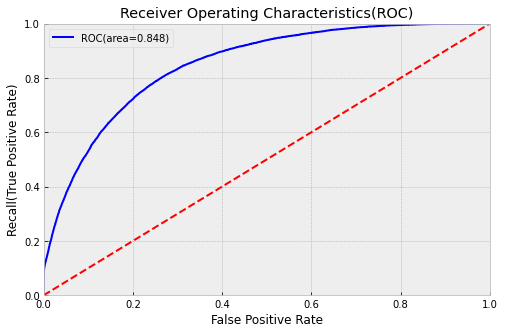

AUC for CatBoost Classifier model after undersampling with more estimators: 0.8475434295669586


In [137]:
#ROC_AUC curve
plt.figure(figsize=(8,5))
false_positive_rate,recall,thresholds=roc_curve(y_uvalid,cb_pred111);
cbroc_auc111=auc(false_positive_rate,recall);
plt.title('Receiver Operating Characteristics(ROC)');
plt.plot(false_positive_rate,recall,'b',label='ROC(area=%0.3f)' %cbroc_auc111);
plt.legend();
plt.plot([0,1],[0,1],'r--');
plt.xlim([0.0,1.0]);
plt.ylim([0.0,1.0]);
plt.ylabel('Recall(True Positive Rate)');
plt.xlabel('False Positive Rate');
plt.show();
print('AUC for CatBoost Classifier model after undersampling with more estimators:',cbroc_auc111);

#### 8. Stacking Classifier

In [131]:
etm= ExtraTreesClassifier(n_jobs=-1,class_weight='balanced',verbose=10,random_state=24,n_estimators=500,max_depth=15)
xgbm=XGBClassifier(base_score=0.5, booster='gbtree',
              colsample_bylevel=0.5071007205631392, colsample_bynode=1,
              colsample_bytree=0.8045786178371542, gamma=0, gpu_id=-1,
              grow_policy='lossguide', importance_type='gain',learning_rate=0.05314706358351784,
              max_delta_step=0, max_depth=0, max_leaves=116,
              min_child_weight=0.9465489964994623, n_estimators=50, n_jobs=-1,
              num_parallel_tree=1, random_state=0, reg_alpha=0.0009765625,
              reg_lambda=21.848631828230985, scale_pos_weight=1,
              subsample=0.8656429673380149, tree_method='hist',
              validate_parameters=1, verbosity=0,class_weight=[0.7,7])
gbm=GradientBoostingClassifier(random_state=25,n_estimators=500,max_depth=5)
dtm=DecisionTreeClassifier(random_state=0,max_depth=5)
lm=LogisticRegression(random_state=10)
lgbm=lgb.LGBMClassifier(n_estimators=5000,learning_rate=0.07,random_state=25,class_weight='balanced')
rfm=RandomForestClassifier(n_estimators=500,random_state=42)
stack_model = StackingClassifier(classifiers=[gbm,etm,dtm,lm,rfm,lgbm], meta_classifier=xgbm,verbose=8)

In [132]:
stack_model.fit(x_smote1,y_smote1)

Fitting 6 classifiers...
Fitting classifier1: gradientboostingclassifier (1/6)
GradientBoostingClassifier(max_depth=5, n_estimators=500, random_state=25,
                           verbose=6)
      Iter       Train Loss   Remaining Time 
         1           1.3438           14.89m
         2           1.3077           15.21m
         3           1.2789           14.14m
         4           1.2541           13.32m
         5           1.2331           12.97m
         6           1.2147           12.66m
         7           1.1991           13.00m
         8           1.1840           13.51m
         9           1.1717           13.45m
        10           1.1610           13.61m
        11           1.1452           13.83m
        12           1.1365           13.94m
        13           1.1289           14.14m
        14           1.1197           14.30m
        15           1.1137           14.41m
        16           1.1087           14.52m
        17           1.1015           14.6

       178           0.7546           10.74m
       179           0.7540           10.71m
       180           0.7528           10.67m
       181           0.7522           10.63m
       182           0.7517           10.59m
       183           0.7497           10.55m
       184           0.7488           10.51m
       185           0.7487           10.47m
       186           0.7480           10.43m
       187           0.7464           10.39m
       188           0.7452           10.34m
       189           0.7451           10.29m
       190           0.7440           10.24m
       191           0.7431           10.18m
       192           0.7425           10.14m
       193           0.7408           10.11m
       194           0.7399           10.07m
       195           0.7389           10.03m
       196           0.7385           10.00m
       197           0.7372            9.96m
       198           0.7355            9.94m
       199           0.7351            9.90m
       200

       361           0.6472            4.50m
       362           0.6467            4.47m
       363           0.6461            4.44m
       364           0.6459            4.41m
       365           0.6454            4.37m
       366           0.6451            4.34m
       367           0.6448            4.31m
       368           0.6446            4.27m
       369           0.6441            4.24m
       370           0.6438            4.21m
       371           0.6436            4.17m
       372           0.6430            4.14m
       373           0.6427            4.11m
       374           0.6426            4.08m
       375           0.6425            4.04m
       376           0.6421            4.01m
       377           0.6418            3.98m
       378           0.6414            3.94m
       379           0.6413            3.91m
       380           0.6411            3.88m
       381           0.6407            3.85m
       382           0.6403            3.81m
       383

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


building tree 1 of 500building tree 2 of 500building tree 3 of 500


building tree 4 of 500building tree 5 of 500

building tree 6 of 500
building tree 7 of 500
building tree 8 of 500
building tree 9 of 500
building tree 10 of 500
building tree 11 of 500
building tree 12 of 500
building tree 13 of 500
building tree 14 of 500
building tree 15 of 500building tree 16 of 500

building tree 17 of 500
building tree 18 of 500
building tree 19 of 500
building tree 20 of 500
building tree 21 of 500
building tree 22 of 500
building tree 23 of 500
building tree 24 of 500
building tree 25 of 500
building tree 26 of 500
building tree 27 of 500
building tree 28 of 500
building tree 29 of 500
building tree 30 of 500
building tree 31 of 500
building tree 32 of 500
building tree 33 of 500
building tree 34 of 500
building tree 35 of 500
building tree 36 of 500
building tree 37 of 500
building tree 38 of 500
building tree 39 of 500
building tree 40 of 500
building tree 41 of 500
building tree 42 of 500
b

[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:    6.4s


building tree 44 of 500
building tree 45 of 500
building tree 46 of 500
building tree 47 of 500
building tree 48 of 500
building tree 49 of 500
building tree 50 of 500
building tree 51 of 500
building tree 52 of 500
building tree 53 of 500
building tree 54 of 500
building tree 55 of 500
building tree 56 of 500
building tree 57 of 500
building tree 58 of 500
building tree 59 of 500
building tree 60 of 500
building tree 61 of 500
building tree 62 of 500
building tree 63 of 500
building tree 64 of 500
building tree 65 of 500building tree 66 of 500

building tree 67 of 500
building tree 68 of 500
building tree 69 of 500
building tree 70 of 500
building tree 71 of 500
building tree 72 of 500
building tree 73 of 500
building tree 74 of 500
building tree 75 of 500
building tree 76 of 500
building tree 77 of 500
building tree 78 of 500
building tree 79 of 500building tree 80 of 500

building tree 81 of 500
building tree 82 of 500
building tree 83 of 500
building tree 84 of 500
building tree 85

[Parallel(n_jobs=-1)]: Done  97 tasks      | elapsed:   17.2s


building tree 107 of 500
building tree 108 of 500
building tree 109 of 500
building tree 110 of 500
building tree 111 of 500
building tree 112 of 500
building tree 113 of 500
building tree 114 of 500
building tree 115 of 500
building tree 116 of 500
building tree 117 of 500
building tree 118 of 500
building tree 119 of 500
building tree 120 of 500
building tree 121 of 500
building tree 122 of 500
building tree 123 of 500
building tree 124 of 500
building tree 125 of 500
building tree 126 of 500
building tree 127 of 500
building tree 128 of 500
building tree 129 of 500
building tree 130 of 500
building tree 131 of 500
building tree 132 of 500
building tree 133 of 500
building tree 134 of 500
building tree 135 of 500
building tree 136 of 500
building tree 137 of 500
building tree 138 of 500
building tree 139 of 500
building tree 140 of 500
building tree 141 of 500
building tree 142 of 500
building tree 143 of 500
building tree 144 of 500
building tree 145 of 500
building tree 146 of 500


[Parallel(n_jobs=-1)]: Done 184 tasks      | elapsed:   32.9s


building tree 196 of 500
building tree 197 of 500
building tree 198 of 500
building tree 199 of 500
building tree 200 of 500
building tree 201 of 500
building tree 202 of 500
building tree 203 of 500
building tree 204 of 500
building tree 205 of 500
building tree 206 of 500
building tree 207 of 500
building tree 208 of 500
building tree 209 of 500
building tree 210 of 500
building tree 211 of 500
building tree 212 of 500
building tree 213 of 500
building tree 214 of 500
building tree 215 of 500
building tree 216 of 500
building tree 217 of 500
building tree 218 of 500
building tree 219 of 500
building tree 220 of 500
building tree 221 of 500
building tree 222 of 500
building tree 223 of 500
building tree 224 of 500
building tree 225 of 500
building tree 226 of 500
building tree 227 of 500
building tree 228 of 500
building tree 229 of 500
building tree 230 of 500
building tree 231 of 500
building tree 232 of 500
building tree 233 of 500
building tree 234 of 500
building tree 235 of 500


[Parallel(n_jobs=-1)]: Done 297 tasks      | elapsed:   54.3s



building tree 309 of 500
building tree 310 of 500
building tree 311 of 500building tree 312 of 500building tree 313 of 500


building tree 314 of 500
building tree 315 of 500
building tree 316 of 500
building tree 317 of 500
building tree 318 of 500
building tree 319 of 500
building tree 320 of 500
building tree 321 of 500
building tree 322 of 500
building tree 323 of 500
building tree 324 of 500
building tree 325 of 500
building tree 326 of 500
building tree 327 of 500
building tree 328 of 500
building tree 329 of 500
building tree 330 of 500
building tree 331 of 500
building tree 332 of 500
building tree 333 of 500
building tree 334 of 500
building tree 335 of 500
building tree 336 of 500
building tree 337 of 500
building tree 338 of 500
building tree 339 of 500
building tree 340 of 500
building tree 341 of 500
building tree 342 of 500
building tree 343 of 500
building tree 344 of 500
building tree 345 of 500
building tree 346 of 500
building tree 347 of 500
building tree 348 of 500

[Parallel(n_jobs=-1)]: Done 434 tasks      | elapsed:  1.4min


building tree 443 of 500
building tree 444 of 500
building tree 445 of 500
building tree 446 of 500
building tree 447 of 500
building tree 448 of 500
building tree 449 of 500
building tree 450 of 500
building tree 451 of 500
building tree 452 of 500
building tree 453 of 500
building tree 454 of 500
building tree 455 of 500
building tree 456 of 500
building tree 457 of 500
building tree 458 of 500
building tree 459 of 500
building tree 460 of 500
building tree 461 of 500
building tree 462 of 500
building tree 463 of 500
building tree 464 of 500
building tree 465 of 500
building tree 466 of 500
building tree 467 of 500
building tree 468 of 500
building tree 469 of 500
building tree 470 of 500
building tree 471 of 500
building tree 472 of 500
building tree 473 of 500
building tree 474 of 500
building tree 475 of 500
building tree 476 of 500
building tree 477 of 500
building tree 478 of 500
building tree 479 of 500
building tree 480 of 500
building tree 481 of 500
building tree 482 of 500


[Parallel(n_jobs=-1)]: Done 500 out of 500 | elapsed:  1.6min finished


Fitting classifier3: decisiontreeclassifier (3/6)
DecisionTreeClassifier(max_depth=5, random_state=0)
Fitting classifier4: logisticregression (4/6)
LogisticRegression(random_state=10, verbose=6)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    2.7s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    2.7s finished


Fitting classifier5: randomforestclassifier (5/6)
RandomForestClassifier(n_estimators=500, random_state=42, verbose=6)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


building tree 1 of 500


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.5s remaining:    0.0s


building tree 2 of 500


[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    3.2s remaining:    0.0s


building tree 3 of 500


[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    4.8s remaining:    0.0s


building tree 4 of 500


[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    6.1s remaining:    0.0s


building tree 5 of 500


[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    7.5s remaining:    0.0s


building tree 6 of 500
building tree 7 of 500
building tree 8 of 500
building tree 9 of 500
building tree 10 of 500
building tree 11 of 500
building tree 12 of 500
building tree 13 of 500
building tree 14 of 500
building tree 15 of 500
building tree 16 of 500
building tree 17 of 500
building tree 18 of 500
building tree 19 of 500
building tree 20 of 500
building tree 21 of 500
building tree 22 of 500
building tree 23 of 500
building tree 24 of 500
building tree 25 of 500
building tree 26 of 500
building tree 27 of 500
building tree 28 of 500
building tree 29 of 500
building tree 30 of 500
building tree 31 of 500
building tree 32 of 500
building tree 33 of 500
building tree 34 of 500
building tree 35 of 500
building tree 36 of 500
building tree 37 of 500
building tree 38 of 500
building tree 39 of 500
building tree 40 of 500
building tree 41 of 500
building tree 42 of 500
building tree 43 of 500
building tree 44 of 500
building tree 45 of 500
building tree 46 of 500
building tree 47 of 

building tree 338 of 500
building tree 339 of 500
building tree 340 of 500
building tree 341 of 500
building tree 342 of 500
building tree 343 of 500
building tree 344 of 500
building tree 345 of 500
building tree 346 of 500
building tree 347 of 500
building tree 348 of 500
building tree 349 of 500
building tree 350 of 500
building tree 351 of 500
building tree 352 of 500
building tree 353 of 500
building tree 354 of 500
building tree 355 of 500
building tree 356 of 500
building tree 357 of 500
building tree 358 of 500
building tree 359 of 500
building tree 360 of 500
building tree 361 of 500
building tree 362 of 500
building tree 363 of 500
building tree 364 of 500
building tree 365 of 500
building tree 366 of 500
building tree 367 of 500
building tree 368 of 500
building tree 369 of 500
building tree 370 of 500
building tree 371 of 500
building tree 372 of 500
building tree 373 of 500
building tree 374 of 500
building tree 375 of 500
building tree 376 of 500
building tree 377 of 500


[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed: 12.8min finished


Fitting classifier6: lgbmclassifier (6/6)
LGBMClassifier(class_weight='balanced', learning_rate=0.07, n_estimators=5000,
               random_state=25)


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.5s
[Parallel(n_jobs=8)]: Done  97 tasks      | elapsed:    1.6s
[Parallel(n_jobs=8)]: Done 184 tasks      | elapsed:    3.5s
[Parallel(n_jobs=8)]: Done 297 tasks      | elapsed:    5.6s
[Parallel(n_jobs=8)]: Done 434 tasks      | elapsed:    8.1s
[Parallel(n_jobs=8)]: Done 500 out of 500 | elapsed:    9.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.4s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.6s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.8s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    1.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:  1.3min fin

StackingClassifier(classifiers=[GradientBoostingClassifier(max_depth=5,
                                                           n_estimators=500,
                                                           random_state=25),
                                ExtraTreesClassifier(class_weight='balanced',
                                                     max_depth=15,
                                                     n_estimators=500,
                                                     n_jobs=-1, random_state=24,
                                                     verbose=10),
                                DecisionTreeClassifier(max_depth=5,
                                                       random_state=0),
                                LogisticRegression(random_state=10),
                                RandomForestClassifier(n_estimators=500,
                                                       rando...
                                                 learning_rate=0.

In [133]:
stack_pred=stack_model.predict_proba(x_valid1)[:,1]
stack_pred1=stack_model.predict(x_valid1)
ic(stack_pred);

[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done  97 tasks      | elapsed:    0.2s
[Parallel(n_jobs=8)]: Done 184 tasks      | elapsed:    0.5s
[Parallel(n_jobs=8)]: Done 297 tasks      | elapsed:    1.0s
[Parallel(n_jobs=8)]: Done 434 tasks      | elapsed:    1.6s
[Parallel(n_jobs=8)]: Done 500 out of 500 | elapsed:    1.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:   14.6s fin

In [134]:
#ROC_AUC SCORE:-
stack_roc_score=roc_auc_score(y_valid1,stack_pred)
print('Stacking Classifier ROC score:',stack_roc_score)

Stacking Classifier ROC score: 0.7605012477980415


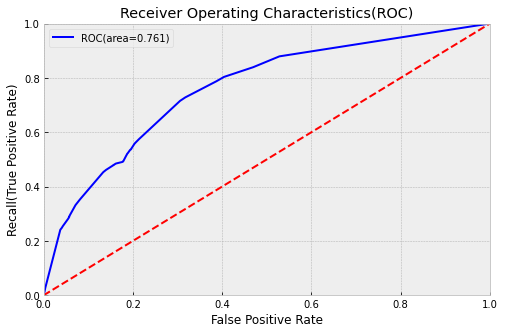

AUC for Stacking Classifier model: 0.7605012477980415


In [135]:
#ROC_AUC curve
plt.figure(figsize=(8,5))
false_positive_rate,recall,thresholds=roc_curve(y_valid1,stack_pred);
stackroc_auc=auc(false_positive_rate,recall);
plt.title('Receiver Operating Characteristics(ROC)');
plt.plot(false_positive_rate,recall,'b',label='ROC(area=%0.3f)' %stackroc_auc);
plt.legend();
plt.plot([0,1],[0,1],'r--');
plt.xlim([0.0,1.0]);
plt.ylim([0.0,1.0]);
plt.ylabel('Recall(True Positive Rate)');
plt.xlabel('False Positive Rate');
plt.show();
print('AUC for Stacking Classifier model:',stackroc_auc);

#### 9. Light GBM

In [138]:
lgbm_model=lgb.LGBMClassifier(n_estimators=50000,learning_rate=0.01,class_weight='balanced',num_leaves=10,objective='binary', reg_alpha=0.0047716786891402385,
               reg_lambda=0.07938232508337628,colsample_bytree=0.7518306156586891)
lgbm_model.fit(x_smote3,y_smote3,eval_set=(x_valid3,y_valid3),early_stopping_rounds=500,verbose=10,categorical_feature=cat_features_index)

Training until validation scores don't improve for 500 rounds
[10]	valid_0's binary_logloss: 0.675804
[20]	valid_0's binary_logloss: 0.661259
[30]	valid_0's binary_logloss: 0.648459
[40]	valid_0's binary_logloss: 0.637404
[50]	valid_0's binary_logloss: 0.628366
[60]	valid_0's binary_logloss: 0.620115
[70]	valid_0's binary_logloss: 0.613096
[80]	valid_0's binary_logloss: 0.607024
[90]	valid_0's binary_logloss: 0.601683
[100]	valid_0's binary_logloss: 0.596708
[110]	valid_0's binary_logloss: 0.59235
[120]	valid_0's binary_logloss: 0.588288
[130]	valid_0's binary_logloss: 0.584708
[140]	valid_0's binary_logloss: 0.581449
[150]	valid_0's binary_logloss: 0.578421
[160]	valid_0's binary_logloss: 0.575683
[170]	valid_0's binary_logloss: 0.573219
[180]	valid_0's binary_logloss: 0.570815
[190]	valid_0's binary_logloss: 0.568576
[200]	valid_0's binary_logloss: 0.566499
[210]	valid_0's binary_logloss: 0.564662
[220]	valid_0's binary_logloss: 0.562944
[230]	valid_0's binary_logloss: 0.561076
[240]

[1990]	valid_0's binary_logloss: 0.469571
[2000]	valid_0's binary_logloss: 0.469426
[2010]	valid_0's binary_logloss: 0.469167
[2020]	valid_0's binary_logloss: 0.46896
[2030]	valid_0's binary_logloss: 0.468766
[2040]	valid_0's binary_logloss: 0.468626
[2050]	valid_0's binary_logloss: 0.468463
[2060]	valid_0's binary_logloss: 0.468301
[2070]	valid_0's binary_logloss: 0.468148
[2080]	valid_0's binary_logloss: 0.467978
[2090]	valid_0's binary_logloss: 0.467786
[2100]	valid_0's binary_logloss: 0.467637
[2110]	valid_0's binary_logloss: 0.467458
[2120]	valid_0's binary_logloss: 0.467296
[2130]	valid_0's binary_logloss: 0.467146
[2140]	valid_0's binary_logloss: 0.467007
[2150]	valid_0's binary_logloss: 0.466835
[2160]	valid_0's binary_logloss: 0.466692
[2170]	valid_0's binary_logloss: 0.466513
[2180]	valid_0's binary_logloss: 0.466326
[2190]	valid_0's binary_logloss: 0.466175
[2200]	valid_0's binary_logloss: 0.466081
[2210]	valid_0's binary_logloss: 0.465923
[2220]	valid_0's binary_logloss: 0.

[3950]	valid_0's binary_logloss: 0.450789
[3960]	valid_0's binary_logloss: 0.450736
[3970]	valid_0's binary_logloss: 0.450697
[3980]	valid_0's binary_logloss: 0.450672
[3990]	valid_0's binary_logloss: 0.450636
[4000]	valid_0's binary_logloss: 0.450599
[4010]	valid_0's binary_logloss: 0.450547
[4020]	valid_0's binary_logloss: 0.450503
[4030]	valid_0's binary_logloss: 0.450462
[4040]	valid_0's binary_logloss: 0.45043
[4050]	valid_0's binary_logloss: 0.450388
[4060]	valid_0's binary_logloss: 0.450336
[4070]	valid_0's binary_logloss: 0.450296
[4080]	valid_0's binary_logloss: 0.450233
[4090]	valid_0's binary_logloss: 0.450208
[4100]	valid_0's binary_logloss: 0.45017
[4110]	valid_0's binary_logloss: 0.450136
[4120]	valid_0's binary_logloss: 0.450081
[4130]	valid_0's binary_logloss: 0.450051
[4140]	valid_0's binary_logloss: 0.450007
[4150]	valid_0's binary_logloss: 0.449969
[4160]	valid_0's binary_logloss: 0.449929
[4170]	valid_0's binary_logloss: 0.449879
[4180]	valid_0's binary_logloss: 0.4

[5920]	valid_0's binary_logloss: 0.445292
[5930]	valid_0's binary_logloss: 0.445276
[5940]	valid_0's binary_logloss: 0.445263
[5950]	valid_0's binary_logloss: 0.445249
[5960]	valid_0's binary_logloss: 0.445243
[5970]	valid_0's binary_logloss: 0.445229
[5980]	valid_0's binary_logloss: 0.445212
[5990]	valid_0's binary_logloss: 0.445195
[6000]	valid_0's binary_logloss: 0.445179
[6010]	valid_0's binary_logloss: 0.445161
[6020]	valid_0's binary_logloss: 0.445147
[6030]	valid_0's binary_logloss: 0.445134
[6040]	valid_0's binary_logloss: 0.445119
[6050]	valid_0's binary_logloss: 0.445106
[6060]	valid_0's binary_logloss: 0.445085
[6070]	valid_0's binary_logloss: 0.445065
[6080]	valid_0's binary_logloss: 0.445049
[6090]	valid_0's binary_logloss: 0.445045
[6100]	valid_0's binary_logloss: 0.445028
[6110]	valid_0's binary_logloss: 0.445007
[6120]	valid_0's binary_logloss: 0.444993
[6130]	valid_0's binary_logloss: 0.444976
[6140]	valid_0's binary_logloss: 0.444964
[6150]	valid_0's binary_logloss: 0

[7880]	valid_0's binary_logloss: 0.443238
[7890]	valid_0's binary_logloss: 0.443227
[7900]	valid_0's binary_logloss: 0.443223
[7910]	valid_0's binary_logloss: 0.443216
[7920]	valid_0's binary_logloss: 0.443205
[7930]	valid_0's binary_logloss: 0.443194
[7940]	valid_0's binary_logloss: 0.443188
[7950]	valid_0's binary_logloss: 0.443183
[7960]	valid_0's binary_logloss: 0.443178
[7970]	valid_0's binary_logloss: 0.443173
[7980]	valid_0's binary_logloss: 0.443167
[7990]	valid_0's binary_logloss: 0.443161
[8000]	valid_0's binary_logloss: 0.443155
[8010]	valid_0's binary_logloss: 0.44315
[8020]	valid_0's binary_logloss: 0.443148
[8030]	valid_0's binary_logloss: 0.443141
[8040]	valid_0's binary_logloss: 0.443137
[8050]	valid_0's binary_logloss: 0.443134
[8060]	valid_0's binary_logloss: 0.443128
[8070]	valid_0's binary_logloss: 0.443122
[8080]	valid_0's binary_logloss: 0.443115
[8090]	valid_0's binary_logloss: 0.443112
[8100]	valid_0's binary_logloss: 0.443103
[8110]	valid_0's binary_logloss: 0.

[9840]	valid_0's binary_logloss: 0.442314
[9850]	valid_0's binary_logloss: 0.442304
[9860]	valid_0's binary_logloss: 0.442302
[9870]	valid_0's binary_logloss: 0.442299
[9880]	valid_0's binary_logloss: 0.442295
[9890]	valid_0's binary_logloss: 0.44229
[9900]	valid_0's binary_logloss: 0.442284
[9910]	valid_0's binary_logloss: 0.442283
[9920]	valid_0's binary_logloss: 0.442278
[9930]	valid_0's binary_logloss: 0.442273
[9940]	valid_0's binary_logloss: 0.442268
[9950]	valid_0's binary_logloss: 0.442263
[9960]	valid_0's binary_logloss: 0.442267
[9970]	valid_0's binary_logloss: 0.442265
[9980]	valid_0's binary_logloss: 0.442262
[9990]	valid_0's binary_logloss: 0.442258
[10000]	valid_0's binary_logloss: 0.442255
[10010]	valid_0's binary_logloss: 0.442253
[10020]	valid_0's binary_logloss: 0.442254
[10030]	valid_0's binary_logloss: 0.442255
[10040]	valid_0's binary_logloss: 0.442253
[10050]	valid_0's binary_logloss: 0.44225
[10060]	valid_0's binary_logloss: 0.44225
[10070]	valid_0's binary_loglo

[11760]	valid_0's binary_logloss: 0.441957
[11770]	valid_0's binary_logloss: 0.441958
[11780]	valid_0's binary_logloss: 0.441954
[11790]	valid_0's binary_logloss: 0.44195
[11800]	valid_0's binary_logloss: 0.441948
[11810]	valid_0's binary_logloss: 0.441949
[11820]	valid_0's binary_logloss: 0.44195
[11830]	valid_0's binary_logloss: 0.441947
[11840]	valid_0's binary_logloss: 0.441947
[11850]	valid_0's binary_logloss: 0.441948
[11860]	valid_0's binary_logloss: 0.441949
[11870]	valid_0's binary_logloss: 0.44195
[11880]	valid_0's binary_logloss: 0.441949
[11890]	valid_0's binary_logloss: 0.441951
[11900]	valid_0's binary_logloss: 0.441947
[11910]	valid_0's binary_logloss: 0.441944
[11920]	valid_0's binary_logloss: 0.441942
[11930]	valid_0's binary_logloss: 0.441944
[11940]	valid_0's binary_logloss: 0.441943
[11950]	valid_0's binary_logloss: 0.441945
[11960]	valid_0's binary_logloss: 0.441945
[11970]	valid_0's binary_logloss: 0.441947
[11980]	valid_0's binary_logloss: 0.441946
[11990]	valid_

[13680]	valid_0's binary_logloss: 0.441816
[13690]	valid_0's binary_logloss: 0.44182
[13700]	valid_0's binary_logloss: 0.44182
[13710]	valid_0's binary_logloss: 0.441815
[13720]	valid_0's binary_logloss: 0.441814
[13730]	valid_0's binary_logloss: 0.441819
[13740]	valid_0's binary_logloss: 0.441822
[13750]	valid_0's binary_logloss: 0.441823
[13760]	valid_0's binary_logloss: 0.441823
[13770]	valid_0's binary_logloss: 0.441822
[13780]	valid_0's binary_logloss: 0.441825
[13790]	valid_0's binary_logloss: 0.441824
[13800]	valid_0's binary_logloss: 0.441824
[13810]	valid_0's binary_logloss: 0.441829
[13820]	valid_0's binary_logloss: 0.441829
[13830]	valid_0's binary_logloss: 0.44183
[13840]	valid_0's binary_logloss: 0.441832
[13850]	valid_0's binary_logloss: 0.441829
[13860]	valid_0's binary_logloss: 0.441828
[13870]	valid_0's binary_logloss: 0.441825
[13880]	valid_0's binary_logloss: 0.441822
[13890]	valid_0's binary_logloss: 0.44182
[13900]	valid_0's binary_logloss: 0.441819
[13910]	valid_0

LGBMClassifier(class_weight='balanced', colsample_bytree=0.7518306156586891,
               learning_rate=0.01, n_estimators=50000, num_leaves=10,
               objective='binary', reg_alpha=0.0047716786891402385,
               reg_lambda=0.07938232508337628)

In [139]:
lgbm_pred=lgbm_model.predict_proba(x_valid3)[:,1]
ic(lgbm_pred);

ic| lgbm_pred: array([0.13380632, 0.09488175, 0.25318112, ..., 0.43625508, 0.06443566,
                      0.11638439])


In [140]:
#ROC_AUC SCORE:-
lgbm_roc_score=roc_auc_score(y_valid3,lgbm_pred)
print('Light GBM Classifier ROC score:',lgbm_roc_score)

Light GBM Classifier ROC score: 0.7864872529058774


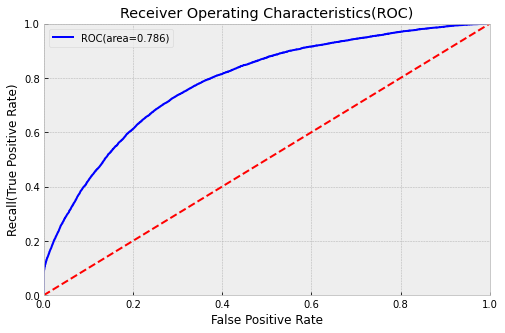

AUC for Light GBM Classifier model: 0.7864872529058774


In [141]:
#ROC_AUC curve
plt.figure(figsize=(8,5))
false_positive_rate,recall,thresholds=roc_curve(y_valid3,lgbm_pred);
lgbmroc_auc=auc(false_positive_rate,recall);
plt.title('Receiver Operating Characteristics(ROC)');
plt.plot(false_positive_rate,recall,'b',label='ROC(area=%0.3f)' %lgbmroc_auc);
plt.legend();
plt.plot([0,1],[0,1],'r--');
plt.xlim([0.0,1.0]);
plt.ylim([0.0,1.0]);
plt.ylabel('Recall(True Positive Rate)');
plt.xlabel('False Positive Rate');
plt.show();
print('AUC for Light GBM Classifier model:',lgbmroc_auc);

In [153]:
lgbm_model1=lgb.LGBMClassifier(n_estimators=50000,learning_rate=0.01,class_weight='balanced',num_leaves=10,objective='binary', reg_alpha=0.0047716786891402385,
               reg_lambda=0.07938232508337628,colsample_bytree=0.7518306156586891)
lgbm_model1.fit(x_smote1,y_smote1,eval_set=(x_valid1,y_valid1),early_stopping_rounds=500,verbose=10,)

Training until validation scores don't improve for 500 rounds
[10]	valid_0's binary_logloss: 0.676712
[20]	valid_0's binary_logloss: 0.662466
[30]	valid_0's binary_logloss: 0.64998
[40]	valid_0's binary_logloss: 0.63934
[50]	valid_0's binary_logloss: 0.630283
[60]	valid_0's binary_logloss: 0.62247
[70]	valid_0's binary_logloss: 0.615313
[80]	valid_0's binary_logloss: 0.609496
[90]	valid_0's binary_logloss: 0.604265
[100]	valid_0's binary_logloss: 0.599282
[110]	valid_0's binary_logloss: 0.595031
[120]	valid_0's binary_logloss: 0.591027
[130]	valid_0's binary_logloss: 0.587389
[140]	valid_0's binary_logloss: 0.584185
[150]	valid_0's binary_logloss: 0.581268
[160]	valid_0's binary_logloss: 0.578668
[170]	valid_0's binary_logloss: 0.576088
[180]	valid_0's binary_logloss: 0.573738
[190]	valid_0's binary_logloss: 0.571704
[200]	valid_0's binary_logloss: 0.569674
[210]	valid_0's binary_logloss: 0.567783
[220]	valid_0's binary_logloss: 0.56612
[230]	valid_0's binary_logloss: 0.564584
[240]	va

[1980]	valid_0's binary_logloss: 0.473511
[1990]	valid_0's binary_logloss: 0.473269
[2000]	valid_0's binary_logloss: 0.473058
[2010]	valid_0's binary_logloss: 0.472895
[2020]	valid_0's binary_logloss: 0.472689
[2030]	valid_0's binary_logloss: 0.472554
[2040]	valid_0's binary_logloss: 0.47239
[2050]	valid_0's binary_logloss: 0.472201
[2060]	valid_0's binary_logloss: 0.471984
[2070]	valid_0's binary_logloss: 0.471828
[2080]	valid_0's binary_logloss: 0.471585
[2090]	valid_0's binary_logloss: 0.471458
[2100]	valid_0's binary_logloss: 0.47124
[2110]	valid_0's binary_logloss: 0.471125
[2120]	valid_0's binary_logloss: 0.471012
[2130]	valid_0's binary_logloss: 0.470823
[2140]	valid_0's binary_logloss: 0.470672
[2150]	valid_0's binary_logloss: 0.470492
[2160]	valid_0's binary_logloss: 0.470387
[2170]	valid_0's binary_logloss: 0.470155
[2180]	valid_0's binary_logloss: 0.470013
[2190]	valid_0's binary_logloss: 0.469863
[2200]	valid_0's binary_logloss: 0.469691
[2210]	valid_0's binary_logloss: 0.4

[3950]	valid_0's binary_logloss: 0.453709
[3960]	valid_0's binary_logloss: 0.453678
[3970]	valid_0's binary_logloss: 0.453656
[3980]	valid_0's binary_logloss: 0.453597
[3990]	valid_0's binary_logloss: 0.45354
[4000]	valid_0's binary_logloss: 0.453493
[4010]	valid_0's binary_logloss: 0.453469
[4020]	valid_0's binary_logloss: 0.453438
[4030]	valid_0's binary_logloss: 0.453386
[4040]	valid_0's binary_logloss: 0.453327
[4050]	valid_0's binary_logloss: 0.453305
[4060]	valid_0's binary_logloss: 0.453279
[4070]	valid_0's binary_logloss: 0.453231
[4080]	valid_0's binary_logloss: 0.453199
[4090]	valid_0's binary_logloss: 0.453152
[4100]	valid_0's binary_logloss: 0.453107
[4110]	valid_0's binary_logloss: 0.453084
[4120]	valid_0's binary_logloss: 0.453052
[4130]	valid_0's binary_logloss: 0.452995
[4140]	valid_0's binary_logloss: 0.452955
[4150]	valid_0's binary_logloss: 0.452896
[4160]	valid_0's binary_logloss: 0.452845
[4170]	valid_0's binary_logloss: 0.452805
[4180]	valid_0's binary_logloss: 0.

[5910]	valid_0's binary_logloss: 0.447135
[5920]	valid_0's binary_logloss: 0.447111
[5930]	valid_0's binary_logloss: 0.447094
[5940]	valid_0's binary_logloss: 0.447071
[5950]	valid_0's binary_logloss: 0.447056
[5960]	valid_0's binary_logloss: 0.447045
[5970]	valid_0's binary_logloss: 0.44702
[5980]	valid_0's binary_logloss: 0.446994
[5990]	valid_0's binary_logloss: 0.446967
[6000]	valid_0's binary_logloss: 0.446937
[6010]	valid_0's binary_logloss: 0.446923
[6020]	valid_0's binary_logloss: 0.446907
[6030]	valid_0's binary_logloss: 0.446895
[6040]	valid_0's binary_logloss: 0.446882
[6050]	valid_0's binary_logloss: 0.446869
[6060]	valid_0's binary_logloss: 0.446851
[6070]	valid_0's binary_logloss: 0.446822
[6080]	valid_0's binary_logloss: 0.446801
[6090]	valid_0's binary_logloss: 0.446777
[6100]	valid_0's binary_logloss: 0.446753
[6110]	valid_0's binary_logloss: 0.446742
[6120]	valid_0's binary_logloss: 0.446732
[6130]	valid_0's binary_logloss: 0.446721
[6140]	valid_0's binary_logloss: 0.

[7870]	valid_0's binary_logloss: 0.444499
[7880]	valid_0's binary_logloss: 0.444491
[7890]	valid_0's binary_logloss: 0.444482
[7900]	valid_0's binary_logloss: 0.44447
[7910]	valid_0's binary_logloss: 0.444464
[7920]	valid_0's binary_logloss: 0.444453
[7930]	valid_0's binary_logloss: 0.444433
[7940]	valid_0's binary_logloss: 0.444427
[7950]	valid_0's binary_logloss: 0.444419
[7960]	valid_0's binary_logloss: 0.444415
[7970]	valid_0's binary_logloss: 0.444404
[7980]	valid_0's binary_logloss: 0.444401
[7990]	valid_0's binary_logloss: 0.44439
[8000]	valid_0's binary_logloss: 0.444382
[8010]	valid_0's binary_logloss: 0.444368
[8020]	valid_0's binary_logloss: 0.444362
[8030]	valid_0's binary_logloss: 0.444356
[8040]	valid_0's binary_logloss: 0.444348
[8050]	valid_0's binary_logloss: 0.444336
[8060]	valid_0's binary_logloss: 0.444324
[8070]	valid_0's binary_logloss: 0.444314
[8080]	valid_0's binary_logloss: 0.444309
[8090]	valid_0's binary_logloss: 0.444298
[8100]	valid_0's binary_logloss: 0.4

[9840]	valid_0's binary_logloss: 0.443044
[9850]	valid_0's binary_logloss: 0.443041
[9860]	valid_0's binary_logloss: 0.443037
[9870]	valid_0's binary_logloss: 0.443034
[9880]	valid_0's binary_logloss: 0.44303
[9890]	valid_0's binary_logloss: 0.443022
[9900]	valid_0's binary_logloss: 0.443017
[9910]	valid_0's binary_logloss: 0.443012
[9920]	valid_0's binary_logloss: 0.443007
[9930]	valid_0's binary_logloss: 0.443002
[9940]	valid_0's binary_logloss: 0.442998
[9950]	valid_0's binary_logloss: 0.442995
[9960]	valid_0's binary_logloss: 0.442992
[9970]	valid_0's binary_logloss: 0.442981
[9980]	valid_0's binary_logloss: 0.442978
[9990]	valid_0's binary_logloss: 0.44297
[10000]	valid_0's binary_logloss: 0.442968
[10010]	valid_0's binary_logloss: 0.442957
[10020]	valid_0's binary_logloss: 0.442951
[10030]	valid_0's binary_logloss: 0.442946
[10040]	valid_0's binary_logloss: 0.442942
[10050]	valid_0's binary_logloss: 0.442938
[10060]	valid_0's binary_logloss: 0.442935
[10070]	valid_0's binary_logl

[11770]	valid_0's binary_logloss: 0.442283
[11780]	valid_0's binary_logloss: 0.442279
[11790]	valid_0's binary_logloss: 0.44228
[11800]	valid_0's binary_logloss: 0.442276
[11810]	valid_0's binary_logloss: 0.442268
[11820]	valid_0's binary_logloss: 0.442265
[11830]	valid_0's binary_logloss: 0.44226
[11840]	valid_0's binary_logloss: 0.442258
[11850]	valid_0's binary_logloss: 0.442249
[11860]	valid_0's binary_logloss: 0.442242
[11870]	valid_0's binary_logloss: 0.442242
[11880]	valid_0's binary_logloss: 0.442235
[11890]	valid_0's binary_logloss: 0.442229
[11900]	valid_0's binary_logloss: 0.442223
[11910]	valid_0's binary_logloss: 0.442223
[11920]	valid_0's binary_logloss: 0.442223
[11930]	valid_0's binary_logloss: 0.442221
[11940]	valid_0's binary_logloss: 0.442218
[11950]	valid_0's binary_logloss: 0.442215
[11960]	valid_0's binary_logloss: 0.442215
[11970]	valid_0's binary_logloss: 0.442209
[11980]	valid_0's binary_logloss: 0.442209
[11990]	valid_0's binary_logloss: 0.442209
[12000]	valid

[13690]	valid_0's binary_logloss: 0.44179
[13700]	valid_0's binary_logloss: 0.441789
[13710]	valid_0's binary_logloss: 0.44179
[13720]	valid_0's binary_logloss: 0.441787
[13730]	valid_0's binary_logloss: 0.441785
[13740]	valid_0's binary_logloss: 0.441782
[13750]	valid_0's binary_logloss: 0.441782
[13760]	valid_0's binary_logloss: 0.441782
[13770]	valid_0's binary_logloss: 0.441781
[13780]	valid_0's binary_logloss: 0.44178
[13790]	valid_0's binary_logloss: 0.44178
[13800]	valid_0's binary_logloss: 0.441778
[13810]	valid_0's binary_logloss: 0.441775
[13820]	valid_0's binary_logloss: 0.441773
[13830]	valid_0's binary_logloss: 0.441771
[13840]	valid_0's binary_logloss: 0.441767
[13850]	valid_0's binary_logloss: 0.441766
[13860]	valid_0's binary_logloss: 0.44176
[13870]	valid_0's binary_logloss: 0.441759
[13880]	valid_0's binary_logloss: 0.441757
[13890]	valid_0's binary_logloss: 0.441758
[13900]	valid_0's binary_logloss: 0.441756
[13910]	valid_0's binary_logloss: 0.441757
[13920]	valid_0'

[15620]	valid_0's binary_logloss: 0.441529
[15630]	valid_0's binary_logloss: 0.441526
[15640]	valid_0's binary_logloss: 0.441524
[15650]	valid_0's binary_logloss: 0.441523
[15660]	valid_0's binary_logloss: 0.44152
[15670]	valid_0's binary_logloss: 0.44152
[15680]	valid_0's binary_logloss: 0.44152
[15690]	valid_0's binary_logloss: 0.441518
[15700]	valid_0's binary_logloss: 0.441517
[15710]	valid_0's binary_logloss: 0.441514
[15720]	valid_0's binary_logloss: 0.441514
[15730]	valid_0's binary_logloss: 0.441513
[15740]	valid_0's binary_logloss: 0.441511
[15750]	valid_0's binary_logloss: 0.44151
[15760]	valid_0's binary_logloss: 0.441507
[15770]	valid_0's binary_logloss: 0.441506
[15780]	valid_0's binary_logloss: 0.441507
[15790]	valid_0's binary_logloss: 0.441503
[15800]	valid_0's binary_logloss: 0.441504
[15810]	valid_0's binary_logloss: 0.441502
[15820]	valid_0's binary_logloss: 0.441503
[15830]	valid_0's binary_logloss: 0.441504
[15840]	valid_0's binary_logloss: 0.441504
[15850]	valid_0

[17550]	valid_0's binary_logloss: 0.441441
[17560]	valid_0's binary_logloss: 0.441438
[17570]	valid_0's binary_logloss: 0.441439
[17580]	valid_0's binary_logloss: 0.441439
[17590]	valid_0's binary_logloss: 0.441442
[17600]	valid_0's binary_logloss: 0.441439
[17610]	valid_0's binary_logloss: 0.441438
[17620]	valid_0's binary_logloss: 0.441437
[17630]	valid_0's binary_logloss: 0.441437
[17640]	valid_0's binary_logloss: 0.441436
[17650]	valid_0's binary_logloss: 0.441431
[17660]	valid_0's binary_logloss: 0.441432
[17670]	valid_0's binary_logloss: 0.441433
[17680]	valid_0's binary_logloss: 0.441431
[17690]	valid_0's binary_logloss: 0.441425
[17700]	valid_0's binary_logloss: 0.441424
[17710]	valid_0's binary_logloss: 0.44142
[17720]	valid_0's binary_logloss: 0.441418
[17730]	valid_0's binary_logloss: 0.441417
[17740]	valid_0's binary_logloss: 0.441417
[17750]	valid_0's binary_logloss: 0.441414
[17760]	valid_0's binary_logloss: 0.441412
[17770]	valid_0's binary_logloss: 0.441412
[17780]	vali

[19460]	valid_0's binary_logloss: 0.441382
[19470]	valid_0's binary_logloss: 0.441382
[19480]	valid_0's binary_logloss: 0.441383
[19490]	valid_0's binary_logloss: 0.441379
[19500]	valid_0's binary_logloss: 0.441379
[19510]	valid_0's binary_logloss: 0.441383
[19520]	valid_0's binary_logloss: 0.441383
[19530]	valid_0's binary_logloss: 0.441384
[19540]	valid_0's binary_logloss: 0.441385
[19550]	valid_0's binary_logloss: 0.441384
[19560]	valid_0's binary_logloss: 0.441382
[19570]	valid_0's binary_logloss: 0.441382
[19580]	valid_0's binary_logloss: 0.441383
[19590]	valid_0's binary_logloss: 0.441381
[19600]	valid_0's binary_logloss: 0.44138
[19610]	valid_0's binary_logloss: 0.44138
[19620]	valid_0's binary_logloss: 0.441383
[19630]	valid_0's binary_logloss: 0.441382
[19640]	valid_0's binary_logloss: 0.441382
[19650]	valid_0's binary_logloss: 0.441382
[19660]	valid_0's binary_logloss: 0.441382
[19670]	valid_0's binary_logloss: 0.441381
[19680]	valid_0's binary_logloss: 0.441379
[19690]	valid

LGBMClassifier(class_weight='balanced', colsample_bytree=0.7518306156586891,
               learning_rate=0.01, n_estimators=50000, num_leaves=10,
               objective='binary', reg_alpha=0.0047716786891402385,
               reg_lambda=0.07938232508337628)

In [154]:
lgbm_pred1=lgbm_model1.predict_proba(x_valid1)[:,1]
ic(lgbm_pred1);

ic| lgbm_pred1: array([0.12887494, 0.11525608, 0.22366997, ..., 0.38663838, 0.0700946 ,
                       0.16226181])


In [162]:
#ROC_AUC SCORE:-
lgbm_roc_score1=roc_auc_score(y_valid1,lgbm_pred1)
print('Light GBM Classifier ROC score:',lgbm_roc_score1)

Light GBM Classifier ROC score: 0.7869338502264247


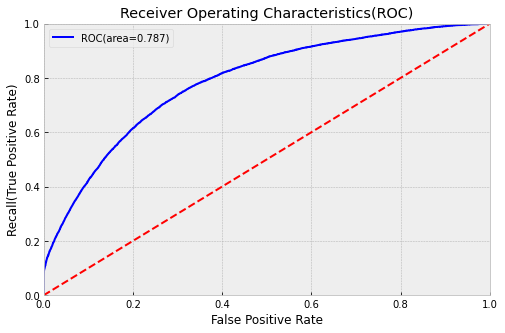

AUC for Light GBM Classifier model: 0.7869338502264247


In [157]:
#ROC_AUC curve
plt.figure(figsize=(8,5))
false_positive_rate,recall,thresholds=roc_curve(y_valid1,lgbm_pred1);
lgbmroc_auc1=auc(false_positive_rate,recall);
plt.title('Receiver Operating Characteristics(ROC)');
plt.plot(false_positive_rate,recall,'b',label='ROC(area=%0.3f)' %lgbmroc_auc1);
plt.legend();
plt.plot([0,1],[0,1],'r--');
plt.xlim([0.0,1.0]);
plt.ylim([0.0,1.0]);
plt.ylabel('Recall(True Positive Rate)');
plt.xlabel('False Positive Rate');
plt.show();
print('AUC for Light GBM Classifier model:',lgbmroc_auc1);

#### Microsoft AutoML

In [200]:
!pip install flaml

In [201]:
from flaml import AutoML

In [202]:
automl2 = AutoML()
# Specify automl goal and constraint
automl_settings = {
    "time_budget": 1200,  # in seconds
    "metric": 'roc_auc',
    "task": 'classification',
}
automl2.fit(x_smote1, y_smote1,estimator_list=['lgbm', 'xgboost', 'catboost','rf', 'extra_tree'],\
          X_val=x_valid1,y_val=y_valid1,verbose=10,**automl_settings)

[flaml.automl: 05-30 23:02:13] {890} INFO - Evaluation method: holdout
[flaml.automl: 05-30 23:02:14] {596} INFO - Using StratifiedKFold
[flaml.automl: 05-30 23:02:14] {911} INFO - Minimizing error metric: 1-roc_auc
[flaml.automl: 05-30 23:02:14] {930} INFO - List of ML learners in AutoML Run: ['lgbm', 'xgboost', 'catboost', 'rf', 'extra_tree']
[flaml.automl: 05-30 23:02:14] {994} INFO - iteration 0, current learner lgbm
[flaml.tune.tune: 05-30 23:02:14] {324} INFO - trial 1 config: {'n_estimators': 4, 'num_leaves': 4, 'min_child_samples': 20, 'learning_rate': 0.1, 'subsample': 1.0, 'log_max_bin': 8, 'colsample_bytree': 1.0, 'reg_alpha': 0.0009765625, 'reg_lambda': 1.0, 'FLAML_sample_size': 10000}
[flaml.tune.tune: 05-30 23:02:14] {96} INFO - result: {'total_time': 0.1233665943145752, 'time2eval': 0.1233665943145752, 'train_loss': False, 'val_loss': 0.27431808773024047, 'trained_estimator': <flaml.model.LGBMEstimator object at 0x000001B427F1A520>, 'training_iteration': 0, 'config': {'n

[flaml.automl: 05-30 23:02:15] {1141} INFO -  at 7.2s,	best lgbm's error=0.2603,	best lgbm's error=0.2603
[flaml.automl: 05-30 23:02:15] {994} INFO - iteration 6, current learner lgbm
[flaml.tune.tune: 05-30 23:02:15] {324} INFO - trial 1 config: {'n_estimators': 4.0, 'num_leaves': 8.0, 'min_child_samples': 21.0, 'learning_rate': 0.020472781437872914, 'subsample': 0.9619193128258086, 'log_max_bin': 5.0, 'colsample_bytree': 0.8426061861774259, 'reg_alpha': 0.001314342238891819, 'reg_lambda': 12.61531256373696, 'FLAML_sample_size': 10000}
[flaml.tune.tune: 05-30 23:02:15] {96} INFO - result: {'total_time': 0.12104916572570801, 'time2eval': 0.12104916572570801, 'train_loss': False, 'val_loss': 0.25448954631143517, 'trained_estimator': <flaml.model.LGBMEstimator object at 0x000001B48CB3A310>, 'training_iteration': 0, 'config': {'n_estimators': 4.0, 'num_leaves': 8.0, 'min_child_samples': 21.0, 'learning_rate': 0.020472781437872914, 'subsample': 0.9619193128258086, 'log_max_bin': 5.0, 'cols

[flaml.automl: 05-30 23:02:16] {1141} INFO -  at 8.2s,	best extra_tree's error=0.3069,	best lgbm's error=0.2545
[flaml.automl: 05-30 23:02:16] {994} INFO - iteration 12, current learner extra_tree
[flaml.tune.tune: 05-30 23:02:16] {324} INFO - trial 1 config: {'n_estimators': 4.0, 'max_features': 0.9586055955836026, 'criterion': 'gini', 'FLAML_sample_size': 10000}
[flaml.tune.tune: 05-30 23:02:16] {96} INFO - result: {'total_time': 0.30640649795532227, 'time2eval': 0.30640649795532227, 'train_loss': False, 'val_loss': 0.3051672872946958, 'trained_estimator': <flaml.model.ExtraTreeEstimator object at 0x000001B48CB3A160>, 'training_iteration': 0, 'config': {'n_estimators': 4.0, 'max_features': 0.9586055955836026, 'criterion': 'gini', 'FLAML_sample_size': 10000}, 'config/n_estimators': 4.0, 'config/max_features': 0.9586055955836026, 'config/criterion': 'gini', 'config/FLAML_sample_size': 10000, 'experiment_tag': 'exp', 'time_total_s': 0.307403564453125}
[flaml.automl: 05-30 23:02:16] {114

[flaml.automl: 05-30 23:02:18] {1141} INFO -  at 10.6s,	best lgbm's error=0.2473,	best lgbm's error=0.2473
[flaml.automl: 05-30 23:02:18] {994} INFO - iteration 19, current learner xgboost
[flaml.tune.tune: 05-30 23:02:18] {324} INFO - trial 1 config: {'n_estimators': 4.0, 'max_leaves': 4.0, 'min_child_weight': 27.123547475701166, 'learning_rate': 0.14971979531690335, 'subsample': 0.9246883402776727, 'colsample_bylevel': 0.898014219139486, 'colsample_bytree': 0.9238615531554782, 'reg_alpha': 0.0012834136471904583, 'reg_lambda': 8.519631194693345, 'FLAML_sample_size': 10000}
[flaml.tune.tune: 05-30 23:02:19] {96} INFO - result: {'total_time': 0.18715763092041016, 'time2eval': 0.18715763092041016, 'train_loss': False, 'val_loss': 0.2625314866973979, 'trained_estimator': <flaml.model.XGBoostSklearnEstimator object at 0x000001B48CB171F0>, 'training_iteration': 0, 'config': {'n_estimators': 4.0, 'max_leaves': 4.0, 'min_child_weight': 27.123547475701166, 'learning_rate': 0.14971979531690335,

[flaml.tune.tune: 05-30 23:02:20] {96} INFO - result: {'total_time': 0.2720804214477539, 'time2eval': 0.2720804214477539, 'train_loss': False, 'val_loss': 0.2491469679638194, 'trained_estimator': <flaml.model.LGBMEstimator object at 0x000001B48CB4EBE0>, 'training_iteration': 0, 'config': {'n_estimators': 4.0, 'num_leaves': 13.0, 'min_child_samples': 70.0, 'learning_rate': 0.021471283475097663, 'subsample': 0.9555819238420884, 'log_max_bin': 8.0, 'colsample_bytree': 0.8730069768169978, 'reg_alpha': 0.0016814016318273555, 'reg_lambda': 4.622025837270351, 'FLAML_sample_size': 40000}, 'config/n_estimators': 4.0, 'config/num_leaves': 13.0, 'config/min_child_samples': 70.0, 'config/learning_rate': 0.021471283475097663, 'config/subsample': 0.9555819238420884, 'config/log_max_bin': 8.0, 'config/colsample_bytree': 0.8730069768169978, 'config/reg_alpha': 0.0016814016318273555, 'config/reg_lambda': 4.622025837270351, 'config/FLAML_sample_size': 40000, 'experiment_tag': 'exp', 'time_total_s': 0.27

[flaml.automl: 05-30 23:02:22] {1141} INFO -  at 14.4s,	best lgbm's error=0.2283,	best lgbm's error=0.2283
[flaml.automl: 05-30 23:02:22] {994} INFO - iteration 31, current learner lgbm
[flaml.tune.tune: 05-30 23:02:22] {324} INFO - trial 1 config: {'n_estimators': 7.0, 'num_leaves': 13.0, 'min_child_samples': 18.0, 'learning_rate': 0.03211831033154042, 'subsample': 0.9278504834864563, 'log_max_bin': 5.0, 'colsample_bytree': 0.727807935470373, 'reg_alpha': 0.012292911844414812, 'reg_lambda': 0.16749337434162373, 'FLAML_sample_size': 40000}
[flaml.tune.tune: 05-30 23:02:22] {96} INFO - result: {'total_time': 0.3017463684082031, 'time2eval': 0.3017463684082031, 'train_loss': False, 'val_loss': 0.23515792560017468, 'trained_estimator': <flaml.model.LGBMEstimator object at 0x000001B48CB3AF10>, 'training_iteration': 0, 'config': {'n_estimators': 7.0, 'num_leaves': 13.0, 'min_child_samples': 18.0, 'learning_rate': 0.03211831033154042, 'subsample': 0.9278504834864563, 'log_max_bin': 5.0, 'col

[flaml.tune.tune: 05-30 23:02:24] {96} INFO - result: {'total_time': 0.46837568283081055, 'time2eval': 0.46837568283081055, 'train_loss': False, 'val_loss': 0.2925369260394326, 'trained_estimator': <flaml.model.RandomForestEstimator object at 0x000001B48CB4CE50>, 'training_iteration': 0, 'config': {'n_estimators': 7.0, 'max_features': 0.8762361590998838, 'criterion': 'gini', 'FLAML_sample_size': 10000}, 'config/n_estimators': 7.0, 'config/max_features': 0.8762361590998838, 'config/criterion': 'gini', 'config/FLAML_sample_size': 10000, 'experiment_tag': 'exp', 'time_total_s': 0.46977996826171875}
[flaml.automl: 05-30 23:02:24] {1141} INFO -  at 16.5s,	best rf's error=0.2838,	best lgbm's error=0.2268
[flaml.automl: 05-30 23:02:24] {994} INFO - iteration 37, current learner lgbm
[flaml.tune.tune: 05-30 23:02:24] {324} INFO - trial 1 config: {'n_estimators': 15.0, 'num_leaves': 94.0, 'min_child_samples': 16.0, 'learning_rate': 0.018629065424942987, 'subsample': 0.8795964385843147, 'log_max

[flaml.automl: 05-30 23:02:27] {1141} INFO -  at 18.8s,	best xgboost's error=0.2395,	best lgbm's error=0.2254
[flaml.automl: 05-30 23:02:27] {994} INFO - iteration 42, current learner lgbm
[flaml.tune.tune: 05-30 23:02:27] {324} INFO - trial 1 config: {'n_estimators': 10.0, 'num_leaves': 5.0, 'min_child_samples': 12.0, 'learning_rate': 0.13216304566982356, 'subsample': 0.7955001791856523, 'log_max_bin': 3.0, 'colsample_bytree': 0.5372397713165942, 'reg_alpha': 0.09391802649823526, 'reg_lambda': 0.007356508813296515, 'FLAML_sample_size': 40000}
[flaml.tune.tune: 05-30 23:02:27] {96} INFO - result: {'total_time': 0.49091506004333496, 'time2eval': 0.49091506004333496, 'train_loss': False, 'val_loss': 0.25502943954178603, 'trained_estimator': <flaml.model.LGBMEstimator object at 0x000001B48CB4CA90>, 'training_iteration': 0, 'config': {'n_estimators': 10.0, 'num_leaves': 5.0, 'min_child_samples': 12.0, 'learning_rate': 0.13216304566982356, 'subsample': 0.7955001791856523, 'log_max_bin': 3.0

[flaml.automl: 05-30 23:02:30] {1141} INFO -  at 21.9s,	best xgboost's error=0.2395,	best lgbm's error=0.2254
[flaml.automl: 05-30 23:02:30] {994} INFO - iteration 48, current learner lgbm
[flaml.tune.tune: 05-30 23:02:30] {324} INFO - trial 1 config: {'n_estimators': 31.0, 'num_leaves': 9.0, 'min_child_samples': 14.0, 'learning_rate': 0.04324175225168136, 'subsample': 0.9303874749129983, 'log_max_bin': 3.0, 'colsample_bytree': 0.5617282951565749, 'reg_alpha': 0.18952567188130237, 'reg_lambda': 0.00687064998716594, 'FLAML_sample_size': 40000}
[flaml.tune.tune: 05-30 23:02:30] {96} INFO - result: {'total_time': 0.5160346031188965, 'time2eval': 0.5160346031188965, 'train_loss': False, 'val_loss': 0.24177193687681464, 'trained_estimator': <flaml.model.LGBMEstimator object at 0x000001B48CB206D0>, 'training_iteration': 0, 'config': {'n_estimators': 31.0, 'num_leaves': 9.0, 'min_child_samples': 14.0, 'learning_rate': 0.04324175225168136, 'subsample': 0.9303874749129983, 'log_max_bin': 3.0, '

[flaml.automl: 05-30 23:02:38] {994} INFO - iteration 54, current learner lgbm
[flaml.tune.tune: 05-30 23:02:38] {324} INFO - trial 1 config: {'n_estimators': 8.0, 'num_leaves': 14.0, 'min_child_samples': 17.0, 'learning_rate': 0.20893233987971202, 'subsample': 0.7836894497373427, 'log_max_bin': 4.0, 'colsample_bytree': 0.41306623863981856, 'reg_alpha': 2.123072252558559, 'reg_lambda': 0.03918314890419102, 'FLAML_sample_size': 299900}
[flaml.tune.tune: 05-30 23:02:40] {96} INFO - result: {'total_time': 2.202667236328125, 'time2eval': 2.202667236328125, 'train_loss': False, 'val_loss': 0.24416804173019113, 'trained_estimator': <flaml.model.LGBMEstimator object at 0x000001B48CB17D60>, 'training_iteration': 0, 'config': {'n_estimators': 8.0, 'num_leaves': 14.0, 'min_child_samples': 17.0, 'learning_rate': 0.20893233987971202, 'subsample': 0.7836894497373427, 'log_max_bin': 4.0, 'colsample_bytree': 0.41306623863981856, 'reg_alpha': 2.123072252558559, 'reg_lambda': 0.03918314890419102, 'FLAM

[flaml.automl: 05-30 23:03:05] {1141} INFO -  at 57.5s,	best lgbm's error=0.2182,	best lgbm's error=0.2182
[flaml.automl: 05-30 23:03:05] {994} INFO - iteration 61, current learner catboost
[flaml.tune.tune: 05-30 23:03:05] {324} INFO - trial 1 config: {'early_stopping_rounds': 10.0, 'learning_rate': 0.2, 'FLAML_sample_size': 10000}
[flaml.tune.tune: 05-30 23:03:07] {96} INFO - result: {'total_time': 2.098676919937134, 'time2eval': 2.098676919937134, 'train_loss': False, 'val_loss': 0.2326013648247146, 'trained_estimator': <flaml.model.CatBoostEstimator object at 0x000001B4ADCD5280>, 'training_iteration': 0, 'config': {'early_stopping_rounds': 10.0, 'learning_rate': 0.2, 'FLAML_sample_size': 10000}, 'config/early_stopping_rounds': 10.0, 'config/learning_rate': 0.2, 'config/FLAML_sample_size': 10000, 'experiment_tag': 'exp', 'time_total_s': 2.0996739864349365}
[flaml.automl: 05-30 23:03:07] {1141} INFO -  at 59.6s,	best catboost's error=0.2294,	best lgbm's error=0.2182
[flaml.automl: 05

[flaml.automl: 05-30 23:03:50] {1141} INFO -  at 102.7s,	best rf's error=0.2563,	best lgbm's error=0.2179
[flaml.automl: 05-30 23:03:50] {994} INFO - iteration 69, current learner lgbm
[flaml.tune.tune: 05-30 23:03:50] {324} INFO - trial 1 config: {'n_estimators': 481.0, 'num_leaves': 101.0, 'min_child_samples': 22.0, 'learning_rate': 0.1410599157242634, 'subsample': 0.8254938877242268, 'log_max_bin': 5.0, 'colsample_bytree': 0.6851803482244245, 'reg_alpha': 0.0025414516961010944, 'reg_lambda': 0.001194522487146516, 'FLAML_sample_size': 299900}
[flaml.tune.tune: 05-30 23:04:05] {96} INFO - result: {'total_time': 13.739493370056152, 'time2eval': 13.739493370056152, 'train_loss': False, 'val_loss': 0.23237511151747237, 'trained_estimator': <flaml.model.LGBMEstimator object at 0x000001B4ADCEA490>, 'training_iteration': 0, 'config': {'n_estimators': 481.0, 'num_leaves': 101.0, 'min_child_samples': 22.0, 'learning_rate': 0.1410599157242634, 'subsample': 0.8254938877242268, 'log_max_bin': 5.

[flaml.automl: 05-30 23:04:31] {1141} INFO -  at 143.2s,	best lgbm's error=0.2179,	best lgbm's error=0.2179
[flaml.automl: 05-30 23:04:31] {994} INFO - iteration 77, current learner lgbm
[flaml.tune.tune: 05-30 23:04:31] {324} INFO - trial 1 config: {'n_estimators': 44.0, 'num_leaves': 371.0, 'min_child_samples': 10.0, 'learning_rate': 0.05592519762969285, 'subsample': 0.8396873172183673, 'log_max_bin': 4.0, 'colsample_bytree': 0.8889606933995619, 'reg_alpha': 0.05496377364664718, 'reg_lambda': 0.002931218786621917, 'FLAML_sample_size': 299900}
[flaml.tune.tune: 05-30 23:04:36] {96} INFO - result: {'total_time': 5.1396098136901855, 'time2eval': 5.1396098136901855, 'train_loss': False, 'val_loss': 0.21931950877527984, 'trained_estimator': <flaml.model.LGBMEstimator object at 0x000001B427F42E20>, 'training_iteration': 0, 'config': {'n_estimators': 44.0, 'num_leaves': 371.0, 'min_child_samples': 10.0, 'learning_rate': 0.05592519762969285, 'subsample': 0.8396873172183673, 'log_max_bin': 4.

[flaml.automl: 05-30 23:05:00] {1141} INFO -  at 172.2s,	best rf's error=0.2466,	best lgbm's error=0.2179
[flaml.automl: 05-30 23:05:00] {994} INFO - iteration 84, current learner rf
[flaml.tune.tune: 05-30 23:05:00] {324} INFO - trial 1 config: {'n_estimators': 162.0, 'max_features': 0.6096501911925415, 'criterion': 'gini', 'FLAML_sample_size': 10000}
[flaml.tune.tune: 05-30 23:05:03] {96} INFO - result: {'total_time': 2.720046043395996, 'time2eval': 2.720046043395996, 'train_loss': False, 'val_loss': 0.24745812150316526, 'trained_estimator': <flaml.model.RandomForestEstimator object at 0x000001B4ADCDF070>, 'training_iteration': 0, 'config': {'n_estimators': 162.0, 'max_features': 0.6096501911925415, 'criterion': 'gini', 'FLAML_sample_size': 10000}, 'config/n_estimators': 162.0, 'config/max_features': 0.6096501911925415, 'config/criterion': 'gini', 'config/FLAML_sample_size': 10000, 'experiment_tag': 'exp', 'time_total_s': 2.720046043395996}
[flaml.automl: 05-30 23:05:03] {1141} INFO 

[flaml.automl: 05-30 23:10:03] {1141} INFO -  at 474.8s,	best extra_tree's error=0.2770,	best catboost's error=0.2118
[flaml.automl: 05-30 23:10:03] {994} INFO - iteration 93, current learner extra_tree
[flaml.tune.tune: 05-30 23:10:03] {324} INFO - trial 1 config: {'n_estimators': 49.0, 'max_features': 0.76685818551534, 'criterion': 'gini', 'FLAML_sample_size': 10000}
[flaml.tune.tune: 05-30 23:10:04] {96} INFO - result: {'total_time': 1.3647096157073975, 'time2eval': 1.3647096157073975, 'train_loss': False, 'val_loss': 0.26936118434249867, 'trained_estimator': <flaml.model.ExtraTreeEstimator object at 0x000001B4ADD07D60>, 'training_iteration': 0, 'config': {'n_estimators': 49.0, 'max_features': 0.76685818551534, 'criterion': 'gini', 'FLAML_sample_size': 10000}, 'config/n_estimators': 49.0, 'config/max_features': 0.76685818551534, 'config/criterion': 'gini', 'config/FLAML_sample_size': 10000, 'experiment_tag': 'exp', 'time_total_s': 1.3670547008514404}
[flaml.automl: 05-30 23:10:04] {

[flaml.automl: 05-30 23:13:57] {1141} INFO -  at 709.4s,	best extra_tree's error=0.2675,	best catboost's error=0.2118
[flaml.automl: 05-30 23:13:57] {994} INFO - iteration 102, current learner catboost
[flaml.tune.tune: 05-30 23:13:57] {324} INFO - trial 1 config: {'early_stopping_rounds': 11.0, 'learning_rate': 0.12051397004556483, 'FLAML_sample_size': 40000}
[flaml.tune.tune: 05-30 23:14:09] {96} INFO - result: {'total_time': 12.18997597694397, 'time2eval': 12.18997597694397, 'train_loss': False, 'val_loss': 0.22220394555215683, 'trained_estimator': <flaml.model.CatBoostEstimator object at 0x000001B4282C26A0>, 'training_iteration': 0, 'config': {'early_stopping_rounds': 11.0, 'learning_rate': 0.12051397004556483, 'FLAML_sample_size': 40000}, 'config/early_stopping_rounds': 11.0, 'config/learning_rate': 0.12051397004556483, 'config/FLAML_sample_size': 40000, 'experiment_tag': 'exp', 'time_total_s': 12.193976640701294}
[flaml.automl: 05-30 23:14:09] {1141} INFO -  at 721.6s,	best catbo

[flaml.automl: 05-30 23:15:01] {994} INFO - iteration 110, current learner catboost
[flaml.tune.tune: 05-30 23:15:01] {324} INFO - trial 1 config: {'early_stopping_rounds': 11.0, 'learning_rate': 0.007946070578399791, 'FLAML_sample_size': 40000}
[flaml.tune.tune: 05-30 23:15:12] {96} INFO - result: {'total_time': 11.562880516052246, 'time2eval': 11.55887222290039, 'train_loss': False, 'val_loss': 0.23091197377085337, 'trained_estimator': <flaml.model.CatBoostEstimator object at 0x000001B427FBCDC0>, 'training_iteration': 0, 'config': {'early_stopping_rounds': 11.0, 'learning_rate': 0.007946070578399791, 'FLAML_sample_size': 40000}, 'config/early_stopping_rounds': 11.0, 'config/learning_rate': 0.007946070578399791, 'config/FLAML_sample_size': 40000, 'experiment_tag': 'exp', 'time_total_s': 11.56601333618164}
[flaml.automl: 05-30 23:15:12] {1141} INFO -  at 784.7s,	best catboost's error=0.2118,	best catboost's error=0.2118
[flaml.automl: 05-30 23:15:12] {994} INFO - iteration 111, current

[flaml.automl: 05-30 23:16:08] {1141} INFO -  at 840.2s,	best xgboost's error=0.2314,	best catboost's error=0.2118
[flaml.automl: 05-30 23:16:08] {994} INFO - iteration 117, current learner xgboost
[flaml.tune.tune: 05-30 23:16:08] {324} INFO - trial 1 config: {'n_estimators': 14.0, 'max_leaves': 17.0, 'min_child_weight': 33.48976169480633, 'learning_rate': 0.1733510835360057, 'subsample': 0.9728097438800569, 'colsample_bylevel': 0.9217034442997428, 'colsample_bytree': 0.7738535714856495, 'reg_alpha': 0.003031643644612933, 'reg_lambda': 4.71471755923292, 'FLAML_sample_size': 40000}
[flaml.tune.tune: 05-30 23:16:09] {96} INFO - result: {'total_time': 0.7294425964355469, 'time2eval': 0.7285449504852295, 'train_loss': False, 'val_loss': 0.22502121888444404, 'trained_estimator': <flaml.model.XGBoostSklearnEstimator object at 0x000001B427F94430>, 'training_iteration': 0, 'config': {'n_estimators': 14.0, 'max_leaves': 17.0, 'min_child_weight': 33.48976169480633, 'learning_rate': 0.1733510835

[flaml.automl: 05-30 23:16:11] {1141} INFO -  at 843.7s,	best xgboost's error=0.2224,	best catboost's error=0.2118
[flaml.automl: 05-30 23:16:11] {994} INFO - iteration 122, current learner catboost
[flaml.tune.tune: 05-30 23:16:11] {324} INFO - trial 1 config: {'early_stopping_rounds': 11.0, 'learning_rate': 0.2, 'FLAML_sample_size': 299900}
[flaml.tune.tune: 05-30 23:16:49] {96} INFO - result: {'total_time': 37.411481857299805, 'time2eval': 37.411481857299805, 'train_loss': False, 'val_loss': 0.21229224621509213, 'trained_estimator': <flaml.model.CatBoostEstimator object at 0x000001B4ADCD5BB0>, 'training_iteration': 0, 'config': {'early_stopping_rounds': 11.0, 'learning_rate': 0.2, 'FLAML_sample_size': 299900}, 'config/early_stopping_rounds': 11.0, 'config/learning_rate': 0.2, 'config/FLAML_sample_size': 299900, 'experiment_tag': 'exp', 'time_total_s': 37.41347646713257}
[flaml.automl: 05-30 23:16:49] {1141} INFO -  at 881.1s,	best catboost's error=0.2118,	best catboost's error=0.211

[flaml.automl: 05-30 23:17:17] {1141} INFO -  at 909.5s,	best lgbm's error=0.2179,	best catboost's error=0.2118
[flaml.automl: 05-30 23:17:17] {994} INFO - iteration 128, current learner xgboost
[flaml.tune.tune: 05-30 23:17:17] {324} INFO - trial 1 config: {'n_estimators': 51.0, 'max_leaves': 31.0, 'min_child_weight': 2.5567472991504308, 'learning_rate': 0.2385004976656717, 'subsample': 0.8935499098306143, 'colsample_bylevel': 0.6061252177171552, 'colsample_bytree': 0.6045467104292803, 'reg_alpha': 0.12215620002452637, 'reg_lambda': 0.1310108487834202, 'FLAML_sample_size': 299900}
[flaml.tune.tune: 05-30 23:17:23] {96} INFO - result: {'total_time': 5.794262647628784, 'time2eval': 5.793663501739502, 'train_loss': False, 'val_loss': 0.22007496709913354, 'trained_estimator': <flaml.model.XGBoostSklearnEstimator object at 0x000001B4ADCD5CA0>, 'training_iteration': 0, 'config': {'n_estimators': 51.0, 'max_leaves': 31.0, 'min_child_weight': 2.5567472991504308, 'learning_rate': 0.23850049766

[flaml.automl: 05-30 23:19:05] {1141} INFO -  at 1017.7s,	best xgboost's error=0.2169,	best catboost's error=0.2118
[flaml.automl: 05-30 23:19:05] {994} INFO - iteration 134, current learner xgboost
[flaml.tune.tune: 05-30 23:19:05] {324} INFO - trial 1 config: {'n_estimators': 45.0, 'max_leaves': 18.0, 'min_child_weight': 3.4431802877885143, 'learning_rate': 0.09141989934436419, 'subsample': 0.7675932366930531, 'colsample_bylevel': 0.33862467438278293, 'colsample_bytree': 0.6235988339200301, 'reg_alpha': 0.0009765625, 'reg_lambda': 0.8310617894826681, 'FLAML_sample_size': 299900}
[flaml.tune.tune: 05-30 23:19:10] {96} INFO - result: {'total_time': 4.8836493492126465, 'time2eval': 4.8836493492126465, 'train_loss': False, 'val_loss': 0.22340564995682166, 'trained_estimator': <flaml.model.XGBoostSklearnEstimator object at 0x000001B42838B7F0>, 'training_iteration': 0, 'config': {'n_estimators': 45.0, 'max_leaves': 18.0, 'min_child_weight': 3.4431802877885143, 'learning_rate': 0.0914198993

[flaml.automl: 05-30 23:21:58] {1141} INFO -  at 1190.5s,	best xgboost's error=0.2169,	best catboost's error=0.2118
[flaml.automl: 05-30 23:21:58] {994} INFO - iteration 141, current learner extra_tree
[flaml.tune.tune: 05-30 23:21:58] {324} INFO - trial 1 config: {'n_estimators': 379.0, 'max_features': 0.8005470899511427, 'criterion': 'gini', 'FLAML_sample_size': 10000}
[flaml.tune.tune: 05-30 23:21:59] {96} INFO - result: {'total_time': 0.2691984176635742, 'time2eval': 0.2691984176635742, 'train_loss': False, 'val_loss': 0.30143984769183296, 'trained_estimator': <flaml.model.ExtraTreeEstimator object at 0x000001B428302D00>, 'training_iteration': 0, 'config': {'n_estimators': 379.0, 'max_features': 0.8005470899511427, 'criterion': 'gini', 'FLAML_sample_size': 10000}, 'config/n_estimators': 379.0, 'config/max_features': 0.8005470899511427, 'config/criterion': 'gini', 'config/FLAML_sample_size': 10000, 'experiment_tag': 'exp', 'time_total_s': 0.2711968421936035}
[flaml.automl: 05-30 23:

In [203]:
# Predict
automl_pred2=automl2.predict_proba(x_valid1)[:,1]
ic(automl_pred2);

ic| automl_pred2: array([0.11877028, 0.12215685, 0.24571438, ..., 0.40432791, 0.07048865,
                         0.17043143])


In [204]:
automl2.model

In [208]:
#ROC_AUC SCORE:-
automl2_roc_score=roc_auc_score(y_valid1,automl_pred2)
print('AutoML2 Classifier ROC score:',automl2_roc_score)

AutoML2 Classifier ROC score: 0.7881892382497026


In [207]:
automl3 = AutoML()
# Specify automl goal and constraint
automl_settings = {
    "time_budget": 120,  # in seconds
    "metric": 'roc_auc',
    "task": 'classification',
}
automl3.fit(x_smote1, y_smote1,estimator_list=['lgbm', 'xgboost', 'rf', 'extra_tree'],\
          X_val=x_valid1,y_val=y_valid1,verbose=10,**automl_settings)

[flaml.automl: 05-30 23:23:08] {890} INFO - Evaluation method: holdout
[flaml.automl: 05-30 23:23:08] {596} INFO - Using StratifiedKFold
[flaml.automl: 05-30 23:23:08] {911} INFO - Minimizing error metric: 1-roc_auc
[flaml.automl: 05-30 23:23:08] {930} INFO - List of ML learners in AutoML Run: ['lgbm', 'xgboost', 'rf', 'extra_tree']
[flaml.automl: 05-30 23:23:08] {994} INFO - iteration 0, current learner lgbm
[flaml.tune.tune: 05-30 23:23:08] {324} INFO - trial 1 config: {'n_estimators': 4, 'num_leaves': 4, 'min_child_samples': 20, 'learning_rate': 0.1, 'subsample': 1.0, 'log_max_bin': 8, 'colsample_bytree': 1.0, 'reg_alpha': 0.0009765625, 'reg_lambda': 1.0, 'FLAML_sample_size': 10000}
[flaml.tune.tune: 05-30 23:23:08] {96} INFO - result: {'total_time': 0.15094518661499023, 'time2eval': 0.15032720565795898, 'train_loss': False, 'val_loss': 0.27431808773024047, 'trained_estimator': <flaml.model.LGBMEstimator object at 0x000001B427EEB790>, 'training_iteration': 0, 'config': {'n_estimator

[flaml.automl: 05-30 23:23:09] {1141} INFO -  at 6.5s,	best lgbm's error=0.2603,	best lgbm's error=0.2603
[flaml.automl: 05-30 23:23:09] {994} INFO - iteration 6, current learner lgbm
[flaml.tune.tune: 05-30 23:23:09] {324} INFO - trial 1 config: {'n_estimators': 4.0, 'num_leaves': 8.0, 'min_child_samples': 21.0, 'learning_rate': 0.020472781437872914, 'subsample': 0.9619193128258086, 'log_max_bin': 5.0, 'colsample_bytree': 0.8426061861774259, 'reg_alpha': 0.001314342238891819, 'reg_lambda': 12.61531256373696, 'FLAML_sample_size': 10000}
[flaml.tune.tune: 05-30 23:23:09] {96} INFO - result: {'total_time': 0.1354823112487793, 'time2eval': 0.1354823112487793, 'train_loss': False, 'val_loss': 0.25448954631143517, 'trained_estimator': <flaml.model.LGBMEstimator object at 0x000001B4283A8100>, 'training_iteration': 0, 'config': {'n_estimators': 4.0, 'num_leaves': 8.0, 'min_child_samples': 21.0, 'learning_rate': 0.020472781437872914, 'subsample': 0.9619193128258086, 'log_max_bin': 5.0, 'colsam

[flaml.tune.tune: 05-30 23:23:11] {96} INFO - result: {'total_time': 0.16681861877441406, 'time2eval': 0.16681861877441406, 'train_loss': False, 'val_loss': 0.2731729695344538, 'trained_estimator': <flaml.model.XGBoostSklearnEstimator object at 0x000001B4285662B0>, 'training_iteration': 0, 'config': {'n_estimators': 4.0, 'max_leaves': 4.0, 'min_child_weight': 0.9999999999999981, 'learning_rate': 0.09999999999999995, 'subsample': 0.9266743941610592, 'colsample_bylevel': 1.0, 'colsample_bytree': 1.0, 'reg_alpha': 0.0013933617380144255, 'reg_lambda': 1.0, 'FLAML_sample_size': 10000}, 'config/n_estimators': 4.0, 'config/max_leaves': 4.0, 'config/min_child_weight': 0.9999999999999981, 'config/learning_rate': 0.09999999999999995, 'config/subsample': 0.9266743941610592, 'config/colsample_bylevel': 1.0, 'config/colsample_bytree': 1.0, 'config/reg_alpha': 0.0013933617380144255, 'config/reg_lambda': 1.0, 'config/FLAML_sample_size': 10000, 'experiment_tag': 'exp', 'time_total_s': 0.16781568527221

[flaml.automl: 05-30 23:23:13] {1141} INFO -  at 10.4s,	best lgbm's error=0.2473,	best lgbm's error=0.2473
[flaml.automl: 05-30 23:23:13] {994} INFO - iteration 19, current learner xgboost
[flaml.tune.tune: 05-30 23:23:13] {324} INFO - trial 1 config: {'n_estimators': 4.0, 'max_leaves': 4.0, 'min_child_weight': 27.123547475701166, 'learning_rate': 0.14971979531690335, 'subsample': 0.9246883402776727, 'colsample_bylevel': 0.898014219139486, 'colsample_bytree': 0.9238615531554782, 'reg_alpha': 0.0012834136471904583, 'reg_lambda': 8.519631194693345, 'FLAML_sample_size': 10000}
[flaml.tune.tune: 05-30 23:23:13] {96} INFO - result: {'total_time': 0.16056513786315918, 'time2eval': 0.16056513786315918, 'train_loss': False, 'val_loss': 0.2625314866973979, 'trained_estimator': <flaml.model.XGBoostSklearnEstimator object at 0x000001B42856C880>, 'training_iteration': 0, 'config': {'n_estimators': 4.0, 'max_leaves': 4.0, 'min_child_weight': 27.123547475701166, 'learning_rate': 0.14971979531690335,

[flaml.tune.tune: 05-30 23:23:15] {96} INFO - result: {'total_time': 0.35750913619995117, 'time2eval': 0.35750913619995117, 'train_loss': False, 'val_loss': 0.2491469679638194, 'trained_estimator': <flaml.model.LGBMEstimator object at 0x000001B4285607C0>, 'training_iteration': 0, 'config': {'n_estimators': 4.0, 'num_leaves': 13.0, 'min_child_samples': 70.0, 'learning_rate': 0.021471283475097663, 'subsample': 0.9555819238420884, 'log_max_bin': 8.0, 'colsample_bytree': 0.8730069768169978, 'reg_alpha': 0.0016814016318273555, 'reg_lambda': 4.622025837270351, 'FLAML_sample_size': 40000}, 'config/n_estimators': 4.0, 'config/num_leaves': 13.0, 'config/min_child_samples': 70.0, 'config/learning_rate': 0.021471283475097663, 'config/subsample': 0.9555819238420884, 'config/log_max_bin': 8.0, 'config/colsample_bytree': 0.8730069768169978, 'config/reg_alpha': 0.0016814016318273555, 'config/reg_lambda': 4.622025837270351, 'config/FLAML_sample_size': 40000, 'experiment_tag': 'exp', 'time_total_s': 0.

[flaml.tune.tune: 05-30 23:23:18] {96} INFO - result: {'total_time': 0.37712883949279785, 'time2eval': 0.37712883949279785, 'train_loss': False, 'val_loss': 0.2401323841101194, 'trained_estimator': <flaml.model.LGBMEstimator object at 0x000001B42834FD00>, 'training_iteration': 0, 'config': {'n_estimators': 4.0, 'num_leaves': 18.0, 'min_child_samples': 20.0, 'learning_rate': 0.19161505925501768, 'subsample': 1.0, 'log_max_bin': 6.0, 'colsample_bytree': 0.7391239245365524, 'reg_alpha': 0.0035013329924190144, 'reg_lambda': 3.0998361377066352, 'FLAML_sample_size': 40000}, 'config/n_estimators': 4.0, 'config/num_leaves': 18.0, 'config/min_child_samples': 20.0, 'config/learning_rate': 0.19161505925501768, 'config/subsample': 1.0, 'config/log_max_bin': 6.0, 'config/colsample_bytree': 0.7391239245365524, 'config/reg_alpha': 0.0035013329924190144, 'config/reg_lambda': 3.0998361377066352, 'config/FLAML_sample_size': 40000, 'experiment_tag': 'exp', 'time_total_s': 0.3805689811706543}
[flaml.autom

[flaml.automl: 05-30 23:23:21] {1141} INFO -  at 18.4s,	best lgbm's error=0.2268,	best lgbm's error=0.2268
[flaml.automl: 05-30 23:23:21] {994} INFO - iteration 36, current learner extra_tree
[flaml.tune.tune: 05-30 23:23:21] {324} INFO - trial 1 config: {'n_estimators': 8.0, 'max_features': 0.9491424279140797, 'criterion': 'entropy', 'FLAML_sample_size': 10000}
[flaml.tune.tune: 05-30 23:23:22] {96} INFO - result: {'total_time': 0.5843088626861572, 'time2eval': 0.5833070278167725, 'train_loss': False, 'val_loss': 0.2886838982089761, 'trained_estimator': <flaml.model.ExtraTreeEstimator object at 0x000001B42854F2E0>, 'training_iteration': 0, 'config': {'n_estimators': 8.0, 'max_features': 0.9491424279140797, 'criterion': 'entropy', 'FLAML_sample_size': 10000}, 'config/n_estimators': 8.0, 'config/max_features': 0.9491424279140797, 'config/criterion': 'entropy', 'config/FLAML_sample_size': 10000, 'experiment_tag': 'exp', 'time_total_s': 0.5855340957641602}
[flaml.automl: 05-30 23:23:22] {

[flaml.automl: 05-30 23:23:24] {1141} INFO -  at 20.9s,	best xgboost's error=0.2395,	best lgbm's error=0.2268
[flaml.automl: 05-30 23:23:24] {994} INFO - iteration 42, current learner lgbm
[flaml.tune.tune: 05-30 23:23:24] {324} INFO - trial 1 config: {'n_estimators': 41.0, 'num_leaves': 14.0, 'min_child_samples': 21.0, 'learning_rate': 0.09944542238194604, 'subsample': 0.8351939089893561, 'log_max_bin': 4.0, 'colsample_bytree': 0.5333355993319229, 'reg_alpha': 0.5550464707200069, 'reg_lambda': 0.017672056255506195, 'FLAML_sample_size': 40000}
[flaml.tune.tune: 05-30 23:23:24] {96} INFO - result: {'total_time': 0.6723041534423828, 'time2eval': 0.6713058948516846, 'train_loss': False, 'val_loss': 0.2254209068224683, 'trained_estimator': <flaml.model.LGBMEstimator object at 0x000001B428560D90>, 'training_iteration': 0, 'config': {'n_estimators': 41.0, 'num_leaves': 14.0, 'min_child_samples': 21.0, 'learning_rate': 0.09944542238194604, 'subsample': 0.8351939089893561, 'log_max_bin': 4.0, 

[flaml.automl: 05-30 23:23:27] {1141} INFO -  at 24.2s,	best xgboost's error=0.2394,	best lgbm's error=0.2254
[flaml.automl: 05-30 23:23:27] {994} INFO - iteration 48, current learner lgbm
[flaml.tune.tune: 05-30 23:23:27] {324} INFO - trial 1 config: {'n_estimators': 161.0, 'num_leaves': 39.0, 'min_child_samples': 35.0, 'learning_rate': 0.07482721045510585, 'subsample': 0.8748876387930598, 'log_max_bin': 5.0, 'colsample_bytree': 0.5294314273472516, 'reg_alpha': 3.2802710634525982, 'reg_lambda': 0.04245241597934426, 'FLAML_sample_size': 40000}
[flaml.tune.tune: 05-30 23:23:28] {96} INFO - result: {'total_time': 1.4948482513427734, 'time2eval': 1.4948482513427734, 'train_loss': False, 'val_loss': 0.22890830552830344, 'trained_estimator': <flaml.model.LGBMEstimator object at 0x000001B4FF5D3AF0>, 'training_iteration': 0, 'config': {'n_estimators': 161.0, 'num_leaves': 39.0, 'min_child_samples': 35.0, 'learning_rate': 0.07482721045510585, 'subsample': 0.8748876387930598, 'log_max_bin': 5.0

[flaml.automl: 05-30 23:23:36] {1141} INFO -  at 33.1s,	best lgbm's error=0.2244,	best lgbm's error=0.2244
[flaml.automl: 05-30 23:23:36] {994} INFO - iteration 54, current learner lgbm
[flaml.tune.tune: 05-30 23:23:36] {324} INFO - trial 1 config: {'n_estimators': 208.0, 'num_leaves': 14.0, 'min_child_samples': 27.0, 'learning_rate': 0.04733298846132314, 'subsample': 0.8866983682413694, 'log_max_bin': 5.0, 'colsample_bytree': 0.6536049600240271, 'reg_alpha': 0.14510885547463853, 'reg_lambda': 0.007970303077514325, 'FLAML_sample_size': 299900}
[flaml.tune.tune: 05-30 23:23:43] {96} INFO - result: {'total_time': 6.8063554763793945, 'time2eval': 6.806215524673462, 'train_loss': False, 'val_loss': 0.22142232043998855, 'trained_estimator': <flaml.model.LGBMEstimator object at 0x000001B428539100>, 'training_iteration': 0, 'config': {'n_estimators': 208.0, 'num_leaves': 14.0, 'min_child_samples': 27.0, 'learning_rate': 0.04733298846132314, 'subsample': 0.8866983682413694, 'log_max_bin': 5.0,

[flaml.automl: 05-30 23:24:13] {1141} INFO -  at 70.4s,	best lgbm's error=0.2179,	best lgbm's error=0.2179
[flaml.automl: 05-30 23:24:13] {994} INFO - iteration 60, current learner rf
[flaml.tune.tune: 05-30 23:24:13] {324} INFO - trial 1 config: {'n_estimators': 7.0, 'max_features': 0.9882360758622841, 'criterion': 'entropy', 'FLAML_sample_size': 10000}
[flaml.tune.tune: 05-30 23:24:14] {96} INFO - result: {'total_time': 0.7279653549194336, 'time2eval': 0.7279653549194336, 'train_loss': False, 'val_loss': 0.28515715950855414, 'trained_estimator': <flaml.model.RandomForestEstimator object at 0x000001B4FF5D3F40>, 'training_iteration': 0, 'config': {'n_estimators': 7.0, 'max_features': 0.9882360758622841, 'criterion': 'entropy', 'FLAML_sample_size': 10000}, 'config/n_estimators': 7.0, 'config/max_features': 0.9882360758622841, 'config/criterion': 'entropy', 'config/FLAML_sample_size': 10000, 'experiment_tag': 'exp', 'time_total_s': 0.7313549518585205}
[flaml.automl: 05-30 23:24:14] {1141

[flaml.automl: 05-30 23:24:41] {1141} INFO -  at 98.7s,	best extra_tree's error=0.2868,	best lgbm's error=0.2179
[flaml.automl: 05-30 23:24:41] {994} INFO - iteration 67, current learner lgbm
[flaml.tune.tune: 05-30 23:24:41] {324} INFO - trial 1 config: {'n_estimators': 128.0, 'num_leaves': 25.0, 'min_child_samples': 38.0, 'learning_rate': 0.07342486450906592, 'subsample': 0.9371630800272585, 'log_max_bin': 4.0, 'colsample_bytree': 0.7004332544883448, 'reg_alpha': 0.000993288107005878, 'reg_lambda': 0.0009765625, 'FLAML_sample_size': 299900}
[flaml.tune.tune: 05-30 23:24:49] {96} INFO - result: {'total_time': 7.355212211608887, 'time2eval': 7.3542094230651855, 'train_loss': False, 'val_loss': 0.21927307419565767, 'trained_estimator': <flaml.model.LGBMEstimator object at 0x000001B4FF5D3F70>, 'training_iteration': 0, 'config': {'n_estimators': 128.0, 'num_leaves': 25.0, 'min_child_samples': 38.0, 'learning_rate': 0.07342486450906592, 'subsample': 0.9371630800272585, 'log_max_bin': 4.0, 

[flaml.tune.tune: 05-30 23:24:59] {96} INFO - result: {'total_time': 0.5936205387115479, 'time2eval': 0.5910530090332031, 'train_loss': False, 'val_loss': 0.3685220506453102, 'trained_estimator': <flaml.model.ExtraTreeEstimator object at 0x000001B428560C70>, 'training_iteration': 0, 'config': {'n_estimators': 4.0, 'max_features': 0.987503868840176, 'criterion': 'entropy', 'FLAML_sample_size': 40000}, 'config/n_estimators': 4.0, 'config/max_features': 0.987503868840176, 'config/criterion': 'entropy', 'config/FLAML_sample_size': 40000, 'experiment_tag': 'exp', 'time_total_s': 0.5964846611022949}
[flaml.automl: 05-30 23:24:59] {1141} INFO -  at 116.6s,	best extra_tree's error=0.2868,	best lgbm's error=0.2179
[flaml.automl: 05-30 23:24:59] {994} INFO - iteration 75, current learner rf
[flaml.tune.tune: 05-30 23:24:59] {324} INFO - trial 1 config: {'n_estimators': 41.0, 'max_features': 0.7148567019921337, 'criterion': 'entropy', 'FLAML_sample_size': 10000}
[flaml.tune.tune: 05-30 23:24:59] 

[flaml.automl: 05-30 23:25:02] {1141} INFO -  at 119.4s,	best extra_tree's error=0.2868,	best lgbm's error=0.2179
[flaml.automl: 05-30 23:25:02] {994} INFO - iteration 83, current learner extra_tree
[flaml.tune.tune: 05-30 23:25:02] {324} INFO - trial 1 config: {'n_estimators': 4.0, 'max_features': 0.8083552850386918, 'criterion': 'entropy', 'FLAML_sample_size': 40000}
[flaml.tune.tune: 05-30 23:25:03] {96} INFO - result: {'total_time': 0.5552597045898438, 'time2eval': 0.5542328357696533, 'train_loss': False, 'val_loss': 0.3722531559553901, 'trained_estimator': <flaml.model.ExtraTreeEstimator object at 0x000001B4FF5FD490>, 'training_iteration': 0, 'config': {'n_estimators': 4.0, 'max_features': 0.8083552850386918, 'criterion': 'entropy', 'FLAML_sample_size': 40000}, 'config/n_estimators': 4.0, 'config/max_features': 0.8083552850386918, 'config/criterion': 'entropy', 'config/FLAML_sample_size': 40000, 'experiment_tag': 'exp', 'time_total_s': 0.5577738285064697}
[flaml.automl: 05-30 23:2

In [209]:
# Predict
automl_pred3=automl3.predict_proba(x_valid1)[:,1]
ic(automl_pred3);

ic| automl_pred3: array([0.2633313 , 0.296852  , 0.48997805, ..., 0.67646424, 0.16350568,
                         0.28129235])


In [210]:
automl3.model

LGBMClassifier(colsample_bytree=0.7946969739439533,
               learning_rate=0.06408041868311203, max_bin=15,
               min_child_samples=19, n_estimators=75, num_leaves=96,
               objective='binary', reg_alpha=0.007388833648105615,
               reg_lambda=0.0014692314996398704, subsample=0.8884251986228129)

In [211]:
#ROC_AUC SCORE:-
automl3_roc_score=roc_auc_score(y_valid1,automl_pred3)
print('AutoML3 Classifier ROC score:',automl3_roc_score)

AutoML3 Classifier ROC score: 0.7821039205754651


### Evaluation of models

In [236]:
eval_df=pd.DataFrame(columns=['Models','Roc_auc_score'])
eval_df['Models']=['Logistic Regression','Decision Tree','Random Forest','XG Boost','Gradient Boost',\
                  'Light GBM(only Label encoding)','Light GBM','Catboost','AutoML2']
eval_df['Roc_auc_score']=[logroc_score,dt_roc_score,rf_roc_score,xgb_roc_score,gb_roc_score,lgbm_roc_score,lgbm_roc_score1,cb_roc_score,automl2_roc_score]
eval_df

,Models,Roc_auc_score
0,Logistic Regression,0.732933
1,Decision Tree,0.741120
2,Random Forest,0.725390
3,XG Boost,0.776558
4,Gradient Boost,0.772198
5,Light GBM(only Label encoding),0.786487
6,Light GBM,0.786934
7,Catboost,0.787897
8,AutoML2,0.788189


In [145]:
len(cb_pred)

73718

In [146]:
len(lgbm_pred)

49145

In [158]:
len(lgbm_pred1)

49145

In [147]:
len(xgb_pred)

49145

In [159]:
pred=(lgbm_pred1+xgb_pred)/2

In [160]:
roc_auc_score(y_valid1,pred)

0.786766125815593

In [165]:
(lgbm_roc_score1+xgb_roc_score+cb_roc_score)/3

0.7837960057899563

In [186]:
x_smote3.shape

(299900, 9)

In [187]:
test1.shape

(105312, 9)

In [143]:
#gb_params={'n_estimators':[50,100,500],'max_depth':[5,15,25],'learning_rate':[0.01,0.1,1,0.001]}

In [ ]:
#xgb_params={'eta':[0.03,0.1,0.6,],'n_estimators':[50,100,500],'max_depth':[5,15,25],'alpha':[0,5,10],'lambda':[1,10]}

### Predictions on test set

In [166]:
test_clean1=test_clean[best_feat[0:35]]
test_clean1.head()

,Gender_Male,Occupation_Self_Employed,Is_Active_Yes,Age,Vintage,Channel_Code_X3,Credit_Product_Yes,Channel_Code_X2,Occupation_Other,Region_Code_RG268,...,Region_Code_RG281,Region_Code_RG274,Region_Code_RG273,Region_Code_RG279,Region_Code_RG263,Region_Code_RG252,Region_Code_RG276,Region_Code_RG260,Region_Code_RG275,Region_Code_RG259
0,1,0,0,0.081967,0.140625,0,1,0,1,0,...,0,0,0,0,0,0,0,0,0,0
1,1,0,0,0.311475,0.328125,0,0,1,1,1,...,0,0,0,0,0,0,0,0,0,0
2,1,0,0,0.114754,0.054688,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,1,0,0,0.081967,0.203125,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0.081967,0.093750,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0


In [141]:
test_unencoded.head()

,Age,Vintage,Avg_Account_Balance,Gender,Region_Code,Occupation,Channel_Code,Credit_Product,Is_Active
0,0.081967,0.140625,0.072805,Male,RG254,Other,X1,Yes,No
1,0.311475,0.328125,0.091333,Male,RG268,Other,X2,No,No
2,0.114754,0.054688,0.019558,Male,RG270,Salaried,X1,No,No
3,0.081967,0.203125,0.085520,Male,RG272,Other,X1,No,No
4,0.081967,0.093750,0.064179,Female,RG270,Other,X1,No,No


In [142]:
x_uvalid

,Age,Vintage,Avg_Account_Balance,Gender,Region_Code,Occupation,Channel_Code,Credit_Product,Is_Active
213608,0.080645,0.148438,0.040174,Male,RG259,Salaried,X1,No,No
177874,0.177419,0.109375,0.112652,Male,RG273,Other,X2,Yes,Yes
169631,0.048387,0.156250,0.055236,Male,RG283,Salaried,X1,Yes,No
168166,0.548387,0.476562,0.073783,Female,RG254,Self_Employed,X2,Yes,No
239666,0.096774,0.140625,0.198349,Female,RG254,Other,X1,No,Yes
...,...,...,...,...,...,...,...,...,...
223300,0.370968,0.796875,0.040694,Male,RG283,Self_Employed,X2,No,Yes
215258,0.338710,0.101562,0.049729,Male,RG269,Other,X3,No,Yes
23452,0.951613,0.375000,0.397189,Male,RG268,Other,X3,Yes,No
157784,0.580645,0.476562,0.131354,Female,RG268,Self_Employed,X3,No,Yes


In [328]:
cat_test_pred=cat_model.predict_proba(test_unencoded)[:,1]
cat_test_pred

array([0.03827511, 0.20058191, 0.06840993, ..., 0.46434872, 0.4518288 ,
       0.07459944])

In [329]:
len(cat_test_pred)

105312

In [330]:
cat_test_df=pd.DataFrame(columns=['ID','Is_Lead'])
cat_test_df['ID']=df_test['ID']
cat_test_df['Is_Lead']=cat_test_pred
cat_test_df.head()

,ID,Is_Lead
0,VBENBARO,0.038275
1,CCMEWNKY,0.200582
2,VK3KGA9M,0.068410
3,TT8RPZVC,0.032586
4,SHQZEYTZ,0.026098


In [331]:
cat_test_df.shape

(105312, 2)

In [332]:
#cat_test_df.to_csv('cat_lead_predictions.csv',index=False,)

In [143]:
cat_test_pred2=cat_model2.predict_proba(test_unencoded)[:,1]
cat_test_pred2

array([0.04321257, 0.41135881, 0.1035142 , ..., 0.77758062, 0.65363476,
       0.06148449])

In [145]:
len(cat_test_pred2)

105312

In [146]:
cat_test_df2=pd.DataFrame(columns=['ID','Is_Lead'])
cat_test_df2['ID']=df_test['ID']
cat_test_df2['Is_Lead']=cat_test_pred2
cat_test_df2.head()

,ID,Is_Lead
0,VBENBARO,0.043213
1,CCMEWNKY,0.411359
2,VK3KGA9M,0.103514
3,TT8RPZVC,0.110821
4,SHQZEYTZ,0.085805


In [147]:
#cat_test_df2.to_csv('cat2_lead_predictions.csv',index=False,)

In [121]:
x_valid1.head(3)

,Gender_Male,Occupation_Self_Employed,Is_Active_Yes,Age,Vintage,Channel_Code_X3,Credit_Product_Yes,Channel_Code_X2,Occupation_Other,Region_Code_RG268,...,Region_Code_RG281,Region_Code_RG274,Region_Code_RG273,Region_Code_RG279,Region_Code_RG263,Region_Code_RG252,Region_Code_RG276,Region_Code_RG260,Region_Code_RG275,Region_Code_RG259
3,1,0,0,0.177419,0.093750,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,1,1,1,0.532258,0.195312,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,1,0,1,0.629032,0.101562,1,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0


In [125]:
test_clean1.tail(3)

,Gender_Male,Occupation_Self_Employed,Is_Active_Yes,Age,Vintage,Channel_Code_X3,Credit_Product_Yes,Channel_Code_X2,Occupation_Other,Region_Code_RG268,...,Region_Code_RG281,Region_Code_RG274,Region_Code_RG273,Region_Code_RG279,Region_Code_RG263,Region_Code_RG252,Region_Code_RG276,Region_Code_RG260,Region_Code_RG275,Region_Code_RG259
105309,1,0,0,0.180328,0.062500,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
105310,1,0,1,0.475410,0.671875,1,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
105311,1,0,0,0.049180,0.109375,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [126]:
stack_test_pred=stack_model.predict_proba(test_clean1)[:,1]
stack_test_pred

[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.4s
[Parallel(n_jobs=8)]: Done  97 tasks      | elapsed:    1.2s
[Parallel(n_jobs=8)]: Done 184 tasks      | elapsed:    2.3s
[Parallel(n_jobs=8)]: Done 297 tasks      | elapsed:    3.6s
[Parallel(n_jobs=8)]: Done 434 tasks      | elapsed:    5.3s
[Parallel(n_jobs=8)]: Done 500 out of 500 | elapsed:    6.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.2s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.5s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.7s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    1.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    1.2s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:  1.6min fin

array([0.1270889 , 0.12319504, 0.1270889 , ..., 0.95707965, 0.95707965,
       0.1270889 ], dtype=float32)

In [127]:
len(stack_test_pred)

105312

In [128]:
stack_test_df=pd.DataFrame(columns=['ID','Is_Lead'])
stack_test_df['ID']=df_test['ID']
stack_test_df['Is_Lead']=stack_test_pred
stack_test_df.head()

,ID,Is_Lead
0,VBENBARO,0.127089
1,CCMEWNKY,0.123195
2,VK3KGA9M,0.127089
3,TT8RPZVC,0.127089
4,SHQZEYTZ,0.127089


In [129]:
stack_test_df.shape

(105312, 2)

In [130]:
#stack_test_df.to_csv('stack_lead_predictions.csv',index=False,)

In [206]:
x_valid1

,Gender_Male,Occupation_Self_Employed,Is_Active_Yes,Age,Vintage,Channel_Code_X3,Credit_Product_Yes,Channel_Code_X2,Occupation_Other,Region_Code_RG268,...,Region_Code_RG281,Region_Code_RG274,Region_Code_RG273,Region_Code_RG279,Region_Code_RG263,Region_Code_RG252,Region_Code_RG276,Region_Code_RG260,Region_Code_RG275,Region_Code_RG259
3,1,0,0,0.177419,0.093750,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,1,1,1,0.532258,0.195312,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,1,0,1,0.629032,0.101562,1,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
9,0,1,0,0.516129,0.328125,0,1,1,0,1,...,0,0,0,0,0,0,0,0,0,0
10,1,1,1,0.483871,0.906250,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
245694,0,1,0,0.435484,0.664062,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
245695,1,0,1,0.838710,0.437500,0,0,1,1,0,...,0,0,0,0,0,0,0,0,0,0
245698,1,0,0,0.451613,0.062500,1,1,0,1,0,...,0,0,0,0,0,1,0,0,0,0
245710,0,0,0,0.048387,0.062500,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


### Blend predictions

In [ ]:
# 3 models

In [ ]:
cat_test_fpred=cat_model.predict_proba(test_unencoded)[:,1]
lgbm_test_fpred1=lgbm_model1.predict_proba(test_clean1)[:,1]
xgb_test_fpred=xgbmodel.predict_proba(test_clean1)[:,1]

In [188]:
lgbm_test_fpred=lgbm_model.predict_proba(test1)[:,1]

In [189]:
y_pred_lgbml=pd.DataFrame(lgbm_test_fpred)

In [171]:
y_pred_xgb  = pd.DataFrame( xgb_test_fpred)
y_pred_lgbm = pd.DataFrame(lgbm_test_fpred1)
y_pred_cat  = pd.DataFrame(cat_test_fpred)

y_pred=pd.DataFrame()
y_pred['ID']=df_test['ID']
y_pred['Is_Lead'] = (y_pred_xgb[0] + y_pred_lgbm[0] + y_pred_cat[0])/3
y_pred

,ID,Is_Lead
0,VBENBARO,0.525621
1,CCMEWNKY,0.489475
2,VK3KGA9M,0.559119
3,TT8RPZVC,0.531466
4,SHQZEYTZ,0.525666
...,...,...
105307,DBENJOYI,0.926175
105308,CWQ72DWS,0.748805
105309,HDESC8GU,0.706305
105310,2PW4SFCA,0.649518


In [172]:
#y_pred.to_csv('x_lgbm_cat_predictions.csv',index=False)

In [173]:
# 2 models

In [179]:
y_pred1=pd.DataFrame()
y_pred1['ID']=df_test['ID']
y_pred1['Is_Lead'] = (0.5*y_pred_lgbm[0] + 0.5* y_pred_cat[0])
y_pred1

,ID,Is_Lead
0,VBENBARO,0.461175
1,CCMEWNKY,0.543272
2,VK3KGA9M,0.473587
3,TT8RPZVC,0.445882
4,SHQZEYTZ,0.463111
...,...,...
105307,DBENJOYI,0.992723
105308,CWQ72DWS,0.790401
105309,HDESC8GU,0.689305
105310,2PW4SFCA,0.711118


In [175]:
#y_pred1.to_csv('lgbm_cat_predictions.csv',index=False)

In [177]:
y_pred_lgbm[0]

0         0.884579
1         0.867572
2         0.875254
3         0.858970
4         0.898486
            ...   
105307    0.999429
105308    0.988755
105309    0.972430
105310    0.963106
105311    0.970532
Name: 0, Length: 105312, dtype: float64

In [180]:
y_pred2=pd.DataFrame()
y_pred2['ID']=df_test['ID']
y_pred2['Is_Lead'] = y_pred_lgbm[0]
y_pred2

,ID,Is_Lead
0,VBENBARO,0.884579
1,CCMEWNKY,0.867572
2,VK3KGA9M,0.875254
3,TT8RPZVC,0.858970
4,SHQZEYTZ,0.898486
...,...,...
105307,DBENJOYI,0.999429
105308,CWQ72DWS,0.988755
105309,HDESC8GU,0.972430
105310,2PW4SFCA,0.963106


In [181]:
#y_pred2.to_csv('lgbm_predictions_without_labelcoding.csv',index=False)

In [190]:
y_pred3=pd.DataFrame()
y_pred3['ID']=df_test['ID']
y_pred3['Is_Lead'] = y_pred_lgbml[0]
y_pred3

,ID,Is_Lead
0,VBENBARO,0.937569
1,CCMEWNKY,0.882158
2,VK3KGA9M,0.946387
3,TT8RPZVC,0.940770
4,SHQZEYTZ,0.949168
...,...,...
105307,DBENJOYI,0.999752
105308,CWQ72DWS,0.980628
105309,HDESC8GU,0.884398
105310,2PW4SFCA,0.954845


In [194]:
#y_pred3.to_csv('lgbm_with_labelencoding.csv',index=False)

In [195]:
cat_test_fpred

array([0.0377709 , 0.21897212, 0.07191888, ..., 0.40618108, 0.45913043,
       0.07398893])

In [196]:
cat_test_dff=pd.DataFrame(columns=['ID','Is_Lead'])
cat_test_dff['ID']=df_test['ID']
cat_test_dff['Is_Lead']=cat_test_fpred
cat_test_dff.head()

,ID,Is_Lead
0,VBENBARO,0.037771
1,CCMEWNKY,0.218972
2,VK3KGA9M,0.071919
3,TT8RPZVC,0.032793
4,SHQZEYTZ,0.027737


In [198]:
#cat_test_dff.to_csv('Final_Cat_predictions.csv',index=False)

In [212]:
# Automl2 predictions with Cat boost
automl_test_fpred3=automl3.predict_proba(test_clean1)[:,1]

In [213]:
y_pred4=pd.DataFrame()
y_pred4['ID']=df_test['ID']
y_pred4['Is_Lead'] = 0.5*cat_test_fpred + 0.5*automl_test_fpred3
y_pred4

,ID,Is_Lead
0,VBENBARO,0.065720
1,CCMEWNKY,0.369218
2,VK3KGA9M,0.132075
3,TT8RPZVC,0.072025
4,SHQZEYTZ,0.068197
...,...,...
105307,DBENJOYI,0.988489
105308,CWQ72DWS,0.711260
105309,HDESC8GU,0.525288
105310,2PW4SFCA,0.598992


In [214]:
#y_pred4.to_csv('Automl3(lgbm)+cat_predictions.csv',index=False)